## Введение

Это практическая часть магистерской диссертации по поиску социальных аномалий поведения человека по видео (детекция преступлений).
Мы будем работать с набором данных UCF-Crime, крупномасштабным набором видеозаписей наблюдения, содержащим 128 часов реальных видеозаписей наблюдения. Набор данных состоит из 1610 длинных и необрезанных видеороликов, которые зафиксировали различные аномальные активности, включая Арест, Поджог, Нападение, Дорожное происшествие, Кражу, Взрыв, Драку, Грабеж, Стрельбу, Магазинное воровство, Жестокое обращение и Вандализм. Эти аномалии были выбраны из-за их значительного воздействия на общественную безопасность. Этот набор данных используется для двух основных задач:

* Задача 1: Общее обнаружение аномалий.
В рамках этой задачи мы будем рассматривать все аномалии в одной группе и все нормальные активности в другой группе. Целью является разработка моделей, способных обнаруживать любую аномалию на видеозаписях наблюдения. Также к таким моделям мы будем применять изменение порога (с целью сделать модель более или менее чувствительной за счет изменения FPR), что является первым шагом к разбработке динамической модели.

* Задача 2: Распознавание аномалий.
Для этой задачи мы стремимся распознавать каждую из конкретных аномальных активностей индивидуально. Мы будем обучать модели идентифицировать и классифицировать каждый тип аномалии.

В качестве метрики качества мы будем использовать ROC AUC score для бинарной классификации и F1 Micro / F1 Macro для многоклассовой классификации из-за сильного дисбаланса классов.

В работе будут построены и оценены следующие гибридные сети:
1. Специализированная архитектура с использованием операций усреднения по временной оси, MaxPooling и полносвязных слоёв (Fully Connected, FC) -> для учебных целей, так как не учитывает последовательность.
2. ResNet-34 с MaxPooling, Long Short-Term Memory (LSTM) и FC.
3. MobileNetV2 с MaxPooling, LSTM и FC.
4. ResNet-34 с MaxPooling, трансформером и FC.  
5. MobileNetV2 с MaxPooling, трансформером и FC.

**Лучшие результаты показала MobileNetV2 с MaxPooling, LSTM и FC, достигнув ROC AUC score = 0.98, F1 Micro = 0.8333, F1 Macro = 0.7959, потребив при этом наименьшее кол-во ресурсов.**

#Загрузка датасета

In [ ]:
# Step 1: Install Kaggle API
!pip install kaggle

# Steps 2 & 3: Upload the kaggle.json file using the Colab file upload feature

# Step 4: Setup Kaggle API credentials
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content'
!chmod 600 /content/kaggle.json

# Step 5: Download and Unzip Dataset
!kaggle datasets download -d odins0n/ucf-crime-dataset --unzip -p /content

# Step 6: Set your variables
TRAIN_DIR = "/content/Train"
TEST_DIR = "/content/Test"
SEED = 42
NUM_CLASSES = 14
CLASS_NAMES = [
    'Abuse', 'Arrest', 'Arson', 'Assault', 'Burglary',
    'Explosion', 'Fighting', 'RoadAccidents', 'Robbery',
    'Shooting', 'Shoplifting', 'Stealing', 'Vandalism', 'NormalVideos'
]
CLASS_TO_IDX = {class_name: idx for idx, class_name in enumerate(CLASS_NAMES)}


#np.random.seed(SEED)

Dataset URL: https://www.kaggle.com/datasets/odins0n/ucf-crime-dataset
License(s): CC0-1.0
100% 11.0G/11.0G [10:51<00:00, 23.2MB/s]
100% 11.0G/11.0G [10:51<00:00, 18.2MB/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import glob
def correct_normal_videos_class(folder_path):
  for pic_path in glob.glob(os.path.join(folder_path, 'Normal_Videos/*.png')):
    os.rename(pic_path, pic_path.replace('Normal_Videos', 'NormalVideos'))

correct_normal_videos_class('/content/Train')
correct_normal_videos_class('/content/Test')

#EDA

####Создадим класс VideoDataset

без каких-либо преобразований, чтобы понять, сколько видео роликов и в каких классах у нас лежит в датасете.

In [ ]:
import os
import glob
import torch
from torch.utils.data import Dataset
import numpy as np
from PIL import Image
from torchvision import transforms
import re

class VideoDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.videos_info = []  # Информация о видео: список кортежей (пути к кадрам, класс)

        # Собираем информацию о видео
        for class_folder in os.listdir(root_dir):
            class_path = os.path.join(root_dir, class_folder)
            if not os.path.isdir(class_path):
                continue  # Пропускаем, если это не директория
            class_idx = class_folder  # Название папки соответствует классу

            # Словарь для группировки кадров по ID видео
            video_frames = {}
            for frame_file in glob.glob(os.path.join(class_path, '*.png')):
                match = re.search(r'\d+', frame_file)  # Извлечение числового ID видео из имени файла
                if match:
                    video_id = int(match.group())  # Преобразование к числу
                    if video_id not in video_frames:
                        video_frames[video_id] = []  # Создаем новый видеоролик
                    video_frames[video_id].append(frame_file)

            # Добавляем информацию о каждом видео
            for video_id, frames in video_frames.items():
                if frames:  # Проверяем, есть ли кадры
                    self.videos_info.append((sorted(frames), class_idx))  # Добавляем информацию о видеоролике

    def __len__(self):
        return len(self.videos_info)

    def __getitem__(self, idx):
        frames_paths, class_name = self.videos_info[idx]
        frames = [Image.open(frame_path) for frame_path in frames_paths]

        # Преобразование каждого кадра в тензор и их нормализация
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        frames_tensors = torch.stack([transform(frame) for frame in frames])

        return frames_tensors, class_name

# Пример использования
root_dir = '/content/Train'
dataset = VideoDataset(root_dir=root_dir)
print(f"Длина датасета: {len(dataset)}")



Длина датасета: 1610


In [ ]:
from collections import defaultdict

# Создание экземпляра VideoDataset
dataset = VideoDataset('/content/Train')

# Словарь для хранения количества видео для каждого класса
video_count_per_class = defaultdict(int)

# Подсчет количества видео для каждого класса
for _, class_name in dataset:
    video_count_per_class[class_name] += 1

# Вывод количества видео для каждого класса
for class_name, count in video_count_per_class.items():
    print(f"Класс: {class_name}, Количество видео: {count}")

Класс: RoadAccidents, Количество видео: 127
Класс: Robbery, Количество видео: 145
Класс: Assault, Количество видео: 47
Класс: Abuse, Количество видео: 48
Класс: NormalVideos, Количество видео: 800
Класс: Arrest, Количество видео: 45
Класс: Shooting, Количество видео: 27
Класс: Stealing, Количество видео: 95
Класс: Shoplifting, Количество видео: 29
Класс: Burglary, Количество видео: 87
Класс: Vandalism, Количество видео: 45
Класс: Fighting, Количество видео: 45
Класс: Explosion, Количество видео: 29
Класс: Arson, Количество видео: 41


In [ ]:
# Посчитаем кол-во кадров в видео

frames_count = []

for i in range(len(dataset)):
    video_tensor, _ = dataset[i]
    frames_count.append(video_tensor.shape[0])  # video_tensor.shape[0] дает количество кадров в видео

# Проверяем, одинаковое ли количество кадров у всех видео
if len(set(frames_count)) == 1:
    print(f"Все видео имеют одинаковое количество кадров: {frames_count[0]}")
else:
    print("Видео имеют разное количество кадров.")
    print(f"Минимальное количество кадров: {min(frames_count)}")
    print(f"Максимальное количество кадров: {max(frames_count)}")

Видео имеют разное количество кадров.
Минимальное количество кадров: 11
Максимальное количество кадров: 97651


У меня очень разные видео по кол-ву кадров. Посмотрим внимательнее на распределение по длине

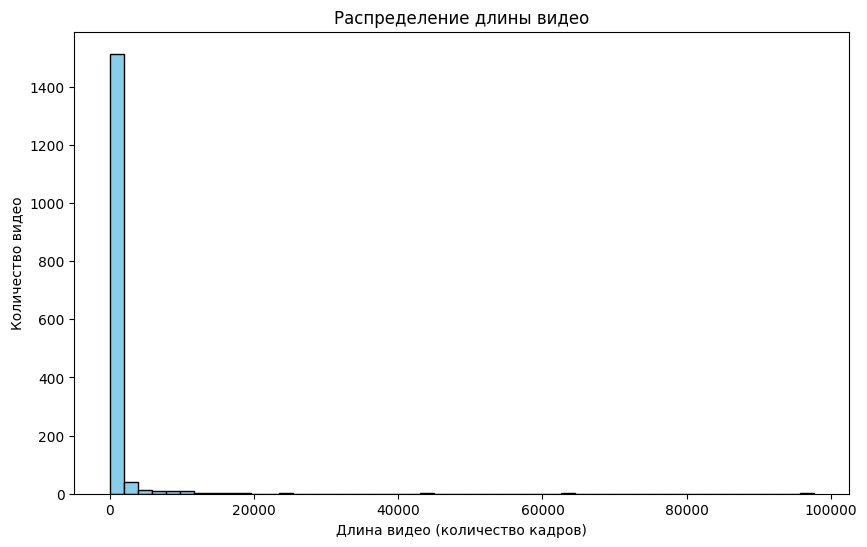

Минимальная длина видео: 11
Максимальная длина видео: 97651
Средняя длина видео: 786.55
Медианная длина видео: 222.5


In [ ]:
import matplotlib.pyplot as plt

# Собираем данные о длине каждого видео
video_lengths = [len(info[0]) for info in dataset.videos_info]

# Визуализация распределения длин видео
plt.figure(figsize=(10, 6))
plt.hist(video_lengths, bins=50, color='skyblue', edgecolor='black')
plt.title('Распределение длины видео')
plt.xlabel('Длина видео (количество кадров)')
plt.ylabel('Количество видео')
plt.show()

# Дополнительно можно вывести основные статистики
print(f"Минимальная длина видео: {min(video_lengths)}")
print(f"Максимальная длина видео: {max(video_lengths)}")
print(f"Средняя длина видео: {np.mean(video_lengths):.2f}")
print(f"Медианная длина видео: {np.median(video_lengths)}")


####Объекты свыше 10 тыс кадров

Видно, что после 10 000 кадров идут выбросы

In [ ]:
# посмотрим, сколько видео и в каких классах превышают 10 тыс кадров
video_lengths = [len(info[0]) for info in dataset.videos_info]
video_classes = [info[1] for info in dataset.videos_info]

# Определение порога
threshold = 10000

# Подсчет и классификация видео, превышающих порог
videos_above_threshold = sum(length > threshold for length in video_lengths)
print(f"Количество видео с более чем {threshold} кадрами: {videos_above_threshold}")

# Получение классов видео, превышающих порог
classes_above_threshold = [class_name for length, class_name in zip(video_lengths, video_classes) if length > threshold]

# Подсчет количества видео для каждого класса
from collections import Counter
class_counts = Counter(classes_above_threshold)
print("Количество видео с более чем 10 тыс. кадров по классам:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count}")


Количество видео с более чем 10000 кадрами: 20
Количество видео с более чем 10 тыс. кадров по классам:
Explosion: 1
Arson: 1
NormalVideos: 18


###class VideoDataset до 10 тыс кадров

In [ ]:
class VideoDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.videos_info = []  # Информация о видео: список кортежей (пути к кадрам, класс)
        self.threshold = 10000  # Порог для максимальной длины видео
        excluded_classes = ['Explosion', 'Arson', 'NormalVideos']  # Классы для исключения при превышении порога

        # Собираем информацию о видео
        for class_folder in os.listdir(root_dir):
            class_path = os.path.join(root_dir, class_folder)
            if not os.path.isdir(class_path):
                continue  # Пропускаем, если это не директория
            class_idx = class_folder  # Название папки соответствует классу

            # Словарь для группировки кадров по ID видео
            video_frames = {}
            for frame_file in glob.glob(os.path.join(class_path, '*.png')):
                match = re.search(r'\d+', frame_file)  # Извлечение числового ID видео из имени файла
                if match:
                    video_id = int(match.group())  # Преобразование к числу
                    if video_id not in video_frames:
                        video_frames[video_id] = []  # Создаем новый видеоролик
                    video_frames[video_id].append(frame_file)

            # Добавляем информацию о каждом видео
            for video_id, frames in video_frames.items():
                if frames and (len(frames) <= self.threshold or class_idx not in excluded_classes):
                    # Исключаем видео, превышающие порог только для указанных классов
                    self.videos_info.append((sorted(frames), class_idx))  # Добавляем информацию о видеоролике

    def __len__(self):
        return len(self.videos_info)

    def __getitem__(self, idx):
        frames_paths, class_name = self.videos_info[idx]
        # Взять каждый второй кадр из списка, чтобы имитировать выбор каждого двадцатого кадра из оригинала
        frames_paths = frames_paths[::2]  # Взять каждый второй кадр

        frames = [Image.open(frame_path) for frame_path in frames_paths]

        # Преобразование каждого кадра в тензор и их нормализация
        transform = transforms.Compose([
            transforms.Grayscale(num_output_channels=1),  # Преобразование в черно-белое изображение
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485], std=[0.229])  # Обновленные параметры нормализации для одного канала
        ])
        frames_tensors = torch.stack([transform(frame) for frame in frames])

        return frames_tensors, class_name

#Пример использования
root_dir = '/content/Train'
dataset = VideoDataset(root_dir=root_dir)
print(f"Длина датасета: {len(dataset)}")


Длина датасета: 1590


##Распределение до 10 тыс кадров

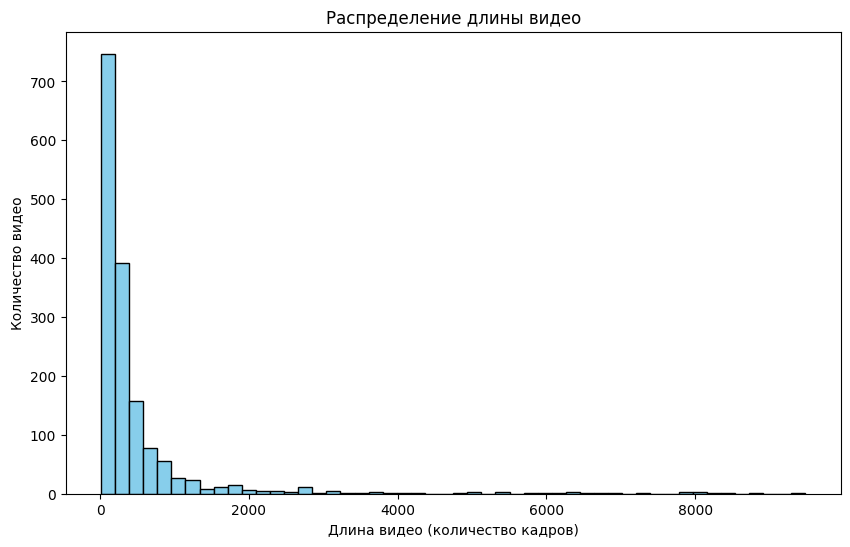

Минимальная длина видео: 11
Максимальная длина видео: 9480
Средняя длина видео: 516.39
Медианная длина видео: 219.0


In [ ]:
import matplotlib.pyplot as plt

# Собираем данные о длине каждого видео
video_lengths = [len(info[0]) for info in dataset.videos_info]

# Визуализация распределения длин видео
plt.figure(figsize=(10, 6))
plt.hist(video_lengths, bins=50, color='skyblue', edgecolor='black')
plt.title('Распределение длины видео')
plt.xlabel('Длина видео (количество кадров)')
plt.ylabel('Количество видео')
plt.show()

# Дополнительно можно вывести основные статистики
print(f"Минимальная длина видео: {min(video_lengths)}")
print(f"Максимальная длина видео: {max(video_lengths)}")
print(f"Средняя длина видео: {np.mean(video_lengths):.2f}")
print(f"Медианная длина видео: {np.median(video_lengths)}")

## Пороги 4 и 2,5 тыс кадров

In [ ]:
#посмотрим, сколько видео и в каких классах превышают 4 тыс кадров
video_lengths = [len(info[0]) for info in dataset.videos_info]
video_classes = [info[1] for info in dataset.videos_info]

# Определение порога
threshold = 4000

# Подсчет и классификация видео, превышающих порог
videos_above_threshold = sum(length > threshold for length in video_lengths)
print(f"Количество видео с более чем {threshold} кадрами: {videos_above_threshold}")

# Получение классов видео, превышающих порог
classes_above_threshold = [class_name for length, class_name in zip(video_lengths, video_classes) if length > threshold]

# Подсчет количества видео для каждого класса
from collections import Counter
class_counts = Counter(classes_above_threshold)
print("Количество видео с более чем 4 тыс. кадров по классам:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count}")

Количество видео с более чем 4000 кадрами: 34
Количество видео с более чем 4 тыс. кадров по классам:
Arrest: 1
Shoplifting: 1
NormalVideos: 30
Burglary: 2


In [ ]:
# rename NormalVideos files


In [ ]:
#посмотрим, сколько видео и в каких классах превышают 2,5 тыс кадров
video_lengths = [len(info[0]) for info in dataset.videos_info]
video_classes = [info[1] for info in dataset.videos_info]

# Определение порога
threshold = 2500

# Подсчет и классификация видео, превышающих порог
videos_above_threshold = sum(length > threshold for length in video_lengths)
print(f"Количество видео с более чем {threshold} кадрами: {videos_above_threshold}")

# Получение классов видео, превышающих порог
classes_above_threshold = [class_name for length, class_name in zip(video_lengths, video_classes) if length > threshold]

# Подсчет количества видео для каждого класса
from collections import Counter
class_counts = Counter(classes_above_threshold)
print("Количество видео с более чем 2,5 тыс. кадров по классам:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count}")

Количество видео с более чем 2500 кадрами: 82
Количество видео с более чем 2,5 тыс. кадров по классам:
Arrest: 1
Abuse: 1
Shoplifting: 2
Explosion: 1
Arson: 1
Fighting: 2
NormalVideos: 72
Burglary: 2


In [ ]:
#Удалим всё свыше 4000 кадров, таких видео всего 54 (из них 48 - это NormalVideos)
import os
import glob
import torch
from torch.utils.data import Dataset
from PIL import Image
from torchvision import transforms
import re

class VideoDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.videos_info = []  # Информация о видео: список кортежей (пути к кадрам, класс)
        self.max_frames = 4000  # Максимальное количество кадров для каждого видео

        # Собираем информацию о видео
        for class_folder in os.listdir(root_dir):
            class_path = os.path.join(root_dir, class_folder)
            if not os.path.isdir(class_path):
                continue  # Пропускаем, если это не директория
            class_idx = class_folder  # Название папки соответствует классу

            # Словарь для группировки кадров по ID видео
            video_frames = {}
            for frame_file in glob.glob(os.path.join(class_path, '*.png')):
                match = re.search(r'\d+', frame_file)  # Извлечение числового ID видео из имени файла
                if match:
                    video_id = int(match.group())  # Преобразование к числу
                    if video_id not in video_frames:
                        video_frames[video_id] = []  # Создаем новый видеоролик
                    video_frames[video_id].append(frame_file)

            # Добавляем информацию о каждом видео, если оно не превышает максимальное количество кадров
            for video_id, frames in video_frames.items():
                if frames and len(frames) <= self.max_frames:  # Проверяем ограничение по длине
                    self.videos_info.append((sorted(frames), class_idx))  # Добавляем информацию о видеоролике

    def __len__(self):
        return len(self.videos_info)

    def __getitem__(self, idx):
        frames_paths, class_name = self.videos_info[idx]
        frames = [Image.open(frame_path) for frame_path in frames_paths]

        # Преобразование каждого кадра в тензор и их нормализация
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        frames_tensors = torch.stack([transform(frame) for frame in frames])

        return frames_tensors, class_name

#Пример использования
root_dir = '/content/Train'
dataset = VideoDataset(root_dir=root_dir)
print(f"Длина датасета: {len(dataset)}")

Длина датасета: 1556


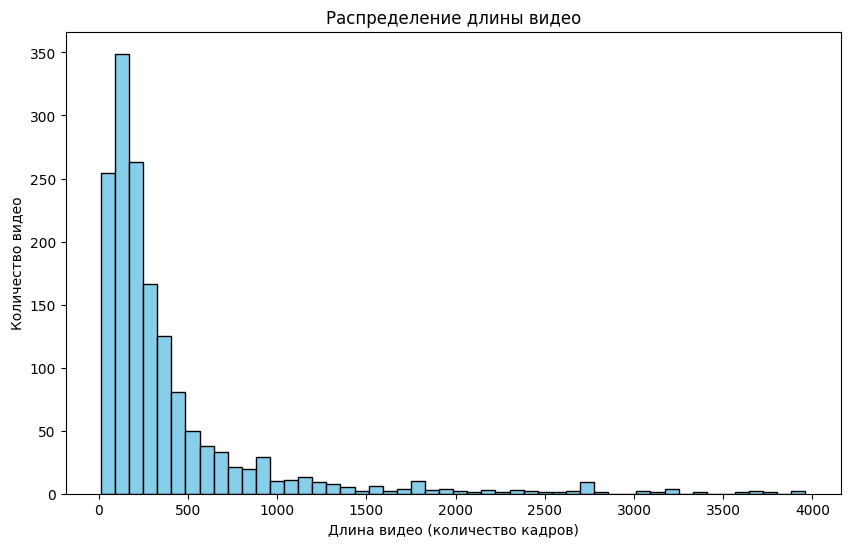

Минимальная длина видео: 11
Максимальная длина видео: 3961
Средняя длина видео: 387.24
Медианная длина видео: 212.5


In [ ]:
# Посмотрим на распределение теперь, после удаления всех роликов свыше 4000 кадров (54 шт)

import matplotlib.pyplot as plt

# Собираем данные о длине каждого видео
video_lengths = [len(info[0]) for info in dataset.videos_info]

# Визуализация распределения длин видео
plt.figure(figsize=(10, 6))
plt.hist(video_lengths, bins=50, color='skyblue', edgecolor='black')
plt.title('Распределение длины видео')
plt.xlabel('Длина видео (количество кадров)')
plt.ylabel('Количество видео')
plt.show()

# Дополнительно можно вывести основные статистики
print(f"Минимальная длина видео: {min(video_lengths)}")
print(f"Максимальная длина видео: {max(video_lengths)}")
print(f"Средняя длина видео: {np.mean(video_lengths):.2f}")
print(f"Медианная длина видео: {np.median(video_lengths)}")

1. Посмотреть, что происходит от длины 1500-2000, если много нормал, то выкинуть

In [ ]:
#посмотрим, сколько видео и в каких классах превышают 1,5 тыс кадров
video_lengths = [len(info[0]) for info in dataset.videos_info]
video_classes = [info[1] for info in dataset.videos_info]

# Определение порога
threshold = 1500

# Подсчет и классификация видео, превышающих порог
videos_above_threshold = sum(length > threshold for length in video_lengths)
print(f"Количество видео с более чем {threshold} кадрами: {videos_above_threshold}")

# Получение классов видео, превышающих порог
classes_above_threshold = [class_name for length, class_name in zip(video_lengths, video_classes) if length > threshold]

# Подсчет количества видео для каждого класса
from collections import Counter
class_counts = Counter(classes_above_threshold)
print("Количество видео с более чем 1,5 тыс. кадров по классам:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count}")

Количество видео с более чем 1500 кадрами: 124
Количество видео с более чем 1,5 тыс. кадров по классам:
Explosion: 1
Arson: 1
Fighting: 3
Shoplifting: 4
Stealing: 5
RoadAccidents: 1
Robbery: 1
NormalVideos: 101
Burglary: 3
Abuse: 2
Arrest: 2


In [ ]:
#Удалим всё свыше 1500 кадров
import os
import glob
import torch
from torch.utils.data import Dataset
from PIL import Image
from torchvision import transforms
import re

class VideoDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.videos_info = []  # Информация о видео: список кортежей (пути к кадрам, класс)
        self.max_frames = 1500  # Максимальное количество кадров для каждого видео

        # Собираем информацию о видео
        for class_folder in os.listdir(root_dir):
            class_path = os.path.join(root_dir, class_folder)
            if not os.path.isdir(class_path):
                continue  # Пропускаем, если это не директория
            class_idx = class_folder  # Название папки соответствует классу

            # Словарь для группировки кадров по ID видео
            video_frames = {}
            for frame_file in glob.glob(os.path.join(class_path, '*.png')):
                match = re.search(r'\d+', frame_file)  # Извлечение числового ID видео из имени файла
                if match:
                    video_id = int(match.group())  # Преобразование к числу
                    if video_id not in video_frames:
                        video_frames[video_id] = []  # Создаем новый видеоролик
                    video_frames[video_id].append(frame_file)

            # Добавляем информацию о каждом видео, если оно не превышает максимальное количество кадров
            for video_id, frames in video_frames.items():
                if frames and len(frames) <= self.max_frames:  # Проверяем ограничение по длине
                    self.videos_info.append((sorted(frames), class_idx))  # Добавляем информацию о видеоролике

    def __len__(self):
        return len(self.videos_info)

    def __getitem__(self, idx):
        frames_paths, class_name = self.videos_info[idx]
        frames = [Image.open(frame_path) for frame_path in frames_paths]

        # Преобразование каждого кадра в тензор и их нормализация
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        frames_tensors = torch.stack([transform(frame) for frame in frames])

        return frames_tensors, class_name

#Пример использования
root_dir = '/content/Train'
dataset = VideoDataset(root_dir=root_dir)
print(f"Длина датасета: {len(dataset)}")

Длина датасета: 1486


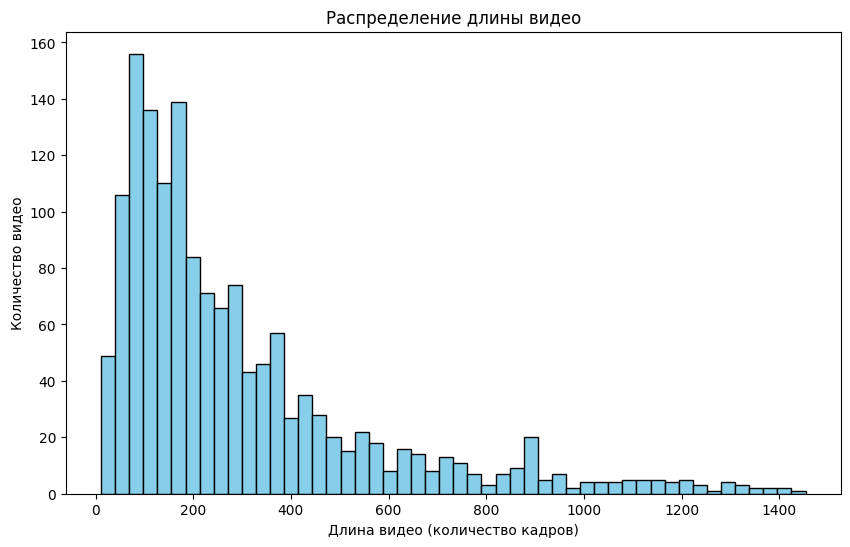

Минимальная длина видео: 11
Максимальная длина видео: 1454
Средняя длина видео: 294.52
Медианная длина видео: 198.0


In [ ]:
#Посмотрим на распределение теперь, после удаления всех роликов свыше 1500 кадров

import matplotlib.pyplot as plt

# Собираем данные о длине каждого видео
video_lengths = [len(info[0]) for info in dataset.videos_info]

# Визуализация распределения длин видео
plt.figure(figsize=(10, 6))
plt.hist(video_lengths, bins=50, color='skyblue', edgecolor='black')
plt.title('Распределение длины видео')
plt.xlabel('Длина видео (количество кадров)')
plt.ylabel('Количество видео')
plt.show()

# Дополнительно можно вывести основные статистики
print(f"Минимальная длина видео: {min(video_lengths)}")
print(f"Максимальная длина видео: {max(video_lengths)}")
print(f"Средняя длина видео: {np.mean(video_lengths):.2f}")
print(f"Медианная длина видео: {np.median(video_lengths)}")

#Баланс классов

##Изначальный баланс классов

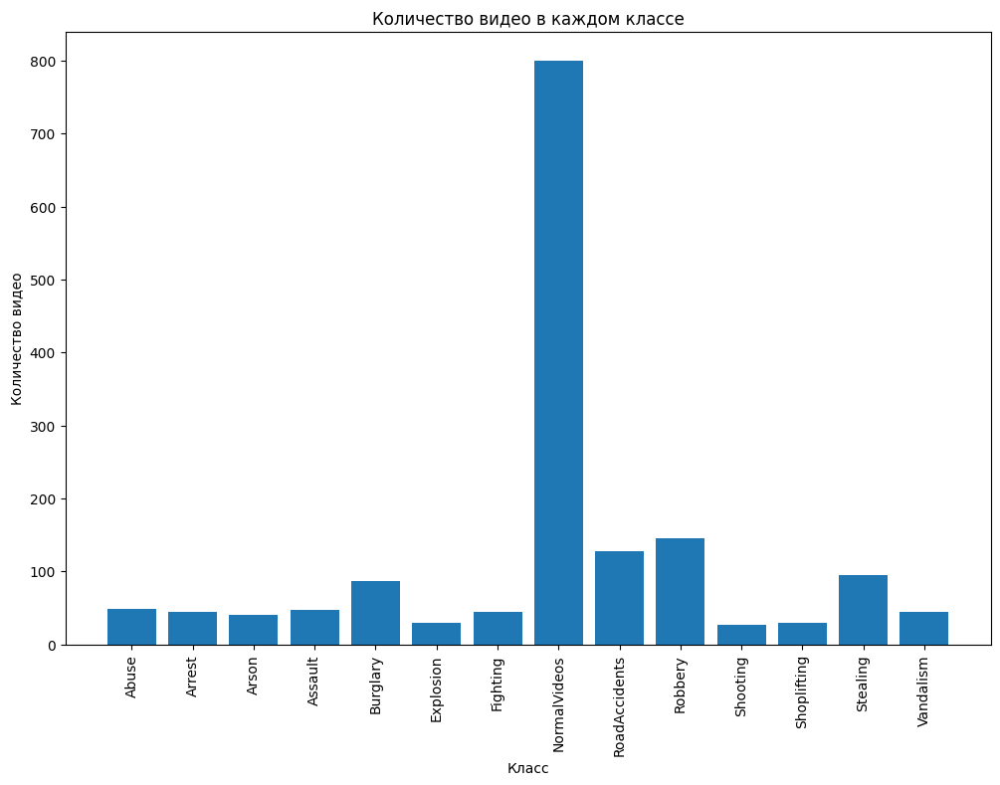

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter

# Создание списка классов из датасета
classes = [class_name for _, class_name in dataset.videos_info]

# Подсчет количества видео в каждом классе
class_counts = Counter(classes)

# Сортировка классов для последовательного отображения на гистограмме
sorted_class_counts = dict(sorted(class_counts.items()))

# Создание гистограммы
plt.figure(figsize=(12, 8))
plt.bar(range(len(sorted_class_counts)), list(sorted_class_counts.values()), align='center')
plt.xticks(range(len(sorted_class_counts)), list(sorted_class_counts.keys()), rotation=90)
plt.title('Количество видео в каждом классе')
plt.xlabel('Класс')
plt.ylabel('Количество видео')
plt.show()


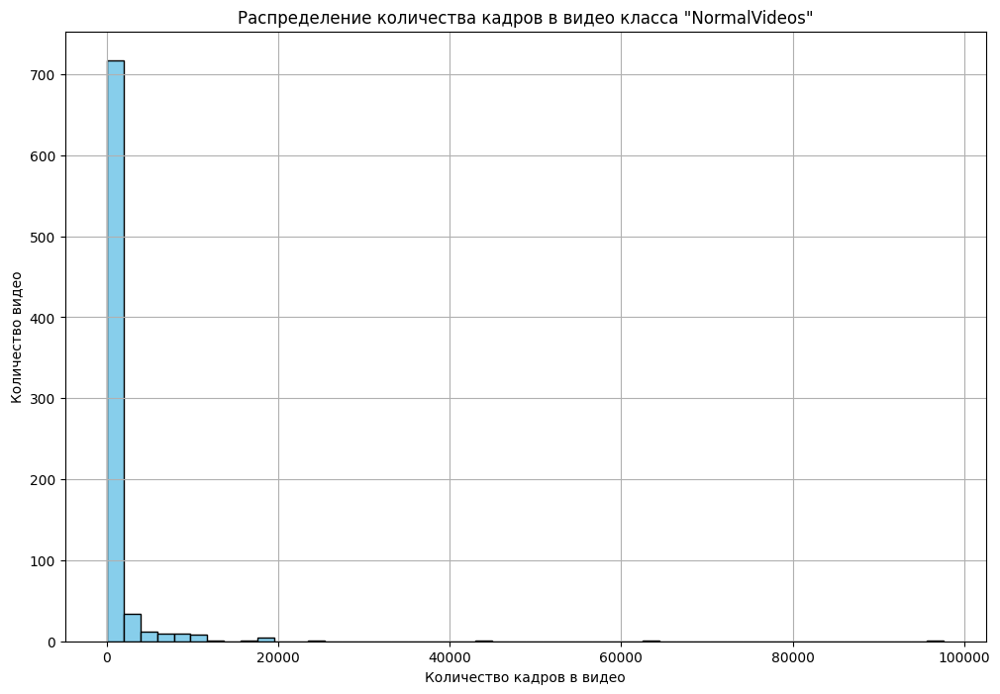

Минимальное количество кадров в видео класса 'NormalVideos': 21
Максимальное количество кадров в видео класса 'NormalVideos': 97651
Среднее количество кадров в видео класса 'NormalVideos': 1184.71


In [ ]:
# Собираем количество кадров только для видео класса "NormalVideos"
normal_videos_frames_count = []

for video_info in dataset.videos_info:
    frames_paths, class_name = video_info
    if class_name == "NormalVideos":  # Или "NormalVideos", в зависимости от вашего датасета
        normal_videos_frames_count.append(len(frames_paths))

# Визуализация распределения количества кадров в видео класса "NormalVideos"
plt.figure(figsize=(12, 8))
plt.hist(normal_videos_frames_count, bins=50, color='skyblue', edgecolor='black')
plt.title('Распределение количества кадров в видео класса "NormalVideos"')
plt.xlabel('Количество кадров в видео')
plt.ylabel('Количество видео')
plt.grid(True)
plt.show()

# Вывод информации о распределении
if normal_videos_frames_count:
    print(f"Минимальное количество кадров в видео класса 'NormalVideos': {min(normal_videos_frames_count)}")
    print(f"Максимальное количество кадров в видео класса 'NormalVideos': {max(normal_videos_frames_count)}")
    print(f"Среднее количество кадров в видео класса 'NormalVideos': {sum(normal_videos_frames_count) / len(normal_videos_frames_count):.2f}")
else:
    print("В датасете нет видео класса 'NormalVideos' или произошла ошибка при фильтрации.")


##Баланс классов при пороге 1,5 тыс кадров

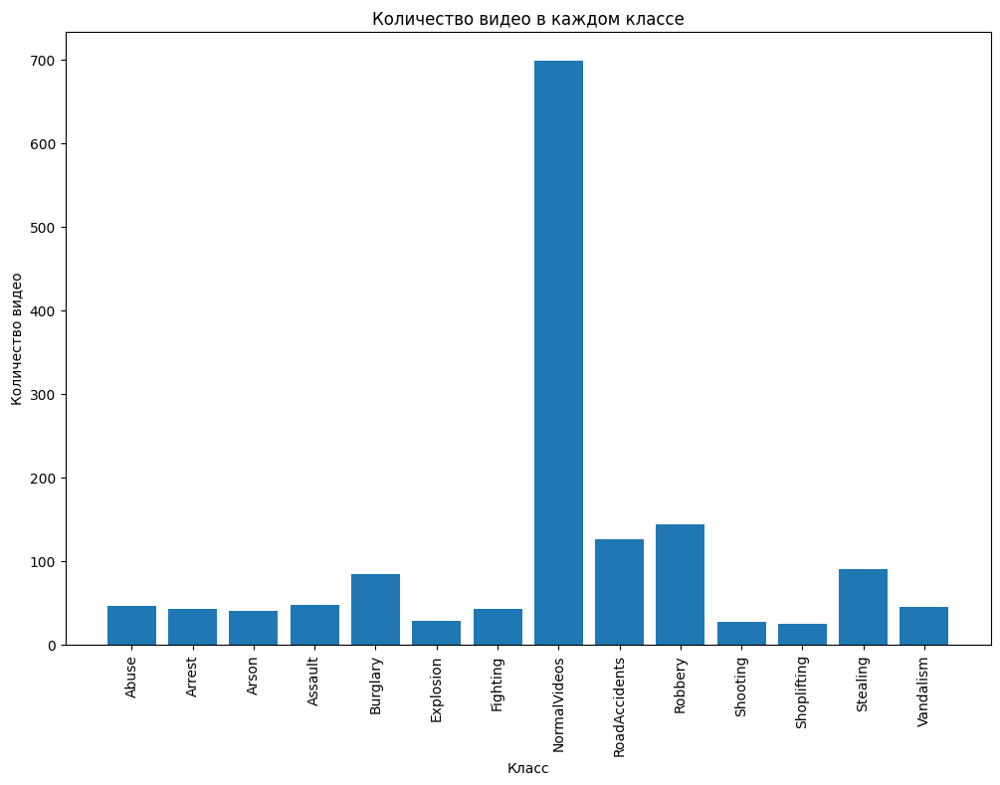

In [ ]:
#посмотрим на баланс классов теперь, после выкидывания всех видео больше 1,5 тыс кадров
import matplotlib.pyplot as plt
from collections import Counter

# Создание списка классов из датасета
classes = [class_name for _, class_name in dataset.videos_info]

# Подсчет количества видео в каждом классе
class_counts = Counter(classes)

# Сортировка классов для последовательного отображения на гистограмме
sorted_class_counts = dict(sorted(class_counts.items()))

# Создание гистограммы
plt.figure(figsize=(12, 8))
plt.bar(range(len(sorted_class_counts)), list(sorted_class_counts.values()), align='center')
plt.xticks(range(len(sorted_class_counts)), list(sorted_class_counts.keys()), rotation=90)
plt.title('Количество видео в каждом классе')
plt.xlabel('Класс')
plt.ylabel('Количество видео')
plt.show()


##Вывод: датасет по-прежнему несбалансированный с преобладанием класса NormalVideos. Чтобы работать с такими данными, мы применем взвешивание классов при подсчете ошибки + метрики f1 micro и f1 macro.

#Метрики
В задаче для оценки будут применяться F1 Micro, F1 Macro, loss, ROC AUC для бинарной классификации

**F1 Micro**

F1 Micro вычисляется на основе глобальных сумм истинных положительных (TP), ложных положительных (FP) и ложных отрицательных (FN) значений по всем классам:

$$
F1_{\text{micro}} = \frac{2 \cdot TP_{\text{micro}}}{2 \cdot TP_{\text{micro}} + FP_{\text{micro}} + FN_{\text{micro}}}
$$

где:
- $TP_{\text{micro}}$ — сумма истинно положительных решений по всем классам,
- $FP_{\text{micro}}$ — сумма ложноположительных решений по всем классам,
- $FN_{\text{micro}}$ — сумма ложноотрицательных решений по всем классам.

**F1 Macro**

F1 Macro вычисляется как среднее арифметическое F1-скоров для каждого класса, без учета пропорции каждого класса:

$$
F1_{\text{macro}} = \frac{1}{N} \sum_{i=1}^{N} \frac{2 \cdot TP_i}{2 \cdot TP_i + FP_i + FN_i}
$$

где:
- $N$ — количество классов,
- $TP_i$ — истинно положительные решения для класса $i$,
- $FP_i$ — ложноположительные решения для класса $i$,
- $FN_i$ — ложноотрицательные решения для класса $i$.


### CrossEntropyLoss с взвешиванием классов

Функция потерь кросс-энтропии с взвешиванием классов может быть выражена следующим образом:

$$
L = - \sum_{i=1}^{C} w_i \cdot y_i \cdot \log(p_i)
$$

где:
- $C$ — количество классов,
- $w_i$ — вес для класса $i$,
- $y_i$ — истинная метка класса $i$ (обычно 0 или 1, в зависимости от того, принадлежит ли пример классу $i$),
- $p_i$ — предсказанная вероятность принадлежности примера к классу $i$.

### ROC AUC

ROC (Receiver Operating Characteristic) AUC (Area Under the ROC Curve) — это мера, используемая для оценки качества бинарной классификации и выбора моделей, основанная на соотношении между истинно положительными результатами и ложно положительными результатами при различных пороговых значениях. ROC кривая строится в координатах TPR (True Positive Rate) и FPR (False Positive Rate), и AUC представляет собой площадь под этой кривой.

Формулы для TPR и FPR:

$$
TPR = \frac{TP}{TP + FN}
$$

$$
FPR = \frac{FP}{FP + TN}
$$

где:
- $TP$ — количество истинно положительных результатов,
- $FN$ — количество ложно отрицательных результатов,
- $FP$ — количество ложно положительных результатов,
- $TN$ — количество истинно отрицательных результатов.


#Аугментации

Длина датасета: 1486


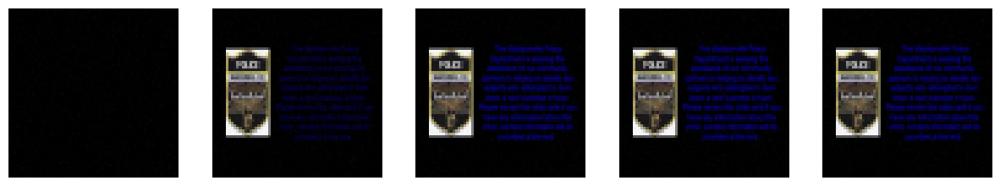

In [ ]:
#1500, take_each_picture=2 (позволяет брать не каждый кадр, а с некоторым шагом, например, каждый 3-й) + #аугментации- вариант 2, которые должны быть физичными для данной задачи. Возьмем размытие, горизонтальный флип, гауссовский шум (но для него пропишем функцию, так как нет такой встроенной аугментации)
import matplotlib.pyplot as plt
import numpy as np
import torchvision.transforms.functional as F

class AddGaussianNoise(object):
    """Добавление гауссовского шума к изображению."""
    def __init__(self, mean=0., std=1.):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)

class VideoDataset(Dataset):
    def __init__(self, root_dir, transform=None, take_each_picture=2):
        self.root_dir = root_dir
        self.videos_info = []
        self.max_frames = 1500
        self.take_each_picture = take_each_picture
        self.transform = transform or transforms.Compose([
            transforms.ToTensor(),
            #transforms.RandomHorizontalFlip(),
            transforms.RandomApply([transforms.GaussianBlur(5)], p=0.2),
            AddGaussianNoise(0., 0.01),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        # Собираем информацию о видео
        for class_folder in os.listdir(root_dir):
            class_path = os.path.join(root_dir, class_folder)
            if not os.path.isdir(class_path):
                continue  # Пропускаем, если это не директория
            class_idx = class_folder  # Название папки соответствует классу

            # Словарь для группировки кадров по ID видео
            video_frames = {}
            for frame_file in glob.glob(os.path.join(class_path, '*.png')):
                match = re.search(r'\d+', frame_file)  # Извлечение числового ID видео из имени файла
                if match:
                    video_id = int(match.group())  # Преобразование к числу
                    if video_id not in video_frames:
                        video_frames[video_id] = []  # Создаем новый видеоролик
                    video_frames[video_id].append(frame_file)

            # Добавляем информацию о каждом видео, если оно не превышает максимальное количество кадров
            for video_id, frames in video_frames.items():
                if frames and len(frames) <= self.max_frames:  # Проверяем ограничение по длине
                    self.videos_info.append((
                        self.sort_pictures_paths(np.array(frames)),
                        class_idx))  # Добавляем информацию о видеоролике

    def sort_pictures_paths(self, frames): # Ставим кадры в правильном порядке
        ids_of_sorted_pictures = np.argsort([
                     int(os.path.splitext(pic_path)[0].split('_')[-1])
                     for i, pic_path in enumerate(frames)])

        return frames[ids_of_sorted_pictures]

    def __len__(self):
        return len(self.videos_info)

    def __getitem__(self, idx):
        frames_paths, class_name = self.videos_info[idx]
        frames_paths = frames_paths[::self.take_each_picture]
        frames = [Image.open(frame_path).convert("RGB") for frame_path in frames_paths]  # Убедимся, что изображение в RGB

        if self.transform:
            frames = [self.transform(frame) for frame in frames]

        return torch.stack(frames), class_name

# Пример использования и визуализации аугментированных изображений
root_dir = '/content/Train'
dataset = VideoDataset(root_dir=root_dir)

print(f"Длина датасета: {len(dataset)}")

# Функция для обратной нормализации изображения
def unnormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    tensor = tensor * std.view(3, 1, 1) + mean.view(3, 1, 1)
    tensor = tensor.clamp(0, 1)
    return tensor

# Визуализация изображений с обратной нормализацией
if len(dataset) > 0:
    frames_tensors, _ = dataset[7]
    num_frames_to_display = min(5, len(frames_tensors))

    fig, axes = plt.subplots(1, num_frames_to_display, figsize=(15, 3))
    for i in range(num_frames_to_display):
        img = unnormalize(frames_tensors[i])
        img = F.to_pil_image(img)
        axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()
else:
    print("Датасет пуст.")


Длина датасета: 1486


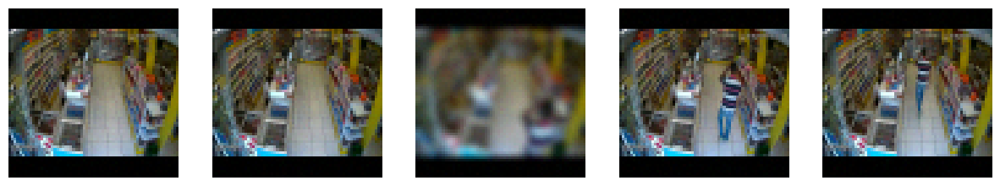

In [ ]:
#+ take_each_picture (позволяет брать не каждый кадр, а с некоторым шагом, например, каждый 3-й) + #аугментации- вариант 2, которые должны быть физичными для данной задачи. Возьмем размытие, горизонтальный флип, гауссовский шум (но для него пропишем функцию, так как нет такой встроенной аугментации)
import matplotlib.pyplot as plt
import numpy as np
import torchvision.transforms.functional as F

class AddGaussianNoise(object):
    """Добавление гауссовского шума к изображению."""
    def __init__(self, mean=0., std=1.):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)

class VideoDataset(Dataset):
    def __init__(self, root_dir, transform=None, take_each_picture=3):
        self.root_dir = root_dir
        self.videos_info = []
        self.max_frames = 1500
        self.take_each_picture = take_each_picture
        self.transform = transform or transforms.Compose([
            transforms.ToTensor(),
            #transforms.RandomHorizontalFlip(),
            transforms.RandomApply([transforms.GaussianBlur(5)], p=0.2),
            AddGaussianNoise(0., 0.01),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        # Собираем информацию о видео
        for class_folder in os.listdir(root_dir):
            class_path = os.path.join(root_dir, class_folder)
            if not os.path.isdir(class_path):
                continue  # Пропускаем, если это не директория
            class_idx = class_folder  # Название папки соответствует классу

            # Словарь для группировки кадров по ID видео
            video_frames = {}
            for frame_file in glob.glob(os.path.join(class_path, '*.png')):
                match = re.search(r'\d+', frame_file)  # Извлечение числового ID видео из имени файла
                if match:
                    video_id = int(match.group())  # Преобразование к числу
                    if video_id not in video_frames:
                        video_frames[video_id] = []  # Создаем новый видеоролик
                    video_frames[video_id].append(frame_file)

            # Добавляем информацию о каждом видео, если оно не превышает максимальное количество кадров
            for video_id, frames in video_frames.items():
                if frames and len(frames) <= self.max_frames:  # Проверяем ограничение по длине
                    self.videos_info.append((
                        self.sort_pictures_paths(np.array(frames)),
                        class_idx))  # Добавляем информацию о видеоролике

    def sort_pictures_paths(self, frames): # Ставим кадры в правильном порядке
        ids_of_sorted_pictures = np.argsort([
                     int(os.path.splitext(pic_path)[0].split('_')[-1])
                     for i, pic_path in enumerate(frames)])

        return frames[ids_of_sorted_pictures]

    def __len__(self):
        return len(self.videos_info)

    def __getitem__(self, idx):
        frames_paths, class_name = self.videos_info[idx]
        frames_paths = frames_paths[::self.take_each_picture]
        frames = [Image.open(frame_path).convert("RGB") for frame_path in frames_paths]  # Убедимся, что изображение в RGB

        if self.transform:
            frames = [self.transform(frame) for frame in frames]

        return torch.stack(frames), class_name

# Пример использования и визуализации аугментированных изображений
root_dir = '/content/Train'
dataset = VideoDataset(root_dir=root_dir)

print(f"Длина датасета: {len(dataset)}")

# Функция для обратной нормализации изображения
def unnormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    tensor = tensor * std.view(3, 1, 1) + mean.view(3, 1, 1)
    tensor = tensor.clamp(0, 1)
    return tensor

# Визуализация изображений с обратной нормализацией
if len(dataset) > 0:
    frames_tensors, _ = dataset[5]
    num_frames_to_display = min(5, len(frames_tensors))

    fig, axes = plt.subplots(1, num_frames_to_display, figsize=(15, 3))
    for i in range(num_frames_to_display):
        img = unnormalize(frames_tensors[i])
        img = F.to_pil_image(img)
        axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()
else:
    print("Датасет пуст.")


##Аугментации выглядят физичными. Это имитация дождя, грязи, снижения резкости у камер видеонаблюдения. Оставим их

#Функция def_collate и создание DataLoaders

In [ ]:
# Соберем функцию def_collate с преобразованием str классов в int. Пока попробуем добить нулями до максимальной длины, учитывая, что мы убрали выбросы (больше 1,5 тыс кадров)
import torch

CLASS_NAMES = [
    'Abuse', 'Arrest', 'Arson', 'Assault', 'Burglary',
    'Explosion', 'Fighting', 'RoadAccidents', 'Robbery',
    'Shooting', 'Shoplifting', 'Stealing', 'Vandalism', 'NormalVideos'
]

# Создаем словарь для сопоставления строковых классов с числами
CLASS_TO_IDX = {class_name: idx for idx, class_name in enumerate(CLASS_NAMES)}

def collate_batch(batch):
    # Находим видео с максимальным количеством кадров в пакете
    max_frames = max(video.shape[0] for video, _ in batch)

    lengths_list = []
    videos_padded, classes_idx = [], []
    for video, class_name in batch:
        # Определяем, сколько нулей нужно добавить
        pad_size = max_frames - video.shape[0]

        # Создаем тензор-паддинг и добавляем его к видео
        if pad_size > 0:
            pad = torch.zeros(pad_size, *video.shape[1:], dtype=video.dtype)
            video_padded = torch.cat([video, pad], dim=0)  # Добавляем паддинг к видео
        else:
            video_padded = video

        videos_padded.append(video_padded)
        classes_idx.append(CLASS_TO_IDX[class_name])  # Преобразуем название класса в индекс
        lengths_list.append(video.shape[0])

    # Стекаем все видео в один тензор и преобразуем индексы классов в тензор
    videos_tensor = torch.stack(videos_padded)
    classes_tensor = torch.tensor(classes_idx, dtype=torch.long)
    lengths_tensor = torch.tensor(lengths_list, dtype=torch.long)

    #print(f"Batch size: {videos_tensor.size(0)}")
    #print(f"Max frames in batch: {videos_tensor.size(1)}")
    #print(f"Channels: {videos_tensor.size(2)}, Height: {videos_tensor.size(3)}, Width: {videos_tensor.size(4)}")

    return videos_tensor, classes_tensor, lengths_tensor

#Стратифицированное разделение на трейн и валидацию

In [ ]:
#Стратифицированное разделение на трейн и валидацию
import os
import shutil  # Импорт модуля shutil
import glob
import re
from sklearn.model_selection import train_test_split

TEST_SIZE = 0.3

train_folder = '/content/Train'
train_dataset = VideoDataset(train_folder)

#root_dir = train_folder
list_pairs_label_name_and_videos = []
for class_folder in os.listdir(root_dir):
    class_path = os.path.join(root_dir, class_folder)
    label_name = class_folder

    video_frames = {}  # video_id -> list_of_paths_of_pictures
    for frame_file in glob.glob(os.path.join(class_path, '*.png')):
        match = re.search(r'\d+', frame_file)  # Извлечение числового ID видео из имени файла
        if match:
            video_id = int(match.group())  # Преобразование к числу
            if video_id not in video_frames:
                video_frames[video_id] = []  # Создаем новый видеоролик
            video_frames[video_id].append(frame_file)
    for video in video_frames.values():
        list_pairs_label_name_and_videos.append((label_name, video))  # video - лист полных путей до картинок видео

label_names = [pair[0] for pair in list_pairs_label_name_and_videos]
train_pairs_label_name_and_videos, val_pairs_label_name_and_videos = \
    train_test_split(list_pairs_label_name_and_videos, test_size=TEST_SIZE, stratify=label_names, shuffle=True)

divided_train_folder_path = '/content/divided_train'
divided_val_folder_path = '/content/divided_val'

def copy_files_to_folder_with_structure(pairs_label_name_and_videos, result_dir):
    os.makedirs(result_dir, exist_ok=True)
    for label_name, pictures_paths in pairs_label_name_and_videos:
        new_class_folder = os.path.join(result_dir, label_name)
        os.makedirs(new_class_folder, exist_ok=True)
        for pic_path in pictures_paths:
            new_pic_path = os.path.join(new_class_folder, os.path.basename(pic_path))
            shutil.copyfile(pic_path, new_pic_path)  # Использую shutil.copyfile

copy_files_to_folder_with_structure(train_pairs_label_name_and_videos, divided_train_folder_path)
copy_files_to_folder_with_structure(val_pairs_label_name_and_videos, divided_val_folder_path)


train_dataset = VideoDataset(divided_train_folder_path)
val_dataset = VideoDataset(divided_val_folder_path)


In [ ]:
#создадим Dataloaders

from torch.utils.data import DataLoader
from torch.utils.data import random_split

BATCH_SIZE = 8

# Создание обучающего и тестового датасета
test_dataset = VideoDataset('/content/Test')
#train_dataset = VideoDataset('/content/Train')

#train_size = int(0.8 * len(train_dataset))  # 80% данных для обучения
#val_size = len(train_dataset) - train_size  # 20% данных для валидации

# Разделение train_dataset на новые train_dataset и val_dataset
#train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

# Создание DataLoader'ов
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_batch)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_batch)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_batch)

# Создаем словарь dataloaders, содержащий оба DataLoader
dataloaders = {
    'train': train_dataloader,
    'val': val_dataloader
}

# Распределения в валидации и трейне

Распределения длин внутри каждого класса

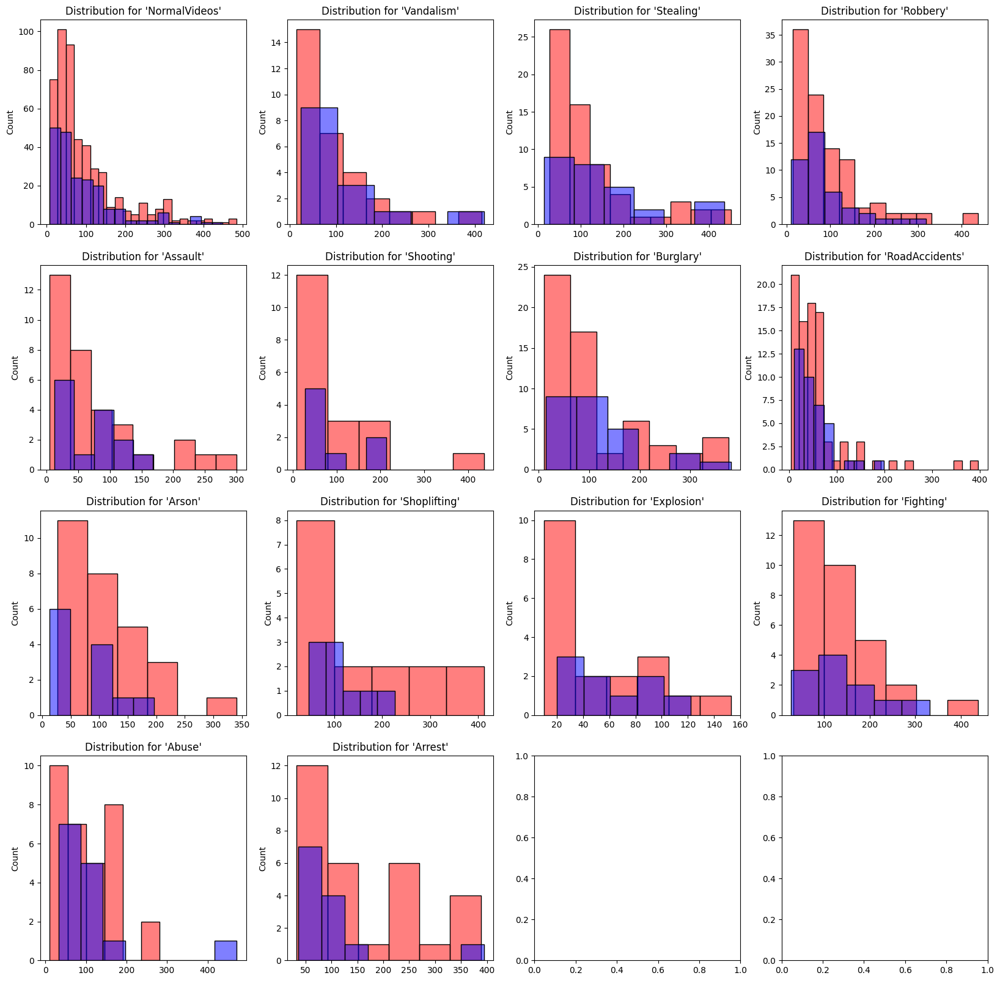

In [ ]:
import seaborn as sns

train_dataloader = dataloaders['train']
val_dataloader = dataloaders['val']

def get_statistic_from_dataloader(dataloader):
  label_name2lens = {}
  for _, label_names_tensor, lengths_tensor in dataloader:
    for label_name, len_val in zip(label_names_tensor.numpy().tolist(), lengths_tensor.numpy().tolist()):
      label_name2lens.setdefault(label_name, [])
      label_name2lens[label_name].append(len_val)

  return label_name2lens

train_label_name2lens = get_statistic_from_dataloader(train_dataloader)
val_label_name2lens = get_statistic_from_dataloader(val_dataloader)

fig, axes = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
for ind, label_name in enumerate(train_label_name2lens):
    train_lens = train_label_name2lens[label_name]
    val_lens = val_label_name2lens[label_name]

    i = ind // 4
    j = ind % 4
    sns.histplot(train_lens, label='train', color='r', alpha=0.5, ax=axes[i][j])
    sns.histplot(val_lens, label='val', color='b', alpha=0.5, ax=axes[i][j])
    axes[i][j].set_title(f"Distribution for '{CLASS_NAMES[label_name]}'")

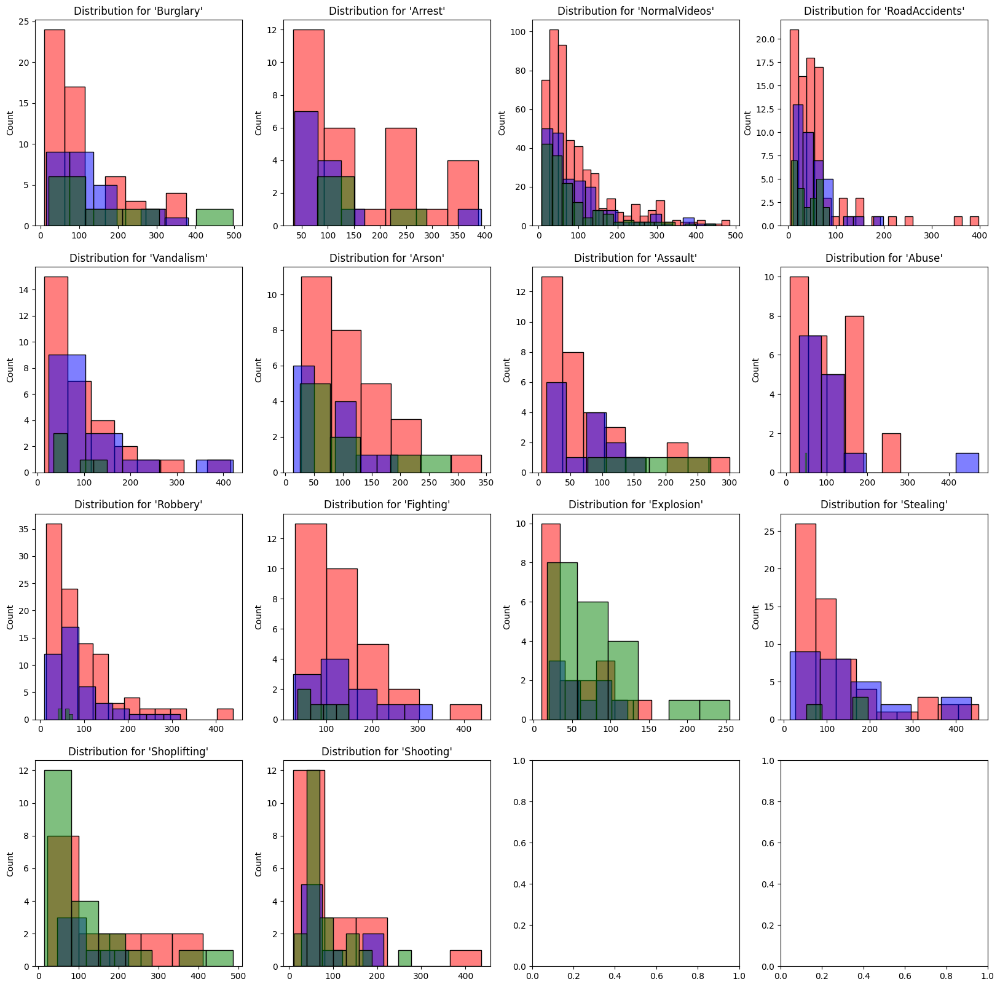

In [ ]:
#НЕ БЕРЕМ

import seaborn as sns

train_dataloader = dataloaders['train']
val_dataloader = dataloaders['val']
#test_dataloader создан выше

def get_statistic_from_dataloader(dataloader):
  label_name2lens = {}
  for _, label_names_tensor, lengths_tensor in dataloader:
    for label_name, len_val in zip(label_names_tensor.numpy().tolist(), lengths_tensor.numpy().tolist()):
      label_name2lens.setdefault(label_name, [])
      label_name2lens[label_name].append(len_val)

  return label_name2lens

train_label_name2lens = get_statistic_from_dataloader(train_dataloader)
val_label_name2lens = get_statistic_from_dataloader(val_dataloader)
test_label_name2lens = get_statistic_from_dataloader(test_dataloader)

fig, axes = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
for ind, label_name in enumerate(train_label_name2lens):
    train_lens = train_label_name2lens[label_name]
    val_lens = val_label_name2lens[label_name]
    test_lens = test_label_name2lens[label_name]

    i = ind // 4
    j = ind % 4
    sns.histplot(train_lens, label='train', color='r', alpha=0.5, ax=axes[i][j])
    sns.histplot(val_lens, label='val', color='b', alpha=0.5, ax=axes[i][j])
    sns.histplot(test_lens, label='test', color='g', alpha=0.5, ax=axes[i][j])
    axes[i][j].set_title(f"Distribution for '{CLASS_NAMES[label_name]}'")

#Обучение

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import torch
import torch.nn as nn

# Подсчет весов классов для датасета
labels = [label for _, label in train_dataset]
class_weights = compute_class_weight('balanced', classes=CLASS_NAMES, y=labels)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to('cuda')

# Обновление критерия потерь с весами классов
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

In [ ]:
class_weights
#np.unique(labels)

array([2.43035714, 2.55827068, 2.62741313, 2.31462585, 1.26252319,
       3.73901099, 2.49267399, 0.81011905, 0.75359911, 4.22670807,
       4.41883117, 1.18554007, 2.20941558, 0.15142412])

#Простое усреднение

Эта нейросеть является пользовательской моделью, которая включает в себя адаптированную архитектуру с использованием предобученной сети ResNet-34 в качестве базы для извлечения признаков.

### Описание модели

1. Базовый экстрактор признаков (ResNet-34): используются только первые слои сети ResNet-34 до операции maxpooling. Это позволяет извлечь низкоуровневые признаки из входных данных. ResNet-34 — это глубокая сеть с residual блоками, которая обычно используется для классификации изображений. В данном случае параметры этих слоев заморожены, то есть в процессе обучения модели их веса не будут обновляться. Это обычная практика при использовании метода transfer learning, когда базовые признаки, которые сеть уже научилась извлекать на большом и разнообразном наборе данных, переиспользуются для новой задачи.

2. Дополнительная операция MaxPooling: следует после извлечения признаков, чтобы уменьшить пространственные размеры признаковых карт. Это уменьшает количество параметров и вычислений в последующих слоях.

3. Преобразование размерности: входные данные представляют собой последовательности кадров, которые сначала обрабатываются базовым экстрактором признаков в пакетном режиме. Затем применяется **усреднение по временной оси, что позволяет агрегировать информацию по всей последовательности**.

4. Адаптация длины последовательности: входная последовательность взвешивается в зависимости от максимальной длины в пакете (нормализация вклада каждого кадра).

5. Полносвязный слой: последний слой преобразует выход из предыдущих слоев в вероятности классов. Количество выходов этого слоя соответствует числу классов в задаче.

6. Размораживание признаков: метод unfreeze_features, который позволяет разморозить (сделать обучаемыми) параметры базовой сети после 2-х эпоз.

### Что делает:

- Извлечение признаков: использует предобученные слои ResNet-34 для получения низкоуровневых признаков изображения.
- Агрегация по последовательности: применяет операцию среднего по временной оси, чтобы объединить информацию из всех кадров.
- Классификация: на основе извлеченных и агрегированных признаков сеть выполняет классификацию на 14 классов.

Модель может использоваться для задачи анализа видео (важна последовательность кадров). Уникальность состоит в том, как она объединяет пространственные признаки и временную информацию.

In [ ]:
import torch
import torch.nn as nn
from torchvision import models
from torchsummary import summary

class CustomModel(nn.Module):
    def __init__(self, num_classes):
        super(CustomModel, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2)

        # Заморозка параметров resnet34
        for param in self.features.parameters():
            param.requires_grad = False

        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            in_features = example_output.numel()

        self.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        # Требуется для использования с torchsummary
        x = self.features(x)
        x = self.maxpool(x)
        x = torch.flatten(x, start_dim=1)
        x = self.fc(x)
        return x

num_classes = 14
model = CustomModel(num_classes=num_classes)

# Перенос модели на устройство
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Вызов torchsummary.summary
summary(model, input_size=(3, 64, 64), device=device.type)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           9,408
       BatchNorm2d-2           [-1, 64, 32, 32]             128
              ReLU-3           [-1, 64, 32, 32]               0
         MaxPool2d-4           [-1, 64, 16, 16]               0
         MaxPool2d-5             [-1, 64, 7, 7]               0
            Linear-6                   [-1, 14]          43,918
Total params: 53,454
Trainable params: 43,918
Non-trainable params: 9,536
----------------------------------------------------------------
Input size (MB): 0.05
Forward/backward pass size (MB): 1.65
Params size (MB): 0.20
Estimated Total Size (MB): 1.90
----------------------------------------------------------------


In [ ]:
#ДОПОЛНЕНИЯ ПО УСРЕДЕНЕНИЮ

#Убрали слой avgpool (так как усреднение по временной оси у нас и так есть), добавим maxpooling. Вариант с объединением размера батча и временной последовательности в одно измерение
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from sklearn.metrics import f1_score
from tqdm import tqdm
import matplotlib.pyplot as plt

class CustomModel(nn.Module):
    def __init__(self, num_classes):
        super(CustomModel, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2)

        # Заморозка параметров resnet34
        for param in self.features.parameters():
            param.requires_grad = False

        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            in_features = example_output.numel()

        self.fc = nn.Linear(in_features, num_classes)

    def forward(self, x, lengths_tensor):
        batch_size, sequence_length, C, H, W = x.size()
        x = x.view(batch_size * sequence_length, 3, H, W)
        x = self.features(x)

        _, F, H_prime, W_prime = x.size()
        x = x.view(batch_size, sequence_length, F, H_prime, W_prime).mean(dim=1)

        lengths_tensor = lengths_tensor.reshape(batch_size, 1, 1, 1)
        x = (x * lengths_tensor.max()) / lengths_tensor
        x = self.maxpool(x)

        x = torch.flatten(x, start_dim=1)
        x = self.fc(x)
        return x

    def unfreeze_features(self):
        # Размораживание параметров features для обучения
        for param in self.features.parameters():
            param.requires_grad = True


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 130/130 [01:33<00:00,  1.39it/s]


train Loss: 2.9720 F1 Micro: 0.1639 F1 Macro: 0.0538


val: 100%|██████████| 57/57 [00:35<00:00,  1.61it/s]


val Loss: 2.5423 F1 Micro: 0.1559 F1 Macro: 0.0478
Epoch 2/20
----------


train: 100%|██████████| 130/130 [01:33<00:00,  1.39it/s]


train Loss: 2.6231 F1 Micro: 0.2777 F1 Macro: 0.0778


val: 100%|██████████| 57/57 [00:35<00:00,  1.61it/s]


val Loss: 2.5496 F1 Micro: 0.2049 F1 Macro: 0.0516
Epoch 3/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.37it/s]


train Loss: 2.6353 F1 Micro: 0.2527 F1 Macro: 0.0816


val: 100%|██████████| 57/57 [00:35<00:00,  1.62it/s]


val Loss: 2.4962 F1 Micro: 0.2984 F1 Macro: 0.0671
Epoch 4/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.36it/s]


train Loss: 2.6380 F1 Micro: 0.2613 F1 Macro: 0.0750


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.5265 F1 Micro: 0.2361 F1 Macro: 0.0554
Epoch 5/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.36it/s]


train Loss: 2.5989 F1 Micro: 0.2970 F1 Macro: 0.0932


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.4702 F1 Micro: 0.3675 F1 Macro: 0.0744
Epoch 6/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.6019 F1 Micro: 0.2980 F1 Macro: 0.0977


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4603 F1 Micro: 0.3252 F1 Macro: 0.0703
Epoch 7/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.36it/s]


train Loss: 2.6272 F1 Micro: 0.2527 F1 Macro: 0.0898


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.5628 F1 Micro: 0.2450 F1 Macro: 0.0544
Epoch 8/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.6018 F1 Micro: 0.2719 F1 Macro: 0.0959


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4867 F1 Micro: 0.3385 F1 Macro: 0.0697
Epoch 9/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.6023 F1 Micro: 0.2874 F1 Macro: 0.0958


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.4731 F1 Micro: 0.3385 F1 Macro: 0.0790
Epoch 10/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.36it/s]


train Loss: 2.5716 F1 Micro: 0.3105 F1 Macro: 0.1145


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.4794 F1 Micro: 0.2294 F1 Macro: 0.0670
Epoch 11/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.5634 F1 Micro: 0.2999 F1 Macro: 0.1069


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.5193 F1 Micro: 0.2428 F1 Macro: 0.0631
Epoch 12/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.5713 F1 Micro: 0.3240 F1 Macro: 0.0972


val: 100%|██████████| 57/57 [00:36<00:00,  1.58it/s]


val Loss: 2.4680 F1 Micro: 0.2116 F1 Macro: 0.0583
Epoch 13/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.5574 F1 Micro: 0.2777 F1 Macro: 0.1040


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.4134 F1 Micro: 0.3630 F1 Macro: 0.0779
Epoch 14/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.35it/s]


train Loss: 2.5671 F1 Micro: 0.3057 F1 Macro: 0.1075


val: 100%|██████████| 57/57 [00:35<00:00,  1.58it/s]


val Loss: 2.5253 F1 Micro: 0.2272 F1 Macro: 0.0588
Epoch 15/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.36it/s]


train Loss: 2.5526 F1 Micro: 0.2903 F1 Macro: 0.0916


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.4197 F1 Micro: 0.3229 F1 Macro: 0.0675
Epoch 16/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.5347 F1 Micro: 0.3221 F1 Macro: 0.1205


val: 100%|██████████| 57/57 [00:35<00:00,  1.61it/s]


val Loss: 2.4707 F1 Micro: 0.2695 F1 Macro: 0.0668
Epoch 17/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.37it/s]


train Loss: 2.5337 F1 Micro: 0.3211 F1 Macro: 0.1151


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4321 F1 Micro: 0.2806 F1 Macro: 0.0738
Epoch 18/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.5355 F1 Micro: 0.3529 F1 Macro: 0.1300


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.4358 F1 Micro: 0.2806 F1 Macro: 0.0825
Epoch 19/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.36it/s]


train Loss: 2.5378 F1 Micro: 0.2777 F1 Macro: 0.1224


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4404 F1 Micro: 0.3608 F1 Macro: 0.0734
Epoch 20/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.36it/s]


train Loss: 2.5408 F1 Micro: 0.2806 F1 Macro: 0.1275


val: 100%|██████████| 57/57 [00:35<00:00,  1.61it/s]


val Loss: 2.4390 F1 Micro: 0.3007 F1 Macro: 0.0674


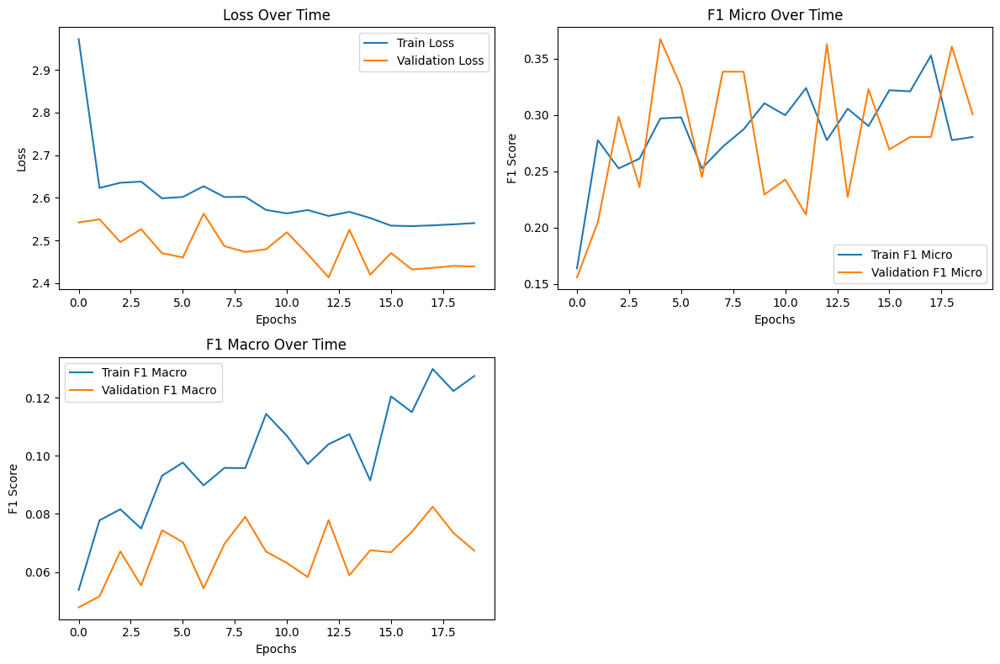

In [ ]:
#lr=0.00001, 20 эпох, заморозка resNet34 на 2 эпохи, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        # Размораживание слоёв после первых двух эпох и пересоздание оптимизатора
        if epoch == 2:
            model.unfreeze_features()
            optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.00001)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModel(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.00001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

##Усреднение confusion matrix

In [ ]:
def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      #lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


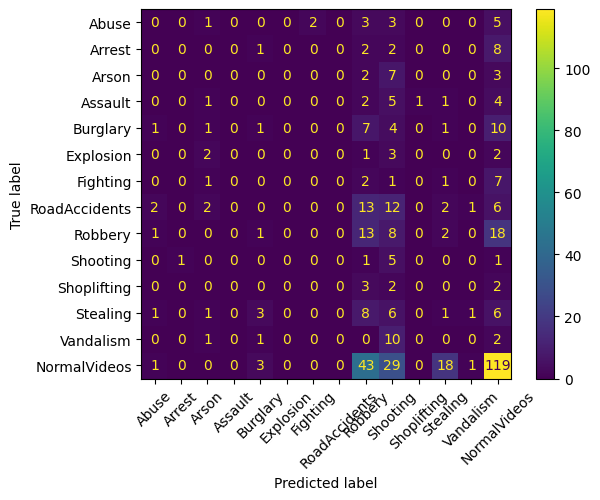

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

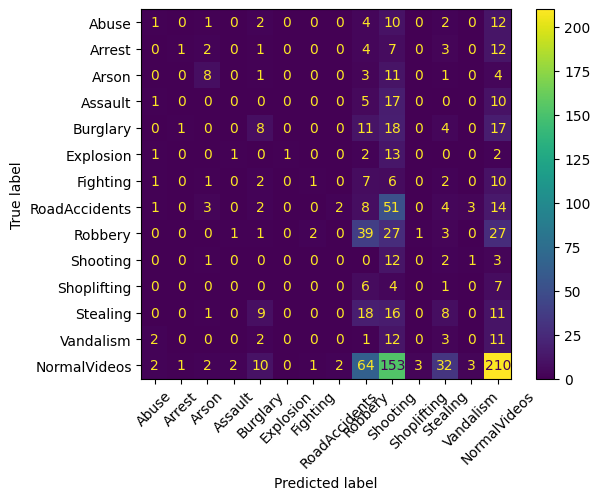

In [ ]:
cm = confusion_matrix(all_train_labels, all_train_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

##Усреднение ROC AUC 0.69

In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)

            lengths_tensor = lengths_tensor.to(device)
            #lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 57/57 [00:35<00:00,  1.61it/s]


ROC AUC: 0.69


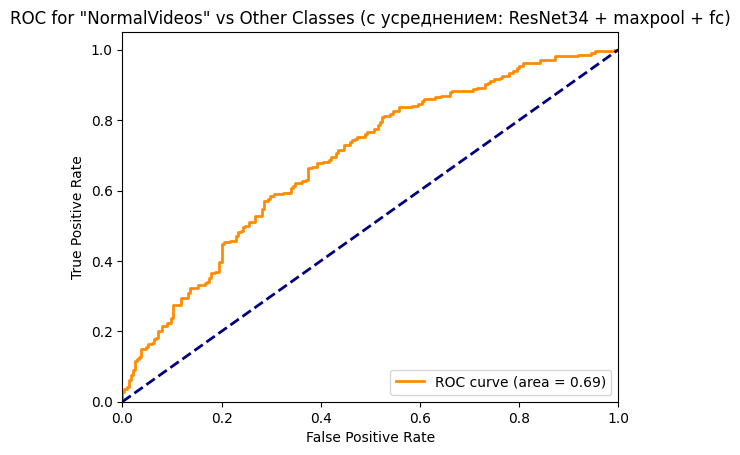

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes (с усреднением: ResNet34 + maxpool + fc)')
plt.legend(loc="lower right")
plt.show()

##Приложение: усреднение - эксперименты с параметрами

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 130/130 [01:33<00:00,  1.39it/s]


train Loss: 2.7127 F1 Micro: 0.2517 F1 Macro: 0.0764


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4419 F1 Micro: 0.3742 F1 Macro: 0.0684
Epoch 2/20
----------


train: 100%|██████████| 130/130 [01:35<00:00,  1.37it/s]


train Loss: 2.6448 F1 Micro: 0.2604 F1 Macro: 0.0715


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4966 F1 Micro: 0.2450 F1 Macro: 0.0701
Epoch 3/20
----------


train: 100%|██████████| 130/130 [01:37<00:00,  1.34it/s]


train Loss: 2.6301 F1 Micro: 0.3144 F1 Macro: 0.0650


val: 100%|██████████| 57/57 [00:36<00:00,  1.58it/s]


val Loss: 2.5135 F1 Micro: 0.1938 F1 Macro: 0.0645
Epoch 4/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.6095 F1 Micro: 0.2459 F1 Macro: 0.0774


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4296 F1 Micro: 0.3653 F1 Macro: 0.0825
Epoch 5/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.34it/s]


train Loss: 2.6059 F1 Micro: 0.3115 F1 Macro: 0.0773


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.4180 F1 Micro: 0.4031 F1 Macro: 0.0759
Epoch 6/20
----------


train: 100%|██████████| 130/130 [01:37<00:00,  1.33it/s]


train Loss: 2.6036 F1 Micro: 0.2411 F1 Macro: 0.0877


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.4304 F1 Micro: 0.3497 F1 Macro: 0.0808
Epoch 7/20
----------


train: 100%|██████████| 130/130 [01:37<00:00,  1.34it/s]


train Loss: 2.6099 F1 Micro: 0.2912 F1 Macro: 0.0817


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4488 F1 Micro: 0.1782 F1 Macro: 0.0550
Epoch 8/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.6014 F1 Micro: 0.2285 F1 Macro: 0.0816


val: 100%|██████████| 57/57 [00:36<00:00,  1.58it/s]


val Loss: 2.4932 F1 Micro: 0.2428 F1 Macro: 0.0692
Epoch 9/20
----------


train: 100%|██████████| 130/130 [01:37<00:00,  1.33it/s]


train Loss: 2.5935 F1 Micro: 0.2469 F1 Macro: 0.0833


val: 100%|██████████| 57/57 [00:35<00:00,  1.58it/s]


val Loss: 2.4714 F1 Micro: 0.2695 F1 Macro: 0.0795
Epoch 10/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.5966 F1 Micro: 0.2980 F1 Macro: 0.0980


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.3763 F1 Micro: 0.4388 F1 Macro: 0.0728
Epoch 11/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.34it/s]


train Loss: 2.5654 F1 Micro: 0.2806 F1 Macro: 0.1051


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.4958 F1 Micro: 0.2851 F1 Macro: 0.0827
Epoch 12/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.35it/s]


train Loss: 2.5703 F1 Micro: 0.2960 F1 Macro: 0.0940


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4468 F1 Micro: 0.3408 F1 Macro: 0.0731
Epoch 13/20
----------


train: 100%|██████████| 130/130 [01:37<00:00,  1.34it/s]


train Loss: 2.5662 F1 Micro: 0.2768 F1 Macro: 0.1038


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.3965 F1 Micro: 0.3697 F1 Macro: 0.0929
Epoch 14/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.34it/s]


train Loss: 2.5600 F1 Micro: 0.3018 F1 Macro: 0.1069


val: 100%|██████████| 57/57 [00:36<00:00,  1.58it/s]


val Loss: 2.4083 F1 Micro: 0.3563 F1 Macro: 0.0760
Epoch 15/20
----------


train: 100%|██████████| 130/130 [01:37<00:00,  1.34it/s]


train Loss: 2.5720 F1 Micro: 0.2980 F1 Macro: 0.0999


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.4765 F1 Micro: 0.2205 F1 Macro: 0.0827
Epoch 16/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.34it/s]


train Loss: 2.5530 F1 Micro: 0.2469 F1 Macro: 0.1006


val: 100%|██████████| 57/57 [00:36<00:00,  1.58it/s]


val Loss: 2.4249 F1 Micro: 0.4098 F1 Macro: 0.0853
Epoch 17/20
----------


train: 100%|██████████| 130/130 [01:37<00:00,  1.33it/s]


train Loss: 2.5451 F1 Micro: 0.2710 F1 Macro: 0.1057


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.4076 F1 Micro: 0.3341 F1 Macro: 0.0880
Epoch 18/20
----------


train: 100%|██████████| 130/130 [01:37<00:00,  1.34it/s]


train Loss: 2.5321 F1 Micro: 0.3230 F1 Macro: 0.1052


val: 100%|██████████| 57/57 [00:36<00:00,  1.58it/s]


val Loss: 2.4132 F1 Micro: 0.2472 F1 Macro: 0.0805
Epoch 19/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.34it/s]


train Loss: 2.5189 F1 Micro: 0.2536 F1 Macro: 0.1003


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.3056 F1 Micro: 0.4588 F1 Macro: 0.0993
Epoch 20/20
----------


train: 100%|██████████| 130/130 [01:36<00:00,  1.34it/s]


train Loss: 2.5346 F1 Micro: 0.3365 F1 Macro: 0.1173


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.4435 F1 Micro: 0.2316 F1 Macro: 0.0772


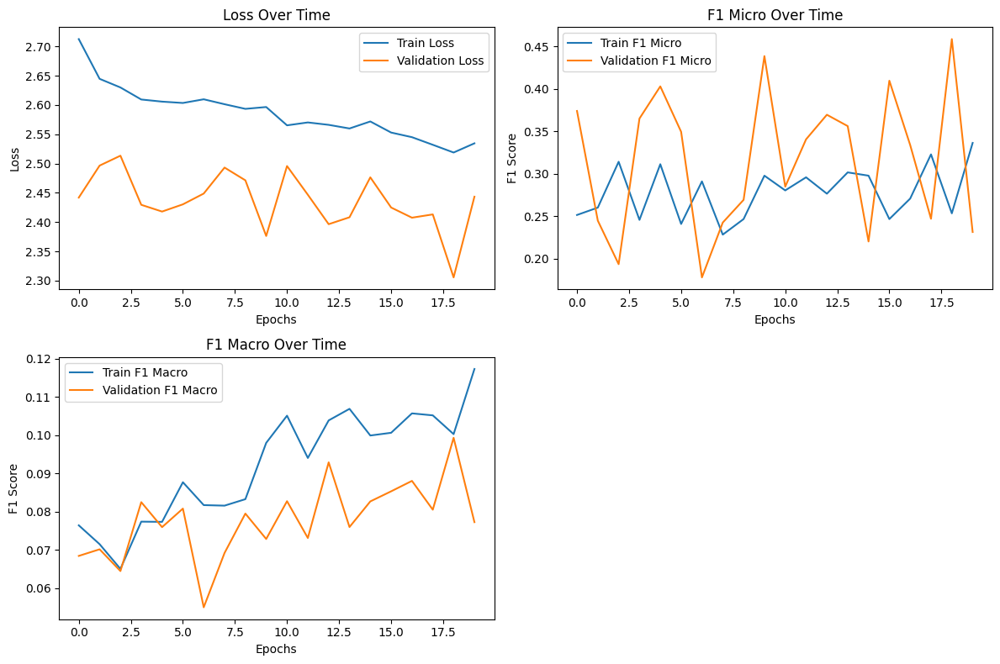

In [ ]:
#lr=0.00001, 20 эпох, заморозка resNet34 на 2 эпохи
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        # Размораживание слоёв после первых двух эпох и пересоздание оптимизатора
        if epoch == 2:
            model.unfreeze_features()
            optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.00001)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModel(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.00001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 176MB/s]


Epoch 1/20
----------


train: 100%|██████████| 149/149 [01:48<00:00,  1.37it/s]


train Loss: 2.8741 F1 Micro: 0.0749 F1 Macro: 0.0441


val: 100%|██████████| 38/38 [00:27<00:00,  1.39it/s]


val Loss: 2.6193 F1 Micro: 0.1477 F1 Macro: 0.0380
Epoch 2/20
----------


train: 100%|██████████| 149/149 [01:47<00:00,  1.39it/s]


train Loss: 2.6481 F1 Micro: 0.1279 F1 Macro: 0.0503


val: 100%|██████████| 38/38 [00:26<00:00,  1.42it/s]


val Loss: 2.5988 F1 Micro: 0.2584 F1 Macro: 0.0588
Epoch 3/20
----------


train: 100%|██████████| 149/149 [01:51<00:00,  1.33it/s]


train Loss: 2.6631 F1 Micro: 0.1751 F1 Macro: 0.0780


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.6162 F1 Micro: 0.3154 F1 Macro: 0.0831
Epoch 4/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.35it/s]


train Loss: 2.6064 F1 Micro: 0.2475 F1 Macro: 0.0835


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.5887 F1 Micro: 0.4262 F1 Macro: 0.0788
Epoch 5/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.5836 F1 Micro: 0.3005 F1 Macro: 0.0984


val: 100%|██████████| 38/38 [00:27<00:00,  1.41it/s]


val Loss: 2.5765 F1 Micro: 0.2584 F1 Macro: 0.0781
Epoch 6/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.5850 F1 Micro: 0.2365 F1 Macro: 0.0887


val: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]


val Loss: 2.5554 F1 Micro: 0.1107 F1 Macro: 0.0419
Epoch 7/20
----------


train: 100%|██████████| 149/149 [01:52<00:00,  1.33it/s]


train Loss: 2.5890 F1 Micro: 0.2618 F1 Macro: 0.0927


val: 100%|██████████| 38/38 [00:28<00:00,  1.35it/s]


val Loss: 2.5596 F1 Micro: 0.3557 F1 Macro: 0.0843
Epoch 8/20
----------


train: 100%|██████████| 149/149 [01:52<00:00,  1.33it/s]


train Loss: 2.5767 F1 Micro: 0.2997 F1 Macro: 0.1077


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5237 F1 Micro: 0.4262 F1 Macro: 0.1172
Epoch 9/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.5476 F1 Micro: 0.3653 F1 Macro: 0.1204


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5494 F1 Micro: 0.4362 F1 Macro: 0.1129
Epoch 10/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.35it/s]


train Loss: 2.5459 F1 Micro: 0.3072 F1 Macro: 0.0995


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.5356 F1 Micro: 0.3926 F1 Macro: 0.1047
Epoch 11/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.5299 F1 Micro: 0.3249 F1 Macro: 0.1298


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5395 F1 Micro: 0.3020 F1 Macro: 0.0983
Epoch 12/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.5374 F1 Micro: 0.3030 F1 Macro: 0.1147


val: 100%|██████████| 38/38 [00:27<00:00,  1.40it/s]


val Loss: 2.5729 F1 Micro: 0.2013 F1 Macro: 0.0666
Epoch 13/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.35it/s]


train Loss: 2.5278 F1 Micro: 0.3157 F1 Macro: 0.1179


val: 100%|██████████| 38/38 [00:28<00:00,  1.35it/s]


val Loss: 2.5251 F1 Micro: 0.3926 F1 Macro: 0.1197
Epoch 14/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.35it/s]


train Loss: 2.5226 F1 Micro: 0.3241 F1 Macro: 0.1203


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.5239 F1 Micro: 0.2718 F1 Macro: 0.1090
Epoch 15/20
----------


train: 100%|██████████| 149/149 [01:48<00:00,  1.37it/s]


train Loss: 2.5014 F1 Micro: 0.3199 F1 Macro: 0.1314


val: 100%|██████████| 38/38 [00:26<00:00,  1.41it/s]


val Loss: 2.5670 F1 Micro: 0.3859 F1 Macro: 0.1057
Epoch 16/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.5027 F1 Micro: 0.3030 F1 Macro: 0.1211


val: 100%|██████████| 38/38 [00:26<00:00,  1.41it/s]


val Loss: 2.5233 F1 Micro: 0.2987 F1 Macro: 0.1302
Epoch 17/20
----------


train: 100%|██████████| 149/149 [01:51<00:00,  1.34it/s]


train Loss: 2.5059 F1 Micro: 0.3173 F1 Macro: 0.1426


val: 100%|██████████| 38/38 [00:27<00:00,  1.39it/s]


val Loss: 2.5308 F1 Micro: 0.4128 F1 Macro: 0.1263
Epoch 18/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.5019 F1 Micro: 0.3283 F1 Macro: 0.1248


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5496 F1 Micro: 0.1779 F1 Macro: 0.0879
Epoch 19/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.35it/s]


train Loss: 2.4878 F1 Micro: 0.3123 F1 Macro: 0.1173


val: 100%|██████████| 38/38 [00:28<00:00,  1.34it/s]


val Loss: 2.5069 F1 Micro: 0.3591 F1 Macro: 0.1127
Epoch 20/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.4726 F1 Micro: 0.3519 F1 Macro: 0.1330


val: 100%|██████████| 38/38 [00:26<00:00,  1.41it/s]


val Loss: 2.5587 F1 Micro: 0.2685 F1 Macro: 0.0934


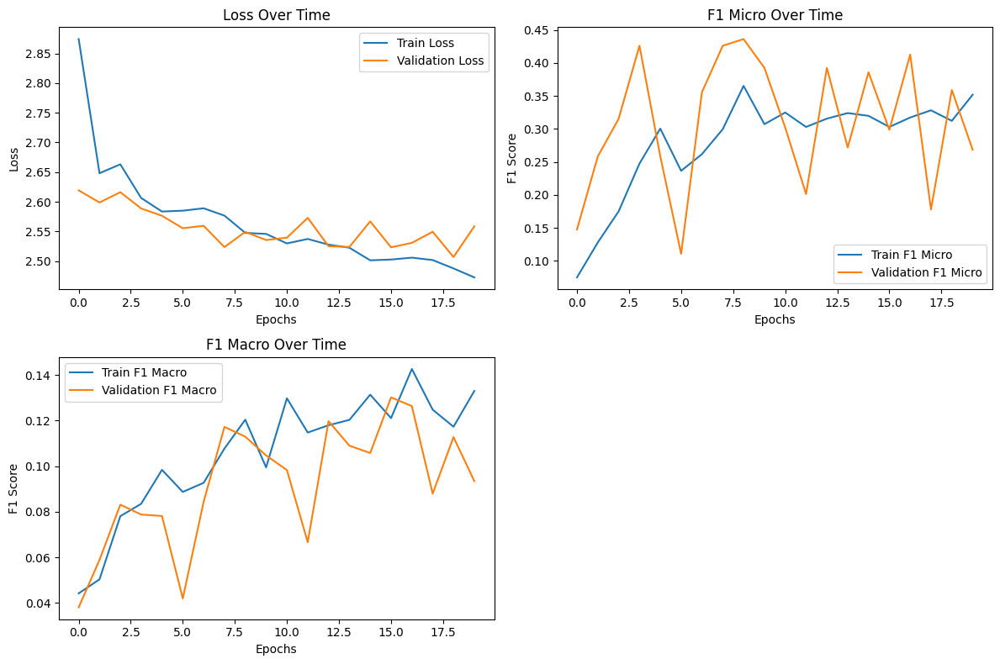

In [ ]:
#lr=0.00001, 20 эпох, заморозка resNet34 на 2 эпохи
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        # Размораживание слоёв после первых двух эпох и пересоздание оптимизатора
        if epoch == 2:
            model.unfreeze_features()
            optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.00001)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModel(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.00001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

#RNN

Эта нейронная сеть представляет собой гибридную модель, сочетающую в себе сверточные нейронные сети (CNN) и рекуррентные нейронные сети (RNN), конкретнее, LSTM. Модель использует ResNet34 для извлечения признаков из последовательности изображений и LSTM для обработки временных зависимостей между этими признаками. Вот ее основные компоненты и процесс работы:

### Описание модели

1. ResNet34 для извлечения признаков: используются первые слои предобученной сети ResNet34 до операции maxpooling для извлечения низкоуровневых признаков из каждого изображения в последовательности. Это помогает в использовании мощных представлений признаков, наученных на больших наборах данных.

2. MaxPooling: применяется для уменьшения размерности признаковых карт, полученных от ResNet34, что помогает уменьшить количество параметров и упростить последующую обработку.

3. LSTM: RNN с архитектурой LSTM обрабатывает извлеченные признаки, учитывая временные зависимости между кадрами последовательности. Это позволяет модели понимать контекст и динамику в последовательности изображений. LSTM способен обрабатывать проблемы затухания и взрыва градиентов благодаря своей специфической архитектуре.

4. Динамическое определение размера входа: Размер входа в полносвязный слой (fully connected layer, fc) динамически определяется на основе выхода ResNet34 и MaxPooling, что делает модель гибкой к размерам входных данных.

5. PackPaddedSequence: Используется для упаковки последовательности таким образом, чтобы LSTM не обрабатывала нулевые (padding) значения, что может быть важно для обработки последовательностей различной длины без потери эффективности обработки.

6. Полносвязный слой для классификации: Выход последнего слоя LSTM подается на полносвязный слой, который преобразует признаки в вероятности классов.

Модель предназначена для задачи анализа видео, т.к. важно учитывать временные зависимости в данных, и нужно классифицировать действия или события, происходящие во времени. Благодаря сочетанию CNN для извлечения признаков и LSTM для обработки последовательностей, модель способна улавливать как пространственные, так и временные зависимости в данных.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from sklearn.metrics import f1_score
from tqdm import tqdm
import matplotlib.pyplot as plt

from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence


class CustomModelWithRNN(nn.Module):
    def __init__(self, num_classes, num_lstm_layers=1):
        super(CustomModelWithRNN, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.num_lstm_layers = num_lstm_layers
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.freeze_resnet = True  # Флаг для управления заморозкой слоев ResNet34

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.rnn = nn.LSTM(
            input_size=rnn_input_size,
            hidden_size=rnn_input_size,
            num_layers=self.num_lstm_layers)
        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        # x размером [batch_size, sequence_length, channels, height, width]
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
        x = self.features(x)
        # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']
        x = self.maxpool(x)
        # ? conv 3x3 channels=16 (если не будет получаться так, как есть)
        # ? если не будет получаться, каждый 5 кадр
        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        x = x.view(batch_size, sequence_length, -1)

        # rnn proc

        pad_x = pack_padded_sequence(x, lengths=lengths_tensor, batch_first=True, enforce_sorted=False) # так как не хотим гнать RNN через нули, градиент может затухнуть
        outputs, (hidden_states, _) = self.rnn(pad_x)

        hidden_states = hidden_states[-1]

        probs = self.fc(hidden_states)

        return probs

##ResNet34 + LSTM

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 169/169 [02:25<00:00,  1.16it/s]


train Loss: 2.7250 F1 Micro: 0.1994 F1 Macro: 0.0655


val: 100%|██████████| 96/96 [01:11<00:00,  1.34it/s]


val Loss: 2.4978 F1 Micro: 0.2533 F1 Macro: 0.0679
Epoch 2/20
----------


train: 100%|██████████| 169/169 [02:20<00:00,  1.21it/s]


train Loss: 2.5866 F1 Micro: 0.3536 F1 Macro: 0.1004


val: 100%|██████████| 96/96 [01:11<00:00,  1.35it/s]


val Loss: 2.3545 F1 Micro: 0.4042 F1 Macro: 0.0979
Epoch 3/20
----------


train: 100%|██████████| 169/169 [02:20<00:00,  1.20it/s]


train Loss: 2.5531 F1 Micro: 0.2795 F1 Macro: 0.1054


val: 100%|██████████| 96/96 [01:10<00:00,  1.37it/s]


val Loss: 2.3077 F1 Micro: 0.2887 F1 Macro: 0.0585
Epoch 4/20
----------


train: 100%|██████████| 169/169 [02:22<00:00,  1.19it/s]


train Loss: 2.5237 F1 Micro: 0.2965 F1 Macro: 0.1224


val: 100%|██████████| 96/96 [01:09<00:00,  1.38it/s]


val Loss: 2.2561 F1 Micro: 0.3793 F1 Macro: 0.1533
Epoch 5/20
----------


train: 100%|██████████| 169/169 [02:22<00:00,  1.19it/s]


train Loss: 2.4436 F1 Micro: 0.2950 F1 Macro: 0.1327


val: 100%|██████████| 96/96 [01:10<00:00,  1.36it/s]


val Loss: 1.9660 F1 Micro: 0.4055 F1 Macro: 0.0817
Epoch 6/20
----------


train: 100%|██████████| 169/169 [02:22<00:00,  1.18it/s]


train Loss: 2.4218 F1 Micro: 0.3217 F1 Macro: 0.1615


val: 100%|██████████| 96/96 [01:09<00:00,  1.38it/s]


val Loss: 2.4237 F1 Micro: 0.2349 F1 Macro: 0.1259
Epoch 7/20
----------


train: 100%|██████████| 169/169 [02:24<00:00,  1.17it/s]


train Loss: 2.3605 F1 Micro: 0.3299 F1 Macro: 0.1601


val: 100%|██████████| 96/96 [01:09<00:00,  1.38it/s]


val Loss: 2.2587 F1 Micro: 0.2677 F1 Macro: 0.1124
Epoch 8/20
----------


train: 100%|██████████| 169/169 [02:22<00:00,  1.18it/s]


train Loss: 2.3222 F1 Micro: 0.3699 F1 Macro: 0.1905


val: 100%|██████████| 96/96 [01:10<00:00,  1.36it/s]


val Loss: 2.0530 F1 Micro: 0.4318 F1 Macro: 0.2220
Epoch 9/20
----------


train: 100%|██████████| 169/169 [02:22<00:00,  1.18it/s]


train Loss: 2.2619 F1 Micro: 0.3588 F1 Macro: 0.1911


val: 100%|██████████| 96/96 [01:10<00:00,  1.36it/s]


val Loss: 2.0733 F1 Micro: 0.3858 F1 Macro: 0.1870
Epoch 10/20
----------


train: 100%|██████████| 169/169 [02:21<00:00,  1.19it/s]


train Loss: 2.2037 F1 Micro: 0.3632 F1 Macro: 0.2192


val: 100%|██████████| 96/96 [01:10<00:00,  1.37it/s]


val Loss: 1.9614 F1 Micro: 0.3937 F1 Macro: 0.1785
Epoch 11/20
----------


train: 100%|██████████| 169/169 [02:20<00:00,  1.20it/s]


train Loss: 2.1283 F1 Micro: 0.3944 F1 Macro: 0.2282


val: 100%|██████████| 96/96 [01:09<00:00,  1.38it/s]


val Loss: 2.1963 F1 Micro: 0.2559 F1 Macro: 0.1934
Epoch 12/20
----------


train: 100%|██████████| 169/169 [02:22<00:00,  1.19it/s]


train Loss: 2.1127 F1 Micro: 0.4173 F1 Macro: 0.2602


val: 100%|██████████| 96/96 [01:10<00:00,  1.36it/s]


val Loss: 1.7812 F1 Micro: 0.5131 F1 Macro: 0.2568
Epoch 13/20
----------


train: 100%|██████████| 169/169 [02:21<00:00,  1.20it/s]


train Loss: 2.0218 F1 Micro: 0.4307 F1 Macro: 0.2856


val: 100%|██████████| 96/96 [01:09<00:00,  1.37it/s]


val Loss: 1.8163 F1 Micro: 0.4790 F1 Macro: 0.2781
Epoch 14/20
----------


train: 100%|██████████| 169/169 [02:22<00:00,  1.19it/s]


train Loss: 1.9612 F1 Micro: 0.4136 F1 Macro: 0.2903


val: 100%|██████████| 96/96 [01:10<00:00,  1.36it/s]


val Loss: 1.7862 F1 Micro: 0.4593 F1 Macro: 0.2254
Epoch 15/20
----------


train: 100%|██████████| 169/169 [02:23<00:00,  1.18it/s]


train Loss: 1.9261 F1 Micro: 0.4388 F1 Macro: 0.3257


val: 100%|██████████| 96/96 [01:10<00:00,  1.36it/s]


val Loss: 1.9933 F1 Micro: 0.3780 F1 Macro: 0.3300
Epoch 16/20
----------


train: 100%|██████████| 169/169 [02:21<00:00,  1.19it/s]


train Loss: 1.8217 F1 Micro: 0.4522 F1 Macro: 0.3350


val: 100%|██████████| 96/96 [01:09<00:00,  1.38it/s]


val Loss: 1.7912 F1 Micro: 0.4528 F1 Macro: 0.3307
Epoch 17/20
----------


train: 100%|██████████| 169/169 [02:21<00:00,  1.19it/s]


train Loss: 1.7960 F1 Micro: 0.4752 F1 Macro: 0.3615


val: 100%|██████████| 96/96 [01:09<00:00,  1.37it/s]


val Loss: 1.5928 F1 Micro: 0.5564 F1 Macro: 0.3519
Epoch 18/20
----------


train: 100%|██████████| 169/169 [02:21<00:00,  1.20it/s]


train Loss: 1.7048 F1 Micro: 0.5048 F1 Macro: 0.3849


val: 100%|██████████| 96/96 [01:10<00:00,  1.37it/s]


val Loss: 1.9098 F1 Micro: 0.3753 F1 Macro: 0.3352
Epoch 19/20
----------


train: 100%|██████████| 169/169 [02:21<00:00,  1.19it/s]


train Loss: 1.5972 F1 Micro: 0.5182 F1 Macro: 0.4123


val: 100%|██████████| 96/96 [01:10<00:00,  1.37it/s]


val Loss: 1.6285 F1 Micro: 0.5157 F1 Macro: 0.3934
Epoch 20/20
----------


train: 100%|██████████| 169/169 [02:21<00:00,  1.19it/s]


train Loss: 1.5439 F1 Micro: 0.5582 F1 Macro: 0.4589


val: 100%|██████████| 96/96 [01:10<00:00,  1.36it/s]


val Loss: 1.7819 F1 Micro: 0.4619 F1 Macro: 0.3693


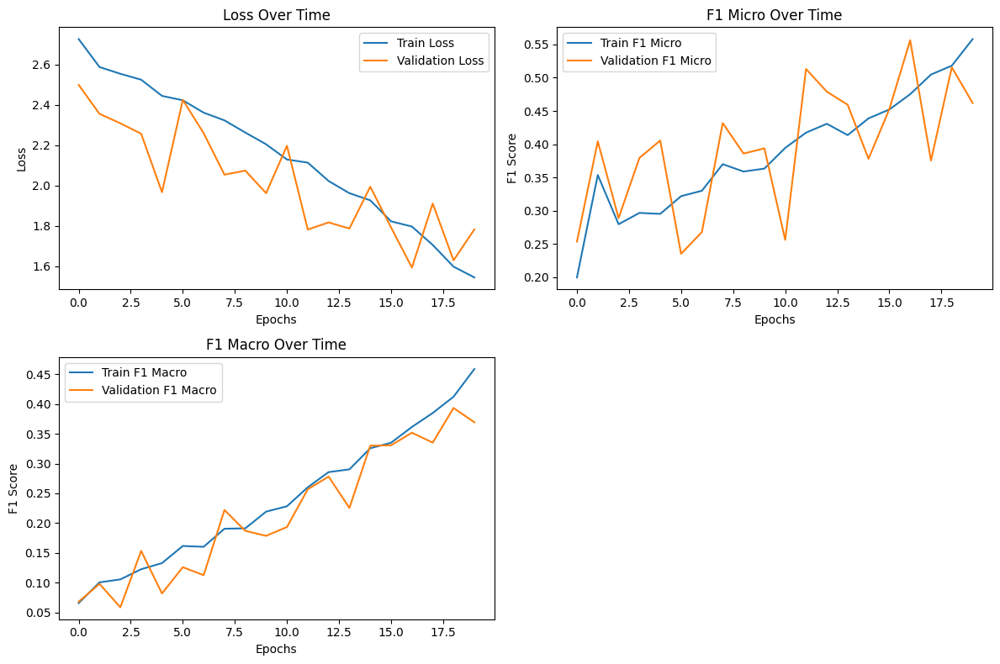

In [ ]:
# ResNet34, LSTM, без флипа, lr=0.0001, 20 эпох, батч 8
from sklearn.metrics import f1_score
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'LSTMWithResNet34')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        # Здесь мы решаем, замораживать слои ResNet34 или нет
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_resnet = False  # Обновляем флаг, так как слои теперь разморожены

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                batch_size, seq_len, C, H, W = inputs.size()
                #inputs = inputs.view(-1, C, H, W)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor) # чтобы плотно скомпоновать последовательность
                    #outputs = outputs.view(batch_size, seq_len, -1)[:, -1, :]
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'lstm_with_res_net_34_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithRNN(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 166MB/s]


Epoch 1/20
----------


train: 100%|██████████| 131/131 [02:07<00:00,  1.03it/s]


train Loss: 2.7198 F1 Micro: 0.1702 F1 Macro: 0.0760


val: 100%|██████████| 55/55 [00:44<00:00,  1.25it/s]


val Loss: 2.3398 F1 Micro: 0.3614 F1 Macro: 0.0659
Epoch 2/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.03it/s]


train Loss: 2.5868 F1 Micro: 0.3145 F1 Macro: 0.0967


val: 100%|██████████| 55/55 [00:44<00:00,  1.23it/s]


val Loss: 2.2917 F1 Micro: 0.3932 F1 Macro: 0.0870
Epoch 3/20
----------


train: 100%|██████████| 131/131 [02:07<00:00,  1.03it/s]


train Loss: 2.5588 F1 Micro: 0.2237 F1 Macro: 0.0995


val: 100%|██████████| 55/55 [00:43<00:00,  1.25it/s]


val Loss: 2.4502 F1 Micro: 0.2636 F1 Macro: 0.0749
Epoch 4/20
----------


train: 100%|██████████| 131/131 [02:07<00:00,  1.03it/s]


train Loss: 2.5230 F1 Micro: 0.3059 F1 Macro: 0.1207


val: 100%|██████████| 55/55 [00:44<00:00,  1.22it/s]


val Loss: 2.2869 F1 Micro: 0.3432 F1 Macro: 0.0877
Epoch 5/20
----------


train: 100%|██████████| 131/131 [02:07<00:00,  1.03it/s]


train Loss: 2.4689 F1 Micro: 0.2591 F1 Macro: 0.1175


val: 100%|██████████| 55/55 [00:44<00:00,  1.24it/s]


val Loss: 2.3809 F1 Micro: 0.2955 F1 Macro: 0.0890
Epoch 6/20
----------


train: 100%|██████████| 131/131 [02:08<00:00,  1.02it/s]


train Loss: 2.4307 F1 Micro: 0.2992 F1 Macro: 0.1473


val: 100%|██████████| 55/55 [00:44<00:00,  1.25it/s]


val Loss: 2.3216 F1 Micro: 0.3114 F1 Macro: 0.1091
Epoch 7/20
----------


train: 100%|██████████| 131/131 [02:08<00:00,  1.02it/s]


train Loss: 2.4218 F1 Micro: 0.3011 F1 Macro: 0.1540


val: 100%|██████████| 55/55 [00:44<00:00,  1.24it/s]


val Loss: 2.3364 F1 Micro: 0.2841 F1 Macro: 0.1071
Epoch 8/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.04it/s]


train Loss: 2.3624 F1 Micro: 0.3365 F1 Macro: 0.1890


val: 100%|██████████| 55/55 [00:43<00:00,  1.25it/s]


val Loss: 2.3497 F1 Micro: 0.2227 F1 Macro: 0.1024
Epoch 9/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.03it/s]


train Loss: 2.2891 F1 Micro: 0.3289 F1 Macro: 0.1752


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 2.4302 F1 Micro: 0.2227 F1 Macro: 0.0957
Epoch 10/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.03it/s]


train Loss: 2.2576 F1 Micro: 0.3461 F1 Macro: 0.2109


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 2.1614 F1 Micro: 0.4068 F1 Macro: 0.1242
Epoch 11/20
----------


train: 100%|██████████| 131/131 [02:05<00:00,  1.05it/s]


train Loss: 2.2118 F1 Micro: 0.3709 F1 Macro: 0.2279


val: 100%|██████████| 55/55 [00:43<00:00,  1.26it/s]


val Loss: 2.2505 F1 Micro: 0.2818 F1 Macro: 0.1267
Epoch 12/20
----------


train: 100%|██████████| 131/131 [02:04<00:00,  1.05it/s]


train Loss: 2.1468 F1 Micro: 0.3700 F1 Macro: 0.2239


val: 100%|██████████| 55/55 [00:43<00:00,  1.25it/s]


val Loss: 2.2533 F1 Micro: 0.3250 F1 Macro: 0.1402
Epoch 13/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.03it/s]


train Loss: 2.0858 F1 Micro: 0.3881 F1 Macro: 0.2356


val: 100%|██████████| 55/55 [00:44<00:00,  1.24it/s]


val Loss: 2.3012 F1 Micro: 0.3455 F1 Macro: 0.1575
Epoch 14/20
----------


train: 100%|██████████| 131/131 [02:05<00:00,  1.05it/s]


train Loss: 1.9984 F1 Micro: 0.4082 F1 Macro: 0.2848


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 2.4542 F1 Micro: 0.2386 F1 Macro: 0.1042
Epoch 15/20
----------


train: 100%|██████████| 131/131 [02:05<00:00,  1.04it/s]


train Loss: 1.9198 F1 Micro: 0.4216 F1 Macro: 0.3102


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 2.0198 F1 Micro: 0.4159 F1 Macro: 0.1271
Epoch 16/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.04it/s]


train Loss: 1.8446 F1 Micro: 0.4455 F1 Macro: 0.3403


val: 100%|██████████| 55/55 [00:43<00:00,  1.26it/s]


val Loss: 2.2727 F1 Micro: 0.3341 F1 Macro: 0.1447
Epoch 17/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.03it/s]


train Loss: 1.8094 F1 Micro: 0.4388 F1 Macro: 0.3398


val: 100%|██████████| 55/55 [00:43<00:00,  1.26it/s]


val Loss: 2.1224 F1 Micro: 0.3727 F1 Macro: 0.1424
Epoch 18/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.03it/s]


train Loss: 1.7101 F1 Micro: 0.4675 F1 Macro: 0.3835


val: 100%|██████████| 55/55 [00:43<00:00,  1.28it/s]


val Loss: 2.2170 F1 Micro: 0.3273 F1 Macro: 0.1632
Epoch 19/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.03it/s]


train Loss: 1.6143 F1 Micro: 0.4751 F1 Macro: 0.4062


val: 100%|██████████| 55/55 [00:44<00:00,  1.25it/s]


val Loss: 2.3877 F1 Micro: 0.3273 F1 Macro: 0.1159
Epoch 20/20
----------


train: 100%|██████████| 131/131 [02:06<00:00,  1.03it/s]


train Loss: 1.5327 F1 Micro: 0.5249 F1 Macro: 0.4583


val: 100%|██████████| 55/55 [00:43<00:00,  1.25it/s]


val Loss: 2.3080 F1 Micro: 0.3068 F1 Macro: 0.1460


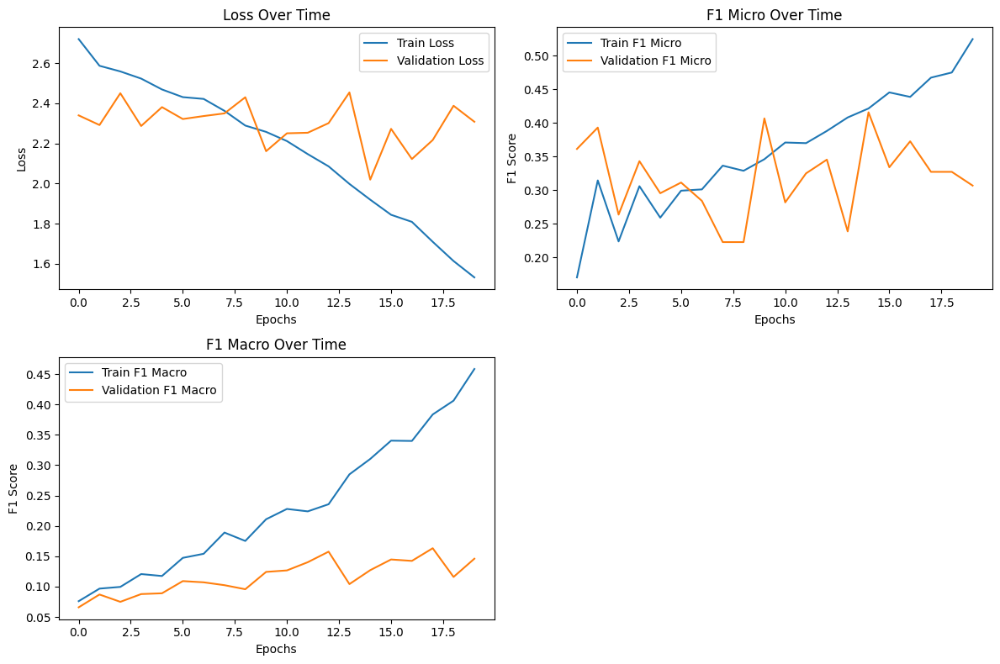

In [ ]:
# вариант переобучения (2), не основной, основной выше. ResNet34, LSTM, без флипа, lr=0.0001, 20 эпох, батч 8, 131 train-55 val
from sklearn.metrics import f1_score
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'LSTMWithResNet34')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        # Здесь мы решаем, замораживать слои ResNet34 или нет
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_resnet = False  # Обновляем флаг, так как слои теперь разморожены

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                batch_size, seq_len, C, H, W = inputs.size()
                #inputs = inputs.view(-1, C, H, W)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor) # чтобы плотно скомпоновать последовательность
                    #outputs = outputs.view(batch_size, seq_len, -1)[:, -1, :]
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'lstm_with_res_net_34_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithRNN(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 172/172 [03:25<00:00,  1.20s/it]


train Loss: 2.7010 F1 Micro: 0.2096 F1 Macro: 0.0730


val: 100%|██████████| 95/95 [01:38<00:00,  1.03s/it]


val Loss: 2.5254 F1 Micro: 0.1001 F1 Macro: 0.0223
Epoch 2/20
----------


train: 100%|██████████| 172/172 [03:17<00:00,  1.15s/it]


train Loss: 2.5972 F1 Micro: 0.2576 F1 Macro: 0.0968


val: 100%|██████████| 95/95 [01:32<00:00,  1.03it/s]


val Loss: 2.2765 F1 Micro: 0.4150 F1 Macro: 0.0678
Epoch 3/20
----------


train: 100%|██████████| 172/172 [03:21<00:00,  1.17s/it]


train Loss: 2.5454 F1 Micro: 0.2591 F1 Macro: 0.0938


val: 100%|██████████| 95/95 [01:32<00:00,  1.03it/s]


val Loss: 2.3512 F1 Micro: 0.2451 F1 Macro: 0.0930
Epoch 4/20
----------


train: 100%|██████████| 172/172 [03:25<00:00,  1.19s/it]


train Loss: 2.4940 F1 Micro: 0.2948 F1 Macro: 0.1277


val: 100%|██████████| 95/95 [01:32<00:00,  1.03it/s]


val Loss: 2.2340 F1 Micro: 0.2925 F1 Macro: 0.0979
Epoch 5/20
----------


train: 100%|██████████| 172/172 [03:26<00:00,  1.20s/it]


train Loss: 2.4609 F1 Micro: 0.3064 F1 Macro: 0.1440


val: 100%|██████████| 95/95 [01:31<00:00,  1.04it/s]


val Loss: 2.3647 F1 Micro: 0.2754 F1 Macro: 0.0947
Epoch 6/20
----------


train: 100%|██████████| 172/172 [03:23<00:00,  1.19s/it]


train Loss: 2.4095 F1 Micro: 0.3108 F1 Macro: 0.1596


val: 100%|██████████| 95/95 [01:30<00:00,  1.05it/s]


val Loss: 2.0816 F1 Micro: 0.3992 F1 Macro: 0.1625
Epoch 7/20
----------


train: 100%|██████████| 172/172 [03:20<00:00,  1.17s/it]


train Loss: 2.3788 F1 Micro: 0.3137 F1 Macro: 0.1831


val: 100%|██████████| 95/95 [01:32<00:00,  1.03it/s]


val Loss: 2.2427 F1 Micro: 0.3465 F1 Macro: 0.2173
Epoch 8/20
----------


train: 100%|██████████| 172/172 [03:19<00:00,  1.16s/it]


train Loss: 2.3271 F1 Micro: 0.3581 F1 Macro: 0.1907


val: 100%|██████████| 95/95 [01:29<00:00,  1.06it/s]


val Loss: 2.3014 F1 Micro: 0.2740 F1 Macro: 0.1808
Epoch 9/20
----------


train: 100%|██████████| 172/172 [03:22<00:00,  1.18s/it]


train Loss: 2.2576 F1 Micro: 0.3588 F1 Macro: 0.2033


val: 100%|██████████| 95/95 [01:35<00:00,  1.01s/it]


val Loss: 2.0383 F1 Micro: 0.2727 F1 Macro: 0.1779
Epoch 10/20
----------


train: 100%|██████████| 172/172 [03:19<00:00,  1.16s/it]


train Loss: 2.2081 F1 Micro: 0.3785 F1 Macro: 0.2122


val: 100%|██████████| 95/95 [01:29<00:00,  1.06it/s]


val Loss: 2.3102 F1 Micro: 0.2240 F1 Macro: 0.1610
Epoch 11/20
----------


train: 100%|██████████| 172/172 [03:22<00:00,  1.18s/it]


train Loss: 2.1508 F1 Micro: 0.3806 F1 Macro: 0.2434


val: 100%|██████████| 95/95 [01:29<00:00,  1.06it/s]


val Loss: 1.9261 F1 Micro: 0.4348 F1 Macro: 0.2523
Epoch 12/20
----------


train: 100%|██████████| 172/172 [03:17<00:00,  1.15s/it]


train Loss: 2.1113 F1 Micro: 0.3777 F1 Macro: 0.2335


val: 100%|██████████| 95/95 [01:29<00:00,  1.06it/s]


val Loss: 1.8906 F1 Micro: 0.4519 F1 Macro: 0.2993
Epoch 13/20
----------


train: 100%|██████████| 172/172 [03:18<00:00,  1.15s/it]


train Loss: 2.0411 F1 Micro: 0.3894 F1 Macro: 0.2707


val: 100%|██████████| 95/95 [01:30<00:00,  1.05it/s]


val Loss: 1.7782 F1 Micro: 0.4545 F1 Macro: 0.2441
Epoch 14/20
----------


train: 100%|██████████| 172/172 [03:20<00:00,  1.17s/it]


train Loss: 1.9900 F1 Micro: 0.4221 F1 Macro: 0.2846


val: 100%|██████████| 95/95 [01:29<00:00,  1.06it/s]


val Loss: 1.9962 F1 Micro: 0.4295 F1 Macro: 0.3187
Epoch 15/20
----------


train: 100%|██████████| 172/172 [03:18<00:00,  1.15s/it]


train Loss: 1.9079 F1 Micro: 0.4279 F1 Macro: 0.2973


val: 100%|██████████| 95/95 [01:29<00:00,  1.07it/s]


val Loss: 2.0406 F1 Micro: 0.3426 F1 Macro: 0.2491
Epoch 16/20
----------


train: 100%|██████████| 172/172 [03:17<00:00,  1.15s/it]


train Loss: 1.8374 F1 Micro: 0.4491 F1 Macro: 0.3304


val: 100%|██████████| 95/95 [01:29<00:00,  1.06it/s]


val Loss: 1.7691 F1 Micro: 0.4730 F1 Macro: 0.3869
Epoch 17/20
----------


train: 100%|██████████| 172/172 [03:16<00:00,  1.14s/it]


train Loss: 1.8003 F1 Micro: 0.4796 F1 Macro: 0.3700


val: 100%|██████████| 95/95 [01:28<00:00,  1.07it/s]


val Loss: 1.6634 F1 Micro: 0.5375 F1 Macro: 0.3739
Epoch 18/20
----------


train: 100%|██████████| 172/172 [03:18<00:00,  1.15s/it]


train Loss: 1.6824 F1 Micro: 0.4723 F1 Macro: 0.3744


val: 100%|██████████| 95/95 [01:28<00:00,  1.07it/s]


val Loss: 1.9301 F1 Micro: 0.3478 F1 Macro: 0.3208
Epoch 19/20
----------


train: 100%|██████████| 172/172 [03:16<00:00,  1.14s/it]


train Loss: 1.6419 F1 Micro: 0.5102 F1 Macro: 0.4043


val: 100%|██████████| 95/95 [01:30<00:00,  1.04it/s]


val Loss: 1.6231 F1 Micro: 0.5152 F1 Macro: 0.4020
Epoch 20/20
----------


train: 100%|██████████| 172/172 [03:18<00:00,  1.15s/it]


train Loss: 1.5714 F1 Micro: 0.5204 F1 Macro: 0.4323


val: 100%|██████████| 95/95 [01:30<00:00,  1.05it/s]


val Loss: 1.6971 F1 Micro: 0.4967 F1 Macro: 0.4436


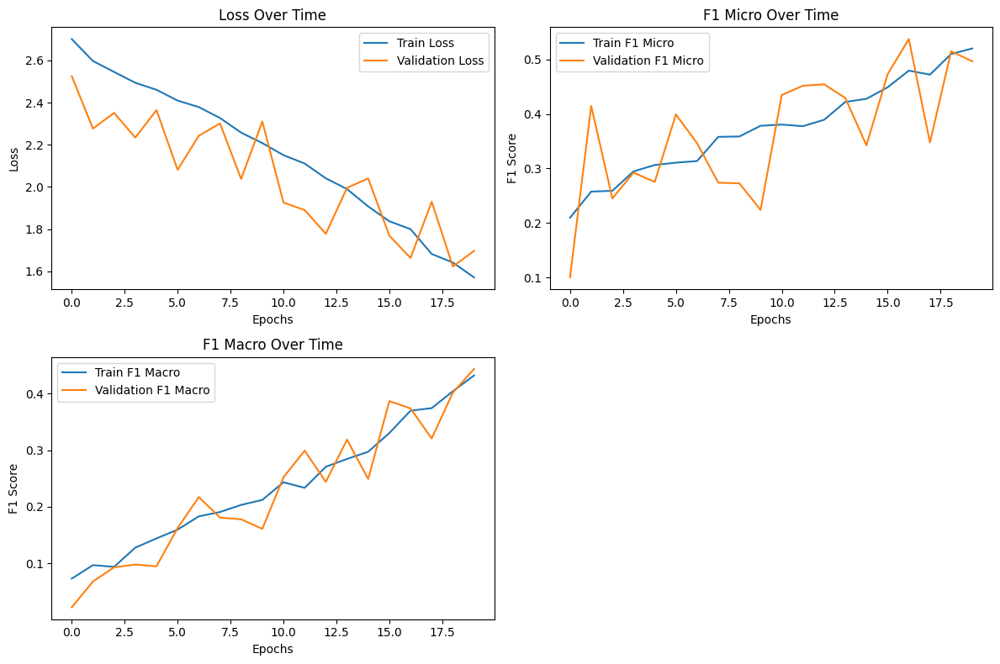

In [ ]:
# ВАРИАНТ (3), изменила на 2500 кадров 172-95 ResNet34, LSTM, без флипа, lr=0.0001, 20 эпох, батч 8
from sklearn.metrics import f1_score
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'LSTMWithResNet34')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        # Здесь мы решаем, замораживать слои ResNet34 или нет
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_resnet = False  # Обновляем флаг, так как слои теперь разморожены

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                batch_size, seq_len, C, H, W = inputs.size()
                #inputs = inputs.view(-1, C, H, W)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor) # чтобы плотно скомпоновать последовательность
                    #outputs = outputs.view(batch_size, seq_len, -1)[:, -1, :]
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'lstm_with_res_net_34_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithRNN(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

##ResNet34 + LSTM confusion matrix

In [ ]:
def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

val: 100%|██████████| 96/96 [01:09<00:00,  1.38it/s]


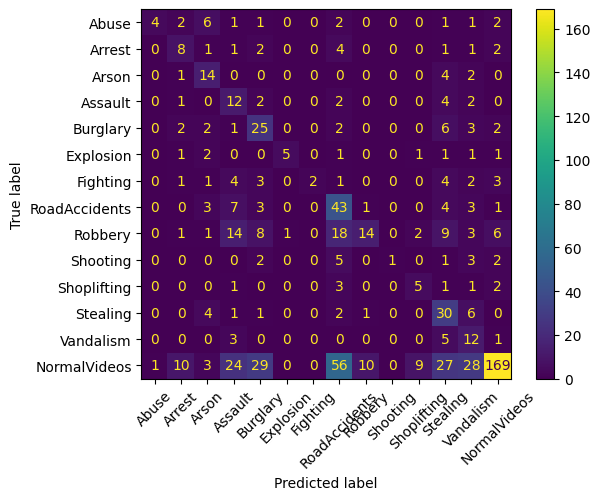

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

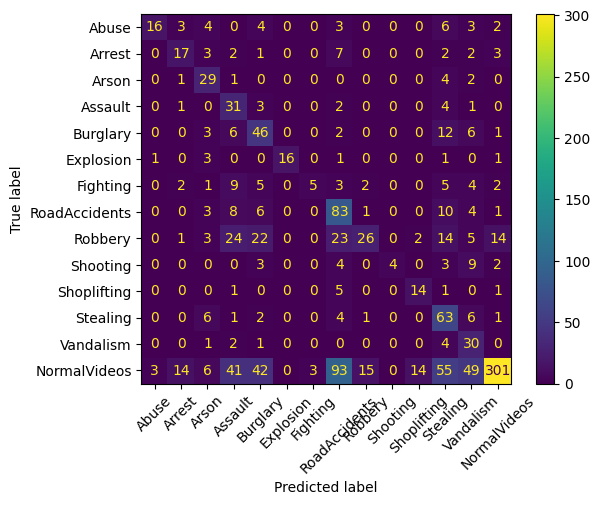

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_train_labels, all_train_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

##ResNet34 + LSTM ROC AUC 0.85

In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 95/95 [01:30<00:00,  1.05it/s]


ROC AUC: 0.85


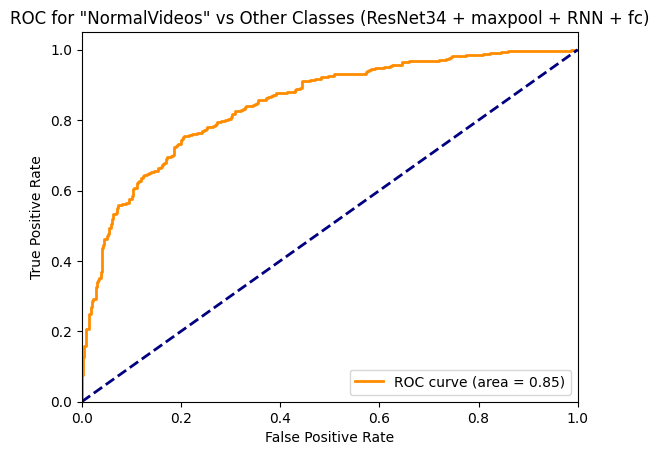

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes (ResNet34 + maxpool + RNN + fc)')
plt.legend(loc="lower right")
plt.show()

ROC AUC: 0.80


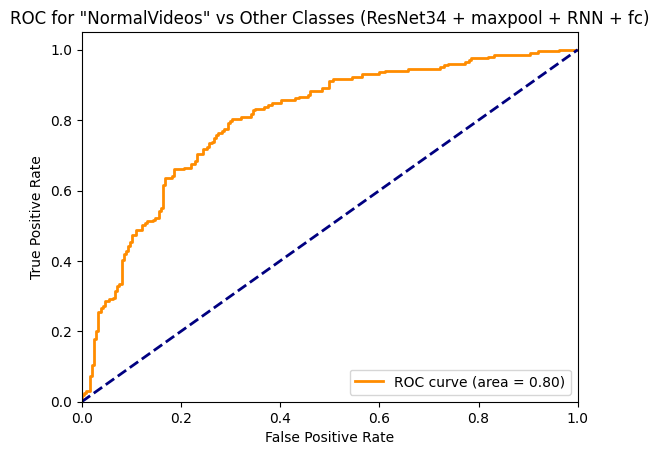

In [ ]:
#ВРЕМЕННАЯ ЯЧЕЙКА, ПОЧЕМУ-ТО УПАЛО, 131/131 и 55/55

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes (ResNet34 + maxpool + RNN + fc)')
plt.legend(loc="lower right")
plt.show()

ROC AUC: 0.88


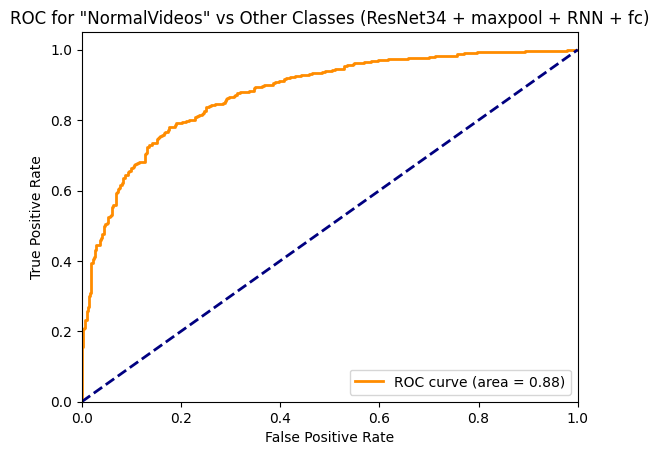

In [ ]:
#ВРЕМЕННАЯ ЯЧЕЙКА, ВЫРОСЛО, 172 и 95

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes (ResNet34 + maxpool + RNN + fc)')
plt.legend(loc="lower right")
plt.show()

##Приложение: ResNet34 + LSTM - эксперименты с параметрами

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 130/130 [01:51<00:00,  1.16it/s]


train Loss: 2.7137 F1 Micro: 0.0926 F1 Macro: 0.0525


val: 100%|██████████| 57/57 [00:38<00:00,  1.46it/s]


val Loss: 2.3497 F1 Micro: 0.4410 F1 Macro: 0.0528
Epoch 2/20
----------


train: 100%|██████████| 130/130 [01:51<00:00,  1.17it/s]


train Loss: 2.5938 F1 Micro: 0.3327 F1 Macro: 0.0983


val: 100%|██████████| 57/57 [00:38<00:00,  1.48it/s]


val Loss: 2.4304 F1 Micro: 0.2606 F1 Macro: 0.0536
Epoch 3/20
----------


train: 100%|██████████| 130/130 [01:54<00:00,  1.14it/s]


train Loss: 2.5650 F1 Micro: 0.3018 F1 Macro: 0.1061


val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


val Loss: 2.3294 F1 Micro: 0.4254 F1 Macro: 0.0807
Epoch 4/20
----------


train: 100%|██████████| 130/130 [01:52<00:00,  1.15it/s]


train Loss: 2.5568 F1 Micro: 0.2999 F1 Macro: 0.1368


val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


val Loss: 2.3775 F1 Micro: 0.3452 F1 Macro: 0.0861
Epoch 5/20
----------


train: 100%|██████████| 130/130 [01:52<00:00,  1.15it/s]


train Loss: 2.5075 F1 Micro: 0.2739 F1 Macro: 0.1109


val: 100%|██████████| 57/57 [00:38<00:00,  1.48it/s]


val Loss: 2.2606 F1 Micro: 0.4053 F1 Macro: 0.0724
Epoch 6/20
----------


train: 100%|██████████| 130/130 [01:54<00:00,  1.14it/s]


train Loss: 2.5100 F1 Micro: 0.3038 F1 Macro: 0.1404


val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


val Loss: 2.2352 F1 Micro: 0.2695 F1 Macro: 0.0689
Epoch 7/20
----------


train: 100%|██████████| 130/130 [01:54<00:00,  1.13it/s]


train Loss: 2.4615 F1 Micro: 0.3211 F1 Macro: 0.1429


val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


val Loss: 2.2037 F1 Micro: 0.3408 F1 Macro: 0.1014
Epoch 8/20
----------


train: 100%|██████████| 130/130 [01:53<00:00,  1.15it/s]


train Loss: 2.4191 F1 Micro: 0.2845 F1 Macro: 0.1409


val: 100%|██████████| 57/57 [00:38<00:00,  1.48it/s]


val Loss: 2.3057 F1 Micro: 0.3096 F1 Macro: 0.0836
Epoch 9/20
----------


train: 100%|██████████| 130/130 [01:55<00:00,  1.13it/s]


train Loss: 2.3856 F1 Micro: 0.3375 F1 Macro: 0.1635


val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


val Loss: 2.1208 F1 Micro: 0.3920 F1 Macro: 0.1120
Epoch 10/20
----------


train: 100%|██████████| 130/130 [01:53<00:00,  1.14it/s]


train Loss: 2.3528 F1 Micro: 0.3443 F1 Macro: 0.1813


val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


val Loss: 2.3707 F1 Micro: 0.2606 F1 Macro: 0.0798
Epoch 11/20
----------


train: 100%|██████████| 130/130 [01:53<00:00,  1.14it/s]


train Loss: 2.2944 F1 Micro: 0.3481 F1 Macro: 0.1945


val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


val Loss: 2.2104 F1 Micro: 0.3408 F1 Macro: 0.0959
Epoch 12/20
----------


train: 100%|██████████| 130/130 [01:54<00:00,  1.14it/s]


train Loss: 2.3016 F1 Micro: 0.3568 F1 Macro: 0.1804


val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


val Loss: 2.2794 F1 Micro: 0.2940 F1 Macro: 0.1042
Epoch 13/20
----------


train: 100%|██████████| 130/130 [01:53<00:00,  1.15it/s]


train Loss: 2.2543 F1 Micro: 0.3751 F1 Macro: 0.1958


val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


val Loss: 2.1034 F1 Micro: 0.3942 F1 Macro: 0.1157
Epoch 14/20
----------


train: 100%|██████████| 130/130 [01:53<00:00,  1.14it/s]


train Loss: 2.2336 F1 Micro: 0.3915 F1 Macro: 0.2069


val: 100%|██████████| 57/57 [00:38<00:00,  1.48it/s]


val Loss: 2.1890 F1 Micro: 0.3408 F1 Macro: 0.1245
Epoch 15/20
----------


train: 100%|██████████| 130/130 [01:53<00:00,  1.15it/s]


train Loss: 2.2011 F1 Micro: 0.3693 F1 Macro: 0.2149


val: 100%|██████████| 57/57 [00:38<00:00,  1.48it/s]


val Loss: 2.2240 F1 Micro: 0.2984 F1 Macro: 0.0989
Epoch 16/20
----------


train: 100%|██████████| 130/130 [01:53<00:00,  1.15it/s]


train Loss: 2.1294 F1 Micro: 0.3925 F1 Macro: 0.2233


val: 100%|██████████| 57/57 [00:38<00:00,  1.49it/s]


val Loss: 2.0868 F1 Micro: 0.3942 F1 Macro: 0.1417
Epoch 17/20
----------


train: 100%|██████████| 130/130 [01:52<00:00,  1.16it/s]


train Loss: 2.1368 F1 Micro: 0.3838 F1 Macro: 0.2650


val: 100%|██████████| 57/57 [00:38<00:00,  1.48it/s]


val Loss: 2.1036 F1 Micro: 0.3942 F1 Macro: 0.1205
Epoch 18/20
----------


train: 100%|██████████| 130/130 [01:54<00:00,  1.14it/s]


train Loss: 2.1250 F1 Micro: 0.4127 F1 Macro: 0.2479


val: 100%|██████████| 57/57 [00:38<00:00,  1.49it/s]


val Loss: 2.0972 F1 Micro: 0.3942 F1 Macro: 0.1480
Epoch 19/20
----------


train: 100%|██████████| 130/130 [01:53<00:00,  1.15it/s]


train Loss: 2.0611 F1 Micro: 0.4349 F1 Macro: 0.2798


val: 100%|██████████| 57/57 [00:38<00:00,  1.48it/s]


val Loss: 2.0375 F1 Micro: 0.3987 F1 Macro: 0.1637
Epoch 20/20
----------


train: 100%|██████████| 130/130 [01:54<00:00,  1.14it/s]


train Loss: 2.0071 F1 Micro: 0.4031 F1 Macro: 0.2887


val: 100%|██████████| 57/57 [00:38<00:00,  1.48it/s]


val Loss: 2.0943 F1 Micro: 0.3608 F1 Macro: 0.1194


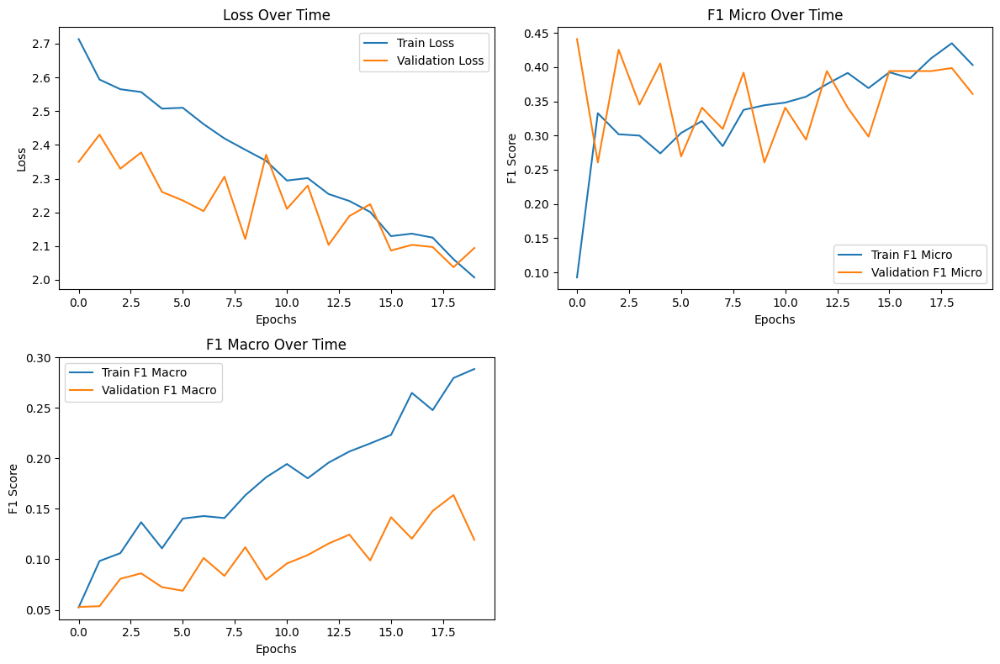

In [ ]:
#lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np


def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        # Здесь мы решаем, замораживать слои ResNet34 или нет
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_resnet = False  # Обновляем флаг, так как слои теперь разморожены

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                batch_size, seq_len, C, H, W = inputs.size()
                #inputs = inputs.view(-1, C, H, W)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor) # чтобы плотно скомпоновать последовательность
                    #outputs = outputs.view(batch_size, seq_len, -1)[:, -1, :]
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithRNN(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

RNN Confusion matrix и ROC AUC

In [ ]:
def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

val: 100%|██████████| 57/57 [00:38<00:00,  1.47it/s]


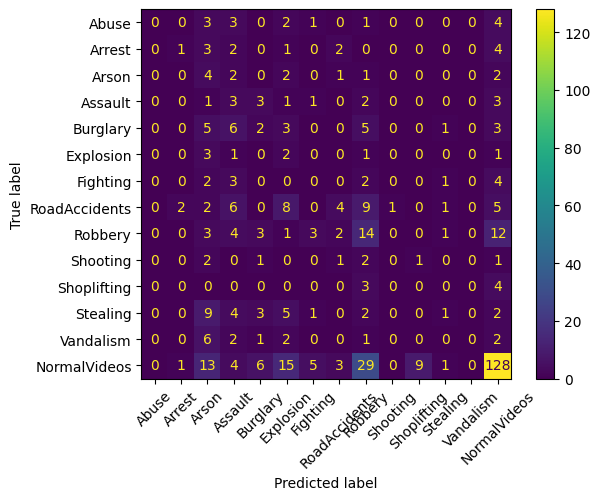

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

RNN ROC AUC

In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 57/57 [00:37<00:00,  1.50it/s]


ROC AUC: 0.81


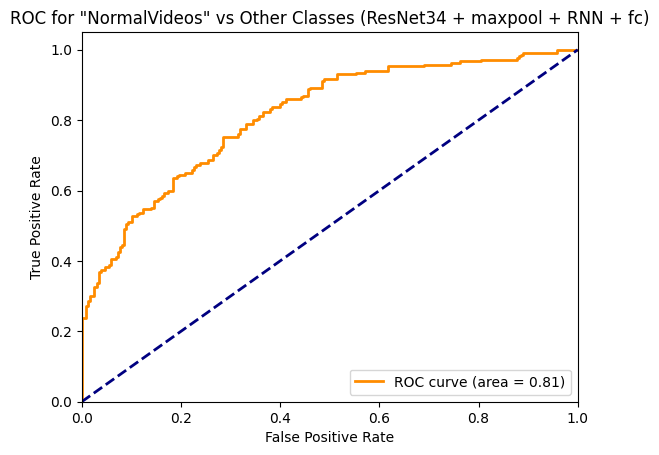

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes (ResNet34 + maxpool + RNN + fc)')
plt.legend(loc="lower right")
plt.show()

Epoch 1/20
----------


train: 100%|██████████| 149/149 [02:23<00:00,  1.04it/s]


train Loss: 2.7282 F1 Micro: 0.1296 F1 Macro: 0.0541


val: 100%|██████████| 38/38 [00:31<00:00,  1.19it/s]


val Loss: 2.6228 F1 Micro: 0.0436 F1 Macro: 0.0113
Epoch 2/20
----------


train: 100%|██████████| 149/149 [02:23<00:00,  1.04it/s]


train Loss: 2.6045 F1 Micro: 0.2492 F1 Macro: 0.0981


val: 100%|██████████| 38/38 [00:31<00:00,  1.21it/s]


val Loss: 2.6372 F1 Micro: 0.2953 F1 Macro: 0.0524
Epoch 3/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.01it/s]


train Loss: 2.5691 F1 Micro: 0.3039 F1 Macro: 0.1084


val: 100%|██████████| 38/38 [00:31<00:00,  1.23it/s]


val Loss: 2.6023 F1 Micro: 0.3121 F1 Macro: 0.0908
Epoch 4/20
----------


train: 100%|██████████| 149/149 [02:27<00:00,  1.01it/s]


train Loss: 2.5364 F1 Micro: 0.2811 F1 Macro: 0.1210


val: 100%|██████████| 38/38 [00:31<00:00,  1.21it/s]


val Loss: 2.6068 F1 Micro: 0.1477 F1 Macro: 0.0611
Epoch 5/20
----------


train: 100%|██████████| 149/149 [02:27<00:00,  1.01it/s]


train Loss: 2.5063 F1 Micro: 0.3081 F1 Macro: 0.1463


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.5612 F1 Micro: 0.2416 F1 Macro: 0.0690
Epoch 6/20
----------


train: 100%|██████████| 149/149 [02:25<00:00,  1.02it/s]


train Loss: 2.4329 F1 Micro: 0.3266 F1 Macro: 0.1448


val: 100%|██████████| 38/38 [00:32<00:00,  1.16it/s]


val Loss: 2.5293 F1 Micro: 0.2215 F1 Macro: 0.1124
Epoch 7/20
----------


train: 100%|██████████| 149/149 [02:29<00:00,  1.00s/it]


train Loss: 2.3918 F1 Micro: 0.3089 F1 Macro: 0.1620


val: 100%|██████████| 38/38 [00:32<00:00,  1.18it/s]


val Loss: 2.5818 F1 Micro: 0.3725 F1 Macro: 0.1165
Epoch 8/20
----------


train: 100%|██████████| 149/149 [02:29<00:00,  1.00s/it]


train Loss: 2.3796 F1 Micro: 0.3872 F1 Macro: 0.1841


val: 100%|██████████| 38/38 [00:32<00:00,  1.19it/s]


val Loss: 2.4999 F1 Micro: 0.2752 F1 Macro: 0.0958
Epoch 9/20
----------


train: 100%|██████████| 149/149 [02:29<00:00,  1.00s/it]


train Loss: 2.3341 F1 Micro: 0.3283 F1 Macro: 0.1808


val: 100%|██████████| 38/38 [00:31<00:00,  1.19it/s]


val Loss: 2.5074 F1 Micro: 0.3960 F1 Macro: 0.1223
Epoch 10/20
----------


train: 100%|██████████| 149/149 [02:27<00:00,  1.01it/s]


train Loss: 2.3385 F1 Micro: 0.3561 F1 Macro: 0.1850


val: 100%|██████████| 38/38 [00:32<00:00,  1.18it/s]


val Loss: 2.4920 F1 Micro: 0.4027 F1 Macro: 0.1480
Epoch 11/20
----------


train: 100%|██████████| 149/149 [02:27<00:00,  1.01it/s]


train Loss: 2.3328 F1 Micro: 0.3519 F1 Macro: 0.1936


val: 100%|██████████| 38/38 [00:31<00:00,  1.20it/s]


val Loss: 2.5665 F1 Micro: 0.3792 F1 Macro: 0.0965
Epoch 12/20
----------


train: 100%|██████████| 149/149 [02:28<00:00,  1.01it/s]


train Loss: 2.2470 F1 Micro: 0.3763 F1 Macro: 0.2076


val: 100%|██████████| 38/38 [00:31<00:00,  1.20it/s]


val Loss: 2.5702 F1 Micro: 0.2483 F1 Macro: 0.0993
Epoch 13/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.01it/s]


train Loss: 2.2148 F1 Micro: 0.3519 F1 Macro: 0.2260


val: 100%|██████████| 38/38 [00:32<00:00,  1.19it/s]


val Loss: 2.5202 F1 Micro: 0.3423 F1 Macro: 0.0931
Epoch 14/20
----------


train: 100%|██████████| 149/149 [02:28<00:00,  1.00it/s]


train Loss: 2.2013 F1 Micro: 0.3906 F1 Macro: 0.2405


val: 100%|██████████| 38/38 [00:32<00:00,  1.18it/s]


val Loss: 2.4712 F1 Micro: 0.3356 F1 Macro: 0.1249
Epoch 15/20
----------


train: 100%|██████████| 149/149 [02:28<00:00,  1.00it/s]


train Loss: 2.1663 F1 Micro: 0.3763 F1 Macro: 0.2553


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.4656 F1 Micro: 0.3490 F1 Macro: 0.1204
Epoch 16/20
----------


train: 100%|██████████| 149/149 [02:27<00:00,  1.01it/s]


train Loss: 2.1382 F1 Micro: 0.3948 F1 Macro: 0.2672


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.4710 F1 Micro: 0.2584 F1 Macro: 0.1375
Epoch 17/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.0946 F1 Micro: 0.3838 F1 Macro: 0.2592


val: 100%|██████████| 38/38 [00:31<00:00,  1.20it/s]


val Loss: 2.4974 F1 Micro: 0.2852 F1 Macro: 0.1203
Epoch 18/20
----------


train: 100%|██████████| 149/149 [02:27<00:00,  1.01it/s]


train Loss: 2.0760 F1 Micro: 0.3552 F1 Macro: 0.2418


val: 100%|██████████| 38/38 [00:31<00:00,  1.19it/s]


val Loss: 2.5624 F1 Micro: 0.2953 F1 Macro: 0.1307
Epoch 19/20
----------


train: 100%|██████████| 149/149 [02:27<00:00,  1.01it/s]


train Loss: 2.0308 F1 Micro: 0.3965 F1 Macro: 0.2800


val: 100%|██████████| 38/38 [00:31<00:00,  1.21it/s]


val Loss: 2.4757 F1 Micro: 0.3087 F1 Macro: 0.1404
Epoch 20/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 1.9788 F1 Micro: 0.4133 F1 Macro: 0.2929


val: 100%|██████████| 38/38 [00:31<00:00,  1.19it/s]


val Loss: 2.5448 F1 Micro: 0.4027 F1 Macro: 0.1390


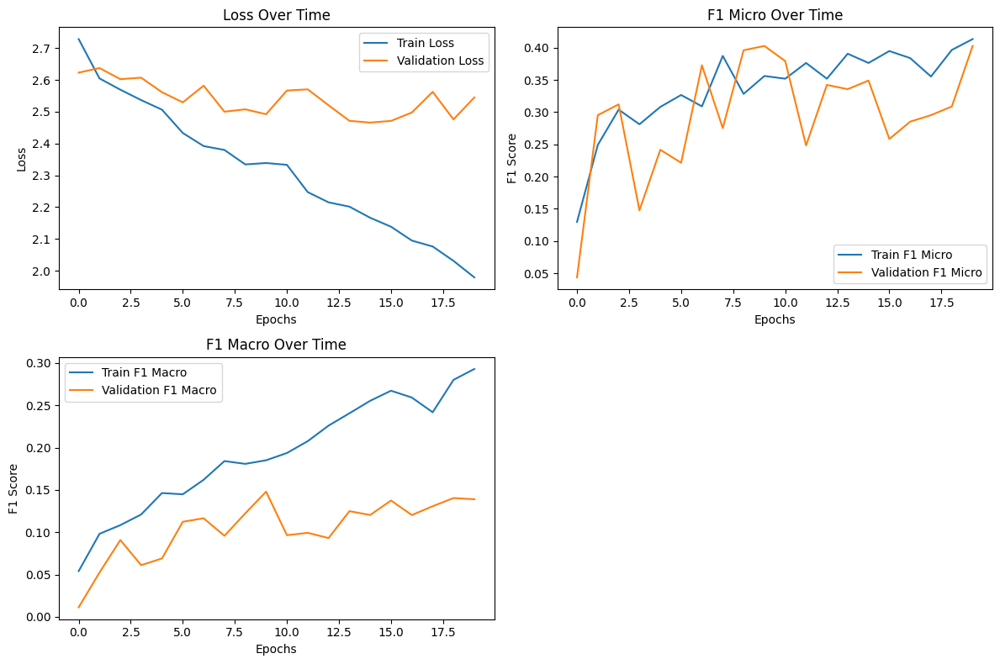

In [ ]:
#lr=0.0001, 20 эпох, батч 8
from sklearn.metrics import f1_score
import numpy as np

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        # Здесь мы решаем, замораживать слои ResNet34 или нет
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_resnet:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_resnet = False  # Обновляем флаг, так как слои теперь разморожены

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                batch_size, seq_len, C, H, W = inputs.size()
                #inputs = inputs.view(-1, C, H, W)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor) # чтобы плотно скомпоновать последовательность
                    #outputs = outputs.view(batch_size, seq_len, -1)[:, -1, :]
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithRNN(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

##Подсчет размерностей на каждом слое и общего количества параметров

In [ ]:
import torch
import torch.nn as nn
from torchvision import models
from torch.nn.utils.rnn import pack_padded_sequence

class CustomModelWithRNN(nn.Module):
    def __init__(self, num_classes, num_lstm_layers=1):
        super(CustomModelWithRNN, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.num_lstm_layers = num_lstm_layers
        self.features = nn.Sequential(*list(resnet34.children())[:4])
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel() // (example_output.size(2) * example_output.size(3))

        self.rnn = nn.LSTM(
            input_size=rnn_input_size * example_output.size(2) * example_output.size(3),
            hidden_size=rnn_input_size,
            num_layers=self.num_lstm_layers,
            batch_first=True)
        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor):
        batch_size, sequence_length, C, H, W = x.size()
        print(f'Initial size: {x.size()}')

        x = x.view(batch_size * sequence_length, C, H, W)
        print(f'After view: {x.size()}')

        x = self.features(x)
        print(f'After features: {x.size()}')

        x = self.maxpool(x)
        print(f'After maxpool: {x.size()}')

        x = torch.flatten(x, start_dim=1)
        print(f'After flatten: {x.size()}')

        x = x.view(batch_size, sequence_length, -1)
        print(f'Before RNN: {x.size()}')

        pad_x = pack_padded_sequence(x, lengths=lengths_tensor.cpu(), batch_first=True, enforce_sorted=False)
        outputs, (hidden_states, _) = self.rnn(pad_x)
        print(f'After RNN: {hidden_states.size()}')

        hidden_states = hidden_states[-1]
        print(f'After getting last hidden state: {hidden_states.size()}')

        probs = self.fc(hidden_states)
        print(f'Final output size: {probs.size()}')

        return probs

# Предполагается, что num_classes и lengths_tensor уже определены
num_classes = 14
model = CustomModelWithRNN(num_classes=num_classes, num_lstm_layers=1)

# Создаем тестовый вход
test_input = torch.randn(8, 1500, 3, 64, 64)
lengths_tensor = torch.tensor([1500] * 8)  # Все последовательности имеют длину 1500

# Выполняем тестовый прогон для печати размерностей
model.forward(test_input, lengths_tensor)

Initial size: torch.Size([8, 1500, 3, 64, 64])
After view: torch.Size([12000, 3, 64, 64])
After features: torch.Size([12000, 64, 16, 16])
After maxpool: torch.Size([12000, 64, 8, 8])
After flatten: torch.Size([12000, 4096])
Before RNN: torch.Size([8, 1500, 4096])
After RNN: torch.Size([1, 8, 64])
After getting last hidden state: torch.Size([8, 64])
Final output size: torch.Size([8, 14])


tensor([[-3.1904e-01,  1.3504e-01,  1.9509e-01, -1.4431e-01,  5.5654e-02,
         -5.0096e-01,  4.2586e-01,  1.2987e-01,  1.0089e-01, -9.7465e-02,
         -2.3576e-01, -1.1962e-02,  9.0003e-02, -1.1535e-01],
        [-2.6849e-01,  2.6348e-02,  2.7249e-01, -1.7415e-01,  6.5859e-02,
         -4.4887e-01,  4.6080e-01,  1.6109e-01,  7.4382e-02, -1.7117e-01,
         -3.1846e-01, -2.8938e-02,  1.7797e-01, -1.5672e-01],
        [-1.9837e-01,  9.5980e-02,  1.7619e-01, -1.7066e-01,  8.9372e-02,
         -4.2018e-01,  4.9030e-01,  3.3757e-01,  1.6330e-01, -3.3484e-02,
         -2.7162e-01, -2.7965e-02,  1.0499e-01, -1.9268e-01],
        [-1.4265e-01,  1.0906e-01,  3.0347e-01, -1.4491e-01,  7.1034e-02,
         -4.7386e-01,  3.7226e-01,  2.1614e-01,  8.9998e-02, -6.7311e-02,
         -2.3954e-01, -5.1412e-02,  1.4345e-01, -2.2015e-01],
        [-2.7653e-01,  5.7377e-02,  2.6534e-01, -1.6756e-01,  4.6870e-02,
         -3.9093e-01,  4.3031e-01,  1.3345e-01,  8.4817e-02, -1.2259e-01,
         -2.

In [ ]:
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable_params = total_params - trainable_params

print(f"Total params: {total_params}")
print(f"Trainable params: {trainable_params}")
print(f"Non-trainable params: {non_trainable_params}")

Total params: 1075918
Trainable params: 1075918
Non-trainable params: 0


In [ ]:
model = CustomModelWithRNN(num_classes=14, num_lstm_layers=1)

# Подсчет параметров
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable_params = total_params - trainable_params

print(f"Total params: {total_params}")
print(f"Trainable params: {trainable_params}")
print(f"Non-trainable params: {non_trainable_params}")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Total params: 134317390
Trainable params: 134317390
Non-trainable params: 0


#MobileNetV2

##Описание модели

Эта нейросеть представляет собой гибридную модель, которая объединяет сверточную нейронную сеть (CNN) на основе MobileNetV2 с рекуррентной нейронной сетью (RNN), с LSTM слоями. Модель предназначена для анализа последовательностей видео, где важно учитывать временные зависимости между кадрами.

### Компоненты и функции:

1. MobileNetV2 для извлечения признаков: используются первые слои предобученной модели MobileNetV2 для извлечения признаков из каждого кадра видео. MobileNetV2 эффективна в плане вычислений и памяти, что делает ее подходящей для мобильных устройств и в режиме реального времени.

2. MaxPooling применяется для уменьшения размерности признаковых карт, полученных от MobileNetV2. Это помогает уменьшить количество параметров и упрощает последующую обработку.

3. LSTM слои обрабатывают извлеченные признаки, учитывая временные зависимости между кадрами видео. Это позволяет модели улавливать динамику и последовательность событий в видеоряде.

4. Полносвязный слой: На выходе LSTM данные пропускаются через полносвязный слой, который преобразует их в вероятности классов. Это позволяет классифицировать видео в соответствии с задачами, например, наличие или отсутствие определенного типа активности или события.

### Использование в анализе UCF Crime Videodataset:

Модель, такая как эта, может быть особенно полезна для задачи анализа видеоданных из набора UCF Crime, который содержит видео различных типов преступлений и нормального поведения. Модель способна извлекать ключевые признаки из кадров и анализировать последовательности действий для определения наличия преступных действий.

### Преимущества:

- Эффективность: Использование MobileNetV2 делает модель относительно легкой и быстрой.
- Учет временных зависимостей: Благодаря LSTM слоям модель способна учитывать последовательность событий и изменения во времени, что критически важно для анализа видео.

### Применение:

Модель может быть использована не только для анализа видео на наличие преступлений, но и в других областях, где необходимо распознавание действий, мониторинг ситуаций в реальном времени или даже для анализа спортивных игр.


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.nn.utils.rnn import pack_padded_sequence

class CustomModelWithMobileNet(nn.Module):
    def __init__(self, num_classes, num_lstm_layers=1):
        super(CustomModelWithMobileNet, self).__init__()
        # Загружаем предобученную модель MobileNetV2
        mobilenet_v2 = models.mobilenet_v2(pretrained=True)
        self.num_lstm_layers = num_lstm_layers
        self.features = nn.Sequential(*list(mobilenet_v2.features)[:4])  # Берем только часть слоев для фич
        self.freeze_features = True  # Флаг для управления заморозкой слоев MobileNetV2
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2)

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.rnn = nn.LSTM(
            input_size=rnn_input_size,
            hidden_size=rnn_input_size,
            num_layers=self.num_lstm_layers)
        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
        x = self.features(x)
        x = self.maxpool(x)
        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        x = x.view(batch_size, sequence_length, -1)

        pad_x = pack_padded_sequence(x, lengths=lengths_tensor, batch_first=True, enforce_sorted=False)
        outputs, (hidden_states, _) = self.rnn(pad_x)

        hidden_states = hidden_states[-1]

        probs = self.fc(hidden_states)

        return probs


##MobileNet + LSTM

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 129MB/s]


Epoch 1/20
----------


train: 100%|██████████| 169/169 [02:04<00:00,  1.35it/s]


train Loss: 2.6627 F1 Micro: 0.2187 F1 Macro: 0.0752


val: 100%|██████████| 96/96 [01:09<00:00,  1.38it/s]


val Loss: 2.3567 F1 Micro: 0.3530 F1 Macro: 0.0957
Epoch 2/20
----------


train: 100%|██████████| 169/169 [02:04<00:00,  1.35it/s]


train Loss: 2.5354 F1 Micro: 0.3521 F1 Macro: 0.1161


val: 100%|██████████| 96/96 [01:06<00:00,  1.45it/s]


val Loss: 2.4604 F1 Micro: 0.1759 F1 Macro: 0.1285
Epoch 3/20
----------


train: 100%|██████████| 169/169 [02:12<00:00,  1.27it/s]


train Loss: 2.4701 F1 Micro: 0.3551 F1 Macro: 0.1465


val: 100%|██████████| 96/96 [01:06<00:00,  1.44it/s]


val Loss: 2.2497 F1 Micro: 0.2769 F1 Macro: 0.1011
Epoch 4/20
----------


train: 100%|██████████| 169/169 [02:11<00:00,  1.29it/s]


train Loss: 2.3641 F1 Micro: 0.3580 F1 Macro: 0.1778


val: 100%|██████████| 96/96 [01:07<00:00,  1.43it/s]


val Loss: 2.1596 F1 Micro: 0.3425 F1 Macro: 0.1500
Epoch 5/20
----------


train: 100%|██████████| 169/169 [02:12<00:00,  1.27it/s]


train Loss: 2.2921 F1 Micro: 0.3877 F1 Macro: 0.2106


val: 100%|██████████| 96/96 [01:08<00:00,  1.41it/s]


val Loss: 1.9863 F1 Micro: 0.4239 F1 Macro: 0.1823
Epoch 6/20
----------


train: 100%|██████████| 169/169 [02:12<00:00,  1.28it/s]


train Loss: 2.0996 F1 Micro: 0.4203 F1 Macro: 0.2551


val: 100%|██████████| 96/96 [01:05<00:00,  1.46it/s]


val Loss: 1.9993 F1 Micro: 0.3845 F1 Macro: 0.2343
Epoch 7/20
----------


train: 100%|██████████| 169/169 [02:10<00:00,  1.29it/s]


train Loss: 2.0180 F1 Micro: 0.4359 F1 Macro: 0.2968


val: 100%|██████████| 96/96 [01:06<00:00,  1.45it/s]


val Loss: 2.0847 F1 Micro: 0.3399 F1 Macro: 0.2702
Epoch 8/20
----------


train: 100%|██████████| 169/169 [02:10<00:00,  1.29it/s]


train Loss: 1.8430 F1 Micro: 0.4907 F1 Macro: 0.3697


val: 100%|██████████| 96/96 [01:06<00:00,  1.45it/s]


val Loss: 1.8248 F1 Micro: 0.4580 F1 Macro: 0.3994
Epoch 9/20
----------


train: 100%|██████████| 169/169 [02:12<00:00,  1.27it/s]


train Loss: 1.6639 F1 Micro: 0.5026 F1 Macro: 0.4086


val: 100%|██████████| 96/96 [01:06<00:00,  1.45it/s]


val Loss: 1.4053 F1 Micro: 0.6142 F1 Macro: 0.4517
Epoch 10/20
----------


train: 100%|██████████| 169/169 [02:10<00:00,  1.30it/s]


train Loss: 1.4266 F1 Micro: 0.5612 F1 Macro: 0.5127


val: 100%|██████████| 96/96 [01:07<00:00,  1.43it/s]


val Loss: 1.6255 F1 Micro: 0.5197 F1 Macro: 0.4803
Epoch 11/20
----------


train: 100%|██████████| 169/169 [02:09<00:00,  1.31it/s]


train Loss: 1.2738 F1 Micro: 0.6168 F1 Macro: 0.5786


val: 100%|██████████| 96/96 [01:05<00:00,  1.46it/s]


val Loss: 1.6201 F1 Micro: 0.5026 F1 Macro: 0.5219
Epoch 12/20
----------


train: 100%|██████████| 169/169 [02:10<00:00,  1.30it/s]


train Loss: 1.0958 F1 Micro: 0.6583 F1 Macro: 0.6301


val: 100%|██████████| 96/96 [01:05<00:00,  1.46it/s]


val Loss: 1.4205 F1 Micro: 0.5958 F1 Macro: 0.5778
Epoch 13/20
----------


train: 100%|██████████| 169/169 [02:11<00:00,  1.28it/s]


train Loss: 0.8606 F1 Micro: 0.7124 F1 Macro: 0.7144


val: 100%|██████████| 96/96 [01:06<00:00,  1.45it/s]


val Loss: 1.2204 F1 Micro: 0.6654 F1 Macro: 0.6575
Epoch 14/20
----------


train: 100%|██████████| 169/169 [02:11<00:00,  1.29it/s]


train Loss: 0.7066 F1 Micro: 0.7502 F1 Macro: 0.7700


val: 100%|██████████| 96/96 [01:06<00:00,  1.45it/s]


val Loss: 1.1893 F1 Micro: 0.6759 F1 Macro: 0.6674
Epoch 15/20
----------


train: 100%|██████████| 169/169 [02:12<00:00,  1.27it/s]


train Loss: 0.5598 F1 Micro: 0.8110 F1 Macro: 0.8197


val: 100%|██████████| 96/96 [01:06<00:00,  1.44it/s]


val Loss: 0.9535 F1 Micro: 0.7546 F1 Macro: 0.7377
Epoch 16/20
----------


train: 100%|██████████| 169/169 [02:12<00:00,  1.27it/s]


train Loss: 0.4151 F1 Micro: 0.8340 F1 Macro: 0.8560


val: 100%|██████████| 96/96 [01:07<00:00,  1.43it/s]


val Loss: 0.8932 F1 Micro: 0.7717 F1 Macro: 0.7406
Epoch 17/20
----------


train: 100%|██████████| 169/169 [02:12<00:00,  1.28it/s]


train Loss: 0.3100 F1 Micro: 0.8681 F1 Macro: 0.8922


val: 100%|██████████| 96/96 [01:07<00:00,  1.43it/s]


val Loss: 0.8097 F1 Micro: 0.7992 F1 Macro: 0.7604
Epoch 18/20
----------


train: 100%|██████████| 169/169 [02:12<00:00,  1.27it/s]


train Loss: 0.2125 F1 Micro: 0.9088 F1 Macro: 0.9261


val: 100%|██████████| 96/96 [01:06<00:00,  1.44it/s]


val Loss: 0.8082 F1 Micro: 0.7703 F1 Macro: 0.7724
Epoch 19/20
----------


train: 100%|██████████| 169/169 [02:11<00:00,  1.29it/s]


train Loss: 0.1815 F1 Micro: 0.9140 F1 Macro: 0.9383


val: 100%|██████████| 96/96 [01:06<00:00,  1.45it/s]


val Loss: 0.7099 F1 Micro: 0.8425 F1 Macro: 0.7799
Epoch 20/20
----------


train: 100%|██████████| 169/169 [02:10<00:00,  1.30it/s]


train Loss: 0.1341 F1 Micro: 0.9437 F1 Macro: 0.9564


val: 100%|██████████| 96/96 [01:06<00:00,  1.45it/s]


val Loss: 0.6887 F1 Micro: 0.8333 F1 Macro: 0.7959


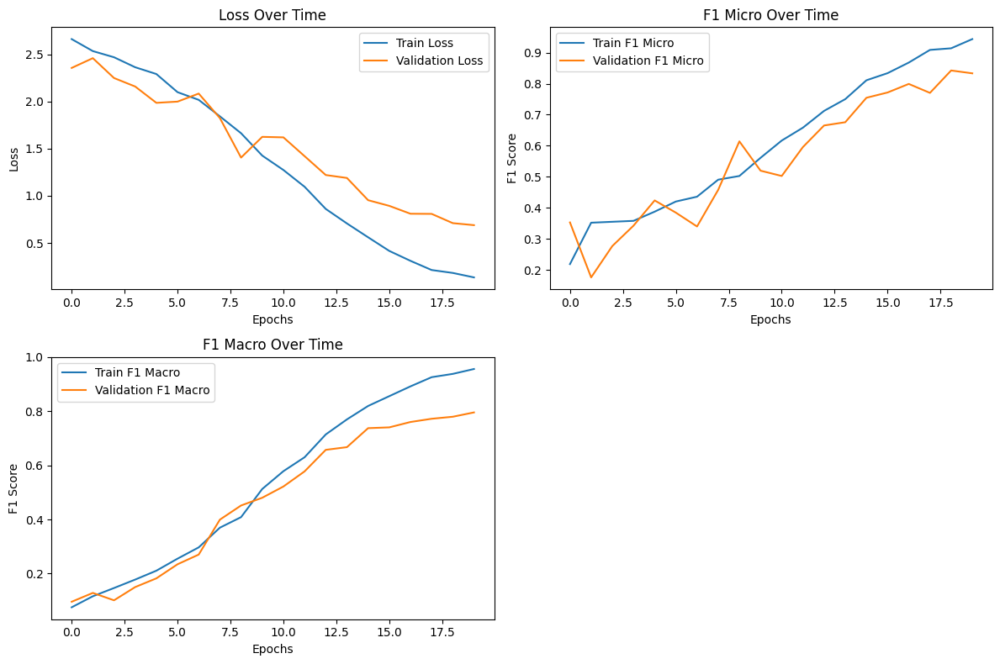

In [ ]:
#LSTM аугментации без флипа, размытие и шум, lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'LSTMWithMobileNet')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)


def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'lstm_with_mobile_net_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithMobileNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

##Кросс валидация

In [ ]:
import cv2
import numpy as np
import torch
from moviepy.editor import VideoFileClip
import torchvision.transforms as transforms

def preprocess_video(video_path):
    clip = VideoFileClip(video_path)
    frames = []
    for frame in clip.iter_frames(fps=1):  # Регулируйте fps, если нужно другое количество кадров
        # Изменение размера кадра
        frame = cv2.resize(frame, (64, 64))
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Убедитесь, что кадры в RGB
        frame = np.array(frame) / 255.0  # Нормализация
        # Преобразование изображения в тензор
        frame_tensor = torch.tensor(frame, dtype=torch.float32)
        frame_tensor = frame_tensor.permute(2, 0, 1)  # Перестановка осей для PyTorch (C, H, W)
        # Нормализация тензора
        normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        frame_tensor = normalize(frame_tensor)
        frames.append(frame_tensor)
    return frames  # Возвращаем список тензоров


In [ ]:
from sklearn.metrics import roc_curve, auc
import numpy as np

def compute_binary_roc_auc(probs, labels, normal_class_idx):
    # Преобразуем all_probs в NumPy массив для правильной индексации
    probs = np.array(probs)

    # Теперь мы можем безопасно индексировать probs для получения вероятностей
    normal_class_probs = probs[:, normal_class_idx]

    # Убедимся, что labels является массивом NumPy
    labels = np.array(labels)

    # Теперь мы можем безопасно использовать .astype() на всём массиве
    binary_labels = (labels == normal_class_idx).astype(int)

    # Вычисляем FPR и TPR для ROC
    fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

    # Вычисляем площадь под ROC-кривой (AUC)
    roc_auc = auc(fpr, tpr)

    return roc_auc

In [ ]:
#ROC AUC added
def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [], 'val_loss': [],
        'train_f1_micro': [], 'val_f1_micro': [],
        'train_f1_macro': [], 'val_f1_macro': [],
        'train_roc_auc': [], 'val_roc_auc': []
    }

    normal_class_idx = CLASS_TO_IDX['NormalVideos']

    for epoch in range(num_epochs):
        if epoch < 2:
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []
            all_probs = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                all_probs.extend(outputs.softmax(dim=1).detach().cpu().numpy())  # Отсоединяем тензор перед вызовом numpy()

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')
            epoch_roc_auc = compute_binary_roc_auc(all_probs, all_labels, normal_class_idx)

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)
            history[f'{phase}_roc_auc'].append(epoch_roc_auc)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f} ROC AUC: {epoch_roc_auc:.4f}')

            if phase == 'val':
                model.eval()
                filename = f'lstm_with_mobile_net_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}_roc_auc_{epoch_roc_auc:.4f}.pth'
                if not os.path.exists(MODEL_CHECKPOINT_FOLDER):
                    os.makedirs(MODEL_CHECKPOINT_FOLDER)
                torch.save(model.state_dict(), os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history


In [ ]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'lstm_with_mobile_net_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

In [ ]:
from sklearn.model_selection import KFold
import json
import torch
from torch.utils.data import DataLoader
import torch.optim as optim
from tqdm import tqdm
from sklearn.metrics import f1_score

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'LSTMWithMobileNet_cross_validation')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)


k_folds = 5
batch_size = 8

# Объединение тренировочного и валидационного датасетов
concat_train_dataset = torch.utils.data.ConcatDataset([train_dataset, val_dataset])

# Инициализация кросс-валидации
kf = KFold(n_splits=k_folds, shuffle=True)

history_for_k_folds = []

# Цикл по каждому фолду
for fold, (train_idx, val_idx) in enumerate(kf.split(concat_train_dataset)):
    print(f"Fold {fold + 1}")
    print("-------")

    # Определение загрузчиков данных для текущего фолда
    train_loader = DataLoader(
        dataset=concat_train_dataset,
        batch_size=batch_size,
        sampler=torch.utils.data.SubsetRandomSampler(train_idx),
        collate_fn=collate_batch  # Используем нашу функцию коллации
    )
    val_loader = DataLoader(
        dataset=concat_train_dataset,
        batch_size=batch_size,
        sampler=torch.utils.data.SubsetRandomSampler(val_idx),
        collate_fn=collate_batch  # Используем нашу функцию коллации
    )

    num_classes = len(CLASS_TO_IDX)
    model = CustomModelWithMobileNet(num_classes=num_classes)
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

    dataloaders = {'train': train_loader, 'val': val_loader}

    history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')
    history_for_k_folds.append(history)

# Сохранение результатов кросс-валидации
with open('/content/drive/MyDrive/cross_validation_LSTMMobileNet_results.json', 'w') as f:
    json.dump(history_for_k_folds, f, indent=4, ensure_ascii=False)


  warnings.warn(

  warnings.warn(msg)



Fold 1
-------
Epoch 1/20
----------


train: 100%|██████████| 149/149 [02:46<00:00,  1.12s/it]


train Loss: 2.1474 F1 Micro: 0.1852 F1 Macro: 0.0669 ROC AUC: 0.6247


val: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]


val Loss: 0.5201 F1 Micro: 0.3859 F1 Macro: 0.0556 ROC AUC: 0.7082
Epoch 2/20
----------


train: 100%|██████████| 149/149 [02:46<00:00,  1.12s/it]


train Loss: 2.0504 F1 Micro: 0.3232 F1 Macro: 0.1084 ROC AUC: 0.6846


val: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]


val Loss: 0.5282 F1 Micro: 0.0403 F1 Macro: 0.0150 ROC AUC: 0.7255
Epoch 3/20
----------


train: 100%|██████████| 149/149 [02:57<00:00,  1.19s/it]


train Loss: 2.0046 F1 Micro: 0.3056 F1 Macro: 0.1419 ROC AUC: 0.6859


val: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]


val Loss: 0.5081 F1 Micro: 0.3490 F1 Macro: 0.1015 ROC AUC: 0.7824
Epoch 4/20
----------


train: 100%|██████████| 149/149 [02:58<00:00,  1.20s/it]


train Loss: 1.9406 F1 Micro: 0.3426 F1 Macro: 0.1558 ROC AUC: 0.7562


val: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]


val Loss: 0.5183 F1 Micro: 0.1779 F1 Macro: 0.0744 ROC AUC: 0.8128
Epoch 5/20
----------


train: 100%|██████████| 149/149 [02:57<00:00,  1.19s/it]


train Loss: 1.8224 F1 Micro: 0.3468 F1 Macro: 0.2119 ROC AUC: 0.7649


val: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]


val Loss: 0.5020 F1 Micro: 0.3490 F1 Macro: 0.1055 ROC AUC: 0.7961
Epoch 6/20
----------


train: 100%|██████████| 149/149 [02:57<00:00,  1.19s/it]


train Loss: 1.7460 F1 Micro: 0.4074 F1 Macro: 0.2585 ROC AUC: 0.7834


val: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]


val Loss: 0.5076 F1 Micro: 0.4228 F1 Macro: 0.1001 ROC AUC: 0.8027
Epoch 7/20
----------


train: 100%|██████████| 149/149 [02:57<00:00,  1.19s/it]


train Loss: 1.6208 F1 Micro: 0.4444 F1 Macro: 0.3113 ROC AUC: 0.7977


val: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]


val Loss: 0.5144 F1 Micro: 0.3423 F1 Macro: 0.1121 ROC AUC: 0.8163
Epoch 8/20
----------


train: 100%|██████████| 149/149 [02:57<00:00,  1.19s/it]


train Loss: 1.5130 F1 Micro: 0.4554 F1 Macro: 0.3436 ROC AUC: 0.8109


val: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]


val Loss: 0.5140 F1 Micro: 0.3255 F1 Macro: 0.0987 ROC AUC: 0.8240
Epoch 9/20
----------


train: 100%|██████████| 149/149 [02:57<00:00,  1.19s/it]


train Loss: 1.3757 F1 Micro: 0.4874 F1 Macro: 0.4146 ROC AUC: 0.8393


val: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]


val Loss: 0.4912 F1 Micro: 0.3423 F1 Macro: 0.1497 ROC AUC: 0.8210
Epoch 10/20
----------


train: 100%|██████████| 149/149 [02:56<00:00,  1.19s/it]


train Loss: 1.2218 F1 Micro: 0.5446 F1 Macro: 0.5046 ROC AUC: 0.8516


val: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]


val Loss: 0.5017 F1 Micro: 0.3826 F1 Macro: 0.1593 ROC AUC: 0.8386
Epoch 11/20
----------


train: 100%|██████████| 149/149 [02:56<00:00,  1.18s/it]


train Loss: 1.0905 F1 Micro: 0.5901 F1 Macro: 0.5524 ROC AUC: 0.8637


val: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]


val Loss: 0.4995 F1 Micro: 0.3221 F1 Macro: 0.1660 ROC AUC: 0.8422
Epoch 12/20
----------


train: 100%|██████████| 149/149 [02:57<00:00,  1.19s/it]


train Loss: 0.9284 F1 Micro: 0.6313 F1 Macro: 0.6279 ROC AUC: 0.8847


val: 100%|██████████| 38/38 [00:36<00:00,  1.04it/s]


val Loss: 0.4907 F1 Micro: 0.3188 F1 Macro: 0.1854 ROC AUC: 0.8450
Epoch 13/20
----------


train: 100%|██████████| 149/149 [02:56<00:00,  1.19s/it]


train Loss: 0.7811 F1 Micro: 0.6810 F1 Macro: 0.6790 ROC AUC: 0.8895


val: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]


val Loss: 0.5421 F1 Micro: 0.4564 F1 Macro: 0.2010 ROC AUC: 0.8328
Epoch 14/20
----------


train: 100%|██████████| 149/149 [02:56<00:00,  1.18s/it]


train Loss: 0.6685 F1 Micro: 0.7130 F1 Macro: 0.7370 ROC AUC: 0.9046


val: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]


val Loss: 0.5583 F1 Micro: 0.4530 F1 Macro: 0.1747 ROC AUC: 0.8363
Epoch 15/20
----------


train: 100%|██████████| 149/149 [02:56<00:00,  1.18s/it]


train Loss: 0.5258 F1 Micro: 0.7710 F1 Macro: 0.7911 ROC AUC: 0.9298


val: 100%|██████████| 38/38 [00:36<00:00,  1.04it/s]


val Loss: 0.5639 F1 Micro: 0.3490 F1 Macro: 0.1637 ROC AUC: 0.8443
Epoch 16/20
----------


train: 100%|██████████| 149/149 [02:55<00:00,  1.18s/it]


train Loss: 0.4004 F1 Micro: 0.8241 F1 Macro: 0.8410 ROC AUC: 0.9516


val: 100%|██████████| 38/38 [00:36<00:00,  1.04it/s]


val Loss: 0.5922 F1 Micro: 0.4497 F1 Macro: 0.1729 ROC AUC: 0.8453
Epoch 17/20
----------


train: 100%|██████████| 149/149 [02:56<00:00,  1.18s/it]


train Loss: 0.3096 F1 Micro: 0.8535 F1 Macro: 0.8746 ROC AUC: 0.9639


val: 100%|██████████| 38/38 [00:36<00:00,  1.04it/s]


val Loss: 0.6012 F1 Micro: 0.4228 F1 Macro: 0.2059 ROC AUC: 0.8428
Epoch 18/20
----------


train: 100%|██████████| 149/149 [02:55<00:00,  1.18s/it]


train Loss: 0.2405 F1 Micro: 0.8864 F1 Macro: 0.9123 ROC AUC: 0.9770


val: 100%|██████████| 38/38 [00:36<00:00,  1.04it/s]


val Loss: 0.6145 F1 Micro: 0.4094 F1 Macro: 0.1886 ROC AUC: 0.8291
Epoch 19/20
----------


train: 100%|██████████| 149/149 [02:56<00:00,  1.18s/it]


train Loss: 0.1563 F1 Micro: 0.9318 F1 Macro: 0.9463 ROC AUC: 0.9894


val: 100%|██████████| 38/38 [00:36<00:00,  1.04it/s]


val Loss: 0.6469 F1 Micro: 0.4396 F1 Macro: 0.1825 ROC AUC: 0.8306
Epoch 20/20
----------


train: 100%|██████████| 149/149 [02:55<00:00,  1.18s/it]


train Loss: 0.1426 F1 Micro: 0.9369 F1 Macro: 0.9487 ROC AUC: 0.9910


val: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]
  warnings.warn(

  warnings.warn(msg)



val Loss: 0.6218 F1 Micro: 0.4262 F1 Macro: 0.1869 ROC AUC: 0.8237
Fold 2
-------
Epoch 1/20
----------


train: 100%|██████████| 149/149 [02:41<00:00,  1.09s/it]


train Loss: 2.1234 F1 Micro: 0.2532 F1 Macro: 0.0792 ROC AUC: 0.5962


val: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]


val Loss: 0.5299 F1 Micro: 0.0673 F1 Macro: 0.0233 ROC AUC: 0.7293
Epoch 2/20
----------


train: 100%|██████████| 149/149 [02:42<00:00,  1.09s/it]


train Loss: 2.0321 F1 Micro: 0.3263 F1 Macro: 0.1084 ROC AUC: 0.6900


val: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]


val Loss: 0.5547 F1 Micro: 0.1481 F1 Macro: 0.0385 ROC AUC: 0.7368
Epoch 3/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.16s/it]


train Loss: 2.0026 F1 Micro: 0.2860 F1 Macro: 0.1234 ROC AUC: 0.7253


val: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]


val Loss: 0.5162 F1 Micro: 0.2997 F1 Macro: 0.0903 ROC AUC: 0.7578
Epoch 4/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.16s/it]


train Loss: 1.9197 F1 Micro: 0.3684 F1 Macro: 0.1609 ROC AUC: 0.7579


val: 100%|██████████| 38/38 [00:38<00:00,  1.01s/it]


val Loss: 0.5098 F1 Micro: 0.2694 F1 Macro: 0.1080 ROC AUC: 0.7565
Epoch 5/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.16s/it]


train Loss: 1.8090 F1 Micro: 0.3852 F1 Macro: 0.2181 ROC AUC: 0.7548


val: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]


val Loss: 0.5340 F1 Micro: 0.3838 F1 Macro: 0.0676 ROC AUC: 0.7606
Epoch 6/20
----------


train: 100%|██████████| 149/149 [02:52<00:00,  1.16s/it]


train Loss: 1.6963 F1 Micro: 0.4298 F1 Macro: 0.2669 ROC AUC: 0.7872


val: 100%|██████████| 38/38 [00:39<00:00,  1.03s/it]


val Loss: 0.5231 F1 Micro: 0.2290 F1 Macro: 0.0821 ROC AUC: 0.7620
Epoch 7/20
----------


train: 100%|██████████| 149/149 [02:52<00:00,  1.16s/it]


train Loss: 1.6141 F1 Micro: 0.4348 F1 Macro: 0.2907 ROC AUC: 0.8069


val: 100%|██████████| 38/38 [00:38<00:00,  1.03s/it]


val Loss: 0.5119 F1 Micro: 0.3131 F1 Macro: 0.1485 ROC AUC: 0.7890
Epoch 8/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.16s/it]


train Loss: 1.4821 F1 Micro: 0.4516 F1 Macro: 0.3402 ROC AUC: 0.8115


val: 100%|██████████| 38/38 [00:38<00:00,  1.01s/it]


val Loss: 0.5402 F1 Micro: 0.2694 F1 Macro: 0.1312 ROC AUC: 0.7913
Epoch 9/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.16s/it]


train Loss: 1.3715 F1 Micro: 0.5366 F1 Macro: 0.4308 ROC AUC: 0.8372


val: 100%|██████████| 38/38 [00:38<00:00,  1.01s/it]


val Loss: 0.5202 F1 Micro: 0.1785 F1 Macro: 0.1047 ROC AUC: 0.8113
Epoch 10/20
----------


train: 100%|██████████| 149/149 [02:52<00:00,  1.16s/it]


train Loss: 1.2025 F1 Micro: 0.5534 F1 Macro: 0.5053 ROC AUC: 0.8405


val: 100%|██████████| 38/38 [00:39<00:00,  1.03s/it]


val Loss: 0.5311 F1 Micro: 0.2458 F1 Macro: 0.1392 ROC AUC: 0.7862
Epoch 11/20
----------


train: 100%|██████████| 149/149 [02:51<00:00,  1.15s/it]


train Loss: 1.0762 F1 Micro: 0.6165 F1 Macro: 0.5728 ROC AUC: 0.8824


val: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]


val Loss: 0.5528 F1 Micro: 0.2492 F1 Macro: 0.1339 ROC AUC: 0.7938
Epoch 12/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.17s/it]


train Loss: 0.9442 F1 Micro: 0.6526 F1 Macro: 0.6185 ROC AUC: 0.8863


val: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]


val Loss: 0.5736 F1 Micro: 0.3670 F1 Macro: 0.1330 ROC AUC: 0.8031
Epoch 13/20
----------


train: 100%|██████████| 149/149 [02:54<00:00,  1.17s/it]


train Loss: 0.8031 F1 Micro: 0.6804 F1 Macro: 0.6704 ROC AUC: 0.9014


val: 100%|██████████| 38/38 [00:39<00:00,  1.05s/it]


val Loss: 0.5946 F1 Micro: 0.3367 F1 Macro: 0.1363 ROC AUC: 0.8138
Epoch 14/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.17s/it]


train Loss: 0.7110 F1 Micro: 0.7351 F1 Macro: 0.7250 ROC AUC: 0.9183


val: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]


val Loss: 0.6040 F1 Micro: 0.3030 F1 Macro: 0.1248 ROC AUC: 0.8025
Epoch 15/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.16s/it]


train Loss: 0.4871 F1 Micro: 0.7897 F1 Macro: 0.8012 ROC AUC: 0.9410


val: 100%|██████████| 38/38 [00:39<00:00,  1.03s/it]


val Loss: 0.5896 F1 Micro: 0.2761 F1 Macro: 0.1390 ROC AUC: 0.7995
Epoch 16/20
----------


train: 100%|██████████| 149/149 [02:52<00:00,  1.16s/it]


train Loss: 0.3981 F1 Micro: 0.8183 F1 Macro: 0.8438 ROC AUC: 0.9465


val: 100%|██████████| 38/38 [00:38<00:00,  1.01s/it]


val Loss: 0.6252 F1 Micro: 0.3502 F1 Macro: 0.1493 ROC AUC: 0.8186
Epoch 17/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.16s/it]


train Loss: 0.3101 F1 Micro: 0.8646 F1 Macro: 0.8830 ROC AUC: 0.9643


val: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]


val Loss: 0.6677 F1 Micro: 0.3502 F1 Macro: 0.1745 ROC AUC: 0.8216
Epoch 18/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.17s/it]


train Loss: 0.2430 F1 Micro: 0.8823 F1 Macro: 0.8938 ROC AUC: 0.9750


val: 100%|██████████| 38/38 [00:38<00:00,  1.01s/it]


val Loss: 0.6736 F1 Micro: 0.3737 F1 Macro: 0.1257 ROC AUC: 0.8274
Epoch 19/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.17s/it]


train Loss: 0.1536 F1 Micro: 0.9209 F1 Macro: 0.9387 ROC AUC: 0.9844


val: 100%|██████████| 38/38 [00:38<00:00,  1.01s/it]


val Loss: 0.7466 F1 Micro: 0.4175 F1 Macro: 0.1487 ROC AUC: 0.8355
Epoch 20/20
----------


train: 100%|██████████| 149/149 [02:53<00:00,  1.16s/it]


train Loss: 0.1353 F1 Micro: 0.9302 F1 Macro: 0.9431 ROC AUC: 0.9883


val: 100%|██████████| 38/38 [00:39<00:00,  1.04s/it]
  warnings.warn(

  warnings.warn(msg)



val Loss: 0.7659 F1 Micro: 0.3973 F1 Macro: 0.1518 ROC AUC: 0.8122
Fold 3
-------
Epoch 1/20
----------


train: 100%|██████████| 149/149 [02:38<00:00,  1.06s/it]


train Loss: 2.1265 F1 Micro: 0.1236 F1 Macro: 0.0692 ROC AUC: 0.6251


val: 100%|██████████| 38/38 [00:42<00:00,  1.11s/it]


val Loss: 0.5364 F1 Micro: 0.0539 F1 Macro: 0.0249 ROC AUC: 0.7663
Epoch 2/20
----------


train:  19%|█▉        | 29/149 [00:32<02:16,  1.14s/it]


KeyboardInterrupt: 

In [ ]:
#fine-tuning

In [ ]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=10, device='cuda'):
    early_stopping = EarlyStopping(patience=3, min_delta=0.01)
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': [], 'val_roc_auc': []}

    for epoch in range(num_epochs):
        if early_stopping.early_stop:
            print("Early stopping")
            break

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                lengths = lengths.cpu()  # Перемещаем lengths обратно на CPU

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            if phase == 'val':
                if len(set(all_labels)) > 1:  # Проверка на наличие более одного класса
                    epoch_roc_auc = roc_auc_score(all_labels, outputs.softmax(dim=1)[:, 1].cpu().numpy())
                    history[f'val_roc_auc'].append(epoch_roc_auc)
                    print(f'{phase} ROC AUC: {epoch_roc_auc:.4f}')
                else:
                    history[f'val_roc_auc'].append(float('nan'))  # Обработка случая, когда присутствует только один класс
                early_stopping(epoch_loss)

    return history


In [ ]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=10, device='cuda'):
    early_stopping = EarlyStopping(patience=3, min_delta=0.01)
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': [], 'val_roc_auc': []}

    for epoch in range(num_epochs):
        if early_stopping.early_stop:
            print("Early stopping")
            break

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []
            all_probs = []

            for inputs, labels, lengths in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                lengths = lengths.cpu()  # Перемещаем lengths обратно на CPU

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                probs = outputs.softmax(dim=1).detach()  # Добавляем detach()
                preds = outputs.argmax(dim=1)
                all_probs.extend(probs.cpu().numpy())
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            if phase == 'val':
                if len(set(all_labels)) > 1:  # Проверка на наличие более одного класса
                    epoch_roc_auc = roc_auc_score(all_labels, np.array(all_probs), multi_class='ovr')
                    history[f'val_roc_auc'].append(epoch_roc_auc)
                    print(f'{phase} ROC AUC: {epoch_roc_auc:.4f}')
                else:
                    history[f'val_roc_auc'].append(float('nan'))  # Обработка случая, когда присутствует только один класс
                early_stopping(epoch_loss)

    return history

In [ ]:
from sklearn.model_selection import KFold
import json
import torch
from torch.utils.data import DataLoader
import numpy as np
from sklearn.metrics import f1_score, roc_auc_score

# Определение функции загрузки предобученной модели
def load_pretrained_model(checkpoint_path):
    model = torch.load(checkpoint_path, map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
    return model

# Функция ранней остановки
class EarlyStopping:
    def __init__(self, patience=3, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_score = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_score is None:
            self.best_score = val_loss
        elif val_loss < self.best_score - self.min_delta:
            self.best_score = val_loss
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
                # Функция для вычисления среднего значения и стандартного отклонения
def compute_mean_std(history_for_k_folds, metric):
    all_values = [history[metric][-1] for history in history_for_k_folds]
    mean = np.nanmean(all_values)  # Используем nanmean для игнорирования NaN значений
    std = np.nanstd(all_values)  # Используем nanstd для игнорирования NaN значений
    return mean, std

k_folds = 5
batch_size = 8
num_epochs = 5
device = 'cuda' if torch.cuda.is_available() else 'cpu'

checkpoint_path = '/content/drive/MyDrive/checkpoints/LSTMWithMobileNet_2/lstm_with_mobile_net_epoch_19_loss_0.6672_f1_micro_0.8440_f1_macro_0.8196.pth'  # Укажите путь к вашему checkpoint

# Объединение тренировочного и валидационного датасетов
concat_train_dataset = torch.utils.data.ConcatDataset([train_dataset, val_dataset])

# Инициализация кросс-валидации
kf = KFold(n_splits=k_folds, shuffle=True)

history_for_k_folds = []

# Цикл по каждому фолду
for fold, (train_idx, val_idx) in enumerate(kf.split(concat_train_dataset)):
    print(f"Fold {fold + 1}")
    print("-------")

    # Определение загрузчиков данных для текущего фолда
    train_loader = DataLoader(
        dataset=concat_train_dataset,
        batch_size=batch_size,
        sampler=torch.utils.data.SubsetRandomSampler(train_idx),
        collate_fn=collate_batch  # Используем вашу функцию коллации
    )
    val_loader = DataLoader(
        dataset=concat_train_dataset,
        batch_size=batch_size,
        sampler=torch.utils.data.SubsetRandomSampler(val_idx),
        collate_fn=collate_batch  # Используем вашу функцию коллации
    )

    num_classes = len(CLASS_TO_IDX)
    model = load_pretrained_model(checkpoint_path)  # Загружаем предобученную модель
    model.to(device)

    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

    dataloaders = {'train': train_loader, 'val': val_loader}

    history = train_model(model, dataloaders, criterion, optimizer, num_epochs=num_epochs, device=device)
    history_for_k_folds.append(history)

# Сохранение результатов кросс-валидации
with open('/content/drive/MyDrive/cross_validation_LSTMMobileNet_results_3.json', 'w') as f:
    json.dump(history_for_k_folds, f, indent=4, ensure_ascii=False)

# Вычисление средних значений и стандартного отклонения для каждой метрики
metrics = ['val_loss', 'val_f1_micro', 'val_f1_macro', 'val_roc_auc']
mean_std_results = {}

for metric in metrics:
    mean, std = compute_mean_std(history_for_k_folds, metric)
    mean_std_results[metric] = {'mean': mean, 'std': std}

# Сохранение средних значений и стандартного отклонения
with open('/content/drive/MyDrive/cross_validation_mean_std_results_3.json', 'w') as f:
    json.dump(mean_std_results, f, indent=4, ensure_ascii=False)


Fold 1
-------
Epoch 1/5
----------
train Loss: 0.3912 F1 Micro: 0.8763 F1 Macro: 0.8705
val Loss: 0.1106 F1 Micro: 0.8691 F1 Macro: 0.8477
val ROC AUC: 0.9729
Epoch 2/5
----------
train Loss: 0.1907 F1 Micro: 0.9141 F1 Macro: 0.9094
val Loss: 0.1122 F1 Micro: 0.9060 F1 Macro: 0.8871
val ROC AUC: 0.9700
Epoch 3/5
----------
train Loss: 0.1005 F1 Micro: 0.9503 F1 Macro: 0.9564
val Loss: 0.1384 F1 Micro: 0.8557 F1 Macro: 0.8392
val ROC AUC: 0.9709
Epoch 4/5
----------
train Loss: 0.0651 F1 Micro: 0.9697 F1 Macro: 0.9703
val Loss: 0.1155 F1 Micro: 0.9161 F1 Macro: 0.8930
val ROC AUC: 0.9717
Early stopping
Fold 2
-------
Epoch 1/5
----------
train Loss: 0.4087 F1 Micro: 0.8562 F1 Macro: 0.8548
val Loss: 0.0974 F1 Micro: 0.8620 F1 Macro: 0.8629
val ROC AUC: 0.9825
Epoch 2/5
----------
train Loss: 0.2155 F1 Micro: 0.9226 F1 Macro: 0.9186
val Loss: 0.0811 F1 Micro: 0.9091 F1 Macro: 0.8931
val ROC AUC: 0.9903
Epoch 3/5
----------
train Loss: 0.1120 F1 Micro: 0.9512 F1 Macro: 0.9528
val Loss: 0

In [ ]:
from sklearn.model_selection import KFold
import json
import torch
from torch.utils.data import DataLoader
import numpy as np
from sklearn.metrics import f1_score, roc_auc_score

# Определение функции загрузки предобученной модели
def load_pretrained_model(checkpoint_path):
    model = torch.load(checkpoint_path, map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
    return model

# Функция ранней остановки
class EarlyStopping:
    def __init__(self, patience=3, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_score = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_score is None:
            self.best_score = val_loss
        elif val_loss < self.best_score - self.min_delta:
            self.best_score = val_loss
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
                # Функция для вычисления среднего значения и стандартного отклонения
def compute_mean_std(history_for_k_folds, metric):
    all_values = [history[metric][-1] for history in history_for_k_folds]
    mean = np.nanmean(all_values)  # Используем nanmean для игнорирования NaN значений
    std = np.nanstd(all_values)  # Используем nanstd для игнорирования NaN значений
    return mean, std

k_folds = 5
batch_size = 8
num_epochs = 20
device = 'cuda' if torch.cuda.is_available() else 'cpu'

checkpoint_path = '/content/drive/MyDrive/checkpoints/LSTMWithMobileNet_2/lstm_with_mobile_net_epoch_19_loss_0.6672_f1_micro_0.8440_f1_macro_0.8196.pth'  # Укажите путь к вашему checkpoint

# Объединение тренировочного и валидационного датасетов
concat_train_dataset = torch.utils.data.ConcatDataset([train_dataset, val_dataset])

# Инициализация кросс-валидации
kf = KFold(n_splits=k_folds, shuffle=True)

history_for_k_folds = []

# Цикл по каждому фолду
for fold, (train_idx, val_idx) in enumerate(kf.split(concat_train_dataset)):
    print(f"Fold {fold + 1}")
    print("-------")

    # Определение загрузчиков данных для текущего фолда
    train_loader = DataLoader(
        dataset=concat_train_dataset,
        batch_size=batch_size,
        sampler=torch.utils.data.SubsetRandomSampler(train_idx),
        collate_fn=collate_batch  # Используем вашу функцию коллации
    )
    val_loader = DataLoader(
        dataset=concat_train_dataset,
        batch_size=batch_size,
        sampler=torch.utils.data.SubsetRandomSampler(val_idx),
        collate_fn=collate_batch  # Используем вашу функцию коллации
    )

    num_classes = len(CLASS_TO_IDX)
    model = load_pretrained_model(checkpoint_path)  # Загружаем предобученную модель
    model.to(device)

    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

    dataloaders = {'train': train_loader, 'val': val_loader}

    history = train_model(model, dataloaders, criterion, optimizer, num_epochs=num_epochs, device=device)
    history_for_k_folds.append(history)

# Сохранение результатов кросс-валидации
with open('/content/drive/MyDrive/cross_validation_LSTMMobileNet_results_20.json', 'w') as f:
    json.dump(history_for_k_folds, f, indent=4, ensure_ascii=False)

# Вычисление средних значений и стандартного отклонения для каждой метрики
metrics = ['val_loss', 'val_f1_micro', 'val_f1_macro', 'val_roc_auc']
mean_std_results = {}

for metric in metrics:
    mean, std = compute_mean_std(history_for_k_folds, metric)
    mean_std_results[metric] = {'mean': mean, 'std': std}

# Сохранение средних значений и стандартного отклонения
with open('/content/drive/MyDrive/cross_validation_mean_std_results_20.json', 'w') as f:
    json.dump(mean_std_results, f, indent=4, ensure_ascii=False)


Fold 1
-------
Epoch 1/20
----------
train Loss: 0.4112 F1 Micro: 0.8687 F1 Macro: 0.8669
val Loss: 0.1089 F1 Micro: 0.8960 F1 Macro: 0.8359
val ROC AUC: 0.9818
Epoch 2/20
----------
train Loss: 0.2237 F1 Micro: 0.9200 F1 Macro: 0.9187
val Loss: 0.0973 F1 Micro: 0.8926 F1 Macro: 0.8700
val ROC AUC: 0.9846
Epoch 3/20
----------
train Loss: 0.1436 F1 Micro: 0.9276 F1 Macro: 0.9404
val Loss: 0.0858 F1 Micro: 0.9228 F1 Macro: 0.8785
val ROC AUC: 0.9852
Epoch 4/20
----------
train Loss: 0.0853 F1 Micro: 0.9487 F1 Macro: 0.9628
val Loss: 0.0921 F1 Micro: 0.9060 F1 Macro: 0.8609
val ROC AUC: 0.9849
Epoch 5/20
----------
train Loss: 0.0477 F1 Micro: 0.9823 F1 Macro: 0.9847
val Loss: 0.0870 F1 Micro: 0.9161 F1 Macro: 0.8809
val ROC AUC: 0.9844
Epoch 6/20
----------
train Loss: 0.0347 F1 Micro: 0.9848 F1 Macro: 0.9916
val Loss: 0.1141 F1 Micro: 0.9128 F1 Macro: 0.8885
val ROC AUC: 0.9828
Early stopping
Fold 2
-------
Epoch 1/20
----------
train Loss: 0.4281 F1 Micro: 0.8595 F1 Macro: 0.8427
val 

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 171/171 [03:35<00:00,  1.26s/it]


train Loss: 2.6411 F1 Micro: 0.1962 F1 Macro: 0.0914


val: 100%|██████████| 96/96 [02:14<00:00,  1.40s/it]


val Loss: 2.4535 F1 Micro: 0.0721 F1 Macro: 0.0213
Epoch 2/20
----------


train: 100%|██████████| 171/171 [03:19<00:00,  1.17s/it]


train Loss: 2.5432 F1 Micro: 0.3358 F1 Macro: 0.1031


val: 100%|██████████| 96/96 [01:47<00:00,  1.11s/it]


val Loss: 2.3453 F1 Micro: 0.3421 F1 Macro: 0.1297
Epoch 3/20
----------


train: 100%|██████████| 171/171 [03:58<00:00,  1.39s/it]


train Loss: 2.4643 F1 Micro: 0.3226 F1 Macro: 0.1382


val: 100%|██████████| 96/96 [01:48<00:00,  1.13s/it]


val Loss: 2.2321 F1 Micro: 0.2700 F1 Macro: 0.1256
Epoch 4/20
----------


train: 100%|██████████| 171/171 [03:56<00:00,  1.38s/it]


train Loss: 2.3910 F1 Micro: 0.3417 F1 Macro: 0.1769


val: 100%|██████████| 96/96 [01:46<00:00,  1.11s/it]


val Loss: 2.1080 F1 Micro: 0.4640 F1 Macro: 0.2072
Epoch 5/20
----------


train: 100%|██████████| 171/171 [03:58<00:00,  1.40s/it]


train Loss: 2.2790 F1 Micro: 0.3828 F1 Macro: 0.2177


val: 100%|██████████| 96/96 [01:46<00:00,  1.11s/it]


val Loss: 2.0163 F1 Micro: 0.4456 F1 Macro: 0.2400
Epoch 6/20
----------


train: 100%|██████████| 171/171 [03:56<00:00,  1.38s/it]


train Loss: 2.1658 F1 Micro: 0.4071 F1 Macro: 0.2501


val: 100%|██████████| 96/96 [01:46<00:00,  1.11s/it]


val Loss: 2.1793 F1 Micro: 0.2687 F1 Macro: 0.2292
Epoch 7/20
----------


train: 100%|██████████| 171/171 [03:55<00:00,  1.38s/it]


train Loss: 2.0129 F1 Micro: 0.4276 F1 Macro: 0.3033


val: 100%|██████████| 96/96 [01:47<00:00,  1.12s/it]


val Loss: 1.8115 F1 Micro: 0.4902 F1 Macro: 0.3535
Epoch 8/20
----------


train: 100%|██████████| 171/171 [03:57<00:00,  1.39s/it]


train Loss: 1.8598 F1 Micro: 0.4585 F1 Macro: 0.3746


val: 100%|██████████| 96/96 [01:46<00:00,  1.11s/it]


val Loss: 1.7457 F1 Micro: 0.5439 F1 Macro: 0.4301
Epoch 9/20
----------


train: 100%|██████████| 171/171 [03:54<00:00,  1.37s/it]


train Loss: 1.6670 F1 Micro: 0.5048 F1 Macro: 0.4169


val: 100%|██████████| 96/96 [01:47<00:00,  1.12s/it]


val Loss: 1.8158 F1 Micro: 0.4050 F1 Macro: 0.4160
Epoch 10/20
----------


train: 100%|██████████| 171/171 [03:56<00:00,  1.38s/it]


train Loss: 1.5062 F1 Micro: 0.5209 F1 Macro: 0.4712


val: 100%|██████████| 96/96 [01:45<00:00,  1.10s/it]


val Loss: 1.6612 F1 Micro: 0.5164 F1 Macro: 0.5242
Epoch 11/20
----------


train: 100%|██████████| 171/171 [03:58<00:00,  1.39s/it]


train Loss: 1.3637 F1 Micro: 0.5878 F1 Macro: 0.5441


val: 100%|██████████| 96/96 [01:46<00:00,  1.11s/it]


val Loss: 1.5606 F1 Micro: 0.5636 F1 Macro: 0.5759
Epoch 12/20
----------


train: 100%|██████████| 171/171 [03:58<00:00,  1.40s/it]


train Loss: 1.1333 F1 Micro: 0.6407 F1 Macro: 0.6233


val: 100%|██████████| 96/96 [01:46<00:00,  1.11s/it]


val Loss: 1.3486 F1 Micro: 0.6265 F1 Macro: 0.5965
Epoch 13/20
----------


train: 100%|██████████| 171/171 [03:56<00:00,  1.39s/it]


train Loss: 0.9374 F1 Micro: 0.6855 F1 Macro: 0.6844


val: 100%|██████████| 96/96 [01:47<00:00,  1.12s/it]


val Loss: 0.9887 F1 Micro: 0.7720 F1 Macro: 0.7493
Epoch 14/20
----------


train: 100%|██████████| 171/171 [03:57<00:00,  1.39s/it]


train Loss: 0.8296 F1 Micro: 0.7186 F1 Macro: 0.7276


val: 100%|██████████| 96/96 [01:46<00:00,  1.11s/it]


val Loss: 1.0494 F1 Micro: 0.7379 F1 Macro: 0.7122
Epoch 15/20
----------


train: 100%|██████████| 171/171 [03:56<00:00,  1.38s/it]


train Loss: 0.6619 F1 Micro: 0.7605 F1 Macro: 0.7863


val: 100%|██████████| 96/96 [01:47<00:00,  1.11s/it]


val Loss: 1.0117 F1 Micro: 0.7431 F1 Macro: 0.7123
Epoch 16/20
----------


train: 100%|██████████| 171/171 [03:56<00:00,  1.38s/it]


train Loss: 0.4867 F1 Micro: 0.8134 F1 Macro: 0.8410


val: 100%|██████████| 96/96 [01:47<00:00,  1.12s/it]


val Loss: 0.7393 F1 Micro: 0.8204 F1 Macro: 0.8023
Epoch 17/20
----------


train: 100%|██████████| 171/171 [03:59<00:00,  1.40s/it]


train Loss: 0.3184 F1 Micro: 0.8435 F1 Macro: 0.8710


val: 100%|██████████| 96/96 [01:47<00:00,  1.11s/it]


val Loss: 0.8065 F1 Micro: 0.7942 F1 Macro: 0.7830
Epoch 18/20
----------


train: 100%|██████████| 171/171 [03:56<00:00,  1.38s/it]


train Loss: 0.2998 F1 Micro: 0.8633 F1 Macro: 0.8958


val: 100%|██████████| 96/96 [01:47<00:00,  1.12s/it]


val Loss: 0.7755 F1 Micro: 0.8139 F1 Macro: 0.8024
Epoch 19/20
----------


train: 100%|██████████| 171/171 [04:00<00:00,  1.41s/it]


train Loss: 0.2554 F1 Micro: 0.8898 F1 Macro: 0.9084


val: 100%|██████████| 96/96 [01:46<00:00,  1.11s/it]


val Loss: 0.6681 F1 Micro: 0.8467 F1 Macro: 0.8058
Epoch 20/20
----------


train: 100%|██████████| 171/171 [03:57<00:00,  1.39s/it]


train Loss: 0.1920 F1 Micro: 0.9155 F1 Macro: 0.9343


val: 100%|██████████| 96/96 [01:47<00:00,  1.12s/it]


val Loss: 0.6672 F1 Micro: 0.8440 F1 Macro: 0.8196


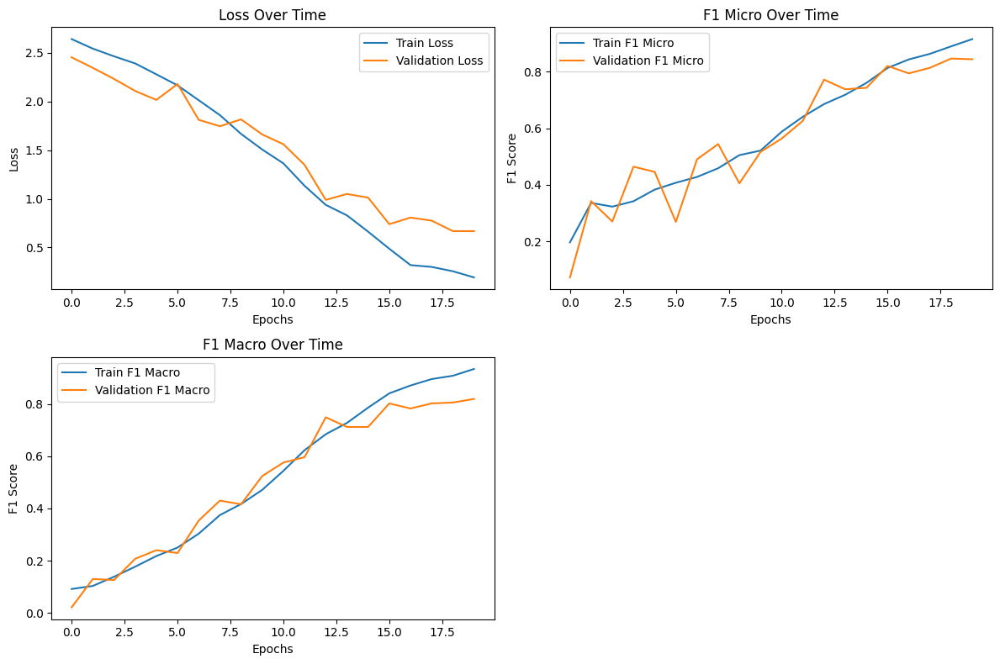

In [ ]:
#вариант не основной (основной выше), 1500-2, LSTM аугментации без флипа, размытие и шум, lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'LSTMWithMobileNet')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)


def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'lstm_with_mobile_net_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithMobileNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

**F1 Micro**

F1 Micro вычисляется на основе глобальных сумм истинных положительных (TP), ложных положительных (FP) и ложных отрицательных (FN) значений по всем классам:

$$
F1_{\text{micro}} = \frac{2 \cdot TP_{\text{micro}}}{2 \cdot TP_{\text{micro}} + FP_{\text{micro}} + FN_{\text{micro}}}
$$

где:
- $TP_{\text{micro}}$ — сумма истинно положительных решений по всем классам,
- $FP_{\text{micro}}$ — сумма ложноположительных решений по всем классам,
- $FN_{\text{micro}}$ — сумма ложноотрицательных решений по всем классам.

**F1 Macro**

F1 Macro вычисляется как среднее арифметическое F1-скоров для каждого класса, без учета пропорции каждого класса:

$$
F1_{\text{macro}} = \frac{1}{N} \sum_{i=1}^{N} \frac{2 \cdot TP_i}{2 \cdot TP_i + FP_i + FN_i}
$$

где:
- $N$ — количество классов,
- $TP_i$ — истинно положительные решения для класса $i$,
- $FP_i$ — ложноположительные решения для класса $i$,
- $FN_i$ — ложноотрицательные решения для класса $i$.

### F1 Micro и F1 Macro

### F1 Micro: 0.8333

F1 Micro, равный 0.8333, указывает на то, что моя модель, в среднем, имеет хорошую балансировку между точностью и полнотой на уровне всех классов вместе взятых. Это означает, что модель в целом хорошо справляется с задачей классификации, правильно идентифицируя большинство положительных случаев по всем классам. В контексте, где важно правильно идентифицировать каждый образец и максимизировать общее количество правильных предсказаний, значение F1 Micro может считаться довольно хорошим.

### F1 Macro: 0.7959

F1 Macro, равный 0.7959, также является сильным показателем, но его следует интерпретировать немного иначе. Это значение указывает на то, что моя модель демонстрирует относительно высокую балансировку между точностью и полнотой в среднем по всем классам, при этом взвешивание каждого класса происходит равномерно, независимо от их размера. Это особенно важно в задачах с дисбалансом классов, так как это означает, что модель не игнорирует меньшие классы в пользу более крупных. Таким образом, значение F1 Macro также можно считать хорошим показателем производительности моей модели, особенно учитывая, что в моем датасете присутствует дисбаланс классов.

##MobileNet + LSTM confusion matrix

In [ ]:
def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

val: 100%|██████████| 96/96 [01:06<00:00,  1.45it/s]


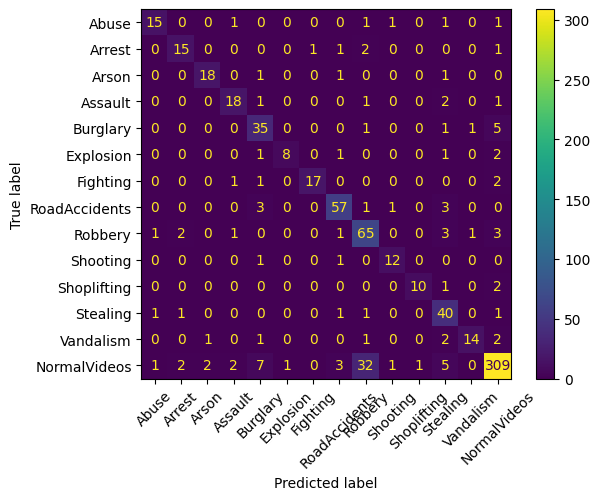

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

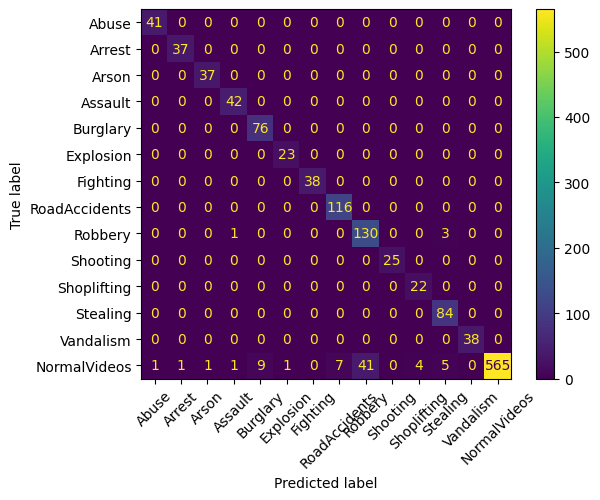

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_train_labels, all_train_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

##MobileNet + LSTM ROC AUC 0.98

In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 96/96 [01:06<00:00,  1.44it/s]


ROC AUC: 0.98


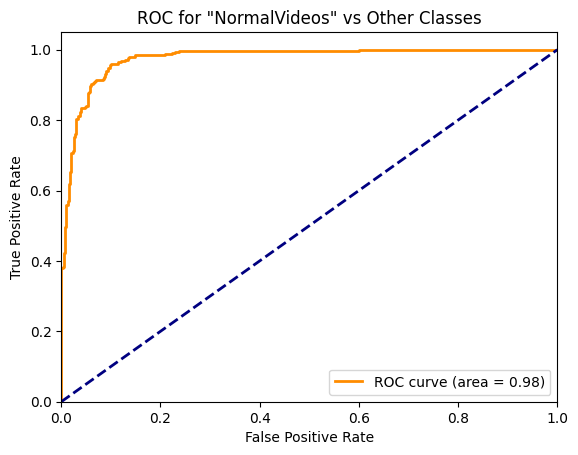

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes')
plt.legend(loc="lower right")
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 145MB/s]


Epoch 1/20
----------


train: 100%|██████████| 131/131 [01:46<00:00,  1.23it/s]


train Loss: 2.6862 F1 Micro: 0.0814 F1 Macro: 0.0493


val: 100%|██████████| 56/56 [00:40<00:00,  1.38it/s]


val Loss: 2.2928 F1 Micro: 0.4072 F1 Macro: 0.0609
Epoch 2/20
----------


train: 100%|██████████| 131/131 [01:43<00:00,  1.27it/s]


train Loss: 2.5441 F1 Micro: 0.2797 F1 Macro: 0.1084


val: 100%|██████████| 56/56 [00:40<00:00,  1.37it/s]


val Loss: 2.4832 F1 Micro: 0.1290 F1 Macro: 0.0455
Epoch 3/20
----------


train: 100%|██████████| 131/131 [01:53<00:00,  1.15it/s]


train Loss: 2.4625 F1 Micro: 0.2883 F1 Macro: 0.1487


val: 100%|██████████| 56/56 [00:40<00:00,  1.39it/s]


val Loss: 2.4133 F1 Micro: 0.2330 F1 Macro: 0.0717
Epoch 4/20
----------


train: 100%|██████████| 131/131 [01:51<00:00,  1.17it/s]


train Loss: 2.3474 F1 Micro: 0.3630 F1 Macro: 0.1821


val: 100%|██████████| 56/56 [00:40<00:00,  1.38it/s]


val Loss: 2.3626 F1 Micro: 0.2489 F1 Macro: 0.1124
Epoch 5/20
----------


train: 100%|██████████| 131/131 [01:51<00:00,  1.18it/s]


train Loss: 2.2662 F1 Micro: 0.3199 F1 Macro: 0.2003


val: 100%|██████████| 56/56 [00:40<00:00,  1.39it/s]


val Loss: 2.5057 F1 Micro: 0.2104 F1 Macro: 0.0928
Epoch 6/20
----------


train: 100%|██████████| 131/131 [01:52<00:00,  1.16it/s]


train Loss: 2.1439 F1 Micro: 0.4013 F1 Macro: 0.2802


val: 100%|██████████| 56/56 [00:41<00:00,  1.36it/s]


val Loss: 2.4375 F1 Micro: 0.1855 F1 Macro: 0.1045
Epoch 7/20
----------


train: 100%|██████████| 131/131 [01:52<00:00,  1.16it/s]


train Loss: 1.9628 F1 Micro: 0.4205 F1 Macro: 0.3125


val: 100%|██████████| 56/56 [00:40<00:00,  1.39it/s]


val Loss: 2.4354 F1 Micro: 0.2059 F1 Macro: 0.1200
Epoch 8/20
----------


train: 100%|██████████| 131/131 [01:53<00:00,  1.16it/s]


train Loss: 1.8178 F1 Micro: 0.4435 F1 Macro: 0.3690


val: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


val Loss: 2.3621 F1 Micro: 0.2805 F1 Macro: 0.1242
Epoch 9/20
----------


train: 100%|██████████| 131/131 [01:52<00:00,  1.16it/s]


train Loss: 1.6457 F1 Micro: 0.5000 F1 Macro: 0.4380


val: 100%|██████████| 56/56 [00:40<00:00,  1.38it/s]


val Loss: 2.1789 F1 Micro: 0.3326 F1 Macro: 0.1516
Epoch 10/20
----------


train: 100%|██████████| 131/131 [01:52<00:00,  1.17it/s]


train Loss: 1.4380 F1 Micro: 0.5383 F1 Macro: 0.4898


val: 100%|██████████| 56/56 [00:40<00:00,  1.39it/s]


val Loss: 2.2579 F1 Micro: 0.3032 F1 Macro: 0.1345
Epoch 11/20
----------


train: 100%|██████████| 131/131 [01:51<00:00,  1.17it/s]


train Loss: 1.3418 F1 Micro: 0.5900 F1 Macro: 0.5730


val: 100%|██████████| 56/56 [00:40<00:00,  1.37it/s]


val Loss: 2.6757 F1 Micro: 0.2172 F1 Macro: 0.1137
Epoch 12/20
----------


train: 100%|██████████| 131/131 [01:53<00:00,  1.16it/s]


train Loss: 1.0971 F1 Micro: 0.6628 F1 Macro: 0.6620


val: 100%|██████████| 56/56 [00:40<00:00,  1.38it/s]


val Loss: 2.2711 F1 Micro: 0.3077 F1 Macro: 0.1468
Epoch 13/20
----------


train: 100%|██████████| 131/131 [01:54<00:00,  1.14it/s]


train Loss: 0.9282 F1 Micro: 0.7079 F1 Macro: 0.7113


val: 100%|██████████| 56/56 [00:40<00:00,  1.38it/s]


val Loss: 2.1552 F1 Micro: 0.3710 F1 Macro: 0.1559
Epoch 14/20
----------


train: 100%|██████████| 131/131 [01:51<00:00,  1.17it/s]


train Loss: 0.7266 F1 Micro: 0.7510 F1 Macro: 0.7609


val: 100%|██████████| 56/56 [00:40<00:00,  1.39it/s]


val Loss: 2.0233 F1 Micro: 0.4118 F1 Macro: 0.1690
Epoch 15/20
----------


train: 100%|██████████| 131/131 [01:51<00:00,  1.17it/s]


train Loss: 0.6338 F1 Micro: 0.7663 F1 Macro: 0.7811


val: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


val Loss: 2.3393 F1 Micro: 0.2986 F1 Macro: 0.1527
Epoch 16/20
----------


train: 100%|██████████| 131/131 [01:54<00:00,  1.15it/s]


train Loss: 0.5253 F1 Micro: 0.8046 F1 Macro: 0.8357


val: 100%|██████████| 56/56 [00:40<00:00,  1.39it/s]


val Loss: 2.2609 F1 Micro: 0.3575 F1 Macro: 0.1453
Epoch 17/20
----------


train: 100%|██████████| 131/131 [01:52<00:00,  1.16it/s]


train Loss: 0.3847 F1 Micro: 0.8420 F1 Macro: 0.8642


val: 100%|██████████| 56/56 [00:40<00:00,  1.38it/s]


val Loss: 2.1480 F1 Micro: 0.3937 F1 Macro: 0.1618
Epoch 18/20
----------


train: 100%|██████████| 131/131 [01:55<00:00,  1.14it/s]


train Loss: 0.2680 F1 Micro: 0.8745 F1 Macro: 0.9013


val: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s]


val Loss: 2.1326 F1 Micro: 0.4118 F1 Macro: 0.1535
Epoch 19/20
----------


train: 100%|██████████| 131/131 [01:55<00:00,  1.14it/s]


train Loss: 0.2227 F1 Micro: 0.9224 F1 Macro: 0.9389


val: 100%|██████████| 56/56 [00:40<00:00,  1.37it/s]


val Loss: 2.2463 F1 Micro: 0.4140 F1 Macro: 0.1836
Epoch 20/20
----------


train: 100%|██████████| 131/131 [01:53<00:00,  1.15it/s]


train Loss: 0.1699 F1 Micro: 0.9052 F1 Macro: 0.9378


val: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s]


val Loss: 2.2543 F1 Micro: 0.4118 F1 Macro: 0.1794


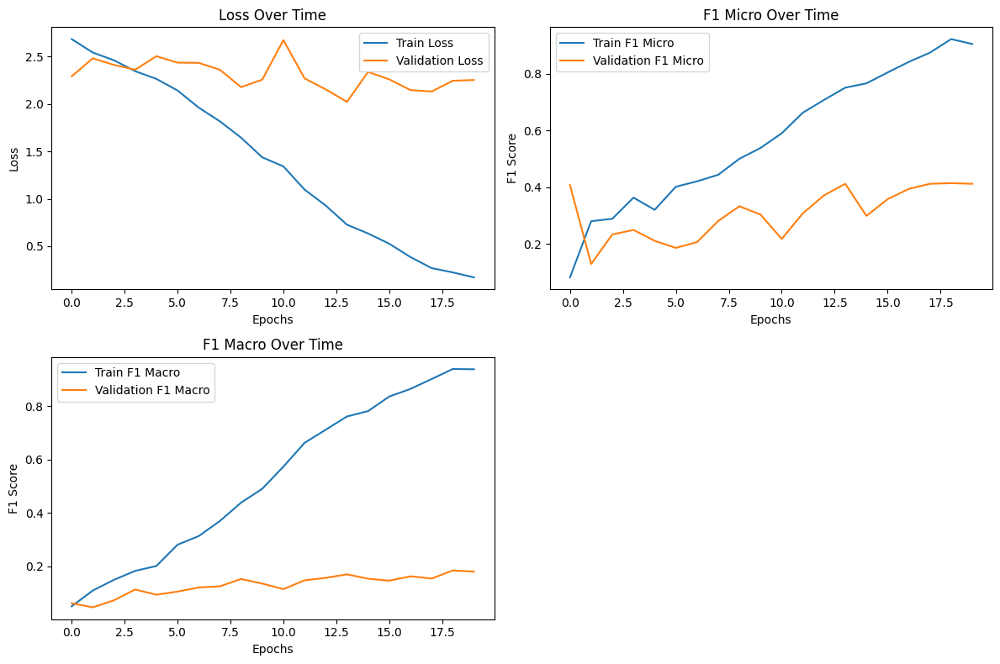

In [ ]:
#LSTM аугментации без флипа, размытие и шум, lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'LSTMWithMobileNet_acc')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)


def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'lstm_with_mobile_net_acc_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithMobileNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 96/96 [01:46<00:00,  1.11s/it]


ROC AUC: 0.97


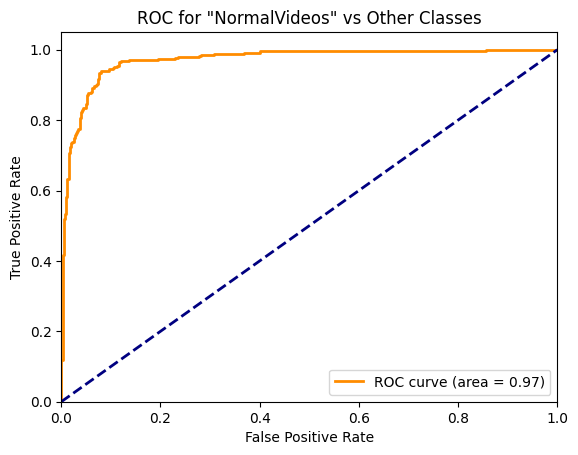

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes')
plt.legend(loc="lower right")
plt.show()

####Изменение порога

In [ ]:
import numpy as np

def calculate_metrics(probs, labels, threshold=0.5):
    preds = (probs > threshold).astype(int)  # Получаем предсказания на основе порога
    accuracy = (preds == labels).mean()  # Вычисляем точность

    # Для FPR нам нужно вычислить FP и TN
    FP = ((preds == 1) & (labels == 0)).sum()
    TN = ((preds == 0) & (labels == 0)).sum()
    FPR = FP / (FP + TN) if (FP + TN) > 0 else 0  # Избегаем деления на ноль

    return accuracy, FPR

# Предположим, что normal_class_probs и binary_labels уже определены
# Пример исходных данных
# normal_class_probs = np.array([0.1, 0.4, 0.35, 0.8])
# binary_labels = np.array([0, 0, 1, 1])

accuracy, FPR = calculate_metrics(normal_class_probs, binary_labels, threshold=0.5)
print(f'FPR: {FPR:.4f}')

for threshold in np.arange(0.1, 1, 0.1):
    accuracy, FPR = calculate_metrics(normal_class_probs, binary_labels, threshold=threshold)
    print(f'FPR with threshold {threshold:.1f}: {FPR:.4f}')


FPR: 0.1026
FPR with threshold 0.1: 0.4658
FPR with threshold 0.2: 0.3034
FPR with threshold 0.3: 0.2051
FPR with threshold 0.4: 0.1410
FPR with threshold 0.5: 0.1026
FPR with threshold 0.6: 0.0427
FPR with threshold 0.7: 0.0256
FPR with threshold 0.8: 0.0085
FPR with threshold 0.9: 0.0043


In [ ]:
def calculate_accuracy(probs, labels, threshold=0.5):
    preds = (probs > threshold).astype(int)  # Получаем предсказания на основе порога
    accuracy = (preds == labels).mean()  # Вычисляем точность
    return accuracy

# Вычисление точности с исходным порогом 0.5
accuracy = calculate_accuracy(normal_class_probs, binary_labels, threshold=0.5)
print(f'Accuracy with threshold 0.5: {accuracy:.4f}')


Accuracy with threshold 0.5: 0.7833


In [ ]:
for threshold in np.arange(0.1, 1, 0.1):
    accuracy = calculate_accuracy(normal_class_probs, binary_labels, threshold=threshold)
    print(f'Accuracy with threshold {threshold:.1f}: {accuracy:.4f}')


Accuracy with threshold 0.1: 0.6682
Accuracy with threshold 0.2: 0.7178
Accuracy with threshold 0.3: 0.7585
Accuracy with threshold 0.4: 0.7652
Accuracy with threshold 0.5: 0.7833
Accuracy with threshold 0.6: 0.7788
Accuracy with threshold 0.7: 0.7494
Accuracy with threshold 0.8: 0.7201
Accuracy with threshold 0.9: 0.6456


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

total_params = count_parameters(model)
print(f"Total trainable parameters: {total_params}")


Total trainable parameters: 11105486


In [ ]:
#FPR = 1 - acc

##Приложение: MobileNet + LSTM - эксперименты с параметрами

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 130/130 [01:39<00:00,  1.30it/s]


train Loss: 2.7140 F1 Micro: 0.1196 F1 Macro: 0.0541


val: 100%|██████████| 57/57 [00:36<00:00,  1.56it/s]


val Loss: 2.3890 F1 Micro: 0.4321 F1 Macro: 0.1036
Epoch 2/20
----------


train: 100%|██████████| 130/130 [01:39<00:00,  1.31it/s]


train Loss: 2.5887 F1 Micro: 0.2517 F1 Macro: 0.0911


val: 100%|██████████| 57/57 [00:36<00:00,  1.56it/s]


val Loss: 2.4084 F1 Micro: 0.2428 F1 Macro: 0.0885
Epoch 3/20
----------


train: 100%|██████████| 130/130 [01:46<00:00,  1.22it/s]


train Loss: 2.5319 F1 Micro: 0.2835 F1 Macro: 0.1224


val: 100%|██████████| 57/57 [00:36<00:00,  1.56it/s]


val Loss: 2.4004 F1 Micro: 0.2316 F1 Macro: 0.0677
Epoch 4/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.23it/s]


train Loss: 2.4746 F1 Micro: 0.3086 F1 Macro: 0.1507


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.2797 F1 Micro: 0.3630 F1 Macro: 0.1000
Epoch 5/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.24it/s]


train Loss: 2.3964 F1 Micro: 0.3732 F1 Macro: 0.1716


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.4346 F1 Micro: 0.1470 F1 Macro: 0.0568
Epoch 6/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.23it/s]


train Loss: 2.3348 F1 Micro: 0.3703 F1 Macro: 0.2038


val: 100%|██████████| 57/57 [00:36<00:00,  1.58it/s]


val Loss: 2.0698 F1 Micro: 0.3898 F1 Macro: 0.0954
Epoch 7/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 2.2511 F1 Micro: 0.3925 F1 Macro: 0.2084


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.3355 F1 Micro: 0.2205 F1 Macro: 0.1027
Epoch 8/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.23it/s]


train Loss: 2.0821 F1 Micro: 0.4041 F1 Macro: 0.2696


val: 100%|██████████| 57/57 [00:36<00:00,  1.58it/s]


val Loss: 2.3238 F1 Micro: 0.2673 F1 Macro: 0.0814
Epoch 9/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.23it/s]


train Loss: 2.0286 F1 Micro: 0.4378 F1 Macro: 0.3110


val: 100%|██████████| 57/57 [00:36<00:00,  1.58it/s]


val Loss: 2.1051 F1 Micro: 0.3474 F1 Macro: 0.1017
Epoch 10/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.23it/s]


train Loss: 1.9417 F1 Micro: 0.4600 F1 Macro: 0.3160


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.3238 F1 Micro: 0.2940 F1 Macro: 0.1318
Epoch 11/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 1.8374 F1 Micro: 0.4831 F1 Macro: 0.3723


val: 100%|██████████| 57/57 [00:36<00:00,  1.56it/s]


val Loss: 2.2393 F1 Micro: 0.2873 F1 Macro: 0.1382
Epoch 12/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 1.7110 F1 Micro: 0.4966 F1 Macro: 0.4028


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.2718 F1 Micro: 0.2851 F1 Macro: 0.1142
Epoch 13/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.23it/s]


train Loss: 1.5990 F1 Micro: 0.5313 F1 Macro: 0.4559


val: 100%|██████████| 57/57 [00:36<00:00,  1.56it/s]


val Loss: 2.0262 F1 Micro: 0.4076 F1 Macro: 0.1566
Epoch 14/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.23it/s]


train Loss: 1.4481 F1 Micro: 0.5873 F1 Macro: 0.5178


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.0266 F1 Micro: 0.3942 F1 Macro: 0.1554
Epoch 15/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 1.3070 F1 Micro: 0.6056 F1 Macro: 0.5513


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.0842 F1 Micro: 0.3987 F1 Macro: 0.1770
Epoch 16/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 1.2074 F1 Micro: 0.6307 F1 Macro: 0.5973


val: 100%|██████████| 57/57 [00:36<00:00,  1.55it/s]


val Loss: 2.1167 F1 Micro: 0.3452 F1 Macro: 0.1550
Epoch 17/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.23it/s]


train Loss: 1.0818 F1 Micro: 0.6500 F1 Macro: 0.6211


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.2049 F1 Micro: 0.3274 F1 Macro: 0.1284
Epoch 18/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.24it/s]


train Loss: 0.9220 F1 Micro: 0.7165 F1 Macro: 0.6883


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.0899 F1 Micro: 0.3987 F1 Macro: 0.1966
Epoch 19/20
----------


train: 100%|██████████| 130/130 [01:45<00:00,  1.24it/s]


train Loss: 0.8156 F1 Micro: 0.7387 F1 Macro: 0.7475


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.0531 F1 Micro: 0.3987 F1 Macro: 0.1511
Epoch 20/20
----------


train: 100%|██████████| 130/130 [01:46<00:00,  1.22it/s]


train Loss: 0.6698 F1 Micro: 0.7686 F1 Macro: 0.7857


val: 100%|██████████| 57/57 [00:37<00:00,  1.52it/s]


val Loss: 2.2253 F1 Micro: 0.3541 F1 Macro: 0.1710


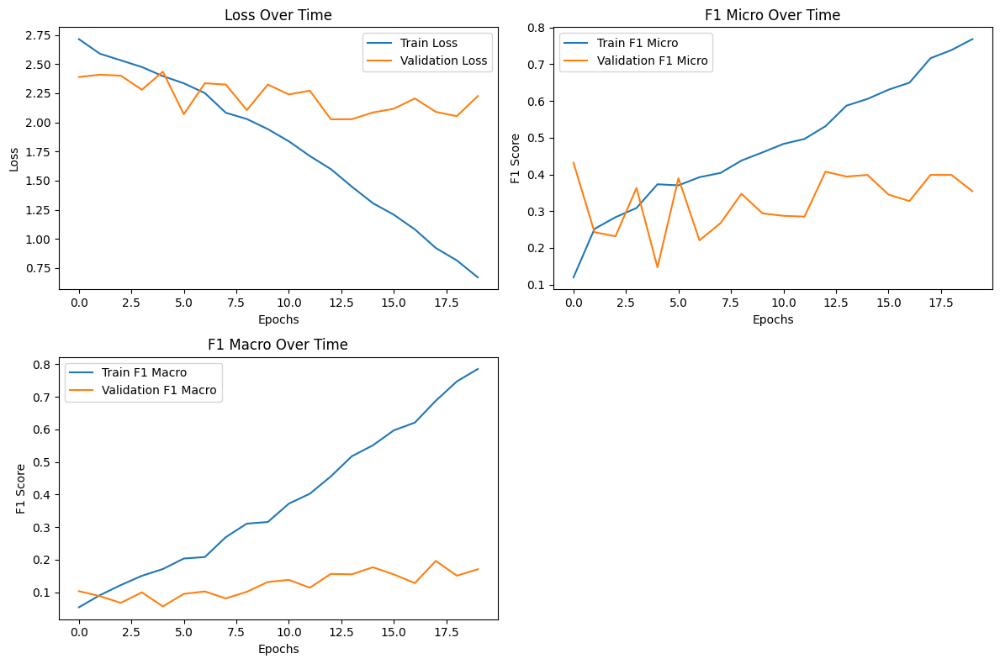

In [ ]:
#lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm



def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithMobileNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

val: 100%|██████████| 57/57 [00:36<00:00,  1.56it/s]


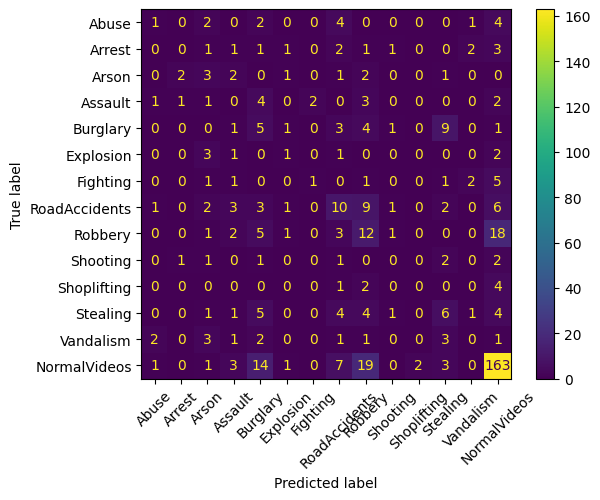

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()


In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 57/57 [00:36<00:00,  1.56it/s]


ROC AUC: 0.83


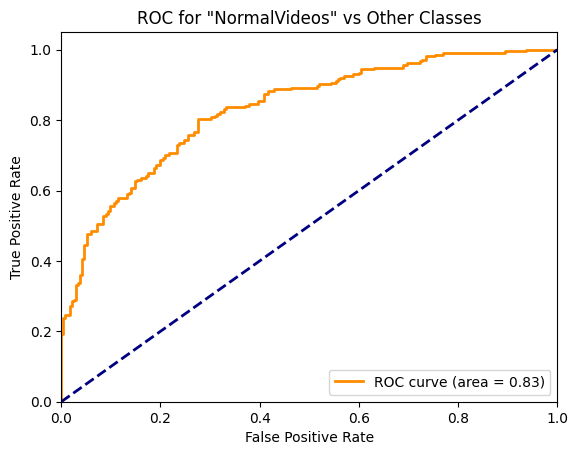

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes')
plt.legend(loc="lower right")
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 152MB/s]


Epoch 1/20
----------


train: 100%|██████████| 130/130 [01:40<00:00,  1.29it/s]


train Loss: 2.7137 F1 Micro: 0.1620 F1 Macro: 0.0674


val: 100%|██████████| 57/57 [00:36<00:00,  1.55it/s]


val Loss: 2.3492 F1 Micro: 0.4209 F1 Macro: 0.0547
Epoch 2/20
----------


train: 100%|██████████| 130/130 [01:38<00:00,  1.32it/s]


train Loss: 2.5936 F1 Micro: 0.2122 F1 Macro: 0.1080


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.5189 F1 Micro: 0.1448 F1 Macro: 0.0588
Epoch 3/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.25it/s]


train Loss: 2.5310 F1 Micro: 0.2671 F1 Macro: 0.1268


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.1886 F1 Micro: 0.4187 F1 Macro: 0.0790
Epoch 4/20
----------


train: 100%|██████████| 130/130 [01:43<00:00,  1.25it/s]


train Loss: 2.4666 F1 Micro: 0.2758 F1 Macro: 0.1538


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.3145 F1 Micro: 0.3808 F1 Macro: 0.1062
Epoch 5/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.25it/s]


train Loss: 2.4080 F1 Micro: 0.3365 F1 Macro: 0.1597


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.1756 F1 Micro: 0.3942 F1 Macro: 0.1355
Epoch 6/20
----------


train: 100%|██████████| 130/130 [01:43<00:00,  1.25it/s]


train Loss: 2.3342 F1 Micro: 0.3828 F1 Macro: 0.2051


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.2845 F1 Micro: 0.2873 F1 Macro: 0.0989
Epoch 7/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 2.2379 F1 Micro: 0.3809 F1 Macro: 0.2228


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.1277 F1 Micro: 0.3786 F1 Macro: 0.1160
Epoch 8/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.25it/s]


train Loss: 2.1086 F1 Micro: 0.3867 F1 Macro: 0.2516


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.3543 F1 Micro: 0.2606 F1 Macro: 0.1157
Epoch 9/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.25it/s]


train Loss: 2.0266 F1 Micro: 0.4446 F1 Macro: 0.3101


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.3599 F1 Micro: 0.2272 F1 Macro: 0.1029
Epoch 10/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 1.8989 F1 Micro: 0.4474 F1 Macro: 0.3366


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.1867 F1 Micro: 0.3051 F1 Macro: 0.1170
Epoch 11/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.25it/s]


train Loss: 1.8458 F1 Micro: 0.4426 F1 Macro: 0.3421


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.1571 F1 Micro: 0.2316 F1 Macro: 0.1079
Epoch 12/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 1.7306 F1 Micro: 0.5005 F1 Macro: 0.4087


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.3311 F1 Micro: 0.2539 F1 Macro: 0.1208
Epoch 13/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.25it/s]


train Loss: 1.5923 F1 Micro: 0.5121 F1 Macro: 0.4449


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.2118 F1 Micro: 0.2873 F1 Macro: 0.1495
Epoch 14/20
----------


train: 100%|██████████| 130/130 [01:43<00:00,  1.25it/s]


train Loss: 1.4940 F1 Micro: 0.5516 F1 Macro: 0.4980


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.1049 F1 Micro: 0.3742 F1 Macro: 0.1737
Epoch 15/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 1.3787 F1 Micro: 0.5988 F1 Macro: 0.5362


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 1.9600 F1 Micro: 0.4276 F1 Macro: 0.1648
Epoch 16/20
----------


train: 100%|██████████| 130/130 [01:43<00:00,  1.25it/s]


train Loss: 1.1868 F1 Micro: 0.6596 F1 Macro: 0.6172


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.0540 F1 Micro: 0.4076 F1 Macro: 0.1805
Epoch 17/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.25it/s]


train Loss: 1.1264 F1 Micro: 0.6683 F1 Macro: 0.6300


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 2.0456 F1 Micro: 0.3853 F1 Macro: 0.1733
Epoch 18/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 0.9507 F1 Micro: 0.7001 F1 Macro: 0.6881


val: 100%|██████████| 57/57 [00:36<00:00,  1.57it/s]


val Loss: 2.0867 F1 Micro: 0.3942 F1 Macro: 0.1726
Epoch 19/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.25it/s]


train Loss: 0.7900 F1 Micro: 0.7213 F1 Macro: 0.7285


val: 100%|██████████| 57/57 [00:35<00:00,  1.59it/s]


val Loss: 2.2722 F1 Micro: 0.3163 F1 Macro: 0.1687
Epoch 20/20
----------


train: 100%|██████████| 130/130 [01:44<00:00,  1.24it/s]


train Loss: 0.7115 F1 Micro: 0.7734 F1 Macro: 0.7820


val: 100%|██████████| 57/57 [00:35<00:00,  1.60it/s]


val Loss: 1.9003 F1 Micro: 0.4521 F1 Macro: 0.1688


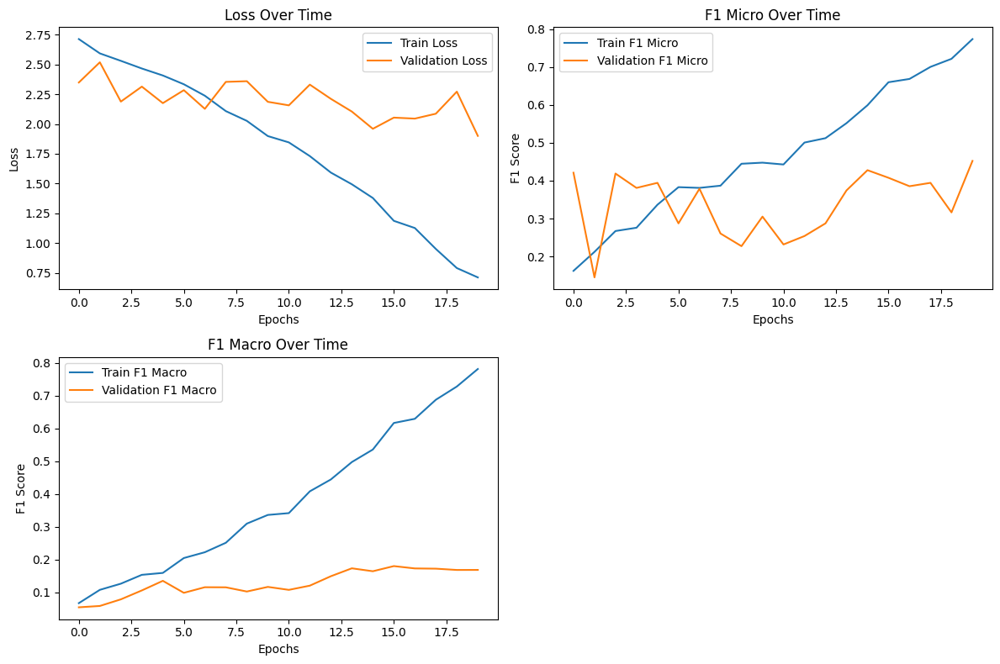

In [ ]:
#lr=0.0001, 20 эпох, батч 8, по идее правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm



def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithMobileNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 132/132 [01:43<00:00,  1.27it/s]


train Loss: 2.7057 F1 Micro: 0.1692 F1 Macro: 0.0660


val: 100%|██████████| 55/55 [00:40<00:00,  1.37it/s]


val Loss: 2.5299 F1 Micro: 0.0576 F1 Macro: 0.0189
Epoch 2/20
----------


train: 100%|██████████| 132/132 [01:40<00:00,  1.31it/s]


train Loss: 2.5925 F1 Micro: 0.2462 F1 Macro: 0.0956


val: 100%|██████████| 55/55 [00:40<00:00,  1.37it/s]


val Loss: 2.5446 F1 Micro: 0.1083 F1 Macro: 0.0590
Epoch 3/20
----------


train: 100%|██████████| 132/132 [01:48<00:00,  1.22it/s]


train Loss: 2.5353 F1 Micro: 0.3175 F1 Macro: 0.1398


val: 100%|██████████| 55/55 [00:38<00:00,  1.42it/s]


val Loss: 2.5025 F1 Micro: 0.1843 F1 Macro: 0.0634
Epoch 4/20
----------


train: 100%|██████████| 132/132 [01:48<00:00,  1.22it/s]


train Loss: 2.4834 F1 Micro: 0.3241 F1 Macro: 0.1342


val: 100%|██████████| 55/55 [00:38<00:00,  1.43it/s]


val Loss: 2.3128 F1 Micro: 0.3341 F1 Macro: 0.0982
Epoch 5/20
----------


train: 100%|██████████| 132/132 [01:47<00:00,  1.23it/s]


train Loss: 2.3964 F1 Micro: 0.4049 F1 Macro: 0.1930


val: 100%|██████████| 55/55 [00:38<00:00,  1.43it/s]


val Loss: 2.2977 F1 Micro: 0.2327 F1 Macro: 0.0665
Epoch 6/20
----------


train: 100%|██████████| 132/132 [01:49<00:00,  1.21it/s]


train Loss: 2.3030 F1 Micro: 0.3821 F1 Macro: 0.1902


val: 100%|██████████| 55/55 [00:38<00:00,  1.42it/s]


val Loss: 2.2862 F1 Micro: 0.3456 F1 Macro: 0.1313
Epoch 7/20
----------


train: 100%|██████████| 132/132 [01:49<00:00,  1.21it/s]


train Loss: 2.2047 F1 Micro: 0.4068 F1 Macro: 0.2372


val: 100%|██████████| 55/55 [00:40<00:00,  1.36it/s]


val Loss: 2.1685 F1 Micro: 0.3710 F1 Macro: 0.1161
Epoch 8/20
----------


train: 100%|██████████| 132/132 [01:49<00:00,  1.20it/s]


train Loss: 2.1508 F1 Micro: 0.4297 F1 Macro: 0.2444


val: 100%|██████████| 55/55 [00:42<00:00,  1.31it/s]


val Loss: 2.0355 F1 Micro: 0.4355 F1 Macro: 0.1640
Epoch 9/20
----------


train: 100%|██████████| 132/132 [01:53<00:00,  1.17it/s]


train Loss: 1.9738 F1 Micro: 0.4544 F1 Macro: 0.3274


val: 100%|██████████| 55/55 [00:40<00:00,  1.35it/s]


val Loss: 2.4388 F1 Micro: 0.2419 F1 Macro: 0.1013
Epoch 10/20
----------


train: 100%|██████████| 132/132 [01:54<00:00,  1.15it/s]


train Loss: 1.9157 F1 Micro: 0.4297 F1 Macro: 0.2976


val: 100%|██████████| 55/55 [00:41<00:00,  1.31it/s]


val Loss: 2.1321 F1 Micro: 0.3917 F1 Macro: 0.1608
Epoch 11/20
----------


train: 100%|██████████| 132/132 [01:52<00:00,  1.17it/s]


train Loss: 1.7580 F1 Micro: 0.4914 F1 Macro: 0.4094


val: 100%|██████████| 55/55 [00:39<00:00,  1.39it/s]


val Loss: 2.0180 F1 Micro: 0.4493 F1 Macro: 0.1896
Epoch 12/20
----------


train: 100%|██████████| 132/132 [01:51<00:00,  1.18it/s]


train Loss: 1.6413 F1 Micro: 0.5257 F1 Macro: 0.4419


val: 100%|██████████| 55/55 [00:41<00:00,  1.34it/s]


val Loss: 2.3281 F1 Micro: 0.2834 F1 Macro: 0.1624
Epoch 13/20
----------


train: 100%|██████████| 132/132 [01:52<00:00,  1.18it/s]


train Loss: 1.5325 F1 Micro: 0.5333 F1 Macro: 0.4573


val: 100%|██████████| 55/55 [00:41<00:00,  1.32it/s]


val Loss: 2.0590 F1 Micro: 0.3940 F1 Macro: 0.1698
Epoch 14/20
----------


train: 100%|██████████| 132/132 [01:49<00:00,  1.20it/s]


train Loss: 1.3772 F1 Micro: 0.5960 F1 Macro: 0.5279


val: 100%|██████████| 55/55 [00:40<00:00,  1.35it/s]


val Loss: 2.2419 F1 Micro: 0.3341 F1 Macro: 0.1625
Epoch 15/20
----------


train: 100%|██████████| 132/132 [01:53<00:00,  1.16it/s]


train Loss: 1.2668 F1 Micro: 0.6293 F1 Macro: 0.5932


val: 100%|██████████| 55/55 [00:40<00:00,  1.36it/s]


val Loss: 2.2128 F1 Micro: 0.3571 F1 Macro: 0.1827
Epoch 16/20
----------


train: 100%|██████████| 132/132 [01:52<00:00,  1.17it/s]


train Loss: 1.1201 F1 Micro: 0.6530 F1 Macro: 0.6169


val: 100%|██████████| 55/55 [00:41<00:00,  1.33it/s]


val Loss: 2.0292 F1 Micro: 0.4378 F1 Macro: 0.1956
Epoch 17/20
----------


train: 100%|██████████| 132/132 [01:53<00:00,  1.16it/s]


train Loss: 0.9425 F1 Micro: 0.6787 F1 Macro: 0.6717


val: 100%|██████████| 55/55 [00:41<00:00,  1.32it/s]


val Loss: 2.2246 F1 Micro: 0.3641 F1 Macro: 0.1630
Epoch 18/20
----------


train: 100%|██████████| 132/132 [01:53<00:00,  1.16it/s]


train Loss: 0.8788 F1 Micro: 0.6911 F1 Macro: 0.6934


val: 100%|██████████| 55/55 [00:40<00:00,  1.35it/s]


val Loss: 2.0994 F1 Micro: 0.4032 F1 Macro: 0.2011
Epoch 19/20
----------


train: 100%|██████████| 132/132 [01:52<00:00,  1.17it/s]


train Loss: 0.7065 F1 Micro: 0.7548 F1 Macro: 0.7495


val: 100%|██████████| 55/55 [00:41<00:00,  1.33it/s]


val Loss: 2.1759 F1 Micro: 0.3917 F1 Macro: 0.1735
Epoch 20/20
----------


train: 100%|██████████| 132/132 [01:52<00:00,  1.18it/s]


train Loss: 0.6078 F1 Micro: 0.7804 F1 Macro: 0.7856


val: 100%|██████████| 55/55 [00:40<00:00,  1.36it/s]


val Loss: 2.2661 F1 Micro: 0.3917 F1 Macro: 0.1897


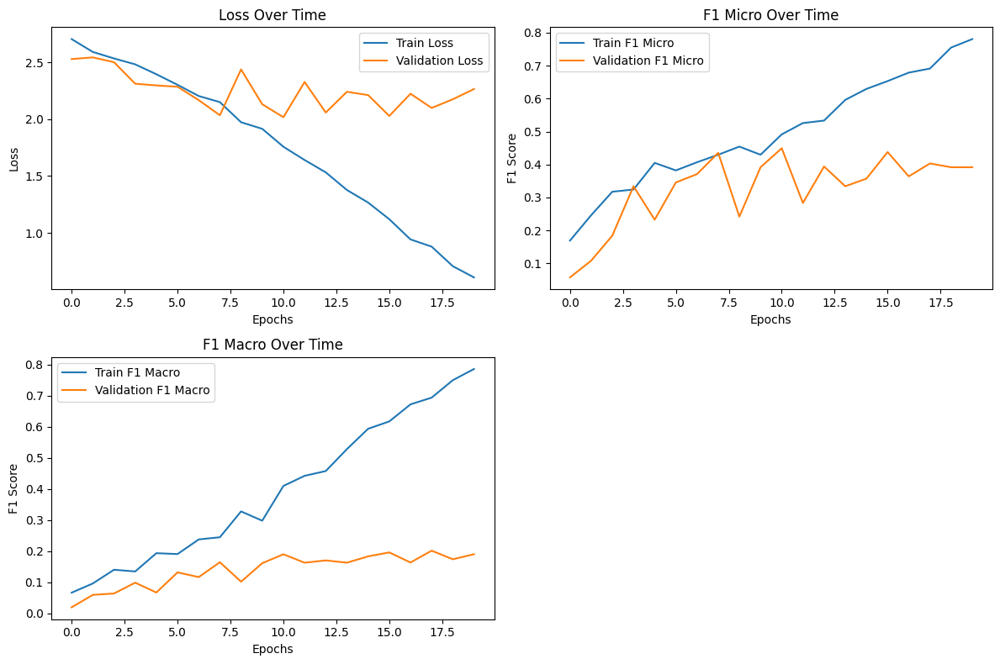

In [ ]:
#lr=0.0001, 20 эпох, батч 8, по идее правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm



def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithMobileNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

Epoch 1/20
----------


train: 100%|██████████| 149/149 [01:56<00:00,  1.28it/s]


train Loss: 2.7139 F1 Micro: 0.1288 F1 Macro: 0.0647


val: 100%|██████████| 38/38 [00:28<00:00,  1.32it/s]


val Loss: 2.6206 F1 Micro: 0.2953 F1 Macro: 0.0696
Epoch 2/20
----------


train: 100%|██████████| 149/149 [01:57<00:00,  1.27it/s]


train Loss: 2.6231 F1 Micro: 0.3199 F1 Macro: 0.0925


val: 100%|██████████| 38/38 [00:28<00:00,  1.32it/s]


val Loss: 2.5758 F1 Micro: 0.3591 F1 Macro: 0.0772
Epoch 3/20
----------


train: 100%|██████████| 149/149 [02:03<00:00,  1.20it/s]


train Loss: 2.5359 F1 Micro: 0.3460 F1 Macro: 0.1370


val: 100%|██████████| 38/38 [00:27<00:00,  1.39it/s]


val Loss: 2.5820 F1 Micro: 0.3221 F1 Macro: 0.0952
Epoch 4/20
----------


train: 100%|██████████| 149/149 [02:01<00:00,  1.23it/s]


train Loss: 2.4689 F1 Micro: 0.3190 F1 Macro: 0.1401


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.4823 F1 Micro: 0.2886 F1 Macro: 0.0976
Epoch 5/20
----------


train: 100%|██████████| 149/149 [02:02<00:00,  1.21it/s]


train Loss: 2.4076 F1 Micro: 0.3510 F1 Macro: 0.1769


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5526 F1 Micro: 0.1510 F1 Macro: 0.0609
Epoch 6/20
----------


train: 100%|██████████| 149/149 [02:04<00:00,  1.20it/s]


train Loss: 2.3090 F1 Micro: 0.3779 F1 Macro: 0.2011


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.4972 F1 Micro: 0.3054 F1 Macro: 0.1228
Epoch 7/20
----------


train: 100%|██████████| 149/149 [02:03<00:00,  1.21it/s]


train Loss: 2.2115 F1 Micro: 0.3956 F1 Macro: 0.2574


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5696 F1 Micro: 0.3221 F1 Macro: 0.1045
Epoch 8/20
----------


train: 100%|██████████| 149/149 [02:04<00:00,  1.20it/s]


train Loss: 2.1633 F1 Micro: 0.3855 F1 Macro: 0.2430


val: 100%|██████████| 38/38 [00:27<00:00,  1.39it/s]


val Loss: 2.4934 F1 Micro: 0.2315 F1 Macro: 0.1465
Epoch 9/20
----------


train: 100%|██████████| 149/149 [02:04<00:00,  1.20it/s]


train Loss: 2.0566 F1 Micro: 0.4158 F1 Macro: 0.2931


val: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]


val Loss: 2.5016 F1 Micro: 0.2215 F1 Macro: 0.1281
Epoch 10/20
----------


train: 100%|██████████| 149/149 [02:02<00:00,  1.22it/s]


train Loss: 1.9952 F1 Micro: 0.4226 F1 Macro: 0.3074


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.4656 F1 Micro: 0.2148 F1 Macro: 0.0948
Epoch 11/20
----------


train: 100%|██████████| 149/149 [02:02<00:00,  1.21it/s]


train Loss: 1.8875 F1 Micro: 0.4562 F1 Macro: 0.3655


val: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]


val Loss: 2.5118 F1 Micro: 0.2886 F1 Macro: 0.1221
Epoch 12/20
----------


train: 100%|██████████| 149/149 [02:02<00:00,  1.22it/s]


train Loss: 1.7981 F1 Micro: 0.4520 F1 Macro: 0.3539


val: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]


val Loss: 2.4346 F1 Micro: 0.3389 F1 Macro: 0.1485
Epoch 13/20
----------


train: 100%|██████████| 149/149 [02:00<00:00,  1.23it/s]


train Loss: 1.6529 F1 Micro: 0.5143 F1 Macro: 0.4359


val: 100%|██████████| 38/38 [00:27<00:00,  1.40it/s]


val Loss: 2.5676 F1 Micro: 0.2483 F1 Macro: 0.1301
Epoch 14/20
----------


train: 100%|██████████| 149/149 [02:01<00:00,  1.23it/s]


train Loss: 1.6022 F1 Micro: 0.4949 F1 Macro: 0.4383


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.4933 F1 Micro: 0.1913 F1 Macro: 0.1377
Epoch 15/20
----------


train: 100%|██████████| 149/149 [02:01<00:00,  1.22it/s]


train Loss: 1.4353 F1 Micro: 0.5715 F1 Macro: 0.5197


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5739 F1 Micro: 0.4262 F1 Macro: 0.1841
Epoch 16/20
----------


train: 100%|██████████| 149/149 [02:02<00:00,  1.22it/s]


train Loss: 1.2926 F1 Micro: 0.5976 F1 Macro: 0.5652


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.6519 F1 Micro: 0.3322 F1 Macro: 0.1641
Epoch 17/20
----------


train: 100%|██████████| 149/149 [02:02<00:00,  1.22it/s]


train Loss: 1.2143 F1 Micro: 0.5791 F1 Macro: 0.5425


val: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]


val Loss: 2.6030 F1 Micro: 0.3523 F1 Macro: 0.1480
Epoch 18/20
----------


train: 100%|██████████| 149/149 [02:07<00:00,  1.17it/s]


train Loss: 1.0737 F1 Micro: 0.6456 F1 Macro: 0.6269


val: 100%|██████████| 38/38 [00:28<00:00,  1.34it/s]


val Loss: 2.7699 F1 Micro: 0.2248 F1 Macro: 0.1039
Epoch 19/20
----------


train: 100%|██████████| 149/149 [02:04<00:00,  1.20it/s]


train Loss: 0.9545 F1 Micro: 0.6852 F1 Macro: 0.6703


val: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]


val Loss: 2.6900 F1 Micro: 0.3255 F1 Macro: 0.1404
Epoch 20/20
----------


train: 100%|██████████| 149/149 [02:03<00:00,  1.20it/s]


train Loss: 0.7958 F1 Micro: 0.7214 F1 Macro: 0.7283


val: 100%|██████████| 38/38 [00:28<00:00,  1.35it/s]


val Loss: 2.8123 F1 Micro: 0.2718 F1 Macro: 0.1414


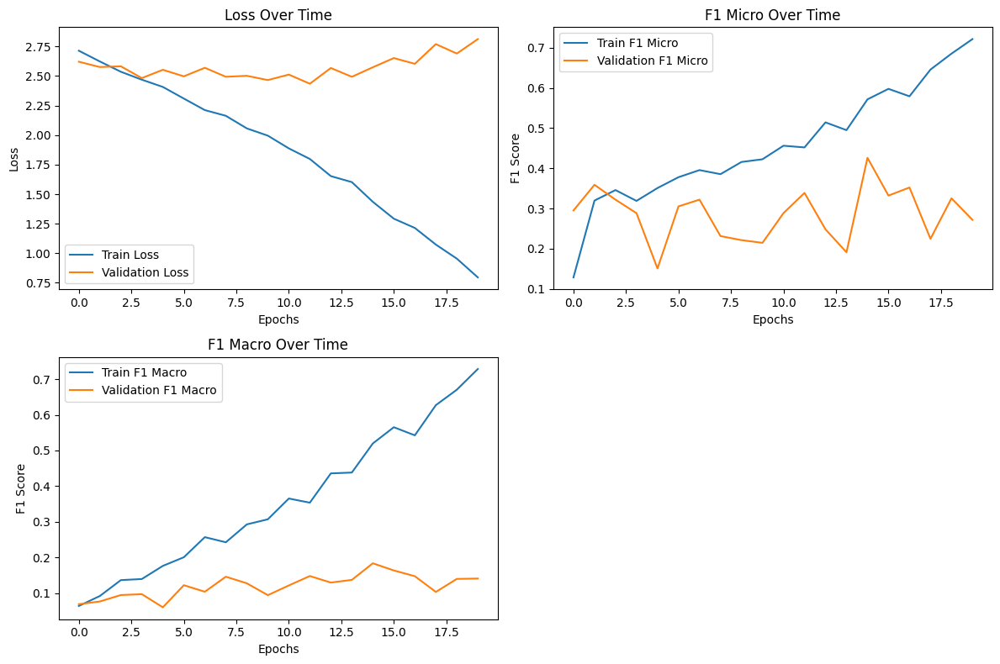

In [ ]:
#lr=0.0001, 20 эпох, батч 8
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm



def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithMobileNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

##Подсчет размерностей на каждом слое и общего количества параметров

In [ ]:
from torchvision import models
from torch.nn.utils.rnn import pack_padded_sequence
class CustomModelWithMobileNet(nn.Module):
    def __init__(self, num_classes, num_lstm_layers=1):
        super(CustomModelWithMobileNet, self).__init__()
        mobilenet_v2 = models.mobilenet_v2(pretrained=True)
        self.num_lstm_layers = num_lstm_layers
        self.features = nn.Sequential(*list(mobilenet_v2.features)[:4])  # Берем только часть слоев для фич
        self.freeze_features = True
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2)

        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()

        self.rnn = nn.LSTM(
            input_size=rnn_input_size,
            hidden_size=rnn_input_size,
            num_layers=self.num_lstm_layers)
        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)
        print(f'After view: {x.size()}')
        x = self.features(x)
        print(f'After features: {x.size()}')
        x = self.maxpool(x)
        print(f'After maxpool: {x.size()}')
        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        print(f'After flatten: {x.size()}')
        x = x.view(batch_size, sequence_length, -1)
        print(f'Before RNN: {x.size()}')

        pad_x = pack_padded_sequence(x, lengths=lengths_tensor, batch_first=True, enforce_sorted=False)
        outputs, (hidden_states, _) = self.rnn(pad_x)

        hidden_states = hidden_states[-1]
        print(f'After LSTM: {hidden_states.size()}')

        probs = self.fc(hidden_states)
        print(f'Final output size: {probs.size()}')

        return probs
model = CustomModelWithMobileNet(num_classes=14, num_lstm_layers=1)

# Создаем тестовый вход
test_input = torch.randn(8, 1500, 3, 64, 64)
lengths_tensor = torch.tensor([1500] * 8)  # Все последовательности имеют длину 1500

# Выполняем тестовый прогон для печати размерностей
model.forward(test_input, lengths_tensor)

# Подсчет параметров
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable_params = total_params - trainable_params

print(f"Total params: {total_params}")
print(f"Trainable params: {trainable_params}")
print(f"Non-trainable params: {non_trainable_params}")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 161MB/s]


After view: torch.Size([12000, 3, 64, 64])
After features: torch.Size([12000, 24, 16, 16])
After maxpool: torch.Size([12000, 24, 7, 7])
After flatten: torch.Size([12000, 1176])
Before RNN: torch.Size([8, 1500, 1176])
After LSTM: torch.Size([8, 1176])
Final output size: torch.Size([8, 14])
Total params: 11105486
Trainable params: 11105486
Non-trainable params: 0


In [ ]:
model = CustomModelWithMobileNet(num_classes=14, num_lstm_layers=1)

# Подсчет параметров
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable_params = total_params - trainable_params

print(f"Total params: {total_params}")
print(f"Trainable params: {trainable_params}")
print(f"Non-trainable params: {non_trainable_params}")

Total params: 11105486
Trainable params: 11105486
Non-trainable params: 0


# Transformer


##Описание модели

Эта нейросеть является гибридной моделью, сочетающей в себе сверточные нейронные сети (CNN) и трансформеры. Она предназначена для анализа последовательностей данных - видео, где важно учитывать как пространственные, так и временные зависимости между данными.

### Компоненты модели:

1. ResNet34 для извлечения признаков: Используются первые слои предобученной сети ResNet34 для извлечения признаков из каждого элемента последовательности (кадра видео). Это обеспечивает мощное представление входных данных на основе иерархии обученных фильтров.

2. MaxPooling следует после слоёв ResNet34 для уменьшения размерности признаковых карт. Это уменьшает количество параметров и упрощает обработку данных на последующих этапах.

3. Трансформерный блок используется для обработки последовательности извлеченных признаков с учетом временных зависимостей. Трансформеры способны улавливать сложные зависимости в данных благодаря механизму внимания, что делает их особенно полезными для анализа последовательностей.

4. Полносвязный слой На выходе используется для классификации полученных признаков в один из 14 классов.

### Процесс работы:

- Входная последовательность преобразуется и обрабатывается через слои ResNet34 и MaxPooling для извлечения признаков.
- Извлеченные признаки подаются в трансформерный блок, который обрабатывает их, учитывая временные зависимости.
- Результаты работы трансформера классифицируются с помощью полносвязного слоя.

### Преимущества модели:

- Гибридный подход сочетает преимущества CNN и трансформеров.
- Эффективное извлечение признаков и анализ последовательностей.
- Подходит для широкого спектра задач, связанных с анализом последовательностей данных.

Модель представляет собой мощный инструмент для анализа видео и других последовательных данных, способный выявлять сложные зависимости и обеспечивать высокую точность классификации.

In [ ]:
import math
import torch
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
from tqdm import tqdm
from sklearn.metrics import f1_score


class PositionalEmbedding(nn.Module):
    def __init__(self, max_seq_len, embed_model_dim):
        super(PositionalEmbedding, self).__init__()
        self.embed_dim = embed_model_dim

        pe = torch.zeros(max_seq_len, self.embed_dim)
        for pos in range(max_seq_len):
            for i in range(0, self.embed_dim, 2):
                pe[pos, i] = math.sin(pos / (10000 ** ((2 * i) / self.embed_dim)))
                pe[pos, i + 1] = math.cos(pos / (10000 ** ((2 * (i + 1)) / self.embed_dim)))
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x * math.sqrt(self.embed_dim)
        seq_len = x.size(1)
        x = x + self.pe[:, :seq_len]
        return x

class MultiHeadAttention(nn.Module):
    def __init__(self, embed_dim=512, n_heads=2):
        super(MultiHeadAttention, self).__init__()

        self.embed_dim = embed_dim
        self.n_heads = n_heads
        self.single_head_dim = int(embed_dim / n_heads)

        self.query_matrix = nn.Linear(self.single_head_dim, self.single_head_dim, bias=False)
        self.key_matrix = nn.Linear(self.single_head_dim, self.single_head_dim, bias=False)
        self.value_matrix = nn.Linear(self.single_head_dim, self.single_head_dim, bias=False)
        self.out = nn.Linear(n_heads * self.single_head_dim, embed_dim)

    def forward(self, key, query, value, mask=None):
        batch_size = key.size(0)
        seq_length = key.size(1)
        seq_length_query = query.size(1)

        key = key.view(batch_size, seq_length, self.n_heads, self.single_head_dim)
        query = query.view(batch_size, seq_length_query, self.n_heads, self.single_head_dim)
        value = value.view(batch_size, seq_length, self.n_heads, self.single_head_dim)

        k = self.key_matrix(key)
        q = self.query_matrix(query)
        v = self.value_matrix(value)

        q = q.transpose(1, 2)
        k = k.transpose(1, 2)
        v = v.transpose(1, 2)

        k_adjusted = k.transpose(-1, -2)
        product = torch.matmul(q, k_adjusted)

        if mask is not None:
            product = product.masked_fill(mask == 0, float("-1e20"))

        product = product / math.sqrt(self.single_head_dim)
        scores = F.softmax(product, dim=-1)
        scores = torch.matmul(scores, v)

        concat = scores.transpose(1, 2).contiguous().view(batch_size, seq_length_query, self.n_heads * self.single_head_dim)
        output = self.out(concat)

        return output

class TransformerBlock(nn.Module):
    def __init__(self, embed_dim, expansion_factor=4, n_heads=8):
        super(TransformerBlock, self).__init__()

        self.attention = MultiHeadAttention(embed_dim, n_heads)

        self.norm1 = nn.LayerNorm(embed_dim)
        self.norm2 = nn.LayerNorm(embed_dim)

        self.feed_forward = nn.Sequential(
            nn.Linear(embed_dim, expansion_factor * embed_dim),
            nn.ReLU(),
            nn.Linear(expansion_factor * embed_dim, embed_dim)
        )

        self.dropout1 = nn.Dropout(0.1)
        self.dropout2 = nn.Dropout(0.1)

    def forward(self, key, query, value, mask):
        attention_out = self.attention(key, query, value, mask=mask)
        attention_residual_out = attention_out + value
        norm1_out = self.dropout1(self.norm1(attention_residual_out))

        feed_fwd_out = self.feed_forward(norm1_out)
        feed_fwd_residual_out = feed_fwd_out + norm1_out
        norm2_out = self.dropout2(self.norm2(feed_fwd_residual_out))

        return norm2_out


class TransformerEncoder(nn.Module):
    def __init__(self, seq_len, embed_dim, num_layers=1, expansion_factor=4, n_heads=8):
        super(TransformerEncoder, self).__init__()

        self.positional_encoder = PositionalEmbedding(seq_len, embed_dim)
        self.layers = nn.ModuleList([TransformerBlock(embed_dim, expansion_factor, n_heads) for _ in range(num_layers)])

    def forward(self, x, mask):
        out = self.positional_encoder(x)
        for layer in self.layers:
            out = layer(out, out, out, mask=mask)
        return out


In [ ]:
class CustomModelWithTransformBlock(nn.Module):
    def __init__(self,
                 num_classes,
                 num_transformer_layers=1,
                 expansion_factor=2,
                 n_heads=2,
                 max_seq_len=1500):
        super(CustomModelWithTransformBlock, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.num_transformer_layers = num_transformer_layers
        self.freeze_features = True
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.freeze_resnet = True  # Флаг для управления заморозкой слоев ResNet34

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.transformer_block = TransformerEncoder(
            seq_len=max_seq_len,
            embed_dim=rnn_input_size,
            num_layers=self.num_transformer_layers,
            expansion_factor=expansion_factor,
            n_heads=n_heads)

        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        # x размером [batch_size, sequence_length, channels, height, width]
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
        x = self.features(x)
        # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']
        x = self.maxpool(x)
        # ? conv 3x3 channels=16 (если не будет получаться так, как есть)
        # ? если не будет получаться, каждый 5 кадр
        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        x = x.view(batch_size, sequence_length, -1)
        """[2, 3, 6] -> [[1, 1, 0, 0, 0, 0],
                         [1, 1, 1, 0, 0, 0],
                         [1, 1, 1, 1, 1, 1]]"""

        # rnn proc
        max_len_val = lengths_tensor.max()
        mask = torch.tensor(
            [
                [[1] * len_val + [0] * (max_len_val - len_val)] * len_val + \
                 [[0] * max_len_val] * (max_len_val - len_val)
                for len_val in lengths_tensor
            ]
        ).unsqueeze(1).to(device)

        out = self.transformer_block(x, mask=mask)
        #print(out.shape)
        probs = self.fc(out[:, 0, :])

        return probs

####ResNet34 + Transformer

Epoch 1/20
----------


train: 100%|██████████| 130/130 [01:17<00:00,  1.67it/s]


train Loss: 3.6962 F1 Micro: 0.1525 F1 Macro: 0.0830


val: 100%|██████████| 57/57 [00:29<00:00,  1.96it/s]


val Loss: 2.3608 F1 Micro: 0.2400 F1 Macro: 0.0675
Epoch 2/20
----------


train: 100%|██████████| 130/130 [01:18<00:00,  1.65it/s]


train Loss: 2.7461 F1 Micro: 0.2847 F1 Macro: 0.1456


val: 100%|██████████| 57/57 [00:28<00:00,  2.00it/s]


val Loss: 2.2308 F1 Micro: 0.3444 F1 Macro: 0.0794
Epoch 3/20
----------


train: 100%|██████████| 130/130 [01:20<00:00,  1.61it/s]


train Loss: 2.5763 F1 Micro: 0.2983 F1 Macro: 0.1956


val: 100%|██████████| 57/57 [00:28<00:00,  1.99it/s]


val Loss: 2.6188 F1 Micro: 0.1867 F1 Macro: 0.0822
Epoch 4/20
----------


train: 100%|██████████| 130/130 [01:20<00:00,  1.62it/s]


train Loss: 2.2952 F1 Micro: 0.3504 F1 Macro: 0.2425


val: 100%|██████████| 57/57 [00:29<00:00,  1.95it/s]


val Loss: 2.8440 F1 Micro: 0.1244 F1 Macro: 0.0461
Epoch 5/20
----------


train: 100%|██████████| 130/130 [01:18<00:00,  1.65it/s]


train Loss: 2.4507 F1 Micro: 0.3079 F1 Macro: 0.2045


val: 100%|██████████| 57/57 [00:27<00:00,  2.05it/s]


val Loss: 2.4381 F1 Micro: 0.3489 F1 Macro: 0.0900
Epoch 6/20
----------


train: 100%|██████████| 130/130 [01:19<00:00,  1.64it/s]


train Loss: 2.1704 F1 Micro: 0.3764 F1 Macro: 0.2847


val: 100%|██████████| 57/57 [00:29<00:00,  1.92it/s]


val Loss: 3.0702 F1 Micro: 0.1533 F1 Macro: 0.0823
Epoch 7/20
----------


train: 100%|██████████| 130/130 [01:20<00:00,  1.62it/s]


train Loss: 1.7360 F1 Micro: 0.4653 F1 Macro: 0.3791


val: 100%|██████████| 57/57 [00:28<00:00,  2.01it/s]


val Loss: 2.6242 F1 Micro: 0.2756 F1 Macro: 0.1025
Epoch 8/20
----------


train: 100%|██████████| 130/130 [01:19<00:00,  1.64it/s]


train Loss: 1.3614 F1 Micro: 0.5521 F1 Macro: 0.4909


val: 100%|██████████| 57/57 [00:28<00:00,  2.00it/s]


val Loss: 3.0612 F1 Micro: 0.2022 F1 Macro: 0.0969
Epoch 9/20
----------


train: 100%|██████████| 130/130 [01:21<00:00,  1.60it/s]


train Loss: 1.2672 F1 Micro: 0.6033 F1 Macro: 0.5369


val: 100%|██████████| 57/57 [00:28<00:00,  2.01it/s]


val Loss: 2.7062 F1 Micro: 0.3022 F1 Macro: 0.1277
Epoch 10/20
----------


train: 100%|██████████| 130/130 [01:18<00:00,  1.66it/s]


train Loss: 1.0065 F1 Micro: 0.5985 F1 Macro: 0.5773


val: 100%|██████████| 57/57 [00:27<00:00,  2.05it/s]


val Loss: 3.1785 F1 Micro: 0.2911 F1 Macro: 0.1300
Epoch 11/20
----------


train: 100%|██████████| 130/130 [01:21<00:00,  1.60it/s]


train Loss: 0.9509 F1 Micro: 0.6496 F1 Macro: 0.5849


val: 100%|██████████| 57/57 [00:28<00:00,  1.99it/s]


val Loss: 3.0249 F1 Micro: 0.3933 F1 Macro: 0.1681
Epoch 12/20
----------


train: 100%|██████████| 130/130 [01:19<00:00,  1.64it/s]


train Loss: 0.7480 F1 Micro: 0.7037 F1 Macro: 0.6659


val: 100%|██████████| 57/57 [00:27<00:00,  2.04it/s]


val Loss: 3.8064 F1 Micro: 0.2000 F1 Macro: 0.1225
Epoch 13/20
----------


train: 100%|██████████| 130/130 [01:19<00:00,  1.64it/s]


train Loss: 0.7548 F1 Micro: 0.7153 F1 Macro: 0.6851


val: 100%|██████████| 57/57 [00:28<00:00,  2.03it/s]


val Loss: 3.2417 F1 Micro: 0.3000 F1 Macro: 0.1219
Epoch 14/20
----------


train: 100%|██████████| 130/130 [01:20<00:00,  1.61it/s]


train Loss: 0.5124 F1 Micro: 0.7963 F1 Macro: 0.7680


val: 100%|██████████| 57/57 [00:28<00:00,  2.02it/s]


val Loss: 3.0963 F1 Micro: 0.3867 F1 Macro: 0.1506
Epoch 15/20
----------


train: 100%|██████████| 130/130 [01:20<00:00,  1.61it/s]


train Loss: 0.4421 F1 Micro: 0.8108 F1 Macro: 0.7834


val: 100%|██████████| 57/57 [00:28<00:00,  2.02it/s]


val Loss: 3.6657 F1 Micro: 0.3911 F1 Macro: 0.1655
Epoch 16/20
----------


train: 100%|██████████| 130/130 [01:18<00:00,  1.65it/s]


train Loss: 0.3741 F1 Micro: 0.8166 F1 Macro: 0.8201


val: 100%|██████████| 57/57 [00:27<00:00,  2.05it/s]


val Loss: 3.1559 F1 Micro: 0.4444 F1 Macro: 0.1612
Epoch 17/20
----------


train: 100%|██████████| 130/130 [01:20<00:00,  1.62it/s]


train Loss: 0.2836 F1 Micro: 0.8658 F1 Macro: 0.8611


val: 100%|██████████| 57/57 [00:28<00:00,  2.00it/s]


val Loss: 3.2922 F1 Micro: 0.4333 F1 Macro: 0.1636
Epoch 18/20
----------


train: 100%|██████████| 130/130 [01:20<00:00,  1.62it/s]


train Loss: 0.3203 F1 Micro: 0.8716 F1 Macro: 0.8517


val: 100%|██████████| 57/57 [00:27<00:00,  2.04it/s]


val Loss: 5.3696 F1 Micro: 0.2333 F1 Macro: 0.0870
Epoch 19/20
----------


train: 100%|██████████| 130/130 [01:18<00:00,  1.66it/s]


train Loss: 0.4529 F1 Micro: 0.8378 F1 Macro: 0.8037


val: 100%|██████████| 57/57 [00:27<00:00,  2.05it/s]


val Loss: 4.3837 F1 Micro: 0.3778 F1 Macro: 0.1010
Epoch 20/20
----------


train: 100%|██████████| 130/130 [01:18<00:00,  1.66it/s]


train Loss: 0.4501 F1 Micro: 0.8456 F1 Macro: 0.8251


val: 100%|██████████| 57/57 [00:27<00:00,  2.05it/s]


val Loss: 4.6639 F1 Micro: 0.4978 F1 Macro: 0.1260


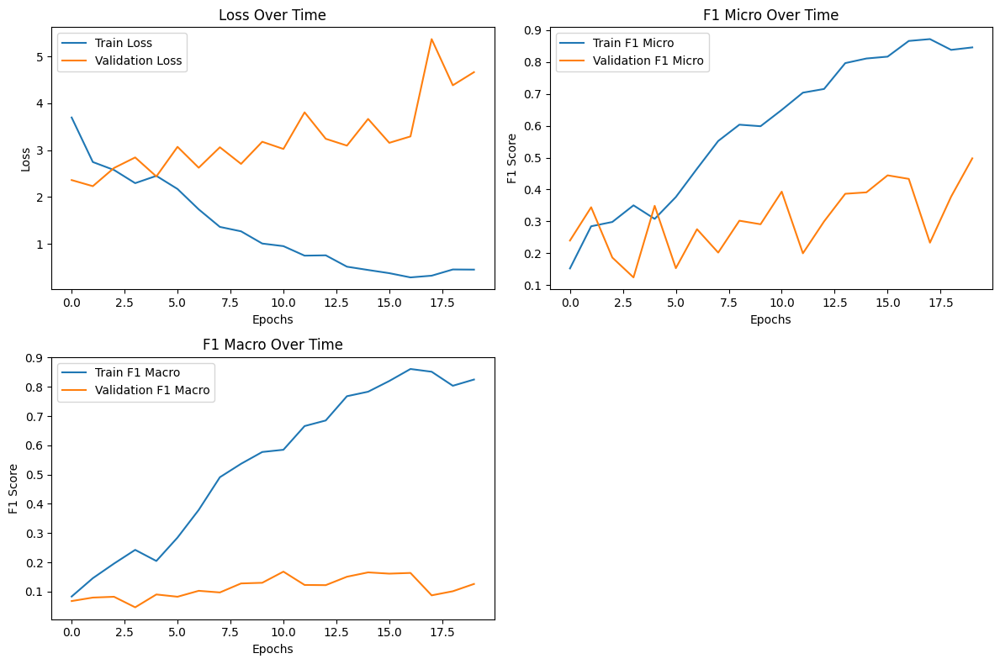

In [ ]:
#трансформер, вообще без аугментаций , #lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import torch.nn.functional as F

# Определение устройства для вычислений
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'transformerWithMobileNet')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, min_lr=10**(-7))

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            if phase == 'val':
              scheduler.step(epoch_loss)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f} LR: {scheduler.get_last_lr():.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'transformer_with_mobile_net_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithTransformBlock(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

####ResNet34 + Transformer confusion matrix

In [ ]:
def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

val: 100%|██████████| 57/57 [00:28<00:00,  2.00it/s]


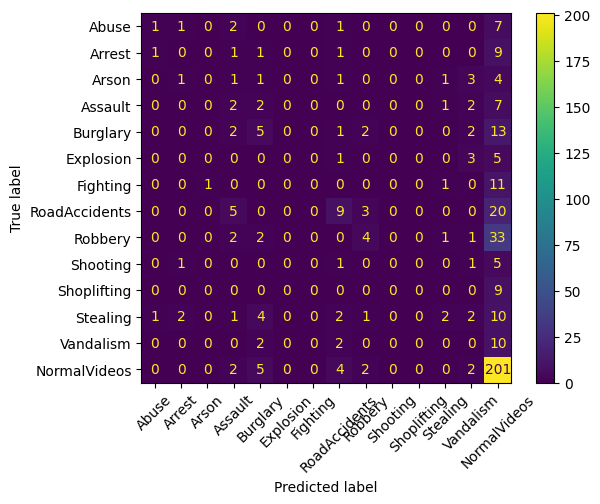

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

####ResNet + Transformer ROC AUC 0.80



In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 57/57 [00:28<00:00,  2.01it/s]


ROC AUC: 0.80


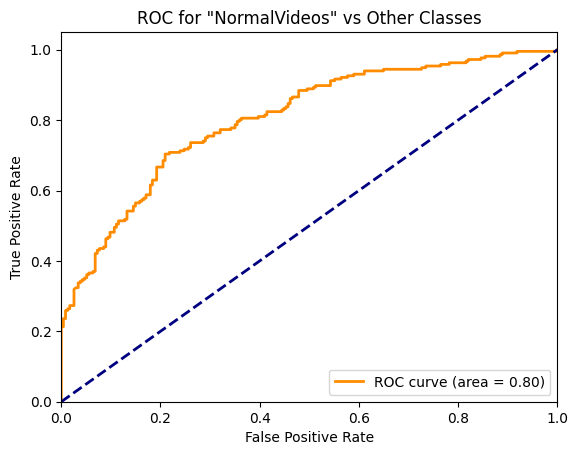

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes')
plt.legend(loc="lower right")
plt.show()

##Подсчет размерностей на каждом слое и общего количества параметров ResNet34 и MobileNetv2

In [ ]:
import math
import torch
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
from tqdm import tqdm
from sklearn.metrics import f1_score
import torch.nn.functional as F


class PositionalEmbedding(nn.Module):
    def __init__(self, max_seq_len, embed_model_dim):
        super(PositionalEmbedding, self).__init__()
        self.embed_dim = embed_model_dim

        pe = torch.zeros(max_seq_len, self.embed_dim)
        for pos in range(max_seq_len):
            for i in range(0, self.embed_dim, 2):
                pe[pos, i] = math.sin(pos / (10000 ** ((2 * i) / self.embed_dim)))
                pe[pos, i + 1] = math.cos(pos / (10000 ** ((2 * (i + 1)) / self.embed_dim)))
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x * math.sqrt(self.embed_dim)
        seq_len = x.size(1)
        x = x + self.pe[:, :seq_len]
        return x

class MultiHeadAttention(nn.Module):
    def __init__(self, embed_dim=512, n_heads=2):
        super(MultiHeadAttention, self).__init__()

        self.embed_dim = embed_dim
        self.n_heads = n_heads
        self.single_head_dim = int(embed_dim / n_heads)

        self.query_matrix = nn.Linear(self.single_head_dim, self.single_head_dim, bias=False)
        self.key_matrix = nn.Linear(self.single_head_dim, self.single_head_dim, bias=False)
        self.value_matrix = nn.Linear(self.single_head_dim, self.single_head_dim, bias=False)
        self.out = nn.Linear(n_heads * self.single_head_dim, embed_dim)

    def forward(self, key, query, value, mask=None):
        batch_size = key.size(0)
        seq_length = key.size(1)
        seq_length_query = query.size(1)

        key = key.view(batch_size, seq_length, self.n_heads, self.single_head_dim)
        query = query.view(batch_size, seq_length_query, self.n_heads, self.single_head_dim)
        value = value.view(batch_size, seq_length, self.n_heads, self.single_head_dim)

        k = self.key_matrix(key)
        q = self.query_matrix(query)
        v = self.value_matrix(value)

        q = q.transpose(1, 2)
        k = k.transpose(1, 2)
        v = v.transpose(1, 2)

        k_adjusted = k.transpose(-1, -2)
        product = torch.matmul(q, k_adjusted)

        if mask is not None:
            # Расширяем маску для каждой головы внимания
            mask = mask.unsqueeze(1)  # Добавляем измерение для голов
            # mask должна иметь размер [batch_size, 1, seq_length_query, seq_length]
            mask = mask.expand(batch_size, self.n_heads, seq_length_query, seq_length)

            product = product.masked_fill(mask == 0, float("-inf"))  # Используем "-inf" для лучшей совместимости с softmax

        product = product / math.sqrt(self.single_head_dim)
        scores = F.softmax(product, dim=-1)
        scores = torch.matmul(scores, v)

        concat = scores.transpose(1, 2).contiguous().view(batch_size, seq_length_query, self.n_heads * self.single_head_dim)
        output = self.out(concat)

        return output

class TransformerBlock(nn.Module):
    def __init__(self, embed_dim, expansion_factor=4, n_heads=8):
        super(TransformerBlock, self).__init__()

        self.attention = MultiHeadAttention(embed_dim, n_heads)

        self.norm1 = nn.LayerNorm(embed_dim)
        self.norm2 = nn.LayerNorm(embed_dim)

        self.feed_forward = nn.Sequential(
            nn.Linear(embed_dim, expansion_factor * embed_dim),
            nn.ReLU(),
            nn.Linear(expansion_factor * embed_dim, embed_dim)
        )

        self.dropout1 = nn.Dropout(0.1)
        self.dropout2 = nn.Dropout(0.1)

    def forward(self, key, query, value, mask):
        attention_out = self.attention(key, query, value, mask=mask)
        attention_residual_out = attention_out + value
        norm1_out = self.dropout1(self.norm1(attention_residual_out))

        feed_fwd_out = self.feed_forward(norm1_out)
        feed_fwd_residual_out = feed_fwd_out + norm1_out
        norm2_out = self.dropout2(self.norm2(feed_fwd_residual_out))

        return norm2_out


class TransformerEncoder(nn.Module):
    def __init__(self, seq_len, embed_dim, num_layers=1, expansion_factor=4, n_heads=8):
        super(TransformerEncoder, self).__init__()

        self.positional_encoder = PositionalEmbedding(seq_len, embed_dim)
        self.layers = nn.ModuleList([TransformerBlock(embed_dim, expansion_factor, n_heads) for _ in range(num_layers)])

    def forward(self, x, mask):
        out = self.positional_encoder(x)
        for layer in self.layers:
            out = layer(out, out, out, mask=mask)
        return out


In [ ]:
class CustomModelWithTransformBlock(nn.Module):
    def __init__(self,
                 num_classes,
                 num_transformer_layers=1,
                 expansion_factor=2,
                 n_heads=2,
                 max_seq_len=1500):
        super(CustomModelWithTransformBlock, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.num_transformer_layers = num_transformer_layers
        self.freeze_features = True
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.freeze_resnet = True  # Флаг для управления заморозкой слоев ResNet34

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.transformer_block = TransformerEncoder(
            seq_len=max_seq_len,
            embed_dim=rnn_input_size,
            num_layers=self.num_transformer_layers,
            expansion_factor=expansion_factor,
            n_heads=n_heads)

        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        # Убедимся, что lengths_tensor и x находятся на одном устройстве
        device = x.device

        batch_size, sequence_length, C, H, W = x.size()
        print(f'Input size: {x.size()}')

        x = x.view(batch_size * sequence_length, 3, H, W)
        print(f'After view (reshaped for features): {x.size()}')

        x = self.features(x)
        print(f'After features: {x.size()}')

        x = self.maxpool(x)
        print(f'After maxpool: {x.size()}')

        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        print(f'After flatten: {x.size()}')

        x = x.view(batch_size, sequence_length, -1)
        print(f'Before transformer: {x.size()}')

        # Проверка на наличие lengths_tensor и создание маски
        if lengths_tensor is not None:
            max_len_val = lengths_tensor.max().item()
            mask = (torch.arange(max_len_val).expand(len(lengths_tensor), max_len_val) < lengths_tensor.unsqueeze(1)).to(device)
            mask = mask.unsqueeze(1)  # Добавляем измерение для совместимости с ожиданиями MultiHeadAttention
            print(f'Mask shape: {mask.shape}')
        else:
            mask = None

        out = self.transformer_block(x, mask=mask)
        print(f'After transformer block: {out.size()}')

        probs = self.fc(out[:, 0, :])  # Берем выход только для первого токена
        print(f'Final output size: {probs.size()}')

        return probs

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Создаем экземпляр модели ResNet34
model = CustomModelWithTransformBlock(num_classes=14, num_transformer_layers=1, expansion_factor=2, n_heads=2, max_seq_len=1500)

# Подготавливаем тестовый вход
test_input = torch.randn(8, 1500, 3, 64, 64)
lengths_tensor = torch.tensor([1500] * 8)

# Выполняем тестовый прогон
model.forward(test_input, lengths_tensor)

# Подсчет параметров модели
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable_params = total_params - trainable_params

print(f'Total params: {total_params}')
print(f'Trainable params: {trainable_params}')
print(f'Non-trainable params: {non_trainable_params}')

Input size: torch.Size([8, 1500, 3, 64, 64])
After view (reshaped for features): torch.Size([12000, 3, 64, 64])
After features: torch.Size([12000, 64, 16, 16])
After maxpool: torch.Size([12000, 64, 8, 8])
After flatten: torch.Size([12000, 4096])
Before transformer: torch.Size([8, 1500, 4096])
Mask shape: torch.Size([8, 1, 1500])
After transformer block: torch.Size([8, 1500, 4096])
Final output size: torch.Size([8, 14])
Total params: 96568654
Trainable params: 96568654
Non-trainable params: 0


In [ ]:
#Параметры РезНет и Трансформер блок
model = CustomModelWithTransformBlock(num_classes=14)

# Подсчет параметров
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable_params = total_params - trainable_params

print(f"Total params: {total_params}")
print(f"Trainable params: {trainable_params}")
print(f"Non-trainable params: {non_trainable_params}")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Total params: 96568654
Trainable params: 96568654
Non-trainable params: 0


In [ ]:
#MobileNetV2
import torch
import torch.nn as nn
from torchvision import models

class CustomModelWithTransformBlock(nn.Module):
    def __init__(self, num_classes, num_transformer_layers=1, expansion_factor=2, n_heads=2, max_seq_len=1500):
        super(CustomModelWithTransformBlock, self).__init__()

        mobilenet_v2 = models.mobilenet_v2(pretrained=True)
        self.num_transformer_layers = num_transformer_layers
        self.freeze_features = True
        # Используем первые несколько слоев MobileNetV2
        self.features = nn.Sequential(*list(mobilenet_v2.features)[:4])
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.freeze_resnet = True  # Можно переименовать переменную в freeze_mobilenet для ясности

        # Вычисляем размер входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.transformer_block = TransformerEncoder(
            seq_len=max_seq_len,
            embed_dim=rnn_input_size,
            num_layers=self.num_transformer_layers,
            expansion_factor=expansion_factor,
            n_heads=n_heads)

        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        # Убедимся, что lengths_tensor и x находятся на одном устройстве
        device = x.device

        batch_size, sequence_length, C, H, W = x.size()
        print(f'Input size: {x.size()}')

        x = x.view(batch_size * sequence_length, 3, H, W)
        print(f'After view (reshaped for features): {x.size()}')

        x = self.features(x)
        print(f'After features: {x.size()}')

        x = self.maxpool(x)
        print(f'After maxpool: {x.size()}')

        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        print(f'After flatten: {x.size()}')

        x = x.view(batch_size, sequence_length, -1)
        print(f'Before transformer: {x.size()}')

        # Проверка на наличие lengths_tensor и создание маски
        if lengths_tensor is not None:
            max_len_val = lengths_tensor.max().item()
            mask = (torch.arange(max_len_val).expand(len(lengths_tensor), max_len_val) < lengths_tensor.unsqueeze(1)).to(device)
            mask = mask.unsqueeze(1)  # Добавляем измерение для совместимости с ожиданиями MultiHeadAttention
            print(f'Mask shape: {mask.shape}')
        else:
            mask = None

        out = self.transformer_block(x, mask=mask)
        print(f'After transformer block: {out.size()}')

        probs = self.fc(out[:, 0, :])  # Берем выход только для первого токена
        print(f'Final output size: {probs.size()}')

        return probs


In [ ]:
#MobileNetV2
model = CustomModelWithTransformBlock(num_classes=14, num_transformer_layers=1, expansion_factor=2, n_heads=2, max_seq_len=1500)

# Подготавливаем тестовый вход
test_input = torch.randn(8, 1500, 3, 64, 64)
lengths_tensor = torch.tensor([1500] * 8)

# Выполняем тестовый прогон
model.forward(test_input, lengths_tensor)

# Подсчет параметров модели
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable_params = total_params - trainable_params

print(f'Total params: {total_params}')
print(f'Trainable params: {trainable_params}')
print(f'Non-trainable params: {non_trainable_params}')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Input size: torch.Size([8, 1500, 3, 64, 64])
After view (reshaped for features): torch.Size([12000, 3, 64, 64])
After features: torch.Size([12000, 24, 16, 16])
After maxpool: torch.Size([12000, 24, 8, 8])
After flatten: torch.Size([12000, 1536])
Before transformer: torch.Size([8, 1500, 1536])
Mask shape: torch.Size([8, 1, 1500])
After transformer block: torch.Size([8, 1500, 1536])
Final output size: torch.Size([8, 14])
Total params: 13615550
Trainable params: 13615550
Non-trainable params: 0


In [ ]:
#Параметры Мобайлнет и Трансформер блок
model = CustomModelWithTransformBlock(num_classes=14)

# Подсчет параметров
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable_params = total_params - trainable_params

print(f"Total params: {total_params}")
print(f"Trainable params: {trainable_params}")
print(f"Non-trainable params: {non_trainable_params}")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Total params: 13615550
Trainable params: 13615550
Non-trainable params: 0


In [ ]:
import torch
from torchvision import models
from torchsummary import summary

# Создаем экземпляр модели ResNet34
resnet34 = models.resnet34(pretrained=True)
resnet34.eval()  # Переводим модель в режим оценки

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
import torch
model = torch.hub.load('pytorch/vision:v0.10.0', 'mobilenet_v2', pretrained=True)
model.eval()


Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 221MB/s]


MobileNetV2(
  (features): Sequential(
    (0): ConvBNActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): ConvBNActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): ConvBNActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=1e-05, momen

##Трансформер с аугментациями (размытием и шумом)

In [ ]:
#MobileNet

In [ ]:
import torch
import torch.nn as nn
from torchvision import models
from torch.nn.utils.rnn import pack_padded_sequence

class CustomModelWithTransformBlock(nn.Module):
    def __init__(self,
                 num_classes,
                 num_transformer_layers=1,
                 expansion_factor=2,
                 n_heads=2,
                 max_seq_len=1500):
        super(CustomModelWithTransformBlock, self).__init__()

        # Загружаем предобученную модель MobileNetV2
        mobilenet_v2 = models.mobilenet_v2(pretrained=True)
        self.num_transformer_layers = num_transformer_layers
        self.features = nn.Sequential(*list(mobilenet_v2.features)[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.freeze_features = True  # Флаг для управления заморозкой слоев MobileNetV2

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре после обработки

        # Определение блока трансформера
        self.transformer_block = TransformerEncoder(
            seq_len=max_seq_len,
            embed_dim=rnn_input_size,
            num_layers=num_transformer_layers,
            expansion_factor=expansion_factor,
            n_heads=n_heads)

        # Определение полносвязного слоя для классификации
        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        batch_size, sequence_length, C, H, W = x.size()
        x = x.view(batch_size * sequence_length, 3, H, W)
        x = self.features(x)
        x = self.maxpool(x)

        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        x = x.view(batch_size, sequence_length, -1)

        # Препроцессинг для трансформера
        if lengths_tensor is not None:
            max_len_val = lengths_tensor.max().item()
            mask = torch.tensor(
                [
                    [[1] * len_val + [0] * (max_len_val - len_val)] * len_val + \
                    [[0] * max_len_val] * (max_len_val - len_val)
                    for len_val in lengths_tensor
                ]
            ).unsqueeze(1).to(x.device)
            out = self.transformer_block(x, mask=mask)
        else:
            out = self.transformer_block(x)

        probs = self.fc(out[:, 0, :])
        return probs


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 169/169 [02:25<00:00,  1.16it/s]


train Loss: 3.5143 F1 Micro: 0.1616 F1 Macro: 0.0857


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 2.0030 F1 Micro: 0.4016 F1 Macro: 0.0729
Epoch 2/20
----------


train: 100%|██████████| 169/169 [02:28<00:00,  1.14it/s]


train Loss: 2.7424 F1 Micro: 0.2513 F1 Macro: 0.1405


val: 100%|██████████| 96/96 [01:14<00:00,  1.28it/s]


val Loss: 2.3660 F1 Micro: 0.1273 F1 Macro: 0.0771
Epoch 3/20
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.12it/s]


train Loss: 2.6798 F1 Micro: 0.2595 F1 Macro: 0.1475


val: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


val Loss: 2.0986 F1 Micro: 0.3806 F1 Macro: 0.1524
Epoch 4/20
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.12it/s]


train Loss: 2.4571 F1 Micro: 0.3113 F1 Macro: 0.1893


val: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


val Loss: 2.7157 F1 Micro: 0.1654 F1 Macro: 0.1433
Epoch 5/20
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.12it/s]


train Loss: 2.2543 F1 Micro: 0.3373 F1 Macro: 0.2245


val: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


val Loss: 1.9652 F1 Micro: 0.3150 F1 Macro: 0.2100
Epoch 6/20
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.11it/s]


train Loss: 2.0727 F1 Micro: 0.3907 F1 Macro: 0.2734


val: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


val Loss: 2.5763 F1 Micro: 0.2362 F1 Macro: 0.2712
Epoch 7/20
----------


train: 100%|██████████| 169/169 [02:32<00:00,  1.11it/s]


train Loss: 1.8219 F1 Micro: 0.4248 F1 Macro: 0.3332


val: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


val Loss: 1.3931 F1 Micro: 0.6089 F1 Macro: 0.4673
Epoch 8/20
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.12it/s]


train Loss: 1.6063 F1 Micro: 0.4944 F1 Macro: 0.4265


val: 100%|██████████| 96/96 [01:15<00:00,  1.28it/s]


val Loss: 1.3918 F1 Micro: 0.6037 F1 Macro: 0.4856
Epoch 9/20
----------


train: 100%|██████████| 169/169 [02:32<00:00,  1.11it/s]


train Loss: 1.4559 F1 Micro: 0.5070 F1 Macro: 0.4509


val: 100%|██████████| 96/96 [01:16<00:00,  1.25it/s]


val Loss: 1.6826 F1 Micro: 0.4724 F1 Macro: 0.4317
Epoch 10/20
----------


train: 100%|██████████| 169/169 [02:33<00:00,  1.10it/s]


train Loss: 1.3284 F1 Micro: 0.5486 F1 Macro: 0.4902


val: 100%|██████████| 96/96 [01:15<00:00,  1.26it/s]


val Loss: 1.3086 F1 Micro: 0.6102 F1 Macro: 0.5471
Epoch 11/20
----------


train: 100%|██████████| 169/169 [02:32<00:00,  1.11it/s]


train Loss: 1.3189 F1 Micro: 0.5663 F1 Macro: 0.4926


val: 100%|██████████| 96/96 [01:18<00:00,  1.23it/s]


val Loss: 1.6290 F1 Micro: 0.4908 F1 Macro: 0.4288
Epoch 12/20
----------


train: 100%|██████████| 169/169 [02:39<00:00,  1.06it/s]


train Loss: 1.2079 F1 Micro: 0.5827 F1 Macro: 0.5299


val: 100%|██████████| 96/96 [01:16<00:00,  1.26it/s]


val Loss: 1.5101 F1 Micro: 0.5367 F1 Macro: 0.5395
Epoch 13/20
----------


train: 100%|██████████| 169/169 [02:33<00:00,  1.10it/s]


train Loss: 1.1010 F1 Micro: 0.6064 F1 Macro: 0.5503


val: 100%|██████████| 96/96 [01:16<00:00,  1.25it/s]


val Loss: 1.8236 F1 Micro: 0.4764 F1 Macro: 0.4925
Epoch 14/20
----------


train: 100%|██████████| 169/169 [02:33<00:00,  1.10it/s]


train Loss: 0.8341 F1 Micro: 0.6560 F1 Macro: 0.6280


val: 100%|██████████| 96/96 [01:16<00:00,  1.26it/s]


val Loss: 1.5208 F1 Micro: 0.6444 F1 Macro: 0.5927
Epoch 15/20
----------


train: 100%|██████████| 169/169 [02:36<00:00,  1.08it/s]


train Loss: 1.0180 F1 Micro: 0.6279 F1 Macro: 0.5859


val: 100%|██████████| 96/96 [01:16<00:00,  1.26it/s]


val Loss: 1.9864 F1 Micro: 0.4173 F1 Macro: 0.4374
Epoch 16/20
----------


train: 100%|██████████| 169/169 [02:32<00:00,  1.10it/s]


train Loss: 1.3289 F1 Micro: 0.5671 F1 Macro: 0.4889


val: 100%|██████████| 96/96 [01:16<00:00,  1.26it/s]


val Loss: 1.9981 F1 Micro: 0.4409 F1 Macro: 0.4566
Epoch 17/20
----------


train: 100%|██████████| 169/169 [02:33<00:00,  1.10it/s]


train Loss: 1.2738 F1 Micro: 0.5478 F1 Macro: 0.4759


val: 100%|██████████| 96/96 [01:16<00:00,  1.26it/s]


val Loss: 1.5664 F1 Micro: 0.5118 F1 Macro: 0.5049
Epoch 18/20
----------


train: 100%|██████████| 169/169 [02:33<00:00,  1.10it/s]


train Loss: 0.9957 F1 Micro: 0.6256 F1 Macro: 0.5811


val: 100%|██████████| 96/96 [01:16<00:00,  1.25it/s]


val Loss: 1.4308 F1 Micro: 0.5879 F1 Macro: 0.5675
Epoch 19/20
----------


train: 100%|██████████| 169/169 [02:34<00:00,  1.09it/s]


train Loss: 1.0867 F1 Micro: 0.6168 F1 Macro: 0.5678


val: 100%|██████████| 96/96 [01:16<00:00,  1.25it/s]


val Loss: 1.1724 F1 Micro: 0.6667 F1 Macro: 0.6075
Epoch 20/20
----------


train: 100%|██████████| 169/169 [02:34<00:00,  1.09it/s]


train Loss: 0.8683 F1 Micro: 0.6731 F1 Macro: 0.6258


val: 100%|██████████| 96/96 [01:16<00:00,  1.25it/s]


val Loss: 1.2414 F1 Micro: 0.6680 F1 Macro: 0.6171


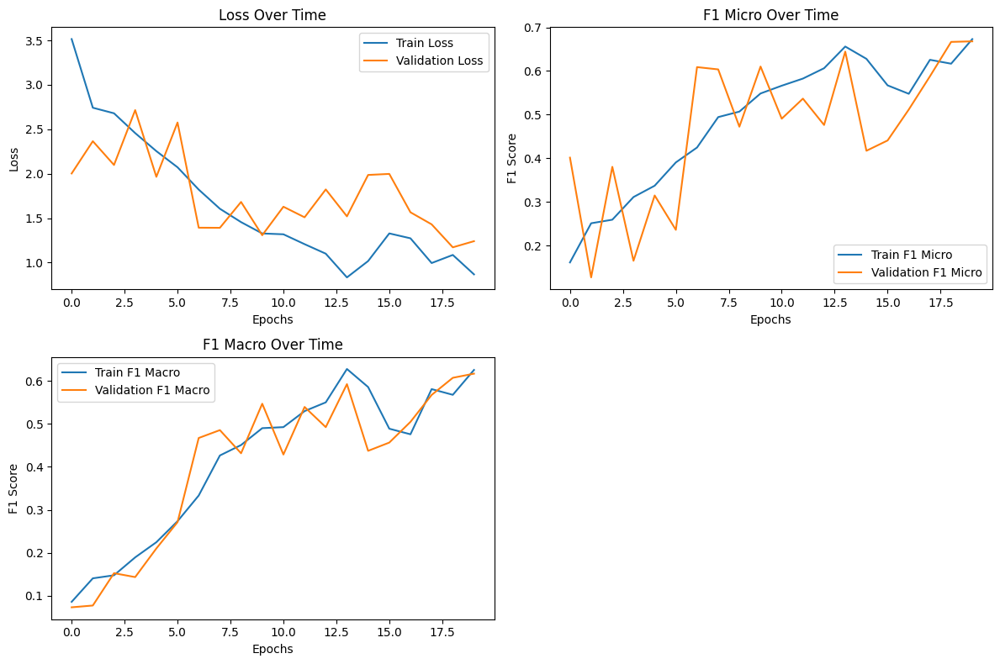

In [ ]:
#трансформер, с аугментациями шума и размытия, без флипа , #lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import torch.nn.functional as F

# Определение устройства для вычислений
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'transformerWithMobileNet')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'transformer_with_mobile_net_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithTransformBlock(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

###MobileNet + Transformer confusion matrix

In [ ]:
def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

val: 100%|██████████| 96/96 [01:16<00:00,  1.25it/s]


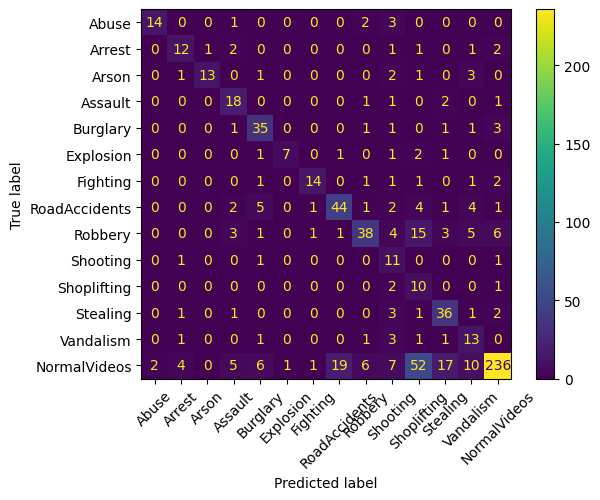

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

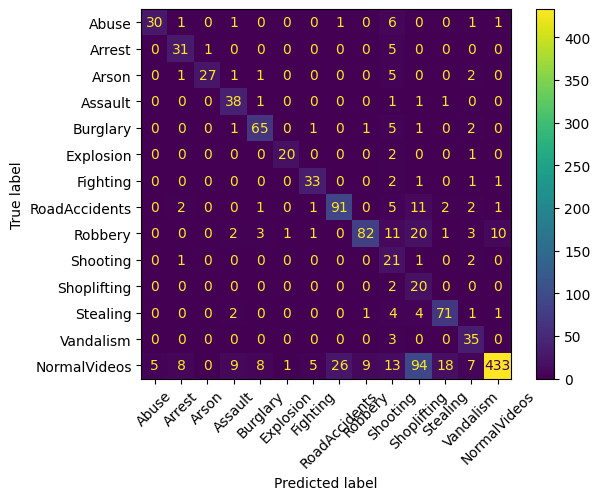

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_train_labels, all_train_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

###MobileNet + Transformer ROC AUC 0.91

In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels


In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


ROC AUC: 0.91


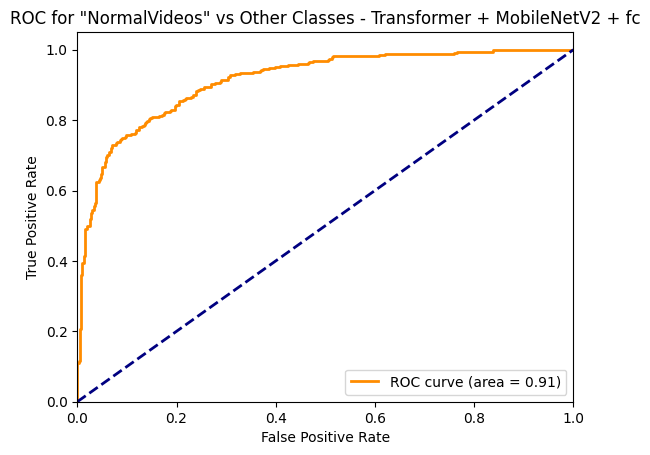

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes - Transformer + MobileNetV2 + fc')
plt.legend(loc="lower right")
plt.show()


In [ ]:
for x, labels, lengths_tensor in dataloaders['val']:
  break

Prediction Label: Shoplifting
Real Label: Shoplifting


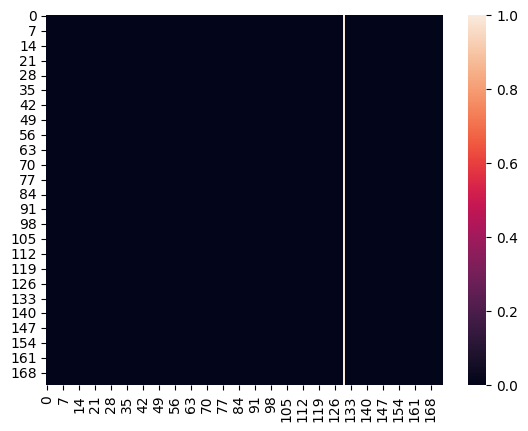

In [ ]:
import seaborn as sns
import torch.nn.functional as F

def calculate_attention(x, lengths_tensor, model):
    #### Preprocessing before transformer_encoder
    batch_size, sequence_length, C, H, W = x.size()

    x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
    x = model.features(x)
    # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']
    x = model.maxpool(x)
    # ? conv 3x3 channels=16 (если не будет получаться так, как есть)
    # ? если не будет получаться, каждый 5 кадр
    _, F, H_prime, W_prime = x.size()
    x = torch.flatten(x, start_dim=1)
    x = x.view(batch_size, sequence_length, -1)
    """[2, 3, 6] -> [[1, 1, 0, 0, 0, 0],
                      [1, 1, 1, 0, 0, 0],
                      [1, 1, 1, 1, 1, 1]]"""

    max_len_val = lengths_tensor.max()
    mask = torch.tensor(
        [
            [[1] * len_val + [0] * (max_len_val - len_val)] * len_val + \
              [[0] * max_len_val] * (max_len_val - len_val)
            for len_val in lengths_tensor
        ]
    ).unsqueeze(1).to(device)

    ##### Calculate attention
    attention_layer = model.transformer_block.layers[0].attention
    out = model.transformer_block.positional_encoder(x)
    key = out.clone()
    query = out.clone()
    value = out.clone()
    batch_size = key.size(0)
    seq_length = key.size(1)
    seq_length_query = query.size(1)

    key = key.view(batch_size, seq_length, attention_layer.n_heads, attention_layer.single_head_dim)
    query = query.view(batch_size, seq_length_query, attention_layer.n_heads, attention_layer.single_head_dim)
    value = value.view(batch_size, seq_length, attention_layer.n_heads, attention_layer.single_head_dim)

    k = attention_layer.key_matrix(key)
    q = attention_layer.query_matrix(query)
    v = attention_layer.value_matrix(value)

    q = q.transpose(1, 2)
    k = k.transpose(1, 2)
    v = v.transpose(1, 2)

    k_adjusted = k.transpose(-1, -2)
    product = torch.matmul(q, k_adjusted)

    if mask is not None:
        product = product.masked_fill(mask == 0, float("-1e20"))

    product = product / math.sqrt(attention_layer.single_head_dim)

    scores = nn.functional.softmax(product, dim=-1)

    return scores


def draw_attention_map(attention_matrix, lengths_tensor, idx, num_head):
    # attention_matrix -> [batch_size, n_heads, max_seq_len, max_seq_len]
    cur_seq = lengths_tensor[idx]
    attention_to_draw = attention_matrix[idx, num_head, :cur_seq, :cur_seq].cpu().detach().numpy() # [cur_seq, cur_seq]
    sns.heatmap(attention_to_draw)

filepath = '/content/drive/MyDrive/checkpoints/transformerWithMobileNet/transformer_with_mobile_net_epoch_19_loss_1.2414_f1_micro_0.6680_f1_macro_0.6171.pth'
model = torch.load(filepath).to(device)
model.eval()
idx = 3
num_head = 0

#for x, labels, lengths_tensor in dataloaders['val']:
x = x.to(device)
attention_tensor = calculate_attention(x, lengths_tensor, model)


with torch.no_grad():
    outputs = model(x, lengths_tensor)

preds = outputs.argmax(dim=1).detach().cpu().numpy()
if not isinstance(labels, np.ndarray):
    labels = labels.detach().cpu().numpy()
draw_attention_map(
    attention_matrix=attention_tensor,
    lengths_tensor=lengths_tensor,
    idx=idx,
    num_head=num_head)

print(f"Prediction Label: {CLASS_NAMES[preds[idx]]}")
print(f"Real Label: {CLASS_NAMES[labels[idx]]}")


In [ ]:
print(attention_tensor[idx, num_head,: , 152:156])

tensor([[0.0000, 0.0000, 1.0000, 0.0000],
        [0.0000, 0.0000, 1.0000, 0.0000],
        [0.0000, 0.0000, 1.0000, 0.0000],
        ...,
        [0.0039, 0.0039, 0.0039, 0.0039],
        [0.0039, 0.0039, 0.0039, 0.0039],
        [0.0039, 0.0039, 0.0039, 0.0039]], device='cuda:0',
       grad_fn=<SliceBackward0>)


In [ ]:
filepath = '/content/drive/MyDrive/checkpoints/transformerWithMobileNet/transformer_with_mobile_net_epoch_19_loss_4.6639_f1_micro_0.4978_f1_macro_0.1260.pth'
model = torch.load(filepath).to(device)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Пример использования
total_params = count_parameters(model)
print(f"Total trainable parameters: {total_params}")


Total trainable parameters: 96568654


##Трансформер на 60 эпохах

Epoch 1/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.16it/s]


train Loss: 3.5034 F1 Micro: 0.1349 F1 Macro: 0.0764


val: 100%|██████████| 96/96 [01:13<00:00,  1.30it/s]


val Loss: 2.2917 F1 Micro: 0.1837 F1 Macro: 0.0616
Epoch 2/60
----------


train: 100%|██████████| 169/169 [02:25<00:00,  1.16it/s]


train Loss: 2.8086 F1 Micro: 0.2365 F1 Macro: 0.1280


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 2.2665 F1 Micro: 0.3425 F1 Macro: 0.1124
Epoch 3/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 2.6122 F1 Micro: 0.2654 F1 Macro: 0.1630


val: 100%|██████████| 96/96 [01:15<00:00,  1.28it/s]


val Loss: 1.7709 F1 Micro: 0.4711 F1 Macro: 0.1715
Epoch 4/60
----------


train: 100%|██████████| 169/169 [02:32<00:00,  1.11it/s]


train Loss: 2.3949 F1 Micro: 0.3150 F1 Macro: 0.2091


val: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


val Loss: 1.7861 F1 Micro: 0.5039 F1 Macro: 0.2726
Epoch 5/60
----------


train: 100%|██████████| 169/169 [02:29<00:00,  1.13it/s]


train Loss: 2.2882 F1 Micro: 0.3299 F1 Macro: 0.2271


val: 100%|██████████| 96/96 [01:15<00:00,  1.28it/s]


val Loss: 1.8894 F1 Micro: 0.4094 F1 Macro: 0.2376
Epoch 6/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 2.2650 F1 Micro: 0.3499 F1 Macro: 0.2432


val: 100%|██████████| 96/96 [01:14<00:00,  1.28it/s]


val Loss: 1.7113 F1 Micro: 0.4724 F1 Macro: 0.3422
Epoch 7/60
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.12it/s]


train Loss: 1.9971 F1 Micro: 0.3973 F1 Macro: 0.3001


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 2.1901 F1 Micro: 0.3110 F1 Macro: 0.2504
Epoch 8/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 1.7862 F1 Micro: 0.4559 F1 Macro: 0.3705


val: 100%|██████████| 96/96 [01:15<00:00,  1.26it/s]


val Loss: 1.6472 F1 Micro: 0.4646 F1 Macro: 0.4537
Epoch 9/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 1.7108 F1 Micro: 0.4559 F1 Macro: 0.3700


val: 100%|██████████| 96/96 [01:15<00:00,  1.28it/s]


val Loss: 1.6793 F1 Micro: 0.4514 F1 Macro: 0.4204
Epoch 10/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 1.4326 F1 Micro: 0.5411 F1 Macro: 0.4591


val: 100%|██████████| 96/96 [01:15<00:00,  1.28it/s]


val Loss: 1.4145 F1 Micro: 0.5486 F1 Macro: 0.5234
Epoch 11/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 1.3643 F1 Micro: 0.5530 F1 Macro: 0.4701


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.3070 F1 Micro: 0.5932 F1 Macro: 0.5377
Epoch 12/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 1.1586 F1 Micro: 0.6064 F1 Macro: 0.5297


val: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


val Loss: 1.3295 F1 Micro: 0.6286 F1 Macro: 0.5702
Epoch 13/60
----------


train: 100%|██████████| 169/169 [02:29<00:00,  1.13it/s]


train Loss: 1.0075 F1 Micro: 0.6434 F1 Macro: 0.5909


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.0119 F1 Micro: 0.7060 F1 Macro: 0.6441
Epoch 14/60
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.12it/s]


train Loss: 1.0001 F1 Micro: 0.6612 F1 Macro: 0.5963


val: 100%|██████████| 96/96 [01:15<00:00,  1.28it/s]


val Loss: 1.5150 F1 Micro: 0.5630 F1 Macro: 0.4124
Epoch 15/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 1.3573 F1 Micro: 0.5612 F1 Macro: 0.5059


val: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


val Loss: 2.1377 F1 Micro: 0.3648 F1 Macro: 0.2951
Epoch 16/60
----------


train: 100%|██████████| 169/169 [02:27<00:00,  1.15it/s]


train Loss: 1.2911 F1 Micro: 0.5693 F1 Macro: 0.5006


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.2255 F1 Micro: 0.6404 F1 Macro: 0.6161
Epoch 17/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 0.9598 F1 Micro: 0.6723 F1 Macro: 0.6168


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.1396 F1 Micro: 0.6916 F1 Macro: 0.6159
Epoch 18/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 0.7618 F1 Micro: 0.7398 F1 Macro: 0.6726


val: 100%|██████████| 96/96 [01:14<00:00,  1.28it/s]


val Loss: 1.1959 F1 Micro: 0.7008 F1 Macro: 0.6549
Epoch 19/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 0.8930 F1 Micro: 0.7072 F1 Macro: 0.6434


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.6081 F1 Micro: 0.5026 F1 Macro: 0.5358
Epoch 20/60
----------


train: 100%|██████████| 169/169 [02:28<00:00,  1.14it/s]


train Loss: 0.7843 F1 Micro: 0.7539 F1 Macro: 0.6881


val: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


val Loss: 1.2996 F1 Micro: 0.6391 F1 Macro: 0.6025
Epoch 21/60
----------


train: 100%|██████████| 169/169 [02:32<00:00,  1.11it/s]


train Loss: 0.7878 F1 Micro: 0.7368 F1 Macro: 0.6859


val: 100%|██████████| 96/96 [01:14<00:00,  1.28it/s]


val Loss: 1.4540 F1 Micro: 0.6378 F1 Macro: 0.6032
Epoch 22/60
----------


train: 100%|██████████| 169/169 [02:33<00:00,  1.10it/s]


train Loss: 0.7534 F1 Micro: 0.7754 F1 Macro: 0.6975


val: 100%|██████████| 96/96 [01:15<00:00,  1.28it/s]


val Loss: 0.9552 F1 Micro: 0.7572 F1 Macro: 0.6891
Epoch 23/60
----------


train: 100%|██████████| 169/169 [02:32<00:00,  1.11it/s]


train Loss: 0.6364 F1 Micro: 0.7999 F1 Macro: 0.7224


val: 100%|██████████| 96/96 [01:15<00:00,  1.28it/s]


val Loss: 0.9008 F1 Micro: 0.7808 F1 Macro: 0.7167
Epoch 24/60
----------


train: 100%|██████████| 169/169 [02:29<00:00,  1.13it/s]


train Loss: 0.5501 F1 Micro: 0.8377 F1 Macro: 0.7741


val: 100%|██████████| 96/96 [01:15<00:00,  1.27it/s]


val Loss: 0.9869 F1 Micro: 0.8084 F1 Macro: 0.7542
Epoch 25/60
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.11it/s]


train Loss: 0.5852 F1 Micro: 0.8273 F1 Macro: 0.7729


val: 100%|██████████| 96/96 [01:14<00:00,  1.28it/s]


val Loss: 0.9658 F1 Micro: 0.7782 F1 Macro: 0.7082
Epoch 26/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 0.7250 F1 Micro: 0.7687 F1 Macro: 0.7066


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.0253 F1 Micro: 0.7533 F1 Macro: 0.7065
Epoch 27/60
----------


train: 100%|██████████| 169/169 [02:29<00:00,  1.13it/s]


train Loss: 0.6390 F1 Micro: 0.7746 F1 Macro: 0.7133


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.1063 F1 Micro: 0.7402 F1 Macro: 0.6948
Epoch 28/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.13it/s]


train Loss: 0.6132 F1 Micro: 0.8213 F1 Macro: 0.7557


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.1800 F1 Micro: 0.7021 F1 Macro: 0.6374
Epoch 29/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 0.7115 F1 Micro: 0.7769 F1 Macro: 0.6839


val: 100%|██████████| 96/96 [01:13<00:00,  1.30it/s]


val Loss: 1.1834 F1 Micro: 0.6995 F1 Macro: 0.6205
Epoch 30/60
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.12it/s]


train Loss: 0.8654 F1 Micro: 0.7532 F1 Macro: 0.6715


val: 100%|██████████| 96/96 [01:14<00:00,  1.28it/s]


val Loss: 1.4577 F1 Micro: 0.5997 F1 Macro: 0.5782
Epoch 31/60
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.12it/s]


train Loss: 0.6979 F1 Micro: 0.7732 F1 Macro: 0.7112


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.0001 F1 Micro: 0.7651 F1 Macro: 0.6873
Epoch 32/60
----------


train: 100%|██████████| 169/169 [02:31<00:00,  1.12it/s]


train Loss: 0.6311 F1 Micro: 0.8228 F1 Macro: 0.7400


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 0.9132 F1 Micro: 0.7927 F1 Macro: 0.7280
Epoch 33/60
----------


train: 100%|██████████| 169/169 [02:29<00:00,  1.13it/s]


train Loss: 0.5354 F1 Micro: 0.8384 F1 Macro: 0.7772


val: 100%|██████████| 96/96 [01:14<00:00,  1.30it/s]


val Loss: 0.9551 F1 Micro: 0.8005 F1 Macro: 0.7223
Epoch 34/60
----------


train: 100%|██████████| 169/169 [02:29<00:00,  1.13it/s]


train Loss: 0.5671 F1 Micro: 0.8280 F1 Macro: 0.7674


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.0887 F1 Micro: 0.7520 F1 Macro: 0.7004
Epoch 35/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.16it/s]


train Loss: 0.6067 F1 Micro: 0.8058 F1 Macro: 0.7372


val: 100%|██████████| 96/96 [01:12<00:00,  1.33it/s]


val Loss: 1.1252 F1 Micro: 0.7152 F1 Macro: 0.6584
Epoch 36/60
----------


train: 100%|██████████| 169/169 [02:25<00:00,  1.16it/s]


train Loss: 0.5315 F1 Micro: 0.8184 F1 Macro: 0.7748


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 1.0228 F1 Micro: 0.7979 F1 Macro: 0.7117
Epoch 37/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.16it/s]


train Loss: 0.5733 F1 Micro: 0.8310 F1 Macro: 0.7768


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 0.9060 F1 Micro: 0.7795 F1 Macro: 0.6866
Epoch 38/60
----------


train: 100%|██████████| 169/169 [02:25<00:00,  1.16it/s]


train Loss: 0.5262 F1 Micro: 0.8213 F1 Macro: 0.7759


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 1.1794 F1 Micro: 0.7297 F1 Macro: 0.6881
Epoch 39/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.16it/s]


train Loss: 0.6311 F1 Micro: 0.7969 F1 Macro: 0.7396


val: 100%|██████████| 96/96 [01:12<00:00,  1.33it/s]


val Loss: 1.9233 F1 Micro: 0.5814 F1 Macro: 0.5871
Epoch 40/60
----------


train: 100%|██████████| 169/169 [02:25<00:00,  1.16it/s]


train Loss: 0.4639 F1 Micro: 0.8673 F1 Macro: 0.7976


val: 100%|██████████| 96/96 [01:13<00:00,  1.30it/s]


val Loss: 1.0952 F1 Micro: 0.8084 F1 Macro: 0.7475
Epoch 41/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.15it/s]


train Loss: 0.5415 F1 Micro: 0.8206 F1 Macro: 0.7642


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 1.2078 F1 Micro: 0.7953 F1 Macro: 0.7299
Epoch 42/60
----------


train: 100%|██████████| 169/169 [02:25<00:00,  1.16it/s]


train Loss: 0.7624 F1 Micro: 0.7583 F1 Macro: 0.6959


val: 100%|██████████| 96/96 [01:12<00:00,  1.33it/s]


val Loss: 1.6120 F1 Micro: 0.6457 F1 Macro: 0.6480
Epoch 43/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.16it/s]


train Loss: 0.6511 F1 Micro: 0.7784 F1 Macro: 0.7098


val: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


val Loss: 1.2051 F1 Micro: 0.7375 F1 Macro: 0.6306
Epoch 44/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.15it/s]


train Loss: 0.6431 F1 Micro: 0.7872 F1 Macro: 0.7091


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 1.1876 F1 Micro: 0.7480 F1 Macro: 0.7159
Epoch 45/60
----------


train: 100%|██████████| 169/169 [02:28<00:00,  1.14it/s]


train Loss: 0.5142 F1 Micro: 0.8384 F1 Macro: 0.7759


val: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


val Loss: 0.9616 F1 Micro: 0.7808 F1 Macro: 0.6939
Epoch 46/60
----------


train: 100%|██████████| 169/169 [02:25<00:00,  1.16it/s]


train Loss: 0.6333 F1 Micro: 0.8191 F1 Macro: 0.7591


val: 100%|██████████| 96/96 [01:12<00:00,  1.33it/s]


val Loss: 0.9902 F1 Micro: 0.7861 F1 Macro: 0.7211
Epoch 47/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 0.4871 F1 Micro: 0.8510 F1 Macro: 0.7851


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 1.0583 F1 Micro: 0.7756 F1 Macro: 0.7190
Epoch 48/60
----------


train: 100%|██████████| 169/169 [02:27<00:00,  1.15it/s]


train Loss: 0.5216 F1 Micro: 0.8369 F1 Macro: 0.7822


val: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


val Loss: 1.2690 F1 Micro: 0.7467 F1 Macro: 0.6774
Epoch 49/60
----------


train: 100%|██████████| 169/169 [02:27<00:00,  1.15it/s]


train Loss: 0.5946 F1 Micro: 0.8021 F1 Macro: 0.7265


val: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


val Loss: 1.0960 F1 Micro: 0.7782 F1 Macro: 0.6964
Epoch 50/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.15it/s]


train Loss: 0.4130 F1 Micro: 0.8799 F1 Macro: 0.8263


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 0.9425 F1 Micro: 0.8215 F1 Macro: 0.7477
Epoch 51/60
----------


train: 100%|██████████| 169/169 [02:30<00:00,  1.12it/s]


train Loss: 0.4632 F1 Micro: 0.8666 F1 Macro: 0.8017


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 1.0607 F1 Micro: 0.7887 F1 Macro: 0.7106
Epoch 52/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.16it/s]


train Loss: 0.4818 F1 Micro: 0.8443 F1 Macro: 0.7888


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 0.9374 F1 Micro: 0.8202 F1 Macro: 0.7490
Epoch 53/60
----------


train: 100%|██████████| 169/169 [02:27<00:00,  1.14it/s]


train Loss: 0.4972 F1 Micro: 0.8332 F1 Macro: 0.7696


val: 100%|██████████| 96/96 [01:12<00:00,  1.33it/s]


val Loss: 0.9717 F1 Micro: 0.7913 F1 Macro: 0.7175
Epoch 54/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.16it/s]


train Loss: 0.3634 F1 Micro: 0.8984 F1 Macro: 0.8492


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 0.9950 F1 Micro: 0.7966 F1 Macro: 0.7115
Epoch 55/60
----------


train: 100%|██████████| 169/169 [02:27<00:00,  1.15it/s]


train Loss: 0.3658 F1 Micro: 0.8933 F1 Macro: 0.8350


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 0.9674 F1 Micro: 0.8084 F1 Macro: 0.7312
Epoch 56/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.15it/s]


train Loss: 0.3820 F1 Micro: 0.8970 F1 Macro: 0.8369


val: 100%|██████████| 96/96 [01:12<00:00,  1.32it/s]


val Loss: 1.0610 F1 Micro: 0.8005 F1 Macro: 0.7114
Epoch 57/60
----------


train: 100%|██████████| 169/169 [02:26<00:00,  1.15it/s]


train Loss: 0.8267 F1 Micro: 0.7465 F1 Macro: 0.6517


val: 100%|██████████| 96/96 [01:14<00:00,  1.29it/s]


val Loss: 1.1816 F1 Micro: 0.6942 F1 Macro: 0.5655
Epoch 58/60
----------


train: 100%|██████████| 169/169 [02:28<00:00,  1.14it/s]


train Loss: 0.6367 F1 Micro: 0.7969 F1 Macro: 0.7259


val: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


val Loss: 1.2351 F1 Micro: 0.7087 F1 Macro: 0.6624
Epoch 59/60
----------


train: 100%|██████████| 169/169 [02:27<00:00,  1.14it/s]


train Loss: 0.5400 F1 Micro: 0.8451 F1 Macro: 0.7631


val: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


val Loss: 1.0614 F1 Micro: 0.7559 F1 Macro: 0.7010
Epoch 60/60
----------


train: 100%|██████████| 169/169 [02:27<00:00,  1.14it/s]


train Loss: 0.5207 F1 Micro: 0.8377 F1 Macro: 0.7636


val: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


val Loss: 1.1014 F1 Micro: 0.7822 F1 Macro: 0.7134


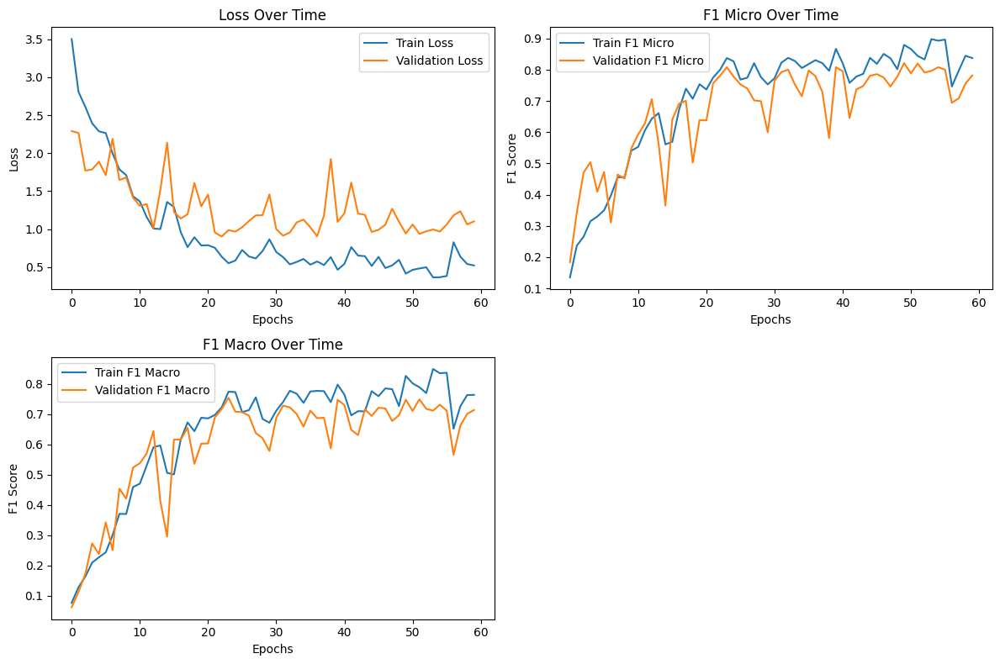

In [ ]:
#трансформер, с аугментациями шума и размытия, без флипа , #lr=0.0001, 60 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import torch.nn.functional as F

# Определение устройства для вычислений
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'transformerWithMobileNet_60_epochs')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'transformer_with_mobile_net_60_epochs_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithTransformBlock(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=60, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

###MobileNet + Transformer confusion matrix

In [ ]:
def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

val: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


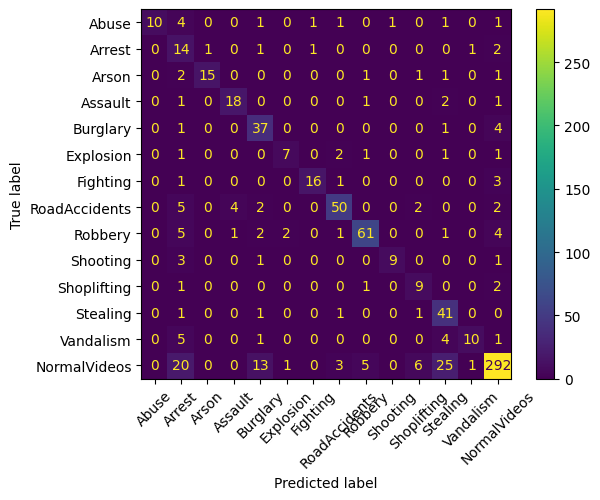

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

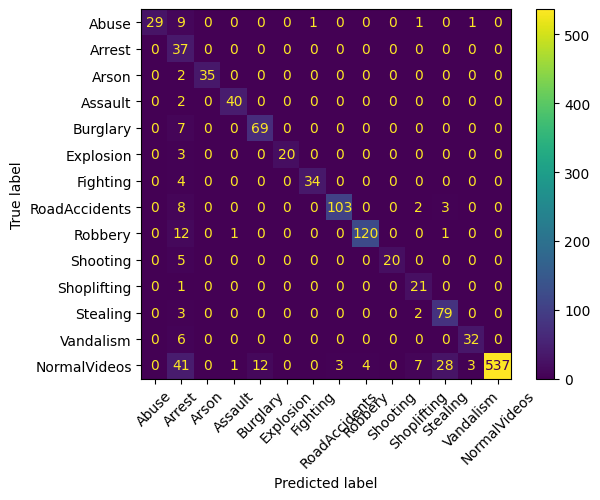

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_train_labels, all_train_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

###MobileNet + Transformer ROC AUC 0.96

In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 96/96 [01:13<00:00,  1.31it/s]


ROC AUC: 0.96


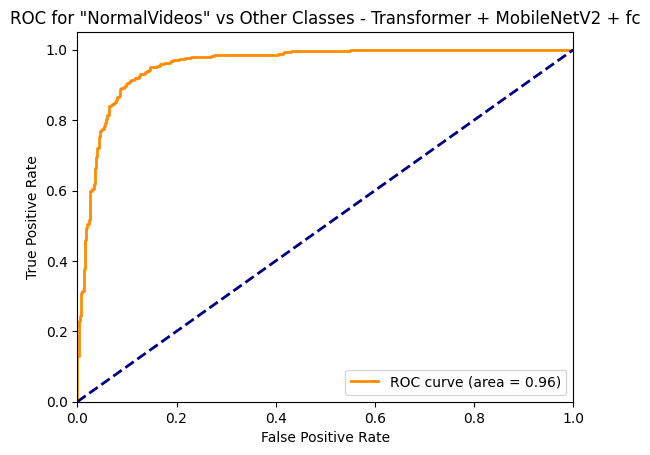

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes - Transformer + MobileNetV2 + fc')
plt.legend(loc="lower right")
plt.show()

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

# Расчет accuracy с порогом по умолчанию (0.5 для бинарной классификации)
default_accuracy = calculate_accuracy(all_probs, all_labels)
print(f"Default threshold accuracy: {default_accuracy}")

# Изменение threshold для уменьшения False Negatives и повторный расчет accuracy
new_threshold = 0.3  # Новое значение порога
adjusted_accuracy = calculate_accuracy(all_probs, all_labels, threshold=new_threshold)
print(f"Adjusted threshold accuracy: {adjusted_accuracy}")


##Трансформер с 1 головой на 20 эпохах

In [ ]:
class CustomModelWithTransformBlock(nn.Module):
    def __init__(self,
                 num_classes,
                 num_transformer_layers=1,
                 expansion_factor=2,
                 n_heads=1,
                 max_seq_len=1500):
        super(CustomModelWithTransformBlock, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.num_transformer_layers = num_transformer_layers
        self.freeze_features = True
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.freeze_resnet = True  # Флаг для управления заморозкой слоев ResNet34

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.transformer_block = TransformerEncoder(
            seq_len=max_seq_len,
            embed_dim=rnn_input_size,
            num_layers=self.num_transformer_layers,
            expansion_factor=expansion_factor,
            n_heads=n_heads)

        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        # x размером [batch_size, sequence_length, channels, height, width]
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
        x = self.features(x)
        # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']
        x = self.maxpool(x)
        # ? conv 3x3 channels=16 (если не будет получаться так, как есть)
        # ? если не будет получаться, каждый 5 кадр
        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        x = x.view(batch_size, sequence_length, -1)
        """[2, 3, 6] -> [[1, 1, 0, 0, 0, 0],
                         [1, 1, 1, 0, 0, 0],
                         [1, 1, 1, 1, 1, 1]]"""

        # rnn proc
        max_len_val = lengths_tensor.max()
        mask = torch.tensor(
            [
                [[1] * len_val + [0] * (max_len_val - len_val)] * len_val + \
                 [[0] * max_len_val] * (max_len_val - len_val)
                for len_val in lengths_tensor
            ]
        ).unsqueeze(1).to(device)

        out = self.transformer_block(x, mask=mask)
        #print(out.shape)
        probs = self.fc(out[:, 0, :])

        return probs





/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 186MB/s]


Epoch 1/20
----------


train: 100%|██████████| 132/132 [02:04<00:00,  1.06it/s]


train Loss: 3.7278 F1 Micro: 0.0790 F1 Macro: 0.0594


val: 100%|██████████| 55/55 [00:45<00:00,  1.21it/s]


val Loss: 3.3382 F1 Micro: 0.0206 F1 Macro: 0.0029
Epoch 2/20
----------


train: 100%|██████████| 132/132 [02:02<00:00,  1.07it/s]


train Loss: 2.9496 F1 Micro: 0.1105 F1 Macro: 0.0685


val: 100%|██████████| 55/55 [00:45<00:00,  1.21it/s]


val Loss: 3.0883 F1 Micro: 0.0344 F1 Macro: 0.0245
Epoch 3/20
----------


train: 100%|██████████| 132/132 [02:09<00:00,  1.02it/s]


train Loss: 2.9172 F1 Micro: 0.1410 F1 Macro: 0.0849


val: 100%|██████████| 55/55 [00:46<00:00,  1.17it/s]


val Loss: 2.5620 F1 Micro: 0.0665 F1 Macro: 0.0360
Epoch 4/20
----------


train: 100%|██████████| 132/132 [02:08<00:00,  1.03it/s]


train Loss: 2.8002 F1 Micro: 0.1790 F1 Macro: 0.0945


val: 100%|██████████| 55/55 [00:45<00:00,  1.20it/s]


val Loss: 2.2349 F1 Micro: 0.4083 F1 Macro: 0.0889
Epoch 5/20
----------


train: 100%|██████████| 132/132 [02:07<00:00,  1.04it/s]


train Loss: 2.7280 F1 Micro: 0.1752 F1 Macro: 0.1025


val: 100%|██████████| 55/55 [00:45<00:00,  1.22it/s]


val Loss: 2.3436 F1 Micro: 0.2133 F1 Macro: 0.0909
Epoch 6/20
----------


train: 100%|██████████| 132/132 [02:08<00:00,  1.03it/s]


train Loss: 2.5786 F1 Micro: 0.2248 F1 Macro: 0.1630


val: 100%|██████████| 55/55 [00:44<00:00,  1.23it/s]


val Loss: 2.1995 F1 Micro: 0.4014 F1 Macro: 0.0958
Epoch 7/20
----------


train: 100%|██████████| 132/132 [02:04<00:00,  1.06it/s]


train Loss: 2.5497 F1 Micro: 0.2362 F1 Macro: 0.1461


val: 100%|██████████| 55/55 [00:43<00:00,  1.26it/s]


val Loss: 2.6408 F1 Micro: 0.1193 F1 Macro: 0.0357
Epoch 8/20
----------


train: 100%|██████████| 132/132 [02:10<00:00,  1.01it/s]


train Loss: 2.4579 F1 Micro: 0.2581 F1 Macro: 0.1710


val: 100%|██████████| 55/55 [00:44<00:00,  1.25it/s]


val Loss: 2.3592 F1 Micro: 0.0734 F1 Macro: 0.0276
Epoch 9/20
----------


train: 100%|██████████| 132/132 [02:06<00:00,  1.05it/s]


train Loss: 2.3937 F1 Micro: 0.2933 F1 Macro: 0.1968


val: 100%|██████████| 55/55 [00:44<00:00,  1.24it/s]


val Loss: 2.0712 F1 Micro: 0.4771 F1 Macro: 0.0996
Epoch 10/20
----------


train: 100%|██████████| 132/132 [02:04<00:00,  1.06it/s]


train Loss: 2.3308 F1 Micro: 0.2533 F1 Macro: 0.1923


val: 100%|██████████| 55/55 [00:45<00:00,  1.22it/s]


val Loss: 2.6633 F1 Micro: 0.1216 F1 Macro: 0.0685
Epoch 11/20
----------


train: 100%|██████████| 132/132 [02:03<00:00,  1.07it/s]


train Loss: 2.2375 F1 Micro: 0.2829 F1 Macro: 0.2360


val: 100%|██████████| 55/55 [00:44<00:00,  1.25it/s]


val Loss: 2.2888 F1 Micro: 0.3417 F1 Macro: 0.1197
Epoch 12/20
----------


train: 100%|██████████| 132/132 [02:05<00:00,  1.05it/s]


train Loss: 2.0618 F1 Micro: 0.3343 F1 Macro: 0.2580


val: 100%|██████████| 55/55 [00:43<00:00,  1.26it/s]


val Loss: 2.3276 F1 Micro: 0.3417 F1 Macro: 0.0862
Epoch 13/20
----------


train: 100%|██████████| 132/132 [02:03<00:00,  1.07it/s]


train Loss: 1.9885 F1 Micro: 0.3733 F1 Macro: 0.2939


val: 100%|██████████| 55/55 [00:43<00:00,  1.25it/s]


val Loss: 2.5012 F1 Micro: 0.1835 F1 Macro: 0.1055
Epoch 14/20
----------


train: 100%|██████████| 132/132 [02:04<00:00,  1.06it/s]


train Loss: 1.7564 F1 Micro: 0.4124 F1 Macro: 0.3459


val: 100%|██████████| 55/55 [00:44<00:00,  1.24it/s]


val Loss: 2.7564 F1 Micro: 0.2844 F1 Macro: 0.0740
Epoch 15/20
----------


train: 100%|██████████| 132/132 [02:09<00:00,  1.02it/s]


train Loss: 1.6935 F1 Micro: 0.4181 F1 Macro: 0.3642


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 2.8870 F1 Micro: 0.1789 F1 Macro: 0.0831
Epoch 16/20
----------


train: 100%|██████████| 132/132 [02:05<00:00,  1.05it/s]


train Loss: 1.5263 F1 Micro: 0.4467 F1 Macro: 0.4163


val: 100%|██████████| 55/55 [00:44<00:00,  1.25it/s]


val Loss: 2.2330 F1 Micro: 0.3853 F1 Macro: 0.1096
Epoch 17/20
----------


train: 100%|██████████| 132/132 [02:03<00:00,  1.06it/s]


train Loss: 1.4698 F1 Micro: 0.4943 F1 Macro: 0.4351


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 3.4566 F1 Micro: 0.1101 F1 Macro: 0.0984
Epoch 18/20
----------


train: 100%|██████████| 132/132 [02:04<00:00,  1.06it/s]


train Loss: 1.3366 F1 Micro: 0.5143 F1 Macro: 0.4904


val: 100%|██████████| 55/55 [00:43<00:00,  1.26it/s]


val Loss: 2.4744 F1 Micro: 0.4060 F1 Macro: 0.1230
Epoch 19/20
----------


train: 100%|██████████| 132/132 [02:04<00:00,  1.06it/s]


train Loss: 1.2106 F1 Micro: 0.5571 F1 Macro: 0.5319


val: 100%|██████████| 55/55 [00:44<00:00,  1.24it/s]


val Loss: 2.8441 F1 Micro: 0.4656 F1 Macro: 0.0962
Epoch 20/20
----------


train: 100%|██████████| 132/132 [02:05<00:00,  1.06it/s]


train Loss: 1.2533 F1 Micro: 0.4752 F1 Macro: 0.4673


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 4.0330 F1 Micro: 0.1904 F1 Macro: 0.0650


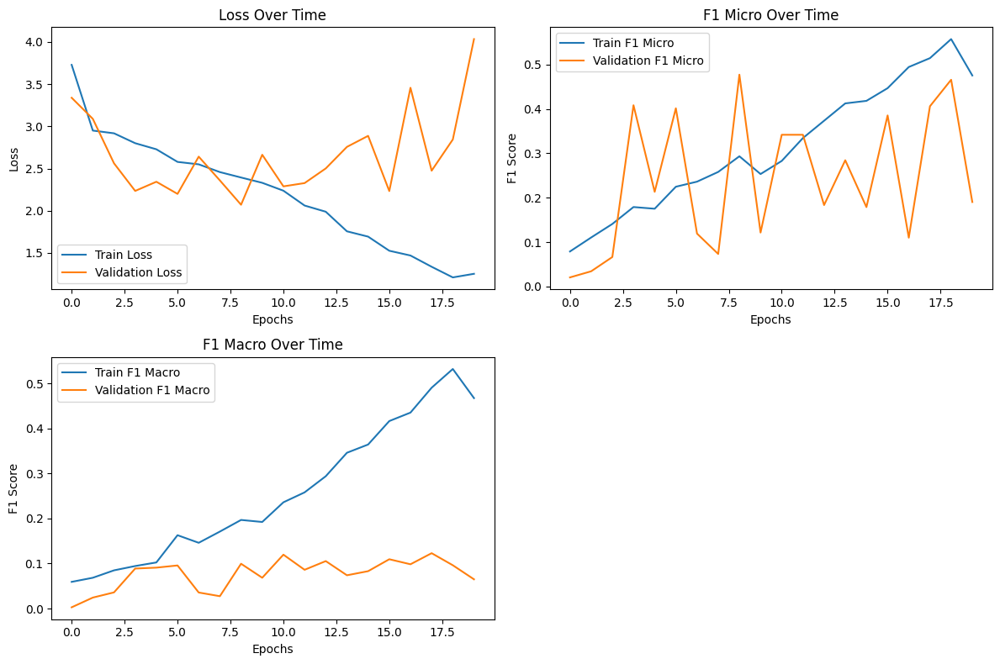

In [ ]:
#трансформер, с аугментациями шума и размытия, без флипа, с 1 головой, #lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import torch.nn.functional as F

# Определение устройства для вычислений
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'transformerWithMobileNet_1_head_20_epochs')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'transformerWithMobileNet_1_head_20_epochs_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithTransformBlock(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
for x, labels, lengths_tensor in dataloaders['val']:
  break

Prediction Label: RoadAccidents
Real Label: NormalVideos


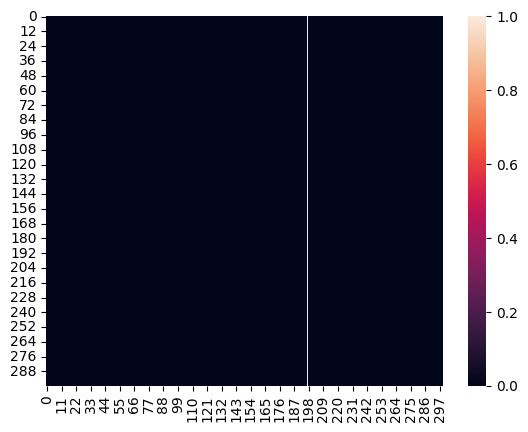

In [ ]:
import seaborn as sns
import torch.nn.functional as F

def calculate_attention(x, lengths_tensor, model):
    #### Preprocessing before transformer_encoder
    batch_size, sequence_length, C, H, W = x.size()

    x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
    x = model.features(x)
    # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']
    x = model.maxpool(x)
    # ? conv 3x3 channels=16 (если не будет получаться так, как есть)
    # ? если не будет получаться, каждый 5 кадр
    _, F, H_prime, W_prime = x.size()
    x = torch.flatten(x, start_dim=1)
    x = x.view(batch_size, sequence_length, -1)
    """[2, 3, 6] -> [[1, 1, 0, 0, 0, 0],
                      [1, 1, 1, 0, 0, 0],
                      [1, 1, 1, 1, 1, 1]]"""

    max_len_val = lengths_tensor.max()
    mask = torch.tensor(
        [
            [[1] * len_val + [0] * (max_len_val - len_val)] * len_val + \
              [[0] * max_len_val] * (max_len_val - len_val)
            for len_val in lengths_tensor
        ]
    ).unsqueeze(1).to(device)

    ##### Calculate attention
    attention_layer = model.transformer_block.layers[0].attention
    out = model.transformer_block.positional_encoder(x)
    key = out.clone()
    query = out.clone()
    value = out.clone()
    batch_size = key.size(0)
    seq_length = key.size(1)
    seq_length_query = query.size(1)

    key = key.view(batch_size, seq_length, attention_layer.n_heads, attention_layer.single_head_dim)
    query = query.view(batch_size, seq_length_query, attention_layer.n_heads, attention_layer.single_head_dim)
    value = value.view(batch_size, seq_length, attention_layer.n_heads, attention_layer.single_head_dim)

    k = attention_layer.key_matrix(key)
    q = attention_layer.query_matrix(query)
    v = attention_layer.value_matrix(value)

    q = q.transpose(1, 2)
    k = k.transpose(1, 2)
    v = v.transpose(1, 2)

    k_adjusted = k.transpose(-1, -2)
    product = torch.matmul(q, k_adjusted)

    if mask is not None:
        product = product.masked_fill(mask == 0, float("-1e20"))

    product = product / math.sqrt(attention_layer.single_head_dim)

    scores = nn.functional.softmax(product, dim=-1)

    return scores


def draw_attention_map(attention_matrix, lengths_tensor, idx, num_head):
    # attention_matrix -> [batch_size, n_heads, max_seq_len, max_seq_len]
    cur_seq = lengths_tensor[idx]
    attention_to_draw = attention_matrix[idx, num_head, :cur_seq, :cur_seq].cpu().detach().numpy() # [cur_seq, cur_seq]
    sns.heatmap(attention_to_draw)

filepath = '/content/drive/MyDrive/checkpoints/transformerWithMobileNet_1_head_20_epochs/transformerWithMobileNet_1_head_20_epochs_epoch_19_loss_4.0330_f1_micro_0.1904_f1_macro_0.0650.pth'
model = torch.load(filepath).to(device)
model.eval()
idx = 3
num_head = 0

#for x, labels, lengths_tensor in dataloaders['val']:
x = x.to(device)
attention_tensor = calculate_attention(x, lengths_tensor, model)


with torch.no_grad():
    outputs = model(x, lengths_tensor)

preds = outputs.argmax(dim=1).detach().cpu().numpy()
if not isinstance(labels, np.ndarray):
    labels = labels.detach().cpu().numpy()
draw_attention_map(
    attention_matrix=attention_tensor,
    lengths_tensor=lengths_tensor,
    idx=idx,
    num_head=num_head)

print(f"Prediction Label: {CLASS_NAMES[preds[idx]]}")
print(f"Real Label: {CLASS_NAMES[labels[idx]]}")

##Трансформер с 8 головами на 20 эпохах

In [ ]:
class CustomModelWithTransformBlock(nn.Module):
    def __init__(self,
                 num_classes,
                 num_transformer_layers=1,
                 expansion_factor=2,
                 n_heads=8,
                 max_seq_len=1500):
        super(CustomModelWithTransformBlock, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.num_transformer_layers = num_transformer_layers
        self.freeze_features = True
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.freeze_resnet = True  # Флаг для управления заморозкой слоев ResNet34

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.transformer_block = TransformerEncoder(
            seq_len=max_seq_len,
            embed_dim=rnn_input_size,
            num_layers=self.num_transformer_layers,
            expansion_factor=expansion_factor,
            n_heads=n_heads)

        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        # x размером [batch_size, sequence_length, channels, height, width]
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
        x = self.features(x)
        # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']
        x = self.maxpool(x)
        # ? conv 3x3 channels=16 (если не будет получаться так, как есть)
        # ? если не будет получаться, каждый 5 кадр
        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        x = x.view(batch_size, sequence_length, -1)
        """[2, 3, 6] -> [[1, 1, 0, 0, 0, 0],
                         [1, 1, 1, 0, 0, 0],
                         [1, 1, 1, 1, 1, 1]]"""

        # rnn proc
        max_len_val = lengths_tensor.max()
        mask = torch.tensor(
            [
                [[1] * len_val + [0] * (max_len_val - len_val)] * len_val + \
                 [[0] * max_len_val] * (max_len_val - len_val)
                for len_val in lengths_tensor
            ]
        ).unsqueeze(1).to(device)

        out = self.transformer_block(x, mask=mask)
        #print(out.shape)
        probs = self.fc(out[:, 0, :])

        return probs





/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 132/132 [01:54<00:00,  1.15it/s]


train Loss: 3.4299 F1 Micro: 0.1714 F1 Macro: 0.0935


val: 100%|██████████| 55/55 [00:43<00:00,  1.26it/s]


val Loss: 2.4574 F1 Micro: 0.2706 F1 Macro: 0.1051
Epoch 2/20
----------


train: 100%|██████████| 132/132 [01:56<00:00,  1.14it/s]


train Loss: 2.5354 F1 Micro: 0.2705 F1 Macro: 0.1617


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 2.1830 F1 Micro: 0.3326 F1 Macro: 0.1407
Epoch 3/20
----------


train: 100%|██████████| 132/132 [01:56<00:00,  1.13it/s]


train Loss: 2.1851 F1 Micro: 0.3619 F1 Macro: 0.2659


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 2.3509 F1 Micro: 0.3050 F1 Macro: 0.1198
Epoch 4/20
----------


train: 100%|██████████| 132/132 [01:54<00:00,  1.15it/s]


train Loss: 1.8987 F1 Micro: 0.4219 F1 Macro: 0.3300


val: 100%|██████████| 55/55 [00:42<00:00,  1.28it/s]


val Loss: 2.5002 F1 Micro: 0.2844 F1 Macro: 0.1277
Epoch 5/20
----------


train: 100%|██████████| 132/132 [01:57<00:00,  1.12it/s]


train Loss: 1.6177 F1 Micro: 0.5114 F1 Macro: 0.4293


val: 100%|██████████| 55/55 [00:42<00:00,  1.29it/s]


val Loss: 2.9469 F1 Micro: 0.2867 F1 Macro: 0.1179
Epoch 6/20
----------


train: 100%|██████████| 132/132 [01:57<00:00,  1.13it/s]


train Loss: 1.6626 F1 Micro: 0.5114 F1 Macro: 0.4232


val: 100%|██████████| 55/55 [00:42<00:00,  1.31it/s]


val Loss: 3.0231 F1 Micro: 0.2592 F1 Macro: 0.1437
Epoch 7/20
----------


train: 100%|██████████| 132/132 [01:56<00:00,  1.13it/s]


train Loss: 1.0386 F1 Micro: 0.6219 F1 Macro: 0.5570


val: 100%|██████████| 55/55 [00:42<00:00,  1.29it/s]


val Loss: 3.0153 F1 Micro: 0.3349 F1 Macro: 0.1313
Epoch 8/20
----------


train: 100%|██████████| 132/132 [01:56<00:00,  1.13it/s]


train Loss: 0.7531 F1 Micro: 0.7162 F1 Macro: 0.6908


val: 100%|██████████| 55/55 [00:43<00:00,  1.28it/s]


val Loss: 3.0026 F1 Micro: 0.4174 F1 Macro: 0.1416
Epoch 9/20
----------


train: 100%|██████████| 132/132 [01:58<00:00,  1.12it/s]


train Loss: 0.4965 F1 Micro: 0.7724 F1 Macro: 0.7522


val: 100%|██████████| 55/55 [00:42<00:00,  1.28it/s]


val Loss: 3.0097 F1 Micro: 0.3188 F1 Macro: 0.1679
Epoch 10/20
----------


train: 100%|██████████| 132/132 [01:58<00:00,  1.12it/s]


train Loss: 0.4387 F1 Micro: 0.8133 F1 Macro: 0.7872


val: 100%|██████████| 55/55 [00:42<00:00,  1.28it/s]


val Loss: 3.4468 F1 Micro: 0.3440 F1 Macro: 0.1286
Epoch 11/20
----------


train: 100%|██████████| 132/132 [01:56<00:00,  1.14it/s]


train Loss: 0.3297 F1 Micro: 0.8543 F1 Macro: 0.8468


val: 100%|██████████| 55/55 [00:42<00:00,  1.29it/s]


val Loss: 3.9099 F1 Micro: 0.2317 F1 Macro: 0.1355
Epoch 12/20
----------


train: 100%|██████████| 132/132 [01:56<00:00,  1.13it/s]


train Loss: 0.1747 F1 Micro: 0.9267 F1 Macro: 0.9280


val: 100%|██████████| 55/55 [00:42<00:00,  1.29it/s]


val Loss: 3.2902 F1 Micro: 0.4518 F1 Macro: 0.1309
Epoch 13/20
----------


train: 100%|██████████| 132/132 [01:56<00:00,  1.13it/s]


train Loss: 0.1235 F1 Micro: 0.9343 F1 Macro: 0.9472


val: 100%|██████████| 55/55 [00:41<00:00,  1.32it/s]


val Loss: 3.1958 F1 Micro: 0.4427 F1 Macro: 0.1747
Epoch 14/20
----------


train: 100%|██████████| 132/132 [01:57<00:00,  1.12it/s]


train Loss: 0.0642 F1 Micro: 0.9819 F1 Macro: 0.9800


val: 100%|██████████| 55/55 [00:42<00:00,  1.29it/s]


val Loss: 3.3609 F1 Micro: 0.4495 F1 Macro: 0.1612
Epoch 15/20
----------


train: 100%|██████████| 132/132 [02:02<00:00,  1.08it/s]


train Loss: 0.0585 F1 Micro: 0.9724 F1 Macro: 0.9750


val: 100%|██████████| 55/55 [00:42<00:00,  1.28it/s]


val Loss: 3.4144 F1 Micro: 0.4656 F1 Macro: 0.1699
Epoch 16/20
----------


train: 100%|██████████| 132/132 [01:59<00:00,  1.10it/s]


train Loss: 0.1247 F1 Micro: 0.9524 F1 Macro: 0.9487


val: 100%|██████████| 55/55 [00:44<00:00,  1.24it/s]


val Loss: 4.2924 F1 Micro: 0.3234 F1 Macro: 0.1144
Epoch 17/20
----------


train: 100%|██████████| 132/132 [01:57<00:00,  1.13it/s]


train Loss: 0.4354 F1 Micro: 0.8476 F1 Macro: 0.8340


val: 100%|██████████| 55/55 [00:43<00:00,  1.26it/s]


val Loss: 3.2832 F1 Micro: 0.3899 F1 Macro: 0.1389
Epoch 18/20
----------


train: 100%|██████████| 132/132 [01:56<00:00,  1.14it/s]


train Loss: 0.1951 F1 Micro: 0.9286 F1 Macro: 0.9166


val: 100%|██████████| 55/55 [00:43<00:00,  1.27it/s]


val Loss: 3.5474 F1 Micro: 0.4404 F1 Macro: 0.1470
Epoch 19/20
----------


train: 100%|██████████| 132/132 [01:55<00:00,  1.15it/s]


train Loss: 0.2190 F1 Micro: 0.9210 F1 Macro: 0.8998


val: 100%|██████████| 55/55 [00:42<00:00,  1.28it/s]


val Loss: 3.9517 F1 Micro: 0.4633 F1 Macro: 0.1483
Epoch 20/20
----------


train: 100%|██████████| 132/132 [01:56<00:00,  1.13it/s]


train Loss: 0.4524 F1 Micro: 0.8724 F1 Macro: 0.8432


val: 100%|██████████| 55/55 [00:42<00:00,  1.30it/s]


val Loss: 4.1014 F1 Micro: 0.3670 F1 Macro: 0.0983


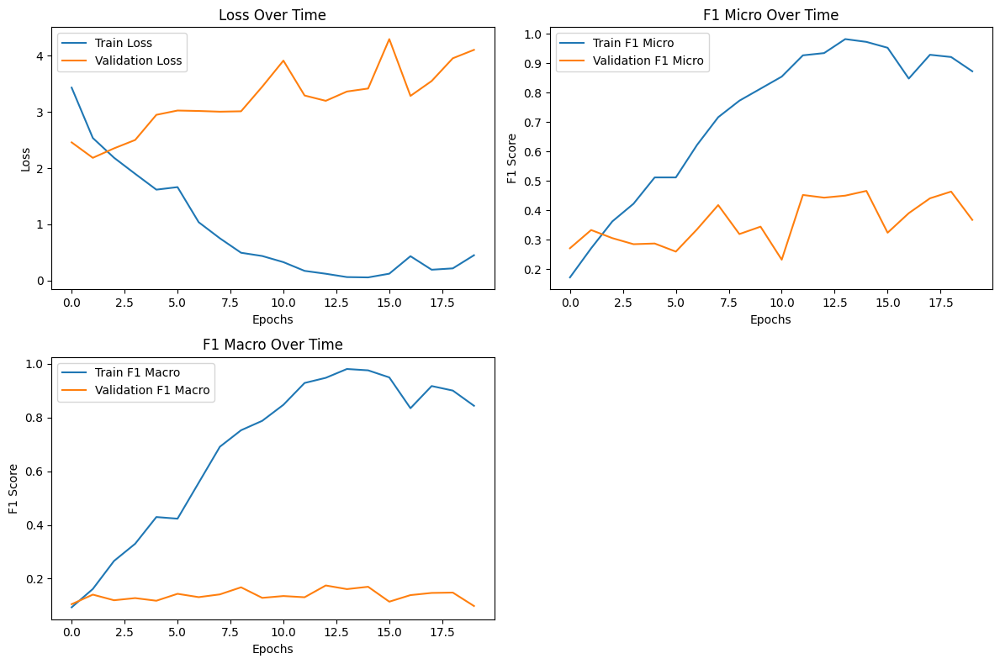

In [ ]:
#трансформер, с аугментациями шума и размытия, без флипа, с 8 головами, #lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import torch.nn.functional as F

# Определение устройства для вычислений
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'transformerWithMobileNet_8_heads_20_epochs')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'transformerWithMobileNet_8_heas_20_epochs_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithTransformBlock(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

Prediction Label: NormalVideos
Real Label: NormalVideos


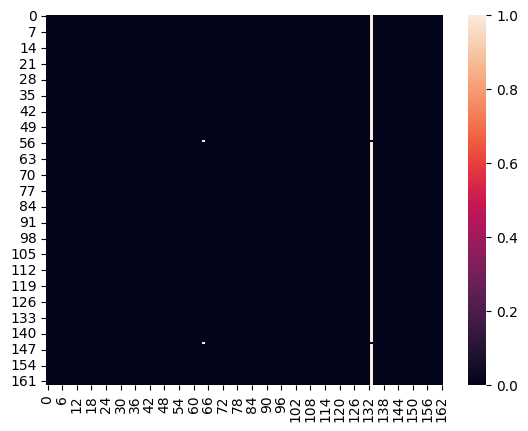

In [ ]:
import seaborn as sns
import torch.nn.functional as F

def calculate_attention(x, lengths_tensor, model):
    #### Preprocessing before transformer_encoder
    batch_size, sequence_length, C, H, W = x.size()

    x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
    x = model.features(x)
    # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']
    x = model.maxpool(x)
    # ? conv 3x3 channels=16 (если не будет получаться так, как есть)
    # ? если не будет получаться, каждый 5 кадр
    _, F, H_prime, W_prime = x.size()
    x = torch.flatten(x, start_dim=1)
    x = x.view(batch_size, sequence_length, -1)
    """[2, 3, 6] -> [[1, 1, 0, 0, 0, 0],
                      [1, 1, 1, 0, 0, 0],
                      [1, 1, 1, 1, 1, 1]]"""

    max_len_val = lengths_tensor.max()
    mask = torch.tensor(
        [
            [[1] * len_val + [0] * (max_len_val - len_val)] * len_val + \
              [[0] * max_len_val] * (max_len_val - len_val)
            for len_val in lengths_tensor
        ]
    ).unsqueeze(1).to(device)

    ##### Calculate attention
    attention_layer = model.transformer_block.layers[0].attention
    out = model.transformer_block.positional_encoder(x)
    key = out.clone()
    query = out.clone()
    value = out.clone()
    batch_size = key.size(0)
    seq_length = key.size(1)
    seq_length_query = query.size(1)

    key = key.view(batch_size, seq_length, attention_layer.n_heads, attention_layer.single_head_dim)
    query = query.view(batch_size, seq_length_query, attention_layer.n_heads, attention_layer.single_head_dim)
    value = value.view(batch_size, seq_length, attention_layer.n_heads, attention_layer.single_head_dim)

    k = attention_layer.key_matrix(key)
    q = attention_layer.query_matrix(query)
    v = attention_layer.value_matrix(value)

    q = q.transpose(1, 2)
    k = k.transpose(1, 2)
    v = v.transpose(1, 2)

    k_adjusted = k.transpose(-1, -2)
    product = torch.matmul(q, k_adjusted)

    if mask is not None:
        product = product.masked_fill(mask == 0, float("-1e20"))

    product = product / math.sqrt(attention_layer.single_head_dim)

    scores = nn.functional.softmax(product, dim=-1)

    return scores


def draw_attention_map(attention_matrix, lengths_tensor, idx, num_head):
    # attention_matrix -> [batch_size, n_heads, max_seq_len, max_seq_len]
    cur_seq = lengths_tensor[idx]
    attention_to_draw = attention_matrix[idx, num_head, :cur_seq, :cur_seq].cpu().detach().numpy() # [cur_seq, cur_seq]
    sns.heatmap(attention_to_draw)

filepath = '/content/drive/MyDrive/checkpoints/transformerWithMobileNet_8_heads_20_epochs/transformerWithMobileNet_8_heas_20_epochs_epoch_19_loss_4.1014_f1_micro_0.3670_f1_macro_0.0983.pth'
model = torch.load(filepath).to(device)
model.eval()
idx = 2
num_head = 7

#for x, labels, lengths_tensor in dataloaders['val']:
x = x.to(device)
attention_tensor = calculate_attention(x, lengths_tensor, model)


with torch.no_grad():
    outputs = model(x, lengths_tensor)

preds = outputs.argmax(dim=1).detach().cpu().numpy()
if not isinstance(labels, np.ndarray):
    labels = labels.detach().cpu().numpy()
draw_attention_map(
    attention_matrix=attention_tensor,
    lengths_tensor=lengths_tensor,
    idx=idx,
    num_head=num_head)

print(f"Prediction Label: {CLASS_NAMES[preds[idx]]}")
print(f"Real Label: {CLASS_NAMES[labels[idx]]}")

##Трансформер с аугментациями (излишними)

Epoch 1/20
----------


train:   1%|          | 1/130 [00:00<01:24,  1.53it/s]

torch.Size([8, 182, 4096])


train:   2%|▏         | 2/130 [00:01<01:52,  1.14it/s]

torch.Size([8, 364, 4096])


train:   2%|▏         | 3/130 [00:03<02:19,  1.10s/it]

torch.Size([8, 436, 4096])


train:   3%|▎         | 4/130 [00:03<02:02,  1.02it/s]

torch.Size([8, 143, 4096])


train:   4%|▍         | 5/130 [00:04<01:39,  1.25it/s]

torch.Size([8, 102, 4096])


train:   5%|▍         | 6/130 [00:04<01:20,  1.54it/s]

torch.Size([8, 107, 4096])


train:   5%|▌         | 7/130 [00:05<01:38,  1.24it/s]

torch.Size([8, 300, 4096])


train:   6%|▌         | 8/130 [00:06<01:40,  1.21it/s]

torch.Size([8, 274, 4096])


train:   7%|▋         | 9/130 [00:07<01:49,  1.11it/s]

torch.Size([8, 300, 4096])


train:   8%|▊         | 10/130 [00:08<01:44,  1.15it/s]

torch.Size([8, 186, 4096])


train:   8%|▊         | 11/130 [00:09<01:35,  1.24it/s]

torch.Size([8, 207, 4096])


train:   9%|▉         | 12/130 [00:09<01:25,  1.38it/s]

torch.Size([8, 151, 4096])


train:  10%|█         | 13/130 [00:10<01:12,  1.62it/s]

torch.Size([8, 87, 4096])


train:  11%|█         | 14/130 [00:11<01:44,  1.10it/s]

torch.Size([8, 438, 4096])


train:  12%|█▏        | 15/130 [00:12<01:53,  1.02it/s]

torch.Size([8, 429, 4096])


train:  12%|█▏        | 16/130 [00:14<01:58,  1.04s/it]

torch.Size([8, 438, 4096])


train:  13%|█▎        | 17/130 [00:15<02:13,  1.18s/it]

torch.Size([8, 485, 4096])


train:  14%|█▍        | 18/130 [00:16<02:11,  1.18s/it]

torch.Size([8, 283, 4096])


train:  15%|█▍        | 19/130 [00:17<01:47,  1.04it/s]

torch.Size([8, 126, 4096])


train:  15%|█▌        | 20/130 [00:18<01:46,  1.04it/s]

torch.Size([8, 224, 4096])


train:  16%|█▌        | 21/130 [00:18<01:39,  1.10it/s]

torch.Size([8, 281, 4096])


train:  17%|█▋        | 22/130 [00:19<01:20,  1.34it/s]

torch.Size([8, 62, 4096])


train:  18%|█▊        | 23/130 [00:20<01:36,  1.10it/s]

torch.Size([8, 452, 4096])


train:  18%|█▊        | 24/130 [00:21<01:40,  1.06it/s]

torch.Size([8, 335, 4096])


train:  19%|█▉        | 25/130 [00:22<01:44,  1.01it/s]

torch.Size([8, 344, 4096])


train:  20%|██        | 26/130 [00:23<01:44,  1.00s/it]

torch.Size([8, 259, 4096])


train:  21%|██        | 27/130 [00:24<01:49,  1.07s/it]

torch.Size([8, 300, 4096])


train:  22%|██▏       | 28/130 [00:26<02:02,  1.20s/it]

torch.Size([8, 461, 4096])


train:  22%|██▏       | 29/130 [00:27<01:52,  1.12s/it]

torch.Size([8, 298, 4096])


train:  23%|██▎       | 30/130 [00:27<01:35,  1.05it/s]

torch.Size([8, 158, 4096])


train:  24%|██▍       | 31/130 [00:28<01:25,  1.16it/s]

torch.Size([8, 152, 4096])


train:  25%|██▍       | 32/130 [00:29<01:25,  1.15it/s]

torch.Size([8, 221, 4096])


train:  25%|██▌       | 33/130 [00:30<01:37,  1.00s/it]

torch.Size([8, 472, 4096])


train:  26%|██▌       | 34/130 [00:31<01:23,  1.14it/s]

torch.Size([8, 137, 4096])


train:  27%|██▋       | 35/130 [00:31<01:13,  1.30it/s]

torch.Size([8, 142, 4096])


train:  28%|██▊       | 36/130 [00:32<01:09,  1.35it/s]

torch.Size([8, 190, 4096])


train:  28%|██▊       | 37/130 [00:33<01:06,  1.40it/s]

torch.Size([8, 171, 4096])


train:  29%|██▉       | 38/130 [00:33<01:01,  1.50it/s]

torch.Size([8, 152, 4096])


train:  30%|███       | 39/130 [00:34<00:57,  1.58it/s]

torch.Size([8, 132, 4096])


train:  31%|███       | 40/130 [00:35<01:04,  1.40it/s]

torch.Size([8, 240, 4096])


train:  32%|███▏      | 41/130 [00:35<01:03,  1.41it/s]

torch.Size([8, 208, 4096])


train:  32%|███▏      | 42/130 [00:36<01:05,  1.34it/s]

torch.Size([8, 190, 4096])


train:  33%|███▎      | 43/130 [00:37<01:04,  1.35it/s]

torch.Size([8, 154, 4096])


train:  34%|███▍      | 44/130 [00:38<01:05,  1.31it/s]

torch.Size([8, 239, 4096])


train:  35%|███▍      | 45/130 [00:39<01:04,  1.32it/s]

torch.Size([8, 213, 4096])


train:  35%|███▌      | 46/130 [00:40<01:16,  1.09it/s]

torch.Size([8, 390, 4096])


train:  36%|███▌      | 47/130 [00:40<01:07,  1.22it/s]

torch.Size([8, 154, 4096])


train:  37%|███▋      | 48/130 [00:42<01:25,  1.04s/it]

torch.Size([8, 401, 4096])


train:  38%|███▊      | 49/130 [00:43<01:21,  1.01s/it]

torch.Size([8, 278, 4096])


train:  38%|███▊      | 50/130 [00:44<01:17,  1.04it/s]

torch.Size([8, 298, 4096])


train:  39%|███▉      | 51/130 [00:45<01:16,  1.03it/s]

torch.Size([8, 290, 4096])


train:  40%|████      | 52/130 [00:45<01:06,  1.17it/s]

torch.Size([8, 112, 4096])


train:  41%|████      | 53/130 [00:46<00:57,  1.35it/s]

torch.Size([8, 122, 4096])


train:  42%|████▏     | 54/130 [00:47<00:57,  1.33it/s]

torch.Size([8, 221, 4096])


train:  42%|████▏     | 55/130 [00:48<01:10,  1.06it/s]

torch.Size([8, 394, 4096])


train:  43%|████▎     | 56/130 [00:49<01:12,  1.02it/s]

torch.Size([8, 300, 4096])


train:  44%|████▍     | 57/130 [00:50<01:17,  1.07s/it]

torch.Size([8, 354, 4096])


train:  45%|████▍     | 58/130 [00:51<01:16,  1.06s/it]

torch.Size([8, 216, 4096])


train:  45%|████▌     | 59/130 [00:52<01:07,  1.05it/s]

torch.Size([8, 208, 4096])


train:  46%|████▌     | 60/130 [00:53<01:02,  1.12it/s]

torch.Size([8, 192, 4096])


train:  47%|████▋     | 61/130 [00:54<00:59,  1.15it/s]

torch.Size([8, 267, 4096])


train:  48%|████▊     | 62/130 [00:54<00:57,  1.19it/s]

torch.Size([8, 222, 4096])


train:  48%|████▊     | 63/130 [00:55<00:51,  1.29it/s]

torch.Size([8, 112, 4096])


train:  49%|████▉     | 64/130 [00:56<00:56,  1.16it/s]

torch.Size([8, 360, 4096])


train:  50%|█████     | 65/130 [00:57<00:47,  1.37it/s]

torch.Size([8, 94, 4096])


train:  51%|█████     | 66/130 [00:57<00:48,  1.32it/s]

torch.Size([8, 240, 4096])


train:  52%|█████▏    | 67/130 [00:59<00:58,  1.08it/s]

torch.Size([8, 331, 4096])


train:  52%|█████▏    | 68/130 [01:00<01:05,  1.06s/it]

torch.Size([8, 472, 4096])


train:  53%|█████▎    | 69/130 [01:01<00:54,  1.11it/s]

torch.Size([8, 142, 4096])


train:  54%|█████▍    | 70/130 [01:01<00:44,  1.34it/s]

torch.Size([8, 100, 4096])


train:  55%|█████▍    | 71/130 [01:02<00:52,  1.12it/s]

torch.Size([8, 345, 4096])


train:  55%|█████▌    | 72/130 [01:03<00:57,  1.01it/s]

torch.Size([8, 299, 4096])


train:  56%|█████▌    | 73/130 [01:04<00:50,  1.13it/s]

torch.Size([8, 168, 4096])


train:  57%|█████▋    | 74/130 [01:06<01:04,  1.15s/it]

torch.Size([8, 432, 4096])


train:  58%|█████▊    | 75/130 [01:07<00:59,  1.08s/it]

torch.Size([8, 186, 4096])


train:  58%|█████▊    | 76/130 [01:08<01:04,  1.19s/it]

torch.Size([8, 332, 4096])


train:  59%|█████▉    | 77/130 [01:09<00:51,  1.03it/s]

torch.Size([8, 88, 4096])


train:  60%|██████    | 78/130 [01:09<00:47,  1.10it/s]

torch.Size([8, 197, 4096])


train:  61%|██████    | 79/130 [01:11<00:53,  1.05s/it]

torch.Size([8, 400, 4096])


train:  62%|██████▏   | 80/130 [01:12<00:49,  1.01it/s]

torch.Size([8, 244, 4096])


train:  62%|██████▏   | 81/130 [01:12<00:45,  1.08it/s]

torch.Size([8, 147, 4096])


train:  63%|██████▎   | 82/130 [01:13<00:39,  1.20it/s]

torch.Size([8, 194, 4096])


train:  64%|██████▍   | 83/130 [01:14<00:45,  1.04it/s]

torch.Size([8, 384, 4096])


train:  65%|██████▍   | 84/130 [01:16<00:52,  1.15s/it]

torch.Size([8, 436, 4096])


train:  65%|██████▌   | 85/130 [01:17<00:46,  1.03s/it]

torch.Size([8, 190, 4096])


train:  66%|██████▌   | 86/130 [01:17<00:37,  1.18it/s]

torch.Size([8, 123, 4096])


train:  67%|██████▋   | 87/130 [01:18<00:38,  1.12it/s]

torch.Size([8, 275, 4096])


train:  68%|██████▊   | 88/130 [01:19<00:40,  1.04it/s]

torch.Size([8, 300, 4096])


train:  68%|██████▊   | 89/130 [01:21<00:44,  1.08s/it]

torch.Size([8, 443, 4096])


train:  69%|██████▉   | 90/130 [01:22<00:47,  1.20s/it]

torch.Size([8, 410, 4096])


train:  70%|███████   | 91/130 [01:23<00:39,  1.02s/it]

torch.Size([8, 146, 4096])


train:  71%|███████   | 92/130 [01:24<00:38,  1.02s/it]

torch.Size([8, 353, 4096])


train:  72%|███████▏  | 93/130 [01:25<00:41,  1.12s/it]

torch.Size([8, 316, 4096])


train:  72%|███████▏  | 94/130 [01:26<00:34,  1.03it/s]

torch.Size([8, 146, 4096])


train:  73%|███████▎  | 95/130 [01:27<00:36,  1.06s/it]

torch.Size([8, 388, 4096])


train:  74%|███████▍  | 96/130 [01:28<00:33,  1.03it/s]

torch.Size([8, 226, 4096])


train:  75%|███████▍  | 97/130 [01:28<00:25,  1.27it/s]

torch.Size([8, 94, 4096])


train:  75%|███████▌  | 98/130 [01:29<00:30,  1.04it/s]

torch.Size([8, 376, 4096])


train:  76%|███████▌  | 99/130 [01:30<00:24,  1.27it/s]

torch.Size([8, 71, 4096])


train:  77%|███████▋  | 100/130 [01:31<00:24,  1.25it/s]

torch.Size([8, 280, 4096])


train:  78%|███████▊  | 101/130 [01:32<00:25,  1.15it/s]

torch.Size([8, 194, 4096])


train:  78%|███████▊  | 102/130 [01:32<00:21,  1.29it/s]

torch.Size([8, 120, 4096])


train:  79%|███████▉  | 103/130 [01:33<00:22,  1.21it/s]

torch.Size([8, 235, 4096])


train:  80%|████████  | 104/130 [01:34<00:22,  1.17it/s]

torch.Size([8, 300, 4096])


train:  81%|████████  | 105/130 [01:34<00:17,  1.39it/s]

torch.Size([8, 108, 4096])


train:  82%|████████▏ | 106/130 [01:36<00:20,  1.17it/s]

torch.Size([8, 301, 4096])


train:  82%|████████▏ | 107/130 [01:36<00:18,  1.21it/s]

torch.Size([8, 229, 4096])


train:  83%|████████▎ | 108/130 [01:37<00:17,  1.25it/s]

torch.Size([8, 221, 4096])


train:  84%|████████▍ | 109/130 [01:38<00:19,  1.09it/s]

torch.Size([8, 381, 4096])


train:  85%|████████▍ | 110/130 [01:40<00:23,  1.15s/it]

torch.Size([8, 404, 4096])


train:  85%|████████▌ | 111/130 [01:41<00:23,  1.21s/it]

torch.Size([8, 465, 4096])


train:  86%|████████▌ | 112/130 [01:42<00:21,  1.17s/it]

torch.Size([8, 293, 4096])


train:  87%|████████▋ | 113/130 [01:43<00:17,  1.02s/it]

torch.Size([8, 188, 4096])


train:  88%|████████▊ | 114/130 [01:44<00:15,  1.06it/s]

torch.Size([8, 301, 4096])


train:  88%|████████▊ | 115/130 [01:45<00:13,  1.13it/s]

torch.Size([8, 224, 4096])


train:  89%|████████▉ | 116/130 [01:46<00:13,  1.05it/s]

torch.Size([8, 275, 4096])


train:  90%|█████████ | 117/130 [01:47<00:13,  1.04s/it]

torch.Size([8, 402, 4096])


train:  91%|█████████ | 118/130 [01:48<00:13,  1.10s/it]

torch.Size([8, 378, 4096])


train:  92%|█████████▏| 119/130 [01:49<00:11,  1.03s/it]

torch.Size([8, 300, 4096])


train:  92%|█████████▏| 120/130 [01:50<00:08,  1.12it/s]

torch.Size([8, 122, 4096])


train:  93%|█████████▎| 121/130 [01:50<00:06,  1.38it/s]

torch.Size([8, 85, 4096])


train:  94%|█████████▍| 122/130 [01:52<00:07,  1.02it/s]

torch.Size([8, 449, 4096])


train:  95%|█████████▍| 123/130 [01:53<00:07,  1.02s/it]

torch.Size([8, 309, 4096])


train:  95%|█████████▌| 124/130 [01:54<00:06,  1.09s/it]

torch.Size([8, 299, 4096])


train:  96%|█████████▌| 125/130 [01:55<00:05,  1.03s/it]

torch.Size([8, 209, 4096])


train:  97%|█████████▋| 126/130 [01:56<00:04,  1.11s/it]

torch.Size([8, 331, 4096])


train:  98%|█████████▊| 127/130 [01:57<00:02,  1.02it/s]

torch.Size([8, 196, 4096])


train:  98%|█████████▊| 128/130 [01:57<00:01,  1.19it/s]

torch.Size([8, 159, 4096])


train:  99%|█████████▉| 129/130 [01:58<00:00,  1.08it/s]

torch.Size([8, 290, 4096])


train: 100%|██████████| 130/130 [01:59<00:00,  1.08it/s]


torch.Size([5, 397, 4096])
train Loss: 3.7133 F1 Micro: 0.1398 F1 Macro: 0.0653


val:   2%|▏         | 1/57 [00:01<01:31,  1.64s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:12,  1.32s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:47,  1.13it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:44,  1.20it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:05<00:50,  1.04it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:06<00:49,  1.02it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:47,  1.05it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:44,  1.11it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:47,  1.01it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:42,  1.10it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:10<00:35,  1.29it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:29,  1.54it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:11<00:30,  1.45it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:12<00:32,  1.32it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:27,  1.54it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:13<00:25,  1.63it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.84it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.65it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:20,  1.81it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:15<00:19,  1.89it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:17,  2.01it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:17<00:27,  1.26it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:25,  1.31it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.38it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.16it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:21<00:30,  1.00s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.16s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:32,  1.17s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.03s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.04s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.05s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:26,  1.12s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.06s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.04it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:30<00:17,  1.22it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.32it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:31<00:13,  1.44it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.43it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:12,  1.41it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:11,  1.43it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:34<00:10,  1.42it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.59it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.76it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.59it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.59it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.87it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.18it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:37<00:03,  2.32it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.29it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.85it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:39<00:02,  1.84it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.71it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.60it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.37it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.6860 F1 Micro: 0.0646 F1 Macro: 0.0348


Epoch 2/20
----------


train:   1%|          | 1/130 [00:01<02:16,  1.06s/it]

torch.Size([8, 283, 4096])


train:   2%|▏         | 2/130 [00:01<01:39,  1.29it/s]

torch.Size([8, 148, 4096])


train:   2%|▏         | 3/130 [00:02<01:20,  1.58it/s]

torch.Size([8, 97, 4096])


train:   3%|▎         | 4/130 [00:03<01:37,  1.29it/s]

torch.Size([8, 331, 4096])


train:   4%|▍         | 5/130 [00:04<02:06,  1.01s/it]

torch.Size([8, 429, 4096])


train:   5%|▍         | 6/130 [00:05<02:00,  1.03it/s]

torch.Size([8, 228, 4096])


train:   5%|▌         | 7/130 [00:06<01:59,  1.03it/s]

torch.Size([8, 249, 4096])


train:   6%|▌         | 8/130 [00:07<02:04,  1.02s/it]

torch.Size([8, 401, 4096])


train:   7%|▋         | 9/130 [00:08<02:04,  1.03s/it]

torch.Size([8, 300, 4096])


train:   8%|▊         | 10/130 [00:09<02:05,  1.05s/it]

torch.Size([8, 388, 4096])


train:   8%|▊         | 11/130 [00:10<02:10,  1.10s/it]

torch.Size([8, 335, 4096])


train:   9%|▉         | 12/130 [00:11<01:57,  1.01it/s]

torch.Size([8, 196, 4096])


train:  10%|█         | 13/130 [00:12<01:58,  1.01s/it]

torch.Size([8, 290, 4096])


train:  11%|█         | 14/130 [00:13<01:41,  1.14it/s]

torch.Size([8, 119, 4096])


train:  12%|█▏        | 15/130 [00:14<01:52,  1.02it/s]

torch.Size([8, 436, 4096])


train:  12%|█▏        | 16/130 [00:14<01:35,  1.20it/s]

torch.Size([8, 124, 4096])


train:  13%|█▎        | 17/130 [00:15<01:39,  1.14it/s]

torch.Size([8, 258, 4096])


train:  14%|█▍        | 18/130 [00:16<01:36,  1.16it/s]

torch.Size([8, 224, 4096])


train:  15%|█▍        | 19/130 [00:17<01:33,  1.18it/s]

torch.Size([8, 221, 4096])


train:  15%|█▌        | 20/130 [00:18<01:40,  1.10it/s]

torch.Size([8, 293, 4096])


train:  16%|█▌        | 21/130 [00:19<01:39,  1.09it/s]

torch.Size([8, 208, 4096])


train:  17%|█▋        | 22/130 [00:20<01:35,  1.13it/s]

torch.Size([8, 358, 4096])


train:  18%|█▊        | 23/130 [00:21<01:51,  1.05s/it]

torch.Size([8, 472, 4096])


train:  18%|█▊        | 24/130 [00:22<01:50,  1.04s/it]

torch.Size([8, 376, 4096])


train:  19%|█▉        | 25/130 [00:23<01:52,  1.07s/it]

torch.Size([8, 354, 4096])


train:  20%|██        | 26/130 [00:25<02:00,  1.16s/it]

torch.Size([8, 388, 4096])


train:  21%|██        | 27/130 [00:26<02:00,  1.17s/it]

torch.Size([8, 390, 4096])


train:  22%|██▏       | 28/130 [00:27<01:59,  1.18s/it]

torch.Size([8, 331, 4096])


train:  22%|██▏       | 29/130 [00:28<01:50,  1.10s/it]

torch.Size([8, 318, 4096])


train:  23%|██▎       | 30/130 [00:29<01:31,  1.10it/s]

torch.Size([8, 121, 4096])


train:  24%|██▍       | 31/130 [00:29<01:29,  1.11it/s]

torch.Size([8, 241, 4096])


train:  25%|██▍       | 32/130 [00:30<01:26,  1.13it/s]

torch.Size([8, 299, 4096])


train:  25%|██▌       | 33/130 [00:31<01:13,  1.32it/s]

torch.Size([8, 121, 4096])


train:  26%|██▌       | 34/130 [00:32<01:12,  1.32it/s]

torch.Size([8, 221, 4096])


train:  27%|██▋       | 35/130 [00:33<01:24,  1.12it/s]

torch.Size([8, 361, 4096])


train:  28%|██▊       | 36/130 [00:34<01:42,  1.09s/it]

torch.Size([8, 449, 4096])


train:  28%|██▊       | 37/130 [00:35<01:23,  1.11it/s]

torch.Size([8, 120, 4096])


train:  29%|██▉       | 38/130 [00:36<01:28,  1.04it/s]

torch.Size([8, 274, 4096])


train:  30%|███       | 39/130 [00:37<01:21,  1.11it/s]

torch.Size([8, 171, 4096])


train:  31%|███       | 40/130 [00:38<01:21,  1.10it/s]

torch.Size([8, 309, 4096])


train:  32%|███▏      | 41/130 [00:38<01:09,  1.29it/s]

torch.Size([8, 142, 4096])


train:  32%|███▏      | 42/130 [00:38<00:57,  1.53it/s]

torch.Size([8, 121, 4096])


train:  33%|███▎      | 43/130 [00:39<01:03,  1.36it/s]

torch.Size([8, 286, 4096])


train:  34%|███▍      | 44/130 [00:40<01:02,  1.38it/s]

torch.Size([8, 182, 4096])


train:  35%|███▍      | 45/130 [00:41<00:58,  1.46it/s]

torch.Size([8, 158, 4096])


train:  35%|███▌      | 46/130 [00:42<01:09,  1.21it/s]

torch.Size([8, 360, 4096])


train:  36%|███▌      | 47/130 [00:43<01:16,  1.08it/s]

torch.Size([8, 307, 4096])


train:  37%|███▋      | 48/130 [00:43<01:02,  1.30it/s]

torch.Size([8, 73, 4096])


train:  38%|███▊      | 49/130 [00:44<01:10,  1.15it/s]

torch.Size([8, 267, 4096])


train:  38%|███▊      | 50/130 [00:46<01:17,  1.03it/s]

torch.Size([8, 465, 4096])


train:  39%|███▉      | 51/130 [00:46<01:09,  1.14it/s]

torch.Size([8, 146, 4096])


train:  40%|████      | 52/130 [00:48<01:22,  1.06s/it]

torch.Size([8, 394, 4096])


train:  41%|████      | 53/130 [00:49<01:25,  1.11s/it]

torch.Size([8, 432, 4096])


train:  42%|████▏     | 54/130 [00:51<01:37,  1.28s/it]

torch.Size([8, 472, 4096])


train:  42%|████▏     | 55/130 [00:52<01:26,  1.16s/it]

torch.Size([8, 290, 4096])


train:  43%|████▎     | 56/130 [00:52<01:20,  1.09s/it]

torch.Size([8, 301, 4096])


train:  44%|████▍     | 57/130 [00:54<01:22,  1.13s/it]

torch.Size([8, 344, 4096])


train:  45%|████▍     | 58/130 [00:54<01:07,  1.06it/s]

torch.Size([8, 122, 4096])


train:  45%|████▌     | 59/130 [00:55<01:12,  1.02s/it]

torch.Size([8, 301, 4096])


train:  46%|████▌     | 60/130 [00:56<00:58,  1.20it/s]

torch.Size([8, 93, 4096])


train:  47%|████▋     | 61/130 [00:57<00:59,  1.16it/s]

torch.Size([8, 372, 4096])


train:  48%|████▊     | 62/130 [00:57<00:52,  1.30it/s]

torch.Size([8, 163, 4096])


train:  48%|████▊     | 63/130 [00:58<00:57,  1.17it/s]

torch.Size([8, 290, 4096])


train:  49%|████▉     | 64/130 [00:59<00:54,  1.22it/s]

torch.Size([8, 230, 4096])


train:  50%|█████     | 65/130 [01:00<00:52,  1.23it/s]

torch.Size([8, 194, 4096])


train:  51%|█████     | 66/130 [01:00<00:45,  1.40it/s]

torch.Size([8, 123, 4096])


train:  52%|█████▏    | 67/130 [01:01<00:51,  1.23it/s]

torch.Size([8, 247, 4096])


train:  52%|█████▏    | 68/130 [01:02<00:53,  1.15it/s]

torch.Size([8, 313, 4096])


train:  53%|█████▎    | 69/130 [01:04<00:57,  1.06it/s]

torch.Size([8, 364, 4096])


train:  54%|█████▍    | 70/130 [01:04<00:56,  1.06it/s]

torch.Size([8, 278, 4096])


train:  55%|█████▍    | 71/130 [01:05<00:48,  1.22it/s]

torch.Size([8, 146, 4096])


train:  55%|█████▌    | 72/130 [01:06<00:50,  1.14it/s]

torch.Size([8, 293, 4096])


train:  56%|█████▌    | 73/130 [01:07<00:51,  1.11it/s]

torch.Size([8, 300, 4096])


train:  57%|█████▋    | 74/130 [01:08<00:50,  1.12it/s]

torch.Size([8, 240, 4096])


train:  58%|█████▊    | 75/130 [01:08<00:43,  1.25it/s]

torch.Size([8, 120, 4096])


train:  58%|█████▊    | 76/130 [01:09<00:46,  1.17it/s]

torch.Size([8, 275, 4096])


train:  59%|█████▉    | 77/130 [01:10<00:39,  1.35it/s]

torch.Size([8, 123, 4096])


train:  60%|██████    | 78/130 [01:10<00:33,  1.56it/s]

torch.Size([8, 114, 4096])


train:  61%|██████    | 79/130 [01:11<00:30,  1.68it/s]

torch.Size([8, 163, 4096])


train:  62%|██████▏   | 80/130 [01:12<00:33,  1.51it/s]

torch.Size([8, 267, 4096])


train:  62%|██████▏   | 81/130 [01:12<00:34,  1.44it/s]

torch.Size([8, 192, 4096])


train:  63%|██████▎   | 82/130 [01:14<00:43,  1.10it/s]

torch.Size([8, 410, 4096])


train:  64%|██████▍   | 83/130 [01:14<00:36,  1.31it/s]

torch.Size([8, 146, 4096])


train:  65%|██████▍   | 84/130 [01:15<00:36,  1.27it/s]

torch.Size([8, 262, 4096])


train:  65%|██████▌   | 85/130 [01:16<00:36,  1.24it/s]

torch.Size([8, 316, 4096])


train:  66%|██████▌   | 86/130 [01:16<00:31,  1.38it/s]

torch.Size([8, 144, 4096])


train:  67%|██████▋   | 87/130 [01:18<00:44,  1.04s/it]

torch.Size([8, 485, 4096])


train:  68%|██████▊   | 88/130 [01:19<00:43,  1.04s/it]

torch.Size([8, 402, 4096])


train:  68%|██████▊   | 89/130 [01:20<00:35,  1.16it/s]

torch.Size([8, 103, 4096])


train:  69%|██████▉   | 90/130 [01:20<00:31,  1.26it/s]

torch.Size([8, 128, 4096])


train:  70%|███████   | 91/130 [01:21<00:34,  1.13it/s]

torch.Size([8, 299, 4096])


train:  71%|███████   | 92/130 [01:22<00:33,  1.15it/s]

torch.Size([8, 267, 4096])


train:  72%|███████▏  | 93/130 [01:23<00:33,  1.10it/s]

torch.Size([8, 229, 4096])


train:  72%|███████▏  | 94/130 [01:24<00:34,  1.05it/s]

torch.Size([8, 341, 4096])


train:  73%|███████▎  | 95/130 [01:25<00:29,  1.17it/s]

torch.Size([8, 198, 4096])


train:  74%|███████▍  | 96/130 [01:26<00:26,  1.30it/s]

torch.Size([8, 182, 4096])


train:  75%|███████▍  | 97/130 [01:26<00:24,  1.36it/s]

torch.Size([8, 180, 4096])


train:  75%|███████▌  | 98/130 [01:27<00:26,  1.22it/s]

torch.Size([8, 378, 4096])


train:  76%|███████▌  | 99/130 [01:28<00:22,  1.36it/s]

torch.Size([8, 129, 4096])


train:  77%|███████▋  | 100/130 [01:28<00:21,  1.42it/s]

torch.Size([8, 142, 4096])


train:  78%|███████▊  | 101/130 [01:30<00:26,  1.10it/s]

torch.Size([8, 381, 4096])


train:  78%|███████▊  | 102/130 [01:30<00:22,  1.24it/s]

torch.Size([8, 211, 4096])


train:  79%|███████▉  | 103/130 [01:32<00:26,  1.03it/s]

torch.Size([8, 436, 4096])


train:  80%|████████  | 104/130 [01:33<00:31,  1.21s/it]

torch.Size([8, 452, 4096])


train:  81%|████████  | 105/130 [01:35<00:29,  1.17s/it]

torch.Size([8, 300, 4096])


train:  82%|████████▏ | 106/130 [01:36<00:26,  1.11s/it]

torch.Size([8, 298, 4096])


train:  82%|████████▏ | 107/130 [01:36<00:24,  1.04s/it]

torch.Size([8, 300, 4096])


train:  83%|████████▎ | 108/130 [01:38<00:25,  1.14s/it]

torch.Size([8, 319, 4096])


train:  84%|████████▍ | 109/130 [01:39<00:24,  1.17s/it]

torch.Size([8, 404, 4096])


train:  85%|████████▍ | 110/130 [01:40<00:21,  1.10s/it]

torch.Size([8, 300, 4096])


train:  85%|████████▌ | 111/130 [01:41<00:21,  1.12s/it]

torch.Size([8, 461, 4096])


train:  86%|████████▌ | 112/130 [01:42<00:17,  1.00it/s]

torch.Size([8, 194, 4096])


train:  87%|████████▋ | 113/130 [01:44<00:20,  1.23s/it]

torch.Size([8, 438, 4096])


train:  88%|████████▊ | 114/130 [01:44<00:15,  1.04it/s]

torch.Size([8, 105, 4096])


train:  88%|████████▊ | 115/130 [01:45<00:13,  1.09it/s]

torch.Size([8, 240, 4096])


train:  89%|████████▉ | 116/130 [01:46<00:13,  1.03it/s]

torch.Size([8, 400, 4096])


train:  90%|█████████ | 117/130 [01:46<00:10,  1.22it/s]

torch.Size([8, 163, 4096])


train:  91%|█████████ | 118/130 [01:47<00:09,  1.24it/s]

torch.Size([8, 280, 4096])


train:  92%|█████████▏| 119/130 [01:48<00:08,  1.31it/s]

torch.Size([8, 186, 4096])


train:  92%|█████████▏| 120/130 [01:49<00:08,  1.14it/s]

torch.Size([8, 345, 4096])


train:  93%|█████████▎| 121/130 [01:50<00:07,  1.15it/s]

torch.Size([8, 353, 4096])


train:  94%|█████████▍| 122/130 [01:50<00:06,  1.25it/s]

torch.Size([8, 165, 4096])


train:  95%|█████████▍| 123/130 [01:52<00:06,  1.00it/s]

torch.Size([8, 420, 4096])


train:  95%|█████████▌| 124/130 [01:53<00:05,  1.10it/s]

torch.Size([8, 180, 4096])


train:  96%|█████████▌| 125/130 [01:53<00:04,  1.14it/s]

torch.Size([8, 203, 4096])


train:  97%|█████████▋| 126/130 [01:54<00:03,  1.12it/s]

torch.Size([8, 300, 4096])


train:  98%|█████████▊| 127/130 [01:55<00:02,  1.04it/s]

torch.Size([8, 397, 4096])


train:  98%|█████████▊| 128/130 [01:56<00:01,  1.12it/s]

torch.Size([8, 292, 4096])


train:  99%|█████████▉| 129/130 [01:57<00:00,  1.12it/s]

torch.Size([8, 300, 4096])


train: 100%|██████████| 130/130 [01:57<00:00,  1.10it/s]


torch.Size([5, 157, 4096])
train Loss: 2.8824 F1 Micro: 0.1784 F1 Macro: 0.1186


val:   2%|▏         | 1/57 [00:01<01:28,  1.59s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:10,  1.27s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:02<00:46,  1.17it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:43,  1.22it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:47,  1.09it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.08it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.13it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:41,  1.18it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:45,  1.06it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:40,  1.16it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:33,  1.36it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:09<00:27,  1.61it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.51it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:31,  1.37it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.59it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.69it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:12<00:20,  1.93it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:13,  2.73it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:19,  1.87it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  1.96it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.08it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.27it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.32it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:17<00:22,  1.39it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.17it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:29,  1.01it/s]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.17s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:32,  1.17s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:23<00:27,  1.02s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:24<00:26,  1.03s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.05s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:26,  1.11s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:23,  1.04s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:28<00:20,  1.06it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:16,  1.24it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:29<00:14,  1.34it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:12,  1.47it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.46it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:31<00:11,  1.45it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:32<00:10,  1.47it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.49it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:33<00:08,  1.64it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.82it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:34<00:07,  1.61it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.58it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:35<00:05,  1.86it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.18it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.31it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:36<00:01,  3.27it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.78it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.83it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:38<00:01,  1.67it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:39<00:01,  1.58it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:40<00:00,  1.40it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.2794 F1 Micro: 0.2361 F1 Macro: 0.0726


Epoch 3/20
----------


train:   1%|          | 1/130 [00:00<01:49,  1.18it/s]

torch.Size([8, 238, 4096])


train:   2%|▏         | 2/130 [00:01<01:20,  1.59it/s]

torch.Size([8, 161, 4096])


train:   2%|▏         | 3/130 [00:01<01:01,  2.05it/s]

torch.Size([8, 87, 4096])


train:   3%|▎         | 4/130 [00:02<01:28,  1.43it/s]

torch.Size([8, 388, 4096])


train:   4%|▍         | 5/130 [00:03<01:28,  1.41it/s]

torch.Size([8, 167, 4096])


train:   5%|▍         | 6/130 [00:04<01:24,  1.48it/s]

torch.Size([8, 175, 4096])


train:   5%|▌         | 7/130 [00:05<01:45,  1.17it/s]

torch.Size([8, 345, 4096])


train:   6%|▌         | 8/130 [00:05<01:39,  1.23it/s]

torch.Size([8, 267, 4096])


train:   7%|▋         | 9/130 [00:06<01:28,  1.37it/s]

torch.Size([8, 182, 4096])


train:   8%|▊         | 10/130 [00:07<01:41,  1.18it/s]

torch.Size([8, 358, 4096])


train:   8%|▊         | 11/130 [00:08<01:43,  1.15it/s]

torch.Size([8, 299, 4096])


train:   9%|▉         | 12/130 [00:09<01:36,  1.22it/s]

torch.Size([8, 226, 4096])


train:  10%|█         | 13/130 [00:10<01:44,  1.11it/s]

torch.Size([8, 420, 4096])


train:  11%|█         | 14/130 [00:11<01:39,  1.16it/s]

torch.Size([8, 179, 4096])


train:  12%|█▏        | 15/130 [00:11<01:38,  1.17it/s]

torch.Size([8, 249, 4096])


train:  12%|█▏        | 16/130 [00:13<01:59,  1.05s/it]

torch.Size([8, 388, 4096])


train:  13%|█▎        | 17/130 [00:15<02:18,  1.22s/it]

torch.Size([8, 384, 4096])


train:  14%|█▍        | 18/130 [00:15<01:53,  1.01s/it]

torch.Size([8, 121, 4096])


train:  15%|█▍        | 19/130 [00:16<01:50,  1.01it/s]

torch.Size([8, 290, 4096])


train:  15%|█▌        | 20/130 [00:18<02:09,  1.18s/it]

torch.Size([8, 432, 4096])


train:  16%|█▌        | 21/130 [00:18<01:49,  1.00s/it]

torch.Size([8, 213, 4096])


train:  17%|█▋        | 22/130 [00:19<01:27,  1.23it/s]

torch.Size([8, 124, 4096])


train:  18%|█▊        | 23/130 [00:19<01:23,  1.29it/s]

torch.Size([8, 208, 4096])


train:  18%|█▊        | 24/130 [00:21<01:41,  1.05it/s]

torch.Size([8, 401, 4096])


train:  19%|█▉        | 25/130 [00:22<01:42,  1.03it/s]

torch.Size([8, 290, 4096])


train:  20%|██        | 26/130 [00:22<01:36,  1.08it/s]

torch.Size([8, 240, 4096])


train:  21%|██        | 27/130 [00:23<01:24,  1.21it/s]

torch.Size([8, 180, 4096])


train:  22%|██▏       | 28/130 [00:24<01:19,  1.29it/s]

torch.Size([8, 165, 4096])


train:  22%|██▏       | 29/130 [00:25<01:30,  1.11it/s]

torch.Size([8, 429, 4096])


train:  23%|██▎       | 30/130 [00:26<01:22,  1.21it/s]

torch.Size([8, 158, 4096])


train:  24%|██▍       | 31/130 [00:26<01:22,  1.20it/s]

torch.Size([8, 292, 4096])


train:  25%|██▍       | 32/130 [00:27<01:26,  1.13it/s]

torch.Size([8, 344, 4096])


train:  25%|██▌       | 33/130 [00:28<01:17,  1.25it/s]

torch.Size([8, 150, 4096])


train:  26%|██▌       | 34/130 [00:29<01:12,  1.33it/s]

torch.Size([8, 188, 4096])


train:  27%|██▋       | 35/130 [00:29<01:00,  1.57it/s]

torch.Size([8, 80, 4096])


train:  28%|██▊       | 36/130 [00:30<00:57,  1.63it/s]

torch.Size([8, 109, 4096])


train:  28%|██▊       | 37/130 [00:30<01:02,  1.48it/s]

torch.Size([8, 301, 4096])


train:  29%|██▉       | 38/130 [00:31<01:02,  1.46it/s]

torch.Size([8, 259, 4096])


train:  30%|███       | 39/130 [00:32<01:05,  1.39it/s]

torch.Size([8, 221, 4096])


train:  31%|███       | 40/130 [00:33<01:16,  1.18it/s]

torch.Size([8, 390, 4096])


train:  32%|███▏      | 41/130 [00:35<01:34,  1.06s/it]

torch.Size([8, 465, 4096])


train:  32%|███▏      | 42/130 [00:35<01:24,  1.04it/s]

torch.Size([8, 171, 4096])


train:  33%|███▎      | 43/130 [00:36<01:19,  1.10it/s]

torch.Size([8, 258, 4096])


train:  34%|███▍      | 44/130 [00:37<01:08,  1.26it/s]

torch.Size([8, 104, 4096])


train:  35%|███▍      | 45/130 [00:38<01:14,  1.14it/s]

torch.Size([8, 300, 4096])


train:  35%|███▌      | 46/130 [00:38<01:09,  1.21it/s]

torch.Size([8, 262, 4096])


train:  36%|███▌      | 47/130 [00:39<01:10,  1.18it/s]

torch.Size([8, 224, 4096])


train:  37%|███▋      | 48/130 [00:40<01:01,  1.33it/s]

torch.Size([8, 120, 4096])


train:  38%|███▊      | 49/130 [00:41<01:02,  1.30it/s]

torch.Size([8, 198, 4096])


train:  38%|███▊      | 50/130 [00:42<01:08,  1.16it/s]

torch.Size([8, 300, 4096])


train:  39%|███▉      | 51/130 [00:43<01:19,  1.01s/it]

torch.Size([8, 331, 4096])


train:  40%|████      | 52/130 [00:45<01:43,  1.33s/it]

torch.Size([8, 472, 4096])


train:  41%|████      | 53/130 [00:46<01:28,  1.15s/it]

torch.Size([8, 221, 4096])


train:  42%|████▏     | 54/130 [00:47<01:21,  1.07s/it]

torch.Size([8, 278, 4096])


train:  42%|████▏     | 55/130 [00:48<01:12,  1.04it/s]

torch.Size([8, 145, 4096])


train:  43%|████▎     | 56/130 [00:49<01:13,  1.01it/s]

torch.Size([8, 275, 4096])


train:  44%|████▍     | 57/130 [00:49<01:09,  1.05it/s]

torch.Size([8, 267, 4096])


train:  45%|████▍     | 58/130 [00:51<01:18,  1.09s/it]

torch.Size([8, 449, 4096])


train:  45%|████▌     | 59/130 [00:52<01:08,  1.04it/s]

torch.Size([8, 221, 4096])


train:  46%|████▌     | 60/130 [00:52<00:59,  1.18it/s]

torch.Size([8, 103, 4096])


train:  47%|████▋     | 61/130 [00:53<00:57,  1.20it/s]

torch.Size([8, 267, 4096])


train:  48%|████▊     | 62/130 [00:54<01:05,  1.04it/s]

torch.Size([8, 376, 4096])


train:  48%|████▊     | 63/130 [00:55<00:57,  1.17it/s]

torch.Size([8, 185, 4096])


train:  49%|████▉     | 64/130 [00:56<00:59,  1.11it/s]

torch.Size([8, 353, 4096])


train:  50%|█████     | 65/130 [00:57<01:08,  1.06s/it]

torch.Size([8, 410, 4096])


train:  51%|█████     | 66/130 [00:58<01:11,  1.12s/it]

torch.Size([8, 461, 4096])


train:  52%|█████▏    | 67/130 [01:00<01:14,  1.19s/it]

torch.Size([8, 438, 4096])


train:  52%|█████▏    | 68/130 [01:00<01:00,  1.02it/s]

torch.Size([8, 126, 4096])


train:  53%|█████▎    | 69/130 [01:01<00:50,  1.20it/s]

torch.Size([8, 143, 4096])


train:  54%|█████▍    | 70/130 [01:02<00:49,  1.21it/s]

torch.Size([8, 293, 4096])


train:  55%|█████▍    | 71/130 [01:02<00:41,  1.42it/s]

torch.Size([8, 91, 4096])


train:  55%|█████▌    | 72/130 [01:03<00:52,  1.11it/s]

torch.Size([8, 364, 4096])


train:  56%|█████▌    | 73/130 [01:04<00:48,  1.17it/s]

torch.Size([8, 239, 4096])


train:  57%|█████▋    | 74/130 [01:05<00:43,  1.28it/s]

torch.Size([8, 142, 4096])


train:  58%|█████▊    | 75/130 [01:06<00:49,  1.10it/s]

torch.Size([8, 331, 4096])


train:  58%|█████▊    | 76/130 [01:07<00:57,  1.07s/it]

torch.Size([8, 397, 4096])


train:  59%|█████▉    | 77/130 [01:09<00:57,  1.09s/it]

torch.Size([8, 319, 4096])


train:  60%|██████    | 78/130 [01:09<00:53,  1.03s/it]

torch.Size([8, 298, 4096])


train:  61%|██████    | 79/130 [01:11<01:00,  1.19s/it]

torch.Size([8, 472, 4096])


train:  62%|██████▏   | 80/130 [01:12<00:54,  1.10s/it]

torch.Size([8, 253, 4096])


train:  62%|██████▏   | 81/130 [01:13<00:53,  1.10s/it]

torch.Size([8, 286, 4096])


train:  63%|██████▎   | 82/130 [01:14<00:56,  1.18s/it]

torch.Size([8, 381, 4096])


train:  64%|██████▍   | 83/130 [01:15<00:51,  1.11s/it]

torch.Size([8, 300, 4096])


train:  65%|██████▍   | 84/130 [01:16<00:49,  1.09s/it]

torch.Size([8, 221, 4096])


train:  65%|██████▌   | 85/130 [01:17<00:42,  1.07it/s]

torch.Size([8, 139, 4096])
torch.Size([8, 452, 4096])


train:  67%|██████▋   | 87/130 [01:20<00:46,  1.08s/it]

torch.Size([8, 300, 4096])


train:  68%|██████▊   | 88/130 [01:20<00:37,  1.11it/s]

torch.Size([8, 112, 4096])


train:  68%|██████▊   | 89/130 [01:21<00:41,  1.02s/it]

torch.Size([8, 372, 4096])


train:  69%|██████▉   | 90/130 [01:22<00:37,  1.05it/s]

torch.Size([8, 208, 4096])


train:  70%|███████   | 91/130 [01:23<00:39,  1.01s/it]

torch.Size([8, 318, 4096])


train:  71%|███████   | 92/130 [01:24<00:36,  1.04it/s]

torch.Size([8, 283, 4096])


train:  72%|███████▏  | 93/130 [01:25<00:35,  1.05it/s]

torch.Size([8, 221, 4096])


train:  72%|███████▏  | 94/130 [01:26<00:30,  1.17it/s]

torch.Size([8, 237, 4096])


train:  73%|███████▎  | 95/130 [01:27<00:32,  1.09it/s]

torch.Size([8, 300, 4096])


train:  74%|███████▍  | 96/130 [01:28<00:30,  1.10it/s]

torch.Size([8, 241, 4096])


train:  75%|███████▍  | 97/130 [01:29<00:30,  1.10it/s]

torch.Size([8, 229, 4096])


train:  75%|███████▌  | 98/130 [01:29<00:26,  1.21it/s]

torch.Size([8, 180, 4096])


train:  76%|███████▌  | 99/130 [01:30<00:25,  1.24it/s]

torch.Size([8, 203, 4096])


train:  77%|███████▋  | 100/130 [01:31<00:28,  1.05it/s]

torch.Size([8, 436, 4096])


train:  78%|███████▊  | 101/130 [01:32<00:30,  1.05s/it]

torch.Size([8, 360, 4096])


train:  78%|███████▊  | 102/130 [01:33<00:28,  1.00s/it]

torch.Size([8, 300, 4096])


train:  79%|███████▉  | 103/130 [01:35<00:28,  1.06s/it]

torch.Size([8, 299, 4096])


train:  80%|████████  | 104/130 [01:35<00:25,  1.01it/s]

torch.Size([8, 191, 4096])


train:  81%|████████  | 105/130 [01:36<00:25,  1.01s/it]

torch.Size([8, 378, 4096])


train:  82%|████████▏ | 106/130 [01:38<00:25,  1.06s/it]

torch.Size([8, 290, 4096])


train:  82%|████████▏ | 107/130 [01:39<00:23,  1.01s/it]

torch.Size([8, 249, 4096])


train:  83%|████████▎ | 108/130 [01:40<00:25,  1.16s/it]

torch.Size([8, 402, 4096])


train:  84%|████████▍ | 109/130 [01:41<00:22,  1.08s/it]

torch.Size([8, 209, 4096])


train:  85%|████████▍ | 110/130 [01:42<00:19,  1.02it/s]

torch.Size([8, 207, 4096])


train:  85%|████████▌ | 111/130 [01:42<00:16,  1.19it/s]

torch.Size([8, 113, 4096])


train:  86%|████████▌ | 112/130 [01:43<00:13,  1.36it/s]

torch.Size([8, 112, 4096])


train:  87%|████████▋ | 113/130 [01:44<00:13,  1.27it/s]

torch.Size([8, 301, 4096])


train:  88%|████████▊ | 114/130 [01:45<00:13,  1.15it/s]

torch.Size([8, 404, 4096])


train:  88%|████████▊ | 115/130 [01:46<00:13,  1.09it/s]

torch.Size([8, 275, 4096])


train:  89%|████████▉ | 116/130 [01:47<00:13,  1.01it/s]

torch.Size([8, 436, 4096])


train:  90%|█████████ | 117/130 [01:48<00:11,  1.09it/s]

torch.Size([8, 229, 4096])


train:  91%|█████████ | 118/130 [01:48<00:10,  1.17it/s]

torch.Size([8, 239, 4096])


train:  92%|█████████▏| 119/130 [01:49<00:09,  1.19it/s]

torch.Size([8, 176, 4096])
torch.Size([8, 485, 4096])


train:  93%|█████████▎| 121/130 [01:52<00:09,  1.03s/it]

torch.Size([8, 400, 4096])


train:  94%|█████████▍| 122/130 [01:53<00:08,  1.06s/it]

torch.Size([8, 335, 4096])


train:  95%|█████████▍| 123/130 [01:54<00:08,  1.15s/it]

torch.Size([8, 281, 4096])


train:  95%|█████████▌| 124/130 [01:55<00:06,  1.11s/it]

torch.Size([8, 361, 4096])


train:  96%|█████████▌| 125/130 [01:56<00:05,  1.03s/it]

torch.Size([8, 316, 4096])


train:  97%|█████████▋| 126/130 [01:57<00:03,  1.06it/s]

torch.Size([8, 217, 4096])


train:  98%|█████████▊| 127/130 [01:58<00:03,  1.09s/it]

torch.Size([8, 443, 4096])


train:  98%|█████████▊| 128/130 [01:59<00:01,  1.05it/s]

torch.Size([8, 148, 4096])


train:  99%|█████████▉| 129/130 [02:00<00:01,  1.00s/it]

torch.Size([8, 341, 4096])


train: 100%|██████████| 130/130 [02:00<00:00,  1.08it/s]


torch.Size([5, 157, 4096])
train Loss: 2.7167 F1 Micro: 0.2440 F1 Macro: 0.1405


val:   2%|▏         | 1/57 [00:01<01:30,  1.61s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:11,  1.29s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:46,  1.16it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:43,  1.22it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:48,  1.08it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.06it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.11it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:42,  1.15it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:46,  1.03it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:41,  1.13it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.33it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.58it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.48it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:31,  1.35it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.58it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.68it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:20,  1.92it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.71it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:19,  1.87it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  1.98it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.10it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:25,  1.31it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.36it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:22,  1.42it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:27,  1.13it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:31,  1.03s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:35,  1.21s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:34,  1.23s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:29,  1.08s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:28,  1.11s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:28,  1.12s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:28<00:28,  1.19s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:25,  1.12s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:22,  1.02s/it]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:30<00:18,  1.16it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.28it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:31<00:13,  1.43it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:32<00:12,  1.44it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.44it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:10,  1.48it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:34<00:09,  1.51it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.69it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:06,  1.87it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.70it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.69it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.98it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:03,  2.30it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:37<00:03,  2.45it/s]

torch.Size([8, 89, 4096])
torch.Size([8, 43, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.99it/s]

torch.Size([8, 44, 4096])
torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.86it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.68it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.61it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.38it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.6853 F1 Micro: 0.0935 F1 Macro: 0.0506


Epoch 4/20
----------


train:   1%|          | 1/130 [00:00<01:37,  1.33it/s]

torch.Size([8, 182, 4096])


train:   2%|▏         | 2/130 [00:02<02:14,  1.05s/it]

torch.Size([8, 292, 4096])


train:   2%|▏         | 3/130 [00:02<01:45,  1.20it/s]

torch.Size([8, 122, 4096])


train:   3%|▎         | 4/130 [00:03<01:44,  1.20it/s]

torch.Size([8, 194, 4096])
torch.Size([8, 449, 4096])


train:   5%|▍         | 6/130 [00:05<01:55,  1.08it/s]

torch.Size([8, 267, 4096])


train:   5%|▌         | 7/130 [00:06<01:43,  1.19it/s]

torch.Size([8, 176, 4096])


train:   6%|▌         | 8/130 [00:06<01:31,  1.33it/s]

torch.Size([8, 163, 4096])


train:   7%|▋         | 9/130 [00:07<01:27,  1.39it/s]

torch.Size([8, 197, 4096])


train:   8%|▊         | 10/130 [00:08<01:30,  1.32it/s]

torch.Size([8, 299, 4096])


train:   8%|▊         | 11/130 [00:08<01:31,  1.30it/s]

torch.Size([8, 240, 4096])


train:   9%|▉         | 12/130 [00:10<01:44,  1.13it/s]

torch.Size([8, 319, 4096])


train:  10%|█         | 13/130 [00:11<01:49,  1.07it/s]

torch.Size([8, 331, 4096])


train:  11%|█         | 14/130 [00:11<01:42,  1.13it/s]

torch.Size([8, 224, 4096])


train:  12%|█▏        | 15/130 [00:12<01:26,  1.32it/s]

torch.Size([8, 122, 4096])


train:  12%|█▏        | 16/130 [00:13<01:22,  1.38it/s]

torch.Size([8, 139, 4096])


train:  13%|█▎        | 17/130 [00:13<01:10,  1.59it/s]

torch.Size([8, 112, 4096])


train:  14%|█▍        | 18/130 [00:14<01:25,  1.30it/s]

torch.Size([8, 331, 4096])


train:  15%|█▍        | 19/130 [00:15<01:22,  1.35it/s]

torch.Size([8, 200, 4096])


train:  15%|█▌        | 20/130 [00:16<01:39,  1.10it/s]

torch.Size([8, 388, 4096])


train:  16%|█▌        | 21/130 [00:17<01:35,  1.14it/s]

torch.Size([8, 159, 4096])


train:  17%|█▋        | 22/130 [00:17<01:20,  1.34it/s]

torch.Size([8, 100, 4096])


train:  18%|█▊        | 23/130 [00:18<01:18,  1.36it/s]

torch.Size([8, 180, 4096])


train:  18%|█▊        | 24/130 [00:18<01:07,  1.58it/s]

torch.Size([8, 92, 4096])


train:  19%|█▉        | 25/130 [00:20<01:31,  1.14it/s]

torch.Size([8, 438, 4096])


train:  20%|██        | 26/130 [00:21<01:28,  1.18it/s]

torch.Size([8, 188, 4096])


train:  21%|██        | 27/130 [00:22<01:46,  1.03s/it]

torch.Size([8, 322, 4096])


train:  22%|██▏       | 28/130 [00:23<01:43,  1.01s/it]

torch.Size([8, 253, 4096])


train:  22%|██▏       | 29/130 [00:24<01:42,  1.01s/it]

torch.Size([8, 290, 4096])


train:  23%|██▎       | 30/130 [00:25<01:48,  1.09s/it]

torch.Size([8, 381, 4096])


train:  24%|██▍       | 31/130 [00:26<01:40,  1.02s/it]

torch.Size([8, 221, 4096])


train:  25%|██▍       | 32/130 [00:26<01:19,  1.24it/s]

torch.Size([8, 64, 4096])


train:  25%|██▌       | 33/130 [00:27<01:10,  1.37it/s]

torch.Size([8, 114, 4096])


train:  26%|██▌       | 34/130 [00:28<01:14,  1.29it/s]

torch.Size([8, 217, 4096])


train:  27%|██▋       | 35/130 [00:29<01:35,  1.01s/it]

torch.Size([8, 429, 4096])


train:  28%|██▊       | 36/130 [00:31<01:46,  1.13s/it]

torch.Size([8, 472, 4096])


train:  28%|██▊       | 37/130 [00:32<01:42,  1.10s/it]

torch.Size([8, 281, 4096])


train:  29%|██▉       | 38/130 [00:33<01:33,  1.01s/it]

torch.Size([8, 300, 4096])


train:  30%|███       | 39/130 [00:33<01:26,  1.05it/s]

torch.Size([8, 274, 4096])


train:  31%|███       | 40/130 [00:35<01:42,  1.14s/it]

torch.Size([8, 436, 4096])


train:  32%|███▏      | 41/130 [00:36<01:46,  1.20s/it]

torch.Size([8, 376, 4096])


train:  32%|███▏      | 42/130 [00:38<01:48,  1.23s/it]

torch.Size([8, 400, 4096])


train:  33%|███▎      | 43/130 [00:39<01:50,  1.27s/it]

torch.Size([8, 390, 4096])


train:  34%|███▍      | 44/130 [00:40<01:49,  1.28s/it]

torch.Size([8, 354, 4096])


train:  35%|███▍      | 45/130 [00:41<01:32,  1.09s/it]

torch.Size([8, 229, 4096])


train:  35%|███▌      | 46/130 [00:42<01:23,  1.01it/s]

torch.Size([8, 241, 4096])


train:  36%|███▌      | 47/130 [00:43<01:22,  1.01it/s]

torch.Size([8, 341, 4096])


train:  37%|███▋      | 48/130 [00:43<01:12,  1.13it/s]

torch.Size([8, 203, 4096])


train:  38%|███▊      | 49/130 [00:44<01:10,  1.15it/s]

torch.Size([8, 221, 4096])


train:  38%|███▊      | 50/130 [00:45<01:18,  1.02it/s]

torch.Size([8, 361, 4096])


train:  39%|███▉      | 51/130 [00:47<01:32,  1.18s/it]

torch.Size([8, 313, 4096])


train:  40%|████      | 52/130 [00:48<01:25,  1.10s/it]

torch.Size([8, 228, 4096])


train:  41%|████      | 53/130 [00:49<01:14,  1.03it/s]

torch.Size([8, 188, 4096])


train:  42%|████▏     | 54/130 [00:50<01:18,  1.03s/it]

torch.Size([8, 402, 4096])


train:  42%|████▏     | 55/130 [00:50<01:05,  1.14it/s]

torch.Size([8, 148, 4096])


train:  43%|████▎     | 56/130 [00:52<01:14,  1.01s/it]

torch.Size([8, 404, 4096])


train:  44%|████▍     | 57/130 [00:53<01:18,  1.07s/it]

torch.Size([8, 301, 4096])


train:  45%|████▍     | 58/130 [00:54<01:14,  1.04s/it]

torch.Size([8, 283, 4096])


train:  45%|████▌     | 59/130 [00:54<01:02,  1.14it/s]

torch.Size([8, 186, 4096])


train:  46%|████▌     | 60/130 [00:55<01:00,  1.15it/s]

torch.Size([8, 239, 4096])


train:  47%|████▋     | 61/130 [00:56<01:03,  1.09it/s]

torch.Size([8, 301, 4096])


train:  48%|████▊     | 62/130 [00:57<00:55,  1.21it/s]

torch.Size([8, 160, 4096])


train:  48%|████▊     | 63/130 [00:58<00:58,  1.15it/s]

torch.Size([8, 300, 4096])


train:  49%|████▉     | 64/130 [00:59<00:59,  1.11it/s]

torch.Size([8, 300, 4096])


train:  50%|█████     | 65/130 [01:00<01:05,  1.00s/it]

torch.Size([8, 401, 4096])


train:  51%|█████     | 66/130 [01:02<01:13,  1.15s/it]

torch.Size([8, 465, 4096])


train:  52%|█████▏    | 67/130 [01:03<01:13,  1.16s/it]

torch.Size([8, 300, 4096])


train:  52%|█████▏    | 68/130 [01:04<01:15,  1.22s/it]

torch.Size([8, 344, 4096])


train:  53%|█████▎    | 69/130 [01:05<01:06,  1.09s/it]

torch.Size([8, 259, 4096])


train:  54%|█████▍    | 70/130 [01:06<00:59,  1.00it/s]

torch.Size([8, 194, 4096])


train:  55%|█████▍    | 71/130 [01:06<00:49,  1.20it/s]

torch.Size([8, 120, 4096])


train:  55%|█████▌    | 72/130 [01:07<00:41,  1.40it/s]

torch.Size([8, 139, 4096])


train:  56%|█████▌    | 73/130 [01:08<00:45,  1.25it/s]

torch.Size([8, 309, 4096])


train:  57%|█████▋    | 74/130 [01:09<00:55,  1.02it/s]

torch.Size([8, 420, 4096])


train:  58%|█████▊    | 75/130 [01:10<00:49,  1.12it/s]

torch.Size([8, 171, 4096])


train:  58%|█████▊    | 76/130 [01:10<00:46,  1.17it/s]

torch.Size([8, 154, 4096])


train:  59%|█████▉    | 77/130 [01:11<00:39,  1.34it/s]

torch.Size([8, 121, 4096])


train:  60%|██████    | 78/130 [01:12<00:40,  1.28it/s]

torch.Size([8, 358, 4096])


train:  61%|██████    | 79/130 [01:13<00:40,  1.26it/s]

torch.Size([8, 210, 4096])


train:  62%|██████▏   | 80/130 [01:13<00:35,  1.40it/s]

torch.Size([8, 115, 4096])


train:  62%|██████▏   | 81/130 [01:14<00:43,  1.14it/s]

torch.Size([8, 438, 4096])


train:  63%|██████▎   | 82/130 [01:15<00:42,  1.12it/s]

torch.Size([8, 299, 4096])


train:  64%|██████▍   | 83/130 [01:16<00:37,  1.25it/s]

torch.Size([8, 145, 4096])


train:  65%|██████▍   | 84/130 [01:17<00:43,  1.05it/s]

torch.Size([8, 443, 4096])


train:  65%|██████▌   | 85/130 [01:19<00:48,  1.07s/it]

torch.Size([8, 410, 4096])


train:  66%|██████▌   | 86/130 [01:19<00:40,  1.09it/s]

torch.Size([8, 170, 4096])


train:  67%|██████▋   | 87/130 [01:20<00:32,  1.31it/s]

torch.Size([8, 91, 4096])


train:  68%|██████▊   | 88/130 [01:21<00:37,  1.13it/s]

torch.Size([8, 280, 4096])


train:  68%|██████▊   | 89/130 [01:21<00:34,  1.19it/s]

torch.Size([8, 197, 4096])


train:  69%|██████▉   | 90/130 [01:22<00:28,  1.38it/s]

torch.Size([8, 129, 4096])


train:  70%|███████   | 91/130 [01:23<00:30,  1.27it/s]

torch.Size([8, 278, 4096])


train:  71%|███████   | 92/130 [01:24<00:33,  1.13it/s]

torch.Size([8, 316, 4096])


train:  72%|███████▏  | 93/130 [01:25<00:29,  1.26it/s]

torch.Size([8, 165, 4096])


train:  72%|███████▏  | 94/130 [01:25<00:25,  1.42it/s]

torch.Size([8, 120, 4096])


train:  73%|███████▎  | 95/130 [01:25<00:20,  1.73it/s]

torch.Size([8, 75, 4096])


train:  74%|███████▍  | 96/130 [01:26<00:24,  1.37it/s]

torch.Size([8, 345, 4096])


train:  75%|███████▍  | 97/130 [01:28<00:28,  1.14it/s]

torch.Size([8, 397, 4096])


train:  75%|███████▌  | 98/130 [01:28<00:27,  1.16it/s]

torch.Size([8, 222, 4096])


train:  76%|███████▌  | 99/130 [01:30<00:29,  1.05it/s]

torch.Size([8, 315, 4096])


train:  77%|███████▋  | 100/130 [01:31<00:30,  1.01s/it]

torch.Size([8, 353, 4096])


train:  78%|███████▊  | 101/130 [01:32<00:31,  1.08s/it]

torch.Size([8, 258, 4096])


train:  78%|███████▊  | 102/130 [01:33<00:25,  1.08it/s]

torch.Size([8, 157, 4096])


train:  79%|███████▉  | 103/130 [01:33<00:24,  1.10it/s]

torch.Size([8, 275, 4096])


train:  80%|████████  | 104/130 [01:34<00:23,  1.12it/s]

torch.Size([8, 244, 4096])


train:  81%|████████  | 105/130 [01:35<00:20,  1.20it/s]

torch.Size([8, 208, 4096])


train:  82%|████████▏ | 106/130 [01:36<00:18,  1.29it/s]

torch.Size([8, 178, 4096])


train:  82%|████████▏ | 107/130 [01:36<00:18,  1.28it/s]

torch.Size([8, 301, 4096])


train:  83%|████████▎ | 108/130 [01:37<00:15,  1.38it/s]

torch.Size([8, 209, 4096])


train:  84%|████████▍ | 109/130 [01:37<00:13,  1.51it/s]

torch.Size([8, 108, 4096])


train:  85%|████████▍ | 110/130 [01:39<00:18,  1.09it/s]

torch.Size([8, 452, 4096])


train:  85%|████████▌ | 111/130 [01:40<00:19,  1.03s/it]

torch.Size([8, 432, 4096])


train:  86%|████████▌ | 112/130 [01:42<00:21,  1.17s/it]

torch.Size([8, 472, 4096])


train:  87%|████████▋ | 113/130 [01:43<00:17,  1.03s/it]

torch.Size([8, 180, 4096])


train:  88%|████████▊ | 114/130 [01:43<00:15,  1.06it/s]

torch.Size([8, 190, 4096])


train:  88%|████████▊ | 115/130 [01:45<00:16,  1.09s/it]

torch.Size([8, 388, 4096])


train:  89%|████████▉ | 116/130 [01:46<00:16,  1.14s/it]

torch.Size([8, 394, 4096])


train:  90%|█████████ | 117/130 [01:47<00:15,  1.21s/it]

torch.Size([8, 461, 4096])


train:  91%|█████████ | 118/130 [01:48<00:12,  1.06s/it]

torch.Size([8, 152, 4096])


train:  92%|█████████▏| 119/130 [01:49<00:10,  1.07it/s]

torch.Size([8, 185, 4096])
torch.Size([8, 485, 4096])


train:  93%|█████████▎| 121/130 [01:51<00:08,  1.02it/s]

torch.Size([8, 151, 4096])


train:  94%|█████████▍| 122/130 [01:52<00:07,  1.01it/s]

torch.Size([8, 267, 4096])


train:  95%|█████████▍| 123/130 [01:53<00:06,  1.14it/s]

torch.Size([8, 145, 4096])


train:  95%|█████████▌| 124/130 [01:53<00:05,  1.14it/s]

torch.Size([8, 300, 4096])


train:  96%|█████████▌| 125/130 [01:54<00:03,  1.28it/s]

torch.Size([8, 112, 4096])


train:  97%|█████████▋| 126/130 [01:55<00:02,  1.40it/s]

torch.Size([8, 113, 4096])


train:  98%|█████████▊| 127/130 [01:55<00:02,  1.41it/s]

torch.Size([8, 153, 4096])


train:  98%|█████████▊| 128/130 [01:56<00:01,  1.26it/s]

torch.Size([8, 364, 4096])


train:  99%|█████████▉| 129/130 [01:57<00:00,  1.10it/s]

torch.Size([8, 378, 4096])


train: 100%|██████████| 130/130 [01:58<00:00,  1.10it/s]


torch.Size([5, 275, 4096])
train Loss: 2.5203 F1 Micro: 0.2729 F1 Macro: 0.1705


val:   2%|▏         | 1/57 [00:01<01:27,  1.57s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:09,  1.26s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:02<00:45,  1.18it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:42,  1.24it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:47,  1.10it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.08it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.12it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:42,  1.16it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:48,  1.01s/it]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:43,  1.07it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:36,  1.24it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:30,  1.48it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:11<00:31,  1.39it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:12<00:33,  1.29it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:28,  1.49it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:13<00:25,  1.59it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:22,  1.80it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.56it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:21,  1.75it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:15<00:19,  1.84it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:17,  1.97it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:17<00:27,  1.23it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:18<00:25,  1.28it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:24,  1.31it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:27,  1.12it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:21<00:30,  1.02s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:34,  1.18s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:24<00:33,  1.18s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.03s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.06s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.08s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:28<00:27,  1.13s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:29<00:24,  1.07s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.03it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:30<00:17,  1.21it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.31it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:31<00:13,  1.44it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:32<00:12,  1.43it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.44it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:10,  1.46it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:34<00:10,  1.48it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.66it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:35<00:07,  1.83it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.64it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.63it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.92it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:37<00:04,  2.22it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:37<00:03,  2.37it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.34it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.91it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:39<00:02,  1.85it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.70it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.58it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.37it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.3163 F1 Micro: 0.2628 F1 Macro: 0.1176


Epoch 5/20
----------


train:   1%|          | 1/130 [00:00<01:27,  1.48it/s]

torch.Size([8, 168, 4096])


train:   2%|▏         | 2/130 [00:01<02:05,  1.02it/s]

torch.Size([8, 364, 4096])


train:   2%|▏         | 3/130 [00:02<02:12,  1.05s/it]

torch.Size([8, 376, 4096])


train:   3%|▎         | 4/130 [00:03<02:07,  1.01s/it]

torch.Size([8, 300, 4096])


train:   4%|▍         | 5/130 [00:04<01:52,  1.11it/s]

torch.Size([8, 226, 4096])


train:   5%|▍         | 6/130 [00:05<01:32,  1.35it/s]

torch.Size([8, 120, 4096])


train:   5%|▌         | 7/130 [00:06<01:45,  1.17it/s]

torch.Size([8, 290, 4096])


train:   6%|▌         | 8/130 [00:07<01:50,  1.10it/s]

torch.Size([8, 315, 4096])


train:   7%|▋         | 9/130 [00:08<01:46,  1.14it/s]

torch.Size([8, 300, 4096])


train:   8%|▊         | 10/130 [00:08<01:42,  1.17it/s]

torch.Size([8, 249, 4096])


train:   8%|▊         | 11/130 [00:09<01:52,  1.06it/s]

torch.Size([8, 429, 4096])


train:   9%|▉         | 12/130 [00:10<01:37,  1.21it/s]

torch.Size([8, 180, 4096])


train:  10%|█         | 13/130 [00:12<02:00,  1.03s/it]

torch.Size([8, 443, 4096])


train:  11%|█         | 14/130 [00:12<01:55,  1.01it/s]

torch.Size([8, 229, 4096])


train:  12%|█▏        | 15/130 [00:14<01:57,  1.03s/it]

torch.Size([8, 274, 4096])


train:  12%|█▏        | 16/130 [00:14<01:46,  1.07it/s]

torch.Size([8, 224, 4096])


train:  13%|█▎        | 17/130 [00:15<01:39,  1.14it/s]

torch.Size([8, 184, 4096])


train:  14%|█▍        | 18/130 [00:15<01:25,  1.32it/s]

torch.Size([8, 120, 4096])


train:  15%|█▍        | 19/130 [00:17<01:38,  1.13it/s]

torch.Size([8, 381, 4096])


train:  15%|█▌        | 20/130 [00:18<01:39,  1.10it/s]

torch.Size([8, 286, 4096])


train:  16%|█▌        | 21/130 [00:19<01:53,  1.04s/it]

torch.Size([8, 436, 4096])


train:  17%|█▋        | 22/130 [00:20<02:06,  1.17s/it]

torch.Size([8, 452, 4096])


train:  18%|█▊        | 23/130 [00:21<02:00,  1.12s/it]

torch.Size([8, 199, 4096])


train:  18%|█▊        | 24/130 [00:22<01:55,  1.09s/it]

torch.Size([8, 332, 4096])


train:  19%|█▉        | 25/130 [00:23<01:50,  1.05s/it]

torch.Size([8, 238, 4096])


train:  20%|██        | 26/130 [00:24<01:43,  1.01it/s]

torch.Size([8, 275, 4096])


train:  21%|██        | 27/130 [00:25<01:24,  1.22it/s]

torch.Size([8, 104, 4096])


train:  22%|██▏       | 28/130 [00:26<01:23,  1.22it/s]

torch.Size([8, 224, 4096])


train:  22%|██▏       | 29/130 [00:26<01:18,  1.28it/s]

torch.Size([8, 239, 4096])


train:  23%|██▎       | 30/130 [00:27<01:29,  1.11it/s]

torch.Size([8, 322, 4096])


train:  24%|██▍       | 31/130 [00:29<01:36,  1.03it/s]

torch.Size([8, 384, 4096])


train:  25%|██▍       | 32/130 [00:30<01:43,  1.06s/it]

torch.Size([8, 410, 4096])


train:  25%|██▌       | 33/130 [00:30<01:29,  1.09it/s]

torch.Size([8, 182, 4096])


train:  26%|██▌       | 34/130 [00:31<01:32,  1.04it/s]

torch.Size([8, 345, 4096])


train:  27%|██▋       | 35/130 [00:32<01:25,  1.11it/s]

torch.Size([8, 149, 4096])


train:  28%|██▊       | 36/130 [00:34<01:37,  1.04s/it]

torch.Size([8, 388, 4096])


train:  28%|██▊       | 37/130 [00:35<01:36,  1.03s/it]

torch.Size([8, 316, 4096])


train:  29%|██▉       | 38/130 [00:35<01:27,  1.05it/s]

torch.Size([8, 185, 4096])


train:  30%|███       | 39/130 [00:36<01:19,  1.14it/s]

torch.Size([8, 240, 4096])


train:  31%|███       | 40/130 [00:38<01:37,  1.08s/it]

torch.Size([8, 432, 4096])


train:  32%|███▏      | 41/130 [00:39<01:34,  1.06s/it]

torch.Size([8, 341, 4096])


train:  32%|███▏      | 42/130 [00:40<01:33,  1.07s/it]

torch.Size([8, 259, 4096])


train:  33%|███▎      | 43/130 [00:40<01:23,  1.05it/s]

torch.Size([8, 135, 4096])


train:  34%|███▍      | 44/130 [00:41<01:16,  1.12it/s]

torch.Size([8, 158, 4096])


train:  35%|███▍      | 45/130 [00:42<01:13,  1.15it/s]

torch.Size([8, 209, 4096])


train:  35%|███▌      | 46/130 [00:43<01:13,  1.14it/s]

torch.Size([8, 210, 4096])


train:  36%|███▌      | 47/130 [00:44<01:08,  1.20it/s]

torch.Size([8, 142, 4096])


train:  37%|███▋      | 48/130 [00:45<01:14,  1.11it/s]

torch.Size([8, 394, 4096])


train:  38%|███▊      | 49/130 [00:46<01:17,  1.04it/s]

torch.Size([8, 358, 4096])


train:  38%|███▊      | 50/130 [00:46<01:06,  1.20it/s]

torch.Size([8, 122, 4096])


train:  39%|███▉      | 51/130 [00:47<01:12,  1.10it/s]

torch.Size([8, 354, 4096])


train:  40%|████      | 52/130 [00:48<01:14,  1.05it/s]

torch.Size([8, 301, 4096])


train:  41%|████      | 53/130 [00:50<01:19,  1.03s/it]

torch.Size([8, 360, 4096])


train:  42%|████▏     | 54/130 [00:52<01:42,  1.35s/it]

torch.Size([8, 436, 4096])


train:  42%|████▏     | 55/130 [00:52<01:27,  1.17s/it]

torch.Size([8, 190, 4096])


train:  43%|████▎     | 56/130 [00:53<01:16,  1.04s/it]

torch.Size([8, 200, 4096])


train:  44%|████▍     | 57/130 [00:54<01:17,  1.06s/it]

torch.Size([8, 390, 4096])


train:  45%|████▍     | 58/130 [00:55<01:05,  1.09it/s]

torch.Size([8, 159, 4096])


train:  45%|████▌     | 59/130 [00:55<00:57,  1.24it/s]

torch.Size([8, 146, 4096])


train:  46%|████▌     | 60/130 [00:57<01:04,  1.08it/s]

torch.Size([8, 300, 4096])


train:  47%|████▋     | 61/130 [00:57<00:55,  1.25it/s]

torch.Size([8, 142, 4096])


train:  48%|████▊     | 62/130 [00:59<01:11,  1.05s/it]

torch.Size([8, 438, 4096])


train:  48%|████▊     | 63/130 [00:59<01:00,  1.11it/s]

torch.Size([8, 123, 4096])


train:  49%|████▉     | 64/130 [01:00<01:01,  1.08it/s]

torch.Size([8, 335, 4096])


train:  50%|█████     | 65/130 [01:01<00:58,  1.11it/s]

torch.Size([8, 222, 4096])


train:  51%|█████     | 66/130 [01:02<00:51,  1.25it/s]

torch.Size([8, 128, 4096])


train:  52%|█████▏    | 67/130 [01:02<00:48,  1.29it/s]

torch.Size([8, 226, 4096])


train:  52%|█████▏    | 68/130 [01:04<00:53,  1.16it/s]

torch.Size([8, 318, 4096])


train:  53%|█████▎    | 69/130 [01:04<00:51,  1.19it/s]

torch.Size([8, 188, 4096])


train:  54%|█████▍    | 70/130 [01:05<00:44,  1.35it/s]

torch.Size([8, 171, 4096])


train:  55%|█████▍    | 71/130 [01:06<00:45,  1.31it/s]

torch.Size([8, 237, 4096])


train:  55%|█████▌    | 72/130 [01:06<00:41,  1.38it/s]

torch.Size([8, 157, 4096])


train:  56%|█████▌    | 73/130 [01:07<00:40,  1.40it/s]

torch.Size([8, 191, 4096])


train:  57%|█████▋    | 74/130 [01:09<00:54,  1.03it/s]

torch.Size([8, 461, 4096])


train:  58%|█████▊    | 75/130 [01:09<00:48,  1.14it/s]

torch.Size([8, 292, 4096])


train:  58%|█████▊    | 76/130 [01:10<00:44,  1.22it/s]

torch.Size([8, 182, 4096])


train:  59%|█████▉    | 77/130 [01:11<00:48,  1.10it/s]

torch.Size([8, 299, 4096])


train:  60%|██████    | 78/130 [01:12<00:41,  1.24it/s]

torch.Size([8, 180, 4096])


train:  61%|██████    | 79/130 [01:12<00:36,  1.38it/s]

torch.Size([8, 111, 4096])


train:  62%|██████▏   | 80/130 [01:13<00:40,  1.22it/s]

torch.Size([8, 331, 4096])


train:  62%|██████▏   | 81/130 [01:14<00:41,  1.17it/s]

torch.Size([8, 290, 4096])


train:  63%|██████▎   | 82/130 [01:15<00:47,  1.01it/s]

torch.Size([8, 449, 4096])


train:  64%|██████▍   | 83/130 [01:16<00:42,  1.11it/s]

torch.Size([8, 208, 4096])


train:  65%|██████▍   | 84/130 [01:17<00:43,  1.07it/s]

torch.Size([8, 298, 4096])


train:  65%|██████▌   | 85/130 [01:18<00:45,  1.02s/it]

torch.Size([8, 309, 4096])


train:  66%|██████▌   | 86/130 [01:19<00:41,  1.05it/s]

torch.Size([8, 249, 4096])


train:  67%|██████▋   | 87/130 [01:20<00:38,  1.10it/s]

torch.Size([8, 299, 4096])


train:  68%|██████▊   | 88/130 [01:22<00:47,  1.13s/it]

torch.Size([8, 400, 4096])


train:  68%|██████▊   | 89/130 [01:22<00:40,  1.02it/s]

torch.Size([8, 194, 4096])


train:  69%|██████▉   | 90/130 [01:23<00:34,  1.18it/s]

torch.Size([8, 148, 4096])


train:  70%|███████   | 91/130 [01:24<00:34,  1.14it/s]

torch.Size([8, 299, 4096])


train:  71%|███████   | 92/130 [01:25<00:36,  1.03it/s]

torch.Size([8, 485, 4096])


train:  72%|███████▏  | 93/130 [01:26<00:40,  1.10s/it]

torch.Size([8, 472, 4096])


train:  72%|███████▏  | 94/130 [01:27<00:39,  1.09s/it]

torch.Size([8, 313, 4096])


train:  73%|███████▎  | 95/130 [01:28<00:33,  1.04it/s]

torch.Size([8, 142, 4096])


train:  74%|███████▍  | 96/130 [01:29<00:28,  1.20it/s]

torch.Size([8, 163, 4096])


train:  75%|███████▍  | 97/130 [01:30<00:33,  1.02s/it]

torch.Size([8, 404, 4096])


train:  75%|███████▌  | 98/130 [01:31<00:32,  1.03s/it]

torch.Size([8, 401, 4096])


train:  76%|███████▌  | 99/130 [01:32<00:31,  1.01s/it]

torch.Size([8, 262, 4096])


train:  77%|███████▋  | 100/130 [01:33<00:31,  1.05s/it]

torch.Size([8, 344, 4096])


train:  78%|███████▊  | 101/130 [01:34<00:26,  1.10it/s]

torch.Size([8, 164, 4096])


train:  78%|███████▊  | 102/130 [01:35<00:27,  1.00it/s]

torch.Size([8, 372, 4096])


train:  79%|███████▉  | 103/130 [01:36<00:26,  1.00it/s]

torch.Size([8, 229, 4096])


train:  80%|████████  | 104/130 [01:37<00:27,  1.04s/it]

torch.Size([8, 331, 4096])


train:  81%|████████  | 105/130 [01:38<00:28,  1.14s/it]

torch.Size([8, 465, 4096])


train:  82%|████████▏ | 106/130 [01:39<00:24,  1.02s/it]

torch.Size([8, 196, 4096])


train:  82%|████████▏ | 107/130 [01:40<00:22,  1.01it/s]

torch.Size([8, 300, 4096])


train:  83%|████████▎ | 108/130 [01:41<00:23,  1.09s/it]

torch.Size([8, 353, 4096])


train:  84%|████████▍ | 109/130 [01:42<00:21,  1.01s/it]

torch.Size([8, 293, 4096])


train:  85%|████████▍ | 110/130 [01:43<00:21,  1.08s/it]

torch.Size([8, 402, 4096])


train:  85%|████████▌ | 111/130 [01:44<00:18,  1.00it/s]

torch.Size([8, 253, 4096])


train:  86%|████████▌ | 112/130 [01:46<00:20,  1.16s/it]

torch.Size([8, 420, 4096])


train:  87%|████████▋ | 113/130 [01:47<00:21,  1.29s/it]

torch.Size([8, 472, 4096])


train:  88%|████████▊ | 114/130 [01:48<00:16,  1.06s/it]

torch.Size([8, 91, 4096])


train:  88%|████████▊ | 115/130 [01:49<00:15,  1.06s/it]

torch.Size([8, 319, 4096])


train:  89%|████████▉ | 116/130 [01:50<00:12,  1.10it/s]

torch.Size([8, 163, 4096])


train:  90%|█████████ | 117/130 [01:50<00:10,  1.21it/s]

torch.Size([8, 221, 4096])


train:  91%|█████████ | 118/130 [01:51<00:09,  1.25it/s]

torch.Size([8, 221, 4096])


train:  92%|█████████▏| 119/130 [01:52<00:09,  1.12it/s]

torch.Size([8, 283, 4096])


train:  92%|█████████▏| 120/130 [01:53<00:08,  1.22it/s]

torch.Size([8, 188, 4096])


train:  93%|█████████▎| 121/130 [01:53<00:06,  1.29it/s]

torch.Size([8, 149, 4096])


train:  94%|█████████▍| 122/130 [01:54<00:05,  1.41it/s]

torch.Size([8, 147, 4096])


train:  95%|█████████▍| 123/130 [01:55<00:05,  1.36it/s]

torch.Size([8, 278, 4096])


train:  95%|█████████▌| 124/130 [01:56<00:04,  1.30it/s]

torch.Size([8, 228, 4096])


train:  96%|█████████▌| 125/130 [01:57<00:04,  1.03it/s]

torch.Size([8, 361, 4096])


train:  97%|█████████▋| 126/130 [01:58<00:03,  1.05it/s]

torch.Size([8, 281, 4096])


train:  98%|█████████▊| 127/130 [01:59<00:02,  1.16it/s]

torch.Size([8, 180, 4096])


train:  98%|█████████▊| 128/130 [01:59<00:01,  1.18it/s]

torch.Size([8, 239, 4096])


train:  99%|█████████▉| 129/130 [02:01<00:00,  1.01it/s]

torch.Size([8, 438, 4096])


train: 100%|██████████| 130/130 [02:01<00:00,  1.07it/s]


torch.Size([5, 91, 4096])
train Loss: 2.4561 F1 Micro: 0.2768 F1 Macro: 0.1706


val:   2%|▏         | 1/57 [00:01<01:31,  1.64s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:11,  1.29s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:46,  1.15it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:43,  1.21it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:47,  1.10it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.08it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:43,  1.14it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:41,  1.18it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:45,  1.05it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:40,  1.15it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.34it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.57it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:30,  1.46it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:32,  1.33it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.56it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.65it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.89it/s]

torch.Size([8, 73, 4096])


val:  32%|███▏      | 18/57 [00:13<00:17,  2.22it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:20,  1.84it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  1.94it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:17,  2.06it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.28it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.33it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.39it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.16it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:29,  1.01it/s]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.16s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:32,  1.17s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.02s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.04s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.06s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:26,  1.12s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.07s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.04it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.22it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.33it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:13,  1.46it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.45it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.44it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:32<00:11,  1.44it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.47it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:33<00:08,  1.65it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.84it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.65it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.64it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:35<00:05,  1.95it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:03,  2.29it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.42it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:36<00:01,  3.41it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.97it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.87it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.72it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:39<00:01,  1.63it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:40<00:00,  1.40it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.6698 F1 Micro: 0.0935 F1 Macro: 0.0613


Epoch 6/20
----------


train:   1%|          | 1/130 [00:00<01:07,  1.90it/s]

torch.Size([8, 120, 4096])


train:   2%|▏         | 2/130 [00:01<01:33,  1.36it/s]

torch.Size([8, 280, 4096])


train:   2%|▏         | 3/130 [00:02<02:17,  1.08s/it]

torch.Size([8, 452, 4096])


train:   3%|▎         | 4/130 [00:03<02:13,  1.06s/it]

torch.Size([8, 241, 4096])


train:   4%|▍         | 5/130 [00:04<01:44,  1.20it/s]

torch.Size([8, 115, 4096])


train:   5%|▍         | 6/130 [00:04<01:25,  1.45it/s]

torch.Size([8, 120, 4096])


train:   5%|▌         | 7/130 [00:05<01:17,  1.58it/s]

torch.Size([8, 108, 4096])


train:   6%|▌         | 8/130 [00:06<01:43,  1.18it/s]

torch.Size([8, 318, 4096])


train:   7%|▋         | 9/130 [00:07<01:40,  1.21it/s]

torch.Size([8, 199, 4096])


train:   8%|▊         | 10/130 [00:08<01:45,  1.14it/s]

torch.Size([8, 300, 4096])


train:   8%|▊         | 11/130 [00:09<01:50,  1.07it/s]

torch.Size([8, 301, 4096])


train:   9%|▉         | 12/130 [00:10<01:58,  1.00s/it]

torch.Size([8, 449, 4096])


train:  10%|█         | 13/130 [00:11<01:48,  1.08it/s]

torch.Size([8, 197, 4096])


train:  11%|█         | 14/130 [00:11<01:38,  1.18it/s]

torch.Size([8, 183, 4096])


train:  12%|█▏        | 15/130 [00:12<01:36,  1.19it/s]

torch.Size([8, 313, 4096])


train:  12%|█▏        | 16/130 [00:13<01:42,  1.11it/s]

torch.Size([8, 345, 4096])


train:  13%|█▎        | 17/130 [00:14<01:38,  1.15it/s]

torch.Size([8, 239, 4096])


train:  14%|█▍        | 18/130 [00:15<01:35,  1.17it/s]

torch.Size([8, 237, 4096])


train:  15%|█▍        | 19/130 [00:16<01:25,  1.30it/s]

torch.Size([8, 154, 4096])


train:  15%|█▌        | 20/130 [00:16<01:20,  1.37it/s]

torch.Size([8, 221, 4096])


train:  16%|█▌        | 21/130 [00:17<01:28,  1.23it/s]

torch.Size([8, 354, 4096])


train:  17%|█▋        | 22/130 [00:19<01:49,  1.01s/it]

torch.Size([8, 436, 4096])


train:  18%|█▊        | 23/130 [00:19<01:37,  1.10it/s]

torch.Size([8, 145, 4096])


train:  18%|█▊        | 24/130 [00:20<01:17,  1.38it/s]

torch.Size([8, 61, 4096])


train:  19%|█▉        | 25/130 [00:20<01:15,  1.39it/s]

torch.Size([8, 208, 4096])


train:  20%|██        | 26/130 [00:21<01:14,  1.40it/s]

torch.Size([8, 165, 4096])


train:  21%|██        | 27/130 [00:22<01:26,  1.19it/s]

torch.Size([8, 404, 4096])


train:  22%|██▏       | 28/130 [00:23<01:23,  1.22it/s]

torch.Size([8, 281, 4096])


train:  22%|██▏       | 29/130 [00:24<01:42,  1.02s/it]

torch.Size([8, 420, 4096])


train:  23%|██▎       | 30/130 [00:25<01:39,  1.01it/s]

torch.Size([8, 274, 4096])


train:  24%|██▍       | 31/130 [00:26<01:32,  1.07it/s]

torch.Size([8, 249, 4096])


train:  25%|██▍       | 32/130 [00:27<01:35,  1.02it/s]

torch.Size([8, 358, 4096])


train:  25%|██▌       | 33/130 [00:28<01:21,  1.19it/s]

torch.Size([8, 120, 4096])


train:  26%|██▌       | 34/130 [00:29<01:28,  1.09it/s]

torch.Size([8, 299, 4096])


train:  27%|██▋       | 35/130 [00:30<01:31,  1.04it/s]

torch.Size([8, 299, 4096])


train:  28%|██▊       | 36/130 [00:31<01:28,  1.06it/s]

torch.Size([8, 301, 4096])


train:  28%|██▊       | 37/130 [00:32<01:28,  1.05it/s]

torch.Size([8, 299, 4096])


train:  29%|██▉       | 38/130 [00:33<01:40,  1.09s/it]

torch.Size([8, 472, 4096])


train:  30%|███       | 39/130 [00:34<01:37,  1.07s/it]

torch.Size([8, 240, 4096])


train:  31%|███       | 40/130 [00:35<01:20,  1.12it/s]

torch.Size([8, 142, 4096])


train:  32%|███▏      | 41/130 [00:35<01:11,  1.24it/s]

torch.Size([8, 190, 4096])


train:  32%|███▏      | 42/130 [00:36<01:10,  1.25it/s]

torch.Size([8, 222, 4096])


train:  33%|███▎      | 43/130 [00:37<01:15,  1.16it/s]

torch.Size([8, 300, 4096])


train:  34%|███▍      | 44/130 [00:39<01:37,  1.13s/it]

torch.Size([8, 465, 4096])


train:  35%|███▍      | 45/130 [00:40<01:33,  1.10s/it]

torch.Size([8, 226, 4096])


train:  35%|███▌      | 46/130 [00:41<01:20,  1.05it/s]

torch.Size([8, 137, 4096])


train:  36%|███▌      | 47/130 [00:41<01:06,  1.26it/s]

torch.Size([8, 149, 4096])


train:  37%|███▋      | 48/130 [00:42<01:07,  1.22it/s]

torch.Size([8, 300, 4096])


train:  38%|███▊      | 49/130 [00:43<01:04,  1.25it/s]

torch.Size([8, 200, 4096])


train:  38%|███▊      | 50/130 [00:43<00:58,  1.36it/s]

torch.Size([8, 163, 4096])


train:  39%|███▉      | 51/130 [00:44<00:59,  1.33it/s]

torch.Size([8, 267, 4096])


train:  40%|████      | 52/130 [00:46<01:24,  1.08s/it]

torch.Size([8, 436, 4096])


train:  41%|████      | 53/130 [00:47<01:24,  1.09s/it]

torch.Size([8, 300, 4096])


train:  42%|████▏     | 54/130 [00:48<01:19,  1.04s/it]

torch.Size([8, 235, 4096])


train:  42%|████▏     | 55/130 [00:49<01:19,  1.06s/it]

torch.Size([8, 253, 4096])


train:  43%|████▎     | 56/130 [00:50<01:12,  1.03it/s]

torch.Size([8, 228, 4096])


train:  44%|████▍     | 57/130 [00:50<01:04,  1.13it/s]

torch.Size([8, 160, 4096])


train:  45%|████▍     | 58/130 [00:51<00:51,  1.39it/s]

torch.Size([8, 75, 4096])


train:  45%|████▌     | 59/130 [00:52<01:02,  1.14it/s]

torch.Size([8, 290, 4096])


train:  46%|████▌     | 60/130 [00:53<01:01,  1.15it/s]

torch.Size([8, 192, 4096])


train:  47%|████▋     | 61/130 [00:54<01:07,  1.02it/s]

torch.Size([8, 322, 4096])


train:  48%|████▊     | 62/130 [00:55<00:59,  1.13it/s]

torch.Size([8, 171, 4096])


train:  48%|████▊     | 63/130 [00:56<01:06,  1.00it/s]

torch.Size([8, 378, 4096])


train:  49%|████▉     | 64/130 [00:56<00:54,  1.21it/s]

torch.Size([8, 100, 4096])


train:  50%|█████     | 65/130 [00:57<00:57,  1.12it/s]

torch.Size([8, 390, 4096])


train:  51%|█████     | 66/130 [00:58<00:57,  1.11it/s]

torch.Size([8, 240, 4096])


train:  52%|█████▏    | 67/130 [00:59<00:54,  1.15it/s]

torch.Size([8, 298, 4096])


train:  52%|█████▏    | 68/130 [01:00<00:57,  1.07it/s]

torch.Size([8, 331, 4096])


train:  53%|█████▎    | 69/130 [01:01<00:56,  1.09it/s]

torch.Size([8, 291, 4096])


train:  54%|█████▍    | 70/130 [01:02<00:54,  1.09it/s]

torch.Size([8, 332, 4096])


train:  55%|█████▍    | 71/130 [01:04<01:04,  1.10s/it]

torch.Size([8, 485, 4096])


train:  55%|█████▌    | 72/130 [01:05<01:02,  1.08s/it]

torch.Size([8, 239, 4096])


train:  56%|█████▌    | 73/130 [01:06<01:04,  1.12s/it]

torch.Size([8, 388, 4096])


train:  57%|█████▋    | 74/130 [01:07<01:07,  1.20s/it]

torch.Size([8, 432, 4096])


train:  58%|█████▊    | 75/130 [01:09<01:12,  1.31s/it]

torch.Size([8, 443, 4096])


train:  58%|█████▊    | 76/130 [01:10<01:10,  1.31s/it]

torch.Size([8, 401, 4096])


train:  59%|█████▉    | 77/130 [01:11<00:58,  1.10s/it]

torch.Size([8, 207, 4096])


train:  60%|██████    | 78/130 [01:12<00:58,  1.12s/it]

torch.Size([8, 384, 4096])


train:  61%|██████    | 79/130 [01:13<00:50,  1.01it/s]

torch.Size([8, 186, 4096])


train:  62%|██████▏   | 80/130 [01:13<00:45,  1.09it/s]

torch.Size([8, 262, 4096])


train:  62%|██████▏   | 81/130 [01:14<00:42,  1.16it/s]

torch.Size([8, 240, 4096])


train:  63%|██████▎   | 82/130 [01:15<00:47,  1.01it/s]

torch.Size([8, 307, 4096])


train:  64%|██████▍   | 83/130 [01:16<00:47,  1.02s/it]

torch.Size([8, 388, 4096])


train:  65%|██████▍   | 84/130 [01:17<00:47,  1.03s/it]

torch.Size([8, 364, 4096])


train:  65%|██████▌   | 85/130 [01:18<00:43,  1.04it/s]

torch.Size([8, 258, 4096])


train:  66%|██████▌   | 86/130 [01:19<00:45,  1.03s/it]

torch.Size([8, 372, 4096])


train:  67%|██████▋   | 87/130 [01:20<00:40,  1.06it/s]

torch.Size([8, 196, 4096])


train:  68%|██████▊   | 88/130 [01:22<00:46,  1.10s/it]

torch.Size([8, 438, 4096])


train:  68%|██████▊   | 89/130 [01:23<00:46,  1.14s/it]

torch.Size([8, 472, 4096])


train:  69%|██████▉   | 90/130 [01:24<00:42,  1.06s/it]

torch.Size([8, 186, 4096])


train:  70%|███████   | 91/130 [01:24<00:33,  1.17it/s]

torch.Size([8, 79, 4096])


train:  71%|███████   | 92/130 [01:25<00:29,  1.30it/s]

torch.Size([8, 150, 4096])


train:  72%|███████▏  | 93/130 [01:26<00:35,  1.04it/s]

torch.Size([8, 335, 4096])


train:  72%|███████▏  | 94/130 [01:27<00:29,  1.22it/s]

torch.Size([8, 92, 4096])


train:  73%|███████▎  | 95/130 [01:27<00:26,  1.31it/s]

torch.Size([8, 177, 4096])


train:  74%|███████▍  | 96/130 [01:29<00:32,  1.05it/s]

torch.Size([8, 410, 4096])


train:  75%|███████▍  | 97/130 [01:29<00:28,  1.17it/s]

torch.Size([8, 175, 4096])


train:  75%|███████▌  | 98/130 [01:30<00:27,  1.18it/s]

torch.Size([8, 250, 4096])


train:  76%|███████▌  | 99/130 [01:31<00:25,  1.24it/s]

torch.Size([8, 194, 4096])


train:  77%|███████▋  | 100/130 [01:32<00:25,  1.17it/s]

torch.Size([8, 249, 4096])


train:  78%|███████▊  | 101/130 [01:32<00:21,  1.35it/s]

torch.Size([8, 120, 4096])


train:  78%|███████▊  | 102/130 [01:33<00:18,  1.51it/s]

torch.Size([8, 124, 4096])


train:  79%|███████▉  | 103/130 [01:34<00:21,  1.23it/s]

torch.Size([8, 353, 4096])


train:  80%|████████  | 104/130 [01:35<00:20,  1.26it/s]

torch.Size([8, 209, 4096])


train:  81%|████████  | 105/130 [01:36<00:24,  1.02it/s]

torch.Size([8, 429, 4096])


train:  82%|████████▏ | 106/130 [01:37<00:26,  1.08s/it]

torch.Size([8, 394, 4096])


train:  82%|████████▏ | 107/130 [01:39<00:27,  1.18s/it]

torch.Size([8, 461, 4096])


train:  83%|████████▎ | 108/130 [01:40<00:24,  1.09s/it]

torch.Size([8, 293, 4096])


train:  84%|████████▍ | 109/130 [01:41<00:22,  1.08s/it]

torch.Size([8, 319, 4096])


train:  85%|████████▍ | 110/130 [01:42<00:22,  1.11s/it]

torch.Size([8, 301, 4096])


train:  85%|████████▌ | 111/130 [01:43<00:20,  1.08s/it]

torch.Size([8, 263, 4096])


train:  86%|████████▌ | 112/130 [01:44<00:20,  1.14s/it]

torch.Size([8, 300, 4096])


train:  87%|████████▋ | 113/130 [01:45<00:20,  1.20s/it]

torch.Size([8, 400, 4096])


train:  88%|████████▊ | 114/130 [01:46<00:17,  1.12s/it]

torch.Size([8, 293, 4096])


train:  88%|████████▊ | 115/130 [01:47<00:16,  1.07s/it]

torch.Size([8, 316, 4096])


train:  89%|████████▉ | 116/130 [01:48<00:13,  1.03it/s]

torch.Size([8, 182, 4096])


train:  90%|█████████ | 117/130 [01:49<00:12,  1.07it/s]

torch.Size([8, 214, 4096])


train:  91%|█████████ | 118/130 [01:49<00:08,  1.35it/s]

torch.Size([8, 60, 4096])


train:  92%|█████████▏| 119/130 [01:51<00:11,  1.04s/it]

torch.Size([8, 438, 4096])


train:  92%|█████████▏| 120/130 [01:52<00:09,  1.11it/s]

torch.Size([8, 123, 4096])


train:  93%|█████████▎| 121/130 [01:53<00:09,  1.00s/it]

torch.Size([8, 341, 4096])


train:  94%|█████████▍| 122/130 [01:54<00:08,  1.09s/it]

torch.Size([8, 397, 4096])


train:  95%|█████████▍| 123/130 [01:55<00:07,  1.14s/it]

torch.Size([8, 259, 4096])


train:  95%|█████████▌| 124/130 [01:56<00:05,  1.05it/s]

torch.Size([8, 154, 4096])


train:  96%|█████████▌| 125/130 [01:57<00:04,  1.14it/s]

torch.Size([8, 190, 4096])


train:  97%|█████████▋| 126/130 [01:57<00:03,  1.19it/s]

torch.Size([8, 224, 4096])


train:  98%|█████████▊| 127/130 [01:58<00:02,  1.29it/s]

torch.Size([8, 187, 4096])


train:  98%|█████████▊| 128/130 [01:59<00:01,  1.24it/s]

torch.Size([8, 300, 4096])


train:  99%|█████████▉| 129/130 [02:00<00:00,  1.15it/s]

torch.Size([8, 331, 4096])


train: 100%|██████████| 130/130 [02:00<00:00,  1.08it/s]


torch.Size([5, 169, 4096])
train Loss: 2.4590 F1 Micro: 0.2710 F1 Macro: 0.1920


val:   2%|▏         | 1/57 [00:01<01:40,  1.80s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:13,  1.34s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:48,  1.12it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:43,  1.22it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:47,  1.09it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.08it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.13it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:41,  1.18it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:45,  1.05it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:41,  1.14it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.34it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.59it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.50it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:31,  1.35it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.56it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.66it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.89it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.68it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:20,  1.79it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:15<00:18,  1.92it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:17,  2.04it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.27it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:25,  1.31it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.37it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:27,  1.14it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:30,  1.02s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:34,  1.17s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:33,  1.18s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.04s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.04s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.05s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:26,  1.10s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:23,  1.04s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:20,  1.06it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:16,  1.25it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:14,  1.36it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:12,  1.50it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.48it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.44it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:32<00:10,  1.46it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.48it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.64it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.83it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.64it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.65it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.93it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.24it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.40it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.34it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.85it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.86it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.72it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:39<00:01,  1.64it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:40<00:00,  1.40it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.3446 F1 Micro: 0.2918 F1 Macro: 0.1085


Epoch 7/20
----------


train:   1%|          | 1/130 [00:00<01:27,  1.47it/s]

torch.Size([8, 240, 4096])


train:   2%|▏         | 2/130 [00:01<01:29,  1.43it/s]

torch.Size([8, 186, 4096])


train:   2%|▏         | 3/130 [00:02<01:34,  1.35it/s]

torch.Size([8, 318, 4096])


train:   3%|▎         | 4/130 [00:03<02:07,  1.01s/it]

torch.Size([8, 354, 4096])


train:   4%|▍         | 5/130 [00:04<02:14,  1.08s/it]

torch.Size([8, 267, 4096])


train:   5%|▍         | 6/130 [00:05<01:55,  1.08it/s]

torch.Size([8, 114, 4096])


train:   5%|▌         | 7/130 [00:05<01:37,  1.26it/s]

torch.Size([8, 115, 4096])


train:   6%|▌         | 8/130 [00:06<01:30,  1.34it/s]

torch.Size([8, 146, 4096])


train:   7%|▋         | 9/130 [00:07<01:24,  1.44it/s]

torch.Size([8, 126, 4096])


train:   8%|▊         | 10/130 [00:07<01:19,  1.50it/s]

torch.Size([8, 148, 4096])


train:   8%|▊         | 11/130 [00:08<01:36,  1.23it/s]

torch.Size([8, 410, 4096])


train:   9%|▉         | 12/130 [00:10<01:53,  1.04it/s]

torch.Size([8, 309, 4096])


train:  10%|█         | 13/130 [00:11<02:09,  1.11s/it]

torch.Size([8, 307, 4096])


train:  11%|█         | 14/130 [00:12<01:58,  1.02s/it]

torch.Size([8, 213, 4096])


train:  12%|█▏        | 15/130 [00:13<01:58,  1.03s/it]

torch.Size([8, 300, 4096])


train:  12%|█▏        | 16/130 [00:14<01:55,  1.01s/it]

torch.Size([8, 300, 4096])


train:  13%|█▎        | 17/130 [00:15<01:37,  1.16it/s]

torch.Size([8, 114, 4096])
torch.Size([8, 461, 4096])


train:  15%|█▍        | 19/130 [00:17<02:01,  1.09s/it]

torch.Size([8, 401, 4096])


train:  15%|█▌        | 20/130 [00:18<01:42,  1.08it/s]

torch.Size([8, 171, 4096])


train:  16%|█▌        | 21/130 [00:19<01:48,  1.00it/s]

torch.Size([8, 378, 4096])


train:  17%|█▋        | 22/130 [00:20<01:41,  1.06it/s]

torch.Size([8, 239, 4096])


train:  18%|█▊        | 23/130 [00:21<01:39,  1.08it/s]

torch.Size([8, 301, 4096])


train:  18%|█▊        | 24/130 [00:21<01:30,  1.17it/s]

torch.Size([8, 157, 4096])


train:  19%|█▉        | 25/130 [00:22<01:24,  1.24it/s]

torch.Size([8, 207, 4096])


train:  20%|██        | 26/130 [00:23<01:22,  1.25it/s]

torch.Size([8, 226, 4096])


train:  21%|██        | 27/130 [00:24<01:26,  1.19it/s]

torch.Size([8, 230, 4096])


train:  22%|██▏       | 28/130 [00:25<01:28,  1.15it/s]

torch.Size([8, 283, 4096])


train:  22%|██▏       | 29/130 [00:25<01:13,  1.38it/s]

torch.Size([8, 75, 4096])


train:  23%|██▎       | 30/130 [00:26<01:10,  1.43it/s]

torch.Size([8, 145, 4096])


train:  24%|██▍       | 31/130 [00:26<01:09,  1.42it/s]

torch.Size([8, 146, 4096])


train:  25%|██▍       | 32/130 [00:27<01:05,  1.50it/s]

torch.Size([8, 159, 4096])


train:  25%|██▌       | 33/130 [00:28<01:06,  1.46it/s]

torch.Size([8, 299, 4096])


train:  26%|██▌       | 34/130 [00:29<01:14,  1.30it/s]

torch.Size([8, 209, 4096])


train:  27%|██▋       | 35/130 [00:30<01:16,  1.24it/s]

torch.Size([8, 221, 4096])


train:  28%|██▊       | 36/130 [00:30<01:15,  1.25it/s]

torch.Size([8, 216, 4096])


train:  28%|██▊       | 37/130 [00:32<01:25,  1.08it/s]

torch.Size([8, 345, 4096])


train:  29%|██▉       | 38/130 [00:33<01:31,  1.01it/s]

torch.Size([8, 300, 4096])


train:  30%|███       | 39/130 [00:33<01:20,  1.13it/s]

torch.Size([8, 197, 4096])


train:  31%|███       | 40/130 [00:34<01:20,  1.11it/s]

torch.Size([8, 300, 4096])


train:  32%|███▏      | 41/130 [00:36<01:26,  1.03it/s]

torch.Size([8, 344, 4096])


train:  32%|███▏      | 42/130 [00:36<01:25,  1.03it/s]

torch.Size([8, 301, 4096])


train:  33%|███▎      | 43/130 [00:38<01:27,  1.01s/it]

torch.Size([8, 332, 4096])


train:  34%|███▍      | 44/130 [00:39<01:32,  1.07s/it]

torch.Size([8, 465, 4096])


train:  35%|███▍      | 45/130 [00:40<01:45,  1.24s/it]

torch.Size([8, 452, 4096])


train:  35%|███▌      | 46/130 [00:42<01:54,  1.37s/it]

torch.Size([8, 432, 4096])


train:  36%|███▌      | 47/130 [00:43<01:32,  1.11s/it]

torch.Size([8, 133, 4096])


train:  37%|███▋      | 48/130 [00:43<01:14,  1.11it/s]

torch.Size([8, 80, 4096])


train:  38%|███▊      | 49/130 [00:44<01:03,  1.27it/s]

torch.Size([8, 224, 4096])


train:  38%|███▊      | 50/130 [00:45<01:07,  1.18it/s]

torch.Size([8, 364, 4096])


train:  39%|███▉      | 51/130 [00:46<01:10,  1.13it/s]

torch.Size([8, 313, 4096])


train:  40%|████      | 52/130 [00:46<01:09,  1.12it/s]

torch.Size([8, 275, 4096])


train:  41%|████      | 53/130 [00:48<01:13,  1.05it/s]

torch.Size([8, 293, 4096])


train:  42%|████▏     | 54/130 [00:49<01:13,  1.03it/s]

torch.Size([8, 372, 4096])


train:  42%|████▏     | 55/130 [00:49<01:05,  1.14it/s]

torch.Size([8, 238, 4096])


train:  43%|████▎     | 56/130 [00:50<01:13,  1.00it/s]

torch.Size([8, 472, 4096])


train:  44%|████▍     | 57/130 [00:51<01:09,  1.05it/s]

torch.Size([8, 211, 4096])


train:  45%|████▍     | 58/130 [00:52<01:02,  1.15it/s]

torch.Size([8, 217, 4096])


train:  45%|████▌     | 59/130 [00:53<01:12,  1.02s/it]

torch.Size([8, 436, 4096])


train:  46%|████▌     | 60/130 [00:54<01:03,  1.10it/s]

torch.Size([8, 188, 4096])


train:  47%|████▋     | 61/130 [00:54<00:53,  1.29it/s]

torch.Size([8, 182, 4096])


train:  48%|████▊     | 62/130 [00:56<01:03,  1.07it/s]

torch.Size([8, 319, 4096])


train:  48%|████▊     | 63/130 [00:57<01:04,  1.04it/s]

torch.Size([8, 249, 4096])


train:  49%|████▉     | 64/130 [00:58<01:01,  1.07it/s]

torch.Size([8, 208, 4096])


train:  50%|█████     | 65/130 [00:58<00:55,  1.17it/s]

torch.Size([8, 161, 4096])


train:  51%|█████     | 66/130 [01:00<01:01,  1.05it/s]

torch.Size([8, 394, 4096])


train:  52%|█████▏    | 67/130 [01:00<00:52,  1.20it/s]

torch.Size([8, 122, 4096])


train:  52%|█████▏    | 68/130 [01:01<00:45,  1.35it/s]

torch.Size([8, 152, 4096])


train:  53%|█████▎    | 69/130 [01:02<00:53,  1.15it/s]

torch.Size([8, 376, 4096])


train:  54%|█████▍    | 70/130 [01:03<00:59,  1.01it/s]

torch.Size([8, 388, 4096])


train:  55%|█████▍    | 71/130 [01:04<00:57,  1.02it/s]

torch.Size([8, 290, 4096])


train:  55%|█████▌    | 72/130 [01:05<00:51,  1.12it/s]

torch.Size([8, 126, 4096])


train:  56%|█████▌    | 73/130 [01:06<00:57,  1.01s/it]

torch.Size([8, 485, 4096])


train:  57%|█████▋    | 74/130 [01:07<00:58,  1.04s/it]

torch.Size([8, 402, 4096])


train:  58%|█████▊    | 75/130 [01:08<00:51,  1.06it/s]

torch.Size([8, 229, 4096])


train:  58%|█████▊    | 76/130 [01:09<00:47,  1.14it/s]

torch.Size([8, 183, 4096])


train:  59%|█████▉    | 77/130 [01:10<00:54,  1.03s/it]

torch.Size([8, 397, 4096])


train:  60%|██████    | 78/130 [01:11<00:57,  1.10s/it]

torch.Size([8, 449, 4096])


train:  61%|██████    | 79/130 [01:12<00:54,  1.08s/it]

torch.Size([8, 229, 4096])


train:  62%|██████▏   | 80/130 [01:13<00:56,  1.13s/it]

torch.Size([8, 404, 4096])


train:  62%|██████▏   | 81/130 [01:14<00:49,  1.01s/it]

torch.Size([8, 180, 4096])


train:  63%|██████▎   | 82/130 [01:15<00:48,  1.00s/it]

torch.Size([8, 262, 4096])


train:  64%|██████▍   | 83/130 [01:17<00:53,  1.14s/it]

torch.Size([8, 436, 4096])


train:  65%|██████▍   | 84/130 [01:18<00:49,  1.07s/it]

torch.Size([8, 247, 4096])


train:  65%|██████▌   | 85/130 [01:18<00:44,  1.00it/s]

torch.Size([8, 291, 4096])


train:  66%|██████▌   | 86/130 [01:19<00:40,  1.08it/s]

torch.Size([8, 241, 4096])


train:  67%|██████▋   | 87/130 [01:20<00:42,  1.01it/s]

torch.Size([8, 298, 4096])


train:  68%|██████▊   | 88/130 [01:21<00:37,  1.12it/s]

torch.Size([8, 180, 4096])


train:  68%|██████▊   | 89/130 [01:22<00:37,  1.10it/s]

torch.Size([8, 263, 4096])


train:  69%|██████▉   | 90/130 [01:22<00:32,  1.21it/s]

torch.Size([8, 161, 4096])


train:  70%|███████   | 91/130 [01:24<00:41,  1.06s/it]

torch.Size([8, 443, 4096])


train:  71%|███████   | 92/130 [01:25<00:41,  1.10s/it]

torch.Size([8, 300, 4096])


train:  72%|███████▏  | 93/130 [01:26<00:39,  1.07s/it]

torch.Size([8, 240, 4096])


train:  72%|███████▏  | 94/130 [01:27<00:32,  1.12it/s]

torch.Size([8, 93, 4096])


train:  73%|███████▎  | 95/130 [01:28<00:37,  1.06s/it]

torch.Size([8, 420, 4096])


train:  74%|███████▍  | 96/130 [01:29<00:29,  1.14it/s]

torch.Size([8, 95, 4096])


train:  75%|███████▍  | 97/130 [01:29<00:23,  1.43it/s]

torch.Size([8, 69, 4096])


train:  75%|███████▌  | 98/130 [01:30<00:28,  1.12it/s]

torch.Size([8, 388, 4096])


train:  76%|███████▌  | 99/130 [01:31<00:25,  1.22it/s]

torch.Size([8, 150, 4096])


train:  77%|███████▋  | 100/130 [01:32<00:27,  1.11it/s]

torch.Size([8, 381, 4096])


train:  78%|███████▊  | 101/130 [01:33<00:25,  1.12it/s]

torch.Size([8, 248, 4096])


train:  78%|███████▊  | 102/130 [01:34<00:23,  1.21it/s]

torch.Size([8, 190, 4096])


train:  79%|███████▉  | 103/130 [01:34<00:20,  1.32it/s]

torch.Size([8, 208, 4096])


train:  80%|████████  | 104/130 [01:35<00:24,  1.08it/s]

torch.Size([8, 300, 4096])


train:  81%|████████  | 105/130 [01:36<00:19,  1.28it/s]

torch.Size([8, 112, 4096])


train:  82%|████████▏ | 106/130 [01:37<00:23,  1.02it/s]

torch.Size([8, 390, 4096])


train:  82%|████████▏ | 107/130 [01:38<00:19,  1.16it/s]

torch.Size([8, 129, 4096])


train:  83%|████████▎ | 108/130 [01:39<00:19,  1.13it/s]

torch.Size([8, 300, 4096])


train:  84%|████████▍ | 109/130 [01:40<00:20,  1.03it/s]

torch.Size([8, 360, 4096])


train:  85%|████████▍ | 110/130 [01:41<00:20,  1.01s/it]

torch.Size([8, 400, 4096])


train:  85%|████████▌ | 111/130 [01:42<00:19,  1.02s/it]

torch.Size([8, 290, 4096])


train:  86%|████████▌ | 112/130 [01:44<00:20,  1.13s/it]

torch.Size([8, 429, 4096])


train:  87%|████████▋ | 113/130 [01:44<00:15,  1.11it/s]

torch.Size([8, 73, 4096])


train:  88%|████████▊ | 114/130 [01:45<00:14,  1.09it/s]

torch.Size([8, 335, 4096])


train:  88%|████████▊ | 115/130 [01:46<00:14,  1.05it/s]

torch.Size([8, 384, 4096])


train:  89%|████████▉ | 116/130 [01:47<00:12,  1.11it/s]

torch.Size([8, 188, 4096])


train:  90%|█████████ | 117/130 [01:48<00:14,  1.12s/it]

torch.Size([8, 438, 4096])


train:  91%|█████████ | 118/130 [01:50<00:13,  1.16s/it]

torch.Size([8, 472, 4096])


train:  92%|█████████▏| 119/130 [01:50<00:11,  1.06s/it]

torch.Size([8, 224, 4096])


train:  92%|█████████▏| 120/130 [01:51<00:10,  1.02s/it]

torch.Size([8, 275, 4096])


train:  93%|█████████▎| 121/130 [01:52<00:08,  1.10it/s]

torch.Size([8, 152, 4096])


train:  94%|█████████▍| 122/130 [01:53<00:08,  1.02s/it]

torch.Size([8, 341, 4096])


train:  95%|█████████▍| 123/130 [01:54<00:05,  1.23it/s]

torch.Size([8, 102, 4096])


train:  95%|█████████▌| 124/130 [01:54<00:04,  1.27it/s]

torch.Size([8, 209, 4096])


train:  96%|█████████▌| 125/130 [01:56<00:04,  1.10it/s]

torch.Size([8, 300, 4096])


train:  97%|█████████▋| 126/130 [01:56<00:03,  1.27it/s]

torch.Size([8, 124, 4096])


train:  98%|█████████▊| 127/130 [01:57<00:02,  1.35it/s]

torch.Size([8, 221, 4096])


train:  98%|█████████▊| 128/130 [01:57<00:01,  1.46it/s]

torch.Size([8, 142, 4096])


train:  99%|█████████▉| 129/130 [01:59<00:00,  1.14it/s]

torch.Size([8, 438, 4096])


train: 100%|██████████| 130/130 [01:59<00:00,  1.08it/s]


torch.Size([5, 301, 4096])
train Loss: 2.2405 F1 Micro: 0.3472 F1 Macro: 0.2441


val:   2%|▏         | 1/57 [00:01<01:33,  1.67s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:12,  1.31s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:47,  1.14it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:44,  1.19it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:05<00:49,  1.06it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:48,  1.04it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:45,  1.09it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:43,  1.13it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:46,  1.02it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:41,  1.12it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.32it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.57it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:11<00:29,  1.49it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:31,  1.35it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.57it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.67it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.90it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.68it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:19,  1.86it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:15<00:18,  1.97it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.10it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.30it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.34it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:22,  1.40it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:27,  1.14it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:30,  1.02s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:34,  1.19s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:33,  1.19s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:28,  1.06s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.07s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.08s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.13s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.06s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.05it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.23it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.33it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:31<00:13,  1.45it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.44it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.44it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:11,  1.45it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.47it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.65it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.83it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.64it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.61it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.89it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.21it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:37<00:03,  2.34it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.22it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.76it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.80it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.63it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.56it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.38it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.3742 F1 Micro: 0.2249 F1 Macro: 0.1119


Epoch 8/20
----------


train:   1%|          | 1/130 [00:01<02:18,  1.07s/it]

torch.Size([8, 263, 4096])


train:   2%|▏         | 2/130 [00:01<01:56,  1.10it/s]

torch.Size([8, 214, 4096])


train:   2%|▏         | 3/130 [00:02<01:48,  1.17it/s]

torch.Size([8, 185, 4096])


train:   3%|▎         | 4/130 [00:03<01:55,  1.09it/s]

torch.Size([8, 299, 4096])


train:   4%|▍         | 5/130 [00:04<01:32,  1.35it/s]

torch.Size([8, 120, 4096])


train:   5%|▍         | 6/130 [00:04<01:18,  1.57it/s]

torch.Size([8, 107, 4096])


train:   5%|▌         | 7/130 [00:05<01:23,  1.48it/s]

torch.Size([8, 191, 4096])


train:   6%|▌         | 8/130 [00:05<01:21,  1.49it/s]

torch.Size([8, 239, 4096])


train:   7%|▋         | 9/130 [00:07<01:38,  1.23it/s]

torch.Size([8, 313, 4096])


train:   8%|▊         | 10/130 [00:07<01:33,  1.28it/s]

torch.Size([8, 226, 4096])


train:   8%|▊         | 11/130 [00:08<01:35,  1.25it/s]

torch.Size([8, 274, 4096])


train:   9%|▉         | 12/130 [00:09<01:33,  1.26it/s]

torch.Size([8, 196, 4096])


train:  10%|█         | 13/130 [00:10<01:43,  1.13it/s]

torch.Size([8, 345, 4096])


train:  11%|█         | 14/130 [00:11<01:30,  1.28it/s]

torch.Size([8, 154, 4096])


train:  12%|█▏        | 15/130 [00:11<01:23,  1.38it/s]

torch.Size([8, 152, 4096])


train:  12%|█▏        | 16/130 [00:12<01:25,  1.33it/s]

torch.Size([8, 178, 4096])


train:  13%|█▎        | 17/130 [00:13<01:35,  1.19it/s]

torch.Size([8, 300, 4096])


train:  14%|█▍        | 18/130 [00:14<01:30,  1.23it/s]

torch.Size([8, 235, 4096])


train:  15%|█▍        | 19/130 [00:15<01:48,  1.02it/s]

torch.Size([8, 465, 4096])


train:  15%|█▌        | 20/130 [00:16<01:59,  1.09s/it]

torch.Size([8, 331, 4096])


train:  16%|█▌        | 21/130 [00:17<01:40,  1.09it/s]

torch.Size([8, 133, 4096])


train:  17%|█▋        | 22/130 [00:18<01:35,  1.14it/s]

torch.Size([8, 207, 4096])


train:  18%|█▊        | 23/130 [00:19<01:43,  1.03it/s]

torch.Size([8, 358, 4096])


train:  18%|█▊        | 24/130 [00:19<01:26,  1.23it/s]

torch.Size([8, 146, 4096])


train:  19%|█▉        | 25/130 [00:20<01:17,  1.36it/s]

torch.Size([8, 179, 4096])


train:  20%|██        | 26/130 [00:21<01:18,  1.32it/s]

torch.Size([8, 209, 4096])


train:  21%|██        | 27/130 [00:22<01:36,  1.06it/s]

torch.Size([8, 354, 4096])


train:  22%|██▏       | 28/130 [00:24<01:55,  1.13s/it]

torch.Size([8, 360, 4096])


train:  22%|██▏       | 29/130 [00:25<01:51,  1.10s/it]

torch.Size([8, 376, 4096])


train:  23%|██▎       | 30/130 [00:26<01:43,  1.04s/it]

torch.Size([8, 293, 4096])


train:  24%|██▍       | 31/130 [00:27<01:41,  1.03s/it]

torch.Size([8, 228, 4096])


train:  25%|██▍       | 32/130 [00:28<01:44,  1.06s/it]

torch.Size([8, 300, 4096])


train:  25%|██▌       | 33/130 [00:29<01:48,  1.12s/it]

torch.Size([8, 402, 4096])


train:  26%|██▌       | 34/130 [00:30<01:56,  1.21s/it]

torch.Size([8, 420, 4096])


train:  27%|██▋       | 35/130 [00:31<01:44,  1.10s/it]

torch.Size([8, 160, 4096])


train:  28%|██▊       | 36/130 [00:33<01:49,  1.17s/it]

torch.Size([8, 300, 4096])


train:  28%|██▊       | 37/130 [00:33<01:37,  1.05s/it]

torch.Size([8, 197, 4096])


train:  29%|██▉       | 38/130 [00:34<01:31,  1.00it/s]

torch.Size([8, 300, 4096])


train:  30%|███       | 39/130 [00:35<01:17,  1.17it/s]

torch.Size([8, 146, 4096])


train:  31%|███       | 40/130 [00:36<01:37,  1.08s/it]

torch.Size([8, 388, 4096])


train:  32%|███▏      | 41/130 [00:37<01:25,  1.04it/s]

torch.Size([8, 178, 4096])


train:  32%|███▏      | 42/130 [00:38<01:28,  1.01s/it]

torch.Size([8, 267, 4096])


train:  33%|███▎      | 43/130 [00:39<01:28,  1.02s/it]

torch.Size([8, 318, 4096])


train:  34%|███▍      | 44/130 [00:40<01:14,  1.15it/s]

torch.Size([8, 122, 4096])


train:  35%|███▍      | 45/130 [00:40<01:05,  1.30it/s]

torch.Size([8, 142, 4096])


train:  35%|███▌      | 46/130 [00:42<01:29,  1.06s/it]

torch.Size([8, 449, 4096])


train:  36%|███▌      | 47/130 [00:44<01:39,  1.20s/it]

torch.Size([8, 316, 4096])


train:  37%|███▋      | 48/130 [00:44<01:26,  1.05s/it]

torch.Size([8, 216, 4096])


train:  38%|███▊      | 49/130 [00:45<01:26,  1.07s/it]

torch.Size([8, 404, 4096])


train:  38%|███▊      | 50/130 [00:47<01:38,  1.24s/it]

torch.Size([8, 485, 4096])


train:  39%|███▉      | 51/130 [00:48<01:41,  1.28s/it]

torch.Size([8, 344, 4096])


train:  40%|████      | 52/130 [00:49<01:34,  1.22s/it]

torch.Size([8, 283, 4096])


train:  41%|████      | 53/130 [00:51<01:30,  1.18s/it]

torch.Size([8, 438, 4096])


train:  42%|████▏     | 54/130 [00:51<01:16,  1.01s/it]

torch.Size([8, 250, 4096])


train:  42%|████▏     | 55/130 [00:52<01:14,  1.01it/s]

torch.Size([8, 332, 4096])


train:  43%|████▎     | 56/130 [00:52<00:59,  1.25it/s]

torch.Size([8, 80, 4096])


train:  44%|████▍     | 57/130 [00:53<00:51,  1.42it/s]

torch.Size([8, 107, 4096])


train:  45%|████▍     | 58/130 [00:54<00:59,  1.21it/s]

torch.Size([8, 238, 4096])


train:  45%|████▌     | 59/130 [00:55<01:01,  1.15it/s]

torch.Size([8, 240, 4096])


train:  46%|████▌     | 60/130 [00:56<00:57,  1.22it/s]

torch.Size([8, 176, 4096])


train:  47%|████▋     | 61/130 [00:57<00:57,  1.20it/s]

torch.Size([8, 190, 4096])


train:  48%|████▊     | 62/130 [00:57<00:50,  1.35it/s]

torch.Size([8, 163, 4096])


train:  48%|████▊     | 63/130 [00:58<00:54,  1.22it/s]

torch.Size([8, 309, 4096])


train:  49%|████▉     | 64/130 [01:00<01:12,  1.09s/it]

torch.Size([8, 381, 4096])


train:  50%|█████     | 65/130 [01:00<00:56,  1.15it/s]

torch.Size([8, 91, 4096])


train:  51%|█████     | 66/130 [01:01<00:52,  1.21it/s]

torch.Size([8, 180, 4096])


train:  52%|█████▏    | 67/130 [01:02<00:58,  1.08it/s]

torch.Size([8, 388, 4096])


train:  52%|█████▏    | 68/130 [01:03<00:51,  1.20it/s]

torch.Size([8, 229, 4096])


train:  53%|█████▎    | 69/130 [01:04<00:54,  1.11it/s]

torch.Size([8, 341, 4096])


train:  54%|█████▍    | 70/130 [01:04<00:46,  1.29it/s]

torch.Size([8, 107, 4096])


train:  55%|█████▍    | 71/130 [01:05<00:44,  1.31it/s]

torch.Size([8, 226, 4096])


train:  55%|█████▌    | 72/130 [01:06<00:50,  1.16it/s]

torch.Size([8, 267, 4096])


train:  56%|█████▌    | 73/130 [01:07<00:48,  1.18it/s]

torch.Size([8, 293, 4096])


train:  57%|█████▋    | 74/130 [01:08<00:59,  1.07s/it]

torch.Size([8, 397, 4096])


train:  58%|█████▊    | 75/130 [01:09<00:51,  1.08it/s]

torch.Size([8, 120, 4096])


train:  58%|█████▊    | 76/130 [01:10<00:49,  1.08it/s]

torch.Size([8, 286, 4096])


train:  59%|█████▉    | 77/130 [01:10<00:42,  1.26it/s]

torch.Size([8, 115, 4096])


train:  60%|██████    | 78/130 [01:11<00:38,  1.36it/s]

torch.Size([8, 121, 4096])


train:  61%|██████    | 79/130 [01:12<00:37,  1.36it/s]

torch.Size([8, 171, 4096])


train:  62%|██████▏   | 80/130 [01:13<00:41,  1.20it/s]

torch.Size([8, 361, 4096])


train:  62%|██████▏   | 81/130 [01:14<00:46,  1.06it/s]

torch.Size([8, 364, 4096])


train:  63%|██████▎   | 82/130 [01:15<00:43,  1.10it/s]

torch.Size([8, 175, 4096])


train:  64%|██████▍   | 83/130 [01:16<00:40,  1.17it/s]

torch.Size([8, 249, 4096])


train:  65%|██████▍   | 84/130 [01:17<00:41,  1.10it/s]

torch.Size([8, 259, 4096])


train:  65%|██████▌   | 85/130 [01:17<00:40,  1.12it/s]

torch.Size([8, 298, 4096])


train:  66%|██████▌   | 86/130 [01:18<00:35,  1.25it/s]

torch.Size([8, 188, 4096])


train:  67%|██████▋   | 87/130 [01:19<00:38,  1.12it/s]

torch.Size([8, 244, 4096])


train:  68%|██████▊   | 88/130 [01:21<00:47,  1.13s/it]

torch.Size([8, 472, 4096])


train:  68%|██████▊   | 89/130 [01:22<00:50,  1.22s/it]

torch.Size([8, 384, 4096])


train:  69%|██████▉   | 90/130 [01:23<00:44,  1.11s/it]

torch.Size([8, 298, 4096])


train:  70%|███████   | 91/130 [01:25<00:46,  1.19s/it]

torch.Size([8, 452, 4096])


train:  71%|███████   | 92/130 [01:26<00:48,  1.27s/it]

torch.Size([8, 390, 4096])


train:  72%|███████▏  | 93/130 [01:27<00:43,  1.17s/it]

torch.Size([8, 159, 4096])


train:  72%|███████▏  | 94/130 [01:28<00:46,  1.28s/it]

torch.Size([8, 429, 4096])


train:  73%|███████▎  | 95/130 [01:29<00:36,  1.04s/it]

torch.Size([8, 120, 4096])


train:  74%|███████▍  | 96/130 [01:30<00:33,  1.03it/s]

torch.Size([8, 249, 4096])


train:  75%|███████▍  | 97/130 [01:31<00:30,  1.07it/s]

torch.Size([8, 353, 4096])


train:  75%|███████▌  | 98/130 [01:31<00:25,  1.27it/s]

torch.Size([8, 128, 4096])


train:  76%|███████▌  | 99/130 [01:32<00:29,  1.05it/s]

torch.Size([8, 401, 4096])


train:  77%|███████▋  | 100/130 [01:33<00:24,  1.21it/s]

torch.Size([8, 145, 4096])


train:  78%|███████▊  | 101/130 [01:34<00:28,  1.03it/s]

torch.Size([8, 436, 4096])


train:  78%|███████▊  | 102/130 [01:35<00:24,  1.17it/s]

torch.Size([8, 188, 4096])


train:  79%|███████▉  | 103/130 [01:36<00:22,  1.18it/s]

torch.Size([8, 307, 4096])


train:  80%|████████  | 104/130 [01:36<00:19,  1.32it/s]

torch.Size([8, 159, 4096])


train:  81%|████████  | 105/130 [01:37<00:18,  1.37it/s]

torch.Size([8, 163, 4096])


train:  82%|████████▏ | 106/130 [01:38<00:19,  1.24it/s]

torch.Size([8, 331, 4096])


train:  82%|████████▏ | 107/130 [01:38<00:16,  1.38it/s]

torch.Size([8, 120, 4096])


train:  83%|████████▎ | 108/130 [01:39<00:14,  1.56it/s]

torch.Size([8, 140, 4096])


train:  84%|████████▍ | 109/130 [01:39<00:13,  1.57it/s]

torch.Size([8, 168, 4096])


train:  85%|████████▍ | 110/130 [01:41<00:17,  1.15it/s]

torch.Size([8, 400, 4096])


train:  85%|████████▌ | 111/130 [01:42<00:15,  1.20it/s]

torch.Size([8, 290, 4096])


train:  86%|████████▌ | 112/130 [01:43<00:17,  1.04it/s]

torch.Size([8, 432, 4096])


train:  87%|████████▋ | 113/130 [01:43<00:13,  1.22it/s]

torch.Size([8, 111, 4096])


train:  88%|████████▊ | 114/130 [01:44<00:12,  1.27it/s]

torch.Size([8, 275, 4096])


train:  88%|████████▊ | 115/130 [01:45<00:14,  1.04it/s]

torch.Size([8, 410, 4096])


train:  89%|████████▉ | 116/130 [01:46<00:11,  1.18it/s]

torch.Size([8, 150, 4096])


train:  90%|█████████ | 117/130 [01:47<00:11,  1.15it/s]

torch.Size([8, 315, 4096])


train:  91%|█████████ | 118/130 [01:48<00:10,  1.18it/s]

torch.Size([8, 278, 4096])


train:  92%|█████████▏| 119/130 [01:49<00:11,  1.01s/it]

torch.Size([8, 394, 4096])


train:  92%|█████████▏| 120/130 [01:50<00:10,  1.01s/it]

torch.Size([8, 160, 4096])


train:  93%|█████████▎| 121/130 [01:51<00:08,  1.03it/s]

torch.Size([8, 222, 4096])


train:  94%|█████████▍| 122/130 [01:52<00:06,  1.18it/s]

torch.Size([8, 194, 4096])


train:  95%|█████████▍| 123/130 [01:52<00:05,  1.26it/s]

torch.Size([8, 182, 4096])


train:  95%|█████████▌| 124/130 [01:53<00:05,  1.11it/s]

torch.Size([8, 300, 4096])


train:  96%|█████████▌| 125/130 [01:55<00:04,  1.02it/s]

torch.Size([8, 301, 4096])


train:  97%|█████████▋| 126/130 [01:55<00:03,  1.07it/s]

torch.Size([8, 240, 4096])


train:  98%|█████████▊| 127/130 [01:57<00:03,  1.07s/it]

torch.Size([8, 438, 4096])


train:  98%|█████████▊| 128/130 [01:57<00:01,  1.06it/s]

torch.Size([8, 180, 4096])
torch.Size([8, 472, 4096])


train: 100%|██████████| 130/130 [01:59<00:00,  1.08it/s]


torch.Size([5, 112, 4096])
train Loss: 2.1063 F1 Micro: 0.3828 F1 Macro: 0.2797


val:   2%|▏         | 1/57 [00:01<01:30,  1.62s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:10,  1.28s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:46,  1.16it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:43,  1.21it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:48,  1.07it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:48,  1.06it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.11it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:42,  1.15it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:46,  1.03it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:42,  1.12it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:35,  1.30it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.55it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:11<00:30,  1.47it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:31,  1.35it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.57it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.67it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:20,  1.92it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:13,  2.74it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:19,  1.90it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  2.00it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.13it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:25,  1.32it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.36it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:22,  1.42it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.17it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:29,  1.02it/s]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.16s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:33,  1.19s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:28,  1.04s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.06s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.07s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.13s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.06s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.05it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.22it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.31it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:13,  1.45it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.43it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.43it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:32<00:11,  1.45it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.48it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:33<00:08,  1.67it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.85it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.64it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.63it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.92it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.24it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.36it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.35it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.93it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.89it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.73it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:39<00:01,  1.63it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:40<00:00,  1.40it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.3205 F1 Micro: 0.2717 F1 Macro: 0.1351


Epoch 9/20
----------


train:   1%|          | 1/130 [00:00<02:06,  1.02it/s]

torch.Size([8, 274, 4096])


train:   2%|▏         | 2/130 [00:01<01:40,  1.27it/s]

torch.Size([8, 168, 4096])


train:   2%|▏         | 3/130 [00:02<01:56,  1.09it/s]

torch.Size([8, 300, 4096])


train:   3%|▎         | 4/130 [00:03<02:12,  1.05s/it]

torch.Size([8, 438, 4096])


train:   4%|▍         | 5/130 [00:04<01:58,  1.06it/s]

torch.Size([8, 182, 4096])


train:   5%|▍         | 6/130 [00:05<02:08,  1.04s/it]

torch.Size([8, 372, 4096])


train:   5%|▌         | 7/130 [00:07<02:38,  1.29s/it]

torch.Size([8, 410, 4096])


train:   6%|▌         | 8/130 [00:08<02:15,  1.11s/it]

torch.Size([8, 221, 4096])


train:   7%|▋         | 9/130 [00:09<02:16,  1.13s/it]

torch.Size([8, 401, 4096])


train:   8%|▊         | 10/130 [00:10<02:09,  1.08s/it]

torch.Size([8, 240, 4096])


train:   8%|▊         | 11/130 [00:12<02:30,  1.27s/it]

torch.Size([8, 429, 4096])


train:   9%|▉         | 12/130 [00:13<02:33,  1.30s/it]

torch.Size([8, 472, 4096])


train:  10%|█         | 13/130 [00:14<02:10,  1.11s/it]

torch.Size([8, 191, 4096])


train:  11%|█         | 14/130 [00:15<02:05,  1.08s/it]

torch.Size([8, 267, 4096])


train:  12%|█▏        | 15/130 [00:16<02:12,  1.15s/it]

torch.Size([8, 301, 4096])


train:  12%|█▏        | 16/130 [00:18<02:23,  1.26s/it]

torch.Size([8, 485, 4096])


train:  13%|█▎        | 17/130 [00:19<02:25,  1.28s/it]

torch.Size([8, 402, 4096])


train:  14%|█▍        | 18/130 [00:20<02:12,  1.18s/it]

torch.Size([8, 267, 4096])


train:  15%|█▍        | 19/130 [00:21<02:05,  1.13s/it]

torch.Size([8, 299, 4096])


train:  15%|█▌        | 20/130 [00:22<01:49,  1.01it/s]

torch.Size([8, 125, 4096])


train:  16%|█▌        | 21/130 [00:22<01:28,  1.23it/s]

torch.Size([8, 140, 4096])


train:  17%|█▋        | 22/130 [00:23<01:25,  1.26it/s]

torch.Size([8, 229, 4096])


train:  18%|█▊        | 23/130 [00:24<01:33,  1.14it/s]

torch.Size([8, 300, 4096])


train:  18%|█▊        | 24/130 [00:24<01:17,  1.38it/s]

torch.Size([8, 95, 4096])


train:  19%|█▉        | 25/130 [00:25<01:17,  1.36it/s]

torch.Size([8, 286, 4096])


train:  20%|██        | 26/130 [00:26<01:19,  1.31it/s]

torch.Size([8, 280, 4096])


train:  21%|██        | 27/130 [00:27<01:41,  1.01it/s]

torch.Size([8, 390, 4096])


train:  22%|██▏       | 28/130 [00:28<01:24,  1.20it/s]

torch.Size([8, 112, 4096])


train:  22%|██▏       | 29/130 [00:29<01:24,  1.19it/s]

torch.Size([8, 221, 4096])


train:  23%|██▎       | 30/130 [00:29<01:14,  1.34it/s]

torch.Size([8, 180, 4096])


train:  24%|██▍       | 31/130 [00:31<01:43,  1.04s/it]

torch.Size([8, 394, 4096])


train:  25%|██▍       | 32/130 [00:32<01:32,  1.06it/s]

torch.Size([8, 185, 4096])


train:  25%|██▌       | 33/130 [00:32<01:20,  1.21it/s]

torch.Size([8, 120, 4096])


train:  26%|██▌       | 34/130 [00:33<01:18,  1.23it/s]

torch.Size([8, 198, 4096])


train:  27%|██▋       | 35/130 [00:34<01:12,  1.31it/s]

torch.Size([8, 145, 4096])


train:  28%|██▊       | 36/130 [00:35<01:23,  1.13it/s]

torch.Size([8, 361, 4096])


train:  28%|██▊       | 37/130 [00:36<01:24,  1.10it/s]

torch.Size([8, 263, 4096])


train:  29%|██▉       | 38/130 [00:36<01:17,  1.19it/s]

torch.Size([8, 249, 4096])


train:  30%|███       | 39/130 [00:38<01:24,  1.08it/s]

torch.Size([8, 301, 4096])


train:  31%|███       | 40/130 [00:38<01:20,  1.12it/s]

torch.Size([8, 262, 4096])


train:  32%|███▏      | 41/130 [00:39<01:15,  1.18it/s]

torch.Size([8, 190, 4096])


train:  32%|███▏      | 42/130 [00:40<01:20,  1.09it/s]

torch.Size([8, 353, 4096])


train:  33%|███▎      | 43/130 [00:41<01:10,  1.23it/s]

torch.Size([8, 129, 4096])


train:  34%|███▍      | 44/130 [00:42<01:17,  1.11it/s]

torch.Size([8, 400, 4096])


train:  35%|███▍      | 45/130 [00:43<01:23,  1.02it/s]

torch.Size([8, 376, 4096])


train:  35%|███▌      | 46/130 [00:44<01:13,  1.14it/s]

torch.Size([8, 178, 4096])


train:  36%|███▌      | 47/130 [00:45<01:25,  1.03s/it]

torch.Size([8, 465, 4096])


train:  37%|███▋      | 48/130 [00:46<01:14,  1.11it/s]

torch.Size([8, 159, 4096])


train:  38%|███▊      | 49/130 [00:47<01:19,  1.02it/s]

torch.Size([8, 432, 4096])


train:  38%|███▊      | 50/130 [00:48<01:27,  1.10s/it]

torch.Size([8, 420, 4096])


train:  39%|███▉      | 51/130 [00:49<01:23,  1.06s/it]

torch.Size([8, 190, 4096])


train:  40%|████      | 52/130 [00:50<01:20,  1.03s/it]

torch.Size([8, 388, 4096])


train:  41%|████      | 53/130 [00:51<01:20,  1.04s/it]

torch.Size([8, 301, 4096])


train:  42%|████▏     | 54/130 [00:52<01:04,  1.18it/s]

torch.Size([8, 74, 4096])


train:  42%|████▏     | 55/130 [00:53<01:08,  1.09it/s]

torch.Size([8, 344, 4096])


train:  43%|████▎     | 56/130 [00:54<01:07,  1.10it/s]

torch.Size([8, 240, 4096])


train:  44%|████▍     | 57/130 [00:54<00:59,  1.23it/s]

torch.Size([8, 153, 4096])


train:  45%|████▍     | 58/130 [00:55<01:00,  1.19it/s]

torch.Size([8, 238, 4096])


train:  45%|████▌     | 59/130 [00:56<01:09,  1.01it/s]

torch.Size([8, 388, 4096])


train:  46%|████▌     | 60/130 [00:57<01:09,  1.01it/s]

torch.Size([8, 298, 4096])


train:  47%|████▋     | 61/130 [00:58<01:09,  1.01s/it]

torch.Size([8, 331, 4096])


train:  48%|████▊     | 62/130 [00:59<01:06,  1.02it/s]

torch.Size([8, 283, 4096])


train:  48%|████▊     | 63/130 [01:01<01:19,  1.18s/it]

torch.Size([8, 452, 4096])


train:  49%|████▉     | 64/130 [01:02<01:08,  1.03s/it]

torch.Size([8, 187, 4096])


train:  50%|█████     | 65/130 [01:03<01:04,  1.01it/s]

torch.Size([8, 238, 4096])


train:  51%|█████     | 66/130 [01:03<00:59,  1.08it/s]

torch.Size([8, 275, 4096])


train:  52%|█████▏    | 67/130 [01:04<00:54,  1.15it/s]

torch.Size([8, 188, 4096])


train:  52%|█████▏    | 68/130 [01:05<00:57,  1.07it/s]

torch.Size([8, 290, 4096])


train:  53%|█████▎    | 69/130 [01:06<01:02,  1.02s/it]

torch.Size([8, 436, 4096])


train:  54%|█████▍    | 70/130 [01:07<00:54,  1.11it/s]

torch.Size([8, 165, 4096])


train:  55%|█████▍    | 71/130 [01:09<01:05,  1.10s/it]

torch.Size([8, 378, 4096])


train:  55%|█████▌    | 72/130 [01:10<01:10,  1.21s/it]

torch.Size([8, 472, 4096])


train:  56%|█████▌    | 73/130 [01:11<01:04,  1.13s/it]

torch.Size([8, 291, 4096])


train:  57%|█████▋    | 74/130 [01:12<00:58,  1.04s/it]

torch.Size([8, 221, 4096])


train:  58%|█████▊    | 75/130 [01:13<00:55,  1.02s/it]

torch.Size([8, 248, 4096])


train:  58%|█████▊    | 76/130 [01:13<00:49,  1.10it/s]

torch.Size([8, 190, 4096])


train:  59%|█████▉    | 77/130 [01:14<00:42,  1.24it/s]

torch.Size([8, 112, 4096])


train:  60%|██████    | 78/130 [01:15<00:44,  1.16it/s]

torch.Size([8, 292, 4096])


train:  61%|██████    | 79/130 [01:16<00:45,  1.13it/s]

torch.Size([8, 278, 4096])


train:  62%|██████▏   | 80/130 [01:17<00:42,  1.16it/s]

torch.Size([8, 210, 4096])


train:  62%|██████▏   | 81/130 [01:17<00:38,  1.26it/s]

torch.Size([8, 179, 4096])


train:  63%|██████▎   | 82/130 [01:19<00:49,  1.03s/it]

torch.Size([8, 443, 4096])


train:  64%|██████▍   | 83/130 [01:20<00:46,  1.00it/s]

torch.Size([8, 335, 4096])


train:  65%|██████▍   | 84/130 [01:21<00:47,  1.04s/it]

torch.Size([8, 283, 4096])


train:  65%|██████▌   | 85/130 [01:22<00:40,  1.12it/s]

torch.Size([8, 150, 4096])


train:  66%|██████▌   | 86/130 [01:22<00:39,  1.12it/s]

torch.Size([8, 293, 4096])


train:  67%|██████▋   | 87/130 [01:23<00:36,  1.19it/s]

torch.Size([8, 178, 4096])


train:  68%|██████▊   | 88/130 [01:24<00:32,  1.30it/s]

torch.Size([8, 158, 4096])


train:  68%|██████▊   | 89/130 [01:24<00:30,  1.36it/s]

torch.Size([8, 148, 4096])


train:  69%|██████▉   | 90/130 [01:25<00:29,  1.34it/s]

torch.Size([8, 249, 4096])


train:  70%|███████   | 91/130 [01:26<00:33,  1.16it/s]

torch.Size([8, 300, 4096])


train:  71%|███████   | 92/130 [01:27<00:28,  1.32it/s]

torch.Size([8, 138, 4096])


train:  72%|███████▏  | 93/130 [01:28<00:26,  1.38it/s]

torch.Size([8, 239, 4096])


train:  72%|███████▏  | 94/130 [01:28<00:27,  1.32it/s]

torch.Size([8, 293, 4096])


train:  73%|███████▎  | 95/130 [01:29<00:29,  1.17it/s]

torch.Size([8, 358, 4096])


train:  74%|███████▍  | 96/130 [01:31<00:32,  1.04it/s]

torch.Size([8, 313, 4096])


train:  75%|███████▍  | 97/130 [01:31<00:30,  1.10it/s]

torch.Size([8, 199, 4096])


train:  75%|███████▌  | 98/130 [01:32<00:27,  1.16it/s]

torch.Size([8, 318, 4096])


train:  76%|███████▌  | 99/130 [01:33<00:26,  1.17it/s]

torch.Size([8, 237, 4096])


train:  77%|███████▋  | 100/130 [01:34<00:24,  1.22it/s]

torch.Size([8, 224, 4096])


train:  78%|███████▊  | 101/130 [01:34<00:22,  1.27it/s]

torch.Size([8, 213, 4096])


train:  78%|███████▊  | 102/130 [01:35<00:23,  1.19it/s]

torch.Size([8, 300, 4096])


train:  79%|███████▉  | 103/130 [01:36<00:21,  1.24it/s]

torch.Size([8, 281, 4096])


train:  80%|████████  | 104/130 [01:37<00:20,  1.29it/s]

torch.Size([8, 208, 4096])


train:  81%|████████  | 105/130 [01:38<00:23,  1.08it/s]

torch.Size([8, 384, 4096])


train:  82%|████████▏ | 106/130 [01:39<00:18,  1.32it/s]

torch.Size([8, 118, 4096])
torch.Size([8, 461, 4096])


train:  83%|████████▎ | 108/130 [01:41<00:19,  1.16it/s]

torch.Size([8, 92, 4096])


train:  84%|████████▍ | 109/130 [01:42<00:20,  1.04it/s]

torch.Size([8, 253, 4096])


train:  85%|████████▍ | 110/130 [01:43<00:18,  1.07it/s]

torch.Size([8, 180, 4096])


train:  85%|████████▌ | 111/130 [01:43<00:16,  1.15it/s]

torch.Size([8, 196, 4096])


train:  86%|████████▌ | 112/130 [01:44<00:15,  1.19it/s]

torch.Size([8, 228, 4096])


train:  87%|████████▋ | 113/130 [01:45<00:15,  1.10it/s]

torch.Size([8, 345, 4096])


train:  88%|████████▊ | 114/130 [01:46<00:13,  1.19it/s]

torch.Size([8, 171, 4096])


train:  88%|████████▊ | 115/130 [01:47<00:11,  1.26it/s]

torch.Size([8, 226, 4096])


train:  89%|████████▉ | 116/130 [01:48<00:14,  1.03s/it]

torch.Size([8, 316, 4096])


train:  90%|█████████ | 117/130 [01:49<00:10,  1.20it/s]

torch.Size([8, 127, 4096])


train:  91%|█████████ | 118/130 [01:49<00:08,  1.46it/s]

torch.Size([8, 86, 4096])


train:  92%|█████████▏| 119/130 [01:50<00:07,  1.39it/s]

torch.Size([8, 235, 4096])


train:  92%|█████████▏| 120/130 [01:51<00:08,  1.14it/s]

torch.Size([8, 436, 4096])


train:  93%|█████████▎| 121/130 [01:52<00:07,  1.18it/s]

torch.Size([8, 180, 4096])


train:  94%|█████████▍| 122/130 [01:52<00:06,  1.27it/s]

torch.Size([8, 180, 4096])


train:  95%|█████████▍| 123/130 [01:53<00:05,  1.35it/s]

torch.Size([8, 176, 4096])


train:  95%|█████████▌| 124/130 [01:55<00:05,  1.03it/s]

torch.Size([8, 449, 4096])


train:  96%|█████████▌| 125/130 [01:56<00:05,  1.16s/it]

torch.Size([8, 397, 4096])


train:  97%|█████████▋| 126/130 [01:57<00:04,  1.03s/it]

torch.Size([8, 222, 4096])


train:  98%|█████████▊| 127/130 [01:58<00:03,  1.09s/it]

torch.Size([8, 332, 4096])


train:  98%|█████████▊| 128/130 [01:59<00:02,  1.04s/it]

torch.Size([8, 298, 4096])


train:  99%|█████████▉| 129/130 [02:00<00:00,  1.01it/s]

torch.Size([8, 300, 4096])


train: 100%|██████████| 130/130 [02:00<00:00,  1.08it/s]


torch.Size([5, 93, 4096])
train Loss: 2.0409 F1 Micro: 0.3954 F1 Macro: 0.3105


val:   2%|▏         | 1/57 [00:01<01:29,  1.59s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:08,  1.25s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:02<00:45,  1.18it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:42,  1.23it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:46,  1.11it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:46,  1.09it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:43,  1.14it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:41,  1.18it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:45,  1.05it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:41,  1.13it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.32it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.58it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:30,  1.45it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:32,  1.32it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:27,  1.54it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:25,  1.62it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.84it/s]

torch.Size([8, 73, 4096])


val:  32%|███▏      | 18/57 [00:13<00:18,  2.16it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:20,  1.84it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  1.94it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.07it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.29it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.34it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:22,  1.40it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.16it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:29,  1.01it/s]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.16s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:32,  1.16s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.03s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.04s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.07s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.13s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.07s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.04it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.22it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.33it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:12,  1.47it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.45it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.44it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:32<00:10,  1.47it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.50it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:33<00:08,  1.66it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.84it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.66it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.66it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:35<00:05,  1.96it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:03,  2.28it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.40it/s]

torch.Size([8, 89, 4096])
torch.Size([8, 43, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.98it/s]

torch.Size([8, 44, 4096])
torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.88it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:38<00:01,  1.73it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:39<00:01,  1.64it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:40<00:00,  1.40it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.8783 F1 Micro: 0.2027 F1 Macro: 0.1071


Epoch 10/20
----------


train:   1%|          | 1/130 [00:00<01:28,  1.46it/s]

torch.Size([8, 157, 4096])


train:   2%|▏         | 2/130 [00:01<01:31,  1.39it/s]

torch.Size([8, 239, 4096])


train:   2%|▏         | 3/130 [00:02<01:32,  1.37it/s]

torch.Size([8, 203, 4096])


train:   3%|▎         | 4/130 [00:02<01:29,  1.41it/s]

torch.Size([8, 186, 4096])


train:   4%|▍         | 5/130 [00:03<01:40,  1.25it/s]

torch.Size([8, 286, 4096])


train:   5%|▍         | 6/130 [00:04<01:22,  1.50it/s]

torch.Size([8, 97, 4096])


train:   5%|▌         | 7/130 [00:04<01:13,  1.67it/s]

torch.Size([8, 123, 4096])
torch.Size([8, 461, 4096])


train:   7%|▋         | 9/130 [00:06<01:36,  1.26it/s]

torch.Size([8, 191, 4096])


train:   8%|▊         | 10/130 [00:07<01:38,  1.22it/s]

torch.Size([8, 298, 4096])


train:   8%|▊         | 11/130 [00:08<01:33,  1.27it/s]

torch.Size([8, 213, 4096])


train:   9%|▉         | 12/130 [00:09<01:30,  1.31it/s]

torch.Size([8, 150, 4096])


train:  10%|█         | 13/130 [00:10<01:37,  1.21it/s]

torch.Size([8, 292, 4096])


train:  11%|█         | 14/130 [00:10<01:30,  1.29it/s]

torch.Size([8, 134, 4096])


train:  12%|█▏        | 15/130 [00:11<01:40,  1.15it/s]

torch.Size([8, 372, 4096])


train:  12%|█▏        | 16/130 [00:12<01:45,  1.08it/s]

torch.Size([8, 267, 4096])


train:  13%|█▎        | 17/130 [00:13<01:41,  1.12it/s]

torch.Size([8, 300, 4096])


train:  14%|█▍        | 18/130 [00:14<01:37,  1.15it/s]

torch.Size([8, 240, 4096])


train:  15%|█▍        | 19/130 [00:15<01:31,  1.21it/s]

torch.Size([8, 191, 4096])


train:  15%|█▌        | 20/130 [00:15<01:23,  1.32it/s]

torch.Size([8, 154, 4096])


train:  16%|█▌        | 21/130 [00:16<01:24,  1.29it/s]

torch.Size([8, 280, 4096])


train:  17%|█▋        | 22/130 [00:17<01:21,  1.33it/s]

torch.Size([8, 221, 4096])


train:  18%|█▊        | 23/130 [00:17<01:16,  1.41it/s]

torch.Size([8, 133, 4096])
torch.Size([8, 485, 4096])


train:  19%|█▉        | 25/130 [00:20<01:39,  1.06it/s]

torch.Size([8, 146, 4096])


train:  20%|██        | 26/130 [00:21<01:35,  1.09it/s]

torch.Size([8, 224, 4096])


train:  21%|██        | 27/130 [00:22<01:29,  1.16it/s]

torch.Size([8, 210, 4096])


train:  22%|██▏       | 28/130 [00:23<01:35,  1.07it/s]

torch.Size([8, 390, 4096])


train:  22%|██▏       | 29/130 [00:24<01:38,  1.03it/s]

torch.Size([8, 283, 4096])


train:  23%|██▎       | 30/130 [00:24<01:27,  1.14it/s]

torch.Size([8, 163, 4096])


train:  24%|██▍       | 31/130 [00:25<01:32,  1.07it/s]

torch.Size([8, 298, 4096])


train:  25%|██▍       | 32/130 [00:27<01:41,  1.04s/it]

torch.Size([8, 472, 4096])


train:  25%|██▌       | 33/130 [00:27<01:30,  1.08it/s]

torch.Size([8, 239, 4096])


train:  26%|██▌       | 34/130 [00:28<01:27,  1.10it/s]

torch.Size([8, 224, 4096])


train:  27%|██▋       | 35/130 [00:29<01:22,  1.15it/s]

torch.Size([8, 180, 4096])


train:  28%|██▊       | 36/130 [00:30<01:25,  1.10it/s]

torch.Size([8, 429, 4096])


train:  28%|██▊       | 37/130 [00:31<01:15,  1.23it/s]

torch.Size([8, 126, 4096])


train:  29%|██▉       | 38/130 [00:31<01:10,  1.30it/s]

torch.Size([8, 167, 4096])


train:  30%|███       | 39/130 [00:33<01:23,  1.09it/s]

torch.Size([8, 436, 4096])


train:  31%|███       | 40/130 [00:33<01:20,  1.11it/s]

torch.Size([8, 248, 4096])


train:  32%|███▏      | 41/130 [00:34<01:18,  1.13it/s]

torch.Size([8, 241, 4096])


train:  32%|███▏      | 42/130 [00:35<01:21,  1.09it/s]

torch.Size([8, 267, 4096])


train:  33%|███▎      | 43/130 [00:36<01:17,  1.12it/s]

torch.Size([8, 238, 4096])


train:  34%|███▍      | 44/130 [00:37<01:23,  1.03it/s]

torch.Size([8, 318, 4096])


train:  35%|███▍      | 45/130 [00:38<01:22,  1.03it/s]

torch.Size([8, 262, 4096])


train:  35%|███▌      | 46/130 [00:39<01:06,  1.26it/s]

torch.Size([8, 87, 4096])


train:  36%|███▌      | 47/130 [00:40<01:28,  1.06s/it]

torch.Size([8, 353, 4096])


train:  37%|███▋      | 48/130 [00:41<01:24,  1.03s/it]

torch.Size([8, 301, 4096])


train:  38%|███▊      | 49/130 [00:43<01:33,  1.16s/it]

torch.Size([8, 331, 4096])


train:  38%|███▊      | 50/130 [00:44<01:31,  1.15s/it]

torch.Size([8, 358, 4096])


train:  39%|███▉      | 51/130 [00:44<01:15,  1.04it/s]

torch.Size([8, 108, 4096])


train:  40%|████      | 52/130 [00:45<01:18,  1.00s/it]

torch.Size([8, 309, 4096])


train:  41%|████      | 53/130 [00:47<01:19,  1.04s/it]

torch.Size([8, 290, 4096])


train:  42%|████▏     | 54/130 [00:48<01:27,  1.15s/it]

torch.Size([8, 394, 4096])


train:  42%|████▏     | 55/130 [00:48<01:09,  1.08it/s]

torch.Size([8, 94, 4096])


train:  43%|████▎     | 56/130 [00:49<01:10,  1.05it/s]

torch.Size([8, 376, 4096])


train:  44%|████▍     | 57/130 [00:51<01:12,  1.01it/s]

torch.Size([8, 290, 4096])


train:  45%|████▍     | 58/130 [00:51<01:04,  1.12it/s]

torch.Size([8, 211, 4096])


train:  45%|████▌     | 59/130 [00:52<00:53,  1.32it/s]

torch.Size([8, 103, 4096])


train:  46%|████▌     | 60/130 [00:52<00:50,  1.38it/s]

torch.Size([8, 180, 4096])


train:  47%|████▋     | 61/130 [00:53<00:47,  1.46it/s]

torch.Size([8, 114, 4096])


train:  48%|████▊     | 62/130 [00:53<00:39,  1.73it/s]

torch.Size([8, 71, 4096])


train:  48%|████▊     | 63/130 [00:55<00:57,  1.16it/s]

torch.Size([8, 438, 4096])


train:  49%|████▉     | 64/130 [00:56<01:05,  1.01it/s]

torch.Size([8, 344, 4096])


train:  50%|█████     | 65/130 [00:57<01:09,  1.08s/it]

torch.Size([8, 332, 4096])


train:  51%|█████     | 66/130 [00:59<01:13,  1.14s/it]

torch.Size([8, 388, 4096])


train:  52%|█████▏    | 67/130 [00:59<00:59,  1.06it/s]

torch.Size([8, 124, 4096])


train:  52%|█████▏    | 68/130 [01:00<01:07,  1.09s/it]

torch.Size([8, 402, 4096])


train:  53%|█████▎    | 69/130 [01:01<01:00,  1.00it/s]

torch.Size([8, 299, 4096])


train:  54%|█████▍    | 70/130 [01:02<01:00,  1.01s/it]

torch.Size([8, 263, 4096])


train:  55%|█████▍    | 71/130 [01:03<00:52,  1.12it/s]

torch.Size([8, 112, 4096])


train:  55%|█████▌    | 72/130 [01:04<00:57,  1.02it/s]

torch.Size([8, 397, 4096])


train:  56%|█████▌    | 73/130 [01:06<01:09,  1.22s/it]

torch.Size([8, 465, 4096])


train:  57%|█████▋    | 74/130 [01:08<01:16,  1.37s/it]

torch.Size([8, 404, 4096])


train:  58%|█████▊    | 75/130 [01:09<01:07,  1.23s/it]

torch.Size([8, 164, 4096])


train:  58%|█████▊    | 76/130 [01:10<01:06,  1.23s/it]

torch.Size([8, 315, 4096])


train:  59%|█████▉    | 77/130 [01:11<01:00,  1.13s/it]

torch.Size([8, 198, 4096])


train:  60%|██████    | 78/130 [01:11<00:52,  1.01s/it]

torch.Size([8, 299, 4096])


train:  61%|██████    | 79/130 [01:13<00:58,  1.15s/it]

torch.Size([8, 384, 4096])


train:  62%|██████▏   | 80/130 [01:14<00:58,  1.16s/it]

torch.Size([8, 400, 4096])


train:  62%|██████▏   | 81/130 [01:15<00:49,  1.02s/it]

torch.Size([8, 150, 4096])


train:  63%|██████▎   | 82/130 [01:15<00:44,  1.08it/s]

torch.Size([8, 177, 4096])


train:  64%|██████▍   | 83/130 [01:16<00:45,  1.04it/s]

torch.Size([8, 229, 4096])


train:  65%|██████▍   | 84/130 [01:17<00:37,  1.24it/s]

torch.Size([8, 94, 4096])


train:  65%|██████▌   | 85/130 [01:18<00:38,  1.18it/s]

torch.Size([8, 221, 4096])


train:  66%|██████▌   | 86/130 [01:19<00:40,  1.07it/s]

torch.Size([8, 360, 4096])


train:  67%|██████▋   | 87/130 [01:20<00:46,  1.08s/it]

torch.Size([8, 388, 4096])


train:  68%|██████▊   | 88/130 [01:21<00:45,  1.07s/it]

torch.Size([8, 301, 4096])


train:  68%|██████▊   | 89/130 [01:22<00:42,  1.04s/it]

torch.Size([8, 300, 4096])


train:  69%|██████▉   | 90/130 [01:24<00:42,  1.07s/it]

torch.Size([8, 300, 4096])


train:  70%|███████   | 91/130 [01:24<00:36,  1.08it/s]

torch.Size([8, 179, 4096])


train:  71%|███████   | 92/130 [01:25<00:31,  1.19it/s]

torch.Size([8, 145, 4096])


train:  72%|███████▏  | 93/130 [01:25<00:28,  1.29it/s]

torch.Size([8, 216, 4096])


train:  72%|███████▏  | 94/130 [01:26<00:30,  1.19it/s]

torch.Size([8, 300, 4096])


train:  73%|███████▎  | 95/130 [01:27<00:29,  1.17it/s]

torch.Size([8, 300, 4096])


train:  74%|███████▍  | 96/130 [01:29<00:35,  1.05s/it]

torch.Size([8, 361, 4096])


train:  75%|███████▍  | 97/130 [01:30<00:38,  1.15s/it]

torch.Size([8, 452, 4096])


train:  75%|███████▌  | 98/130 [01:31<00:32,  1.03s/it]

torch.Size([8, 161, 4096])


train:  76%|███████▌  | 99/130 [01:32<00:36,  1.18s/it]

torch.Size([8, 438, 4096])


train:  77%|███████▋  | 100/130 [01:33<00:28,  1.05it/s]

torch.Size([8, 122, 4096])


train:  78%|███████▊  | 101/130 [01:34<00:30,  1.05s/it]

torch.Size([8, 410, 4096])


train:  78%|███████▊  | 102/130 [01:35<00:27,  1.03it/s]

torch.Size([8, 221, 4096])


train:  79%|███████▉  | 103/130 [01:36<00:29,  1.09s/it]

torch.Size([8, 432, 4096])


train:  80%|████████  | 104/130 [01:37<00:28,  1.08s/it]

torch.Size([8, 300, 4096])


train:  81%|████████  | 105/130 [01:38<00:23,  1.08it/s]

torch.Size([8, 153, 4096])


train:  82%|████████▏ | 106/130 [01:39<00:24,  1.03s/it]

torch.Size([8, 364, 4096])


train:  82%|████████▏ | 107/130 [01:41<00:28,  1.24s/it]

torch.Size([8, 472, 4096])


train:  83%|████████▎ | 108/130 [01:41<00:22,  1.02s/it]

torch.Size([8, 107, 4096])


train:  84%|████████▍ | 109/130 [01:42<00:19,  1.06it/s]

torch.Size([8, 187, 4096])


train:  85%|████████▍ | 110/130 [01:43<00:19,  1.05it/s]

torch.Size([8, 381, 4096])


train:  85%|████████▌ | 111/130 [01:44<00:15,  1.23it/s]

torch.Size([8, 122, 4096])


train:  86%|████████▌ | 112/130 [01:44<00:12,  1.39it/s]

torch.Size([8, 120, 4096])


train:  87%|████████▋ | 113/130 [01:45<00:13,  1.25it/s]

torch.Size([8, 436, 4096])


train:  88%|████████▊ | 114/130 [01:46<00:11,  1.35it/s]

torch.Size([8, 148, 4096])


train:  88%|████████▊ | 115/130 [01:46<00:09,  1.61it/s]

torch.Size([8, 70, 4096])


train:  89%|████████▉ | 116/130 [01:47<00:09,  1.50it/s]

torch.Size([8, 293, 4096])


train:  90%|█████████ | 117/130 [01:48<00:08,  1.49it/s]

torch.Size([8, 171, 4096])


train:  91%|█████████ | 118/130 [01:48<00:08,  1.49it/s]

torch.Size([8, 238, 4096])


train:  92%|█████████▏| 119/130 [01:49<00:07,  1.51it/s]

torch.Size([8, 226, 4096])


train:  92%|█████████▏| 120/130 [01:49<00:06,  1.64it/s]

torch.Size([8, 129, 4096])


train:  93%|█████████▎| 121/130 [01:50<00:05,  1.58it/s]

torch.Size([8, 199, 4096])


train:  94%|█████████▍| 122/130 [01:51<00:04,  1.71it/s]

torch.Size([8, 180, 4096])


train:  95%|█████████▍| 123/130 [01:52<00:04,  1.40it/s]

torch.Size([8, 278, 4096])


train:  95%|█████████▌| 124/130 [01:53<00:05,  1.10it/s]

torch.Size([8, 443, 4096])


train:  96%|█████████▌| 125/130 [01:54<00:04,  1.03it/s]

torch.Size([8, 259, 4096])


train:  97%|█████████▋| 126/130 [01:55<00:03,  1.02it/s]

torch.Size([8, 300, 4096])


train:  98%|█████████▊| 127/130 [01:56<00:02,  1.05it/s]

torch.Size([8, 192, 4096])


train:  98%|█████████▊| 128/130 [01:57<00:02,  1.13s/it]

torch.Size([8, 420, 4096])


train:  99%|█████████▉| 129/130 [01:59<00:01,  1.13s/it]

torch.Size([8, 307, 4096])


train: 100%|██████████| 130/130 [01:59<00:00,  1.09it/s]


torch.Size([5, 253, 4096])
train Loss: 2.0758 F1 Micro: 0.4041 F1 Macro: 0.2935


val:   2%|▏         | 1/57 [00:01<01:31,  1.63s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:09,  1.27s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:46,  1.17it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:42,  1.24it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:47,  1.10it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.07it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.13it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:41,  1.18it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:45,  1.06it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:40,  1.15it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.35it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.60it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.50it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:31,  1.36it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.56it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:25,  1.63it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.82it/s]

torch.Size([8, 73, 4096])


val:  32%|███▏      | 18/57 [00:13<00:18,  2.12it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:21,  1.75it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:15<00:19,  1.84it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:17,  1.98it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:27,  1.26it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:25,  1.30it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.37it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:27,  1.15it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:30,  1.01s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.16s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:32,  1.17s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.03s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.05s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.05s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:26,  1.12s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.05s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:20,  1.06it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:16,  1.25it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:14,  1.34it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:12,  1.48it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.43it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:12,  1.39it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:11,  1.39it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.41it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.61it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.77it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.58it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.58it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.88it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.17it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.27it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.21it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.74it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.78it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.66it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.55it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.38it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.5417 F1 Micro: 0.2160 F1 Macro: 0.0961


Epoch 11/20
----------


train:   1%|          | 1/130 [00:01<02:14,  1.04s/it]

torch.Size([8, 300, 4096])


train:   2%|▏         | 2/130 [00:02<02:11,  1.03s/it]

torch.Size([8, 300, 4096])


train:   2%|▏         | 3/130 [00:03<02:26,  1.15s/it]

torch.Size([8, 438, 4096])


train:   3%|▎         | 4/130 [00:04<02:04,  1.02it/s]

torch.Size([8, 239, 4096])


train:   4%|▍         | 5/130 [00:05<02:09,  1.03s/it]

torch.Size([8, 331, 4096])


train:   5%|▍         | 6/130 [00:06<02:18,  1.12s/it]

torch.Size([8, 378, 4096])


train:   5%|▌         | 7/130 [00:07<02:02,  1.00it/s]

torch.Size([8, 157, 4096])


train:   6%|▌         | 8/130 [00:08<02:09,  1.07s/it]

torch.Size([8, 280, 4096])


train:   7%|▋         | 9/130 [00:09<01:50,  1.10it/s]

torch.Size([8, 164, 4096])


train:   8%|▊         | 10/130 [00:10<02:03,  1.03s/it]

torch.Size([8, 443, 4096])


train:   8%|▊         | 11/130 [00:11<02:01,  1.02s/it]

torch.Size([8, 239, 4096])


train:   9%|▉         | 12/130 [00:11<01:41,  1.16it/s]

torch.Size([8, 154, 4096])


train:  10%|█         | 13/130 [00:12<01:37,  1.19it/s]

torch.Size([8, 208, 4096])


train:  11%|█         | 14/130 [00:13<01:43,  1.12it/s]

torch.Size([8, 229, 4096])


train:  12%|█▏        | 15/130 [00:14<01:33,  1.23it/s]

torch.Size([8, 182, 4096])


train:  12%|█▏        | 16/130 [00:15<01:35,  1.20it/s]

torch.Size([8, 300, 4096])


train:  13%|█▎        | 17/130 [00:15<01:24,  1.34it/s]

torch.Size([8, 109, 4096])


train:  14%|█▍        | 18/130 [00:16<01:23,  1.34it/s]

torch.Size([8, 267, 4096])


train:  15%|█▍        | 19/130 [00:17<01:29,  1.24it/s]

torch.Size([8, 313, 4096])


train:  15%|█▌        | 20/130 [00:18<01:36,  1.14it/s]

torch.Size([8, 384, 4096])


train:  16%|█▌        | 21/130 [00:19<01:28,  1.24it/s]

torch.Size([8, 180, 4096])


train:  17%|█▋        | 22/130 [00:20<01:47,  1.00it/s]

torch.Size([8, 449, 4096])


train:  18%|█▊        | 23/130 [00:21<01:53,  1.06s/it]

torch.Size([8, 331, 4096])


train:  18%|█▊        | 24/130 [00:22<01:43,  1.02it/s]

torch.Size([8, 283, 4096])


train:  19%|█▉        | 25/130 [00:23<01:32,  1.14it/s]

torch.Size([8, 209, 4096])


train:  20%|██        | 26/130 [00:24<01:32,  1.12it/s]

torch.Size([8, 194, 4096])


train:  21%|██        | 27/130 [00:25<01:36,  1.06it/s]

torch.Size([8, 345, 4096])


train:  22%|██▏       | 28/130 [00:26<01:52,  1.11s/it]

torch.Size([8, 436, 4096])


train:  22%|██▏       | 29/130 [00:27<01:48,  1.07s/it]

torch.Size([8, 316, 4096])


train:  23%|██▎       | 30/130 [00:28<01:35,  1.05it/s]

torch.Size([8, 148, 4096])


train:  24%|██▍       | 31/130 [00:29<01:45,  1.06s/it]

torch.Size([8, 420, 4096])


train:  25%|██▍       | 32/130 [00:30<01:32,  1.06it/s]

torch.Size([8, 241, 4096])


train:  25%|██▌       | 33/130 [00:31<01:46,  1.10s/it]

torch.Size([8, 402, 4096])


train:  26%|██▌       | 34/130 [00:32<01:46,  1.11s/it]

torch.Size([8, 300, 4096])


train:  27%|██▋       | 35/130 [00:33<01:42,  1.08s/it]

torch.Size([8, 332, 4096])


train:  28%|██▊       | 36/130 [00:34<01:42,  1.09s/it]

torch.Size([8, 301, 4096])


train:  28%|██▊       | 37/130 [00:35<01:26,  1.07it/s]

torch.Size([8, 120, 4096])


train:  29%|██▉       | 38/130 [00:36<01:40,  1.09s/it]

torch.Size([8, 429, 4096])


train:  30%|███       | 39/130 [00:37<01:31,  1.01s/it]

torch.Size([8, 248, 4096])


train:  31%|███       | 40/130 [00:39<01:45,  1.18s/it]

torch.Size([8, 438, 4096])


train:  32%|███▏      | 41/130 [00:40<01:38,  1.10s/it]

torch.Size([8, 209, 4096])


train:  32%|███▏      | 42/130 [00:40<01:17,  1.13it/s]

torch.Size([8, 80, 4096])


train:  33%|███▎      | 43/130 [00:42<01:38,  1.13s/it]

torch.Size([8, 410, 4096])


train:  34%|███▍      | 44/130 [00:43<01:48,  1.26s/it]

torch.Size([8, 397, 4096])


train:  35%|███▍      | 45/130 [00:44<01:29,  1.05s/it]

torch.Size([8, 126, 4096])


train:  35%|███▌      | 46/130 [00:45<01:16,  1.10it/s]

torch.Size([8, 120, 4096])


train:  36%|███▌      | 47/130 [00:45<01:05,  1.26it/s]

torch.Size([8, 115, 4096])


train:  37%|███▋      | 48/130 [00:46<01:03,  1.28it/s]

torch.Size([8, 184, 4096])


train:  38%|███▊      | 49/130 [00:47<01:09,  1.17it/s]

torch.Size([8, 300, 4096])


train:  38%|███▊      | 50/130 [00:48<01:03,  1.26it/s]

torch.Size([8, 226, 4096])


train:  39%|███▉      | 51/130 [00:48<01:00,  1.31it/s]

torch.Size([8, 207, 4096])


train:  40%|████      | 52/130 [00:49<01:06,  1.18it/s]

torch.Size([8, 298, 4096])


train:  41%|████      | 53/130 [00:50<01:09,  1.11it/s]

torch.Size([8, 341, 4096])


train:  42%|████▏     | 54/130 [00:52<01:17,  1.02s/it]

torch.Size([8, 360, 4096])


train:  42%|████▏     | 55/130 [00:53<01:19,  1.06s/it]

torch.Size([8, 361, 4096])


train:  43%|████▎     | 56/130 [00:54<01:11,  1.03it/s]

torch.Size([8, 152, 4096])


train:  44%|████▍     | 57/130 [00:54<01:03,  1.15it/s]

torch.Size([8, 211, 4096])


train:  45%|████▍     | 58/130 [00:55<01:03,  1.13it/s]

torch.Size([8, 253, 4096])


train:  45%|████▌     | 59/130 [00:56<01:00,  1.17it/s]

torch.Size([8, 190, 4096])


train:  46%|████▌     | 60/130 [00:56<00:55,  1.27it/s]

torch.Size([8, 167, 4096])


train:  47%|████▋     | 61/130 [00:58<01:00,  1.14it/s]

torch.Size([8, 298, 4096])


train:  48%|████▊     | 62/130 [00:59<01:00,  1.12it/s]

torch.Size([8, 354, 4096])


train:  48%|████▊     | 63/130 [01:00<01:03,  1.05it/s]

torch.Size([8, 381, 4096])


train:  49%|████▉     | 64/130 [01:01<01:03,  1.04it/s]

torch.Size([8, 267, 4096])


train:  50%|█████     | 65/130 [01:01<00:59,  1.09it/s]

torch.Size([8, 290, 4096])


train:  51%|█████     | 66/130 [01:03<01:10,  1.11s/it]

torch.Size([8, 472, 4096])


train:  52%|█████▏    | 67/130 [01:04<01:01,  1.02it/s]

torch.Size([8, 197, 4096])


train:  52%|█████▏    | 68/130 [01:04<00:48,  1.28it/s]

torch.Size([8, 91, 4096])


train:  53%|█████▎    | 69/130 [01:05<00:48,  1.25it/s]

torch.Size([8, 186, 4096])


train:  54%|█████▍    | 70/130 [01:06<01:01,  1.02s/it]

torch.Size([8, 465, 4096])


train:  55%|█████▍    | 71/130 [01:07<01:01,  1.03s/it]

torch.Size([8, 275, 4096])


train:  55%|█████▌    | 72/130 [01:08<00:53,  1.09it/s]

torch.Size([8, 130, 4096])


train:  56%|█████▌    | 73/130 [01:09<00:55,  1.03it/s]

torch.Size([8, 278, 4096])


train:  57%|█████▋    | 74/130 [01:10<00:49,  1.13it/s]

torch.Size([8, 170, 4096])


train:  58%|█████▊    | 75/130 [01:11<00:45,  1.20it/s]

torch.Size([8, 160, 4096])


train:  58%|█████▊    | 76/130 [01:11<00:45,  1.18it/s]

torch.Size([8, 293, 4096])


train:  59%|█████▉    | 77/130 [01:12<00:45,  1.17it/s]

torch.Size([8, 286, 4096])


train:  60%|██████    | 78/130 [01:13<00:39,  1.31it/s]

torch.Size([8, 176, 4096])


train:  61%|██████    | 79/130 [01:14<00:42,  1.21it/s]

torch.Size([8, 291, 4096])


train:  62%|██████▏   | 80/130 [01:15<00:42,  1.18it/s]

torch.Size([8, 258, 4096])


train:  62%|██████▏   | 81/130 [01:15<00:38,  1.26it/s]

torch.Size([8, 142, 4096])


train:  63%|██████▎   | 82/130 [01:16<00:41,  1.15it/s]

torch.Size([8, 263, 4096])


train:  64%|██████▍   | 83/130 [01:17<00:35,  1.31it/s]

torch.Size([8, 168, 4096])


train:  65%|██████▍   | 84/130 [01:18<00:43,  1.06it/s]

torch.Size([8, 319, 4096])


train:  65%|██████▌   | 85/130 [01:19<00:41,  1.08it/s]

torch.Size([8, 275, 4096])


train:  66%|██████▌   | 86/130 [01:21<00:50,  1.14s/it]

torch.Size([8, 461, 4096])


train:  67%|██████▋   | 87/130 [01:22<00:46,  1.08s/it]

torch.Size([8, 322, 4096])


train:  68%|██████▊   | 88/130 [01:22<00:38,  1.09it/s]

torch.Size([8, 121, 4096])


train:  68%|██████▊   | 89/130 [01:24<00:41,  1.01s/it]

torch.Size([8, 472, 4096])


train:  69%|██████▉   | 90/130 [01:25<00:42,  1.06s/it]

torch.Size([8, 394, 4096])


train:  70%|███████   | 91/130 [01:25<00:37,  1.05it/s]

torch.Size([8, 240, 4096])


train:  71%|███████   | 92/130 [01:27<00:38,  1.03s/it]

torch.Size([8, 301, 4096])


train:  72%|███████▏  | 93/130 [01:28<00:41,  1.13s/it]

torch.Size([8, 300, 4096])


train:  72%|███████▏  | 94/130 [01:29<00:39,  1.09s/it]

torch.Size([8, 221, 4096])


train:  73%|███████▎  | 95/130 [01:30<00:39,  1.13s/it]

torch.Size([8, 436, 4096])


train:  74%|███████▍  | 96/130 [01:31<00:33,  1.01it/s]

torch.Size([8, 274, 4096])


train:  75%|███████▍  | 97/130 [01:32<00:36,  1.12s/it]

torch.Size([8, 485, 4096])


train:  75%|███████▌  | 98/130 [01:34<00:39,  1.23s/it]

torch.Size([8, 452, 4096])


train:  76%|███████▌  | 99/130 [01:34<00:31,  1.03s/it]

torch.Size([8, 123, 4096])


train:  77%|███████▋  | 100/130 [01:36<00:33,  1.10s/it]

torch.Size([8, 372, 4096])


train:  78%|███████▊  | 101/130 [01:36<00:26,  1.08it/s]

torch.Size([8, 151, 4096])


train:  78%|███████▊  | 102/130 [01:37<00:25,  1.12it/s]

torch.Size([8, 293, 4096])


train:  79%|███████▉  | 103/130 [01:38<00:24,  1.12it/s]

torch.Size([8, 353, 4096])


train:  80%|████████  | 104/130 [01:39<00:24,  1.08it/s]

torch.Size([8, 299, 4096])


train:  81%|████████  | 105/130 [01:40<00:25,  1.01s/it]

torch.Size([8, 309, 4096])


train:  82%|████████▏ | 106/130 [01:41<00:22,  1.05it/s]

torch.Size([8, 238, 4096])


train:  82%|████████▏ | 107/130 [01:42<00:21,  1.06it/s]

torch.Size([8, 217, 4096])


train:  83%|████████▎ | 108/130 [01:43<00:23,  1.06s/it]

torch.Size([8, 401, 4096])


train:  84%|████████▍ | 109/130 [01:44<00:20,  1.02it/s]

torch.Size([8, 238, 4096])


train:  85%|████████▍ | 110/130 [01:45<00:20,  1.03s/it]

torch.Size([8, 358, 4096])


train:  85%|████████▌ | 111/130 [01:46<00:17,  1.09it/s]

torch.Size([8, 157, 4096])


train:  86%|████████▌ | 112/130 [01:46<00:14,  1.21it/s]

torch.Size([8, 126, 4096])


train:  87%|████████▋ | 113/130 [01:47<00:12,  1.39it/s]

torch.Size([8, 146, 4096])


train:  88%|████████▊ | 114/130 [01:47<00:11,  1.42it/s]

torch.Size([8, 196, 4096])


train:  88%|████████▊ | 115/130 [01:48<00:10,  1.41it/s]

torch.Size([8, 226, 4096])


train:  89%|████████▉ | 116/130 [01:49<00:09,  1.46it/s]

torch.Size([8, 163, 4096])


train:  90%|█████████ | 117/130 [01:50<00:11,  1.11it/s]

torch.Size([8, 432, 4096])


train:  91%|█████████ | 118/130 [01:51<00:11,  1.04it/s]

torch.Size([8, 388, 4096])


train:  92%|█████████▏| 119/130 [01:52<00:09,  1.20it/s]

torch.Size([8, 190, 4096])


train:  92%|█████████▏| 120/130 [01:53<00:10,  1.05s/it]

torch.Size([8, 344, 4096])


train:  93%|█████████▎| 121/130 [01:54<00:07,  1.16it/s]

torch.Size([8, 146, 4096])


train:  94%|█████████▍| 122/130 [01:55<00:06,  1.20it/s]

torch.Size([8, 221, 4096])


train:  95%|█████████▍| 123/130 [01:55<00:05,  1.25it/s]

torch.Size([8, 170, 4096])


train:  95%|█████████▌| 124/130 [01:57<00:05,  1.03it/s]

torch.Size([8, 404, 4096])


train:  96%|█████████▌| 125/130 [01:57<00:04,  1.09it/s]

torch.Size([8, 240, 4096])


train:  97%|█████████▋| 126/130 [01:58<00:03,  1.06it/s]

torch.Size([8, 307, 4096])


train:  98%|█████████▊| 127/130 [01:59<00:02,  1.22it/s]

torch.Size([8, 143, 4096])


train:  98%|█████████▊| 128/130 [02:00<00:01,  1.34it/s]

torch.Size([8, 208, 4096])


train:  99%|█████████▉| 129/130 [02:00<00:00,  1.34it/s]

torch.Size([8, 185, 4096])


train: 100%|██████████| 130/130 [02:01<00:00,  1.07it/s]


torch.Size([5, 139, 4096])
train Loss: 1.9492 F1 Micro: 0.4098 F1 Macro: 0.3157


val:   2%|▏         | 1/57 [00:01<01:31,  1.63s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:10,  1.28s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:47,  1.15it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:44,  1.20it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:48,  1.08it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:48,  1.06it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.13it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:41,  1.17it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:45,  1.05it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:41,  1.15it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.34it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.58it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.48it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:32,  1.34it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.57it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.66it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.89it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.68it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:19,  1.86it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  1.96it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.09it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.28it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:25,  1.31it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.37it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:27,  1.14it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:30,  1.03s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:34,  1.20s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:33,  1.21s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:28,  1.06s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.07s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.07s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.13s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.06s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:20,  1.05it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.23it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:14,  1.34it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:12,  1.48it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.47it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.46it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:10,  1.47it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.47it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.66it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.83it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.65it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.61it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.90it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.21it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.35it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.26it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.76it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.82it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.67it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.60it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.39it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.0937 F1 Micro: 0.4811 F1 Macro: 0.1504


Epoch 12/20
----------


train:   1%|          | 1/130 [00:01<02:36,  1.21s/it]

torch.Size([8, 378, 4096])


train:   2%|▏         | 2/130 [00:02<02:28,  1.16s/it]

torch.Size([8, 299, 4096])


train:   2%|▏         | 3/130 [00:03<02:52,  1.35s/it]

torch.Size([8, 472, 4096])


train:   3%|▎         | 4/130 [00:05<02:38,  1.25s/it]

torch.Size([8, 275, 4096])


train:   4%|▍         | 5/130 [00:05<02:07,  1.02s/it]

torch.Size([8, 159, 4096])


train:   5%|▍         | 6/130 [00:06<02:08,  1.04s/it]

torch.Size([8, 290, 4096])


train:   5%|▌         | 7/130 [00:07<02:13,  1.09s/it]

torch.Size([8, 281, 4096])


train:   6%|▌         | 8/130 [00:09<02:30,  1.23s/it]

torch.Size([8, 465, 4096])


train:   7%|▋         | 9/130 [00:10<02:13,  1.11s/it]

torch.Size([8, 299, 4096])


train:   8%|▊         | 10/130 [00:11<02:06,  1.05s/it]

torch.Size([8, 207, 4096])


train:   8%|▊         | 11/130 [00:11<01:49,  1.09it/s]

torch.Size([8, 121, 4096])


train:   9%|▉         | 12/130 [00:12<01:30,  1.31it/s]

torch.Size([8, 95, 4096])


train:  10%|█         | 13/130 [00:12<01:24,  1.38it/s]

torch.Size([8, 154, 4096])


train:  11%|█         | 14/130 [00:13<01:30,  1.28it/s]

torch.Size([8, 290, 4096])


train:  12%|█▏        | 15/130 [00:14<01:37,  1.18it/s]

torch.Size([8, 341, 4096])


train:  12%|█▏        | 16/130 [00:16<02:01,  1.07s/it]

torch.Size([8, 429, 4096])


train:  13%|█▎        | 17/130 [00:17<01:52,  1.00it/s]

torch.Size([8, 240, 4096])


train:  14%|█▍        | 18/130 [00:18<01:57,  1.05s/it]

torch.Size([8, 394, 4096])


train:  15%|█▍        | 19/130 [00:18<01:42,  1.08it/s]

torch.Size([8, 112, 4096])


train:  15%|█▌        | 20/130 [00:19<01:36,  1.14it/s]

torch.Size([8, 192, 4096])


train:  16%|█▌        | 21/130 [00:21<01:49,  1.00s/it]

torch.Size([8, 400, 4096])


train:  17%|█▋        | 22/130 [00:21<01:41,  1.07it/s]

torch.Size([8, 238, 4096])


train:  18%|█▊        | 23/130 [00:22<01:38,  1.09it/s]

torch.Size([8, 300, 4096])


train:  18%|█▊        | 24/130 [00:24<01:49,  1.03s/it]

torch.Size([8, 436, 4096])


train:  19%|█▉        | 25/130 [00:24<01:35,  1.10it/s]

torch.Size([8, 186, 4096])


train:  20%|██        | 26/130 [00:25<01:25,  1.22it/s]

torch.Size([8, 168, 4096])


train:  21%|██        | 27/130 [00:25<01:19,  1.30it/s]

torch.Size([8, 133, 4096])


train:  22%|██▏       | 28/130 [00:26<01:28,  1.15it/s]

torch.Size([8, 438, 4096])


train:  22%|██▏       | 29/130 [00:28<01:34,  1.07it/s]

torch.Size([8, 353, 4096])


train:  23%|██▎       | 30/130 [00:28<01:19,  1.25it/s]

torch.Size([8, 153, 4096])


train:  24%|██▍       | 31/130 [00:29<01:11,  1.38it/s]

torch.Size([8, 221, 4096])


train:  25%|██▍       | 32/130 [00:29<01:08,  1.42it/s]

torch.Size([8, 163, 4096])


train:  25%|██▌       | 33/130 [00:31<01:34,  1.03it/s]

torch.Size([8, 436, 4096])


train:  26%|██▌       | 34/130 [00:32<01:36,  1.01s/it]

torch.Size([8, 263, 4096])


train:  27%|██▋       | 35/130 [00:32<01:20,  1.18it/s]

torch.Size([8, 87, 4096])
torch.Size([8, 449, 4096])


train:  28%|██▊       | 37/130 [00:35<01:38,  1.06s/it]

torch.Size([8, 318, 4096])


train:  29%|██▉       | 38/130 [00:36<01:36,  1.05s/it]

torch.Size([8, 331, 4096])


train:  30%|███       | 39/130 [00:37<01:21,  1.12it/s]

torch.Size([8, 157, 4096])


train:  31%|███       | 40/130 [00:37<01:14,  1.21it/s]

torch.Size([8, 186, 4096])


train:  32%|███▏      | 41/130 [00:38<01:22,  1.08it/s]

torch.Size([8, 331, 4096])


train:  32%|███▏      | 42/130 [00:39<01:19,  1.11it/s]

torch.Size([8, 300, 4096])


train:  33%|███▎      | 43/130 [00:40<01:19,  1.10it/s]

torch.Size([8, 300, 4096])


train:  34%|███▍      | 44/130 [00:41<01:10,  1.21it/s]

torch.Size([8, 214, 4096])


train:  35%|███▍      | 45/130 [00:42<01:14,  1.14it/s]

torch.Size([8, 298, 4096])


train:  35%|███▌      | 46/130 [00:43<01:18,  1.07it/s]

torch.Size([8, 344, 4096])


train:  36%|███▌      | 47/130 [00:43<01:05,  1.27it/s]

torch.Size([8, 124, 4096])


train:  37%|███▋      | 48/130 [00:44<01:08,  1.20it/s]

torch.Size([8, 299, 4096])


train:  38%|███▊      | 49/130 [00:45<01:10,  1.15it/s]

torch.Size([8, 384, 4096])


train:  38%|███▊      | 50/130 [00:46<01:01,  1.31it/s]

torch.Size([8, 140, 4096])


train:  39%|███▉      | 51/130 [00:46<00:56,  1.39it/s]

torch.Size([8, 151, 4096])


train:  40%|████      | 52/130 [00:48<01:08,  1.15it/s]

torch.Size([8, 301, 4096])


train:  41%|████      | 53/130 [00:48<00:59,  1.29it/s]

torch.Size([8, 143, 4096])


train:  42%|████▏     | 54/130 [00:49<00:55,  1.37it/s]

torch.Size([8, 208, 4096])


train:  42%|████▏     | 55/130 [00:49<00:52,  1.43it/s]

torch.Size([8, 135, 4096])


train:  43%|████▎     | 56/130 [00:50<00:53,  1.38it/s]

torch.Size([8, 182, 4096])


train:  44%|████▍     | 57/130 [00:51<00:54,  1.33it/s]

torch.Size([8, 229, 4096])


train:  45%|████▍     | 58/130 [00:52<01:01,  1.18it/s]

torch.Size([8, 307, 4096])


train:  45%|████▌     | 59/130 [00:53<01:09,  1.02it/s]

torch.Size([8, 420, 4096])


train:  46%|████▌     | 60/130 [00:54<00:56,  1.23it/s]

torch.Size([8, 118, 4096])


train:  47%|████▋     | 61/130 [00:55<00:58,  1.18it/s]

torch.Size([8, 221, 4096])


train:  48%|████▊     | 62/130 [00:56<01:04,  1.05it/s]

torch.Size([8, 293, 4096])


train:  48%|████▊     | 63/130 [00:57<01:14,  1.12s/it]

torch.Size([8, 472, 4096])


train:  49%|████▉     | 64/130 [00:59<01:15,  1.14s/it]

torch.Size([8, 402, 4096])


train:  50%|█████     | 65/130 [00:59<01:08,  1.05s/it]

torch.Size([8, 244, 4096])


train:  51%|█████     | 66/130 [01:01<01:08,  1.07s/it]

torch.Size([8, 229, 4096])


train:  52%|█████▏    | 67/130 [01:02<01:09,  1.10s/it]

torch.Size([8, 240, 4096])


train:  52%|█████▏    | 68/130 [01:02<01:00,  1.03it/s]

torch.Size([8, 184, 4096])


train:  53%|█████▎    | 69/130 [01:03<00:53,  1.13it/s]

torch.Size([8, 200, 4096])


train:  54%|█████▍    | 70/130 [01:04<00:47,  1.27it/s]

torch.Size([8, 149, 4096])


train:  55%|█████▍    | 71/130 [01:04<00:45,  1.29it/s]

torch.Size([8, 259, 4096])


train:  55%|█████▌    | 72/130 [01:06<00:54,  1.06it/s]

torch.Size([8, 410, 4096])


train:  56%|█████▌    | 73/130 [01:07<01:04,  1.14s/it]

torch.Size([8, 381, 4096])


train:  57%|█████▋    | 74/130 [01:08<00:58,  1.05s/it]

torch.Size([8, 208, 4096])


train:  58%|█████▊    | 75/130 [01:09<00:49,  1.12it/s]

torch.Size([8, 175, 4096])


train:  58%|█████▊    | 76/130 [01:09<00:39,  1.36it/s]

torch.Size([8, 68, 4096])


train:  59%|█████▉    | 77/130 [01:10<00:46,  1.13it/s]

torch.Size([8, 404, 4096])


train:  60%|██████    | 78/130 [01:11<00:45,  1.15it/s]

torch.Size([8, 217, 4096])


train:  61%|██████    | 79/130 [01:12<00:42,  1.21it/s]

torch.Size([8, 221, 4096])


train:  62%|██████▏   | 80/130 [01:13<00:39,  1.26it/s]

torch.Size([8, 177, 4096])


train:  62%|██████▏   | 81/130 [01:13<00:37,  1.32it/s]

torch.Size([8, 221, 4096])


train:  63%|██████▎   | 82/130 [01:14<00:35,  1.34it/s]

torch.Size([8, 190, 4096])


train:  64%|██████▍   | 83/130 [01:15<00:33,  1.41it/s]

torch.Size([8, 160, 4096])


train:  65%|██████▍   | 84/130 [01:15<00:32,  1.41it/s]

torch.Size([8, 210, 4096])


train:  65%|██████▌   | 85/130 [01:17<00:42,  1.05it/s]

torch.Size([8, 438, 4096])


train:  66%|██████▌   | 86/130 [01:17<00:38,  1.16it/s]

torch.Size([8, 152, 4096])


train:  67%|██████▋   | 87/130 [01:19<00:46,  1.08s/it]

torch.Size([8, 301, 4096])


train:  68%|██████▊   | 88/130 [01:20<00:38,  1.09it/s]

torch.Size([8, 128, 4096])


train:  68%|██████▊   | 89/130 [01:21<00:38,  1.07it/s]

torch.Size([8, 239, 4096])


train:  69%|██████▉   | 90/130 [01:22<00:45,  1.14s/it]

torch.Size([8, 432, 4096])


train:  70%|███████   | 91/130 [01:23<00:41,  1.06s/it]

torch.Size([8, 278, 4096])


train:  71%|███████   | 92/130 [01:23<00:32,  1.16it/s]

torch.Size([8, 88, 4096])


train:  72%|███████▏  | 93/130 [01:25<00:37,  1.02s/it]

torch.Size([8, 388, 4096])


train:  72%|███████▏  | 94/130 [01:26<00:34,  1.04it/s]

torch.Size([8, 262, 4096])


train:  73%|███████▎  | 95/130 [01:26<00:28,  1.24it/s]

torch.Size([8, 84, 4096])


train:  74%|███████▍  | 96/130 [01:27<00:29,  1.15it/s]

torch.Size([8, 286, 4096])


train:  75%|███████▍  | 97/130 [01:28<00:26,  1.27it/s]

torch.Size([8, 209, 4096])


train:  75%|███████▌  | 98/130 [01:29<00:28,  1.11it/s]

torch.Size([8, 388, 4096])


train:  76%|███████▌  | 99/130 [01:29<00:24,  1.24it/s]

torch.Size([8, 132, 4096])


train:  77%|███████▋  | 100/130 [01:30<00:23,  1.29it/s]

torch.Size([8, 228, 4096])


train:  78%|███████▊  | 101/130 [01:31<00:25,  1.15it/s]

torch.Size([8, 335, 4096])


train:  78%|███████▊  | 102/130 [01:32<00:26,  1.07it/s]

torch.Size([8, 372, 4096])


train:  79%|███████▉  | 103/130 [01:34<00:28,  1.07s/it]

torch.Size([8, 401, 4096])


train:  80%|████████  | 104/130 [01:34<00:24,  1.04it/s]

torch.Size([8, 237, 4096])


train:  81%|████████  | 105/130 [01:35<00:24,  1.02it/s]

torch.Size([8, 309, 4096])


train:  82%|████████▏ | 106/130 [01:36<00:21,  1.13it/s]

torch.Size([8, 198, 4096])


train:  82%|████████▏ | 107/130 [01:38<00:26,  1.14s/it]

torch.Size([8, 364, 4096])


train:  83%|████████▎ | 108/130 [01:39<00:23,  1.07s/it]

torch.Size([8, 267, 4096])


train:  84%|████████▍ | 109/130 [01:39<00:19,  1.06it/s]

torch.Size([8, 142, 4096])


train:  85%|████████▍ | 110/130 [01:40<00:17,  1.13it/s]

torch.Size([8, 188, 4096])


train:  85%|████████▌ | 111/130 [01:42<00:19,  1.03s/it]

torch.Size([8, 345, 4096])


train:  86%|████████▌ | 112/130 [01:42<00:17,  1.04it/s]

torch.Size([8, 300, 4096])


train:  87%|████████▋ | 113/130 [01:43<00:16,  1.02it/s]

torch.Size([8, 283, 4096])


train:  88%|████████▊ | 114/130 [01:44<00:13,  1.17it/s]

torch.Size([8, 119, 4096])


train:  88%|████████▊ | 115/130 [01:45<00:15,  1.01s/it]

torch.Size([8, 360, 4096])


train:  89%|████████▉ | 116/130 [01:46<00:14,  1.07s/it]

torch.Size([8, 354, 4096])


train:  90%|█████████ | 117/130 [01:48<00:15,  1.17s/it]

torch.Size([8, 452, 4096])


train:  91%|█████████ | 118/130 [01:50<00:16,  1.36s/it]

torch.Size([8, 443, 4096])


train:  92%|█████████▏| 119/130 [01:50<00:12,  1.16s/it]

torch.Size([8, 167, 4096])


train:  92%|█████████▏| 120/130 [01:51<00:10,  1.01s/it]

torch.Size([8, 121, 4096])


train:  93%|█████████▎| 121/130 [01:52<00:08,  1.02it/s]

torch.Size([8, 258, 4096])


train:  94%|█████████▍| 122/130 [01:53<00:07,  1.04it/s]

torch.Size([8, 319, 4096])


train:  95%|█████████▍| 123/130 [01:54<00:06,  1.05it/s]

torch.Size([8, 240, 4096])


train:  95%|█████████▌| 124/130 [01:55<00:06,  1.00s/it]

torch.Size([8, 358, 4096])


train:  96%|█████████▌| 125/130 [01:56<00:04,  1.09it/s]

torch.Size([8, 248, 4096])
torch.Size([8, 485, 4096])


train:  98%|█████████▊| 127/130 [01:59<00:03,  1.24s/it]

torch.Size([8, 461, 4096])


train:  98%|█████████▊| 128/130 [02:00<00:02,  1.26s/it]

torch.Size([8, 316, 4096])


train:  99%|█████████▉| 129/130 [02:00<00:00,  1.01it/s]

torch.Size([8, 93, 4096])


train: 100%|██████████| 130/130 [02:01<00:00,  1.07it/s]


torch.Size([5, 87, 4096])
train Loss: 1.7062 F1 Micro: 0.4484 F1 Macro: 0.3726


val:   2%|▏         | 1/57 [00:01<01:32,  1.64s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:13,  1.33s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:48,  1.11it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:45,  1.16it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:05<00:49,  1.05it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:06<00:49,  1.04it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:45,  1.09it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:43,  1.13it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:47,  1.02it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:42,  1.11it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:10<00:35,  1.31it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.56it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:11<00:29,  1.47it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:12<00:31,  1.35it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.57it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.66it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.90it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.70it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:19,  1.88it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:15<00:18,  1.97it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.10it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.31it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.36it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:22,  1.41it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.17it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:30,  1.02s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:34,  1.19s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:33,  1.20s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:28,  1.06s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.07s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:27,  1.09s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.14s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.07s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.03it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:30<00:17,  1.22it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:14,  1.33it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:31<00:12,  1.46it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.45it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.45it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:10,  1.47it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.49it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.66it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.83it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.64it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.65it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.93it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.24it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:37<00:03,  2.39it/s]

torch.Size([8, 89, 4096])
torch.Size([8, 43, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.96it/s]

torch.Size([8, 44, 4096])
torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.88it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.73it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.61it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.39it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.0849 F1 Micro: 0.4076 F1 Macro: 0.1398


Epoch 13/20
----------


train:   1%|          | 1/130 [00:01<02:10,  1.01s/it]

torch.Size([8, 307, 4096])


train:   2%|▏         | 2/130 [00:01<01:58,  1.08it/s]

torch.Size([8, 263, 4096])


train:   2%|▏         | 3/130 [00:03<02:19,  1.10s/it]

torch.Size([8, 378, 4096])


train:   3%|▎         | 4/130 [00:04<02:28,  1.18s/it]

torch.Size([8, 465, 4096])


train:   4%|▍         | 5/130 [00:05<02:38,  1.27s/it]

torch.Size([8, 472, 4096])


train:   5%|▍         | 6/130 [00:07<02:38,  1.28s/it]

torch.Size([8, 345, 4096])


train:   5%|▌         | 7/130 [00:08<02:25,  1.18s/it]

torch.Size([8, 240, 4096])


train:   6%|▌         | 8/130 [00:09<02:30,  1.23s/it]

torch.Size([8, 300, 4096])


train:   7%|▋         | 9/130 [00:10<02:07,  1.05s/it]

torch.Size([8, 152, 4096])


train:   8%|▊         | 10/130 [00:11<02:27,  1.23s/it]

torch.Size([8, 429, 4096])


train:   8%|▊         | 11/130 [00:12<02:07,  1.08s/it]

torch.Size([8, 164, 4096])


train:   9%|▉         | 12/130 [00:14<02:21,  1.20s/it]

torch.Size([8, 361, 4096])


train:  10%|█         | 13/130 [00:15<02:39,  1.36s/it]

torch.Size([8, 472, 4096])


train:  11%|█         | 14/130 [00:16<02:26,  1.26s/it]

torch.Size([8, 214, 4096])


train:  12%|█▏        | 15/130 [00:17<02:02,  1.06s/it]

torch.Size([8, 124, 4096])


train:  12%|█▏        | 16/130 [00:18<02:03,  1.08s/it]

torch.Size([8, 397, 4096])


train:  13%|█▎        | 17/130 [00:19<02:06,  1.12s/it]

torch.Size([8, 274, 4096])


train:  14%|█▍        | 18/130 [00:20<02:03,  1.10s/it]

torch.Size([8, 301, 4096])


train:  15%|█▍        | 19/130 [00:21<01:43,  1.08it/s]

torch.Size([8, 126, 4096])


train:  15%|█▌        | 20/130 [00:22<01:54,  1.04s/it]

torch.Size([8, 300, 4096])


train:  16%|█▌        | 21/130 [00:24<02:11,  1.21s/it]

torch.Size([8, 364, 4096])


train:  17%|█▋        | 22/130 [00:24<01:54,  1.06s/it]

torch.Size([8, 180, 4096])


train:  18%|█▊        | 23/130 [00:25<01:53,  1.06s/it]

torch.Size([8, 238, 4096])


train:  18%|█▊        | 24/130 [00:26<01:39,  1.07it/s]

torch.Size([8, 129, 4096])


train:  19%|█▉        | 25/130 [00:27<01:44,  1.01it/s]

torch.Size([8, 300, 4096])
torch.Size([8, 449, 4096])


train:  21%|██        | 27/130 [00:30<01:47,  1.05s/it]

torch.Size([8, 118, 4096])


train:  22%|██▏       | 28/130 [00:31<01:57,  1.15s/it]

torch.Size([8, 390, 4096])


train:  22%|██▏       | 29/130 [00:32<01:39,  1.02it/s]

torch.Size([8, 142, 4096])


train:  23%|██▎       | 30/130 [00:32<01:27,  1.14it/s]

torch.Size([8, 127, 4096])


train:  24%|██▍       | 31/130 [00:33<01:32,  1.07it/s]

torch.Size([8, 322, 4096])


train:  25%|██▍       | 32/130 [00:35<01:49,  1.12s/it]

torch.Size([8, 394, 4096])


train:  25%|██▌       | 33/130 [00:36<01:46,  1.10s/it]

torch.Size([8, 300, 4096])


train:  26%|██▌       | 34/130 [00:37<01:41,  1.05s/it]

torch.Size([8, 178, 4096])


train:  27%|██▋       | 35/130 [00:38<01:30,  1.05it/s]

torch.Size([8, 146, 4096])


train:  28%|██▊       | 36/130 [00:39<01:37,  1.03s/it]

torch.Size([8, 318, 4096])


train:  28%|██▊       | 37/130 [00:40<01:35,  1.02s/it]

torch.Size([8, 300, 4096])


train:  29%|██▉       | 38/130 [00:41<01:33,  1.01s/it]

torch.Size([8, 290, 4096])


train:  30%|███       | 39/130 [00:42<01:23,  1.09it/s]

torch.Size([8, 221, 4096])


train:  31%|███       | 40/130 [00:43<01:34,  1.05s/it]

torch.Size([8, 443, 4096])


train:  32%|███▏      | 41/130 [00:44<01:29,  1.00s/it]

torch.Size([8, 224, 4096])


train:  32%|███▏      | 42/130 [00:45<01:38,  1.12s/it]

torch.Size([8, 436, 4096])


train:  33%|███▎      | 43/130 [00:46<01:32,  1.07s/it]

torch.Size([8, 280, 4096])


train:  34%|███▍      | 44/130 [00:47<01:33,  1.09s/it]

torch.Size([8, 262, 4096])


train:  35%|███▍      | 45/130 [00:48<01:31,  1.08s/it]

torch.Size([8, 353, 4096])


train:  35%|███▌      | 46/130 [00:49<01:16,  1.09it/s]

torch.Size([8, 145, 4096])


train:  36%|███▌      | 47/130 [00:49<01:07,  1.23it/s]

torch.Size([8, 222, 4096])


train:  37%|███▋      | 48/130 [00:50<01:03,  1.29it/s]

torch.Size([8, 200, 4096])


train:  38%|███▊      | 49/130 [00:51<01:03,  1.27it/s]

torch.Size([8, 229, 4096])


train:  38%|███▊      | 50/130 [00:52<01:06,  1.20it/s]

torch.Size([8, 224, 4096])


train:  39%|███▉      | 51/130 [00:53<01:07,  1.17it/s]

torch.Size([8, 335, 4096])


train:  40%|████      | 52/130 [00:53<01:00,  1.29it/s]

torch.Size([8, 209, 4096])


train:  41%|████      | 53/130 [00:54<01:01,  1.25it/s]

torch.Size([8, 241, 4096])


train:  42%|████▏     | 54/130 [00:55<00:59,  1.29it/s]

torch.Size([8, 237, 4096])


train:  42%|████▏     | 55/130 [00:56<01:13,  1.02it/s]

torch.Size([8, 485, 4096])


train:  43%|████▎     | 56/130 [00:58<01:24,  1.14s/it]

torch.Size([8, 438, 4096])


train:  44%|████▍     | 57/130 [00:59<01:13,  1.01s/it]

torch.Size([8, 152, 4096])


train:  45%|████▍     | 58/130 [00:59<01:06,  1.08it/s]

torch.Size([8, 248, 4096])


train:  45%|████▌     | 59/130 [01:00<01:09,  1.02it/s]

torch.Size([8, 332, 4096])


train:  46%|████▌     | 60/130 [01:01<01:05,  1.07it/s]

torch.Size([8, 290, 4096])


train:  47%|████▋     | 61/130 [01:03<01:15,  1.09s/it]

torch.Size([8, 420, 4096])


train:  48%|████▊     | 62/130 [01:03<01:02,  1.09it/s]

torch.Size([8, 112, 4096])


train:  48%|████▊     | 63/130 [01:04<00:54,  1.22it/s]

torch.Size([8, 184, 4096])


train:  49%|████▉     | 64/130 [01:05<00:59,  1.12it/s]

torch.Size([8, 316, 4096])


train:  50%|█████     | 65/130 [01:05<00:49,  1.31it/s]

torch.Size([8, 151, 4096])


train:  51%|█████     | 66/130 [01:06<00:42,  1.51it/s]

torch.Size([8, 119, 4096])


train:  52%|█████▏    | 67/130 [01:06<00:41,  1.52it/s]

torch.Size([8, 230, 4096])


train:  52%|█████▏    | 68/130 [01:07<00:43,  1.44it/s]

torch.Size([8, 198, 4096])


train:  53%|█████▎    | 69/130 [01:09<00:56,  1.08it/s]

torch.Size([8, 461, 4096])


train:  54%|█████▍    | 70/130 [01:10<01:03,  1.06s/it]

torch.Size([8, 436, 4096])


train:  55%|█████▍    | 71/130 [01:11<00:55,  1.06it/s]

torch.Size([8, 228, 4096])


train:  55%|█████▌    | 72/130 [01:11<00:51,  1.13it/s]

torch.Size([8, 213, 4096])


train:  56%|█████▌    | 73/130 [01:12<00:42,  1.34it/s]

torch.Size([8, 103, 4096])


train:  57%|█████▋    | 74/130 [01:13<00:40,  1.37it/s]

torch.Size([8, 197, 4096])


train:  58%|█████▊    | 75/130 [01:14<00:48,  1.12it/s]

torch.Size([8, 402, 4096])


train:  58%|█████▊    | 76/130 [01:15<00:48,  1.11it/s]

torch.Size([8, 259, 4096])


train:  59%|█████▉    | 77/130 [01:15<00:41,  1.29it/s]

torch.Size([8, 133, 4096])


train:  60%|██████    | 78/130 [01:16<00:41,  1.26it/s]

torch.Size([8, 180, 4096])


train:  61%|██████    | 79/130 [01:17<00:41,  1.22it/s]

torch.Size([8, 293, 4096])


train:  62%|██████▏   | 80/130 [01:18<00:39,  1.27it/s]

torch.Size([8, 196, 4096])


train:  62%|██████▏   | 81/130 [01:18<00:33,  1.45it/s]

torch.Size([8, 124, 4096])


train:  63%|██████▎   | 82/130 [01:19<00:31,  1.50it/s]

torch.Size([8, 146, 4096])


train:  64%|██████▍   | 83/130 [01:19<00:31,  1.47it/s]

torch.Size([8, 149, 4096])


train:  65%|██████▍   | 84/130 [01:20<00:27,  1.68it/s]

torch.Size([8, 95, 4096])


train:  65%|██████▌   | 85/130 [01:22<00:42,  1.06it/s]

torch.Size([8, 401, 4096])


train:  66%|██████▌   | 86/130 [01:23<00:41,  1.05it/s]

torch.Size([8, 331, 4096])


train:  67%|██████▋   | 87/130 [01:24<00:41,  1.05it/s]

torch.Size([8, 283, 4096])


train:  68%|██████▊   | 88/130 [01:25<00:44,  1.07s/it]

torch.Size([8, 452, 4096])


train:  68%|██████▊   | 89/130 [01:26<00:47,  1.16s/it]

torch.Size([8, 404, 4096])


train:  69%|██████▉   | 90/130 [01:27<00:41,  1.05s/it]

torch.Size([8, 240, 4096])


train:  70%|███████   | 91/130 [01:28<00:39,  1.01s/it]

torch.Size([8, 229, 4096])


train:  71%|███████   | 92/130 [01:29<00:37,  1.01it/s]

torch.Size([8, 249, 4096])


train:  72%|███████▏  | 93/130 [01:30<00:34,  1.06it/s]

torch.Size([8, 299, 4096])


train:  72%|███████▏  | 94/130 [01:31<00:34,  1.04it/s]

torch.Size([8, 217, 4096])


train:  73%|███████▎  | 95/130 [01:31<00:29,  1.18it/s]

torch.Size([8, 154, 4096])


train:  74%|███████▍  | 96/130 [01:33<00:32,  1.06it/s]

torch.Size([8, 253, 4096])


train:  75%|███████▍  | 97/130 [01:34<00:36,  1.12s/it]

torch.Size([8, 410, 4096])


train:  75%|███████▌  | 98/130 [01:35<00:34,  1.08s/it]

torch.Size([8, 300, 4096])


train:  76%|███████▌  | 99/130 [01:36<00:31,  1.02s/it]

torch.Size([8, 258, 4096])


train:  77%|███████▋  | 100/130 [01:37<00:31,  1.05s/it]

torch.Size([8, 281, 4096])


train:  78%|███████▊  | 101/130 [01:38<00:29,  1.01s/it]

torch.Size([8, 299, 4096])


train:  78%|███████▊  | 102/130 [01:39<00:28,  1.03s/it]

torch.Size([8, 249, 4096])


train:  79%|███████▉  | 103/130 [01:40<00:29,  1.09s/it]

torch.Size([8, 438, 4096])


train:  80%|████████  | 104/130 [01:42<00:31,  1.21s/it]

torch.Size([8, 432, 4096])


train:  81%|████████  | 105/130 [01:43<00:30,  1.21s/it]

torch.Size([8, 388, 4096])


train:  82%|████████▏ | 106/130 [01:44<00:26,  1.09s/it]

torch.Size([8, 275, 4096])


train:  82%|████████▏ | 107/130 [01:45<00:23,  1.00s/it]

torch.Size([8, 239, 4096])


train:  83%|████████▎ | 108/130 [01:45<00:21,  1.03it/s]

torch.Size([8, 275, 4096])


train:  84%|████████▍ | 109/130 [01:46<00:19,  1.06it/s]

torch.Size([8, 238, 4096])


train:  85%|████████▍ | 110/130 [01:47<00:16,  1.21it/s]

torch.Size([8, 125, 4096])


train:  85%|████████▌ | 111/130 [01:48<00:16,  1.17it/s]

torch.Size([8, 267, 4096])


train:  86%|████████▌ | 112/130 [01:49<00:15,  1.16it/s]

torch.Size([8, 344, 4096])


train:  87%|████████▋ | 113/130 [01:50<00:17,  1.03s/it]

torch.Size([8, 384, 4096])


train:  88%|████████▊ | 114/130 [01:51<00:15,  1.03it/s]

torch.Size([8, 298, 4096])


train:  88%|████████▊ | 115/130 [01:52<00:15,  1.02s/it]

torch.Size([8, 319, 4096])


train:  89%|████████▉ | 116/130 [01:53<00:14,  1.02s/it]

torch.Size([8, 293, 4096])


train:  90%|█████████ | 117/130 [01:54<00:12,  1.03it/s]

torch.Size([8, 221, 4096])


train:  91%|█████████ | 118/130 [01:54<00:10,  1.19it/s]

torch.Size([8, 161, 4096])


train:  92%|█████████▏| 119/130 [01:55<00:08,  1.36it/s]

torch.Size([8, 120, 4096])


train:  92%|█████████▏| 120/130 [01:56<00:08,  1.20it/s]

torch.Size([8, 313, 4096])


train:  93%|█████████▎| 121/130 [01:56<00:06,  1.48it/s]

torch.Size([8, 77, 4096])


train:  94%|█████████▍| 122/130 [01:57<00:05,  1.41it/s]

torch.Size([8, 208, 4096])


train:  95%|█████████▍| 123/130 [01:58<00:05,  1.31it/s]

torch.Size([8, 182, 4096])


train:  95%|█████████▌| 124/130 [01:59<00:04,  1.28it/s]

torch.Size([8, 291, 4096])


train:  96%|█████████▌| 125/130 [02:00<00:04,  1.15it/s]

torch.Size([8, 301, 4096])


train:  97%|█████████▋| 126/130 [02:00<00:02,  1.39it/s]

torch.Size([8, 71, 4096])


train:  98%|█████████▊| 127/130 [02:01<00:02,  1.16it/s]

torch.Size([8, 360, 4096])


train:  98%|█████████▊| 128/130 [02:02<00:01,  1.12it/s]

torch.Size([8, 267, 4096])


train:  99%|█████████▉| 129/130 [02:03<00:00,  1.23it/s]

torch.Size([8, 170, 4096])


train: 100%|██████████| 130/130 [02:04<00:00,  1.04it/s]


torch.Size([5, 376, 4096])
train Loss: 1.6054 F1 Micro: 0.4716 F1 Macro: 0.3924


val:   2%|▏         | 1/57 [00:01<01:28,  1.57s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:09,  1.25s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:02<00:46,  1.17it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:43,  1.22it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:47,  1.10it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.06it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.12it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:42,  1.15it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:46,  1.03it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:41,  1.12it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:35,  1.31it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.57it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.48it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:31,  1.35it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.56it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.67it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:20,  1.91it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.69it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:19,  1.86it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  1.98it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.10it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.29it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.34it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.39it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.16it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:29,  1.00it/s]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.17s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:33,  1.19s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:28,  1.06s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:28,  1.08s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:27,  1.09s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.15s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:25,  1.09s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.02it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.20it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.31it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:13,  1.45it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.44it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.44it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:10,  1.47it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.50it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.66it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.83it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.65it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.64it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.92it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.24it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.37it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.36it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.92it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.88it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.73it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:39<00:01,  1.62it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:40<00:00,  1.39it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.2901 F1 Micro: 0.3252 F1 Macro: 0.1428


Epoch 14/20
----------


train:   1%|          | 1/130 [00:00<01:31,  1.41it/s]

torch.Size([8, 224, 4096])


train:   2%|▏         | 2/130 [00:01<01:31,  1.40it/s]

torch.Size([8, 240, 4096])


train:   2%|▏         | 3/130 [00:02<01:23,  1.52it/s]

torch.Size([8, 224, 4096])


train:   3%|▎         | 4/130 [00:02<01:14,  1.69it/s]

torch.Size([8, 127, 4096])


train:   4%|▍         | 5/130 [00:03<01:48,  1.15it/s]

torch.Size([8, 344, 4096])


train:   5%|▍         | 6/130 [00:04<01:49,  1.14it/s]

torch.Size([8, 221, 4096])


train:   5%|▌         | 7/130 [00:05<01:49,  1.12it/s]

torch.Size([8, 210, 4096])


train:   6%|▌         | 8/130 [00:06<02:04,  1.02s/it]

torch.Size([8, 300, 4096])


train:   7%|▋         | 9/130 [00:07<01:43,  1.17it/s]

torch.Size([8, 112, 4096])


train:   8%|▊         | 10/130 [00:07<01:28,  1.35it/s]

torch.Size([8, 91, 4096])


train:   8%|▊         | 11/130 [00:09<02:03,  1.04s/it]

torch.Size([8, 452, 4096])


train:   9%|▉         | 12/130 [00:10<02:00,  1.02s/it]

torch.Size([8, 301, 4096])


train:  10%|█         | 13/130 [00:11<01:45,  1.11it/s]

torch.Size([8, 132, 4096])


train:  11%|█         | 14/130 [00:12<01:50,  1.05it/s]

torch.Size([8, 402, 4096])


train:  12%|█▏        | 15/130 [00:12<01:38,  1.17it/s]

torch.Size([8, 175, 4096])


train:  12%|█▏        | 16/130 [00:13<01:36,  1.18it/s]

torch.Size([8, 258, 4096])


train:  13%|█▎        | 17/130 [00:14<01:43,  1.10it/s]

torch.Size([8, 307, 4096])


train:  14%|█▍        | 18/130 [00:16<01:54,  1.02s/it]

torch.Size([8, 358, 4096])


train:  15%|█▍        | 19/130 [00:17<01:54,  1.03s/it]

torch.Size([8, 318, 4096])


train:  15%|█▌        | 20/130 [00:17<01:42,  1.07it/s]

torch.Size([8, 209, 4096])


train:  16%|█▌        | 21/130 [00:18<01:40,  1.09it/s]

torch.Size([8, 292, 4096])


train:  17%|█▋        | 22/130 [00:20<01:59,  1.11s/it]

torch.Size([8, 461, 4096])


train:  18%|█▊        | 23/130 [00:20<01:36,  1.11it/s]

torch.Size([8, 93, 4096])


train:  18%|█▊        | 24/130 [00:21<01:21,  1.30it/s]

torch.Size([8, 120, 4096])


train:  19%|█▉        | 25/130 [00:21<01:14,  1.41it/s]

torch.Size([8, 142, 4096])


train:  20%|██        | 26/130 [00:23<01:37,  1.07it/s]

torch.Size([8, 410, 4096])


train:  21%|██        | 27/130 [00:24<01:34,  1.09it/s]

torch.Size([8, 235, 4096])


train:  22%|██▏       | 28/130 [00:25<01:37,  1.05it/s]

torch.Size([8, 222, 4096])


train:  22%|██▏       | 29/130 [00:25<01:23,  1.21it/s]

torch.Size([8, 97, 4096])


train:  23%|██▎       | 30/130 [00:26<01:33,  1.07it/s]

torch.Size([8, 313, 4096])


train:  24%|██▍       | 31/130 [00:28<01:43,  1.04s/it]

torch.Size([8, 376, 4096])


train:  25%|██▍       | 32/130 [00:29<01:36,  1.01it/s]

torch.Size([8, 230, 4096])


train:  25%|██▌       | 33/130 [00:30<01:41,  1.04s/it]

torch.Size([8, 335, 4096])


train:  26%|██▌       | 34/130 [00:31<01:47,  1.12s/it]

torch.Size([8, 332, 4096])


train:  27%|██▋       | 35/130 [00:32<01:54,  1.21s/it]

torch.Size([8, 372, 4096])


train:  28%|██▊       | 36/130 [00:33<01:34,  1.01s/it]

torch.Size([8, 133, 4096])


train:  28%|██▊       | 37/130 [00:34<01:40,  1.08s/it]

torch.Size([8, 361, 4096])


train:  29%|██▉       | 38/130 [00:35<01:40,  1.09s/it]

torch.Size([8, 354, 4096])


train:  30%|███       | 39/130 [00:37<01:45,  1.15s/it]

torch.Size([8, 438, 4096])


train:  31%|███       | 40/130 [00:37<01:27,  1.03it/s]

torch.Size([8, 123, 4096])


train:  32%|███▏      | 41/130 [00:38<01:21,  1.10it/s]

torch.Size([8, 188, 4096])


train:  32%|███▏      | 42/130 [00:39<01:17,  1.13it/s]

torch.Size([8, 185, 4096])


train:  33%|███▎      | 43/130 [00:41<01:41,  1.17s/it]

torch.Size([8, 472, 4096])


train:  34%|███▍      | 44/130 [00:42<01:39,  1.16s/it]

torch.Size([8, 331, 4096])


train:  35%|███▍      | 45/130 [00:43<01:44,  1.23s/it]

torch.Size([8, 397, 4096])


train:  35%|███▌      | 46/130 [00:44<01:26,  1.03s/it]

torch.Size([8, 151, 4096])


train:  36%|███▌      | 47/130 [00:44<01:15,  1.11it/s]

torch.Size([8, 135, 4096])


train:  37%|███▋      | 48/130 [00:45<01:10,  1.17it/s]

torch.Size([8, 200, 4096])


train:  38%|███▊      | 49/130 [00:46<01:08,  1.18it/s]

torch.Size([8, 249, 4096])


train:  38%|███▊      | 50/130 [00:47<01:02,  1.28it/s]

torch.Size([8, 149, 4096])


train:  39%|███▉      | 51/130 [00:47<01:06,  1.20it/s]

torch.Size([8, 309, 4096])


train:  40%|████      | 52/130 [00:48<01:01,  1.27it/s]

torch.Size([8, 186, 4096])


train:  41%|████      | 53/130 [00:48<00:49,  1.55it/s]

torch.Size([8, 62, 4096])


train:  42%|████▏     | 54/130 [00:49<00:55,  1.37it/s]

torch.Size([8, 290, 4096])


train:  42%|████▏     | 55/130 [00:50<00:51,  1.46it/s]

torch.Size([8, 139, 4096])


train:  43%|████▎     | 56/130 [00:51<00:49,  1.51it/s]

torch.Size([8, 145, 4096])


train:  44%|████▍     | 57/130 [00:51<00:49,  1.48it/s]

torch.Size([8, 186, 4096])


train:  45%|████▍     | 58/130 [00:52<00:47,  1.53it/s]

torch.Size([8, 154, 4096])


train:  45%|████▌     | 59/130 [00:53<01:05,  1.09it/s]

torch.Size([8, 485, 4096])


train:  46%|████▌     | 60/130 [00:54<01:04,  1.08it/s]

torch.Size([8, 267, 4096])


train:  47%|████▋     | 61/130 [00:55<00:53,  1.30it/s]

torch.Size([8, 76, 4096])


train:  48%|████▊     | 62/130 [00:56<01:08,  1.00s/it]

torch.Size([8, 436, 4096])


train:  48%|████▊     | 63/130 [00:58<01:12,  1.09s/it]

torch.Size([8, 438, 4096])


train:  49%|████▉     | 64/130 [00:59<01:11,  1.09s/it]

torch.Size([8, 400, 4096])


train:  50%|█████     | 65/130 [01:00<01:12,  1.11s/it]

torch.Size([8, 404, 4096])


train:  51%|█████     | 66/130 [01:01<01:08,  1.07s/it]

torch.Size([8, 160, 4096])


train:  52%|█████▏    | 67/130 [01:03<01:22,  1.31s/it]

torch.Size([8, 436, 4096])


train:  52%|█████▏    | 68/130 [01:03<01:08,  1.11s/it]

torch.Size([8, 180, 4096])


train:  53%|█████▎    | 69/130 [01:04<01:00,  1.00it/s]

torch.Size([8, 249, 4096])


train:  54%|█████▍    | 70/130 [01:05<00:54,  1.11it/s]

torch.Size([8, 163, 4096])


train:  55%|█████▍    | 71/130 [01:05<00:50,  1.17it/s]

torch.Size([8, 211, 4096])


train:  55%|█████▌    | 72/130 [01:06<00:48,  1.20it/s]

torch.Size([8, 248, 4096])


train:  56%|█████▌    | 73/130 [01:08<00:54,  1.05it/s]

torch.Size([8, 432, 4096])


train:  57%|█████▋    | 74/130 [01:09<00:55,  1.01it/s]

torch.Size([8, 275, 4096])


train:  58%|█████▊    | 75/130 [01:09<00:49,  1.12it/s]

torch.Size([8, 146, 4096])


train:  58%|█████▊    | 76/130 [01:10<00:48,  1.11it/s]

torch.Size([8, 283, 4096])


train:  59%|█████▉    | 77/130 [01:11<00:46,  1.14it/s]

torch.Size([8, 274, 4096])


train:  60%|██████    | 78/130 [01:13<00:55,  1.07s/it]

torch.Size([8, 364, 4096])


train:  61%|██████    | 79/130 [01:13<00:53,  1.04s/it]

torch.Size([8, 262, 4096])


train:  62%|██████▏   | 80/130 [01:14<00:42,  1.18it/s]

torch.Size([8, 81, 4096])


train:  62%|██████▏   | 81/130 [01:15<00:49,  1.02s/it]

torch.Size([8, 390, 4096])


train:  63%|██████▎   | 82/130 [01:16<00:41,  1.15it/s]

torch.Size([8, 107, 4096])


train:  64%|██████▍   | 83/130 [01:17<00:42,  1.11it/s]

torch.Size([8, 263, 4096])


train:  65%|██████▍   | 84/130 [01:18<00:43,  1.06it/s]

torch.Size([8, 300, 4096])


train:  65%|██████▌   | 85/130 [01:18<00:36,  1.23it/s]

torch.Size([8, 148, 4096])


train:  66%|██████▌   | 86/130 [01:19<00:36,  1.21it/s]

torch.Size([8, 207, 4096])


train:  67%|██████▋   | 87/130 [01:21<00:48,  1.14s/it]

torch.Size([8, 443, 4096])


train:  68%|██████▊   | 88/130 [01:21<00:38,  1.10it/s]

torch.Size([8, 80, 4096])


train:  68%|██████▊   | 89/130 [01:22<00:35,  1.15it/s]

torch.Size([8, 190, 4096])


train:  69%|██████▉   | 90/130 [01:23<00:37,  1.08it/s]

torch.Size([8, 300, 4096])


train:  70%|███████   | 91/130 [01:24<00:37,  1.04it/s]

torch.Size([8, 384, 4096])


train:  71%|███████   | 92/130 [01:25<00:34,  1.09it/s]

torch.Size([8, 213, 4096])


train:  72%|███████▏  | 93/130 [01:26<00:36,  1.03it/s]

torch.Size([8, 378, 4096])


train:  72%|███████▏  | 94/130 [01:27<00:35,  1.01it/s]

torch.Size([8, 286, 4096])


train:  73%|███████▎  | 95/130 [01:29<00:37,  1.07s/it]

torch.Size([8, 420, 4096])


train:  74%|███████▍  | 96/130 [01:30<00:44,  1.31s/it]

torch.Size([8, 449, 4096])


train:  75%|███████▍  | 97/130 [01:31<00:39,  1.20s/it]

torch.Size([8, 301, 4096])


train:  75%|███████▌  | 98/130 [01:32<00:31,  1.02it/s]

torch.Size([8, 91, 4096])


train:  76%|███████▌  | 99/130 [01:32<00:26,  1.17it/s]

torch.Size([8, 124, 4096])


train:  77%|███████▋  | 100/130 [01:33<00:27,  1.10it/s]

torch.Size([8, 319, 4096])


train:  78%|███████▊  | 101/130 [01:35<00:28,  1.02it/s]

torch.Size([8, 267, 4096])


train:  78%|███████▊  | 102/130 [01:36<00:27,  1.02it/s]

torch.Size([8, 278, 4096])


train:  79%|███████▉  | 103/130 [01:37<00:28,  1.04s/it]

torch.Size([8, 360, 4096])


train:  80%|████████  | 104/130 [01:37<00:24,  1.05it/s]

torch.Size([8, 214, 4096])


train:  81%|████████  | 105/130 [01:38<00:23,  1.06it/s]

torch.Size([8, 244, 4096])


train:  82%|████████▏ | 106/130 [01:39<00:19,  1.23it/s]

torch.Size([8, 159, 4096])


train:  82%|████████▏ | 107/130 [01:40<00:21,  1.09it/s]

torch.Size([8, 322, 4096])


train:  83%|████████▎ | 108/130 [01:41<00:17,  1.29it/s]

torch.Size([8, 112, 4096])


train:  84%|████████▍ | 109/130 [01:41<00:16,  1.27it/s]

torch.Size([8, 300, 4096])


train:  85%|████████▍ | 110/130 [01:42<00:18,  1.11it/s]

torch.Size([8, 388, 4096])


train:  85%|████████▌ | 111/130 [01:43<00:14,  1.32it/s]

torch.Size([8, 87, 4096])


train:  86%|████████▌ | 112/130 [01:44<00:15,  1.17it/s]

torch.Size([8, 353, 4096])


train:  87%|████████▋ | 113/130 [01:45<00:15,  1.09it/s]

torch.Size([8, 280, 4096])


train:  88%|████████▊ | 114/130 [01:46<00:13,  1.22it/s]

torch.Size([8, 138, 4096])


train:  88%|████████▊ | 115/130 [01:47<00:12,  1.16it/s]

torch.Size([8, 316, 4096])


train:  89%|████████▉ | 116/130 [01:47<00:10,  1.35it/s]

torch.Size([8, 93, 4096])


train:  90%|█████████ | 117/130 [01:48<00:11,  1.12it/s]

torch.Size([8, 345, 4096])


train:  91%|█████████ | 118/130 [01:49<00:10,  1.15it/s]

torch.Size([8, 216, 4096])


train:  92%|█████████▏| 119/130 [01:50<00:09,  1.11it/s]

torch.Size([8, 300, 4096])


train:  92%|█████████▏| 120/130 [01:51<00:08,  1.12it/s]

torch.Size([8, 267, 4096])


train:  93%|█████████▎| 121/130 [01:52<00:08,  1.10it/s]

torch.Size([8, 241, 4096])


train:  94%|█████████▍| 122/130 [01:53<00:07,  1.04it/s]

torch.Size([8, 291, 4096])


train:  95%|█████████▍| 123/130 [01:54<00:07,  1.04s/it]

torch.Size([8, 381, 4096])


train:  95%|█████████▌| 124/130 [01:55<00:06,  1.02s/it]

torch.Size([8, 281, 4096])


train:  96%|█████████▌| 125/130 [01:56<00:04,  1.17it/s]

torch.Size([8, 129, 4096])


train:  97%|█████████▋| 126/130 [01:56<00:03,  1.28it/s]

torch.Size([8, 149, 4096])


train:  98%|█████████▊| 127/130 [01:57<00:01,  1.52it/s]

torch.Size([8, 91, 4096])


train:  98%|█████████▊| 128/130 [01:58<00:01,  1.35it/s]

torch.Size([8, 300, 4096])


train:  99%|█████████▉| 129/130 [01:59<00:00,  1.02it/s]

torch.Size([8, 465, 4096])


train: 100%|██████████| 130/130 [02:00<00:00,  1.08it/s]


torch.Size([5, 472, 4096])
train Loss: 1.6979 F1 Micro: 0.4667 F1 Macro: 0.3836


val:   2%|▏         | 1/57 [00:01<01:28,  1.58s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:09,  1.26s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:02<00:45,  1.19it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:42,  1.24it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:46,  1.11it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.08it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:43,  1.14it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:41,  1.17it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:46,  1.03it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:42,  1.12it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:35,  1.31it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.56it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.47it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:32,  1.33it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:27,  1.55it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.65it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.89it/s]

torch.Size([8, 73, 4096])


val:  32%|███▏      | 18/57 [00:13<00:17,  2.22it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:20,  1.83it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  1.91it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:17,  2.03it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:27,  1.25it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:25,  1.31it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.37it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.15it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:30,  1.01s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.17s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:32,  1.17s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.03s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.05s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.06s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.14s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:25,  1.10s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:22,  1.01s/it]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.17it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.26it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:31<00:13,  1.39it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:13,  1.37it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:12,  1.36it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:11,  1.38it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:34<00:10,  1.41it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.58it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.73it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.56it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.58it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.86it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.18it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:37<00:03,  2.29it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.19it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.77it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:39<00:02,  1.81it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.68it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.60it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.38it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.3619 F1 Micro: 0.2918 F1 Macro: 0.1658


Epoch 15/20
----------


train:   1%|          | 1/130 [00:00<01:47,  1.20it/s]

torch.Size([8, 250, 4096])


train:   2%|▏         | 2/130 [00:01<01:42,  1.25it/s]

torch.Size([8, 300, 4096])


train:   2%|▏         | 3/130 [00:02<02:03,  1.03it/s]

torch.Size([8, 300, 4096])


train:   3%|▎         | 4/130 [00:03<02:02,  1.03it/s]

torch.Size([8, 394, 4096])


train:   4%|▍         | 5/130 [00:05<02:19,  1.12s/it]

torch.Size([8, 316, 4096])


train:   5%|▍         | 6/130 [00:06<02:29,  1.20s/it]

torch.Size([8, 461, 4096])


train:   5%|▌         | 7/130 [00:07<02:18,  1.13s/it]

torch.Size([8, 275, 4096])


train:   6%|▌         | 8/130 [00:08<02:20,  1.15s/it]

torch.Size([8, 341, 4096])


train:   7%|▋         | 9/130 [00:10<02:48,  1.39s/it]

torch.Size([8, 449, 4096])


train:   8%|▊         | 10/130 [00:11<02:19,  1.16s/it]

torch.Size([8, 177, 4096])


train:   8%|▊         | 11/130 [00:11<01:58,  1.01it/s]

torch.Size([8, 123, 4096])


train:   9%|▉         | 12/130 [00:12<01:44,  1.13it/s]

torch.Size([8, 146, 4096])


train:  10%|█         | 13/130 [00:13<01:49,  1.07it/s]

torch.Size([8, 293, 4096])


train:  11%|█         | 14/130 [00:14<01:40,  1.15it/s]

torch.Size([8, 190, 4096])


train:  12%|█▏        | 15/130 [00:14<01:26,  1.34it/s]

torch.Size([8, 93, 4096])


train:  12%|█▏        | 16/130 [00:16<01:58,  1.04s/it]

torch.Size([8, 400, 4096])


train:  13%|█▎        | 17/130 [00:17<01:45,  1.07it/s]

torch.Size([8, 238, 4096])


train:  14%|█▍        | 18/130 [00:18<01:55,  1.04s/it]

torch.Size([8, 361, 4096])


train:  15%|█▍        | 19/130 [00:19<01:59,  1.07s/it]

torch.Size([8, 402, 4096])


train:  15%|█▌        | 20/130 [00:20<01:57,  1.07s/it]

torch.Size([8, 290, 4096])


train:  16%|█▌        | 21/130 [00:21<01:44,  1.05it/s]

torch.Size([8, 221, 4096])


train:  17%|█▋        | 22/130 [00:22<01:45,  1.03it/s]

torch.Size([8, 318, 4096])


train:  18%|█▊        | 23/130 [00:23<01:34,  1.13it/s]

torch.Size([8, 154, 4096])


train:  18%|█▊        | 24/130 [00:24<01:39,  1.07it/s]

torch.Size([8, 238, 4096])


train:  19%|█▉        | 25/130 [00:24<01:26,  1.21it/s]

torch.Size([8, 158, 4096])


train:  20%|██        | 26/130 [00:26<01:48,  1.04s/it]

torch.Size([8, 443, 4096])


train:  21%|██        | 27/130 [00:27<01:42,  1.00it/s]

torch.Size([8, 278, 4096])


train:  22%|██▏       | 28/130 [00:27<01:25,  1.19it/s]

torch.Size([8, 133, 4096])


train:  22%|██▏       | 29/130 [00:28<01:42,  1.02s/it]

torch.Size([8, 292, 4096])


train:  23%|██▎       | 30/130 [00:29<01:28,  1.13it/s]

torch.Size([8, 120, 4096])


train:  24%|██▍       | 31/130 [00:30<01:31,  1.08it/s]

torch.Size([8, 274, 4096])


train:  25%|██▍       | 32/130 [00:31<01:36,  1.02it/s]

torch.Size([8, 354, 4096])


train:  25%|██▌       | 33/130 [00:32<01:41,  1.04s/it]

torch.Size([8, 344, 4096])


train:  26%|██▌       | 34/130 [00:34<01:43,  1.08s/it]

torch.Size([8, 420, 4096])


train:  27%|██▋       | 35/130 [00:34<01:33,  1.02it/s]

torch.Size([8, 301, 4096])


train:  28%|██▊       | 36/130 [00:35<01:22,  1.14it/s]

torch.Size([8, 175, 4096])


train:  28%|██▊       | 37/130 [00:35<01:07,  1.38it/s]

torch.Size([8, 85, 4096])


train:  29%|██▉       | 38/130 [00:36<01:10,  1.31it/s]

torch.Size([8, 283, 4096])


train:  30%|███       | 39/130 [00:38<01:31,  1.00s/it]

torch.Size([8, 436, 4096])


train:  31%|███       | 40/130 [00:39<01:35,  1.06s/it]

torch.Size([8, 381, 4096])


train:  32%|███▏      | 41/130 [00:39<01:20,  1.10it/s]

torch.Size([8, 186, 4096])


train:  32%|███▏      | 42/130 [00:40<01:19,  1.10it/s]

torch.Size([8, 240, 4096])


train:  33%|███▎      | 43/130 [00:41<01:14,  1.16it/s]

torch.Size([8, 191, 4096])


train:  34%|███▍      | 44/130 [00:42<01:08,  1.25it/s]

torch.Size([8, 153, 4096])


train:  35%|███▍      | 45/130 [00:43<01:12,  1.17it/s]

torch.Size([8, 300, 4096])


train:  35%|███▌      | 46/130 [00:43<01:04,  1.30it/s]

torch.Size([8, 184, 4096])
torch.Size([8, 472, 4096])


train:  37%|███▋      | 48/130 [00:47<01:45,  1.29s/it]

torch.Size([8, 410, 4096])


train:  38%|███▊      | 49/130 [00:48<01:33,  1.15s/it]

torch.Size([8, 235, 4096])


train:  38%|███▊      | 50/130 [00:49<01:36,  1.21s/it]

torch.Size([8, 452, 4096])


train:  39%|███▉      | 51/130 [00:50<01:25,  1.08s/it]

torch.Size([8, 197, 4096])


train:  40%|████      | 52/130 [00:51<01:16,  1.02it/s]

torch.Size([8, 240, 4096])


train:  41%|████      | 53/130 [00:51<01:09,  1.12it/s]

torch.Size([8, 190, 4096])


train:  42%|████▏     | 54/130 [00:53<01:20,  1.06s/it]

torch.Size([8, 436, 4096])


train:  42%|████▏     | 55/130 [00:54<01:12,  1.03it/s]

torch.Size([8, 198, 4096])


train:  43%|████▎     | 56/130 [00:54<01:10,  1.05it/s]

torch.Size([8, 299, 4096])


train:  44%|████▍     | 57/130 [00:55<01:08,  1.07it/s]

torch.Size([8, 298, 4096])


train:  45%|████▍     | 58/130 [00:56<01:06,  1.09it/s]

torch.Size([8, 249, 4096])


train:  45%|████▌     | 59/130 [00:57<01:10,  1.01it/s]

torch.Size([8, 300, 4096])


train:  46%|████▌     | 60/130 [00:58<01:04,  1.08it/s]

torch.Size([8, 221, 4096])


train:  47%|████▋     | 61/130 [00:59<01:05,  1.05it/s]

torch.Size([8, 309, 4096])


train:  48%|████▊     | 62/130 [01:00<00:57,  1.18it/s]

torch.Size([8, 148, 4096])


train:  48%|████▊     | 63/130 [01:00<00:49,  1.37it/s]

torch.Size([8, 107, 4096])


train:  49%|████▉     | 64/130 [01:01<00:44,  1.49it/s]

torch.Size([8, 148, 4096])


train:  50%|█████     | 65/130 [01:01<00:42,  1.53it/s]

torch.Size([8, 135, 4096])


train:  51%|█████     | 66/130 [01:02<00:49,  1.28it/s]

torch.Size([8, 315, 4096])


train:  52%|█████▏    | 67/130 [01:04<00:56,  1.12it/s]

torch.Size([8, 388, 4096])


train:  52%|█████▏    | 68/130 [01:04<00:53,  1.17it/s]

torch.Size([8, 207, 4096])


train:  53%|█████▎    | 69/130 [01:06<00:58,  1.05it/s]

torch.Size([8, 322, 4096])


train:  54%|█████▍    | 70/130 [01:06<00:50,  1.18it/s]

torch.Size([8, 182, 4096])


train:  55%|█████▍    | 71/130 [01:07<00:46,  1.26it/s]

torch.Size([8, 237, 4096])


train:  55%|█████▌    | 72/130 [01:08<00:54,  1.07it/s]

torch.Size([8, 345, 4096])


train:  56%|█████▌    | 73/130 [01:09<00:57,  1.00s/it]

torch.Size([8, 335, 4096])


train:  57%|█████▋    | 74/130 [01:10<00:52,  1.06it/s]

torch.Size([8, 194, 4096])


train:  58%|█████▊    | 75/130 [01:11<00:50,  1.10it/s]

torch.Size([8, 213, 4096])


train:  58%|█████▊    | 76/130 [01:12<00:49,  1.09it/s]

torch.Size([8, 358, 4096])


train:  59%|█████▉    | 77/130 [01:13<00:44,  1.18it/s]

torch.Size([8, 263, 4096])


train:  60%|██████    | 78/130 [01:14<00:49,  1.04it/s]

torch.Size([8, 401, 4096])


train:  61%|██████    | 79/130 [01:15<00:47,  1.07it/s]

torch.Size([8, 290, 4096])


train:  62%|██████▏   | 80/130 [01:15<00:41,  1.21it/s]

torch.Size([8, 123, 4096])


train:  62%|██████▏   | 81/130 [01:16<00:39,  1.25it/s]

torch.Size([8, 138, 4096])


train:  63%|██████▎   | 82/130 [01:17<00:43,  1.10it/s]

torch.Size([8, 378, 4096])


train:  64%|██████▍   | 83/130 [01:18<00:46,  1.01it/s]

torch.Size([8, 376, 4096])


train:  65%|██████▍   | 84/130 [01:19<00:41,  1.10it/s]

torch.Size([8, 224, 4096])


train:  65%|██████▌   | 85/130 [01:20<00:42,  1.07it/s]

torch.Size([8, 240, 4096])


train:  66%|██████▌   | 86/130 [01:21<00:35,  1.24it/s]

torch.Size([8, 132, 4096])


train:  67%|██████▋   | 87/130 [01:21<00:35,  1.21it/s]

torch.Size([8, 221, 4096])


train:  68%|██████▊   | 88/130 [01:22<00:34,  1.22it/s]

torch.Size([8, 275, 4096])


train:  68%|██████▊   | 89/130 [01:23<00:33,  1.24it/s]

torch.Size([8, 259, 4096])


train:  69%|██████▉   | 90/130 [01:24<00:35,  1.13it/s]

torch.Size([8, 313, 4096])


train:  70%|███████   | 91/130 [01:25<00:33,  1.15it/s]

torch.Size([8, 226, 4096])


train:  71%|███████   | 92/130 [01:26<00:33,  1.13it/s]

torch.Size([8, 280, 4096])


train:  72%|███████▏  | 93/130 [01:26<00:30,  1.21it/s]

torch.Size([8, 151, 4096])


train:  72%|███████▏  | 94/130 [01:27<00:25,  1.41it/s]

torch.Size([8, 97, 4096])


train:  73%|███████▎  | 95/130 [01:28<00:23,  1.48it/s]

torch.Size([8, 142, 4096])


train:  74%|███████▍  | 96/130 [01:28<00:26,  1.30it/s]

torch.Size([8, 301, 4096])


train:  75%|███████▍  | 97/130 [01:29<00:24,  1.34it/s]

torch.Size([8, 170, 4096])


train:  75%|███████▌  | 98/130 [01:30<00:22,  1.44it/s]

torch.Size([8, 194, 4096])


train:  76%|███████▌  | 99/130 [01:30<00:19,  1.58it/s]

torch.Size([8, 121, 4096])


train:  77%|███████▋  | 100/130 [01:31<00:17,  1.68it/s]

torch.Size([8, 130, 4096])


train:  78%|███████▊  | 101/130 [01:32<00:20,  1.43it/s]

torch.Size([8, 319, 4096])


train:  78%|███████▊  | 102/130 [01:32<00:18,  1.51it/s]

torch.Size([8, 163, 4096])


train:  79%|███████▉  | 103/130 [01:33<00:21,  1.28it/s]

torch.Size([8, 332, 4096])


train:  80%|████████  | 104/130 [01:35<00:24,  1.06it/s]

torch.Size([8, 485, 4096])


train:  81%|████████  | 105/130 [01:36<00:26,  1.05s/it]

torch.Size([8, 364, 4096])


train:  82%|████████▏ | 106/130 [01:37<00:23,  1.02it/s]

torch.Size([8, 209, 4096])


train:  82%|████████▏ | 107/130 [01:37<00:19,  1.16it/s]

torch.Size([8, 160, 4096])


train:  83%|████████▎ | 108/130 [01:38<00:16,  1.35it/s]

torch.Size([8, 122, 4096])


train:  84%|████████▍ | 109/130 [01:39<00:19,  1.05it/s]

torch.Size([8, 388, 4096])


train:  85%|████████▍ | 110/130 [01:41<00:21,  1.07s/it]

torch.Size([8, 438, 4096])


train:  85%|████████▌ | 111/130 [01:41<00:17,  1.10it/s]

torch.Size([8, 112, 4096])


train:  86%|████████▌ | 112/130 [01:42<00:16,  1.08it/s]

torch.Size([8, 290, 4096])


train:  87%|████████▋ | 113/130 [01:43<00:13,  1.28it/s]

torch.Size([8, 121, 4096])


train:  88%|████████▊ | 114/130 [01:44<00:14,  1.12it/s]

torch.Size([8, 429, 4096])


train:  88%|████████▊ | 115/130 [01:45<00:16,  1.13s/it]

torch.Size([8, 404, 4096])


train:  89%|████████▉ | 116/130 [01:46<00:14,  1.04s/it]

torch.Size([8, 228, 4096])


train:  90%|█████████ | 117/130 [01:47<00:13,  1.00s/it]

torch.Size([8, 299, 4096])


train:  91%|█████████ | 118/130 [01:48<00:11,  1.02it/s]

torch.Size([8, 222, 4096])


train:  92%|█████████▏| 119/130 [01:50<00:12,  1.18s/it]

torch.Size([8, 472, 4096])


train:  92%|█████████▏| 120/130 [01:51<00:11,  1.16s/it]

torch.Size([8, 253, 4096])


train:  93%|█████████▎| 121/130 [01:52<00:09,  1.09s/it]

torch.Size([8, 300, 4096])


train:  94%|█████████▍| 122/130 [01:53<00:08,  1.01s/it]

torch.Size([8, 239, 4096])


train:  95%|█████████▍| 123/130 [01:53<00:06,  1.17it/s]

torch.Size([8, 127, 4096])


train:  95%|█████████▌| 124/130 [01:54<00:05,  1.04it/s]

torch.Size([8, 384, 4096])


train:  96%|█████████▌| 125/130 [01:56<00:05,  1.19s/it]

torch.Size([8, 353, 4096])


train:  97%|█████████▋| 126/130 [01:57<00:04,  1.01s/it]

torch.Size([8, 146, 4096])


train:  98%|█████████▊| 127/130 [01:58<00:03,  1.10s/it]

torch.Size([8, 465, 4096])


train:  98%|█████████▊| 128/130 [01:58<00:01,  1.13it/s]

torch.Size([8, 63, 4096])


train:  99%|█████████▉| 129/130 [02:00<00:01,  1.06s/it]

torch.Size([8, 397, 4096])


train: 100%|██████████| 130/130 [02:00<00:00,  1.08it/s]


torch.Size([5, 92, 4096])
train Loss: 1.5627 F1 Micro: 0.4831 F1 Macro: 0.3968


val:   2%|▏         | 1/57 [00:01<01:29,  1.60s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:09,  1.27s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:02<00:45,  1.18it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:43,  1.23it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:47,  1.09it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.06it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.13it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:41,  1.17it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:45,  1.05it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:40,  1.15it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.34it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.60it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.48it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:32,  1.33it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:27,  1.55it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.64it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.86it/s]

torch.Size([8, 73, 4096])


val:  32%|███▏      | 18/57 [00:13<00:18,  2.17it/s]

torch.Size([8, 60, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.60it/s]

torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:20,  1.80it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:19,  1.89it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:17,  2.00it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:27,  1.22it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:25,  1.28it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:24,  1.33it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:27,  1.12it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:31,  1.04s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:34,  1.20s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:33,  1.20s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:28,  1.07s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.07s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:27,  1.08s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.14s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.07s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.04it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:30<00:17,  1.22it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.32it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:31<00:13,  1.45it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.44it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.43it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:11,  1.44it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.48it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.66it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.83it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.63it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.61it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.88it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.18it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:37<00:03,  2.32it/s]

torch.Size([8, 89, 4096])
torch.Size([8, 43, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.85it/s]

torch.Size([8, 44, 4096])
torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.85it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.71it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.63it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.38it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 3.0778 F1 Micro: 0.2205 F1 Macro: 0.1214


Epoch 16/20
----------


train:   1%|          | 1/130 [00:00<00:55,  2.34it/s]

torch.Size([8, 97, 4096])


train:   2%|▏         | 2/130 [00:01<01:25,  1.50it/s]

torch.Size([8, 222, 4096])


train:   2%|▏         | 3/130 [00:02<01:44,  1.21it/s]

torch.Size([8, 286, 4096])


train:   3%|▎         | 4/130 [00:02<01:38,  1.28it/s]

torch.Size([8, 221, 4096])


train:   4%|▍         | 5/130 [00:04<02:02,  1.02it/s]

torch.Size([8, 319, 4096])


train:   5%|▍         | 6/130 [00:04<01:44,  1.19it/s]

torch.Size([8, 187, 4096])


train:   5%|▌         | 7/130 [00:06<02:04,  1.01s/it]

torch.Size([8, 452, 4096])


train:   6%|▌         | 8/130 [00:07<01:58,  1.03it/s]

torch.Size([8, 299, 4096])


train:   7%|▋         | 9/130 [00:08<02:06,  1.05s/it]

torch.Size([8, 300, 4096])


train:   8%|▊         | 10/130 [00:09<02:05,  1.04s/it]

torch.Size([8, 280, 4096])


train:   8%|▊         | 11/130 [00:10<01:49,  1.08it/s]

torch.Size([8, 146, 4096])


train:   9%|▉         | 12/130 [00:10<01:38,  1.20it/s]

torch.Size([8, 159, 4096])


train:  10%|█         | 13/130 [00:11<01:30,  1.30it/s]

torch.Size([8, 142, 4096])


train:  11%|█         | 14/130 [00:11<01:19,  1.46it/s]

torch.Size([8, 120, 4096])


train:  12%|█▏        | 15/130 [00:12<01:19,  1.45it/s]

torch.Size([8, 171, 4096])


train:  12%|█▏        | 16/130 [00:13<01:32,  1.23it/s]

torch.Size([8, 238, 4096])


train:  13%|█▎        | 17/130 [00:14<01:28,  1.27it/s]

torch.Size([8, 170, 4096])


train:  14%|█▍        | 18/130 [00:15<01:39,  1.13it/s]

torch.Size([8, 293, 4096])


train:  15%|█▍        | 19/130 [00:16<01:50,  1.00it/s]

torch.Size([8, 397, 4096])


train:  15%|█▌        | 20/130 [00:17<01:45,  1.04it/s]

torch.Size([8, 291, 4096])


train:  16%|█▌        | 21/130 [00:18<01:56,  1.07s/it]

torch.Size([8, 364, 4096])


train:  17%|█▋        | 22/130 [00:19<01:55,  1.07s/it]

torch.Size([8, 275, 4096])


train:  18%|█▊        | 23/130 [00:21<01:56,  1.09s/it]

torch.Size([8, 404, 4096])


train:  18%|█▊        | 24/130 [00:21<01:48,  1.02s/it]

torch.Size([8, 298, 4096])


train:  19%|█▉        | 25/130 [00:22<01:38,  1.07it/s]

torch.Size([8, 171, 4096])


train:  20%|██        | 26/130 [00:23<01:25,  1.21it/s]

torch.Size([8, 152, 4096])


train:  21%|██        | 27/130 [00:23<01:13,  1.40it/s]

torch.Size([8, 132, 4096])


train:  22%|██▏       | 28/130 [00:24<01:27,  1.17it/s]

torch.Size([8, 267, 4096])


train:  22%|██▏       | 29/130 [00:26<01:50,  1.10s/it]

torch.Size([8, 465, 4096])


train:  23%|██▎       | 30/130 [00:27<01:31,  1.10it/s]

torch.Size([8, 103, 4096])


train:  24%|██▍       | 31/130 [00:28<01:43,  1.04s/it]

torch.Size([8, 388, 4096])


train:  25%|██▍       | 32/130 [00:29<01:30,  1.08it/s]

torch.Size([8, 138, 4096])


train:  25%|██▌       | 33/130 [00:29<01:16,  1.26it/s]

torch.Size([8, 110, 4096])


train:  26%|██▌       | 34/130 [00:30<01:26,  1.11it/s]

torch.Size([8, 290, 4096])


train:  27%|██▋       | 35/130 [00:31<01:30,  1.04it/s]

torch.Size([8, 292, 4096])


train:  28%|██▊       | 36/130 [00:32<01:19,  1.18it/s]

torch.Size([8, 160, 4096])


train:  28%|██▊       | 37/130 [00:33<01:28,  1.05it/s]

torch.Size([8, 301, 4096])


train:  29%|██▉       | 38/130 [00:33<01:11,  1.29it/s]

torch.Size([8, 86, 4096])


train:  30%|███       | 39/130 [00:34<01:12,  1.26it/s]

torch.Size([8, 283, 4096])


train:  31%|███       | 40/130 [00:35<01:21,  1.10it/s]

torch.Size([8, 335, 4096])


train:  32%|███▏      | 41/130 [00:36<01:20,  1.11it/s]

torch.Size([8, 235, 4096])


train:  32%|███▏      | 42/130 [00:37<01:09,  1.26it/s]

torch.Size([8, 149, 4096])


train:  33%|███▎      | 43/130 [00:38<01:25,  1.02it/s]

torch.Size([8, 354, 4096])


train:  34%|███▍      | 44/130 [00:40<01:33,  1.09s/it]

torch.Size([8, 400, 4096])


train:  35%|███▍      | 45/130 [00:41<01:37,  1.15s/it]

torch.Size([8, 432, 4096])


train:  35%|███▌      | 46/130 [00:42<01:42,  1.22s/it]

torch.Size([8, 461, 4096])


train:  36%|███▌      | 47/130 [00:43<01:24,  1.02s/it]

torch.Size([8, 121, 4096])


train:  37%|███▋      | 48/130 [00:43<01:07,  1.22it/s]

torch.Size([8, 80, 4096])


train:  38%|███▊      | 49/130 [00:45<01:21,  1.00s/it]

torch.Size([8, 420, 4096])


train:  38%|███▊      | 50/130 [00:46<01:18,  1.02it/s]

torch.Size([8, 203, 4096])


train:  39%|███▉      | 51/130 [00:47<01:20,  1.02s/it]

torch.Size([8, 390, 4096])


train:  40%|████      | 52/130 [00:48<01:34,  1.21s/it]

torch.Size([8, 402, 4096])


train:  41%|████      | 53/130 [00:49<01:32,  1.20s/it]

torch.Size([8, 322, 4096])


train:  42%|████▏     | 54/130 [00:51<01:29,  1.18s/it]

torch.Size([8, 331, 4096])


train:  42%|████▏     | 55/130 [00:52<01:28,  1.17s/it]

torch.Size([8, 436, 4096])


train:  43%|████▎     | 56/130 [00:53<01:24,  1.14s/it]

torch.Size([8, 267, 4096])


train:  44%|████▍     | 57/130 [00:53<01:08,  1.07it/s]

torch.Size([8, 122, 4096])


train:  45%|████▍     | 58/130 [00:54<00:55,  1.30it/s]

torch.Size([8, 73, 4096])


train:  45%|████▌     | 59/130 [00:55<00:59,  1.19it/s]

torch.Size([8, 300, 4096])


train:  46%|████▌     | 60/130 [00:55<00:52,  1.33it/s]

torch.Size([8, 140, 4096])


train:  47%|████▋     | 61/130 [00:57<01:05,  1.06it/s]

torch.Size([8, 358, 4096])


train:  48%|████▊     | 62/130 [00:57<00:59,  1.14it/s]

torch.Size([8, 275, 4096])


train:  48%|████▊     | 63/130 [00:58<00:51,  1.31it/s]

torch.Size([8, 119, 4096])


train:  49%|████▉     | 64/130 [00:59<01:01,  1.07it/s]

torch.Size([8, 438, 4096])


train:  50%|█████     | 65/130 [01:00<01:02,  1.03it/s]

torch.Size([8, 213, 4096])


train:  51%|█████     | 66/130 [01:01<00:53,  1.20it/s]

torch.Size([8, 167, 4096])


train:  52%|█████▏    | 67/130 [01:01<00:49,  1.27it/s]

torch.Size([8, 178, 4096])


train:  52%|█████▏    | 68/130 [01:02<00:53,  1.15it/s]

torch.Size([8, 301, 4096])


train:  53%|█████▎    | 69/130 [01:03<00:50,  1.20it/s]

torch.Size([8, 140, 4096])


train:  54%|█████▍    | 70/130 [01:04<00:47,  1.26it/s]

torch.Size([8, 157, 4096])


train:  55%|█████▍    | 71/130 [01:05<00:45,  1.30it/s]

torch.Size([8, 197, 4096])


train:  55%|█████▌    | 72/130 [01:05<00:42,  1.35it/s]

torch.Size([8, 237, 4096])


train:  56%|█████▌    | 73/130 [01:06<00:49,  1.15it/s]

torch.Size([8, 410, 4096])


train:  57%|█████▋    | 74/130 [01:07<00:50,  1.12it/s]

torch.Size([8, 198, 4096])


train:  58%|█████▊    | 75/130 [01:09<00:59,  1.08s/it]

torch.Size([8, 438, 4096])


train:  58%|█████▊    | 76/130 [01:09<00:49,  1.09it/s]

torch.Size([8, 125, 4096])


train:  59%|█████▉    | 77/130 [01:11<00:51,  1.02it/s]

torch.Size([8, 293, 4096])


train:  60%|██████    | 78/130 [01:12<00:51,  1.01it/s]

torch.Size([8, 381, 4096])


train:  61%|██████    | 79/130 [01:12<00:44,  1.14it/s]

torch.Size([8, 194, 4096])


train:  62%|██████▏   | 80/130 [01:13<00:39,  1.27it/s]

torch.Size([8, 191, 4096])


train:  62%|██████▏   | 81/130 [01:14<00:41,  1.18it/s]

torch.Size([8, 240, 4096])


train:  63%|██████▎   | 82/130 [01:15<00:43,  1.09it/s]

torch.Size([8, 307, 4096])


train:  64%|██████▍   | 83/130 [01:15<00:36,  1.28it/s]

torch.Size([8, 120, 4096])


train:  65%|██████▍   | 84/130 [01:16<00:40,  1.13it/s]

torch.Size([8, 361, 4096])


train:  65%|██████▌   | 85/130 [01:17<00:40,  1.12it/s]

torch.Size([8, 241, 4096])


train:  66%|██████▌   | 86/130 [01:18<00:36,  1.19it/s]

torch.Size([8, 159, 4096])


train:  67%|██████▋   | 87/130 [01:19<00:33,  1.30it/s]

torch.Size([8, 180, 4096])


train:  68%|██████▊   | 88/130 [01:20<00:36,  1.16it/s]

torch.Size([8, 344, 4096])


train:  68%|██████▊   | 89/130 [01:21<00:45,  1.10s/it]

torch.Size([8, 485, 4096])


train:  69%|██████▉   | 90/130 [01:22<00:38,  1.03it/s]

torch.Size([8, 129, 4096])


train:  70%|███████   | 91/130 [01:23<00:32,  1.21it/s]

torch.Size([8, 102, 4096])


train:  71%|███████   | 92/130 [01:23<00:27,  1.41it/s]

torch.Size([8, 127, 4096])


train:  72%|███████▏  | 93/130 [01:24<00:32,  1.13it/s]

torch.Size([8, 436, 4096])


train:  72%|███████▏  | 94/130 [01:25<00:29,  1.23it/s]

torch.Size([8, 192, 4096])


train:  73%|███████▎  | 95/130 [01:26<00:35,  1.01s/it]

torch.Size([8, 472, 4096])


train:  74%|███████▍  | 96/130 [01:27<00:31,  1.09it/s]

torch.Size([8, 216, 4096])


train:  75%|███████▍  | 97/130 [01:28<00:33,  1.00s/it]

torch.Size([8, 315, 4096])


train:  75%|███████▌  | 98/130 [01:30<00:34,  1.08s/it]

torch.Size([8, 394, 4096])


train:  76%|███████▌  | 99/130 [01:30<00:27,  1.12it/s]

torch.Size([8, 121, 4096])


train:  77%|███████▋  | 100/130 [01:31<00:25,  1.17it/s]

torch.Size([8, 290, 4096])


train:  78%|███████▊  | 101/130 [01:32<00:24,  1.18it/s]

torch.Size([8, 209, 4096])


train:  78%|███████▊  | 102/130 [01:32<00:21,  1.30it/s]

torch.Size([8, 170, 4096])


train:  79%|███████▉  | 103/130 [01:33<00:22,  1.20it/s]

torch.Size([8, 301, 4096])


train:  80%|████████  | 104/130 [01:34<00:20,  1.27it/s]

torch.Size([8, 184, 4096])


train:  81%|████████  | 105/130 [01:34<00:17,  1.46it/s]

torch.Size([8, 119, 4096])
torch.Size([8, 472, 4096])


train:  82%|████████▏ | 107/130 [01:37<00:21,  1.05it/s]

torch.Size([8, 300, 4096])


train:  83%|████████▎ | 108/130 [01:38<00:20,  1.10it/s]

torch.Size([8, 191, 4096])


train:  84%|████████▍ | 109/130 [01:38<00:15,  1.32it/s]

torch.Size([8, 81, 4096])


train:  85%|████████▍ | 110/130 [01:39<00:14,  1.36it/s]

torch.Size([8, 165, 4096])


train:  85%|████████▌ | 111/130 [01:40<00:16,  1.17it/s]

torch.Size([8, 331, 4096])


train:  86%|████████▌ | 112/130 [01:41<00:16,  1.07it/s]

torch.Size([8, 332, 4096])


train:  87%|████████▋ | 113/130 [01:42<00:16,  1.04it/s]

torch.Size([8, 316, 4096])


train:  88%|████████▊ | 114/130 [01:43<00:14,  1.12it/s]

torch.Size([8, 180, 4096])


train:  88%|████████▊ | 115/130 [01:44<00:14,  1.00it/s]

torch.Size([8, 249, 4096])


train:  89%|████████▉ | 116/130 [01:46<00:16,  1.17s/it]

torch.Size([8, 443, 4096])


train:  90%|█████████ | 117/130 [01:46<00:12,  1.05it/s]

torch.Size([8, 98, 4096])


train:  91%|█████████ | 118/130 [01:47<00:12,  1.00s/it]

torch.Size([8, 313, 4096])


train:  92%|█████████▏| 119/130 [01:48<00:10,  1.06it/s]

torch.Size([8, 229, 4096])


train:  92%|█████████▏| 120/130 [01:49<00:10,  1.05s/it]

torch.Size([8, 376, 4096])


train:  93%|█████████▎| 121/130 [01:50<00:08,  1.06it/s]

torch.Size([8, 240, 4096])


train:  94%|█████████▍| 122/130 [01:51<00:06,  1.15it/s]

torch.Size([8, 188, 4096])


train:  95%|█████████▍| 123/130 [01:51<00:05,  1.26it/s]

torch.Size([8, 163, 4096])


train:  95%|█████████▌| 124/130 [01:52<00:05,  1.19it/s]

torch.Size([8, 300, 4096])


train:  96%|█████████▌| 125/130 [01:53<00:04,  1.03it/s]

torch.Size([8, 372, 4096])


train:  97%|█████████▋| 126/130 [01:54<00:03,  1.21it/s]

torch.Size([8, 107, 4096])


train:  98%|█████████▊| 127/130 [01:55<00:03,  1.00s/it]

torch.Size([8, 388, 4096])


train:  98%|█████████▊| 128/130 [01:56<00:01,  1.10it/s]

torch.Size([8, 217, 4096])


train:  99%|█████████▉| 129/130 [01:57<00:00,  1.06it/s]

torch.Size([8, 360, 4096])


train: 100%|██████████| 130/130 [01:58<00:00,  1.09it/s]


torch.Size([5, 378, 4096])
train Loss: 1.4890 F1 Micro: 0.5082 F1 Macro: 0.4503


val:   2%|▏         | 1/57 [00:01<01:32,  1.66s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:11,  1.31s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:47,  1.14it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:44,  1.20it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:49,  1.06it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:49,  1.04it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:46,  1.08it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:43,  1.13it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:46,  1.03it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:42,  1.11it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:35,  1.31it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.56it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:11<00:30,  1.45it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:12<00:31,  1.35it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.57it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.66it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.90it/s]

torch.Size([8, 73, 4096])


val:  32%|███▏      | 18/57 [00:13<00:17,  2.19it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:20,  1.78it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:15<00:19,  1.88it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:17,  2.00it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:17<00:27,  1.22it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:26,  1.26it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:24,  1.31it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:29,  1.07it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:21<00:31,  1.06s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:35,  1.22s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:24<00:34,  1.23s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:29,  1.08s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:28,  1.08s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:27<00:26,  1.08s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:28<00:27,  1.13s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:29<00:24,  1.07s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.04it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:30<00:17,  1.23it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:31<00:15,  1.33it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:31<00:12,  1.47it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:32<00:12,  1.46it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.46it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:10,  1.48it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:34<00:10,  1.48it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.67it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:35<00:07,  1.84it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.66it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.64it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.93it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:37<00:04,  2.24it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:37<00:03,  2.31it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.21it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.75it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:39<00:02,  1.79it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.66it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.58it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.37it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.9712 F1 Micro: 0.2428 F1 Macro: 0.0963


Epoch 17/20
----------


train:   1%|          | 1/130 [00:00<01:09,  1.85it/s]

torch.Size([8, 101, 4096])


train:   2%|▏         | 2/130 [00:01<01:31,  1.41it/s]

torch.Size([8, 214, 4096])


train:   2%|▏         | 3/130 [00:02<01:55,  1.10it/s]

torch.Size([8, 429, 4096])


train:   3%|▎         | 4/130 [00:04<02:37,  1.25s/it]

torch.Size([8, 449, 4096])


train:   4%|▍         | 5/130 [00:05<02:38,  1.27s/it]

torch.Size([8, 354, 4096])


train:   5%|▍         | 6/130 [00:06<02:14,  1.08s/it]

torch.Size([8, 186, 4096])


train:   5%|▌         | 7/130 [00:06<01:55,  1.07it/s]

torch.Size([8, 158, 4096])


train:   6%|▌         | 8/130 [00:07<01:43,  1.18it/s]

torch.Size([8, 221, 4096])


train:   7%|▋         | 9/130 [00:09<02:05,  1.04s/it]

torch.Size([8, 388, 4096])


train:   8%|▊         | 10/130 [00:10<02:15,  1.13s/it]

torch.Size([8, 331, 4096])


train:   8%|▊         | 11/130 [00:11<01:56,  1.02it/s]

torch.Size([8, 147, 4096])


train:   9%|▉         | 12/130 [00:12<02:17,  1.16s/it]

torch.Size([8, 472, 4096])


train:  10%|█         | 13/130 [00:13<01:55,  1.01it/s]

torch.Size([8, 129, 4096])


train:  11%|█         | 14/130 [00:13<01:40,  1.15it/s]

torch.Size([8, 148, 4096])


train:  12%|█▏        | 15/130 [00:14<01:40,  1.15it/s]

torch.Size([8, 188, 4096])


train:  12%|█▏        | 16/130 [00:15<01:39,  1.14it/s]

torch.Size([8, 226, 4096])


train:  13%|█▎        | 17/130 [00:16<01:42,  1.11it/s]

torch.Size([8, 267, 4096])


train:  14%|█▍        | 18/130 [00:16<01:25,  1.31it/s]

torch.Size([8, 167, 4096])


train:  15%|█▍        | 19/130 [00:17<01:23,  1.32it/s]

torch.Size([8, 182, 4096])


train:  15%|█▌        | 20/130 [00:18<01:33,  1.17it/s]

torch.Size([8, 400, 4096])


train:  16%|█▌        | 21/130 [00:19<01:40,  1.08it/s]

torch.Size([8, 344, 4096])


train:  17%|█▋        | 22/130 [00:20<01:37,  1.11it/s]

torch.Size([8, 209, 4096])


train:  18%|█▊        | 23/130 [00:21<01:34,  1.13it/s]

torch.Size([8, 228, 4096])


train:  18%|█▊        | 24/130 [00:22<01:36,  1.09it/s]

torch.Size([8, 313, 4096])


train:  19%|█▉        | 25/130 [00:23<01:25,  1.23it/s]

torch.Size([8, 128, 4096])


train:  20%|██        | 26/130 [00:23<01:21,  1.27it/s]

torch.Size([8, 235, 4096])


train:  21%|██        | 27/130 [00:24<01:27,  1.18it/s]

torch.Size([8, 301, 4096])


train:  22%|██▏       | 28/130 [00:25<01:27,  1.16it/s]

torch.Size([8, 301, 4096])


train:  22%|██▏       | 29/130 [00:26<01:30,  1.11it/s]

torch.Size([8, 361, 4096])


train:  23%|██▎       | 30/130 [00:27<01:40,  1.00s/it]

torch.Size([8, 438, 4096])


train:  24%|██▍       | 31/130 [00:28<01:22,  1.20it/s]

torch.Size([8, 108, 4096])


train:  25%|██▍       | 32/130 [00:29<01:35,  1.02it/s]

torch.Size([8, 300, 4096])


train:  25%|██▌       | 33/130 [00:30<01:37,  1.01s/it]

torch.Size([8, 316, 4096])


train:  26%|██▌       | 34/130 [00:31<01:32,  1.04it/s]

torch.Size([8, 290, 4096])


train:  27%|██▋       | 35/130 [00:32<01:26,  1.10it/s]

torch.Size([8, 210, 4096])


train:  28%|██▊       | 36/130 [00:33<01:37,  1.04s/it]

torch.Size([8, 402, 4096])


train:  28%|██▊       | 37/130 [00:35<01:46,  1.15s/it]

torch.Size([8, 331, 4096])


train:  29%|██▉       | 38/130 [00:36<01:46,  1.15s/it]

torch.Size([8, 290, 4096])


train:  30%|███       | 39/130 [00:37<01:52,  1.24s/it]

torch.Size([8, 465, 4096])


train:  31%|███       | 40/130 [00:38<01:32,  1.03s/it]

torch.Size([8, 145, 4096])


train:  32%|███▏      | 41/130 [00:38<01:20,  1.10it/s]

torch.Size([8, 152, 4096])


train:  32%|███▏      | 42/130 [00:39<01:19,  1.11it/s]

torch.Size([8, 244, 4096])


train:  33%|███▎      | 43/130 [00:40<01:08,  1.27it/s]

torch.Size([8, 169, 4096])


train:  34%|███▍      | 44/130 [00:41<01:07,  1.27it/s]

torch.Size([8, 222, 4096])


train:  35%|███▍      | 45/130 [00:41<01:00,  1.40it/s]

torch.Size([8, 121, 4096])


train:  35%|███▌      | 46/130 [00:42<01:10,  1.18it/s]

torch.Size([8, 394, 4096])


train:  36%|███▌      | 47/130 [00:43<01:09,  1.19it/s]

torch.Size([8, 335, 4096])


train:  37%|███▋      | 48/130 [00:44<01:04,  1.27it/s]

torch.Size([8, 133, 4096])


train:  38%|███▊      | 49/130 [00:45<01:02,  1.30it/s]

torch.Size([8, 207, 4096])


train:  38%|███▊      | 50/130 [00:45<01:01,  1.30it/s]

torch.Size([8, 216, 4096])


train:  39%|███▉      | 51/130 [00:46<00:52,  1.50it/s]

torch.Size([8, 107, 4096])


train:  40%|████      | 52/130 [00:46<00:51,  1.52it/s]

torch.Size([8, 163, 4096])


train:  41%|████      | 53/130 [00:48<01:12,  1.06it/s]

torch.Size([8, 358, 4096])


train:  42%|████▏     | 54/130 [00:49<01:04,  1.19it/s]

torch.Size([8, 148, 4096])


train:  42%|████▏     | 55/130 [00:49<01:02,  1.21it/s]

torch.Size([8, 240, 4096])


train:  43%|████▎     | 56/130 [00:50<01:03,  1.17it/s]

torch.Size([8, 290, 4096])


train:  44%|████▍     | 57/130 [00:52<01:10,  1.03it/s]

torch.Size([8, 381, 4096])


train:  45%|████▍     | 58/130 [00:53<01:17,  1.07s/it]

torch.Size([8, 436, 4096])


train:  45%|████▌     | 59/130 [00:54<01:18,  1.10s/it]

torch.Size([8, 318, 4096])


train:  46%|████▌     | 60/130 [00:55<01:07,  1.03it/s]

torch.Size([8, 237, 4096])


train:  47%|████▋     | 61/130 [00:56<01:11,  1.03s/it]

torch.Size([8, 309, 4096])


train:  48%|████▊     | 62/130 [00:57<01:06,  1.03it/s]

torch.Size([8, 194, 4096])


train:  48%|████▊     | 63/130 [00:58<01:12,  1.09s/it]

torch.Size([8, 397, 4096])


train:  49%|████▉     | 64/130 [00:59<01:05,  1.00it/s]

torch.Size([8, 238, 4096])


train:  50%|█████     | 65/130 [01:00<00:59,  1.10it/s]

torch.Size([8, 247, 4096])


train:  51%|█████     | 66/130 [01:01<01:03,  1.01it/s]

torch.Size([8, 390, 4096])


train:  52%|█████▏    | 67/130 [01:02<01:07,  1.07s/it]

torch.Size([8, 404, 4096])


train:  52%|█████▏    | 68/130 [01:03<00:56,  1.10it/s]

torch.Size([8, 129, 4096])


train:  53%|█████▎    | 69/130 [01:04<00:57,  1.05it/s]

torch.Size([8, 275, 4096])


train:  54%|█████▍    | 70/130 [01:04<00:55,  1.09it/s]

torch.Size([8, 250, 4096])


train:  55%|█████▍    | 71/130 [01:05<00:46,  1.26it/s]

torch.Size([8, 159, 4096])


train:  55%|█████▌    | 72/130 [01:06<00:49,  1.18it/s]

torch.Size([8, 353, 4096])


train:  56%|█████▌    | 73/130 [01:07<00:51,  1.11it/s]

torch.Size([8, 341, 4096])


train:  57%|█████▋    | 74/130 [01:08<00:51,  1.09it/s]

torch.Size([8, 293, 4096])


train:  58%|█████▊    | 75/130 [01:09<00:49,  1.11it/s]

torch.Size([8, 224, 4096])


train:  58%|█████▊    | 76/130 [01:10<00:52,  1.03it/s]

torch.Size([8, 388, 4096])


train:  59%|█████▉    | 77/130 [01:11<00:58,  1.09s/it]

torch.Size([8, 384, 4096])


train:  60%|██████    | 78/130 [01:13<01:01,  1.19s/it]

torch.Size([8, 432, 4096])


train:  61%|██████    | 79/130 [01:13<00:54,  1.06s/it]

torch.Size([8, 300, 4096])


train:  62%|██████▏   | 80/130 [01:14<00:46,  1.07it/s]

torch.Size([8, 157, 4096])


train:  62%|██████▏   | 81/130 [01:15<00:47,  1.02it/s]

torch.Size([8, 307, 4096])


train:  63%|██████▎   | 82/130 [01:16<00:45,  1.06it/s]

torch.Size([8, 240, 4096])


train:  64%|██████▍   | 83/130 [01:16<00:36,  1.28it/s]

torch.Size([8, 109, 4096])


train:  65%|██████▍   | 84/130 [01:18<00:43,  1.06it/s]

torch.Size([8, 401, 4096])


train:  65%|██████▌   | 85/130 [01:19<00:46,  1.04s/it]

torch.Size([8, 443, 4096])


train:  66%|██████▌   | 86/130 [01:20<00:43,  1.02it/s]

torch.Size([8, 286, 4096])


train:  67%|██████▋   | 87/130 [01:20<00:34,  1.25it/s]

torch.Size([8, 80, 4096])


train:  68%|██████▊   | 88/130 [01:21<00:36,  1.15it/s]

torch.Size([8, 259, 4096])


train:  68%|██████▊   | 89/130 [01:23<00:44,  1.10s/it]

torch.Size([8, 436, 4096])


train:  69%|██████▉   | 90/130 [01:24<00:39,  1.01it/s]

torch.Size([8, 143, 4096])


train:  70%|███████   | 91/130 [01:24<00:36,  1.06it/s]

torch.Size([8, 298, 4096])


train:  71%|███████   | 92/130 [01:25<00:32,  1.17it/s]

torch.Size([8, 180, 4096])


train:  72%|███████▏  | 93/130 [01:26<00:32,  1.13it/s]

torch.Size([8, 280, 4096])


train:  72%|███████▏  | 94/130 [01:27<00:32,  1.11it/s]

torch.Size([8, 213, 4096])


train:  73%|███████▎  | 95/130 [01:28<00:30,  1.15it/s]

torch.Size([8, 263, 4096])


train:  74%|███████▍  | 96/130 [01:29<00:33,  1.01it/s]

torch.Size([8, 438, 4096])


train:  75%|███████▍  | 97/130 [01:31<00:38,  1.18s/it]

torch.Size([8, 485, 4096])


train:  75%|███████▌  | 98/130 [01:31<00:32,  1.02s/it]

torch.Size([8, 190, 4096])


train:  76%|███████▌  | 99/130 [01:32<00:28,  1.10it/s]

torch.Size([8, 170, 4096])


train:  77%|███████▋  | 100/130 [01:33<00:26,  1.14it/s]

torch.Size([8, 230, 4096])


train:  78%|███████▊  | 101/130 [01:34<00:29,  1.02s/it]

torch.Size([8, 360, 4096])


train:  78%|███████▊  | 102/130 [01:36<00:32,  1.16s/it]

torch.Size([8, 472, 4096])


train:  79%|███████▉  | 103/130 [01:37<00:30,  1.12s/it]

torch.Size([8, 322, 4096])


train:  80%|████████  | 104/130 [01:37<00:25,  1.01it/s]

torch.Size([8, 164, 4096])


train:  81%|████████  | 105/130 [01:38<00:25,  1.03s/it]

torch.Size([8, 319, 4096])


train:  82%|████████▏ | 106/130 [01:39<00:23,  1.02it/s]

torch.Size([8, 238, 4096])


train:  82%|████████▏ | 107/130 [01:40<00:20,  1.13it/s]

torch.Size([8, 283, 4096])


train:  83%|████████▎ | 108/130 [01:41<00:19,  1.15it/s]

torch.Size([8, 229, 4096])


train:  84%|████████▍ | 109/130 [01:42<00:17,  1.19it/s]

torch.Size([8, 253, 4096])


train:  85%|████████▍ | 110/130 [01:42<00:16,  1.18it/s]

torch.Size([8, 315, 4096])


train:  85%|████████▌ | 111/130 [01:43<00:14,  1.31it/s]

torch.Size([8, 154, 4096])


train:  86%|████████▌ | 112/130 [01:44<00:12,  1.43it/s]

torch.Size([8, 142, 4096])


train:  87%|████████▋ | 113/130 [01:44<00:10,  1.56it/s]

torch.Size([8, 112, 4096])


train:  88%|████████▊ | 114/130 [01:45<00:11,  1.41it/s]

torch.Size([8, 239, 4096])


train:  88%|████████▊ | 115/130 [01:46<00:11,  1.28it/s]

torch.Size([8, 274, 4096])


train:  89%|████████▉ | 116/130 [01:47<00:12,  1.16it/s]

torch.Size([8, 300, 4096])


train:  90%|█████████ | 117/130 [01:48<00:10,  1.28it/s]

torch.Size([8, 183, 4096])


train:  91%|█████████ | 118/130 [01:49<00:10,  1.09it/s]

torch.Size([8, 420, 4096])


train:  92%|█████████▏| 119/130 [01:50<00:11,  1.01s/it]

torch.Size([8, 452, 4096])


train:  92%|█████████▏| 120/130 [01:51<00:08,  1.16it/s]

torch.Size([8, 103, 4096])


train:  93%|█████████▎| 121/130 [01:51<00:06,  1.37it/s]

torch.Size([8, 115, 4096])


train:  94%|█████████▍| 122/130 [01:52<00:06,  1.18it/s]

torch.Size([8, 299, 4096])


train:  95%|█████████▍| 123/130 [01:53<00:07,  1.01s/it]

torch.Size([8, 461, 4096])


train:  95%|█████████▌| 124/130 [01:55<00:06,  1.05s/it]

torch.Size([8, 332, 4096])


train:  96%|█████████▌| 125/130 [01:56<00:05,  1.04s/it]

torch.Size([8, 300, 4096])


train:  97%|█████████▋| 126/130 [01:56<00:03,  1.09it/s]

torch.Size([8, 283, 4096])


train:  98%|█████████▊| 127/130 [01:57<00:02,  1.13it/s]

torch.Size([8, 221, 4096])


train:  98%|█████████▊| 128/130 [01:59<00:02,  1.07s/it]

torch.Size([8, 364, 4096])


train:  99%|█████████▉| 129/130 [02:00<00:01,  1.20s/it]

torch.Size([8, 300, 4096])


train: 100%|██████████| 130/130 [02:01<00:00,  1.07it/s]


torch.Size([5, 154, 4096])
train Loss: 1.2234 F1 Micro: 0.5767 F1 Macro: 0.5211


val:   2%|▏         | 1/57 [00:01<01:29,  1.60s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:10,  1.28s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:46,  1.15it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:44,  1.20it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:48,  1.08it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:48,  1.06it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:45,  1.11it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:42,  1.15it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:46,  1.04it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:41,  1.13it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.32it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:28,  1.58it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.49it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:31,  1.36it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.58it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.67it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.90it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:13,  2.72it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:19,  1.87it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  1.95it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.07it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.28it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.32it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.39it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.16it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:30,  1.00s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:34,  1.18s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:33,  1.19s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:28,  1.05s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:28,  1.08s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:27,  1.09s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.14s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.07s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.04it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.23it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.33it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:12,  1.47it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.48it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.47it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:32<00:10,  1.48it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:09,  1.51it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.69it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:06,  1.87it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.67it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.66it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.93it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:03,  2.26it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.40it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.35it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.90it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.86it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.69it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:39<00:01,  1.60it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:40<00:00,  1.40it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.2538 F1 Micro: 0.4232 F1 Macro: 0.1437


Epoch 18/20
----------


train:   1%|          | 1/130 [00:01<02:40,  1.25s/it]

torch.Size([8, 404, 4096])


train:   2%|▏         | 2/130 [00:01<01:57,  1.09it/s]

torch.Size([8, 171, 4096])


train:   2%|▏         | 3/130 [00:03<02:09,  1.02s/it]

torch.Size([8, 319, 4096])


train:   3%|▎         | 4/130 [00:03<02:00,  1.04it/s]

torch.Size([8, 240, 4096])


train:   4%|▍         | 5/130 [00:05<02:10,  1.04s/it]

torch.Size([8, 292, 4096])


train:   5%|▍         | 6/130 [00:06<02:18,  1.12s/it]

torch.Size([8, 410, 4096])


train:   5%|▌         | 7/130 [00:07<02:22,  1.16s/it]

torch.Size([8, 472, 4096])


train:   6%|▌         | 8/130 [00:08<02:12,  1.09s/it]

torch.Size([8, 226, 4096])


train:   7%|▋         | 9/130 [00:09<01:49,  1.11it/s]

torch.Size([8, 133, 4096])


train:   8%|▊         | 10/130 [00:09<01:33,  1.28it/s]

torch.Size([8, 134, 4096])


train:   8%|▊         | 11/130 [00:10<01:46,  1.11it/s]

torch.Size([8, 429, 4096])


train:   9%|▉         | 12/130 [00:12<02:06,  1.07s/it]

torch.Size([8, 384, 4096])


train:  10%|█         | 13/130 [00:13<02:00,  1.03s/it]

torch.Size([8, 301, 4096])


train:  11%|█         | 14/130 [00:14<02:05,  1.08s/it]

torch.Size([8, 358, 4096])


train:  12%|█▏        | 15/130 [00:15<01:57,  1.03s/it]

torch.Size([8, 221, 4096])


train:  12%|█▏        | 16/130 [00:15<01:38,  1.16it/s]

torch.Size([8, 150, 4096])


train:  13%|█▎        | 17/130 [00:17<01:57,  1.04s/it]

torch.Size([8, 372, 4096])


train:  14%|█▍        | 18/130 [00:17<01:47,  1.04it/s]

torch.Size([8, 280, 4096])


train:  15%|█▍        | 19/130 [00:18<01:34,  1.18it/s]

torch.Size([8, 127, 4096])


train:  15%|█▌        | 20/130 [00:19<01:41,  1.09it/s]

torch.Size([8, 299, 4096])


train:  16%|█▌        | 21/130 [00:20<01:50,  1.01s/it]

torch.Size([8, 301, 4096])


train:  17%|█▋        | 22/130 [00:21<01:49,  1.01s/it]

torch.Size([8, 238, 4096])


train:  18%|█▊        | 23/130 [00:23<02:06,  1.18s/it]

torch.Size([8, 402, 4096])


train:  18%|█▊        | 24/130 [00:23<01:43,  1.02it/s]

torch.Size([8, 92, 4096])


train:  19%|█▉        | 25/130 [00:25<01:49,  1.04s/it]

torch.Size([8, 452, 4096])


train:  20%|██        | 26/130 [00:26<02:03,  1.19s/it]

torch.Size([8, 438, 4096])


train:  21%|██        | 27/130 [00:27<01:39,  1.04it/s]

torch.Size([8, 112, 4096])


train:  22%|██▏       | 28/130 [00:27<01:25,  1.19it/s]

torch.Size([8, 127, 4096])


train:  22%|██▏       | 29/130 [00:29<01:44,  1.04s/it]

torch.Size([8, 449, 4096])


train:  23%|██▎       | 30/130 [00:30<01:52,  1.13s/it]

torch.Size([8, 344, 4096])


train:  24%|██▍       | 31/130 [00:31<01:46,  1.08s/it]

torch.Size([8, 345, 4096])


train:  25%|██▍       | 32/130 [00:31<01:27,  1.11it/s]

torch.Size([8, 119, 4096])


train:  25%|██▌       | 33/130 [00:32<01:14,  1.31it/s]

torch.Size([8, 129, 4096])


train:  26%|██▌       | 34/130 [00:33<01:24,  1.14it/s]

torch.Size([8, 300, 4096])


train:  27%|██▋       | 35/130 [00:34<01:22,  1.16it/s]

torch.Size([8, 188, 4096])


train:  28%|██▊       | 36/130 [00:36<01:46,  1.13s/it]

torch.Size([8, 400, 4096])


train:  28%|██▊       | 37/130 [00:36<01:38,  1.06s/it]

torch.Size([8, 283, 4096])


train:  29%|██▉       | 38/130 [00:38<01:40,  1.10s/it]

torch.Size([8, 438, 4096])


train:  30%|███       | 39/130 [00:39<01:36,  1.06s/it]

torch.Size([8, 301, 4096])


train:  31%|███       | 40/130 [00:40<01:35,  1.06s/it]

torch.Size([8, 436, 4096])


train:  32%|███▏      | 41/130 [00:41<01:42,  1.15s/it]

torch.Size([8, 443, 4096])


train:  32%|███▏      | 42/130 [00:42<01:25,  1.03it/s]

torch.Size([8, 124, 4096])


train:  33%|███▎      | 43/130 [00:43<01:22,  1.06it/s]

torch.Size([8, 180, 4096])


train:  34%|███▍      | 44/130 [00:43<01:08,  1.25it/s]

torch.Size([8, 103, 4096])


train:  35%|███▍      | 45/130 [00:44<01:03,  1.34it/s]

torch.Size([8, 240, 4096])


train:  35%|███▌      | 46/130 [00:44<01:02,  1.34it/s]

torch.Size([8, 240, 4096])


train:  36%|███▌      | 47/130 [00:45<01:05,  1.26it/s]

torch.Size([8, 263, 4096])


train:  37%|███▋      | 48/130 [00:47<01:27,  1.06s/it]

torch.Size([8, 465, 4096])


train:  38%|███▊      | 49/130 [00:48<01:15,  1.07it/s]

torch.Size([8, 143, 4096])


train:  38%|███▊      | 50/130 [00:48<01:11,  1.12it/s]

torch.Size([8, 209, 4096])


train:  39%|███▉      | 51/130 [00:50<01:18,  1.00it/s]

torch.Size([8, 286, 4096])


train:  40%|████      | 52/130 [00:51<01:18,  1.00s/it]

torch.Size([8, 331, 4096])


train:  41%|████      | 53/130 [00:51<01:10,  1.08it/s]

torch.Size([8, 216, 4096])


train:  42%|████▏     | 54/130 [00:52<01:09,  1.09it/s]

torch.Size([8, 259, 4096])


train:  42%|████▏     | 55/130 [00:53<00:59,  1.27it/s]

torch.Size([8, 154, 4096])


train:  43%|████▎     | 56/130 [00:54<01:06,  1.12it/s]

torch.Size([8, 381, 4096])


train:  44%|████▍     | 57/130 [00:54<00:58,  1.25it/s]

torch.Size([8, 126, 4096])


train:  45%|████▍     | 58/130 [00:55<00:57,  1.26it/s]

torch.Size([8, 222, 4096])


train:  45%|████▌     | 59/130 [00:56<00:59,  1.19it/s]

torch.Size([8, 253, 4096])


train:  46%|████▌     | 60/130 [00:57<00:57,  1.22it/s]

torch.Size([8, 249, 4096])


train:  47%|████▋     | 61/130 [00:58<00:51,  1.33it/s]

torch.Size([8, 180, 4096])


train:  48%|████▊     | 62/130 [00:58<00:52,  1.30it/s]

torch.Size([8, 300, 4096])


train:  48%|████▊     | 63/130 [00:59<00:57,  1.16it/s]

torch.Size([8, 300, 4096])


train:  49%|████▉     | 64/130 [01:00<00:59,  1.11it/s]

torch.Size([8, 300, 4096])


train:  50%|█████     | 65/130 [01:01<00:59,  1.09it/s]

torch.Size([8, 300, 4096])


train:  51%|█████     | 66/130 [01:02<00:57,  1.12it/s]

torch.Size([8, 307, 4096])


train:  52%|█████▏    | 67/130 [01:03<00:49,  1.28it/s]

torch.Size([8, 114, 4096])


train:  52%|█████▏    | 68/130 [01:04<00:52,  1.19it/s]

torch.Size([8, 238, 4096])


train:  53%|█████▎    | 69/130 [01:04<00:45,  1.34it/s]

torch.Size([8, 129, 4096])


train:  54%|█████▍    | 70/130 [01:05<00:51,  1.17it/s]

torch.Size([8, 309, 4096])


train:  55%|█████▍    | 71/130 [01:06<00:47,  1.24it/s]

torch.Size([8, 148, 4096])


train:  55%|█████▌    | 72/130 [01:07<00:52,  1.11it/s]

torch.Size([8, 376, 4096])


train:  56%|█████▌    | 73/130 [01:09<00:59,  1.05s/it]

torch.Size([8, 313, 4096])


train:  57%|█████▋    | 74/130 [01:10<01:00,  1.07s/it]

torch.Size([8, 335, 4096])


train:  58%|█████▊    | 75/130 [01:11<01:00,  1.10s/it]

torch.Size([8, 397, 4096])


train:  58%|█████▊    | 76/130 [01:12<00:58,  1.08s/it]

torch.Size([8, 293, 4096])


train:  59%|█████▉    | 77/130 [01:12<00:46,  1.14it/s]

torch.Size([8, 80, 4096])


train:  60%|██████    | 78/130 [01:13<00:44,  1.17it/s]

torch.Size([8, 180, 4096])


train:  61%|██████    | 79/130 [01:14<00:51,  1.00s/it]

torch.Size([8, 341, 4096])


train:  62%|██████▏   | 80/130 [01:16<00:53,  1.08s/it]

torch.Size([8, 390, 4096])


train:  62%|██████▏   | 81/130 [01:16<00:48,  1.02it/s]

torch.Size([8, 171, 4096])


train:  63%|██████▎   | 82/130 [01:18<00:50,  1.05s/it]

torch.Size([8, 401, 4096])


train:  64%|██████▍   | 83/130 [01:18<00:44,  1.05it/s]

torch.Size([8, 168, 4096])


train:  65%|██████▍   | 84/130 [01:20<00:48,  1.06s/it]

torch.Size([8, 461, 4096])


train:  65%|██████▌   | 85/130 [01:21<00:47,  1.05s/it]

torch.Size([8, 300, 4096])


train:  66%|██████▌   | 86/130 [01:22<00:48,  1.10s/it]

torch.Size([8, 300, 4096])


train:  67%|██████▋   | 87/130 [01:23<00:50,  1.16s/it]

torch.Size([8, 432, 4096])


train:  68%|██████▊   | 88/130 [01:24<00:49,  1.17s/it]

torch.Size([8, 394, 4096])


train:  68%|██████▊   | 89/130 [01:25<00:42,  1.03s/it]

torch.Size([8, 188, 4096])


train:  69%|██████▉   | 90/130 [01:26<00:39,  1.01it/s]

torch.Size([8, 332, 4096])


train:  70%|███████   | 91/130 [01:26<00:31,  1.25it/s]

torch.Size([8, 130, 4096])


train:  71%|███████   | 92/130 [01:27<00:29,  1.27it/s]

torch.Size([8, 249, 4096])


train:  72%|███████▏  | 93/130 [01:29<00:37,  1.00s/it]

torch.Size([8, 388, 4096])


train:  72%|███████▏  | 94/130 [01:29<00:32,  1.09it/s]

torch.Size([8, 163, 4096])


train:  73%|███████▎  | 95/130 [01:30<00:27,  1.29it/s]

torch.Size([8, 147, 4096])
torch.Size([8, 485, 4096])


train:  75%|███████▍  | 97/130 [01:32<00:30,  1.08it/s]

torch.Size([8, 185, 4096])


train:  75%|███████▌  | 98/130 [01:33<00:27,  1.16it/s]

torch.Size([8, 143, 4096])


train:  76%|███████▌  | 99/130 [01:34<00:28,  1.10it/s]

torch.Size([8, 290, 4096])


train:  77%|███████▋  | 100/130 [01:35<00:26,  1.13it/s]

torch.Size([8, 213, 4096])


train:  78%|███████▊  | 101/130 [01:36<00:28,  1.03it/s]

torch.Size([8, 275, 4096])


train:  78%|███████▊  | 102/130 [01:36<00:23,  1.21it/s]

torch.Size([8, 91, 4096])


train:  79%|███████▉  | 103/130 [01:38<00:26,  1.01it/s]

torch.Size([8, 472, 4096])


train:  80%|████████  | 104/130 [01:39<00:24,  1.07it/s]

torch.Size([8, 224, 4096])


train:  81%|████████  | 105/130 [01:40<00:26,  1.07s/it]

torch.Size([8, 300, 4096])


train:  82%|████████▏ | 106/130 [01:41<00:23,  1.01it/s]

torch.Size([8, 221, 4096])


train:  82%|████████▏ | 107/130 [01:41<00:21,  1.08it/s]

torch.Size([8, 263, 4096])


train:  83%|████████▎ | 108/130 [01:43<00:23,  1.05s/it]

torch.Size([8, 300, 4096])


train:  84%|████████▍ | 109/130 [01:44<00:19,  1.06it/s]

torch.Size([8, 154, 4096])


train:  85%|████████▍ | 110/130 [01:44<00:16,  1.21it/s]

torch.Size([8, 154, 4096])


train:  85%|████████▌ | 111/130 [01:45<00:18,  1.03it/s]

torch.Size([8, 361, 4096])


train:  86%|████████▌ | 112/130 [01:47<00:19,  1.07s/it]

torch.Size([8, 364, 4096])


train:  87%|████████▋ | 113/130 [01:47<00:15,  1.10it/s]

torch.Size([8, 144, 4096])


train:  88%|████████▊ | 114/130 [01:48<00:14,  1.12it/s]

torch.Size([8, 298, 4096])


train:  88%|████████▊ | 115/130 [01:49<00:12,  1.22it/s]

torch.Size([8, 186, 4096])


train:  89%|████████▉ | 116/130 [01:49<00:09,  1.42it/s]

torch.Size([8, 92, 4096])


train:  90%|█████████ | 117/130 [01:50<00:11,  1.14it/s]

torch.Size([8, 420, 4096])


train:  91%|█████████ | 118/130 [01:51<00:10,  1.15it/s]

torch.Size([8, 235, 4096])


train:  92%|█████████▏| 119/130 [01:52<00:10,  1.09it/s]

torch.Size([8, 200, 4096])


train:  92%|█████████▏| 120/130 [01:53<00:09,  1.07it/s]

torch.Size([8, 262, 4096])


train:  93%|█████████▎| 121/130 [01:54<00:07,  1.16it/s]

torch.Size([8, 203, 4096])


train:  94%|█████████▍| 122/130 [01:55<00:07,  1.07it/s]

torch.Size([8, 436, 4096])


train:  95%|█████████▍| 123/130 [01:56<00:05,  1.27it/s]

torch.Size([8, 112, 4096])


train:  95%|█████████▌| 124/130 [01:56<00:04,  1.47it/s]

torch.Size([8, 81, 4096])


train:  96%|█████████▌| 125/130 [01:57<00:03,  1.44it/s]

torch.Size([8, 214, 4096])


train:  97%|█████████▋| 126/130 [01:58<00:02,  1.36it/s]

torch.Size([8, 211, 4096])


train:  98%|█████████▊| 127/130 [01:58<00:01,  1.52it/s]

torch.Size([8, 120, 4096])


train:  98%|█████████▊| 128/130 [02:00<00:01,  1.06it/s]

torch.Size([8, 360, 4096])


train:  99%|█████████▉| 129/130 [02:00<00:00,  1.13it/s]

torch.Size([8, 221, 4096])


train: 100%|██████████| 130/130 [02:01<00:00,  1.07it/s]


torch.Size([5, 133, 4096])
train Loss: 1.1605 F1 Micro: 0.5863 F1 Macro: 0.5313


val:   2%|▏         | 1/57 [00:01<01:30,  1.61s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:10,  1.28s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:46,  1.17it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:43,  1.23it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:47,  1.10it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:48,  1.06it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:45,  1.11it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:42,  1.14it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:46,  1.02it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:42,  1.11it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:35,  1.30it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:29,  1.55it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:11<00:30,  1.46it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:32,  1.33it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:27,  1.56it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.65it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.89it/s]

torch.Size([8, 73, 4096])


val:  32%|███▏      | 18/57 [00:13<00:17,  2.21it/s]

torch.Size([8, 60, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.65it/s]

torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:20,  1.85it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:15<00:18,  1.97it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.09it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.30it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.35it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:22,  1.40it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.17it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:29,  1.01it/s]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.17s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:32,  1.16s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.03s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.05s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.07s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.13s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.07s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.03it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.20it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.31it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:13,  1.45it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.46it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.44it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:32<00:10,  1.46it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.49it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.67it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.84it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.66it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.64it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.92it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.23it/s]

torch.Size([8, 72, 4096])


val:  88%|████████▊ | 50/57 [00:36<00:02,  2.85it/s]

torch.Size([8, 89, 4096])
torch.Size([8, 43, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.93it/s]

torch.Size([8, 44, 4096])
torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.87it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.71it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:39<00:01,  1.63it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:40<00:00,  1.40it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 3.0330 F1 Micro: 0.3786 F1 Macro: 0.1126


Epoch 19/20
----------


train:   1%|          | 1/130 [00:00<00:54,  2.36it/s]

torch.Size([8, 112, 4096])


train:   2%|▏         | 2/130 [00:01<01:18,  1.63it/s]

torch.Size([8, 221, 4096])


train:   2%|▏         | 3/130 [00:02<02:00,  1.05it/s]

torch.Size([8, 381, 4096])


train:   3%|▎         | 4/130 [00:03<01:56,  1.08it/s]

torch.Size([8, 241, 4096])


train:   4%|▍         | 5/130 [00:04<02:11,  1.06s/it]

torch.Size([8, 388, 4096])


train:   5%|▍         | 6/130 [00:05<01:42,  1.21it/s]

torch.Size([8, 98, 4096])


train:   5%|▌         | 7/130 [00:05<01:39,  1.24it/s]

torch.Size([8, 221, 4096])


train:   6%|▌         | 8/130 [00:06<01:43,  1.18it/s]

torch.Size([8, 253, 4096])


train:   7%|▋         | 9/130 [00:07<01:24,  1.44it/s]

torch.Size([8, 87, 4096])


train:   8%|▊         | 10/130 [00:07<01:28,  1.36it/s]

torch.Size([8, 249, 4096])


train:   8%|▊         | 11/130 [00:09<01:38,  1.21it/s]

torch.Size([8, 283, 4096])


train:   9%|▉         | 12/130 [00:09<01:39,  1.19it/s]

torch.Size([8, 213, 4096])


train:  10%|█         | 13/130 [00:11<01:53,  1.03it/s]

torch.Size([8, 472, 4096])


train:  11%|█         | 14/130 [00:12<02:12,  1.15s/it]

torch.Size([8, 397, 4096])


train:  12%|█▏        | 15/130 [00:13<01:51,  1.03it/s]

torch.Size([8, 146, 4096])


train:  12%|█▏        | 16/130 [00:14<01:45,  1.09it/s]

torch.Size([8, 222, 4096])


train:  13%|█▎        | 17/130 [00:15<02:03,  1.10s/it]

torch.Size([8, 485, 4096])


train:  14%|█▍        | 18/130 [00:16<01:52,  1.00s/it]

torch.Size([8, 203, 4096])


train:  15%|█▍        | 19/130 [00:16<01:31,  1.21it/s]

torch.Size([8, 70, 4096])


train:  15%|█▌        | 20/130 [00:17<01:43,  1.06it/s]

torch.Size([8, 452, 4096])


train:  16%|█▌        | 21/130 [00:18<01:35,  1.14it/s]

torch.Size([8, 281, 4096])


train:  17%|█▋        | 22/130 [00:19<01:45,  1.02it/s]

torch.Size([8, 400, 4096])


train:  18%|█▊        | 23/130 [00:20<01:38,  1.09it/s]

torch.Size([8, 197, 4096])


train:  18%|█▊        | 24/130 [00:21<01:32,  1.14it/s]

torch.Size([8, 184, 4096])


train:  19%|█▉        | 25/130 [00:21<01:18,  1.34it/s]

torch.Size([8, 109, 4096])


train:  20%|██        | 26/130 [00:23<01:34,  1.10it/s]

torch.Size([8, 360, 4096])


train:  21%|██        | 27/130 [00:24<01:47,  1.05s/it]

torch.Size([8, 301, 4096])


train:  22%|██▏       | 28/130 [00:25<01:42,  1.01s/it]

torch.Size([8, 262, 4096])


train:  22%|██▏       | 29/130 [00:26<01:44,  1.03s/it]

torch.Size([8, 420, 4096])


train:  23%|██▎       | 30/130 [00:27<01:36,  1.03it/s]

torch.Size([8, 209, 4096])


train:  24%|██▍       | 31/130 [00:27<01:17,  1.27it/s]

torch.Size([8, 112, 4096])


train:  25%|██▍       | 32/130 [00:29<01:32,  1.06it/s]

torch.Size([8, 300, 4096])


train:  25%|██▌       | 33/130 [00:30<01:41,  1.05s/it]

torch.Size([8, 401, 4096])


train:  26%|██▌       | 34/130 [00:31<01:53,  1.19s/it]

torch.Size([8, 410, 4096])


train:  27%|██▋       | 35/130 [00:32<01:40,  1.06s/it]

torch.Size([8, 180, 4096])


train:  28%|██▊       | 36/130 [00:34<01:49,  1.17s/it]

torch.Size([8, 465, 4096])


train:  28%|██▊       | 37/130 [00:35<01:47,  1.15s/it]

torch.Size([8, 390, 4096])


train:  29%|██▉       | 38/130 [00:35<01:27,  1.06it/s]

torch.Size([8, 104, 4096])


train:  30%|███       | 39/130 [00:37<01:40,  1.10s/it]

torch.Size([8, 290, 4096])


train:  31%|███       | 40/130 [00:37<01:27,  1.03it/s]

torch.Size([8, 187, 4096])


train:  32%|███▏      | 41/130 [00:38<01:20,  1.11it/s]

torch.Size([8, 176, 4096])


train:  32%|███▏      | 42/130 [00:39<01:22,  1.07it/s]

torch.Size([8, 208, 4096])


train:  33%|███▎      | 43/130 [00:40<01:12,  1.20it/s]

torch.Size([8, 180, 4096])


train:  34%|███▍      | 44/130 [00:40<01:04,  1.33it/s]

torch.Size([8, 164, 4096])


train:  35%|███▍      | 45/130 [00:41<01:15,  1.13it/s]

torch.Size([8, 298, 4096])


train:  35%|███▌      | 46/130 [00:43<01:25,  1.02s/it]

torch.Size([8, 436, 4096])


train:  36%|███▌      | 47/130 [00:44<01:29,  1.08s/it]

torch.Size([8, 345, 4096])


train:  37%|███▋      | 48/130 [00:45<01:21,  1.01it/s]

torch.Size([8, 229, 4096])


train:  38%|███▊      | 49/130 [00:45<01:11,  1.13it/s]

torch.Size([8, 171, 4096])


train:  38%|███▊      | 50/130 [00:46<01:09,  1.14it/s]

torch.Size([8, 190, 4096])


train:  39%|███▉      | 51/130 [00:47<01:10,  1.11it/s]

torch.Size([8, 299, 4096])


train:  40%|████      | 52/130 [00:48<01:01,  1.28it/s]

torch.Size([8, 107, 4096])


train:  41%|████      | 53/130 [00:48<00:52,  1.48it/s]

torch.Size([8, 150, 4096])


train:  42%|████▏     | 54/130 [00:49<00:56,  1.35it/s]

torch.Size([8, 263, 4096])


train:  42%|████▏     | 55/130 [00:50<00:59,  1.25it/s]

torch.Size([8, 316, 4096])


train:  43%|████▎     | 56/130 [00:51<00:58,  1.25it/s]

torch.Size([8, 300, 4096])


train:  44%|████▍     | 57/130 [00:52<01:02,  1.17it/s]

torch.Size([8, 239, 4096])


train:  45%|████▍     | 58/130 [00:53<01:04,  1.11it/s]

torch.Size([8, 361, 4096])


train:  45%|████▌     | 59/130 [00:54<01:14,  1.05s/it]

torch.Size([8, 438, 4096])


train:  46%|████▌     | 60/130 [00:55<01:10,  1.01s/it]

torch.Size([8, 226, 4096])


train:  47%|████▋     | 61/130 [00:56<01:05,  1.06it/s]

torch.Size([8, 290, 4096])


train:  48%|████▊     | 62/130 [00:56<00:54,  1.25it/s]

torch.Size([8, 118, 4096])


train:  48%|████▊     | 63/130 [00:57<00:53,  1.26it/s]

torch.Size([8, 211, 4096])


train:  49%|████▉     | 64/130 [00:58<00:48,  1.37it/s]

torch.Size([8, 154, 4096])


train:  50%|█████     | 65/130 [00:58<00:40,  1.60it/s]

torch.Size([8, 112, 4096])


train:  51%|█████     | 66/130 [00:59<00:39,  1.64it/s]

torch.Size([8, 159, 4096])


train:  52%|█████▏    | 67/130 [00:59<00:41,  1.51it/s]

torch.Size([8, 230, 4096])


train:  52%|█████▏    | 68/130 [01:01<00:54,  1.15it/s]

torch.Size([8, 376, 4096])


train:  53%|█████▎    | 69/130 [01:02<01:01,  1.00s/it]

torch.Size([8, 384, 4096])


train:  54%|█████▍    | 70/130 [01:03<00:52,  1.14it/s]

torch.Size([8, 170, 4096])


train:  55%|█████▍    | 71/130 [01:03<00:45,  1.30it/s]

torch.Size([8, 147, 4096])


train:  55%|█████▌    | 72/130 [01:04<00:49,  1.16it/s]

torch.Size([8, 293, 4096])


train:  56%|█████▌    | 73/130 [01:05<00:51,  1.11it/s]

torch.Size([8, 332, 4096])


train:  57%|█████▋    | 74/130 [01:07<00:58,  1.04s/it]

torch.Size([8, 372, 4096])


train:  58%|█████▊    | 75/130 [01:08<00:56,  1.02s/it]

torch.Size([8, 293, 4096])


train:  58%|█████▊    | 76/130 [01:09<01:01,  1.13s/it]

torch.Size([8, 298, 4096])


train:  59%|█████▉    | 77/130 [01:10<00:57,  1.08s/it]

torch.Size([8, 315, 4096])


train:  60%|██████    | 78/130 [01:11<00:55,  1.08s/it]

torch.Size([8, 341, 4096])


train:  61%|██████    | 79/130 [01:12<00:51,  1.00s/it]

torch.Size([8, 292, 4096])


train:  62%|██████▏   | 80/130 [01:12<00:43,  1.16it/s]

torch.Size([8, 150, 4096])


train:  62%|██████▏   | 81/130 [01:13<00:40,  1.20it/s]

torch.Size([8, 224, 4096])


train:  63%|██████▎   | 82/130 [01:14<00:45,  1.05it/s]

torch.Size([8, 388, 4096])


train:  64%|██████▍   | 83/130 [01:15<00:45,  1.03it/s]

torch.Size([8, 307, 4096])


train:  65%|██████▍   | 84/130 [01:17<00:51,  1.12s/it]

torch.Size([8, 331, 4096])


train:  65%|██████▌   | 85/130 [01:18<00:46,  1.03s/it]

torch.Size([8, 275, 4096])


train:  66%|██████▌   | 86/130 [01:19<00:44,  1.02s/it]

torch.Size([8, 301, 4096])


train:  67%|██████▋   | 87/130 [01:19<00:35,  1.21it/s]

torch.Size([8, 94, 4096])


train:  68%|██████▊   | 88/130 [01:20<00:31,  1.35it/s]

torch.Size([8, 123, 4096])


train:  68%|██████▊   | 89/130 [01:21<00:38,  1.08it/s]

torch.Size([8, 299, 4096])


train:  69%|██████▉   | 90/130 [01:22<00:39,  1.03it/s]

torch.Size([8, 309, 4096])


train:  70%|███████   | 91/130 [01:23<00:43,  1.13s/it]

torch.Size([8, 432, 4096])


train:  71%|███████   | 92/130 [01:25<00:42,  1.11s/it]

torch.Size([8, 300, 4096])


train:  72%|███████▏  | 93/130 [01:26<00:39,  1.07s/it]

torch.Size([8, 200, 4096])


train:  72%|███████▏  | 94/130 [01:27<00:42,  1.17s/it]

torch.Size([8, 443, 4096])


train:  73%|███████▎  | 95/130 [01:27<00:32,  1.06it/s]

torch.Size([8, 71, 4096])


train:  74%|███████▍  | 96/130 [01:28<00:29,  1.17it/s]

torch.Size([8, 191, 4096])


train:  75%|███████▍  | 97/130 [01:30<00:36,  1.09s/it]

torch.Size([8, 438, 4096])


train:  75%|███████▌  | 98/130 [01:30<00:31,  1.01it/s]

torch.Size([8, 152, 4096])


train:  76%|███████▌  | 99/130 [01:31<00:28,  1.09it/s]

torch.Size([8, 221, 4096])


train:  77%|███████▋  | 100/130 [01:32<00:28,  1.04it/s]

torch.Size([8, 364, 4096])


train:  78%|███████▊  | 101/130 [01:33<00:25,  1.12it/s]

torch.Size([8, 180, 4096])


train:  78%|███████▊  | 102/130 [01:33<00:22,  1.26it/s]

torch.Size([8, 112, 4096])


train:  79%|███████▉  | 103/130 [01:35<00:28,  1.04s/it]

torch.Size([8, 394, 4096])


train:  80%|████████  | 104/130 [01:37<00:30,  1.16s/it]

torch.Size([8, 436, 4096])


train:  81%|████████  | 105/130 [01:37<00:24,  1.00it/s]

torch.Size([8, 139, 4096])


train:  82%|████████▏ | 106/130 [01:38<00:20,  1.16it/s]

torch.Size([8, 118, 4096])


train:  82%|████████▏ | 107/130 [01:38<00:17,  1.29it/s]

torch.Size([8, 146, 4096])


train:  83%|████████▎ | 108/130 [01:39<00:17,  1.26it/s]

torch.Size([8, 300, 4096])


train:  84%|████████▍ | 109/130 [01:40<00:20,  1.04it/s]

torch.Size([8, 354, 4096])


train:  85%|████████▍ | 110/130 [01:42<00:20,  1.01s/it]

torch.Size([8, 404, 4096])


train:  85%|████████▌ | 111/130 [01:43<00:20,  1.07s/it]

torch.Size([8, 429, 4096])


train:  86%|████████▌ | 112/130 [01:44<00:18,  1.03s/it]

torch.Size([8, 280, 4096])


train:  87%|████████▋ | 113/130 [01:44<00:15,  1.12it/s]

torch.Size([8, 150, 4096])


train:  88%|████████▊ | 114/130 [01:45<00:15,  1.04it/s]

torch.Size([8, 283, 4096])


train:  88%|████████▊ | 115/130 [01:46<00:13,  1.13it/s]

torch.Size([8, 209, 4096])


train:  89%|████████▉ | 116/130 [01:47<00:10,  1.28it/s]

torch.Size([8, 127, 4096])


train:  90%|█████████ | 117/130 [01:47<00:08,  1.46it/s]

torch.Size([8, 116, 4096])


train:  91%|█████████ | 118/130 [01:48<00:08,  1.46it/s]

torch.Size([8, 179, 4096])


train:  92%|█████████▏| 119/130 [01:48<00:07,  1.56it/s]

torch.Size([8, 123, 4096])


train:  92%|█████████▏| 120/130 [01:50<00:08,  1.23it/s]

torch.Size([8, 472, 4096])


train:  93%|█████████▎| 121/130 [01:51<00:08,  1.00it/s]

torch.Size([8, 402, 4096])


train:  94%|█████████▍| 122/130 [01:52<00:07,  1.02it/s]

torch.Size([8, 259, 4096])


train:  95%|█████████▍| 123/130 [01:54<00:08,  1.23s/it]

torch.Size([8, 461, 4096])


train:  95%|█████████▌| 124/130 [01:54<00:05,  1.01it/s]

torch.Size([8, 83, 4096])


train:  96%|█████████▌| 125/130 [01:55<00:04,  1.16it/s]

torch.Size([8, 142, 4096])


train:  97%|█████████▋| 126/130 [01:57<00:04,  1.16s/it]

torch.Size([8, 449, 4096])


train:  98%|█████████▊| 127/130 [01:57<00:03,  1.06s/it]

torch.Size([8, 217, 4096])


train:  98%|█████████▊| 128/130 [01:58<00:02,  1.03s/it]

torch.Size([8, 239, 4096])


train:  99%|█████████▉| 129/130 [02:00<00:01,  1.07s/it]

torch.Size([8, 335, 4096])


train: 100%|██████████| 130/130 [02:00<00:00,  1.08it/s]


torch.Size([5, 92, 4096])
train Loss: 1.0297 F1 Micro: 0.6326 F1 Macro: 0.5902


val:   2%|▏         | 1/57 [00:01<01:30,  1.62s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:10,  1.29s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:46,  1.15it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:43,  1.21it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:48,  1.07it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:48,  1.05it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:45,  1.11it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:43,  1.13it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:48,  1.01s/it]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:43,  1.09it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:10<00:35,  1.28it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:29,  1.54it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:11<00:30,  1.46it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:12<00:32,  1.32it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:27,  1.54it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:13<00:24,  1.64it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.87it/s]

torch.Size([8, 73, 4096])


val:  32%|███▏      | 18/57 [00:13<00:17,  2.19it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:20,  1.78it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:15<00:19,  1.86it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:17,  1.97it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:17<00:26,  1.26it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.32it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.39it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.16it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:29,  1.01it/s]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.16s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:32,  1.17s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.03s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.04s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.05s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:26,  1.11s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.06s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.05it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.22it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.33it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:31<00:13,  1.46it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.45it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.43it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:33<00:10,  1.46it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.48it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:34<00:08,  1.66it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.83it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.65it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:36<00:06,  1.67it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.95it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:03,  2.26it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.37it/s]

torch.Size([8, 89, 4096])
torch.Size([8, 43, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.95it/s]

torch.Size([8, 44, 4096])
torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.88it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.73it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:40<00:01,  1.62it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:41<00:00,  1.39it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 2.4876 F1 Micro: 0.3608 F1 Macro: 0.1218


Epoch 20/20
----------


train:   1%|          | 1/130 [00:01<02:36,  1.21s/it]

torch.Size([8, 315, 4096])


train:   2%|▏         | 2/130 [00:02<02:08,  1.00s/it]

torch.Size([8, 248, 4096])


train:   2%|▏         | 3/130 [00:03<02:08,  1.01s/it]

torch.Size([8, 258, 4096])


train:   3%|▎         | 4/130 [00:04<02:04,  1.01it/s]

torch.Size([8, 309, 4096])


train:   4%|▍         | 5/130 [00:05<02:11,  1.05s/it]

torch.Size([8, 358, 4096])


train:   5%|▍         | 6/130 [00:05<01:57,  1.06it/s]

torch.Size([8, 222, 4096])


train:   5%|▌         | 7/130 [00:06<01:51,  1.10it/s]

torch.Size([8, 192, 4096])


train:   6%|▌         | 8/130 [00:07<01:31,  1.33it/s]

torch.Size([8, 91, 4096])


train:   7%|▋         | 9/130 [00:07<01:30,  1.34it/s]

torch.Size([8, 221, 4096])


train:   8%|▊         | 10/130 [00:08<01:26,  1.39it/s]

torch.Size([8, 176, 4096])


train:   8%|▊         | 11/130 [00:09<01:42,  1.16it/s]

torch.Size([8, 301, 4096])


train:   9%|▉         | 12/130 [00:10<01:50,  1.07it/s]

torch.Size([8, 322, 4096])


train:  10%|█         | 13/130 [00:11<01:51,  1.05it/s]

torch.Size([8, 293, 4096])


train:  11%|█         | 14/130 [00:13<01:58,  1.02s/it]

torch.Size([8, 376, 4096])


train:  12%|█▏        | 15/130 [00:14<01:56,  1.01s/it]

torch.Size([8, 267, 4096])


train:  12%|█▏        | 16/130 [00:14<01:45,  1.08it/s]

torch.Size([8, 194, 4096])
torch.Size([8, 472, 4096])


train:  14%|█▍        | 18/130 [00:17<01:52,  1.01s/it]

torch.Size([8, 275, 4096])


train:  15%|█▍        | 19/130 [00:17<01:40,  1.11it/s]

torch.Size([8, 221, 4096])


train:  15%|█▌        | 20/130 [00:19<02:12,  1.20s/it]

torch.Size([8, 404, 4096])


train:  16%|█▌        | 21/130 [00:20<02:09,  1.19s/it]

torch.Size([8, 384, 4096])


train:  17%|█▋        | 22/130 [00:22<02:19,  1.29s/it]

torch.Size([8, 388, 4096])


train:  18%|█▊        | 23/130 [00:22<01:58,  1.10s/it]

torch.Size([8, 188, 4096])


train:  18%|█▊        | 24/130 [00:23<01:41,  1.04it/s]

torch.Size([8, 169, 4096])


train:  19%|█▉        | 25/130 [00:24<01:36,  1.09it/s]

torch.Size([8, 249, 4096])


train:  20%|██        | 26/130 [00:24<01:22,  1.25it/s]

torch.Size([8, 129, 4096])


train:  21%|██        | 27/130 [00:25<01:25,  1.21it/s]

torch.Size([8, 221, 4096])


train:  22%|██▏       | 28/130 [00:26<01:24,  1.20it/s]

torch.Size([8, 291, 4096])


train:  22%|██▏       | 29/130 [00:27<01:29,  1.13it/s]

torch.Size([8, 298, 4096])


train:  23%|██▎       | 30/130 [00:28<01:23,  1.20it/s]

torch.Size([8, 160, 4096])


train:  24%|██▍       | 31/130 [00:29<01:28,  1.11it/s]

torch.Size([8, 332, 4096])


train:  25%|██▍       | 32/130 [00:30<01:24,  1.15it/s]

torch.Size([8, 178, 4096])


train:  25%|██▌       | 33/130 [00:30<01:14,  1.29it/s]

torch.Size([8, 127, 4096])


train:  26%|██▌       | 34/130 [00:31<01:19,  1.20it/s]

torch.Size([8, 280, 4096])


train:  27%|██▋       | 35/130 [00:33<01:43,  1.09s/it]

torch.Size([8, 485, 4096])


train:  28%|██▊       | 36/130 [00:34<01:34,  1.01s/it]

torch.Size([8, 159, 4096])


train:  28%|██▊       | 37/130 [00:35<01:51,  1.20s/it]

torch.Size([8, 432, 4096])


train:  29%|██▉       | 38/130 [00:37<01:49,  1.19s/it]

torch.Size([8, 344, 4096])


train:  30%|███       | 39/130 [00:38<01:42,  1.13s/it]

torch.Size([8, 331, 4096])


train:  31%|███       | 40/130 [00:38<01:35,  1.06s/it]

torch.Size([8, 278, 4096])


train:  32%|███▏      | 41/130 [00:40<01:34,  1.06s/it]

torch.Size([8, 361, 4096])


train:  32%|███▏      | 42/130 [00:40<01:21,  1.08it/s]

torch.Size([8, 153, 4096])


train:  33%|███▎      | 43/130 [00:41<01:25,  1.01it/s]

torch.Size([8, 300, 4096])


train:  34%|███▍      | 44/130 [00:43<01:32,  1.08s/it]

torch.Size([8, 410, 4096])


train:  35%|███▍      | 45/130 [00:43<01:22,  1.03it/s]

torch.Size([8, 226, 4096])


train:  35%|███▌      | 46/130 [00:45<01:42,  1.22s/it]

torch.Size([8, 420, 4096])


train:  36%|███▌      | 47/130 [00:46<01:32,  1.11s/it]

torch.Size([8, 186, 4096])


train:  37%|███▋      | 48/130 [00:47<01:23,  1.01s/it]

torch.Size([8, 208, 4096])


train:  38%|███▊      | 49/130 [00:47<01:09,  1.17it/s]

torch.Size([8, 111, 4096])


train:  38%|███▊      | 50/130 [00:48<01:05,  1.22it/s]

torch.Size([8, 184, 4096])


train:  39%|███▉      | 51/130 [00:50<01:28,  1.12s/it]

torch.Size([8, 449, 4096])


train:  40%|████      | 52/130 [00:50<01:13,  1.05it/s]

torch.Size([8, 178, 4096])


train:  41%|████      | 53/130 [00:51<01:13,  1.05it/s]

torch.Size([8, 335, 4096])


train:  42%|████▏     | 54/130 [00:52<01:03,  1.20it/s]

torch.Size([8, 129, 4096])


train:  42%|████▏     | 55/130 [00:52<00:54,  1.38it/s]

torch.Size([8, 138, 4096])


train:  43%|████▎     | 56/130 [00:53<00:54,  1.35it/s]

torch.Size([8, 239, 4096])


train:  44%|████▍     | 57/130 [00:54<01:06,  1.10it/s]

torch.Size([8, 390, 4096])


train:  45%|████▍     | 58/130 [00:55<00:58,  1.22it/s]

torch.Size([8, 164, 4096])


train:  45%|████▌     | 59/130 [00:56<00:53,  1.33it/s]

torch.Size([8, 191, 4096])


train:  46%|████▌     | 60/130 [00:57<01:01,  1.13it/s]

torch.Size([8, 364, 4096])


train:  47%|████▋     | 61/130 [00:58<01:01,  1.12it/s]

torch.Size([8, 238, 4096])


train:  48%|████▊     | 62/130 [00:58<00:56,  1.21it/s]

torch.Size([8, 171, 4096])


train:  48%|████▊     | 63/130 [00:59<00:48,  1.38it/s]

torch.Size([8, 114, 4096])


train:  49%|████▉     | 64/130 [01:00<00:51,  1.28it/s]

torch.Size([8, 299, 4096])


train:  50%|█████     | 65/130 [01:01<00:55,  1.17it/s]

torch.Size([8, 341, 4096])


train:  51%|█████     | 66/130 [01:02<00:59,  1.08it/s]

torch.Size([8, 263, 4096])


train:  52%|█████▏    | 67/130 [01:03<00:55,  1.13it/s]

torch.Size([8, 208, 4096])


train:  52%|█████▏    | 68/130 [01:03<00:51,  1.19it/s]

torch.Size([8, 194, 4096])


train:  53%|█████▎    | 69/130 [01:04<00:44,  1.39it/s]

torch.Size([8, 100, 4096])


train:  54%|█████▍    | 70/130 [01:05<00:47,  1.26it/s]

torch.Size([8, 221, 4096])


train:  55%|█████▍    | 71/130 [01:06<00:48,  1.22it/s]

torch.Size([8, 190, 4096])


train:  55%|█████▌    | 72/130 [01:07<00:52,  1.11it/s]

torch.Size([8, 274, 4096])


train:  56%|█████▌    | 73/130 [01:08<00:59,  1.05s/it]

torch.Size([8, 438, 4096])


train:  57%|█████▋    | 74/130 [01:09<00:47,  1.18it/s]

torch.Size([8, 94, 4096])


train:  58%|█████▊    | 75/130 [01:09<00:40,  1.35it/s]

torch.Size([8, 118, 4096])


train:  58%|█████▊    | 76/130 [01:11<00:55,  1.03s/it]

torch.Size([8, 402, 4096])


train:  59%|█████▉    | 77/130 [01:12<00:50,  1.05it/s]

torch.Size([8, 159, 4096])


train:  60%|██████    | 78/130 [01:13<00:55,  1.07s/it]

torch.Size([8, 293, 4096])


train:  61%|██████    | 79/130 [01:13<00:44,  1.15it/s]

torch.Size([8, 85, 4096])


train:  62%|██████▏   | 80/130 [01:14<00:37,  1.33it/s]

torch.Size([8, 125, 4096])


train:  62%|██████▏   | 81/130 [01:14<00:36,  1.34it/s]

torch.Size([8, 197, 4096])


train:  63%|██████▎   | 82/130 [01:15<00:38,  1.25it/s]

torch.Size([8, 247, 4096])


train:  64%|██████▍   | 83/130 [01:16<00:41,  1.14it/s]

torch.Size([8, 300, 4096])


train:  65%|██████▍   | 84/130 [01:18<00:44,  1.03it/s]

torch.Size([8, 300, 4096])


train:  65%|██████▌   | 85/130 [01:18<00:41,  1.08it/s]

torch.Size([8, 207, 4096])


train:  66%|██████▌   | 86/130 [01:19<00:39,  1.11it/s]

torch.Size([8, 230, 4096])


train:  67%|██████▋   | 87/130 [01:20<00:41,  1.05it/s]

torch.Size([8, 372, 4096])


train:  68%|██████▊   | 88/130 [01:21<00:37,  1.12it/s]

torch.Size([8, 151, 4096])


train:  68%|██████▊   | 89/130 [01:22<00:35,  1.15it/s]

torch.Size([8, 299, 4096])


train:  69%|██████▉   | 90/130 [01:23<00:36,  1.10it/s]

torch.Size([8, 290, 4096])


train:  70%|███████   | 91/130 [01:23<00:29,  1.30it/s]

torch.Size([8, 104, 4096])


train:  71%|███████   | 92/130 [01:24<00:26,  1.42it/s]

torch.Size([8, 113, 4096])


train:  72%|███████▏  | 93/130 [01:25<00:28,  1.28it/s]

torch.Size([8, 267, 4096])


train:  72%|███████▏  | 94/130 [01:26<00:27,  1.30it/s]

torch.Size([8, 183, 4096])


train:  73%|███████▎  | 95/130 [01:26<00:25,  1.36it/s]

torch.Size([8, 170, 4096])


train:  74%|███████▍  | 96/130 [01:27<00:27,  1.25it/s]

torch.Size([8, 300, 4096])


train:  75%|███████▍  | 97/130 [01:28<00:26,  1.22it/s]

torch.Size([8, 214, 4096])


train:  75%|███████▌  | 98/130 [01:29<00:23,  1.38it/s]

torch.Size([8, 175, 4096])


train:  76%|███████▌  | 99/130 [01:30<00:27,  1.11it/s]

torch.Size([8, 472, 4096])


train:  77%|███████▋  | 100/130 [01:32<00:33,  1.13s/it]

torch.Size([8, 436, 4096])


train:  78%|███████▊  | 101/130 [01:32<00:29,  1.03s/it]

torch.Size([8, 250, 4096])


train:  78%|███████▊  | 102/130 [01:33<00:24,  1.14it/s]

torch.Size([8, 150, 4096])


train:  79%|███████▉  | 103/130 [01:34<00:23,  1.16it/s]

torch.Size([8, 263, 4096])


train:  80%|████████  | 104/130 [01:35<00:24,  1.04it/s]

torch.Size([8, 465, 4096])


train:  81%|████████  | 105/130 [01:36<00:24,  1.01it/s]

torch.Size([8, 286, 4096])


train:  82%|████████▏ | 106/130 [01:37<00:26,  1.10s/it]

torch.Size([8, 452, 4096])


train:  82%|████████▏ | 107/130 [01:38<00:23,  1.03s/it]

torch.Size([8, 239, 4096])


train:  83%|████████▎ | 108/130 [01:39<00:20,  1.09it/s]

torch.Size([8, 163, 4096])


train:  84%|████████▍ | 109/130 [01:40<00:20,  1.01it/s]

torch.Size([8, 436, 4096])


train:  85%|████████▍ | 110/130 [01:41<00:19,  1.02it/s]

torch.Size([8, 300, 4096])


train:  85%|████████▌ | 111/130 [01:41<00:15,  1.20it/s]

torch.Size([8, 148, 4096])


train:  86%|████████▌ | 112/130 [01:42<00:14,  1.23it/s]

torch.Size([8, 259, 4096])


train:  87%|████████▋ | 113/130 [01:43<00:14,  1.14it/s]

torch.Size([8, 318, 4096])


train:  88%|████████▊ | 114/130 [01:44<00:11,  1.36it/s]

torch.Size([8, 114, 4096])


train:  88%|████████▊ | 115/130 [01:45<00:14,  1.04it/s]

torch.Size([8, 443, 4096])


train:  89%|████████▉ | 116/130 [01:46<00:15,  1.07s/it]

torch.Size([8, 394, 4096])


train:  90%|█████████ | 117/130 [01:47<00:13,  1.00s/it]

torch.Size([8, 281, 4096])


train:  91%|█████████ | 118/130 [01:48<00:10,  1.14it/s]

torch.Size([8, 149, 4096])


train:  92%|█████████▏| 119/130 [01:49<00:09,  1.11it/s]

torch.Size([8, 345, 4096])
torch.Size([8, 461, 4096])


train:  93%|█████████▎| 121/130 [01:51<00:09,  1.08s/it]

torch.Size([8, 300, 4096])


train:  94%|█████████▍| 122/130 [01:52<00:07,  1.01it/s]

torch.Size([8, 300, 4096])


train:  95%|█████████▍| 123/130 [01:54<00:07,  1.07s/it]

torch.Size([8, 292, 4096])


train:  95%|█████████▌| 124/130 [01:55<00:07,  1.17s/it]

torch.Size([8, 381, 4096])


train:  96%|█████████▌| 125/130 [01:56<00:05,  1.07s/it]

torch.Size([8, 241, 4096])


train:  97%|█████████▋| 126/130 [01:57<00:04,  1.01s/it]

torch.Size([8, 300, 4096])


train:  98%|█████████▊| 127/130 [01:57<00:02,  1.08it/s]

torch.Size([8, 191, 4096])


train:  98%|█████████▊| 128/130 [01:58<00:01,  1.22it/s]

torch.Size([8, 199, 4096])


train:  99%|█████████▉| 129/130 [01:59<00:00,  1.08it/s]

torch.Size([8, 401, 4096])


train: 100%|██████████| 130/130 [02:00<00:00,  1.08it/s]


torch.Size([5, 253, 4096])
train Loss: 0.8434 F1 Micro: 0.6683 F1 Macro: 0.6465


val:   2%|▏         | 1/57 [00:01<01:32,  1.65s/it]

torch.Size([8, 376, 4096])


val:   4%|▎         | 2/57 [00:02<01:11,  1.29s/it]

torch.Size([8, 308, 4096])


val:   5%|▌         | 3/57 [00:03<00:46,  1.15it/s]

torch.Size([8, 95, 4096])


val:   7%|▋         | 4/57 [00:03<00:44,  1.20it/s]

torch.Size([8, 213, 4096])


val:   9%|▉         | 5/57 [00:04<00:47,  1.08it/s]

torch.Size([8, 412, 4096])


val:  11%|█         | 6/57 [00:05<00:47,  1.07it/s]

torch.Size([8, 255, 4096])


val:  12%|█▏        | 7/57 [00:06<00:44,  1.13it/s]

torch.Size([8, 171, 4096])


val:  14%|█▍        | 8/57 [00:07<00:41,  1.17it/s]

torch.Size([8, 212, 4096])


val:  16%|█▌        | 9/57 [00:08<00:45,  1.05it/s]

torch.Size([8, 319, 4096])


val:  18%|█▊        | 10/57 [00:09<00:41,  1.15it/s]

torch.Size([8, 193, 4096])


val:  19%|█▉        | 11/57 [00:09<00:34,  1.35it/s]

torch.Size([8, 122, 4096])


val:  21%|██        | 12/57 [00:10<00:27,  1.61it/s]

torch.Size([8, 98, 4096])


val:  23%|██▎       | 13/57 [00:10<00:29,  1.50it/s]

torch.Size([8, 252, 4096])


val:  25%|██▍       | 14/57 [00:11<00:31,  1.37it/s]

torch.Size([8, 300, 4096])


val:  26%|██▋       | 15/57 [00:12<00:26,  1.58it/s]

torch.Size([8, 128, 4096])


val:  28%|██▊       | 16/57 [00:12<00:24,  1.67it/s]

torch.Size([8, 144, 4096])


val:  30%|██▉       | 17/57 [00:13<00:21,  1.89it/s]

torch.Size([8, 73, 4096])


val:  33%|███▎      | 19/57 [00:13<00:14,  2.67it/s]

torch.Size([8, 60, 4096])
torch.Size([8, 60, 4096])


val:  35%|███▌      | 20/57 [00:14<00:19,  1.85it/s]

torch.Size([8, 415, 4096])


val:  37%|███▋      | 21/57 [00:14<00:18,  1.96it/s]

torch.Size([8, 153, 4096])


val:  39%|███▊      | 22/57 [00:15<00:16,  2.08it/s]

torch.Size([8, 109, 4096])


val:  40%|████      | 23/57 [00:16<00:26,  1.28it/s]

torch.Size([8, 387, 4096])


val:  42%|████▏     | 24/57 [00:17<00:24,  1.33it/s]

torch.Size([8, 167, 4096])


val:  44%|████▍     | 25/57 [00:18<00:23,  1.39it/s]

torch.Size([8, 170, 4096])


val:  46%|████▌     | 26/57 [00:19<00:26,  1.16it/s]

torch.Size([8, 321, 4096])


val:  47%|████▋     | 27/57 [00:20<00:30,  1.00s/it]

torch.Size([8, 405, 4096])


val:  49%|████▉     | 28/57 [00:22<00:33,  1.17s/it]

torch.Size([8, 396, 4096])


val:  51%|█████     | 29/57 [00:23<00:32,  1.17s/it]

torch.Size([8, 375, 4096])


val:  53%|█████▎    | 30/57 [00:24<00:27,  1.03s/it]

torch.Size([8, 190, 4096])


val:  54%|█████▍    | 31/57 [00:25<00:27,  1.05s/it]

torch.Size([8, 346, 4096])


val:  56%|█████▌    | 32/57 [00:26<00:26,  1.07s/it]

torch.Size([8, 309, 4096])


val:  58%|█████▊    | 33/57 [00:27<00:27,  1.13s/it]

torch.Size([8, 274, 4096])


val:  60%|█████▉    | 34/57 [00:28<00:24,  1.07s/it]

torch.Size([8, 246, 4096])


val:  61%|██████▏   | 35/57 [00:29<00:21,  1.02it/s]

torch.Size([8, 186, 4096])


val:  63%|██████▎   | 36/57 [00:29<00:17,  1.21it/s]

torch.Size([8, 120, 4096])


val:  65%|██████▍   | 37/57 [00:30<00:15,  1.33it/s]

torch.Size([8, 173, 4096])


val:  67%|██████▋   | 38/57 [00:30<00:13,  1.46it/s]

torch.Size([8, 150, 4096])


val:  68%|██████▊   | 39/57 [00:31<00:12,  1.46it/s]

torch.Size([8, 178, 4096])


val:  70%|███████   | 40/57 [00:32<00:11,  1.45it/s]

torch.Size([8, 291, 4096])


val:  72%|███████▏  | 41/57 [00:32<00:10,  1.46it/s]

torch.Size([8, 150, 4096])


val:  74%|███████▎  | 42/57 [00:33<00:10,  1.48it/s]

torch.Size([8, 155, 4096])


val:  75%|███████▌  | 43/57 [00:33<00:08,  1.65it/s]

torch.Size([8, 100, 4096])


val:  77%|███████▋  | 44/57 [00:34<00:07,  1.81it/s]

torch.Size([8, 120, 4096])


val:  79%|███████▉  | 45/57 [00:35<00:07,  1.64it/s]

torch.Size([8, 253, 4096])


val:  81%|████████  | 46/57 [00:35<00:06,  1.62it/s]

torch.Size([8, 144, 4096])


val:  82%|████████▏ | 47/57 [00:36<00:05,  1.90it/s]

torch.Size([8, 61, 4096])


val:  84%|████████▍ | 48/57 [00:36<00:04,  2.20it/s]

torch.Size([8, 72, 4096])


val:  86%|████████▌ | 49/57 [00:36<00:03,  2.31it/s]

torch.Size([8, 89, 4096])


val:  89%|████████▉ | 51/57 [00:37<00:01,  3.26it/s]

torch.Size([8, 43, 4096])
torch.Size([8, 44, 4096])


val:  91%|█████████ | 52/57 [00:37<00:01,  3.83it/s]

torch.Size([8, 31, 4096])


val:  93%|█████████▎| 53/57 [00:38<00:02,  1.83it/s]

torch.Size([8, 360, 4096])


val:  95%|█████████▍| 54/57 [00:39<00:01,  1.67it/s]

torch.Size([8, 173, 4096])


val:  96%|█████████▋| 55/57 [00:39<00:01,  1.58it/s]

torch.Size([8, 209, 4096])


val: 100%|██████████| 57/57 [00:40<00:00,  1.39it/s]

torch.Size([8, 219, 4096])
torch.Size([1, 33, 4096])
val Loss: 3.0174 F1 Micro: 0.3140 F1 Macro: 0.1692


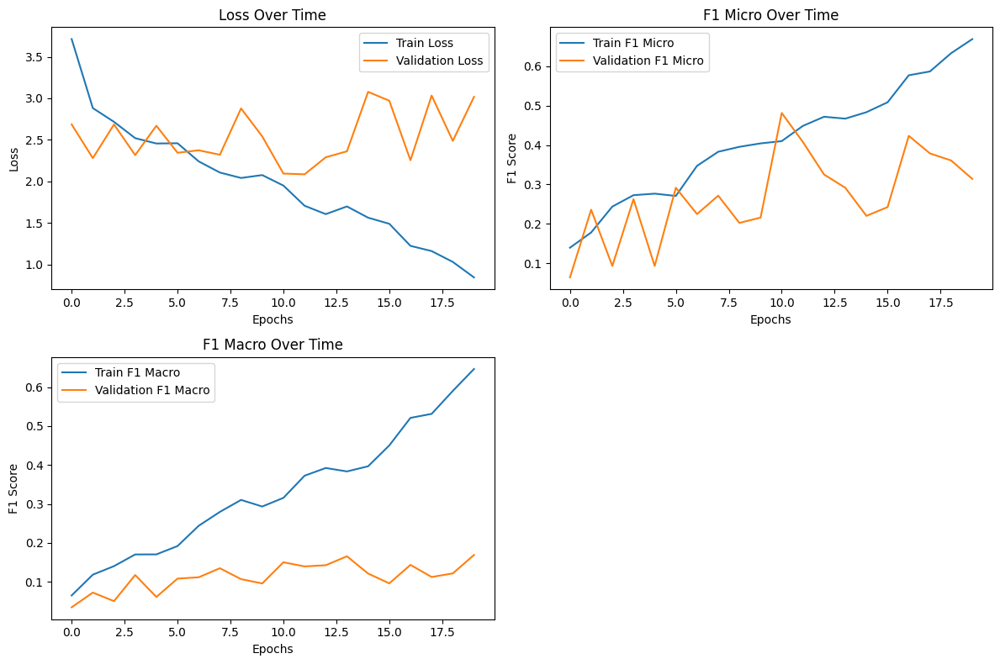

In [ ]:
#с аугментациями, #lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import torch.nn.functional as F

# предполагается, что `outputs` это выход вашей модели
#probs = F.softmax(outputs, dim=-1)


CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'transformerWithMobileNet')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = \
                  f'transformer_with_mobile_net_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithTransformBlock(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

###MobileNet + Transformer confusion matrix

In [ ]:
def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels

Убрать аугментации
Добавить сохранения во все модели (названия папок!)
Проверить сохранения чекпоинтов
Все переучить, включая трансформер

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

val: 100%|██████████| 57/57 [00:37<00:00,  1.51it/s]


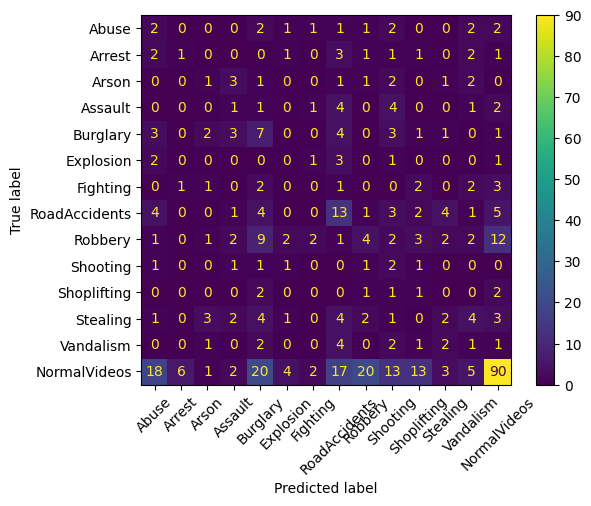

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

###MobileNet + Transformer ROC AUC 0.79

Придется модифицировать функцию

In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels


In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration: 100%|██████████| 57/57 [00:38<00:00,  1.49it/s]


ROC AUC: 0.79


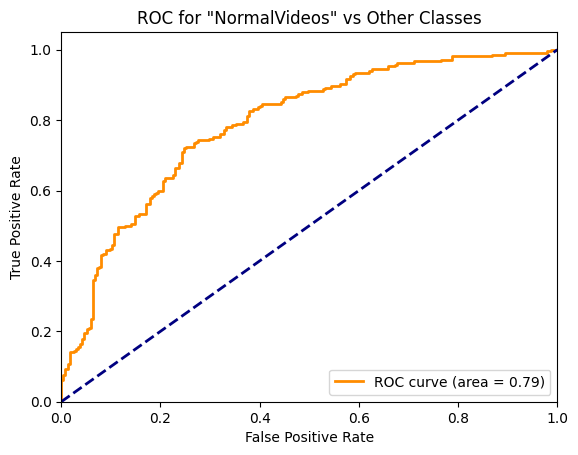

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes')
plt.legend(loc="lower right")
plt.show()


##Тестирование

Testing: 100%|██████████| 35/35 [00:48<00:00,  1.37s/it]

Test Loss: 2.4981, Accuracy: 0.4214, F1 Micro: 0.4214, F1 Macro: 0.1359, ROC AUC: 0.7820


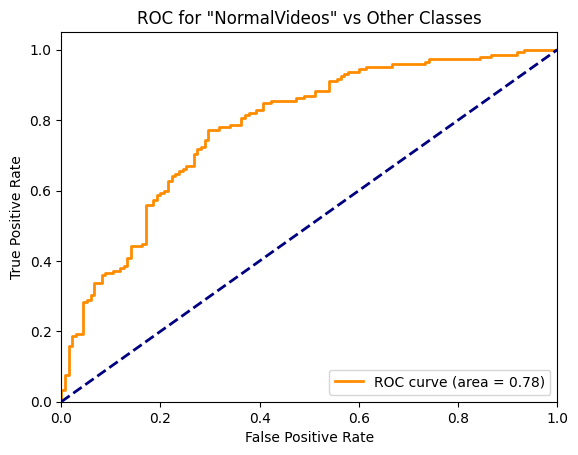

In [ ]:
import torch
import numpy as np
from sklearn.metrics import f1_score, roc_curve, auc
from tqdm import tqdm
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Загрузка модели
model_path = '/content/drive/MyDrive/checkpoints/LSTMWithMobileNet_2/lstm_with_mobile_net_epoch_19_loss_0.6672_f1_micro_0.8440_f1_macro_0.8196.pth'
model = torch.load(model_path)
model.eval()

# Функция для тестирования модели
def test_model(model, dataloader, criterion, device='cuda'):
    model.to(device).eval()  # Переключаем модель в режим оценки
    test_loss = 0.0
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloader, desc="Testing"):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs, lengths_tensor)
            loss = criterion(outputs, labels)
            test_loss += loss.item() * inputs.size(0)
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(outputs.softmax(dim=1).cpu().numpy())

    test_loss /= len(dataloader.dataset)
    accuracy = (np.array(all_preds) == np.array(all_labels)).mean()
    f1_micro = f1_score(all_labels, all_preds, average='micro')
    f1_macro = f1_score(all_labels, all_preds, average='macro')

    # Вычисление ROC AUC для нормальных видео против всех остальных
    normal_class_idx = CLASS_TO_IDX['NormalVideos']
    all_probs = np.array(all_probs)
    normal_class_probs = all_probs[:, normal_class_idx]
    binary_labels = (np.array(all_labels) == normal_class_idx).astype(int)
    fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)
    roc_auc = auc(fpr, tpr)

    print(f'Test Loss: {test_loss:.4f}, Accuracy: {accuracy:.4f}, F1 Micro: {f1_micro:.4f}, F1 Macro: {f1_macro:.4f}, ROC AUC: {roc_auc:.4f}')

    # Построение ROC кривой
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC for "NormalVideos" vs Other Classes')
    plt.legend(loc="lower right")
    plt.show()

# test_dataloader уже определен
test_model(model, test_dataloader, criterion, device)


In [ ]:
import matplotlib.pyplot as plt

def test_model(model, dataloader, criterion, device='cuda'):
    model.to(device).eval()  # Переключаем модель в режим оценки
    test_loss = 0.0
    all_preds = []
    all_labels = []

    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloader, desc="Testing"):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs, lengths_tensor)
            loss = criterion(outputs, labels)
            test_loss += loss.item() * inputs.size(0)
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    test_loss /= len(dataloader.dataset)
    accuracy = (np.array(all_preds) == np.array(all_labels)).mean()
    f1_micro = f1_score(all_labels, all_preds, average='micro')
    f1_macro = f1_score(all_labels, all_preds, average='macro')

    print(f'Test Loss: {test_loss:.4f}, Accuracy: {accuracy:.4f}, F1 Micro: {f1_micro:.4f}, F1 Macro: {f1_macro:.4f}')

# test_dataloader уже определен
test_model(model, test_dataloader, criterion, device)


Testing: 100%|██████████| 35/35 [00:44<00:00,  1.27s/it]

Test Loss: 2.4603, Accuracy: 0.4500, F1 Micro: 0.4500, F1 Macro: 0.1361


# Vision Transfrmer + LSTM

In [ ]:
pip install timm

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm

class CustomViTandLSTM(nn.Module):
    def __init__(self, num_classes, num_lstm_layers=1, hidden_dim=512, seq_len=1500):
        super(CustomViTandLSTM, self).__init__()
        # Загружаем предварительно обученный Vision Transformer
        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True)
        self.freeze_features = True  # Флаг для управления заморозкой слоев
        # Замораживаем все слои ViT для предотвращения их обучения
        for param in self.vit.parameters():
            param.requires_grad = False

        # Определение LSTM
        self.lstm = nn.LSTM(
            input_size=1000,
            hidden_size=hidden_dim,
            num_layers=num_lstm_layers,
            batch_first=True
        )

        # Полносвязный слой для классификации
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x, lengths_tensor):
        batch_size, sequence_length, C, H, W = x.size()
        print(f"Initial size: batch_size={batch_size}, sequence_length={sequence_length}, C={C}, H={H}, W={W}")

        # Изменение размера для ViT
        x = torch.nn.functional.interpolate(x.view(-1, C, H, W), size=(224, 224), mode='bilinear', align_corners=False)

        # Обработка через ViT
        with torch.no_grad():
            x = self.vit(x)  # Выход ViT
        print(f"Output size from ViT: {x.size()}")

        # Проверка размера и переформатирование для LSTM
        expected_size = batch_size * sequence_length
        if x.size(0) != expected_size:
            raise ValueError(f"Expected size {expected_size}, but got {x.size(0)}")

        x = x.view(batch_size, sequence_length, -1)

        # Подготовка к LSTM
        packed_x = pack_padded_sequence(x, lengths_tensor, batch_first=True, enforce_sorted=False)
        print(f"Packed input size: {x.size()}")

        _, (hidden, _) = self.lstm(packed_x)
        output = self.fc(hidden[-1])

        return output

Epoch 1/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])
Packed input size: torch.Size([8, 267, 1000])


train:   1%|          | 1/130 [00:05<11:58,  5.57s/it]

Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:   2%|▏         | 2/130 [00:10<11:11,  5.25s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:   2%|▏         | 3/130 [00:20<15:07,  7.15s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:   3%|▎         | 4/130 [00:24<12:41,  6.04s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=248, C=3, H=64, W=64
Output size from ViT: torch.Size([1984, 1000])


train:   4%|▍         | 5/130 [00:28<11:27,  5.50s/it]

Packed input size: torch.Size([8, 248, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:   5%|▍         | 6/130 [00:33<11:05,  5.36s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:   5%|▌         | 7/130 [00:39<11:08,  5.43s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=109, C=3, H=64, W=64
Output size from ViT: torch.Size([872, 1000])


train:   6%|▌         | 8/130 [00:41<08:58,  4.41s/it]

Packed input size: torch.Size([8, 109, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:   7%|▋         | 9/130 [00:49<11:11,  5.55s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:   8%|▊         | 10/130 [00:54<10:16,  5.14s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:   8%|▊         | 11/130 [00:57<09:19,  4.70s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:   9%|▉         | 12/130 [01:01<08:33,  4.35s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  10%|█         | 13/130 [01:05<08:22,  4.29s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  11%|█         | 14/130 [01:08<07:24,  3.83s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:  12%|█▏        | 15/130 [01:11<06:44,  3.52s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  12%|█▏        | 16/130 [01:16<07:51,  4.14s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=103, C=3, H=64, W=64
Output size from ViT: torch.Size([824, 1000])


train:  13%|█▎        | 17/130 [01:18<06:39,  3.53s/it]

Packed input size: torch.Size([8, 103, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  14%|█▍        | 18/130 [01:23<07:15,  3.89s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  15%|█▍        | 19/130 [01:29<08:28,  4.58s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  15%|█▌        | 20/130 [01:37<10:13,  5.58s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  16%|█▌        | 21/130 [01:41<09:01,  4.96s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  17%|█▋        | 22/130 [01:47<09:40,  5.37s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  18%|█▊        | 23/130 [01:52<09:36,  5.39s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  18%|█▊        | 24/130 [01:57<09:20,  5.28s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  19%|█▉        | 25/130 [02:02<08:46,  5.02s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=101, C=3, H=64, W=64
Output size from ViT: torch.Size([808, 1000])


train:  20%|██        | 26/130 [02:04<07:05,  4.09s/it]

Packed input size: torch.Size([8, 101, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  21%|██        | 27/130 [02:12<09:15,  5.39s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  22%|██▏       | 28/130 [02:17<08:40,  5.11s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  22%|██▏       | 29/130 [02:24<09:48,  5.82s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  23%|██▎       | 30/130 [02:28<08:48,  5.29s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=137, C=3, H=64, W=64
Output size from ViT: torch.Size([1096, 1000])


train:  24%|██▍       | 31/130 [02:31<07:26,  4.51s/it]

Packed input size: torch.Size([8, 137, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  25%|██▍       | 32/130 [02:36<07:50,  4.80s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  25%|██▌       | 33/130 [02:42<08:23,  5.19s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  26%|██▌       | 34/130 [02:46<07:38,  4.78s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=82, C=3, H=64, W=64
Output size from ViT: torch.Size([656, 1000])


train:  27%|██▋       | 35/130 [02:48<06:02,  3.82s/it]

Packed input size: torch.Size([8, 82, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  28%|██▊       | 36/130 [02:53<06:42,  4.28s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  28%|██▊       | 37/130 [02:57<06:31,  4.21s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  29%|██▉       | 38/130 [03:03<07:07,  4.65s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  30%|███       | 39/130 [03:06<06:20,  4.18s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=228, C=3, H=64, W=64
Output size from ViT: torch.Size([1824, 1000])


train:  31%|███       | 40/130 [03:10<06:14,  4.16s/it]

Packed input size: torch.Size([8, 228, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  32%|███▏      | 41/130 [03:14<06:04,  4.10s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


train:  32%|███▏      | 42/130 [03:18<05:46,  3.94s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  33%|███▎      | 43/130 [03:21<05:21,  3.70s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  34%|███▍      | 44/130 [03:27<06:22,  4.44s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=164, C=3, H=64, W=64
Output size from ViT: torch.Size([1312, 1000])


train:  35%|███▍      | 45/130 [03:30<05:43,  4.04s/it]

Packed input size: torch.Size([8, 164, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  35%|███▌      | 46/130 [03:36<06:41,  4.78s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  36%|███▌      | 47/130 [03:41<06:33,  4.74s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  37%|███▋      | 48/130 [03:44<05:41,  4.17s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  38%|███▊      | 49/130 [03:48<05:42,  4.23s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  38%|███▊      | 50/130 [03:54<06:17,  4.72s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  39%|███▉      | 51/130 [03:57<05:34,  4.24s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  40%|████      | 52/130 [04:03<06:03,  4.66s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=239, C=3, H=64, W=64
Output size from ViT: torch.Size([1912, 1000])


train:  41%|████      | 53/130 [04:07<05:50,  4.55s/it]

Packed input size: torch.Size([8, 239, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:  42%|████▏     | 54/130 [04:12<05:44,  4.53s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  42%|████▏     | 55/130 [04:19<06:36,  5.29s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  43%|████▎     | 56/130 [04:23<06:03,  4.92s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  44%|████▍     | 57/130 [04:25<05:03,  4.15s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  45%|████▍     | 58/130 [04:29<04:41,  3.92s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  45%|████▌     | 59/130 [04:31<04:13,  3.57s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  46%|████▌     | 60/130 [04:37<05:01,  4.30s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  47%|████▋     | 61/130 [04:46<06:26,  5.60s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  48%|████▊     | 62/130 [04:51<06:00,  5.30s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  48%|████▊     | 63/130 [04:58<06:37,  5.93s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=152, C=3, H=64, W=64
Output size from ViT: torch.Size([1216, 1000])


train:  49%|████▉     | 64/130 [05:01<05:32,  5.04s/it]

Packed input size: torch.Size([8, 152, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  50%|█████     | 65/130 [05:04<04:51,  4.49s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  51%|█████     | 66/130 [05:10<05:16,  4.94s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  52%|█████▏    | 67/130 [05:17<05:54,  5.63s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  52%|█████▏    | 68/130 [05:20<04:45,  4.61s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=113, C=3, H=64, W=64
Output size from ViT: torch.Size([904, 1000])


train:  53%|█████▎    | 69/130 [05:22<03:57,  3.89s/it]

Packed input size: torch.Size([8, 113, 1000])
Initial size: batch_size=8, sequence_length=144, C=3, H=64, W=64
Output size from ViT: torch.Size([1152, 1000])


train:  54%|█████▍    | 70/130 [05:25<03:34,  3.57s/it]

Packed input size: torch.Size([8, 144, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  55%|█████▍    | 71/130 [05:31<04:23,  4.47s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  55%|█████▌    | 72/130 [05:34<03:42,  3.84s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  56%|█████▌    | 73/130 [05:39<04:05,  4.31s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  57%|█████▋    | 74/130 [05:47<05:07,  5.49s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  58%|█████▊    | 75/130 [05:54<05:19,  5.82s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  58%|█████▊    | 76/130 [06:00<05:12,  5.79s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  59%|█████▉    | 77/130 [06:04<04:40,  5.30s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  60%|██████    | 78/130 [06:09<04:32,  5.25s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  61%|██████    | 79/130 [06:16<04:51,  5.72s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  62%|██████▏   | 80/130 [06:21<04:44,  5.69s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=176, C=3, H=64, W=64
Output size from ViT: torch.Size([1408, 1000])


train:  62%|██████▏   | 81/130 [06:25<04:05,  5.01s/it]

Packed input size: torch.Size([8, 176, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  63%|██████▎   | 82/130 [06:28<03:33,  4.44s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  64%|██████▍   | 83/130 [06:36<04:18,  5.51s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  65%|██████▍   | 84/130 [06:42<04:16,  5.57s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  65%|██████▌   | 85/130 [06:46<03:51,  5.15s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  66%|██████▌   | 86/130 [06:53<04:13,  5.77s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  67%|██████▋   | 87/130 [06:57<03:47,  5.29s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  68%|██████▊   | 88/130 [07:04<03:57,  5.66s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  68%|██████▊   | 89/130 [07:06<03:18,  4.83s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  69%|██████▉   | 90/130 [07:12<03:18,  4.96s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:  70%|███████   | 91/130 [07:15<02:48,  4.32s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  71%|███████   | 92/130 [07:22<03:23,  5.34s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  72%|███████▏  | 93/130 [07:26<02:56,  4.76s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  72%|███████▏  | 94/130 [07:30<02:47,  4.65s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  73%|███████▎  | 95/130 [07:38<03:11,  5.48s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  74%|███████▍  | 96/130 [07:41<02:45,  4.88s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  75%|███████▍  | 97/130 [07:48<03:05,  5.61s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


train:  75%|███████▌  | 98/130 [07:51<02:31,  4.72s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  76%|███████▌  | 99/130 [07:55<02:21,  4.58s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  77%|███████▋  | 100/130 [07:58<01:57,  3.90s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  78%|███████▊  | 101/130 [08:03<02:02,  4.23s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  78%|███████▊  | 102/130 [08:10<02:28,  5.31s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  79%|███████▉  | 103/130 [08:15<02:14,  4.99s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  80%|████████  | 104/130 [08:20<02:15,  5.23s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  81%|████████  | 105/130 [08:27<02:23,  5.73s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  82%|████████▏ | 106/130 [08:34<02:25,  6.07s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  82%|████████▏ | 107/130 [08:41<02:26,  6.36s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  83%|████████▎ | 108/130 [08:49<02:28,  6.73s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:  84%|████████▍ | 109/130 [08:54<02:08,  6.13s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  85%|████████▍ | 110/130 [08:59<01:57,  5.90s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  85%|████████▌ | 111/130 [09:07<02:04,  6.57s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  86%|████████▌ | 112/130 [09:14<01:58,  6.60s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=235, C=3, H=64, W=64
Output size from ViT: torch.Size([1880, 1000])


train:  87%|████████▋ | 113/130 [09:18<01:41,  5.99s/it]

Packed input size: torch.Size([8, 235, 1000])
Initial size: batch_size=8, sequence_length=132, C=3, H=64, W=64
Output size from ViT: torch.Size([1056, 1000])


train:  88%|████████▊ | 114/130 [09:21<01:19,  4.95s/it]

Packed input size: torch.Size([8, 132, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  88%|████████▊ | 115/130 [09:27<01:18,  5.22s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=110, C=3, H=64, W=64
Output size from ViT: torch.Size([880, 1000])


train:  89%|████████▉ | 116/130 [09:29<01:00,  4.32s/it]

Packed input size: torch.Size([8, 110, 1000])
Initial size: batch_size=8, sequence_length=160, C=3, H=64, W=64
Output size from ViT: torch.Size([1280, 1000])


train:  90%|█████████ | 117/130 [09:32<00:51,  3.95s/it]

Packed input size: torch.Size([8, 160, 1000])
Initial size: batch_size=8, sequence_length=109, C=3, H=64, W=64
Output size from ViT: torch.Size([872, 1000])


train:  91%|█████████ | 118/130 [09:34<00:41,  3.42s/it]

Packed input size: torch.Size([8, 109, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  92%|█████████▏| 119/130 [09:40<00:45,  4.17s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  92%|█████████▏| 120/130 [09:48<00:53,  5.39s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  93%|█████████▎| 121/130 [09:51<00:42,  4.71s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  94%|█████████▍| 122/130 [09:57<00:39,  4.98s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  95%|█████████▍| 123/130 [10:03<00:36,  5.17s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=118, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train:  95%|█████████▌| 124/130 [10:05<00:25,  4.30s/it]

Packed input size: torch.Size([8, 118, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  96%|█████████▌| 125/130 [10:12<00:25,  5.09s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  97%|█████████▋| 126/130 [10:15<00:18,  4.60s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  98%|█████████▊| 127/130 [10:20<00:13,  4.54s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=90, C=3, H=64, W=64
Output size from ViT: torch.Size([720, 1000])


train:  98%|█████████▊| 128/130 [10:21<00:07,  3.71s/it]

Packed input size: torch.Size([8, 90, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  99%|█████████▉| 129/130 [10:25<00:03,  3.72s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=4, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train: 100%|██████████| 130/130 [10:28<00:00,  4.83s/it]


Packed input size: torch.Size([4, 258, 1000])
train Loss: 2.5605 F1 Micro: 0.2539 F1 Macro: 0.1323


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<03:58,  4.27s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:58,  4.34s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.28s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:38,  6.39s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.96s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:12,  6.12s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.06s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.39s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.16s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:05,  5.21s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:03,  5.29s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:17,  5.72s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.72s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:44,  6.61s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:51,  6.93s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.11s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.74s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.48s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.47s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.42s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.25s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.63s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.37s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.78s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.37s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.66s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.20s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.29s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.93s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.55s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.95s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.33s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.24s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.98s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:39<00:18,  4.60s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.52s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.82s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.06s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 2.2370 F1 Micro: 0.3222 F1 Macro: 0.1240


Epoch 2/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:   1%|          | 1/130 [00:02<06:13,  2.90s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:   2%|▏         | 2/130 [00:08<09:29,  4.45s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=83, C=3, H=64, W=64
Output size from ViT: torch.Size([664, 1000])


train:   2%|▏         | 3/130 [00:10<06:39,  3.14s/it]

Packed input size: torch.Size([8, 83, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:   3%|▎         | 4/130 [00:12<06:16,  2.99s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=207, C=3, H=64, W=64
Output size from ViT: torch.Size([1656, 1000])


train:   4%|▍         | 5/130 [00:16<06:59,  3.35s/it]

Packed input size: torch.Size([8, 207, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:   5%|▍         | 6/130 [00:21<07:48,  3.78s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:   5%|▌         | 7/130 [00:29<10:29,  5.12s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:   6%|▌         | 8/130 [00:33<09:36,  4.72s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:   7%|▋         | 9/130 [00:38<09:40,  4.80s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:   8%|▊         | 10/130 [00:43<10:07,  5.07s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:   8%|▊         | 11/130 [00:49<10:11,  5.14s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:   9%|▉         | 12/130 [00:56<11:18,  5.75s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=136, C=3, H=64, W=64
Output size from ViT: torch.Size([1088, 1000])


train:  10%|█         | 13/130 [00:58<09:22,  4.81s/it]

Packed input size: torch.Size([8, 136, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:  11%|█         | 14/130 [01:04<09:30,  4.92s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=125, C=3, H=64, W=64
Output size from ViT: torch.Size([1000, 1000])


train:  12%|█▏        | 15/130 [01:06<08:00,  4.18s/it]

Packed input size: torch.Size([8, 125, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  12%|█▏        | 16/130 [01:12<08:47,  4.62s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  13%|█▎        | 17/130 [01:17<09:12,  4.89s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  14%|█▍        | 18/130 [01:19<07:35,  4.07s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  15%|█▍        | 19/130 [01:25<08:30,  4.60s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  15%|█▌        | 20/130 [01:29<08:00,  4.37s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  16%|█▌        | 21/130 [01:33<07:39,  4.21s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  17%|█▋        | 22/130 [01:39<08:49,  4.90s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  18%|█▊        | 23/130 [01:43<08:08,  4.56s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  18%|█▊        | 24/130 [01:47<07:28,  4.23s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  19%|█▉        | 25/130 [01:51<07:35,  4.34s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  20%|██        | 26/130 [01:59<09:12,  5.31s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  21%|██        | 27/130 [02:05<09:25,  5.49s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=92, C=3, H=64, W=64
Output size from ViT: torch.Size([736, 1000])


train:  22%|██▏       | 28/130 [02:06<07:28,  4.40s/it]

Packed input size: torch.Size([8, 92, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  22%|██▏       | 29/130 [02:14<09:00,  5.35s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  23%|██▎       | 30/130 [02:21<09:42,  5.82s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  24%|██▍       | 31/130 [02:25<08:42,  5.28s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  25%|██▍       | 32/130 [02:30<08:40,  5.31s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=92, C=3, H=64, W=64
Output size from ViT: torch.Size([736, 1000])


train:  25%|██▌       | 33/130 [02:32<06:55,  4.29s/it]

Packed input size: torch.Size([8, 92, 1000])
Initial size: batch_size=8, sequence_length=176, C=3, H=64, W=64
Output size from ViT: torch.Size([1408, 1000])


train:  26%|██▌       | 34/130 [02:36<06:24,  4.01s/it]

Packed input size: torch.Size([8, 176, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  27%|██▋       | 35/130 [02:40<06:25,  4.06s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  28%|██▊       | 36/130 [02:45<06:50,  4.37s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=88, C=3, H=64, W=64
Output size from ViT: torch.Size([704, 1000])


train:  28%|██▊       | 37/130 [02:47<05:32,  3.58s/it]

Packed input size: torch.Size([8, 88, 1000])
Initial size: batch_size=8, sequence_length=160, C=3, H=64, W=64
Output size from ViT: torch.Size([1280, 1000])


train:  29%|██▉       | 38/130 [02:50<05:14,  3.42s/it]

Packed input size: torch.Size([8, 160, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  30%|███       | 39/130 [02:51<04:26,  2.93s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  31%|███       | 40/130 [02:54<04:00,  2.67s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  32%|███▏      | 41/130 [02:58<04:44,  3.19s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  32%|███▏      | 42/130 [03:02<05:09,  3.52s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=148, C=3, H=64, W=64
Output size from ViT: torch.Size([1184, 1000])


train:  33%|███▎      | 43/130 [03:05<04:48,  3.32s/it]

Packed input size: torch.Size([8, 148, 1000])
Initial size: batch_size=8, sequence_length=144, C=3, H=64, W=64
Output size from ViT: torch.Size([1152, 1000])


train:  34%|███▍      | 44/130 [03:08<04:27,  3.11s/it]

Packed input size: torch.Size([8, 144, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  35%|███▍      | 45/130 [03:14<05:33,  3.93s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  35%|███▌      | 46/130 [03:18<05:39,  4.04s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  36%|███▌      | 47/130 [03:21<05:21,  3.87s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  37%|███▋      | 48/130 [03:25<05:23,  3.94s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  38%|███▊      | 49/130 [03:31<05:54,  4.38s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


train:  38%|███▊      | 50/130 [03:33<05:09,  3.86s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  39%|███▉      | 51/130 [03:41<06:37,  5.04s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=192, C=3, H=64, W=64
Output size from ViT: torch.Size([1536, 1000])


train:  40%|████      | 52/130 [03:45<05:58,  4.60s/it]

Packed input size: torch.Size([8, 192, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  41%|████      | 53/130 [03:51<06:37,  5.17s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  42%|████▏     | 54/130 [04:00<07:45,  6.12s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  42%|████▏     | 55/130 [04:09<08:41,  6.95s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  43%|████▎     | 56/130 [04:15<08:14,  6.68s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:  44%|████▍     | 57/130 [04:18<06:49,  5.60s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  45%|████▍     | 58/130 [04:23<06:38,  5.54s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  45%|████▌     | 59/130 [04:30<07:00,  5.92s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  46%|████▌     | 60/130 [04:35<06:46,  5.80s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  47%|████▋     | 61/130 [04:42<06:49,  5.93s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=278, C=3, H=64, W=64
Output size from ViT: torch.Size([2224, 1000])


train:  48%|████▊     | 62/130 [04:47<06:33,  5.78s/it]

Packed input size: torch.Size([8, 278, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  48%|████▊     | 63/130 [04:52<06:11,  5.54s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:  49%|████▉     | 64/130 [04:55<05:04,  4.62s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:  50%|█████     | 65/130 [04:58<04:30,  4.16s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  51%|█████     | 66/130 [05:02<04:22,  4.11s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  52%|█████▏    | 67/130 [05:05<04:14,  4.04s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  52%|█████▏    | 68/130 [05:10<04:11,  4.06s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  53%|█████▎    | 69/130 [05:14<04:19,  4.26s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=164, C=3, H=64, W=64
Output size from ViT: torch.Size([1312, 1000])


train:  54%|█████▍    | 70/130 [05:18<03:57,  3.95s/it]

Packed input size: torch.Size([8, 164, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:  55%|█████▍    | 71/130 [05:22<04:09,  4.23s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=82, C=3, H=64, W=64
Output size from ViT: torch.Size([656, 1000])


train:  55%|█████▌    | 72/130 [05:24<03:19,  3.44s/it]

Packed input size: torch.Size([8, 82, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  56%|█████▌    | 73/130 [05:28<03:23,  3.56s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  57%|█████▋    | 74/130 [05:33<03:53,  4.18s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  58%|█████▊    | 75/130 [05:40<04:31,  4.93s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  58%|█████▊    | 76/130 [05:46<04:37,  5.14s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  59%|█████▉    | 77/130 [05:50<04:19,  4.90s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  60%|██████    | 78/130 [05:58<05:08,  5.93s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  61%|██████    | 79/130 [06:03<04:44,  5.58s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  62%|██████▏   | 80/130 [06:08<04:34,  5.49s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=127, C=3, H=64, W=64
Output size from ViT: torch.Size([1016, 1000])


train:  62%|██████▏   | 81/130 [06:11<03:45,  4.60s/it]

Packed input size: torch.Size([8, 127, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  63%|██████▎   | 82/130 [06:18<04:08,  5.18s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  64%|██████▍   | 83/130 [06:24<04:26,  5.67s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  65%|██████▍   | 84/130 [06:29<04:09,  5.42s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  65%|██████▌   | 85/130 [06:35<04:15,  5.68s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  66%|██████▌   | 86/130 [06:39<03:45,  5.13s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  67%|██████▋   | 87/130 [06:44<03:31,  4.91s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  68%|██████▊   | 88/130 [06:49<03:29,  5.00s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  68%|██████▊   | 89/130 [06:54<03:25,  5.00s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:  69%|██████▉   | 90/130 [06:59<03:17,  4.95s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


train:  70%|███████   | 91/130 [07:01<02:39,  4.10s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  71%|███████   | 92/130 [07:05<02:39,  4.19s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  72%|███████▏  | 93/130 [07:11<02:48,  4.54s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=147, C=3, H=64, W=64
Output size from ViT: torch.Size([1176, 1000])


train:  72%|███████▏  | 94/130 [07:13<02:25,  4.03s/it]

Packed input size: torch.Size([8, 147, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  73%|███████▎  | 95/130 [07:16<02:01,  3.47s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  74%|███████▍  | 96/130 [07:19<01:53,  3.34s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  75%|███████▍  | 97/130 [07:23<01:56,  3.53s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  75%|███████▌  | 98/130 [07:25<01:42,  3.19s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  76%|███████▌  | 99/130 [07:32<02:15,  4.39s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  77%|███████▋  | 100/130 [07:37<02:14,  4.49s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  78%|███████▊  | 101/130 [07:45<02:41,  5.59s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  78%|███████▊  | 102/130 [07:49<02:18,  4.95s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  79%|███████▉  | 103/130 [07:53<02:09,  4.78s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  80%|████████  | 104/130 [08:01<02:30,  5.79s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=100, C=3, H=64, W=64
Output size from ViT: torch.Size([800, 1000])


train:  81%|████████  | 105/130 [08:03<01:55,  4.64s/it]

Packed input size: torch.Size([8, 100, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  82%|████████▏ | 106/130 [08:10<02:04,  5.19s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  82%|████████▏ | 107/130 [08:18<02:19,  6.05s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  83%|████████▎ | 108/130 [08:25<02:20,  6.41s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  84%|████████▍ | 109/130 [08:30<02:08,  6.14s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:  85%|████████▍ | 110/130 [08:35<01:52,  5.65s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  85%|████████▌ | 111/130 [08:42<01:57,  6.20s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  86%|████████▌ | 112/130 [08:49<01:54,  6.38s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  87%|████████▋ | 113/130 [08:55<01:46,  6.26s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=116, C=3, H=64, W=64
Output size from ViT: torch.Size([928, 1000])


train:  88%|████████▊ | 114/130 [08:57<01:20,  5.05s/it]

Packed input size: torch.Size([8, 116, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  88%|████████▊ | 115/130 [09:01<01:09,  4.66s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  89%|████████▉ | 116/130 [09:09<01:17,  5.54s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  90%|█████████ | 117/130 [09:12<01:03,  4.92s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  91%|█████████ | 118/130 [09:18<01:01,  5.12s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  92%|█████████▏| 119/130 [09:22<00:53,  4.90s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  92%|█████████▏| 120/130 [09:30<00:57,  5.78s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  93%|█████████▎| 121/130 [09:37<00:54,  6.06s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  94%|█████████▍| 122/130 [09:45<00:53,  6.72s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  95%|█████████▍| 123/130 [09:51<00:45,  6.48s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  95%|█████████▌| 124/130 [09:54<00:33,  5.54s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  96%|█████████▌| 125/130 [10:03<00:32,  6.42s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  97%|█████████▋| 126/130 [10:06<00:22,  5.53s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  98%|█████████▊| 127/130 [10:08<00:13,  4.43s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  98%|█████████▊| 128/130 [10:15<00:10,  5.34s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  99%|█████████▉| 129/130 [10:18<00:04,  4.65s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=4, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([612, 1000])


train: 100%|██████████| 130/130 [10:20<00:00,  4.77s/it]


Packed input size: torch.Size([4, 153, 1000])
train Loss: 2.1786 F1 Micro: 0.3958 F1 Macro: 0.2548


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:00,  4.30s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.36s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.29s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:38,  6.40s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.95s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:11,  6.11s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:12,  5.06s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.39s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.16s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:50<04:04,  5.19s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:05,  5.34s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:18,  5.75s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:09<04:12,  5.74s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:44,  6.63s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:51,  6.95s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:52,  7.14s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.74s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.48s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:28,  5.49s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:44,  4.44s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:09,  5.26s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.65s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.05s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:12,  4.01s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.06s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:19<01:38,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:27,  3.11s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.49s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.39s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:45<01:02,  3.48s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:56,  3.34s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.68s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:50<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:54<00:37,  2.66s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [03:00<00:46,  3.61s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.21s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:10<00:47,  4.30s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:13<00:39,  3.94s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:32,  3.56s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.94s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.30s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.23s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.96s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:39<00:18,  4.59s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.51s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:49<00:09,  4.81s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.06s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 2.0555 F1 Micro: 0.4178 F1 Macro: 0.2201


Epoch 3/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:   1%|          | 1/130 [00:02<05:57,  2.77s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:   2%|▏         | 2/130 [00:05<05:34,  2.61s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:   2%|▏         | 3/130 [00:12<09:53,  4.67s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:   3%|▎         | 4/130 [00:16<09:02,  4.31s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:   4%|▍         | 5/130 [00:18<07:51,  3.77s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:   5%|▍         | 6/130 [00:23<08:04,  3.90s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:   5%|▌         | 7/130 [00:26<07:57,  3.88s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:   6%|▌         | 8/130 [00:30<07:48,  3.84s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:   7%|▋         | 9/130 [00:34<07:52,  3.91s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=84, C=3, H=64, W=64
Output size from ViT: torch.Size([672, 1000])


train:   8%|▊         | 10/130 [00:36<06:28,  3.23s/it]

Packed input size: torch.Size([8, 84, 1000])
Initial size: batch_size=8, sequence_length=93, C=3, H=64, W=64
Output size from ViT: torch.Size([744, 1000])


train:   8%|▊         | 11/130 [00:38<05:37,  2.84s/it]

Packed input size: torch.Size([8, 93, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:   9%|▉         | 12/130 [00:42<06:26,  3.27s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  10%|█         | 13/130 [00:47<07:03,  3.62s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  11%|█         | 14/130 [00:50<06:58,  3.61s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  12%|█▏        | 15/130 [00:52<06:06,  3.19s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  12%|█▏        | 16/130 [00:56<06:27,  3.40s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  13%|█▎        | 17/130 [01:01<06:58,  3.70s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


train:  14%|█▍        | 18/130 [01:05<07:24,  3.97s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  15%|█▍        | 19/130 [01:13<09:34,  5.18s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  15%|█▌        | 20/130 [01:21<10:45,  5.87s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  16%|█▌        | 21/130 [01:26<10:23,  5.72s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  17%|█▋        | 22/130 [01:34<11:22,  6.32s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=176, C=3, H=64, W=64
Output size from ViT: torch.Size([1408, 1000])


train:  18%|█▊        | 23/130 [01:37<09:41,  5.44s/it]

Packed input size: torch.Size([8, 176, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  18%|█▊        | 24/130 [01:45<11:01,  6.24s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  19%|█▉        | 25/130 [01:51<10:34,  6.04s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  20%|██        | 26/130 [01:58<10:56,  6.32s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  21%|██        | 27/130 [02:04<10:50,  6.32s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  22%|██▏       | 28/130 [02:12<11:17,  6.65s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  22%|██▏       | 29/130 [02:16<10:16,  6.10s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  23%|██▎       | 30/130 [02:21<09:34,  5.74s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  24%|██▍       | 31/130 [02:23<07:39,  4.65s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  25%|██▍       | 32/130 [02:31<08:51,  5.43s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  25%|██▌       | 33/130 [02:36<08:33,  5.29s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  26%|██▌       | 34/130 [02:42<09:07,  5.70s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:  27%|██▋       | 35/130 [02:47<08:29,  5.37s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  28%|██▊       | 36/130 [02:53<08:37,  5.50s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  28%|██▊       | 37/130 [03:01<09:42,  6.26s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  29%|██▉       | 38/130 [03:07<09:28,  6.18s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  30%|███       | 39/130 [03:09<07:47,  5.14s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  31%|███       | 40/130 [03:15<07:47,  5.19s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  32%|███▏      | 41/130 [03:20<07:32,  5.08s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  32%|███▏      | 42/130 [03:24<07:01,  4.79s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  33%|███▎      | 43/130 [03:31<07:54,  5.45s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  34%|███▍      | 44/130 [03:38<08:35,  6.00s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  35%|███▍      | 45/130 [03:45<08:49,  6.23s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=145, C=3, H=64, W=64
Output size from ViT: torch.Size([1160, 1000])


train:  35%|███▌      | 46/130 [03:47<07:14,  5.18s/it]

Packed input size: torch.Size([8, 145, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  36%|███▌      | 47/130 [03:51<06:35,  4.76s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  37%|███▋      | 48/130 [04:00<08:07,  5.94s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:  38%|███▊      | 49/130 [04:05<07:45,  5.74s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  38%|███▊      | 50/130 [04:11<07:35,  5.69s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  39%|███▉      | 51/130 [04:18<07:57,  6.05s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  40%|████      | 52/130 [04:23<07:29,  5.77s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=145, C=3, H=64, W=64
Output size from ViT: torch.Size([1160, 1000])


train:  41%|████      | 53/130 [04:26<06:18,  4.91s/it]

Packed input size: torch.Size([8, 145, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  42%|████▏     | 54/130 [04:31<06:12,  4.91s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  42%|████▏     | 55/130 [04:33<05:21,  4.29s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  43%|████▎     | 56/130 [04:37<05:10,  4.20s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  44%|████▍     | 57/130 [04:43<05:32,  4.56s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  45%|████▍     | 58/130 [04:50<06:33,  5.47s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  45%|████▌     | 59/130 [04:53<05:35,  4.73s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  46%|████▌     | 60/130 [04:58<05:23,  4.61s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  47%|████▋     | 61/130 [05:02<05:15,  4.58s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=179, C=3, H=64, W=64
Output size from ViT: torch.Size([1432, 1000])


train:  48%|████▊     | 62/130 [05:06<04:49,  4.26s/it]

Packed input size: torch.Size([8, 179, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  48%|████▊     | 63/130 [05:09<04:27,  3.99s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


train:  49%|████▉     | 64/130 [05:11<03:45,  3.41s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:  50%|█████     | 65/130 [05:14<03:21,  3.10s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  51%|█████     | 66/130 [05:20<04:26,  4.17s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  52%|█████▏    | 67/130 [05:24<04:18,  4.10s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=109, C=3, H=64, W=64
Output size from ViT: torch.Size([872, 1000])


train:  52%|█████▏    | 68/130 [05:26<03:36,  3.50s/it]

Packed input size: torch.Size([8, 109, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  53%|█████▎    | 69/130 [05:34<04:53,  4.80s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=103, C=3, H=64, W=64
Output size from ViT: torch.Size([824, 1000])


train:  54%|█████▍    | 70/130 [05:36<03:59,  3.99s/it]

Packed input size: torch.Size([8, 103, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  55%|█████▍    | 71/130 [05:42<04:19,  4.40s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  55%|█████▌    | 72/130 [05:45<04:05,  4.22s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  56%|█████▌    | 73/130 [05:54<05:12,  5.49s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  57%|█████▋    | 74/130 [05:56<04:10,  4.48s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=187, C=3, H=64, W=64
Output size from ViT: torch.Size([1496, 1000])


train:  58%|█████▊    | 75/130 [05:59<03:49,  4.16s/it]

Packed input size: torch.Size([8, 187, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  58%|█████▊    | 76/130 [06:08<04:50,  5.39s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  59%|█████▉    | 77/130 [06:13<04:45,  5.40s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=87, C=3, H=64, W=64
Output size from ViT: torch.Size([696, 1000])


train:  60%|██████    | 78/130 [06:15<03:43,  4.30s/it]

Packed input size: torch.Size([8, 87, 1000])
Initial size: batch_size=8, sequence_length=143, C=3, H=64, W=64
Output size from ViT: torch.Size([1144, 1000])


train:  61%|██████    | 79/130 [06:17<03:14,  3.81s/it]

Packed input size: torch.Size([8, 143, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  62%|██████▏   | 80/130 [06:19<02:40,  3.21s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=148, C=3, H=64, W=64
Output size from ViT: torch.Size([1184, 1000])


train:  62%|██████▏   | 81/130 [06:22<02:32,  3.10s/it]

Packed input size: torch.Size([8, 148, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  63%|██████▎   | 82/130 [06:29<03:25,  4.28s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  64%|██████▍   | 83/130 [06:35<03:49,  4.89s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  65%|██████▍   | 84/130 [06:42<04:13,  5.51s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  65%|██████▌   | 85/130 [06:51<04:48,  6.42s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  66%|██████▌   | 86/130 [06:57<04:43,  6.45s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  67%|██████▋   | 87/130 [07:02<04:12,  5.86s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  68%|██████▊   | 88/130 [07:04<03:20,  4.77s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  68%|██████▊   | 89/130 [07:07<02:55,  4.29s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


train:  69%|██████▉   | 90/130 [07:10<02:37,  3.93s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=192, C=3, H=64, W=64
Output size from ViT: torch.Size([1536, 1000])


train:  70%|███████   | 91/130 [07:14<02:30,  3.87s/it]

Packed input size: torch.Size([8, 192, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  71%|███████   | 92/130 [07:22<03:06,  4.91s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  72%|███████▏  | 93/130 [07:26<02:55,  4.73s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  72%|███████▏  | 94/130 [07:31<02:49,  4.71s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  73%|███████▎  | 95/130 [07:35<02:38,  4.54s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  74%|███████▍  | 96/130 [07:40<02:46,  4.90s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  75%|███████▍  | 97/130 [07:49<03:16,  5.97s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  75%|███████▌  | 98/130 [07:52<02:43,  5.11s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


train:  76%|███████▌  | 99/130 [07:54<02:13,  4.30s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  77%|███████▋  | 100/130 [07:59<02:12,  4.42s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=93, C=3, H=64, W=64
Output size from ViT: torch.Size([744, 1000])


train:  78%|███████▊  | 101/130 [08:01<01:46,  3.66s/it]

Packed input size: torch.Size([8, 93, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  78%|███████▊  | 102/130 [08:07<01:58,  4.24s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  79%|███████▉  | 103/130 [08:13<02:11,  4.89s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  80%|████████  | 104/130 [08:16<01:56,  4.48s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  81%|████████  | 105/130 [08:21<01:55,  4.64s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  82%|████████▏ | 106/130 [08:27<01:57,  4.91s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  82%|████████▏ | 107/130 [08:34<02:04,  5.42s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  83%|████████▎ | 108/130 [08:38<01:53,  5.15s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  84%|████████▍ | 109/130 [08:44<01:53,  5.40s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  85%|████████▍ | 110/130 [08:52<02:00,  6.03s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  85%|████████▌ | 111/130 [08:58<01:53,  5.99s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  86%|████████▌ | 112/130 [09:02<01:38,  5.45s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  87%|████████▋ | 113/130 [09:06<01:27,  5.16s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  88%|████████▊ | 114/130 [09:08<01:08,  4.28s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=152, C=3, H=64, W=64
Output size from ViT: torch.Size([1216, 1000])


train:  88%|████████▊ | 115/130 [09:11<00:58,  3.88s/it]

Packed input size: torch.Size([8, 152, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  89%|████████▉ | 116/130 [09:15<00:51,  3.68s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  90%|█████████ | 117/130 [09:17<00:41,  3.22s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=61, C=3, H=64, W=64
Output size from ViT: torch.Size([488, 1000])


train:  91%|█████████ | 118/130 [09:18<00:31,  2.61s/it]

Packed input size: torch.Size([8, 61, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  92%|█████████▏| 119/130 [09:24<00:38,  3.54s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  92%|█████████▏| 120/130 [09:29<00:40,  4.02s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  93%|█████████▎| 121/130 [09:35<00:41,  4.58s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  94%|█████████▍| 122/130 [09:39<00:36,  4.60s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  95%|█████████▍| 123/130 [09:43<00:29,  4.26s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  95%|█████████▌| 124/130 [09:47<00:25,  4.23s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  96%|█████████▌| 125/130 [09:50<00:19,  4.00s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  97%|█████████▋| 126/130 [09:53<00:13,  3.48s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  98%|█████████▊| 127/130 [10:00<00:13,  4.55s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  98%|█████████▊| 128/130 [10:05<00:09,  4.85s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  99%|█████████▉| 129/130 [10:13<00:05,  5.83s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=4, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([1236, 1000])


train: 100%|██████████| 130/130 [10:17<00:00,  4.75s/it]


Packed input size: torch.Size([4, 309, 1000])
train Loss: 1.8803 F1 Micro: 0.5087 F1 Macro: 0.3691


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.31s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.36s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.30s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.40s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.95s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:11,  6.12s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:12,  5.06s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:34,  4.39s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:18,  4.14s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:50<04:03,  5.18s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.26s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:15,  5.69s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:10,  5.69s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.59s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.91s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.11s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:28,  6.72s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:40<03:32,  5.46s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.46s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.41s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.24s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:42,  4.63s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  3.99s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:55,  3.73s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:27<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:33<00:35,  1.78s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.38s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.48s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:48<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.66s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:04<00:50,  4.19s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.29s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.92s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.54s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.29s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.21s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:34<00:24,  4.94s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.57s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:42<00:13,  4.49s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.79s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.8106 F1 Micro: 0.4733 F1 Macro: 0.2472


Epoch 4/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:   1%|          | 1/130 [00:06<13:37,  6.34s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:   2%|▏         | 2/130 [00:12<13:32,  6.35s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:   2%|▏         | 3/130 [00:18<13:17,  6.28s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:   3%|▎         | 4/130 [00:24<12:20,  5.87s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:   4%|▍         | 5/130 [00:28<10:51,  5.21s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=103, C=3, H=64, W=64
Output size from ViT: torch.Size([824, 1000])


train:   5%|▍         | 6/130 [00:30<08:32,  4.14s/it]

Packed input size: torch.Size([8, 103, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:   5%|▌         | 7/130 [00:38<11:33,  5.63s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=192, C=3, H=64, W=64
Output size from ViT: torch.Size([1536, 1000])


train:   6%|▌         | 8/130 [00:42<10:02,  4.94s/it]

Packed input size: torch.Size([8, 192, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:   7%|▋         | 9/130 [00:49<11:11,  5.55s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:   8%|▊         | 10/130 [00:53<10:12,  5.11s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:   8%|▊         | 11/130 [00:58<10:05,  5.09s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:   9%|▉         | 12/130 [01:03<10:09,  5.16s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  10%|█         | 13/130 [01:08<09:36,  4.92s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  11%|█         | 14/130 [01:13<09:56,  5.15s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  12%|█▏        | 15/130 [01:18<09:42,  5.07s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:  12%|█▏        | 16/130 [01:21<08:19,  4.39s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:  13%|█▎        | 17/130 [01:23<07:04,  3.76s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  14%|█▍        | 18/130 [01:29<07:55,  4.25s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  15%|█▍        | 19/130 [01:32<07:18,  3.95s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  15%|█▌        | 20/130 [01:35<06:47,  3.70s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  16%|█▌        | 21/130 [01:37<05:40,  3.13s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=61, C=3, H=64, W=64
Output size from ViT: torch.Size([488, 1000])


train:  17%|█▋        | 22/130 [01:38<04:37,  2.57s/it]

Packed input size: torch.Size([8, 61, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  18%|█▊        | 23/130 [01:46<07:29,  4.21s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  18%|█▊        | 24/130 [01:53<08:54,  5.04s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  19%|█▉        | 25/130 [01:58<08:47,  5.02s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  20%|██        | 26/130 [02:02<08:09,  4.71s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  21%|██        | 27/130 [02:08<08:31,  4.96s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  22%|██▏       | 28/130 [02:12<07:58,  4.69s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  22%|██▏       | 29/130 [02:19<09:15,  5.50s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:  23%|██▎       | 30/130 [02:22<07:41,  4.62s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  24%|██▍       | 31/130 [02:25<07:01,  4.26s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  25%|██▍       | 32/130 [02:29<07:00,  4.29s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=111, C=3, H=64, W=64
Output size from ViT: torch.Size([888, 1000])


train:  25%|██▌       | 33/130 [02:32<05:52,  3.64s/it]

Packed input size: torch.Size([8, 111, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  26%|██▌       | 34/130 [02:37<06:30,  4.07s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=175, C=3, H=64, W=64
Output size from ViT: torch.Size([1400, 1000])


train:  27%|██▋       | 35/130 [02:40<06:06,  3.86s/it]

Packed input size: torch.Size([8, 175, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  28%|██▊       | 36/130 [02:44<06:06,  3.90s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  28%|██▊       | 37/130 [02:46<05:04,  3.27s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  29%|██▉       | 38/130 [02:53<06:56,  4.52s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  30%|███       | 39/130 [02:57<06:19,  4.17s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  31%|███       | 40/130 [03:00<05:58,  3.98s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  32%|███▏      | 41/130 [03:04<05:57,  4.01s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  32%|███▏      | 42/130 [03:10<06:30,  4.44s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  33%|███▎      | 43/130 [03:15<06:56,  4.78s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:  34%|███▍      | 44/130 [03:20<06:45,  4.72s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=111, C=3, H=64, W=64
Output size from ViT: torch.Size([888, 1000])


train:  35%|███▍      | 45/130 [03:22<05:35,  3.95s/it]

Packed input size: torch.Size([8, 111, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  35%|███▌      | 46/130 [03:26<05:21,  3.83s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  36%|███▌      | 47/130 [03:34<07:15,  5.25s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  37%|███▋      | 48/130 [03:36<05:54,  4.32s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  38%|███▊      | 49/130 [03:40<05:43,  4.24s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  38%|███▊      | 50/130 [03:46<06:11,  4.64s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=87, C=3, H=64, W=64
Output size from ViT: torch.Size([696, 1000])


train:  39%|███▉      | 51/130 [03:48<04:56,  3.76s/it]

Packed input size: torch.Size([8, 87, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  40%|████      | 52/130 [03:54<06:02,  4.65s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  41%|████      | 53/130 [04:01<06:55,  5.40s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  42%|████▏     | 54/130 [04:06<06:22,  5.03s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  42%|████▏     | 55/130 [04:09<05:43,  4.58s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  43%|████▎     | 56/130 [04:14<05:56,  4.82s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  44%|████▍     | 57/130 [04:19<05:36,  4.61s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  45%|████▍     | 58/130 [04:22<05:13,  4.36s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  45%|████▌     | 59/130 [04:29<06:02,  5.10s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  46%|████▌     | 60/130 [04:33<05:30,  4.72s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  47%|████▋     | 61/130 [04:37<05:15,  4.58s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  48%|████▊     | 62/130 [04:43<05:29,  4.84s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  48%|████▊     | 63/130 [04:50<06:17,  5.64s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  49%|████▉     | 64/130 [04:56<06:19,  5.75s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:  50%|█████     | 65/130 [04:59<05:11,  4.80s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  51%|█████     | 66/130 [05:07<06:07,  5.75s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:  52%|█████▏    | 67/130 [05:11<05:39,  5.39s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  52%|█████▏    | 68/130 [05:15<05:03,  4.90s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  53%|█████▎    | 69/130 [05:24<06:03,  5.96s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  54%|█████▍    | 70/130 [05:28<05:33,  5.55s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  55%|█████▍    | 71/130 [05:37<06:23,  6.50s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  55%|█████▌    | 72/130 [05:40<05:25,  5.60s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  56%|█████▌    | 73/130 [05:44<04:37,  4.87s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  57%|█████▋    | 74/130 [05:47<04:09,  4.46s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=97, C=3, H=64, W=64
Output size from ViT: torch.Size([776, 1000])


train:  58%|█████▊    | 75/130 [05:49<03:22,  3.69s/it]

Packed input size: torch.Size([8, 97, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  58%|█████▊    | 76/130 [05:56<04:17,  4.77s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  59%|█████▉    | 77/130 [06:00<03:52,  4.39s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  60%|██████    | 78/130 [06:03<03:29,  4.04s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  61%|██████    | 79/130 [06:08<03:46,  4.44s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  62%|██████▏   | 80/130 [06:15<04:12,  5.05s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  62%|██████▏   | 81/130 [06:20<04:09,  5.10s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  63%|██████▎   | 82/130 [06:23<03:39,  4.58s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  64%|██████▍   | 83/130 [06:29<03:47,  4.84s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  65%|██████▍   | 84/130 [06:35<04:00,  5.22s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  65%|██████▌   | 85/130 [06:41<04:07,  5.51s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  66%|██████▌   | 86/130 [06:47<04:05,  5.57s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=151, C=3, H=64, W=64
Output size from ViT: torch.Size([1208, 1000])


train:  67%|██████▋   | 87/130 [06:50<03:26,  4.79s/it]

Packed input size: torch.Size([8, 151, 1000])
Initial size: batch_size=8, sequence_length=97, C=3, H=64, W=64
Output size from ViT: torch.Size([776, 1000])


train:  68%|██████▊   | 88/130 [06:52<02:46,  3.96s/it]

Packed input size: torch.Size([8, 97, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  68%|██████▊   | 89/130 [06:58<03:05,  4.52s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  69%|██████▉   | 90/130 [07:06<03:46,  5.67s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  70%|███████   | 91/130 [07:12<03:50,  5.90s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  71%|███████   | 92/130 [07:18<03:45,  5.94s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  72%|███████▏  | 93/130 [07:26<03:59,  6.48s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  72%|███████▏  | 94/130 [07:31<03:36,  6.02s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  73%|███████▎  | 95/130 [07:39<03:54,  6.71s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  74%|███████▍  | 96/130 [07:42<03:08,  5.54s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  75%|███████▍  | 97/130 [07:46<02:48,  5.11s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=8, sequence_length=232, C=3, H=64, W=64
Output size from ViT: torch.Size([1856, 1000])


train:  75%|███████▌  | 98/130 [07:51<02:36,  4.91s/it]

Packed input size: torch.Size([8, 232, 1000])
Initial size: batch_size=8, sequence_length=80, C=3, H=64, W=64
Output size from ViT: torch.Size([640, 1000])


train:  76%|███████▌  | 99/130 [07:52<02:00,  3.90s/it]

Packed input size: torch.Size([8, 80, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  77%|███████▋  | 100/130 [07:56<01:54,  3.82s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=145, C=3, H=64, W=64
Output size from ViT: torch.Size([1160, 1000])


train:  78%|███████▊  | 101/130 [07:59<01:41,  3.51s/it]

Packed input size: torch.Size([8, 145, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  78%|███████▊  | 102/130 [08:01<01:31,  3.26s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=100, C=3, H=64, W=64
Output size from ViT: torch.Size([800, 1000])


train:  79%|███████▉  | 103/130 [08:03<01:17,  2.89s/it]

Packed input size: torch.Size([8, 100, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  80%|████████  | 104/130 [08:09<01:32,  3.55s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  81%|████████  | 105/130 [08:16<01:55,  4.62s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  82%|████████▏ | 106/130 [08:23<02:08,  5.37s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  82%|████████▏ | 107/130 [08:25<01:42,  4.47s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:  83%|████████▎ | 108/130 [08:30<01:39,  4.54s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=255, C=3, H=64, W=64
Output size from ViT: torch.Size([2040, 1000])


train:  84%|████████▍ | 109/130 [08:35<01:37,  4.64s/it]

Packed input size: torch.Size([8, 255, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  85%|████████▍ | 110/130 [08:40<01:34,  4.71s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  85%|████████▌ | 111/130 [08:44<01:29,  4.70s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  86%|████████▌ | 112/130 [08:50<01:29,  4.95s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  87%|████████▋ | 113/130 [08:52<01:10,  4.15s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  88%|████████▊ | 114/130 [08:58<01:15,  4.71s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  88%|████████▊ | 115/130 [09:05<01:19,  5.29s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  89%|████████▉ | 116/130 [09:12<01:23,  5.95s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  90%|█████████ | 117/130 [09:15<01:06,  5.12s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  91%|█████████ | 118/130 [09:21<01:03,  5.27s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  92%|█████████▏| 119/130 [09:25<00:53,  4.86s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  92%|█████████▏| 120/130 [09:32<00:54,  5.44s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  93%|█████████▎| 121/130 [09:40<00:55,  6.15s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  94%|█████████▍| 122/130 [09:45<00:48,  6.01s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  95%|█████████▍| 123/130 [09:53<00:45,  6.53s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  95%|█████████▌| 124/130 [10:00<00:40,  6.71s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  96%|█████████▌| 125/130 [10:06<00:32,  6.51s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  97%|█████████▋| 126/130 [10:13<00:25,  6.47s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=168, C=3, H=64, W=64
Output size from ViT: torch.Size([1344, 1000])


train:  98%|█████████▊| 127/130 [10:16<00:16,  5.51s/it]

Packed input size: torch.Size([8, 168, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  98%|█████████▊| 128/130 [10:21<00:10,  5.41s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  99%|█████████▉| 129/130 [10:25<00:04,  4.86s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=4, sequence_length=235, C=3, H=64, W=64
Output size from ViT: torch.Size([940, 1000])


train: 100%|██████████| 130/130 [10:27<00:00,  4.83s/it]


Packed input size: torch.Size([4, 235, 1000])
train Loss: 1.6199 F1 Micro: 0.5753 F1 Macro: 0.4603


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<03:59,  4.27s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.35s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.28s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:37,  6.38s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:16,  4.93s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:11,  6.10s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:12,  5.06s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.40s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.16s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:50<04:04,  5.20s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.27s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.71s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.71s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:44,  6.63s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:51,  6.93s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.12s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.73s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.47s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.46s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.41s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.24s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:42,  4.64s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:12,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.06s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.75s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.11s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.57s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:26,  1.28s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.38s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.19s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.29s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.92s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.54s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.29s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.23s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.98s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.61s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.52s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.82s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.9367 F1 Micro: 0.4178 F1 Macro: 0.2440


Epoch 5/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=168, C=3, H=64, W=64
Output size from ViT: torch.Size([1344, 1000])


train:   1%|          | 1/130 [00:03<06:32,  3.05s/it]

Packed input size: torch.Size([8, 168, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:   2%|▏         | 2/130 [00:07<08:16,  3.88s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:   2%|▏         | 3/130 [00:09<06:49,  3.22s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:   3%|▎         | 4/130 [00:16<09:23,  4.47s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:   4%|▍         | 5/130 [00:19<08:30,  4.08s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:   5%|▍         | 6/130 [00:25<09:49,  4.76s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:   5%|▌         | 7/130 [00:31<10:06,  4.93s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:   6%|▌         | 8/130 [00:39<12:27,  6.12s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:   7%|▋         | 9/130 [00:46<12:46,  6.34s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:   8%|▊         | 10/130 [00:48<10:11,  5.09s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:   8%|▊         | 11/130 [00:56<11:34,  5.84s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:   9%|▉         | 12/130 [00:59<09:49,  4.99s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  10%|█         | 13/130 [01:05<10:31,  5.40s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  11%|█         | 14/130 [01:10<09:58,  5.16s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  12%|█▏        | 15/130 [01:15<09:56,  5.18s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  12%|█▏        | 16/130 [01:23<11:30,  6.06s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  13%|█▎        | 17/130 [01:31<12:33,  6.67s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  14%|█▍        | 18/130 [01:36<11:16,  6.04s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=192, C=3, H=64, W=64
Output size from ViT: torch.Size([1536, 1000])


train:  15%|█▍        | 19/130 [01:40<09:51,  5.33s/it]

Packed input size: torch.Size([8, 192, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  15%|█▌        | 20/130 [01:44<09:15,  5.05s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  16%|█▌        | 21/130 [01:47<08:17,  4.57s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  17%|█▋        | 22/130 [01:51<07:55,  4.40s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  18%|█▊        | 23/130 [01:55<07:23,  4.14s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  18%|█▊        | 24/130 [01:58<06:58,  3.95s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  19%|█▉        | 25/130 [02:06<08:45,  5.00s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  20%|██        | 26/130 [02:11<08:40,  5.01s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  21%|██        | 27/130 [02:17<08:56,  5.21s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=64, C=3, H=64, W=64
Output size from ViT: torch.Size([512, 1000])


train:  22%|██▏       | 28/130 [02:18<06:52,  4.04s/it]

Packed input size: torch.Size([8, 64, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  22%|██▏       | 29/130 [02:22<07:02,  4.19s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  23%|██▎       | 30/130 [02:28<07:53,  4.74s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=179, C=3, H=64, W=64
Output size from ViT: torch.Size([1432, 1000])


train:  24%|██▍       | 31/130 [02:32<07:10,  4.35s/it]

Packed input size: torch.Size([8, 179, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:  25%|██▍       | 32/130 [02:34<06:08,  3.76s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  25%|██▌       | 33/130 [02:39<06:17,  3.89s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  26%|██▌       | 34/130 [02:43<06:32,  4.09s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=232, C=3, H=64, W=64
Output size from ViT: torch.Size([1856, 1000])


train:  27%|██▋       | 35/130 [02:47<06:35,  4.16s/it]

Packed input size: torch.Size([8, 232, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  28%|██▊       | 36/130 [02:51<06:25,  4.10s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=8, sequence_length=97, C=3, H=64, W=64
Output size from ViT: torch.Size([776, 1000])


train:  28%|██▊       | 37/130 [02:53<05:18,  3.42s/it]

Packed input size: torch.Size([8, 97, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  29%|██▉       | 38/130 [02:56<05:09,  3.37s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  30%|███       | 39/130 [03:02<06:01,  3.97s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  31%|███       | 40/130 [03:07<06:40,  4.45s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  32%|███▏      | 41/130 [03:11<06:07,  4.13s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=176, C=3, H=64, W=64
Output size from ViT: torch.Size([1408, 1000])


train:  32%|███▏      | 42/130 [03:14<05:40,  3.87s/it]

Packed input size: torch.Size([8, 176, 1000])
Initial size: batch_size=8, sequence_length=278, C=3, H=64, W=64
Output size from ViT: torch.Size([2224, 1000])


train:  33%|███▎      | 43/130 [03:19<06:10,  4.26s/it]

Packed input size: torch.Size([8, 278, 1000])
Initial size: batch_size=8, sequence_length=135, C=3, H=64, W=64
Output size from ViT: torch.Size([1080, 1000])


train:  34%|███▍      | 44/130 [03:22<05:22,  3.75s/it]

Packed input size: torch.Size([8, 135, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  35%|███▍      | 45/130 [03:26<05:33,  3.92s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  35%|███▌      | 46/130 [03:33<06:41,  4.78s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  36%|███▌      | 47/130 [03:41<07:58,  5.76s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  37%|███▋      | 48/130 [03:45<07:01,  5.14s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  38%|███▊      | 49/130 [03:51<07:16,  5.38s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  38%|███▊      | 50/130 [03:55<06:43,  5.05s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  39%|███▉      | 51/130 [04:01<06:58,  5.30s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  40%|████      | 52/130 [04:06<06:45,  5.20s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  41%|████      | 53/130 [04:09<05:52,  4.58s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  42%|████▏     | 54/130 [04:12<05:24,  4.27s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  42%|████▏     | 55/130 [04:18<05:53,  4.71s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  43%|████▎     | 56/130 [04:22<05:38,  4.57s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  44%|████▍     | 57/130 [04:25<04:41,  3.85s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=255, C=3, H=64, W=64
Output size from ViT: torch.Size([2040, 1000])


train:  45%|████▍     | 58/130 [04:30<05:02,  4.20s/it]

Packed input size: torch.Size([8, 255, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  45%|████▌     | 59/130 [04:33<04:37,  3.91s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  46%|████▌     | 60/130 [04:36<04:19,  3.70s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  47%|████▋     | 61/130 [04:41<04:38,  4.03s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  48%|████▊     | 62/130 [04:45<04:38,  4.10s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  48%|████▊     | 63/130 [04:49<04:33,  4.09s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=132, C=3, H=64, W=64
Output size from ViT: torch.Size([1056, 1000])


train:  49%|████▉     | 64/130 [04:52<03:57,  3.60s/it]

Packed input size: torch.Size([8, 132, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  50%|█████     | 65/130 [04:54<03:25,  3.16s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  51%|█████     | 66/130 [05:02<05:03,  4.74s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:  52%|█████▏    | 67/130 [05:05<04:16,  4.07s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=93, C=3, H=64, W=64
Output size from ViT: torch.Size([744, 1000])


train:  52%|█████▏    | 68/130 [05:07<03:31,  3.41s/it]

Packed input size: torch.Size([8, 93, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  53%|█████▎    | 69/130 [05:13<04:24,  4.34s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  54%|█████▍    | 70/130 [05:18<04:40,  4.68s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


train:  55%|█████▍    | 71/130 [05:21<03:50,  3.90s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  55%|█████▌    | 72/130 [05:25<03:47,  3.93s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=158, C=3, H=64, W=64
Output size from ViT: torch.Size([1264, 1000])


train:  56%|█████▌    | 73/130 [05:28<03:27,  3.64s/it]

Packed input size: torch.Size([8, 158, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  57%|█████▋    | 74/130 [05:34<04:03,  4.34s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  58%|█████▊    | 75/130 [05:40<04:41,  5.12s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  58%|█████▊    | 76/130 [05:48<05:19,  5.92s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  59%|█████▉    | 77/130 [05:57<05:58,  6.76s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  60%|██████    | 78/130 [06:03<05:34,  6.42s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  61%|██████    | 79/130 [06:08<05:08,  6.05s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  62%|██████▏   | 80/130 [06:13<04:45,  5.72s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  62%|██████▏   | 81/130 [06:15<03:47,  4.65s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  63%|██████▎   | 82/130 [06:20<03:53,  4.86s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  64%|██████▍   | 83/130 [06:27<04:17,  5.49s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  65%|██████▍   | 84/130 [06:33<04:12,  5.49s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  65%|██████▌   | 85/130 [06:39<04:12,  5.61s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


train:  66%|██████▌   | 86/130 [06:41<03:26,  4.70s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=207, C=3, H=64, W=64
Output size from ViT: torch.Size([1656, 1000])


train:  67%|██████▋   | 87/130 [06:45<03:12,  4.47s/it]

Packed input size: torch.Size([8, 207, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  68%|██████▊   | 88/130 [06:52<03:43,  5.33s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  68%|██████▊   | 89/130 [07:00<04:04,  5.96s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  69%|██████▉   | 90/130 [07:07<04:11,  6.30s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=137, C=3, H=64, W=64
Output size from ViT: torch.Size([1096, 1000])


train:  70%|███████   | 91/130 [07:10<03:23,  5.23s/it]

Packed input size: torch.Size([8, 137, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  71%|███████   | 92/130 [07:15<03:14,  5.13s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  72%|███████▏  | 93/130 [07:20<03:10,  5.14s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  72%|███████▏  | 94/130 [07:26<03:21,  5.60s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  73%|███████▎  | 95/130 [07:30<02:53,  4.94s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  74%|███████▍  | 96/130 [07:33<02:34,  4.53s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  75%|███████▍  | 97/130 [07:42<03:06,  5.65s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  75%|███████▌  | 98/130 [07:49<03:12,  6.03s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  76%|███████▌  | 99/130 [07:52<02:46,  5.39s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  77%|███████▋  | 100/130 [08:00<02:57,  5.91s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  78%|███████▊  | 101/130 [08:05<02:48,  5.83s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=135, C=3, H=64, W=64
Output size from ViT: torch.Size([1080, 1000])


train:  78%|███████▊  | 102/130 [08:08<02:16,  4.87s/it]

Packed input size: torch.Size([8, 135, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  79%|███████▉  | 103/130 [08:13<02:11,  4.87s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  80%|████████  | 104/130 [08:15<01:46,  4.08s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  81%|████████  | 105/130 [08:23<02:10,  5.21s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  82%|████████▏ | 106/130 [08:29<02:15,  5.64s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  82%|████████▏ | 107/130 [08:33<01:52,  4.90s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=79, C=3, H=64, W=64
Output size from ViT: torch.Size([632, 1000])


train:  83%|████████▎ | 108/130 [08:34<01:26,  3.92s/it]

Packed input size: torch.Size([8, 79, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  84%|████████▍ | 109/130 [08:42<01:48,  5.18s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  85%|████████▍ | 110/130 [08:45<01:31,  4.57s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  85%|████████▌ | 111/130 [08:53<01:44,  5.52s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  86%|████████▌ | 112/130 [09:00<01:47,  5.96s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  87%|████████▋ | 113/130 [09:06<01:41,  5.94s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  88%|████████▊ | 114/130 [09:15<01:47,  6.72s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


train:  88%|████████▊ | 115/130 [09:17<01:22,  5.53s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:  89%|████████▉ | 116/130 [09:22<01:13,  5.29s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=164, C=3, H=64, W=64
Output size from ViT: torch.Size([1312, 1000])


train:  90%|█████████ | 117/130 [09:25<01:00,  4.68s/it]

Packed input size: torch.Size([8, 164, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  91%|█████████ | 118/130 [09:29<00:51,  4.30s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  92%|█████████▏| 119/130 [09:34<00:51,  4.69s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:  92%|█████████▏| 120/130 [09:39<00:46,  4.69s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  93%|█████████▎| 121/130 [09:42<00:38,  4.27s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  94%|█████████▍| 122/130 [09:45<00:31,  3.91s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


train:  95%|█████████▍| 123/130 [09:48<00:25,  3.62s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  95%|█████████▌| 124/130 [09:54<00:25,  4.29s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  96%|█████████▌| 125/130 [09:57<00:19,  3.83s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  97%|█████████▋| 126/130 [10:01<00:15,  3.78s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  98%|█████████▊| 127/130 [10:07<00:13,  4.55s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=239, C=3, H=64, W=64
Output size from ViT: torch.Size([1912, 1000])


train:  98%|█████████▊| 128/130 [10:12<00:09,  4.54s/it]

Packed input size: torch.Size([8, 239, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  99%|█████████▉| 129/130 [10:16<00:04,  4.62s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=4, sequence_length=133, C=3, H=64, W=64
Output size from ViT: torch.Size([532, 1000])


train: 100%|██████████| 130/130 [10:18<00:00,  4.75s/it]


Packed input size: torch.Size([4, 133, 1000])
train Loss: 1.4447 F1 Micro: 0.6158 F1 Macro: 0.5504


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:00,  4.30s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.36s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.28s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.41s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.96s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:12,  6.12s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.08s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:36,  4.42s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:20,  4.18s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:05,  5.21s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:03,  5.30s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:17,  5.71s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.71s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:44,  6.61s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.93s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.10s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.73s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.47s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.47s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.42s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.24s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.63s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:12,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:19<01:37,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.49s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.40s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:45<01:02,  3.49s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:56,  3.34s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.68s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:50<00:31,  2.13s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.66s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.19s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.29s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.92s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.54s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.29s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.22s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.96s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.58s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.50s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.82s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.8457 F1 Micro: 0.4444 F1 Macro: 0.2196


Epoch 6/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:   1%|          | 1/130 [00:05<10:47,  5.02s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=69, C=3, H=64, W=64
Output size from ViT: torch.Size([552, 1000])


train:   2%|▏         | 2/130 [00:06<06:15,  2.93s/it]

Packed input size: torch.Size([8, 69, 1000])
Initial size: batch_size=8, sequence_length=151, C=3, H=64, W=64
Output size from ViT: torch.Size([1208, 1000])


train:   2%|▏         | 3/130 [00:09<06:07,  2.89s/it]

Packed input size: torch.Size([8, 151, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:   3%|▎         | 4/130 [00:14<08:18,  3.96s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=278, C=3, H=64, W=64
Output size from ViT: torch.Size([2224, 1000])


train:   4%|▍         | 5/130 [00:20<09:09,  4.39s/it]

Packed input size: torch.Size([8, 278, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:   5%|▍         | 6/130 [00:26<10:15,  4.96s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:   5%|▌         | 7/130 [00:28<08:28,  4.14s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:   6%|▌         | 8/130 [00:35<10:10,  5.00s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=99, C=3, H=64, W=64
Output size from ViT: torch.Size([792, 1000])


train:   7%|▋         | 9/130 [00:37<08:07,  4.03s/it]

Packed input size: torch.Size([8, 99, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:   8%|▊         | 10/130 [00:45<10:23,  5.20s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:   8%|▊         | 11/130 [00:48<08:58,  4.52s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:   9%|▉         | 12/130 [00:53<09:28,  4.82s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=192, C=3, H=64, W=64
Output size from ViT: torch.Size([1536, 1000])


train:  10%|█         | 13/130 [00:57<08:40,  4.45s/it]

Packed input size: torch.Size([8, 192, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  11%|█         | 14/130 [01:02<08:54,  4.61s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=90, C=3, H=64, W=64
Output size from ViT: torch.Size([720, 1000])


train:  12%|█▏        | 15/130 [01:04<07:14,  3.78s/it]

Packed input size: torch.Size([8, 90, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  12%|█▏        | 16/130 [01:08<07:17,  3.84s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  13%|█▎        | 17/130 [01:14<08:53,  4.72s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  14%|█▍        | 18/130 [01:20<09:37,  5.15s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  15%|█▍        | 19/130 [01:26<09:34,  5.17s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  15%|█▌        | 20/130 [01:29<08:31,  4.65s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  16%|█▌        | 21/130 [01:36<09:39,  5.32s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:  17%|█▋        | 22/130 [01:39<08:19,  4.62s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=167, C=3, H=64, W=64
Output size from ViT: torch.Size([1336, 1000])


train:  18%|█▊        | 23/130 [01:42<07:29,  4.20s/it]

Packed input size: torch.Size([8, 167, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  18%|█▊        | 24/130 [01:47<07:42,  4.37s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  19%|█▉        | 25/130 [01:53<08:25,  4.81s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  20%|██        | 26/130 [01:58<08:36,  4.97s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=152, C=3, H=64, W=64
Output size from ViT: torch.Size([1216, 1000])


train:  21%|██        | 27/130 [02:01<07:22,  4.30s/it]

Packed input size: torch.Size([8, 152, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  22%|██▏       | 28/130 [02:07<08:26,  4.97s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=177, C=3, H=64, W=64
Output size from ViT: torch.Size([1416, 1000])


train:  22%|██▏       | 29/130 [02:11<07:32,  4.48s/it]

Packed input size: torch.Size([8, 177, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  23%|██▎       | 30/130 [02:15<07:32,  4.52s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=100, C=3, H=64, W=64
Output size from ViT: torch.Size([800, 1000])


train:  24%|██▍       | 31/130 [02:17<06:11,  3.76s/it]

Packed input size: torch.Size([8, 100, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  25%|██▍       | 32/130 [02:23<07:06,  4.35s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  25%|██▌       | 33/130 [02:27<06:50,  4.23s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=100, C=3, H=64, W=64
Output size from ViT: torch.Size([800, 1000])


train:  26%|██▌       | 34/130 [02:29<05:43,  3.58s/it]

Packed input size: torch.Size([8, 100, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  27%|██▋       | 35/130 [02:33<05:35,  3.53s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=118, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train:  28%|██▊       | 36/130 [02:35<05:01,  3.21s/it]

Packed input size: torch.Size([8, 118, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  28%|██▊       | 37/130 [02:38<05:06,  3.30s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  29%|██▉       | 38/130 [02:44<06:04,  3.96s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  30%|███       | 39/130 [02:50<07:04,  4.66s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:  31%|███       | 40/130 [02:53<06:10,  4.12s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  32%|███▏      | 41/130 [02:59<07:04,  4.77s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:  32%|███▏      | 42/130 [03:05<07:09,  4.88s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  33%|███▎      | 43/130 [03:10<07:13,  4.98s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:  34%|███▍      | 44/130 [03:15<07:03,  4.92s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=147, C=3, H=64, W=64
Output size from ViT: torch.Size([1176, 1000])


train:  35%|███▍      | 45/130 [03:17<06:04,  4.29s/it]

Packed input size: torch.Size([8, 147, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  35%|███▌      | 46/130 [03:25<07:24,  5.29s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  36%|███▌      | 47/130 [03:29<06:34,  4.75s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  37%|███▋      | 48/130 [03:31<05:25,  3.97s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  38%|███▊      | 49/130 [03:34<04:58,  3.68s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  38%|███▊      | 50/130 [03:39<05:43,  4.30s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  39%|███▉      | 51/130 [03:42<05:00,  3.80s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  40%|████      | 52/130 [03:45<04:48,  3.70s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:  41%|████      | 53/130 [03:48<04:16,  3.33s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  42%|████▏     | 54/130 [03:51<04:14,  3.35s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  42%|████▏     | 55/130 [04:00<06:11,  4.96s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  43%|████▎     | 56/130 [04:08<07:01,  5.70s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  44%|████▍     | 57/130 [04:12<06:20,  5.22s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  45%|████▍     | 58/130 [04:17<06:24,  5.34s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  45%|████▌     | 59/130 [04:23<06:38,  5.61s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  46%|████▌     | 60/130 [04:26<05:32,  4.75s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  47%|████▋     | 61/130 [04:30<04:59,  4.34s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  48%|████▊     | 62/130 [04:38<06:23,  5.65s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=132, C=3, H=64, W=64
Output size from ViT: torch.Size([1056, 1000])


train:  48%|████▊     | 63/130 [04:41<05:16,  4.72s/it]

Packed input size: torch.Size([8, 132, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:  49%|████▉     | 64/130 [04:46<05:19,  4.85s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:  50%|█████     | 65/130 [04:48<04:26,  4.11s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  51%|█████     | 66/130 [04:56<05:23,  5.06s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  52%|█████▏    | 67/130 [05:04<06:24,  6.10s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  52%|█████▏    | 68/130 [05:07<05:16,  5.11s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  53%|█████▎    | 69/130 [05:12<05:14,  5.16s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  54%|█████▍    | 70/130 [05:16<04:45,  4.75s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  55%|█████▍    | 71/130 [05:20<04:18,  4.38s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  55%|█████▌    | 72/130 [05:25<04:41,  4.85s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=248, C=3, H=64, W=64
Output size from ViT: torch.Size([1984, 1000])


train:  56%|█████▌    | 73/130 [05:30<04:29,  4.72s/it]

Packed input size: torch.Size([8, 248, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  57%|█████▋    | 74/130 [05:35<04:35,  4.92s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  58%|█████▊    | 75/130 [05:40<04:21,  4.76s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  58%|█████▊    | 76/130 [05:45<04:22,  4.86s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  59%|█████▉    | 77/130 [05:51<04:45,  5.40s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=235, C=3, H=64, W=64
Output size from ViT: torch.Size([1880, 1000])


train:  60%|██████    | 78/130 [05:56<04:22,  5.05s/it]

Packed input size: torch.Size([8, 235, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  61%|██████    | 79/130 [06:00<04:09,  4.90s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  62%|██████▏   | 80/130 [06:05<03:56,  4.72s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  62%|██████▏   | 81/130 [06:11<04:17,  5.25s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=93, C=3, H=64, W=64
Output size from ViT: torch.Size([744, 1000])


train:  63%|██████▎   | 82/130 [06:13<03:22,  4.22s/it]

Packed input size: torch.Size([8, 93, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  64%|██████▍   | 83/130 [06:20<03:54,  4.99s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  65%|██████▍   | 84/130 [06:27<04:28,  5.83s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  65%|██████▌   | 85/130 [06:29<03:28,  4.63s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  66%|██████▌   | 86/130 [06:33<03:09,  4.32s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  67%|██████▋   | 87/130 [06:39<03:34,  4.98s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  68%|██████▊   | 88/130 [06:46<03:52,  5.53s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  68%|██████▊   | 89/130 [06:52<03:49,  5.60s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  69%|██████▉   | 90/130 [06:55<03:19,  4.98s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  70%|███████   | 91/130 [07:00<03:09,  4.87s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  71%|███████   | 92/130 [07:02<02:33,  4.04s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  72%|███████▏  | 93/130 [07:07<02:41,  4.35s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=89, C=3, H=64, W=64
Output size from ViT: torch.Size([712, 1000])


train:  72%|███████▏  | 94/130 [07:09<02:08,  3.57s/it]

Packed input size: torch.Size([8, 89, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  73%|███████▎  | 95/130 [07:17<02:53,  4.96s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  74%|███████▍  | 96/130 [07:24<03:11,  5.65s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  75%|███████▍  | 97/130 [07:33<03:30,  6.39s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  75%|███████▌  | 98/130 [07:38<03:19,  6.24s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  76%|███████▌  | 99/130 [07:42<02:48,  5.43s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  77%|███████▋  | 100/130 [07:48<02:45,  5.51s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  78%|███████▊  | 101/130 [07:53<02:38,  5.45s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  78%|███████▊  | 102/130 [08:02<02:58,  6.37s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  79%|███████▉  | 103/130 [08:06<02:33,  5.67s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  80%|████████  | 104/130 [08:14<02:46,  6.40s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


train:  81%|████████  | 105/130 [08:18<02:25,  5.81s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  82%|████████▏ | 106/130 [08:26<02:32,  6.36s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  82%|████████▏ | 107/130 [08:30<02:14,  5.87s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=239, C=3, H=64, W=64
Output size from ViT: torch.Size([1912, 1000])


train:  83%|████████▎ | 108/130 [08:35<02:00,  5.48s/it]

Packed input size: torch.Size([8, 239, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  84%|████████▍ | 109/130 [08:38<01:37,  4.66s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  85%|████████▍ | 110/130 [08:43<01:39,  4.96s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  85%|████████▌ | 111/130 [08:52<01:52,  5.91s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  86%|████████▌ | 112/130 [08:56<01:41,  5.61s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  87%|████████▋ | 113/130 [09:02<01:34,  5.55s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=109, C=3, H=64, W=64
Output size from ViT: torch.Size([872, 1000])


train:  88%|████████▊ | 114/130 [09:04<01:12,  4.55s/it]

Packed input size: torch.Size([8, 109, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  88%|████████▊ | 115/130 [09:12<01:22,  5.48s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  89%|████████▉ | 116/130 [09:16<01:09,  4.98s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  90%|█████████ | 117/130 [09:21<01:05,  5.03s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  91%|█████████ | 118/130 [09:24<00:54,  4.53s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  92%|█████████▏| 119/130 [09:32<00:59,  5.44s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  92%|█████████▏| 120/130 [09:37<00:54,  5.49s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  93%|█████████▎| 121/130 [09:42<00:46,  5.21s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  94%|█████████▍| 122/130 [09:47<00:41,  5.17s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  95%|█████████▍| 123/130 [09:51<00:33,  4.78s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  95%|█████████▌| 124/130 [09:57<00:30,  5.14s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  96%|█████████▌| 125/130 [10:02<00:26,  5.24s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  97%|█████████▋| 126/130 [10:06<00:19,  4.93s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=121, C=3, H=64, W=64
Output size from ViT: torch.Size([968, 1000])


train:  98%|█████████▊| 127/130 [10:09<00:12,  4.13s/it]

Packed input size: torch.Size([8, 121, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  98%|█████████▊| 128/130 [10:13<00:08,  4.24s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=148, C=3, H=64, W=64
Output size from ViT: torch.Size([1184, 1000])


train:  99%|█████████▉| 129/130 [10:16<00:03,  3.82s/it]

Packed input size: torch.Size([8, 148, 1000])
Initial size: batch_size=4, sequence_length=232, C=3, H=64, W=64
Output size from ViT: torch.Size([928, 1000])


train: 100%|██████████| 130/130 [10:18<00:00,  4.76s/it]


Packed input size: torch.Size([4, 232, 1000])
train Loss: 1.2901 F1 Micro: 0.6699 F1 Macro: 0.6053


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.31s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.36s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.29s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.40s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:16,  4.94s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:11,  6.11s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.06s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.40s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.16s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:50<04:04,  5.20s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.27s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.70s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:10,  5.70s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.59s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.91s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.11s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:28,  6.72s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.47s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.46s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.41s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.23s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:41,  4.62s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.04s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:55,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.37s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.49s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:33<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.37s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:48<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.21s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.32s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.95s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:32,  3.56s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.94s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.33s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.24s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.97s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.60s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.51s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.80s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.8189 F1 Micro: 0.4311 F1 Macro: 0.2237


Epoch 7/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:   1%|          | 1/130 [00:08<18:17,  8.51s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:   2%|▏         | 2/130 [00:12<13:02,  6.12s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:   2%|▏         | 3/130 [00:18<12:00,  5.67s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:   3%|▎         | 4/130 [00:21<09:45,  4.65s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=132, C=3, H=64, W=64
Output size from ViT: torch.Size([1056, 1000])


train:   4%|▍         | 5/130 [00:23<08:13,  3.95s/it]

Packed input size: torch.Size([8, 132, 1000])
Initial size: batch_size=8, sequence_length=139, C=3, H=64, W=64
Output size from ViT: torch.Size([1112, 1000])


train:   5%|▍         | 6/130 [00:26<07:17,  3.53s/it]

Packed input size: torch.Size([8, 139, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:   5%|▌         | 7/130 [00:29<06:43,  3.28s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:   6%|▌         | 8/130 [00:33<07:23,  3.63s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:   7%|▋         | 9/130 [00:37<07:42,  3.82s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:   8%|▊         | 10/130 [00:40<06:45,  3.38s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:   8%|▊         | 11/130 [00:45<07:58,  4.02s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:   9%|▉         | 12/130 [00:52<09:31,  4.85s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  10%|█         | 13/130 [00:56<08:47,  4.51s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  11%|█         | 14/130 [01:00<08:27,  4.38s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  12%|█▏        | 15/130 [01:04<08:16,  4.32s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  12%|█▏        | 16/130 [01:08<07:55,  4.17s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  13%|█▎        | 17/130 [01:16<09:54,  5.27s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  14%|█▍        | 18/130 [01:24<11:27,  6.14s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  15%|█▍        | 19/130 [01:27<09:28,  5.12s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=158, C=3, H=64, W=64
Output size from ViT: torch.Size([1264, 1000])


train:  15%|█▌        | 20/130 [01:30<08:16,  4.51s/it]

Packed input size: torch.Size([8, 158, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  16%|█▌        | 21/130 [01:38<10:04,  5.55s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  17%|█▋        | 22/130 [01:44<10:34,  5.87s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


train:  18%|█▊        | 23/130 [01:46<08:02,  4.51s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  18%|█▊        | 24/130 [01:51<08:18,  4.71s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  19%|█▉        | 25/130 [01:57<09:04,  5.19s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=88, C=3, H=64, W=64
Output size from ViT: torch.Size([704, 1000])


train:  20%|██        | 26/130 [01:59<07:12,  4.15s/it]

Packed input size: torch.Size([8, 88, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  21%|██        | 27/130 [02:07<09:19,  5.43s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  22%|██▏       | 28/130 [02:15<10:16,  6.05s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  22%|██▏       | 29/130 [02:17<08:12,  4.88s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=119, C=3, H=64, W=64
Output size from ViT: torch.Size([952, 1000])


train:  23%|██▎       | 30/130 [02:19<06:52,  4.12s/it]

Packed input size: torch.Size([8, 119, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  24%|██▍       | 31/130 [02:24<07:18,  4.43s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  25%|██▍       | 32/130 [02:28<06:51,  4.20s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  25%|██▌       | 33/130 [02:31<06:14,  3.86s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  26%|██▌       | 34/130 [02:33<05:20,  3.33s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=135, C=3, H=64, W=64
Output size from ViT: torch.Size([1080, 1000])


train:  27%|██▋       | 35/130 [02:36<04:57,  3.13s/it]

Packed input size: torch.Size([8, 135, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  28%|██▊       | 36/130 [02:44<07:19,  4.68s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  28%|██▊       | 37/130 [02:48<07:03,  4.56s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  29%|██▉       | 38/130 [02:56<08:18,  5.42s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  30%|███       | 39/130 [03:02<08:41,  5.73s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=143, C=3, H=64, W=64
Output size from ViT: torch.Size([1144, 1000])


train:  31%|███       | 40/130 [03:05<07:14,  4.83s/it]

Packed input size: torch.Size([8, 143, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  32%|███▏      | 41/130 [03:09<06:39,  4.49s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:  32%|███▏      | 42/130 [03:13<06:37,  4.51s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  33%|███▎      | 43/130 [03:19<07:02,  4.86s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=127, C=3, H=64, W=64
Output size from ViT: torch.Size([1016, 1000])


train:  34%|███▍      | 44/130 [03:22<05:57,  4.16s/it]

Packed input size: torch.Size([8, 127, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  35%|███▍      | 45/130 [03:27<06:29,  4.58s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  35%|███▌      | 46/130 [03:34<07:26,  5.32s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  36%|███▌      | 47/130 [03:40<07:32,  5.45s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=122, C=3, H=64, W=64
Output size from ViT: torch.Size([976, 1000])


train:  37%|███▋      | 48/130 [03:42<06:10,  4.52s/it]

Packed input size: torch.Size([8, 122, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  38%|███▊      | 49/130 [03:51<07:51,  5.83s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  38%|███▊      | 50/130 [03:58<08:10,  6.13s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  39%|███▉      | 51/130 [04:04<08:05,  6.14s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  40%|████      | 52/130 [04:11<08:23,  6.45s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


train:  41%|████      | 53/130 [04:13<06:36,  5.15s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  42%|████▏     | 54/130 [04:17<05:50,  4.61s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  42%|████▏     | 55/130 [04:23<06:15,  5.00s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  43%|████▎     | 56/130 [04:27<05:53,  4.78s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  44%|████▍     | 57/130 [04:31<05:34,  4.58s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  45%|████▍     | 58/130 [04:34<04:57,  4.13s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  45%|████▌     | 59/130 [04:39<05:04,  4.29s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  46%|████▌     | 60/130 [04:46<05:57,  5.11s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  47%|████▋     | 61/130 [04:49<05:14,  4.55s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  48%|████▊     | 62/130 [04:53<04:51,  4.29s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  48%|████▊     | 63/130 [04:57<04:47,  4.28s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  49%|████▉     | 64/130 [05:02<05:04,  4.61s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  50%|█████     | 65/130 [05:06<04:49,  4.45s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  51%|█████     | 66/130 [05:12<05:09,  4.84s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  52%|█████▏    | 67/130 [05:16<04:37,  4.41s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  52%|█████▏    | 68/130 [05:20<04:39,  4.51s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


train:  53%|█████▎    | 69/130 [05:25<04:35,  4.52s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  54%|█████▍    | 70/130 [05:33<05:33,  5.55s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


train:  55%|█████▍    | 71/130 [05:36<04:42,  4.79s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  55%|█████▌    | 72/130 [05:43<05:11,  5.37s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  56%|█████▌    | 73/130 [05:50<05:39,  5.95s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  57%|█████▋    | 74/130 [05:54<04:56,  5.29s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  58%|█████▊    | 75/130 [05:59<04:52,  5.31s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  58%|█████▊    | 76/130 [06:04<04:47,  5.33s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  59%|█████▉    | 77/130 [06:08<04:12,  4.76s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  60%|██████    | 78/130 [06:16<04:55,  5.69s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  61%|██████    | 79/130 [06:19<04:14,  4.99s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  62%|██████▏   | 80/130 [06:24<04:02,  4.84s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  62%|██████▏   | 81/130 [06:28<03:57,  4.86s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  63%|██████▎   | 82/130 [06:36<04:25,  5.52s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  64%|██████▍   | 83/130 [06:41<04:14,  5.41s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=151, C=3, H=64, W=64
Output size from ViT: torch.Size([1208, 1000])


train:  65%|██████▍   | 84/130 [06:44<03:34,  4.66s/it]

Packed input size: torch.Size([8, 151, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  65%|██████▌   | 85/130 [06:52<04:14,  5.66s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  66%|██████▌   | 86/130 [06:55<03:33,  4.86s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  67%|██████▋   | 87/130 [07:00<03:34,  4.98s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=121, C=3, H=64, W=64
Output size from ViT: torch.Size([968, 1000])


train:  68%|██████▊   | 88/130 [07:02<02:56,  4.20s/it]

Packed input size: torch.Size([8, 121, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  68%|██████▊   | 89/130 [07:05<02:36,  3.82s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  69%|██████▉   | 90/130 [07:07<02:14,  3.35s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=152, C=3, H=64, W=64
Output size from ViT: torch.Size([1216, 1000])


train:  70%|███████   | 91/130 [07:10<02:05,  3.21s/it]

Packed input size: torch.Size([8, 152, 1000])
Initial size: batch_size=8, sequence_length=177, C=3, H=64, W=64
Output size from ViT: torch.Size([1416, 1000])


train:  71%|███████   | 92/130 [07:14<02:03,  3.25s/it]

Packed input size: torch.Size([8, 177, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  72%|███████▏  | 93/130 [07:19<02:29,  4.03s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  72%|███████▏  | 94/130 [07:28<03:14,  5.41s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  73%|███████▎  | 95/130 [07:36<03:35,  6.17s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:  74%|███████▍  | 96/130 [07:41<03:20,  5.90s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  75%|███████▍  | 97/130 [07:48<03:20,  6.09s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=207, C=3, H=64, W=64
Output size from ViT: torch.Size([1656, 1000])


train:  75%|███████▌  | 98/130 [07:52<02:54,  5.46s/it]

Packed input size: torch.Size([8, 207, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  76%|███████▌  | 99/130 [07:55<02:32,  4.91s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=187, C=3, H=64, W=64
Output size from ViT: torch.Size([1496, 1000])


train:  77%|███████▋  | 100/130 [07:59<02:15,  4.52s/it]

Packed input size: torch.Size([8, 187, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  78%|███████▊  | 101/130 [08:06<02:32,  5.27s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  78%|███████▊  | 102/130 [08:09<02:10,  4.64s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  79%|███████▉  | 103/130 [08:15<02:12,  4.90s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=121, C=3, H=64, W=64
Output size from ViT: torch.Size([968, 1000])


train:  80%|████████  | 104/130 [08:17<01:47,  4.14s/it]

Packed input size: torch.Size([8, 121, 1000])
Initial size: batch_size=8, sequence_length=80, C=3, H=64, W=64
Output size from ViT: torch.Size([640, 1000])


train:  81%|████████  | 105/130 [08:19<01:24,  3.36s/it]

Packed input size: torch.Size([8, 80, 1000])
Initial size: batch_size=8, sequence_length=113, C=3, H=64, W=64
Output size from ViT: torch.Size([904, 1000])


train:  82%|████████▏ | 106/130 [08:21<01:12,  3.02s/it]

Packed input size: torch.Size([8, 113, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:  82%|████████▏ | 107/130 [08:24<01:09,  3.02s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  83%|████████▎ | 108/130 [08:30<01:25,  3.87s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  84%|████████▍ | 109/130 [08:35<01:28,  4.22s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  85%|████████▍ | 110/130 [08:39<01:25,  4.26s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=255, C=3, H=64, W=64
Output size from ViT: torch.Size([2040, 1000])


train:  85%|████████▌ | 111/130 [08:44<01:23,  4.39s/it]

Packed input size: torch.Size([8, 255, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  86%|████████▌ | 112/130 [08:47<01:13,  4.08s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  87%|████████▋ | 113/130 [08:51<01:08,  4.01s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  88%|████████▊ | 114/130 [08:56<01:07,  4.24s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  88%|████████▊ | 115/130 [09:03<01:16,  5.13s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  89%|████████▉ | 116/130 [09:09<01:13,  5.28s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:  90%|█████████ | 117/130 [09:11<00:58,  4.47s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  91%|█████████ | 118/130 [09:17<00:56,  4.70s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  92%|█████████▏| 119/130 [09:22<00:54,  4.97s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  92%|█████████▏| 120/130 [09:25<00:42,  4.30s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  93%|█████████▎| 121/130 [09:29<00:37,  4.16s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  94%|█████████▍| 122/130 [09:33<00:33,  4.17s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  95%|█████████▍| 123/130 [09:39<00:33,  4.82s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  95%|█████████▌| 124/130 [09:43<00:26,  4.45s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  96%|█████████▌| 125/130 [09:47<00:21,  4.35s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=82, C=3, H=64, W=64
Output size from ViT: torch.Size([656, 1000])


train:  97%|█████████▋| 126/130 [09:49<00:14,  3.53s/it]

Packed input size: torch.Size([8, 82, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  98%|█████████▊| 127/130 [09:56<00:14,  4.81s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  98%|█████████▊| 128/130 [10:02<00:10,  5.03s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  99%|█████████▉| 129/130 [10:06<00:04,  4.65s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=4, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([1276, 1000])


train: 100%|██████████| 130/130 [10:09<00:00,  4.69s/it]


Packed input size: torch.Size([4, 319, 1000])
train Loss: 1.1229 F1 Micro: 0.6882 F1 Macro: 0.6519


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.30s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.35s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.29s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.41s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.96s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:12,  6.12s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.07s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.40s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:20,  4.17s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:04,  5.20s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.28s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.70s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.71s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.59s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.91s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:50,  7.10s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:28,  6.72s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.46s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.46s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.41s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.23s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:42,  4.63s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.75s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:52,  3.74s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.11s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.10s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:26,  1.28s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.37s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.32s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:48<00:42,  2.66s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.11s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.20s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.29s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.92s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.54s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.30s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.22s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.95s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.59s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.51s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.81s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.6811 F1 Micro: 0.4622 F1 Macro: 0.2179


Epoch 8/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=177, C=3, H=64, W=64
Output size from ViT: torch.Size([1416, 1000])


train:   1%|          | 1/130 [00:03<07:18,  3.40s/it]

Packed input size: torch.Size([8, 177, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:   2%|▏         | 2/130 [00:06<07:18,  3.43s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:   2%|▏         | 3/130 [00:12<09:16,  4.39s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:   3%|▎         | 4/130 [00:20<12:33,  5.98s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:   4%|▍         | 5/130 [00:27<13:01,  6.25s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:   5%|▍         | 6/130 [00:35<14:18,  6.93s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:   5%|▌         | 7/130 [00:40<12:45,  6.22s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:   6%|▌         | 8/130 [00:46<12:34,  6.18s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:   7%|▋         | 9/130 [00:53<12:40,  6.28s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:   8%|▊         | 10/130 [00:59<12:43,  6.37s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:   8%|▊         | 11/130 [01:04<11:46,  5.93s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:   9%|▉         | 12/130 [01:07<09:55,  5.05s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=147, C=3, H=64, W=64
Output size from ViT: torch.Size([1176, 1000])


train:  10%|█         | 13/130 [01:10<08:35,  4.41s/it]

Packed input size: torch.Size([8, 147, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  11%|█         | 14/130 [01:16<09:32,  4.94s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  12%|█▏        | 15/130 [01:25<11:32,  6.02s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  12%|█▏        | 16/130 [01:31<11:26,  6.02s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  13%|█▎        | 17/130 [01:35<10:25,  5.54s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  14%|█▍        | 18/130 [01:42<11:18,  6.06s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  15%|█▍        | 19/130 [01:49<11:34,  6.26s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  15%|█▌        | 20/130 [01:56<11:36,  6.33s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  16%|█▌        | 21/130 [02:01<10:56,  6.02s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  17%|█▋        | 22/130 [02:05<09:31,  5.29s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  18%|█▊        | 23/130 [02:13<10:51,  6.09s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  18%|█▊        | 24/130 [02:18<10:32,  5.97s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=179, C=3, H=64, W=64
Output size from ViT: torch.Size([1432, 1000])


train:  19%|█▉        | 25/130 [02:22<09:06,  5.20s/it]

Packed input size: torch.Size([8, 179, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  20%|██        | 26/130 [02:25<08:14,  4.75s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  21%|██        | 27/130 [02:29<07:43,  4.50s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  22%|██▏       | 28/130 [02:35<08:15,  4.86s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:  22%|██▏       | 29/130 [02:40<08:19,  4.95s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  23%|██▎       | 30/130 [02:46<08:49,  5.29s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=167, C=3, H=64, W=64
Output size from ViT: torch.Size([1336, 1000])


train:  24%|██▍       | 31/130 [02:50<07:48,  4.73s/it]

Packed input size: torch.Size([8, 167, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  25%|██▍       | 32/130 [02:53<07:16,  4.46s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  25%|██▌       | 33/130 [02:57<06:45,  4.18s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  26%|██▌       | 34/130 [02:59<05:43,  3.58s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  27%|██▋       | 35/130 [03:05<06:33,  4.15s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  28%|██▊       | 36/130 [03:10<07:08,  4.56s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  28%|██▊       | 37/130 [03:16<07:51,  5.07s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  29%|██▉       | 38/130 [03:24<08:52,  5.79s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  30%|███       | 39/130 [03:30<08:46,  5.78s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=99, C=3, H=64, W=64
Output size from ViT: torch.Size([792, 1000])


train:  31%|███       | 40/130 [03:32<06:56,  4.62s/it]

Packed input size: torch.Size([8, 99, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  32%|███▏      | 41/130 [03:37<07:14,  4.88s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  32%|███▏      | 42/130 [03:43<07:25,  5.06s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


train:  33%|███▎      | 43/130 [03:45<06:25,  4.43s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  34%|███▍      | 44/130 [03:52<07:17,  5.08s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=232, C=3, H=64, W=64
Output size from ViT: torch.Size([1856, 1000])


train:  35%|███▍      | 45/130 [03:57<06:54,  4.88s/it]

Packed input size: torch.Size([8, 232, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  35%|███▌      | 46/130 [04:01<06:34,  4.70s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  36%|███▌      | 47/130 [04:08<07:22,  5.33s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  37%|███▋      | 48/130 [04:16<08:36,  6.30s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  38%|███▊      | 49/130 [04:21<07:48,  5.78s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  38%|███▊      | 50/130 [04:25<07:11,  5.39s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=83, C=3, H=64, W=64
Output size from ViT: torch.Size([664, 1000])


train:  39%|███▉      | 51/130 [04:27<05:35,  4.25s/it]

Packed input size: torch.Size([8, 83, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  40%|████      | 52/130 [04:31<05:32,  4.27s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  41%|████      | 53/130 [04:39<06:44,  5.26s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  42%|████▏     | 54/130 [04:43<06:18,  4.98s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:  42%|████▏     | 55/130 [04:48<06:06,  4.89s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  43%|████▎     | 56/130 [04:51<05:28,  4.44s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  44%|████▍     | 57/130 [04:56<05:41,  4.68s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=121, C=3, H=64, W=64
Output size from ViT: torch.Size([968, 1000])


train:  45%|████▍     | 58/130 [04:59<04:45,  3.97s/it]

Packed input size: torch.Size([8, 121, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  45%|████▌     | 59/130 [05:01<04:16,  3.61s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  46%|████▌     | 60/130 [05:08<05:09,  4.43s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  47%|████▋     | 61/130 [05:16<06:17,  5.47s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  48%|████▊     | 62/130 [05:21<06:11,  5.47s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  48%|████▊     | 63/130 [05:27<06:05,  5.46s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  49%|████▉     | 64/130 [05:31<05:36,  5.10s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  50%|█████     | 65/130 [05:35<05:17,  4.88s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  51%|█████     | 66/130 [05:39<04:46,  4.47s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  52%|█████▏    | 67/130 [05:44<04:53,  4.66s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  52%|█████▏    | 68/130 [05:50<05:10,  5.01s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  53%|█████▎    | 69/130 [05:56<05:22,  5.29s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  54%|█████▍    | 70/130 [06:00<04:56,  4.94s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=255, C=3, H=64, W=64
Output size from ViT: torch.Size([2040, 1000])


train:  55%|█████▍    | 71/130 [06:04<04:46,  4.86s/it]

Packed input size: torch.Size([8, 255, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  55%|█████▌    | 72/130 [06:08<04:27,  4.62s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  56%|█████▌    | 73/130 [06:11<03:50,  4.04s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  57%|█████▋    | 74/130 [06:15<03:42,  3.97s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  58%|█████▊    | 75/130 [06:19<03:47,  4.13s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  58%|█████▊    | 76/130 [06:22<03:25,  3.81s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  59%|█████▉    | 77/130 [06:28<03:53,  4.40s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  60%|██████    | 78/130 [06:34<04:12,  4.85s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  61%|██████    | 79/130 [06:42<04:52,  5.74s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  62%|██████▏   | 80/130 [06:47<04:43,  5.67s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=115, C=3, H=64, W=64
Output size from ViT: torch.Size([920, 1000])


train:  62%|██████▏   | 81/130 [06:50<03:48,  4.66s/it]

Packed input size: torch.Size([8, 115, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  63%|██████▎   | 82/130 [06:53<03:29,  4.37s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  64%|██████▍   | 83/130 [07:00<03:58,  5.07s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


train:  65%|██████▍   | 84/130 [07:03<03:16,  4.28s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  65%|██████▌   | 85/130 [07:08<03:30,  4.67s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  66%|██████▌   | 86/130 [07:12<03:14,  4.42s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  67%|██████▋   | 87/130 [07:19<03:40,  5.14s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  68%|██████▊   | 88/130 [07:24<03:38,  5.19s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  68%|██████▊   | 89/130 [07:27<03:06,  4.56s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=60, C=3, H=64, W=64
Output size from ViT: torch.Size([480, 1000])


train:  69%|██████▉   | 90/130 [07:28<02:22,  3.56s/it]

Packed input size: torch.Size([8, 60, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  70%|███████   | 91/130 [07:35<02:52,  4.43s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  71%|███████   | 92/130 [07:37<02:20,  3.71s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  72%|███████▏  | 93/130 [07:40<02:15,  3.65s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  72%|███████▏  | 94/130 [07:45<02:18,  3.86s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  73%|███████▎  | 95/130 [07:50<02:30,  4.31s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  74%|███████▍  | 96/130 [07:58<03:02,  5.38s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  75%|███████▍  | 97/130 [08:03<02:56,  5.34s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  75%|███████▌  | 98/130 [08:10<03:04,  5.77s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


train:  76%|███████▌  | 99/130 [08:13<02:32,  4.91s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  77%|███████▋  | 100/130 [08:18<02:32,  5.07s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  78%|███████▊  | 101/130 [08:22<02:11,  4.54s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  78%|███████▊  | 102/130 [08:26<02:05,  4.50s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  79%|███████▉  | 103/130 [08:34<02:27,  5.48s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  80%|████████  | 104/130 [08:37<02:03,  4.76s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  81%|████████  | 105/130 [08:40<01:48,  4.33s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  82%|████████▏ | 106/130 [08:48<02:06,  5.29s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=132, C=3, H=64, W=64
Output size from ViT: torch.Size([1056, 1000])


train:  82%|████████▏ | 107/130 [08:50<01:42,  4.45s/it]

Packed input size: torch.Size([8, 132, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  83%|████████▎ | 108/130 [08:58<01:56,  5.29s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  84%|████████▍ | 109/130 [09:04<01:55,  5.51s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  85%|████████▍ | 110/130 [09:10<01:54,  5.75s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=168, C=3, H=64, W=64
Output size from ViT: torch.Size([1344, 1000])


train:  85%|████████▌ | 111/130 [09:13<01:34,  4.98s/it]

Packed input size: torch.Size([8, 168, 1000])
Initial size: batch_size=8, sequence_length=73, C=3, H=64, W=64
Output size from ViT: torch.Size([584, 1000])


train:  86%|████████▌ | 112/130 [09:15<01:10,  3.93s/it]

Packed input size: torch.Size([8, 73, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  87%|████████▋ | 113/130 [09:22<01:22,  4.86s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  88%|████████▊ | 114/130 [09:29<01:29,  5.60s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  88%|████████▊ | 115/130 [09:37<01:34,  6.30s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  89%|████████▉ | 116/130 [09:40<01:13,  5.26s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  90%|█████████ | 117/130 [09:48<01:21,  6.23s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=81, C=3, H=64, W=64
Output size from ViT: torch.Size([648, 1000])


train:  91%|█████████ | 118/130 [09:50<00:58,  4.85s/it]

Packed input size: torch.Size([8, 81, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  92%|█████████▏| 119/130 [09:58<01:04,  5.82s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  92%|█████████▏| 120/130 [10:01<00:51,  5.13s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  93%|█████████▎| 121/130 [10:04<00:38,  4.28s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  94%|█████████▍| 122/130 [10:07<00:31,  3.97s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=87, C=3, H=64, W=64
Output size from ViT: torch.Size([696, 1000])


train:  95%|█████████▍| 123/130 [10:09<00:23,  3.32s/it]

Packed input size: torch.Size([8, 87, 1000])
Initial size: batch_size=8, sequence_length=95, C=3, H=64, W=64
Output size from ViT: torch.Size([760, 1000])


train:  95%|█████████▌| 124/130 [10:11<00:17,  2.88s/it]

Packed input size: torch.Size([8, 95, 1000])
Initial size: batch_size=8, sequence_length=235, C=3, H=64, W=64
Output size from ViT: torch.Size([1880, 1000])


train:  96%|█████████▌| 125/130 [10:15<00:16,  3.30s/it]

Packed input size: torch.Size([8, 235, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  97%|█████████▋| 126/130 [10:22<00:18,  4.52s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  98%|█████████▊| 127/130 [10:24<00:11,  3.83s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  98%|█████████▊| 128/130 [10:26<00:06,  3.24s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  99%|█████████▉| 129/130 [10:30<00:03,  3.47s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=4, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([516, 1000])


train: 100%|██████████| 130/130 [10:32<00:00,  4.86s/it]


Packed input size: torch.Size([4, 129, 1000])
train Loss: 1.0333 F1 Micro: 0.7317 F1 Macro: 0.6833


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:00,  4.29s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<04:01,  4.38s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.31s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.40s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.95s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:12,  6.12s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.07s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.40s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.16s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:05,  5.23s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:03,  5.29s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:18,  5.75s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:09<04:12,  5.74s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:44,  6.61s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.92s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.11s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:28,  6.72s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:32,  5.46s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.46s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:42,  4.41s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.24s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.63s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.03s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  3.99s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.75s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.37s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.78s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.10s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.80s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.57s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:26,  1.28s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.76s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:03,  3.36s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.19s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.28s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.92s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.55s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.30s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.22s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.95s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.58s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.50s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.80s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.7685 F1 Micro: 0.4556 F1 Macro: 0.2392


Epoch 9/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:   1%|          | 1/130 [00:05<10:59,  5.11s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:   2%|▏         | 2/130 [00:09<10:23,  4.87s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:   2%|▏         | 3/130 [00:15<10:57,  5.18s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:   3%|▎         | 4/130 [00:18<08:58,  4.28s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:   4%|▍         | 5/130 [00:22<08:49,  4.24s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:   5%|▍         | 6/130 [00:27<09:04,  4.39s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:   5%|▌         | 7/130 [00:31<09:04,  4.43s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:   6%|▌         | 8/130 [00:39<10:55,  5.37s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=239, C=3, H=64, W=64
Output size from ViT: torch.Size([1912, 1000])


train:   7%|▋         | 9/130 [00:43<10:08,  5.03s/it]

Packed input size: torch.Size([8, 239, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:   8%|▊         | 10/130 [00:47<09:30,  4.75s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:   8%|▊         | 11/130 [00:55<11:25,  5.76s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:   9%|▉         | 12/130 [01:02<12:20,  6.28s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  10%|█         | 13/130 [01:07<11:04,  5.68s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  11%|█         | 14/130 [01:12<10:57,  5.67s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=143, C=3, H=64, W=64
Output size from ViT: torch.Size([1144, 1000])


train:  12%|█▏        | 15/130 [01:15<09:08,  4.77s/it]

Packed input size: torch.Size([8, 143, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  12%|█▏        | 16/130 [01:20<08:59,  4.73s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  13%|█▎        | 17/130 [01:26<09:30,  5.05s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=167, C=3, H=64, W=64
Output size from ViT: torch.Size([1336, 1000])


train:  14%|█▍        | 18/130 [01:29<08:19,  4.46s/it]

Packed input size: torch.Size([8, 167, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  15%|█▍        | 19/130 [01:33<08:01,  4.34s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  15%|█▌        | 20/130 [01:41<10:09,  5.54s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  16%|█▌        | 21/130 [01:46<09:58,  5.49s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  17%|█▋        | 22/130 [01:52<10:07,  5.62s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  18%|█▊        | 23/130 [02:00<11:01,  6.18s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  18%|█▊        | 24/130 [02:09<12:18,  6.97s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  19%|█▉        | 25/130 [02:15<11:40,  6.67s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  20%|██        | 26/130 [02:20<10:52,  6.28s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  21%|██        | 27/130 [02:25<09:54,  5.77s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  22%|██▏       | 28/130 [02:33<11:01,  6.49s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=207, C=3, H=64, W=64
Output size from ViT: torch.Size([1656, 1000])


train:  22%|██▏       | 29/130 [02:36<09:32,  5.66s/it]

Packed input size: torch.Size([8, 207, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  23%|██▎       | 30/130 [02:42<09:22,  5.62s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  24%|██▍       | 31/130 [02:45<08:13,  4.99s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  25%|██▍       | 32/130 [02:50<07:46,  4.76s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  25%|██▌       | 33/130 [02:58<09:13,  5.71s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  26%|██▌       | 34/130 [03:03<09:06,  5.69s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  27%|██▋       | 35/130 [03:09<08:51,  5.59s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  28%|██▊       | 36/130 [03:12<07:55,  5.06s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=115, C=3, H=64, W=64
Output size from ViT: torch.Size([920, 1000])


train:  28%|██▊       | 37/130 [03:15<06:31,  4.21s/it]

Packed input size: torch.Size([8, 115, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  29%|██▉       | 38/130 [03:21<07:20,  4.79s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  30%|███       | 39/130 [03:25<06:56,  4.57s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  31%|███       | 40/130 [03:27<05:51,  3.91s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  32%|███▏      | 41/130 [03:34<07:08,  4.81s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  32%|███▏      | 42/130 [03:41<07:56,  5.42s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  33%|███▎      | 43/130 [03:48<08:31,  5.88s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  34%|███▍      | 44/130 [03:55<08:49,  6.15s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  35%|███▍      | 45/130 [03:57<06:52,  4.85s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=187, C=3, H=64, W=64
Output size from ViT: torch.Size([1496, 1000])


train:  35%|███▌      | 46/130 [04:00<06:10,  4.41s/it]

Packed input size: torch.Size([8, 187, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  36%|███▌      | 47/130 [04:07<07:15,  5.24s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  37%|███▋      | 48/130 [04:14<07:56,  5.81s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  38%|███▊      | 49/130 [04:19<07:13,  5.35s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  38%|███▊      | 50/130 [04:24<07:22,  5.53s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  39%|███▉      | 51/130 [04:32<08:03,  6.12s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  40%|████      | 52/130 [04:35<06:37,  5.10s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=78, C=3, H=64, W=64
Output size from ViT: torch.Size([624, 1000])


train:  41%|████      | 53/130 [04:36<05:10,  4.04s/it]

Packed input size: torch.Size([8, 78, 1000])
Initial size: batch_size=8, sequence_length=72, C=3, H=64, W=64
Output size from ViT: torch.Size([576, 1000])


train:  42%|████▏     | 54/130 [04:38<04:07,  3.26s/it]

Packed input size: torch.Size([8, 72, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  42%|████▏     | 55/130 [04:41<03:59,  3.19s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  43%|████▎     | 56/130 [04:45<04:09,  3.37s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  44%|████▍     | 57/130 [04:51<05:10,  4.25s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  45%|████▍     | 58/130 [04:53<04:24,  3.67s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  45%|████▌     | 59/130 [05:02<06:03,  5.12s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  46%|████▌     | 60/130 [05:08<06:25,  5.51s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  47%|████▋     | 61/130 [05:16<07:02,  6.12s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  48%|████▊     | 62/130 [05:21<06:47,  5.99s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  48%|████▊     | 63/130 [05:25<05:52,  5.26s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  49%|████▉     | 64/130 [05:30<05:46,  5.25s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  50%|█████     | 65/130 [05:38<06:32,  6.04s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=145, C=3, H=64, W=64
Output size from ViT: torch.Size([1160, 1000])


train:  51%|█████     | 66/130 [05:41<05:26,  5.11s/it]

Packed input size: torch.Size([8, 145, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  52%|█████▏    | 67/130 [05:47<05:35,  5.32s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=158, C=3, H=64, W=64
Output size from ViT: torch.Size([1264, 1000])


train:  52%|█████▏    | 68/130 [05:50<04:46,  4.62s/it]

Packed input size: torch.Size([8, 158, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  53%|█████▎    | 69/130 [05:56<05:15,  5.17s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


train:  54%|█████▍    | 70/130 [06:00<04:46,  4.77s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=109, C=3, H=64, W=64
Output size from ViT: torch.Size([872, 1000])


train:  55%|█████▍    | 71/130 [06:02<03:54,  3.98s/it]

Packed input size: torch.Size([8, 109, 1000])
Initial size: batch_size=8, sequence_length=160, C=3, H=64, W=64
Output size from ViT: torch.Size([1280, 1000])


train:  55%|█████▌    | 72/130 [06:05<03:34,  3.70s/it]

Packed input size: torch.Size([8, 160, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  56%|█████▌    | 73/130 [06:10<03:50,  4.04s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  57%|█████▋    | 74/130 [06:15<04:10,  4.47s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  58%|█████▊    | 75/130 [06:19<03:45,  4.11s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  58%|█████▊    | 76/130 [06:27<04:42,  5.23s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  59%|█████▉    | 77/130 [06:35<05:26,  6.17s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  60%|██████    | 78/130 [06:40<04:59,  5.76s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  61%|██████    | 79/130 [06:43<04:21,  5.13s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  62%|██████▏   | 80/130 [06:47<03:46,  4.52s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  62%|██████▏   | 81/130 [06:53<04:11,  5.14s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  63%|██████▎   | 82/130 [06:58<04:02,  5.04s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  64%|██████▍   | 83/130 [07:02<03:43,  4.76s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  65%|██████▍   | 84/130 [07:06<03:32,  4.62s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  65%|██████▌   | 85/130 [07:13<03:59,  5.33s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  66%|██████▌   | 86/130 [07:16<03:18,  4.52s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  67%|██████▋   | 87/130 [07:20<03:02,  4.24s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  68%|██████▊   | 88/130 [07:26<03:26,  4.91s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=192, C=3, H=64, W=64
Output size from ViT: torch.Size([1536, 1000])


train:  68%|██████▊   | 89/130 [07:30<03:08,  4.60s/it]

Packed input size: torch.Size([8, 192, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  69%|██████▉   | 90/130 [07:33<02:45,  4.13s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  70%|███████   | 91/130 [07:35<02:18,  3.56s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  71%|███████   | 92/130 [07:39<02:21,  3.71s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  72%|███████▏  | 93/130 [07:47<02:58,  4.84s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  72%|███████▏  | 94/130 [07:52<03:01,  5.04s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  73%|███████▎  | 95/130 [08:00<03:27,  5.92s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  74%|███████▍  | 96/130 [08:03<02:49,  4.98s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:  75%|███████▍  | 97/130 [08:05<02:18,  4.19s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  75%|███████▌  | 98/130 [08:09<02:12,  4.13s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  76%|███████▌  | 99/130 [08:15<02:20,  4.54s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=92, C=3, H=64, W=64
Output size from ViT: torch.Size([736, 1000])


train:  77%|███████▋  | 100/130 [08:16<01:51,  3.70s/it]

Packed input size: torch.Size([8, 92, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  78%|███████▊  | 101/130 [08:21<01:50,  3.80s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  78%|███████▊  | 102/130 [08:27<02:06,  4.51s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  79%|███████▉  | 103/130 [08:33<02:12,  4.92s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  80%|████████  | 104/130 [08:37<02:02,  4.71s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  81%|████████  | 105/130 [08:40<01:43,  4.16s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  82%|████████▏ | 106/130 [08:46<01:57,  4.89s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  82%|████████▏ | 107/130 [08:49<01:39,  4.34s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=103, C=3, H=64, W=64
Output size from ViT: torch.Size([824, 1000])


train:  83%|████████▎ | 108/130 [08:51<01:20,  3.65s/it]

Packed input size: torch.Size([8, 103, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  84%|████████▍ | 109/130 [08:57<01:26,  4.14s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  85%|████████▍ | 110/130 [09:00<01:19,  3.99s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  85%|████████▌ | 111/130 [09:06<01:25,  4.48s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  86%|████████▌ | 112/130 [09:12<01:32,  5.12s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  87%|████████▋ | 113/130 [09:15<01:14,  4.39s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  88%|████████▊ | 114/130 [09:21<01:18,  4.92s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  88%|████████▊ | 115/130 [09:25<01:08,  4.60s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=87, C=3, H=64, W=64
Output size from ViT: torch.Size([696, 1000])


train:  89%|████████▉ | 116/130 [09:27<00:52,  3.73s/it]

Packed input size: torch.Size([8, 87, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  90%|█████████ | 117/130 [09:32<00:53,  4.14s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  91%|█████████ | 118/130 [09:40<01:02,  5.23s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:  92%|█████████▏| 119/130 [09:43<00:51,  4.64s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  92%|█████████▏| 120/130 [09:49<00:49,  4.94s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  93%|█████████▎| 121/130 [09:52<00:41,  4.58s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  94%|█████████▍| 122/130 [09:56<00:33,  4.19s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  95%|█████████▍| 123/130 [10:01<00:32,  4.66s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  95%|█████████▌| 124/130 [10:05<00:25,  4.30s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  96%|█████████▌| 125/130 [10:08<00:20,  4.03s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  97%|█████████▋| 126/130 [10:12<00:15,  3.92s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  98%|█████████▊| 127/130 [10:16<00:12,  4.08s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  98%|█████████▊| 128/130 [10:19<00:07,  3.54s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  99%|█████████▉| 129/130 [10:23<00:03,  3.82s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=4, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train: 100%|██████████| 130/130 [10:27<00:00,  4.82s/it]


Packed input size: torch.Size([4, 376, 1000])
train Loss: 0.8649 F1 Micro: 0.7828 F1 Macro: 0.7619


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<03:59,  4.28s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.35s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.29s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:38,  6.39s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.94s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:11,  6.11s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:12,  5.05s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.40s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.16s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:50<04:04,  5.20s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.27s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.70s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:10,  5.70s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.59s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.91s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:50,  7.10s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:28,  6.72s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:40<03:32,  5.46s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.45s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.41s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.23s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:41,  4.62s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.37s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:27<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:33<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.38s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.48s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:48<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:04<00:50,  4.19s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.28s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.93s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.54s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.29s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.23s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:34<00:24,  4.97s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.60s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:42<00:13,  4.51s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.82s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.7122 F1 Micro: 0.4800 F1 Macro: 0.2671


Epoch 10/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:   1%|          | 1/130 [00:02<05:54,  2.75s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:   2%|▏         | 2/130 [00:05<05:39,  2.65s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=160, C=3, H=64, W=64
Output size from ViT: torch.Size([1280, 1000])


train:   2%|▏         | 3/130 [00:08<06:07,  2.89s/it]

Packed input size: torch.Size([8, 160, 1000])
Initial size: batch_size=8, sequence_length=88, C=3, H=64, W=64
Output size from ViT: torch.Size([704, 1000])


train:   3%|▎         | 4/130 [00:10<05:08,  2.45s/it]

Packed input size: torch.Size([8, 88, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:   4%|▍         | 5/130 [00:13<05:55,  2.84s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:   5%|▍         | 6/130 [00:18<07:03,  3.41s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=122, C=3, H=64, W=64
Output size from ViT: torch.Size([976, 1000])


train:   5%|▌         | 7/130 [00:20<06:21,  3.10s/it]

Packed input size: torch.Size([8, 122, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:   6%|▌         | 8/130 [00:25<07:24,  3.64s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:   7%|▋         | 9/130 [00:29<07:21,  3.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:   8%|▊         | 10/130 [00:34<07:58,  3.99s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:   8%|▊         | 11/130 [00:38<08:16,  4.17s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:   9%|▉         | 12/130 [00:44<08:57,  4.56s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  10%|█         | 13/130 [00:47<07:57,  4.08s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  11%|█         | 14/130 [00:52<08:44,  4.52s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  12%|█▏        | 15/130 [00:56<08:34,  4.47s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  12%|█▏        | 16/130 [00:59<07:07,  3.75s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  13%|█▎        | 17/130 [01:04<07:59,  4.25s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:  14%|█▍        | 18/130 [01:07<07:08,  3.83s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  15%|█▍        | 19/130 [01:09<06:28,  3.50s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  15%|█▌        | 20/130 [01:15<07:23,  4.03s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  16%|█▌        | 21/130 [01:23<09:41,  5.34s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  17%|█▋        | 22/130 [01:27<08:37,  4.80s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  18%|█▊        | 23/130 [01:29<07:12,  4.04s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  18%|█▊        | 24/130 [01:36<08:49,  4.99s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  19%|█▉        | 25/130 [01:43<09:57,  5.69s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=235, C=3, H=64, W=64
Output size from ViT: torch.Size([1880, 1000])


train:  20%|██        | 26/130 [01:48<09:15,  5.34s/it]

Packed input size: torch.Size([8, 235, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  21%|██        | 27/130 [01:54<09:43,  5.67s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  22%|██▏       | 28/130 [02:01<10:19,  6.08s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  22%|██▏       | 29/130 [02:06<09:18,  5.53s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  23%|██▎       | 30/130 [02:11<08:59,  5.39s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  24%|██▍       | 31/130 [02:14<07:37,  4.62s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  25%|██▍       | 32/130 [02:21<08:52,  5.44s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  25%|██▌       | 33/130 [02:25<07:52,  4.87s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  26%|██▌       | 34/130 [02:31<08:37,  5.39s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  27%|██▋       | 35/130 [02:38<09:03,  5.72s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  28%|██▊       | 36/130 [02:42<08:14,  5.26s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  28%|██▊       | 37/130 [02:49<08:57,  5.78s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  29%|██▉       | 38/130 [02:54<08:24,  5.48s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:  30%|███       | 39/130 [02:56<06:55,  4.57s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  31%|███       | 40/130 [03:02<07:35,  5.06s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  32%|███▏      | 41/130 [03:08<08:02,  5.42s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  32%|███▏      | 42/130 [03:16<08:53,  6.06s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  33%|███▎      | 43/130 [03:20<08:00,  5.52s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  34%|███▍      | 44/130 [03:29<09:06,  6.36s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  35%|███▍      | 45/130 [03:34<08:47,  6.21s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  35%|███▌      | 46/130 [03:41<08:42,  6.22s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  36%|███▌      | 47/130 [03:45<07:48,  5.65s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  37%|███▋      | 48/130 [03:52<08:14,  6.03s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  38%|███▊      | 49/130 [03:55<06:59,  5.18s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  38%|███▊      | 50/130 [04:00<06:52,  5.16s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  39%|███▉      | 51/130 [04:05<06:44,  5.11s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  40%|████      | 52/130 [04:11<06:43,  5.17s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  41%|████      | 53/130 [04:15<06:13,  4.85s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  42%|████▏     | 54/130 [04:23<07:29,  5.91s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  42%|████▏     | 55/130 [04:26<06:23,  5.11s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=98, C=3, H=64, W=64
Output size from ViT: torch.Size([784, 1000])


train:  43%|████▎     | 56/130 [04:28<05:06,  4.14s/it]

Packed input size: torch.Size([8, 98, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  44%|████▍     | 57/130 [04:33<05:12,  4.27s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  45%|████▍     | 58/130 [04:40<06:10,  5.14s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  45%|████▌     | 59/130 [04:48<07:05,  5.99s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=158, C=3, H=64, W=64
Output size from ViT: torch.Size([1264, 1000])


train:  46%|████▌     | 60/130 [04:51<05:58,  5.12s/it]

Packed input size: torch.Size([8, 158, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  47%|████▋     | 61/130 [04:55<05:38,  4.91s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:  48%|████▊     | 62/130 [05:00<05:32,  4.89s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  48%|████▊     | 63/130 [05:04<04:57,  4.43s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=151, C=3, H=64, W=64
Output size from ViT: torch.Size([1208, 1000])


train:  49%|████▉     | 64/130 [05:06<04:21,  3.96s/it]

Packed input size: torch.Size([8, 151, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  50%|█████     | 65/130 [05:13<04:58,  4.59s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  51%|█████     | 66/130 [05:21<06:00,  5.63s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  52%|█████▏    | 67/130 [05:24<05:06,  4.86s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  52%|█████▏    | 68/130 [05:32<06:01,  5.83s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  53%|█████▎    | 69/130 [05:35<05:11,  5.11s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  54%|█████▍    | 70/130 [05:40<04:55,  4.93s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  55%|█████▍    | 71/130 [05:43<04:22,  4.44s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  55%|█████▌    | 72/130 [05:45<03:42,  3.83s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


train:  56%|█████▌    | 73/130 [05:47<03:08,  3.31s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  57%|█████▋    | 74/130 [05:53<03:48,  4.08s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  58%|█████▊    | 75/130 [06:02<04:56,  5.38s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  58%|█████▊    | 76/130 [06:06<04:35,  5.10s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  59%|█████▉    | 77/130 [06:15<05:22,  6.08s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:  60%|██████    | 78/130 [06:20<05:04,  5.86s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  61%|██████    | 79/130 [06:28<05:39,  6.66s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  62%|██████▏   | 80/130 [06:36<05:52,  7.06s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  62%|██████▏   | 81/130 [06:41<05:03,  6.20s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


train:  63%|██████▎   | 82/130 [06:44<04:21,  5.46s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  64%|██████▍   | 83/130 [06:50<04:16,  5.45s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=66, C=3, H=64, W=64
Output size from ViT: torch.Size([528, 1000])


train:  65%|██████▍   | 84/130 [06:51<03:13,  4.21s/it]

Packed input size: torch.Size([8, 66, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  65%|██████▌   | 85/130 [06:55<03:07,  4.17s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  66%|██████▌   | 86/130 [06:57<02:37,  3.59s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  67%|██████▋   | 87/130 [07:02<02:41,  3.75s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  68%|██████▊   | 88/130 [07:07<03:02,  4.34s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  68%|██████▊   | 89/130 [07:10<02:37,  3.84s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  69%|██████▉   | 90/130 [07:15<02:46,  4.17s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  70%|███████   | 91/130 [07:20<02:50,  4.37s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


train:  71%|███████   | 92/130 [07:23<02:28,  3.91s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  72%|███████▏  | 93/130 [07:30<03:07,  5.06s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  72%|███████▏  | 94/130 [07:34<02:51,  4.76s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  73%|███████▎  | 95/130 [07:40<02:57,  5.08s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  74%|███████▍  | 96/130 [07:44<02:41,  4.76s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  75%|███████▍  | 97/130 [07:52<03:05,  5.63s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  75%|███████▌  | 98/130 [07:57<02:59,  5.61s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  76%|███████▌  | 99/130 [08:01<02:37,  5.08s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  77%|███████▋  | 100/130 [08:09<02:52,  5.76s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


train:  78%|███████▊  | 101/130 [08:11<02:15,  4.66s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  78%|███████▊  | 102/130 [08:15<02:03,  4.42s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  79%|███████▉  | 103/130 [08:17<01:41,  3.77s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  80%|████████  | 104/130 [08:25<02:09,  4.97s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  81%|████████  | 105/130 [08:28<01:53,  4.53s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  82%|████████▏ | 106/130 [08:35<02:05,  5.23s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  82%|████████▏ | 107/130 [08:41<02:08,  5.57s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  83%|████████▎ | 108/130 [08:45<01:52,  5.09s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  84%|████████▍ | 109/130 [08:48<01:32,  4.39s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


train:  85%|████████▍ | 110/130 [08:51<01:16,  3.82s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  85%|████████▌ | 111/130 [08:57<01:26,  4.53s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  86%|████████▌ | 112/130 [09:03<01:28,  4.91s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  87%|████████▋ | 113/130 [09:09<01:31,  5.37s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  88%|████████▊ | 114/130 [09:15<01:27,  5.45s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=175, C=3, H=64, W=64
Output size from ViT: torch.Size([1400, 1000])


train:  88%|████████▊ | 115/130 [09:18<01:12,  4.82s/it]

Packed input size: torch.Size([8, 175, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  89%|████████▉ | 116/130 [09:23<01:10,  5.02s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  90%|█████████ | 117/130 [09:30<01:11,  5.52s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  91%|█████████ | 118/130 [09:33<00:58,  4.86s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  92%|█████████▏| 119/130 [09:40<00:57,  5.23s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  92%|█████████▏| 120/130 [09:43<00:47,  4.79s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  93%|█████████▎| 121/130 [09:49<00:45,  5.03s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=165, C=3, H=64, W=64
Output size from ViT: torch.Size([1320, 1000])


train:  94%|█████████▍| 122/130 [09:52<00:35,  4.45s/it]

Packed input size: torch.Size([8, 165, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  95%|█████████▍| 123/130 [09:58<00:33,  4.81s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  95%|█████████▌| 124/130 [10:03<00:30,  5.09s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  96%|█████████▌| 125/130 [10:06<00:22,  4.49s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  97%|█████████▋| 126/130 [10:12<00:19,  4.78s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  98%|█████████▊| 127/130 [10:18<00:15,  5.26s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  98%|█████████▊| 128/130 [10:22<00:09,  4.86s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:  99%|█████████▉| 129/130 [10:27<00:04,  4.81s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=4, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train: 100%|██████████| 130/130 [10:30<00:00,  4.85s/it]


Packed input size: torch.Size([4, 300, 1000])
train Loss: 0.7320 F1 Micro: 0.8021 F1 Macro: 0.7887


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:00,  4.30s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.36s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.29s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.41s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.96s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:12,  6.12s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.07s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.40s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.16s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:50<04:03,  5.19s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.27s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.71s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:10,  5.70s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.60s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.92s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.11s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:28,  6.72s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.47s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:28,  5.48s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.42s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.24s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:42,  4.63s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  3.99s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:55,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.38s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.59s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.19s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.29s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.92s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.55s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.29s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.21s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:34<00:24,  4.94s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.57s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.51s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.80s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.6616 F1 Micro: 0.4956 F1 Macro: 0.2346


Epoch 11/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:   1%|          | 1/130 [00:07<16:18,  7.58s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:   2%|▏         | 2/130 [00:10<10:36,  4.97s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:   2%|▏         | 3/130 [00:15<10:42,  5.06s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:   3%|▎         | 4/130 [00:19<09:30,  4.53s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:   4%|▍         | 5/130 [00:23<09:06,  4.37s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=82, C=3, H=64, W=64
Output size from ViT: torch.Size([656, 1000])


train:   5%|▍         | 6/130 [00:25<07:07,  3.45s/it]

Packed input size: torch.Size([8, 82, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:   5%|▌         | 7/130 [00:30<07:59,  3.90s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:   6%|▌         | 8/130 [00:34<08:25,  4.14s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:   7%|▋         | 9/130 [00:38<07:56,  3.94s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:   8%|▊         | 10/130 [00:41<07:31,  3.77s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:   8%|▊         | 11/130 [00:49<09:50,  4.96s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:   9%|▉         | 12/130 [00:57<11:39,  5.92s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  10%|█         | 13/130 [01:02<11:17,  5.79s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  11%|█         | 14/130 [01:10<12:17,  6.36s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  12%|█▏        | 15/130 [01:14<10:45,  5.62s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  12%|█▏        | 16/130 [01:19<10:05,  5.31s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  13%|█▎        | 17/130 [01:25<10:46,  5.72s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  14%|█▍        | 18/130 [01:34<12:05,  6.48s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  15%|█▍        | 19/130 [01:40<12:07,  6.56s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=94, C=3, H=64, W=64
Output size from ViT: torch.Size([752, 1000])


train:  15%|█▌        | 20/130 [01:42<09:27,  5.16s/it]

Packed input size: torch.Size([8, 94, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  16%|█▌        | 21/130 [01:46<08:29,  4.67s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  17%|█▋        | 22/130 [01:48<07:08,  3.97s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  18%|█▊        | 23/130 [01:55<08:31,  4.78s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=97, C=3, H=64, W=64
Output size from ViT: torch.Size([776, 1000])


train:  18%|█▊        | 24/130 [01:57<06:52,  3.89s/it]

Packed input size: torch.Size([8, 97, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  19%|█▉        | 25/130 [02:01<07:16,  4.16s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  20%|██        | 26/130 [02:04<06:27,  3.73s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  21%|██        | 27/130 [02:10<07:45,  4.52s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  22%|██▏       | 28/130 [02:15<07:30,  4.42s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  22%|██▏       | 29/130 [02:17<06:34,  3.91s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=118, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train:  23%|██▎       | 30/130 [02:20<05:43,  3.43s/it]

Packed input size: torch.Size([8, 118, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  24%|██▍       | 31/130 [02:25<06:30,  3.95s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  25%|██▍       | 32/130 [02:27<05:25,  3.32s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  25%|██▌       | 33/130 [02:33<06:36,  4.09s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  26%|██▌       | 34/130 [02:36<06:06,  3.82s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  27%|██▋       | 35/130 [02:40<06:02,  3.82s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  28%|██▊       | 36/130 [02:44<06:26,  4.11s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  28%|██▊       | 37/130 [02:51<07:42,  4.97s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  29%|██▉       | 38/130 [02:57<07:59,  5.22s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  30%|███       | 39/130 [03:04<08:29,  5.60s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:  31%|███       | 40/130 [03:06<06:59,  4.67s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  32%|███▏      | 41/130 [03:13<07:41,  5.19s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  32%|███▏      | 42/130 [03:18<07:49,  5.34s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  33%|███▎      | 43/130 [03:22<06:53,  4.75s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=115, C=3, H=64, W=64
Output size from ViT: torch.Size([920, 1000])


train:  34%|███▍      | 44/130 [03:24<05:43,  3.99s/it]

Packed input size: torch.Size([8, 115, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  35%|███▍      | 45/130 [03:29<06:16,  4.44s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  35%|███▌      | 46/130 [03:33<06:07,  4.37s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:  36%|███▌      | 47/130 [03:36<05:16,  3.82s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=192, C=3, H=64, W=64
Output size from ViT: torch.Size([1536, 1000])


train:  37%|███▋      | 48/130 [03:40<05:09,  3.77s/it]

Packed input size: torch.Size([8, 192, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  38%|███▊      | 49/130 [03:44<05:27,  4.04s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  38%|███▊      | 50/130 [03:46<04:37,  3.46s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  39%|███▉      | 51/130 [03:51<04:50,  3.67s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=113, C=3, H=64, W=64
Output size from ViT: torch.Size([904, 1000])


train:  40%|████      | 52/130 [03:53<04:10,  3.21s/it]

Packed input size: torch.Size([8, 113, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  41%|████      | 53/130 [03:57<04:34,  3.57s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  42%|████▏     | 54/130 [04:03<05:22,  4.24s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


train:  42%|████▏     | 55/130 [04:06<04:52,  3.90s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  43%|████▎     | 56/130 [04:09<04:25,  3.59s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=255, C=3, H=64, W=64
Output size from ViT: torch.Size([2040, 1000])


train:  44%|████▍     | 57/130 [04:14<04:43,  3.89s/it]

Packed input size: torch.Size([8, 255, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  45%|████▍     | 58/130 [04:19<05:15,  4.38s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  45%|████▌     | 59/130 [04:23<05:02,  4.26s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  46%|████▌     | 60/130 [04:25<04:17,  3.68s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  47%|████▋     | 61/130 [04:31<04:49,  4.20s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=207, C=3, H=64, W=64
Output size from ViT: torch.Size([1656, 1000])


train:  48%|████▊     | 62/130 [04:35<04:38,  4.10s/it]

Packed input size: torch.Size([8, 207, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  48%|████▊     | 63/130 [04:39<04:40,  4.19s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=164, C=3, H=64, W=64
Output size from ViT: torch.Size([1312, 1000])


train:  49%|████▉     | 64/130 [04:42<04:13,  3.84s/it]

Packed input size: torch.Size([8, 164, 1000])
Initial size: batch_size=8, sequence_length=144, C=3, H=64, W=64
Output size from ViT: torch.Size([1152, 1000])


train:  50%|█████     | 65/130 [04:45<03:47,  3.50s/it]

Packed input size: torch.Size([8, 144, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  51%|█████     | 66/130 [04:49<04:06,  3.85s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  52%|█████▏    | 67/130 [04:55<04:28,  4.26s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=84, C=3, H=64, W=64
Output size from ViT: torch.Size([672, 1000])


train:  52%|█████▏    | 68/130 [04:56<03:36,  3.50s/it]

Packed input size: torch.Size([8, 84, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  53%|█████▎    | 69/130 [05:05<05:02,  4.96s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  54%|█████▍    | 70/130 [05:11<05:18,  5.31s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=165, C=3, H=64, W=64
Output size from ViT: torch.Size([1320, 1000])


train:  55%|█████▍    | 71/130 [05:14<04:34,  4.66s/it]

Packed input size: torch.Size([8, 165, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  55%|█████▌    | 72/130 [05:21<05:06,  5.28s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  56%|█████▌    | 73/130 [05:26<05:04,  5.34s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  57%|█████▋    | 74/130 [05:34<05:47,  6.21s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=232, C=3, H=64, W=64
Output size from ViT: torch.Size([1856, 1000])


train:  58%|█████▊    | 75/130 [05:39<05:09,  5.63s/it]

Packed input size: torch.Size([8, 232, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  58%|█████▊    | 76/130 [05:46<05:24,  6.01s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  59%|█████▉    | 77/130 [05:54<05:49,  6.59s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  60%|██████    | 78/130 [05:59<05:22,  6.21s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  61%|██████    | 79/130 [06:07<05:42,  6.71s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  62%|██████▏   | 80/130 [06:15<05:51,  7.04s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  62%|██████▏   | 81/130 [06:18<04:52,  5.97s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  63%|██████▎   | 82/130 [06:22<04:18,  5.38s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  64%|██████▍   | 83/130 [06:26<03:59,  5.09s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  65%|██████▍   | 84/130 [06:35<04:43,  6.16s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  65%|██████▌   | 85/130 [06:43<04:59,  6.65s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


train:  66%|██████▌   | 86/130 [06:46<04:06,  5.59s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  67%|██████▋   | 87/130 [06:48<03:12,  4.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  68%|██████▊   | 88/130 [06:56<03:54,  5.58s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=87, C=3, H=64, W=64
Output size from ViT: torch.Size([696, 1000])


train:  68%|██████▊   | 89/130 [06:58<03:02,  4.44s/it]

Packed input size: torch.Size([8, 87, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  69%|██████▉   | 90/130 [07:05<03:30,  5.26s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:  70%|███████   | 91/130 [07:07<02:52,  4.42s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=133, C=3, H=64, W=64
Output size from ViT: torch.Size([1064, 1000])


train:  71%|███████   | 92/130 [07:10<02:26,  3.85s/it]

Packed input size: torch.Size([8, 133, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  72%|███████▏  | 93/130 [07:13<02:18,  3.74s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  72%|███████▏  | 94/130 [07:19<02:34,  4.29s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=228, C=3, H=64, W=64
Output size from ViT: torch.Size([1824, 1000])


train:  73%|███████▎  | 95/130 [07:23<02:30,  4.29s/it]

Packed input size: torch.Size([8, 228, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  74%|███████▍  | 96/130 [07:29<02:42,  4.77s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  75%|███████▍  | 97/130 [07:33<02:25,  4.41s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  75%|███████▌  | 98/130 [07:38<02:30,  4.71s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  76%|███████▌  | 99/130 [07:44<02:32,  4.93s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  77%|███████▋  | 100/130 [07:47<02:16,  4.55s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  78%|███████▊  | 101/130 [07:51<02:03,  4.26s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  78%|███████▊  | 102/130 [07:59<02:34,  5.52s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  79%|███████▉  | 103/130 [08:08<02:52,  6.40s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  80%|████████  | 104/130 [08:14<02:44,  6.34s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  81%|████████  | 105/130 [08:18<02:19,  5.58s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  82%|████████▏ | 106/130 [08:21<01:58,  4.92s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


train:  82%|████████▏ | 107/130 [08:24<01:40,  4.37s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  83%|████████▎ | 108/130 [08:31<01:53,  5.14s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  84%|████████▍ | 109/130 [08:37<01:54,  5.45s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  85%|████████▍ | 110/130 [08:41<01:38,  4.95s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  85%|████████▌ | 111/130 [08:45<01:27,  4.58s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  86%|████████▌ | 112/130 [08:52<01:35,  5.30s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=160, C=3, H=64, W=64
Output size from ViT: torch.Size([1280, 1000])


train:  87%|████████▋ | 113/130 [08:55<01:18,  4.60s/it]

Packed input size: torch.Size([8, 160, 1000])
Initial size: batch_size=8, sequence_length=187, C=3, H=64, W=64
Output size from ViT: torch.Size([1496, 1000])


train:  88%|████████▊ | 114/130 [08:58<01:08,  4.28s/it]

Packed input size: torch.Size([8, 187, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  88%|████████▊ | 115/130 [09:03<01:07,  4.51s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  89%|████████▉ | 116/130 [09:10<01:13,  5.28s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  90%|█████████ | 117/130 [09:15<01:06,  5.11s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  91%|█████████ | 118/130 [09:19<00:58,  4.84s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  92%|█████████▏| 119/130 [09:22<00:46,  4.26s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  92%|█████████▏| 120/130 [09:27<00:44,  4.46s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  93%|█████████▎| 121/130 [09:30<00:35,  3.92s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  94%|█████████▍| 122/130 [09:34<00:30,  3.87s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=148, C=3, H=64, W=64
Output size from ViT: torch.Size([1184, 1000])


train:  95%|█████████▍| 123/130 [09:36<00:24,  3.55s/it]

Packed input size: torch.Size([8, 148, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  95%|█████████▌| 124/130 [09:40<00:21,  3.55s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  96%|█████████▌| 125/130 [09:45<00:20,  4.02s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  97%|█████████▋| 126/130 [09:52<00:18,  4.75s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  98%|█████████▊| 127/130 [09:59<00:16,  5.47s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  98%|█████████▊| 128/130 [10:04<00:10,  5.42s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  99%|█████████▉| 129/130 [10:12<00:06,  6.17s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=4, sequence_length=71, C=3, H=64, W=64
Output size from ViT: torch.Size([284, 1000])


train: 100%|██████████| 130/130 [10:13<00:00,  4.72s/it]


Packed input size: torch.Size([4, 71, 1000])
train Loss: 0.6282 F1 Micro: 0.8514 F1 Macro: 0.8432


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.31s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<04:00,  4.37s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.30s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.40s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.95s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:34<05:12,  6.13s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.07s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.41s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.16s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:04,  5.20s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.27s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.71s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.70s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.58s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.92s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.10s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.73s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.47s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.46s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.41s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.24s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:42,  4.63s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.37s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.78s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.38s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.48s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.34s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.68s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.20s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.30s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.93s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.55s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.94s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.31s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.23s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.96s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.58s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.50s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.79s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])


val Loss: 1.5939 F1 Micro: 0.5422 F1 Macro: 0.2576
Epoch 12/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:   1%|          | 1/130 [00:04<08:46,  4.08s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:   2%|▏         | 2/130 [00:08<09:33,  4.48s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:   2%|▏         | 3/130 [00:17<13:14,  6.26s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:   3%|▎         | 4/130 [00:25<14:27,  6.88s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:   4%|▍         | 5/130 [00:28<11:56,  5.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:   5%|▍         | 6/130 [00:32<10:16,  4.97s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=95, C=3, H=64, W=64
Output size from ViT: torch.Size([760, 1000])


train:   5%|▌         | 7/130 [00:34<08:08,  3.97s/it]

Packed input size: torch.Size([8, 95, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:   6%|▌         | 8/130 [00:38<08:36,  4.24s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:   7%|▋         | 9/130 [00:44<09:05,  4.51s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:   8%|▊         | 10/130 [00:49<09:23,  4.70s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:   8%|▊         | 11/130 [00:53<09:08,  4.61s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:   9%|▉         | 12/130 [00:58<09:07,  4.64s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  10%|█         | 13/130 [01:05<10:19,  5.29s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  11%|█         | 14/130 [01:09<09:54,  5.13s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  12%|█▏        | 15/130 [01:14<09:39,  5.03s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  12%|█▏        | 16/130 [01:22<11:09,  5.88s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  13%|█▎        | 17/130 [01:29<11:32,  6.13s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  14%|█▍        | 18/130 [01:31<09:19,  5.00s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  15%|█▍        | 19/130 [01:37<09:51,  5.33s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  15%|█▌        | 20/130 [01:44<10:42,  5.84s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  16%|█▌        | 21/130 [01:50<10:32,  5.80s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  17%|█▋        | 22/130 [01:57<10:58,  6.09s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  18%|█▊        | 23/130 [02:04<11:36,  6.51s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  18%|█▊        | 24/130 [02:06<09:11,  5.21s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  19%|█▉        | 25/130 [02:12<09:09,  5.23s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  20%|██        | 26/130 [02:15<08:02,  4.63s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


train:  21%|██        | 27/130 [02:17<06:40,  3.89s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=8, sequence_length=122, C=3, H=64, W=64
Output size from ViT: torch.Size([976, 1000])


train:  22%|██▏       | 28/130 [02:19<05:51,  3.44s/it]

Packed input size: torch.Size([8, 122, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  22%|██▏       | 29/130 [02:27<07:47,  4.63s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  23%|██▎       | 30/130 [02:32<08:12,  4.93s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=110, C=3, H=64, W=64
Output size from ViT: torch.Size([880, 1000])


train:  24%|██▍       | 31/130 [02:35<06:47,  4.12s/it]

Packed input size: torch.Size([8, 110, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  25%|██▍       | 32/130 [02:40<07:25,  4.55s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  25%|██▌       | 33/130 [02:48<08:41,  5.37s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  26%|██▌       | 34/130 [02:55<09:36,  6.00s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  27%|██▋       | 35/130 [03:03<10:15,  6.48s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  28%|██▊       | 36/130 [03:08<09:40,  6.18s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  28%|██▊       | 37/130 [03:12<08:43,  5.63s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  29%|██▉       | 38/130 [03:16<07:54,  5.15s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  30%|███       | 39/130 [03:24<08:46,  5.79s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  31%|███       | 40/130 [03:27<07:21,  4.91s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=62, C=3, H=64, W=64
Output size from ViT: torch.Size([496, 1000])


train:  32%|███▏      | 41/130 [03:28<05:39,  3.82s/it]

Packed input size: torch.Size([8, 62, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:  32%|███▏      | 42/130 [03:33<06:07,  4.17s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=278, C=3, H=64, W=64
Output size from ViT: torch.Size([2224, 1000])


train:  33%|███▎      | 43/130 [03:38<06:33,  4.52s/it]

Packed input size: torch.Size([8, 278, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  34%|███▍      | 44/130 [03:44<07:06,  4.96s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=118, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train:  35%|███▍      | 45/130 [03:46<05:52,  4.14s/it]

Packed input size: torch.Size([8, 118, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  35%|███▌      | 46/130 [03:54<07:16,  5.19s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=179, C=3, H=64, W=64
Output size from ViT: torch.Size([1432, 1000])


train:  36%|███▌      | 47/130 [03:58<06:29,  4.70s/it]

Packed input size: torch.Size([8, 179, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  37%|███▋      | 48/130 [04:06<07:47,  5.70s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  38%|███▊      | 49/130 [04:11<07:43,  5.72s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  38%|███▊      | 50/130 [04:16<07:01,  5.26s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  39%|███▉      | 51/130 [04:20<06:40,  5.07s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


train:  40%|████      | 52/130 [04:24<06:12,  4.77s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  41%|████      | 53/130 [04:30<06:19,  4.92s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=187, C=3, H=64, W=64
Output size from ViT: torch.Size([1496, 1000])


train:  42%|████▏     | 54/130 [04:33<05:43,  4.51s/it]

Packed input size: torch.Size([8, 187, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  42%|████▏     | 55/130 [04:39<06:04,  4.87s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  43%|████▎     | 56/130 [04:42<05:21,  4.34s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  44%|████▍     | 57/130 [04:49<06:08,  5.04s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  45%|████▍     | 58/130 [04:52<05:29,  4.58s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=151, C=3, H=64, W=64
Output size from ViT: torch.Size([1208, 1000])


train:  45%|████▌     | 59/130 [04:55<04:49,  4.08s/it]

Packed input size: torch.Size([8, 151, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  46%|████▌     | 60/130 [04:59<04:37,  3.97s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=239, C=3, H=64, W=64
Output size from ViT: torch.Size([1912, 1000])


train:  47%|████▋     | 61/130 [05:03<04:46,  4.15s/it]

Packed input size: torch.Size([8, 239, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


train:  48%|████▊     | 62/130 [05:06<04:17,  3.78s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  48%|████▊     | 63/130 [05:11<04:31,  4.06s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  49%|████▉     | 64/130 [05:15<04:29,  4.08s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  50%|█████     | 65/130 [05:18<04:03,  3.75s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  51%|█████     | 66/130 [05:21<03:41,  3.47s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  52%|█████▏    | 67/130 [05:26<04:17,  4.09s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  52%|█████▏    | 68/130 [05:33<05:03,  4.90s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=168, C=3, H=64, W=64
Output size from ViT: torch.Size([1344, 1000])


train:  53%|█████▎    | 69/130 [05:36<04:27,  4.39s/it]

Packed input size: torch.Size([8, 168, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  54%|█████▍    | 70/130 [05:41<04:34,  4.58s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  55%|█████▍    | 71/130 [05:47<04:45,  4.84s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  55%|█████▌    | 72/130 [05:54<05:15,  5.45s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  56%|█████▌    | 73/130 [05:57<04:40,  4.91s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  57%|█████▋    | 74/130 [06:02<04:38,  4.97s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  58%|█████▊    | 75/130 [06:11<05:34,  6.08s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  58%|█████▊    | 76/130 [06:16<05:04,  5.64s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  59%|█████▉    | 77/130 [06:21<04:55,  5.57s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=232, C=3, H=64, W=64
Output size from ViT: torch.Size([1856, 1000])


train:  60%|██████    | 78/130 [06:25<04:30,  5.20s/it]

Packed input size: torch.Size([8, 232, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


train:  61%|██████    | 79/130 [06:28<03:50,  4.51s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=121, C=3, H=64, W=64
Output size from ViT: torch.Size([968, 1000])


train:  62%|██████▏   | 80/130 [06:31<03:13,  3.87s/it]

Packed input size: torch.Size([8, 121, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  62%|██████▏   | 81/130 [06:34<03:02,  3.72s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  63%|██████▎   | 82/130 [06:39<03:10,  3.98s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  64%|██████▍   | 83/130 [06:45<03:34,  4.57s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  65%|██████▍   | 84/130 [06:51<03:59,  5.20s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=144, C=3, H=64, W=64
Output size from ViT: torch.Size([1152, 1000])


train:  65%|██████▌   | 85/130 [06:54<03:20,  4.46s/it]

Packed input size: torch.Size([8, 144, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  66%|██████▌   | 86/130 [07:00<03:29,  4.77s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  67%|██████▋   | 87/130 [07:03<03:13,  4.49s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  68%|██████▊   | 88/130 [07:12<04:03,  5.80s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  68%|██████▊   | 89/130 [07:20<04:26,  6.50s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=111, C=3, H=64, W=64
Output size from ViT: torch.Size([888, 1000])


train:  69%|██████▉   | 90/130 [07:23<03:28,  5.21s/it]

Packed input size: torch.Size([8, 111, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  70%|███████   | 91/130 [07:29<03:35,  5.53s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=248, C=3, H=64, W=64
Output size from ViT: torch.Size([1984, 1000])


train:  71%|███████   | 92/130 [07:34<03:22,  5.32s/it]

Packed input size: torch.Size([8, 248, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  72%|███████▏  | 93/130 [07:39<03:20,  5.41s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  72%|███████▏  | 94/130 [07:48<03:44,  6.24s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  73%|███████▎  | 95/130 [07:52<03:23,  5.82s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  74%|███████▍  | 96/130 [07:59<03:24,  6.00s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=100, C=3, H=64, W=64
Output size from ViT: torch.Size([800, 1000])


train:  75%|███████▍  | 97/130 [08:01<02:37,  4.77s/it]

Packed input size: torch.Size([8, 100, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  75%|███████▌  | 98/130 [08:04<02:15,  4.22s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  76%|███████▌  | 99/130 [08:07<02:03,  3.98s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  77%|███████▋  | 100/130 [08:10<01:54,  3.82s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=95, C=3, H=64, W=64
Output size from ViT: torch.Size([760, 1000])


train:  78%|███████▊  | 101/130 [08:12<01:33,  3.24s/it]

Packed input size: torch.Size([8, 95, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  78%|███████▊  | 102/130 [08:16<01:34,  3.37s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  79%|███████▉  | 103/130 [08:19<01:31,  3.39s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=80, C=3, H=64, W=64
Output size from ViT: torch.Size([640, 1000])


train:  80%|████████  | 104/130 [08:21<01:14,  2.86s/it]

Packed input size: torch.Size([8, 80, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  81%|████████  | 105/130 [08:27<01:33,  3.76s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  82%|████████▏ | 106/130 [08:34<01:53,  4.74s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=72, C=3, H=64, W=64
Output size from ViT: torch.Size([576, 1000])


train:  82%|████████▏ | 107/130 [08:35<01:26,  3.75s/it]

Packed input size: torch.Size([8, 72, 1000])
Initial size: batch_size=8, sequence_length=75, C=3, H=64, W=64
Output size from ViT: torch.Size([600, 1000])


train:  83%|████████▎ | 108/130 [08:37<01:07,  3.08s/it]

Packed input size: torch.Size([8, 75, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  84%|████████▍ | 109/130 [08:45<01:35,  4.56s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  85%|████████▍ | 110/130 [08:48<01:22,  4.10s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  85%|████████▌ | 111/130 [08:54<01:27,  4.58s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


train:  86%|████████▌ | 112/130 [08:57<01:17,  4.32s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


train:  87%|████████▋ | 113/130 [09:00<01:05,  3.83s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  88%|████████▊ | 114/130 [09:03<00:58,  3.66s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=192, C=3, H=64, W=64
Output size from ViT: torch.Size([1536, 1000])


train:  88%|████████▊ | 115/130 [09:07<00:54,  3.65s/it]

Packed input size: torch.Size([8, 192, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  89%|████████▉ | 116/130 [09:11<00:50,  3.64s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  90%|█████████ | 117/130 [09:17<00:56,  4.37s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  91%|█████████ | 118/130 [09:21<00:51,  4.32s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  92%|█████████▏| 119/130 [09:24<00:42,  3.86s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=152, C=3, H=64, W=64
Output size from ViT: torch.Size([1216, 1000])


train:  92%|█████████▏| 120/130 [09:26<00:35,  3.54s/it]

Packed input size: torch.Size([8, 152, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  93%|█████████▎| 121/130 [09:34<00:42,  4.68s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=235, C=3, H=64, W=64
Output size from ViT: torch.Size([1880, 1000])


train:  94%|█████████▍| 122/130 [09:38<00:37,  4.63s/it]

Packed input size: torch.Size([8, 235, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  95%|█████████▍| 123/130 [09:44<00:34,  4.96s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  95%|█████████▌| 124/130 [09:48<00:28,  4.78s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  96%|█████████▌| 125/130 [09:56<00:28,  5.75s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  97%|█████████▋| 126/130 [10:03<00:24,  6.05s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  98%|█████████▊| 127/130 [10:07<00:16,  5.50s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  98%|█████████▊| 128/130 [10:15<00:12,  6.19s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=111, C=3, H=64, W=64
Output size from ViT: torch.Size([888, 1000])


train:  99%|█████████▉| 129/130 [10:17<00:04,  4.98s/it]

Packed input size: torch.Size([8, 111, 1000])
Initial size: batch_size=4, sequence_length=115, C=3, H=64, W=64
Output size from ViT: torch.Size([460, 1000])


train: 100%|██████████| 130/130 [10:19<00:00,  4.76s/it]


Packed input size: torch.Size([4, 115, 1000])
train Loss: 0.5485 F1 Micro: 0.8813 F1 Macro: 0.8814


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.32s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<04:00,  4.37s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.30s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.41s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.96s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:12,  6.12s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.07s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.40s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.15s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:50<04:03,  5.19s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:03,  5.29s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.71s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.71s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.60s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.91s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:52,  7.13s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.73s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.48s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:28,  5.49s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.43s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.25s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.64s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:55,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.37s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.78s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.10s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.80s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.78s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.39s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:45<01:02,  3.48s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:56,  3.34s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.68s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.66s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.20s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.29s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.92s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.55s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.29s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.21s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.94s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.58s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.50s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.80s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.6808 F1 Micro: 0.4911 F1 Macro: 0.2592


Epoch 13/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:   1%|          | 1/130 [00:08<17:48,  8.28s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:   2%|▏         | 2/130 [00:11<11:00,  5.16s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:   2%|▏         | 3/130 [00:15<09:43,  4.60s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:   3%|▎         | 4/130 [00:22<11:43,  5.59s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:   4%|▍         | 5/130 [00:28<11:46,  5.66s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=176, C=3, H=64, W=64
Output size from ViT: torch.Size([1408, 1000])


train:   5%|▍         | 6/130 [00:31<10:02,  4.85s/it]

Packed input size: torch.Size([8, 176, 1000])
Initial size: batch_size=8, sequence_length=78, C=3, H=64, W=64
Output size from ViT: torch.Size([624, 1000])


train:   5%|▌         | 7/130 [00:32<07:44,  3.78s/it]

Packed input size: torch.Size([8, 78, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:   6%|▌         | 8/130 [00:38<08:53,  4.37s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=110, C=3, H=64, W=64
Output size from ViT: torch.Size([880, 1000])


train:   7%|▋         | 9/130 [00:40<07:29,  3.71s/it]

Packed input size: torch.Size([8, 110, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:   8%|▊         | 10/130 [00:48<09:57,  4.98s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:   8%|▊         | 11/130 [00:51<08:48,  4.44s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:   9%|▉         | 12/130 [00:57<09:44,  4.95s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


train:  10%|█         | 13/130 [01:00<08:10,  4.19s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  11%|█         | 14/130 [01:05<08:36,  4.46s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  12%|█▏        | 15/130 [01:10<09:05,  4.74s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  12%|█▏        | 16/130 [01:13<07:34,  3.99s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  13%|█▎        | 17/130 [01:16<07:07,  3.78s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  14%|█▍        | 18/130 [01:21<07:55,  4.24s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


train:  15%|█▍        | 19/130 [01:24<07:06,  3.84s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  15%|█▌        | 20/130 [01:30<08:17,  4.53s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  16%|█▌        | 21/130 [01:36<08:42,  4.79s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  17%|█▋        | 22/130 [01:42<09:12,  5.11s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=147, C=3, H=64, W=64
Output size from ViT: torch.Size([1176, 1000])


train:  18%|█▊        | 23/130 [01:44<07:56,  4.45s/it]

Packed input size: torch.Size([8, 147, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  18%|█▊        | 24/130 [01:50<08:11,  4.63s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  19%|█▉        | 25/130 [01:54<07:57,  4.54s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  20%|██        | 26/130 [01:57<07:14,  4.18s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=74, C=3, H=64, W=64
Output size from ViT: torch.Size([592, 1000])


train:  21%|██        | 27/130 [01:59<05:47,  3.38s/it]

Packed input size: torch.Size([8, 74, 1000])
Initial size: batch_size=8, sequence_length=179, C=3, H=64, W=64
Output size from ViT: torch.Size([1432, 1000])


train:  22%|██▏       | 28/130 [02:02<05:44,  3.38s/it]

Packed input size: torch.Size([8, 179, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  22%|██▏       | 29/130 [02:04<05:09,  3.07s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  23%|██▎       | 30/130 [02:11<06:52,  4.12s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  24%|██▍       | 31/130 [02:19<08:47,  5.33s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  25%|██▍       | 32/130 [02:23<07:52,  4.82s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  25%|██▌       | 33/130 [02:29<08:35,  5.31s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  26%|██▌       | 34/130 [02:32<07:26,  4.66s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  27%|██▋       | 35/130 [02:41<09:07,  5.77s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  28%|██▊       | 36/130 [02:48<09:48,  6.26s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  28%|██▊       | 37/130 [02:54<09:20,  6.03s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  29%|██▉       | 38/130 [03:02<10:12,  6.66s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  30%|███       | 39/130 [03:07<09:24,  6.20s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  31%|███       | 40/130 [03:10<07:42,  5.14s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  32%|███▏      | 41/130 [03:13<06:41,  4.51s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  32%|███▏      | 42/130 [03:16<06:06,  4.16s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=87, C=3, H=64, W=64
Output size from ViT: torch.Size([696, 1000])


train:  33%|███▎      | 43/130 [03:18<04:58,  3.43s/it]

Packed input size: torch.Size([8, 87, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  34%|███▍      | 44/130 [03:23<05:48,  4.06s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  35%|███▍      | 45/130 [03:27<05:33,  3.92s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  35%|███▌      | 46/130 [03:32<06:10,  4.41s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=207, C=3, H=64, W=64
Output size from ViT: torch.Size([1656, 1000])


train:  36%|███▌      | 47/130 [03:36<05:52,  4.25s/it]

Packed input size: torch.Size([8, 207, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  37%|███▋      | 48/130 [03:41<05:52,  4.30s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  38%|███▊      | 49/130 [03:47<06:43,  4.98s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  38%|███▊      | 50/130 [03:52<06:38,  4.98s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  39%|███▉      | 51/130 [03:58<06:52,  5.23s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  40%|████      | 52/130 [04:03<06:52,  5.28s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:  41%|████      | 53/130 [04:08<06:28,  5.04s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=144, C=3, H=64, W=64
Output size from ViT: torch.Size([1152, 1000])


train:  42%|████▏     | 54/130 [04:11<05:30,  4.35s/it]

Packed input size: torch.Size([8, 144, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  42%|████▏     | 55/130 [04:19<06:51,  5.49s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  43%|████▎     | 56/130 [04:24<06:35,  5.34s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  44%|████▍     | 57/130 [04:28<06:05,  5.01s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  45%|████▍     | 58/130 [04:30<04:52,  4.07s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  45%|████▌     | 59/130 [04:35<05:02,  4.26s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  46%|████▌     | 60/130 [04:38<04:40,  4.01s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=255, C=3, H=64, W=64
Output size from ViT: torch.Size([2040, 1000])


train:  47%|████▋     | 61/130 [04:43<04:58,  4.32s/it]

Packed input size: torch.Size([8, 255, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  48%|████▊     | 62/130 [04:51<06:10,  5.45s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=228, C=3, H=64, W=64
Output size from ViT: torch.Size([1824, 1000])


train:  48%|████▊     | 63/130 [04:55<05:41,  5.10s/it]

Packed input size: torch.Size([8, 228, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  49%|████▉     | 64/130 [04:59<05:09,  4.68s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  50%|█████     | 65/130 [05:02<04:28,  4.13s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  51%|█████     | 66/130 [05:06<04:19,  4.06s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  52%|█████▏    | 67/130 [05:12<04:55,  4.68s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  52%|█████▏    | 68/130 [05:15<04:13,  4.08s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=119, C=3, H=64, W=64
Output size from ViT: torch.Size([952, 1000])


train:  53%|█████▎    | 69/130 [05:17<03:37,  3.57s/it]

Packed input size: torch.Size([8, 119, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  54%|█████▍    | 70/130 [05:20<03:20,  3.34s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  55%|█████▍    | 71/130 [05:26<03:58,  4.04s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  55%|█████▌    | 72/130 [05:32<04:37,  4.79s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  56%|█████▌    | 73/130 [05:39<05:04,  5.34s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


train:  57%|█████▋    | 74/130 [05:43<04:45,  5.10s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  58%|█████▊    | 75/130 [05:46<04:06,  4.47s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:  58%|█████▊    | 76/130 [05:51<04:02,  4.50s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  59%|█████▉    | 77/130 [05:56<04:11,  4.74s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  60%|██████    | 78/130 [06:03<04:33,  5.25s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=86, C=3, H=64, W=64
Output size from ViT: torch.Size([688, 1000])


train:  61%|██████    | 79/130 [06:04<03:34,  4.20s/it]

Packed input size: torch.Size([8, 86, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  62%|██████▏   | 80/130 [06:10<03:51,  4.62s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  62%|██████▏   | 81/130 [06:18<04:40,  5.73s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=97, C=3, H=64, W=64
Output size from ViT: torch.Size([776, 1000])


train:  63%|██████▎   | 82/130 [06:20<03:39,  4.58s/it]

Packed input size: torch.Size([8, 97, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  64%|██████▍   | 83/130 [06:25<03:35,  4.58s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  65%|██████▍   | 84/130 [06:32<04:03,  5.29s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  65%|██████▌   | 85/130 [06:40<04:44,  6.32s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  66%|██████▌   | 86/130 [06:44<04:02,  5.50s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  67%|██████▋   | 87/130 [06:50<03:57,  5.53s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  68%|██████▊   | 88/130 [06:57<04:22,  6.24s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  68%|██████▊   | 89/130 [07:00<03:34,  5.23s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  69%|██████▉   | 90/130 [07:07<03:46,  5.67s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  70%|███████   | 91/130 [07:14<03:57,  6.09s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  71%|███████   | 92/130 [07:22<04:15,  6.71s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  72%|███████▏  | 93/130 [07:29<04:12,  6.83s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  72%|███████▏  | 94/130 [07:33<03:31,  5.89s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  73%|███████▎  | 95/130 [07:37<03:02,  5.22s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  74%|███████▍  | 96/130 [07:44<03:14,  5.71s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  75%|███████▍  | 97/130 [07:46<02:40,  4.86s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=177, C=3, H=64, W=64
Output size from ViT: torch.Size([1416, 1000])


train:  75%|███████▌  | 98/130 [07:50<02:21,  4.42s/it]

Packed input size: torch.Size([8, 177, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  76%|███████▌  | 99/130 [07:53<02:08,  4.14s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  77%|███████▋  | 100/130 [07:59<02:17,  4.58s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  78%|███████▊  | 101/130 [08:03<02:12,  4.56s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  78%|███████▊  | 102/130 [08:08<02:06,  4.52s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  79%|███████▉  | 103/130 [08:11<01:48,  4.03s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  80%|████████  | 104/130 [08:15<01:44,  4.03s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=135, C=3, H=64, W=64
Output size from ViT: torch.Size([1080, 1000])


train:  81%|████████  | 105/130 [08:18<01:30,  3.63s/it]

Packed input size: torch.Size([8, 135, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  82%|████████▏ | 106/130 [08:22<01:36,  4.01s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  82%|████████▏ | 107/130 [08:25<01:20,  3.51s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  83%|████████▎ | 108/130 [08:31<01:33,  4.25s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=115, C=3, H=64, W=64
Output size from ViT: torch.Size([920, 1000])


train:  84%|████████▍ | 109/130 [08:33<01:16,  3.64s/it]

Packed input size: torch.Size([8, 115, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  85%|████████▍ | 110/130 [08:41<01:36,  4.84s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  85%|████████▌ | 111/130 [08:44<01:26,  4.55s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=248, C=3, H=64, W=64
Output size from ViT: torch.Size([1984, 1000])


train:  86%|████████▌ | 112/130 [08:49<01:23,  4.63s/it]

Packed input size: torch.Size([8, 248, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  87%|████████▋ | 113/130 [08:54<01:18,  4.62s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  88%|████████▊ | 114/130 [08:57<01:09,  4.32s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  88%|████████▊ | 115/130 [09:04<01:15,  5.05s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  89%|████████▉ | 116/130 [09:10<01:15,  5.39s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  90%|█████████ | 117/130 [09:17<01:15,  5.84s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  91%|█████████ | 118/130 [09:21<01:03,  5.26s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  92%|█████████▏| 119/130 [09:27<00:59,  5.44s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


train:  92%|█████████▏| 120/130 [09:30<00:47,  4.70s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  93%|█████████▎| 121/130 [09:37<00:47,  5.32s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  94%|█████████▍| 122/130 [09:43<00:43,  5.45s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=126, C=3, H=64, W=64
Output size from ViT: torch.Size([1008, 1000])


train:  95%|█████████▍| 123/130 [09:45<00:31,  4.52s/it]

Packed input size: torch.Size([8, 126, 1000])
Initial size: batch_size=8, sequence_length=121, C=3, H=64, W=64
Output size from ViT: torch.Size([968, 1000])


train:  95%|█████████▌| 124/130 [09:47<00:23,  3.86s/it]

Packed input size: torch.Size([8, 121, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  96%|█████████▌| 125/130 [09:52<00:20,  4.03s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  97%|█████████▋| 126/130 [09:58<00:18,  4.69s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:  98%|█████████▊| 127/130 [10:00<00:12,  4.01s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  98%|█████████▊| 128/130 [10:09<00:10,  5.45s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=81, C=3, H=64, W=64
Output size from ViT: torch.Size([648, 1000])


train:  99%|█████████▉| 129/130 [10:11<00:04,  4.31s/it]

Packed input size: torch.Size([8, 81, 1000])
Initial size: batch_size=4, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train: 100%|██████████| 130/130 [10:13<00:00,  4.72s/it]


Packed input size: torch.Size([4, 224, 1000])
train Loss: 0.4048 F1 Micro: 0.8938 F1 Macro: 0.8993


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:00,  4.29s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.36s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.31s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:40,  6.42s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.96s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:34<05:13,  6.14s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.08s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:36,  4.41s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:20,  4.17s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:04,  5.21s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:03,  5.28s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:17,  5.71s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.72s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.60s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.92s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:50,  7.09s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:28,  6.72s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.47s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:28,  5.48s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.42s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.24s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.63s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:55,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:27,  3.11s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.49s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.12s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:48,  2.00s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.59s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.37s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:45<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:56,  3.32s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.66s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.59s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.20s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.29s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.93s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.55s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.30s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.22s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.96s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.59s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.51s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.81s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])


val Loss: 1.7517 F1 Micro: 0.4822 F1 Macro: 0.2362
Epoch 14/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:   1%|          | 1/130 [00:05<11:50,  5.51s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:   2%|▏         | 2/130 [00:11<12:35,  5.90s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:   2%|▏         | 3/130 [00:14<09:46,  4.62s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:   3%|▎         | 4/130 [00:16<07:22,  3.51s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=119, C=3, H=64, W=64
Output size from ViT: torch.Size([952, 1000])


train:   4%|▍         | 5/130 [00:19<06:30,  3.12s/it]

Packed input size: torch.Size([8, 119, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:   5%|▍         | 6/130 [00:24<08:18,  4.02s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:   5%|▌         | 7/130 [00:28<07:56,  3.87s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:   6%|▌         | 8/130 [00:31<07:06,  3.49s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:   7%|▋         | 9/130 [00:38<09:18,  4.62s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:   8%|▊         | 10/130 [00:40<07:58,  3.99s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=151, C=3, H=64, W=64
Output size from ViT: torch.Size([1208, 1000])


train:   8%|▊         | 11/130 [00:43<07:17,  3.67s/it]

Packed input size: torch.Size([8, 151, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:   9%|▉         | 12/130 [00:47<07:03,  3.59s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=110, C=3, H=64, W=64
Output size from ViT: torch.Size([880, 1000])


train:  10%|█         | 13/130 [00:49<06:13,  3.19s/it]

Packed input size: torch.Size([8, 110, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:  11%|█         | 14/130 [00:52<06:00,  3.11s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  12%|█▏        | 15/130 [00:57<07:11,  3.75s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  12%|█▏        | 16/130 [01:05<09:28,  4.99s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  13%|█▎        | 17/130 [01:09<08:38,  4.59s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=115, C=3, H=64, W=64
Output size from ViT: torch.Size([920, 1000])


train:  14%|█▍        | 18/130 [01:11<07:14,  3.88s/it]

Packed input size: torch.Size([8, 115, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  15%|█▍        | 19/130 [01:19<09:44,  5.27s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  15%|█▌        | 20/130 [01:25<09:53,  5.40s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:  16%|█▌        | 21/130 [01:30<09:42,  5.34s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  17%|█▋        | 22/130 [01:33<08:24,  4.67s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  18%|█▊        | 23/130 [01:37<08:00,  4.49s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  18%|█▊        | 24/130 [01:43<08:33,  4.85s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  19%|█▉        | 25/130 [01:52<10:29,  5.99s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  20%|██        | 26/130 [01:55<08:51,  5.11s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  21%|██        | 27/130 [01:58<07:56,  4.62s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  22%|██▏       | 28/130 [02:04<08:27,  4.97s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=135, C=3, H=64, W=64
Output size from ViT: torch.Size([1080, 1000])


train:  22%|██▏       | 29/130 [02:07<07:08,  4.25s/it]

Packed input size: torch.Size([8, 135, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  23%|██▎       | 30/130 [02:11<07:04,  4.25s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:  24%|██▍       | 31/130 [02:13<06:04,  3.69s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  25%|██▍       | 32/130 [02:17<06:11,  3.79s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  25%|██▌       | 33/130 [02:23<06:50,  4.24s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  26%|██▌       | 34/130 [02:25<05:51,  3.67s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  27%|██▋       | 35/130 [02:29<06:16,  3.96s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  28%|██▊       | 36/130 [02:35<07:05,  4.53s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  28%|██▊       | 37/130 [02:41<07:38,  4.93s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=125, C=3, H=64, W=64
Output size from ViT: torch.Size([1000, 1000])


train:  29%|██▉       | 38/130 [02:44<06:27,  4.21s/it]

Packed input size: torch.Size([8, 125, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  30%|███       | 39/130 [02:49<06:59,  4.61s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  31%|███       | 40/130 [02:54<06:44,  4.50s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  32%|███▏      | 41/130 [02:57<06:20,  4.28s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  32%|███▏      | 42/130 [03:00<05:44,  3.91s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  33%|███▎      | 43/130 [03:06<06:18,  4.35s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  34%|███▍      | 44/130 [03:14<07:56,  5.54s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  35%|███▍      | 45/130 [03:20<07:50,  5.54s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:  35%|███▌      | 46/130 [03:24<07:22,  5.27s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  36%|███▌      | 47/130 [03:31<07:46,  5.62s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=228, C=3, H=64, W=64
Output size from ViT: torch.Size([1824, 1000])


train:  37%|███▋      | 48/130 [03:35<07:08,  5.22s/it]

Packed input size: torch.Size([8, 228, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  38%|███▊      | 49/130 [03:41<07:35,  5.62s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  38%|███▊      | 50/130 [03:45<06:48,  5.11s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  39%|███▉      | 51/130 [03:50<06:33,  4.98s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  40%|████      | 52/130 [03:53<05:45,  4.43s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  41%|████      | 53/130 [03:59<06:20,  4.94s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  42%|████▏     | 54/130 [04:04<06:06,  4.82s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  42%|████▏     | 55/130 [04:09<06:09,  4.93s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  43%|████▎     | 56/130 [04:12<05:28,  4.45s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  44%|████▍     | 57/130 [04:21<06:47,  5.58s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  45%|████▍     | 58/130 [04:25<06:11,  5.16s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  45%|████▌     | 59/130 [04:31<06:19,  5.34s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=160, C=3, H=64, W=64
Output size from ViT: torch.Size([1280, 1000])


train:  46%|████▌     | 60/130 [04:34<05:26,  4.66s/it]

Packed input size: torch.Size([8, 160, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  47%|████▋     | 61/130 [04:42<06:40,  5.80s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  48%|████▊     | 62/130 [04:49<06:57,  6.14s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:  48%|████▊     | 63/130 [04:52<05:38,  5.05s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  49%|████▉     | 64/130 [04:58<06:08,  5.58s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  50%|█████     | 65/130 [05:04<06:13,  5.75s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  51%|█████     | 66/130 [05:11<06:26,  6.04s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  52%|█████▏    | 67/130 [05:18<06:34,  6.26s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  52%|█████▏    | 68/130 [05:25<06:33,  6.35s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=145, C=3, H=64, W=64
Output size from ViT: torch.Size([1160, 1000])


train:  53%|█████▎    | 69/130 [05:27<05:21,  5.28s/it]

Packed input size: torch.Size([8, 145, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  54%|█████▍    | 70/130 [05:32<04:59,  5.00s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  55%|█████▍    | 71/130 [05:38<05:14,  5.32s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  55%|█████▌    | 72/130 [05:41<04:24,  4.56s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  56%|█████▌    | 73/130 [05:43<03:40,  3.87s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  57%|█████▋    | 74/130 [05:49<04:12,  4.52s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  58%|█████▊    | 75/130 [05:57<05:16,  5.76s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


train:  58%|█████▊    | 76/130 [06:00<04:18,  4.79s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  59%|█████▉    | 77/130 [06:06<04:33,  5.15s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  60%|██████    | 78/130 [06:13<04:53,  5.64s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  61%|██████    | 79/130 [06:20<05:05,  5.99s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:  62%|██████▏   | 80/130 [06:24<04:39,  5.58s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  62%|██████▏   | 81/130 [06:28<04:05,  5.01s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=109, C=3, H=64, W=64
Output size from ViT: torch.Size([872, 1000])


train:  63%|██████▎   | 82/130 [06:30<03:18,  4.14s/it]

Packed input size: torch.Size([8, 109, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  64%|██████▍   | 83/130 [06:37<04:01,  5.14s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  65%|██████▍   | 84/130 [06:45<04:29,  5.87s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  65%|██████▌   | 85/130 [06:48<03:42,  4.94s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  66%|██████▌   | 86/130 [06:55<04:11,  5.72s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  67%|██████▋   | 87/130 [07:01<04:05,  5.71s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  68%|██████▊   | 88/130 [07:07<03:59,  5.71s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=75, C=3, H=64, W=64
Output size from ViT: torch.Size([600, 1000])


train:  68%|██████▊   | 89/130 [07:08<03:03,  4.47s/it]

Packed input size: torch.Size([8, 75, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  69%|██████▉   | 90/130 [07:12<02:51,  4.30s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=109, C=3, H=64, W=64
Output size from ViT: torch.Size([872, 1000])


train:  70%|███████   | 91/130 [07:14<02:22,  3.64s/it]

Packed input size: torch.Size([8, 109, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  71%|███████   | 92/130 [07:17<02:10,  3.44s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


train:  72%|███████▏  | 93/130 [07:19<01:43,  2.79s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  72%|███████▏  | 94/130 [07:27<02:40,  4.45s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  73%|███████▎  | 95/130 [07:30<02:24,  4.14s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=239, C=3, H=64, W=64
Output size from ViT: torch.Size([1912, 1000])


train:  74%|███████▍  | 96/130 [07:35<02:24,  4.24s/it]

Packed input size: torch.Size([8, 239, 1000])
Initial size: batch_size=8, sequence_length=207, C=3, H=64, W=64
Output size from ViT: torch.Size([1656, 1000])


train:  75%|███████▍  | 97/130 [07:39<02:16,  4.12s/it]

Packed input size: torch.Size([8, 207, 1000])
Initial size: batch_size=8, sequence_length=73, C=3, H=64, W=64
Output size from ViT: torch.Size([584, 1000])


train:  75%|███████▌  | 98/130 [07:40<01:46,  3.33s/it]

Packed input size: torch.Size([8, 73, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  76%|███████▌  | 99/130 [07:45<01:53,  3.67s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  77%|███████▋  | 100/130 [07:52<02:21,  4.72s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  78%|███████▊  | 101/130 [07:55<02:02,  4.23s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=121, C=3, H=64, W=64
Output size from ViT: torch.Size([968, 1000])


train:  78%|███████▊  | 102/130 [07:57<01:42,  3.66s/it]

Packed input size: torch.Size([8, 121, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  79%|███████▉  | 103/130 [08:00<01:32,  3.41s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=176, C=3, H=64, W=64
Output size from ViT: torch.Size([1408, 1000])


train:  80%|████████  | 104/130 [08:03<01:27,  3.36s/it]

Packed input size: torch.Size([8, 176, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  81%|████████  | 105/130 [08:07<01:30,  3.62s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  82%|████████▏ | 106/130 [08:12<01:32,  3.85s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  82%|████████▏ | 107/130 [08:17<01:40,  4.36s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  83%|████████▎ | 108/130 [08:24<01:52,  5.11s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  84%|████████▍ | 109/130 [08:28<01:36,  4.61s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  85%|████████▍ | 110/130 [08:31<01:24,  4.25s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  85%|████████▌ | 111/130 [08:38<01:33,  4.90s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  86%|████████▌ | 112/130 [08:41<01:21,  4.51s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=80, C=3, H=64, W=64
Output size from ViT: torch.Size([640, 1000])


train:  87%|████████▋ | 113/130 [08:43<01:01,  3.63s/it]

Packed input size: torch.Size([8, 80, 1000])
Initial size: batch_size=8, sequence_length=278, C=3, H=64, W=64
Output size from ViT: torch.Size([2224, 1000])


train:  88%|████████▊ | 114/130 [08:48<01:05,  4.08s/it]

Packed input size: torch.Size([8, 278, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  88%|████████▊ | 115/130 [08:56<01:18,  5.26s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=165, C=3, H=64, W=64
Output size from ViT: torch.Size([1320, 1000])


train:  89%|████████▉ | 116/130 [08:59<01:04,  4.64s/it]

Packed input size: torch.Size([8, 165, 1000])
Initial size: batch_size=8, sequence_length=187, C=3, H=64, W=64
Output size from ViT: torch.Size([1496, 1000])


train:  90%|█████████ | 117/130 [09:03<00:55,  4.30s/it]

Packed input size: torch.Size([8, 187, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  91%|█████████ | 118/130 [09:10<01:03,  5.26s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  92%|█████████▏| 119/130 [09:14<00:54,  4.94s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  92%|█████████▏| 120/130 [09:18<00:46,  4.60s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  93%|█████████▎| 121/130 [09:26<00:51,  5.67s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  94%|█████████▍| 122/130 [09:32<00:45,  5.63s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  95%|█████████▍| 123/130 [09:36<00:36,  5.16s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  95%|█████████▌| 124/130 [09:43<00:34,  5.83s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  96%|█████████▌| 125/130 [09:47<00:25,  5.11s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  97%|█████████▋| 126/130 [09:50<00:18,  4.62s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  98%|█████████▊| 127/130 [09:55<00:13,  4.65s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  98%|█████████▊| 128/130 [09:59<00:09,  4.57s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  99%|█████████▉| 129/130 [10:03<00:04,  4.39s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=4, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([1324, 1000])


train: 100%|██████████| 130/130 [10:06<00:00,  4.67s/it]


Packed input size: torch.Size([4, 331, 1000])
train Loss: 0.3090 F1 Micro: 0.9102 F1 Macro: 0.9202


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:00,  4.30s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.36s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:45,  5.29s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:40,  6.43s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:18,  4.97s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:34<05:12,  6.13s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.07s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.40s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.15s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:04,  5.19s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.27s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.69s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:10,  5.69s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:42,  6.58s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.91s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:50,  7.09s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:28,  6.71s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:32,  5.46s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.45s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:42,  4.40s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:07,  5.22s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:41,  4.61s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:16,  4.02s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  3.99s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.04s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:55,  3.73s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.72s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.37s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.09s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.78s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:24<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.10s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:27<00:47,  1.98s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.80s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.57s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:30<00:26,  1.28s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:33<00:35,  1.76s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:40<01:03,  3.37s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:48<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:04<00:50,  4.21s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.30s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.93s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.55s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.94s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.29s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.22s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:34<00:24,  4.95s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.58s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:42<00:13,  4.50s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.80s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.6590 F1 Micro: 0.5111 F1 Macro: 0.2445


Epoch 15/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:   1%|          | 1/130 [00:07<16:03,  7.47s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:   2%|▏         | 2/130 [00:10<10:04,  4.73s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:   2%|▏         | 3/130 [00:12<07:33,  3.57s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:   3%|▎         | 4/130 [00:16<07:31,  3.58s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=135, C=3, H=64, W=64
Output size from ViT: torch.Size([1080, 1000])


train:   4%|▍         | 5/130 [00:18<06:46,  3.26s/it]

Packed input size: torch.Size([8, 135, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:   5%|▍         | 6/130 [00:21<06:23,  3.09s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:   5%|▌         | 7/130 [00:30<10:15,  5.00s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:   6%|▌         | 8/130 [00:34<09:30,  4.68s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:   7%|▋         | 9/130 [00:42<11:46,  5.84s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:   8%|▊         | 10/130 [00:47<11:02,  5.52s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:   8%|▊         | 11/130 [00:54<11:35,  5.84s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:   9%|▉         | 12/130 [01:01<12:12,  6.20s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  10%|█         | 13/130 [01:05<11:11,  5.74s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  11%|█         | 14/130 [01:08<09:00,  4.66s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  12%|█▏        | 15/130 [01:13<09:23,  4.90s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  12%|█▏        | 16/130 [01:20<10:18,  5.43s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  13%|█▎        | 17/130 [01:25<10:07,  5.38s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  14%|█▍        | 18/130 [01:30<09:38,  5.17s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  15%|█▍        | 19/130 [01:33<08:19,  4.50s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  15%|█▌        | 20/130 [01:37<08:04,  4.41s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  16%|█▌        | 21/130 [01:45<10:15,  5.65s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  17%|█▋        | 22/130 [01:50<09:23,  5.22s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  18%|█▊        | 23/130 [01:54<08:59,  5.04s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  18%|█▊        | 24/130 [02:00<09:10,  5.19s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  19%|█▉        | 25/130 [02:05<09:00,  5.15s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  20%|██        | 26/130 [02:10<09:04,  5.24s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  21%|██        | 27/130 [02:13<07:49,  4.56s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  22%|██▏       | 28/130 [02:17<07:20,  4.31s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  22%|██▏       | 29/130 [02:25<09:06,  5.41s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:  23%|██▎       | 30/130 [02:30<08:40,  5.21s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  24%|██▍       | 31/130 [02:33<07:43,  4.68s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  25%|██▍       | 32/130 [02:41<09:13,  5.65s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  25%|██▌       | 33/130 [02:45<08:23,  5.19s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  26%|██▌       | 34/130 [02:48<07:15,  4.53s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  27%|██▋       | 35/130 [02:54<07:43,  4.88s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  28%|██▊       | 36/130 [03:01<08:39,  5.52s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  28%|██▊       | 37/130 [03:03<07:03,  4.55s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  29%|██▉       | 38/130 [03:11<08:38,  5.64s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  30%|███       | 39/130 [03:15<07:30,  4.95s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  31%|███       | 40/130 [03:21<08:12,  5.47s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  32%|███▏      | 41/130 [03:26<07:39,  5.16s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  32%|███▏      | 42/130 [03:30<07:08,  4.87s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  33%|███▎      | 43/130 [03:36<07:30,  5.18s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=103, C=3, H=64, W=64
Output size from ViT: torch.Size([824, 1000])


train:  34%|███▍      | 44/130 [03:38<06:06,  4.26s/it]

Packed input size: torch.Size([8, 103, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:  35%|███▍      | 45/130 [03:43<06:16,  4.43s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  35%|███▌      | 46/130 [03:46<05:44,  4.11s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  36%|███▌      | 47/130 [03:53<06:46,  4.90s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:  37%|███▋      | 48/130 [03:55<05:42,  4.18s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  38%|███▊      | 49/130 [04:00<05:54,  4.38s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  38%|███▊      | 50/130 [04:05<06:09,  4.62s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


train:  39%|███▉      | 51/130 [04:08<05:25,  4.11s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  40%|████      | 52/130 [04:12<05:06,  3.93s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  41%|████      | 53/130 [04:16<04:57,  3.86s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  42%|████▏     | 54/130 [04:22<05:47,  4.58s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  42%|████▏     | 55/130 [04:24<05:00,  4.01s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  43%|████▎     | 56/130 [04:29<05:18,  4.30s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  44%|████▍     | 57/130 [04:37<06:14,  5.12s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  45%|████▍     | 58/130 [04:41<05:57,  4.97s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  45%|████▌     | 59/130 [04:49<06:54,  5.84s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  46%|████▌     | 60/130 [04:54<06:31,  5.59s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=248, C=3, H=64, W=64
Output size from ViT: torch.Size([1984, 1000])


train:  47%|████▋     | 61/130 [04:59<06:04,  5.28s/it]

Packed input size: torch.Size([8, 248, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  48%|████▊     | 62/130 [05:05<06:17,  5.55s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  48%|████▊     | 63/130 [05:10<06:15,  5.61s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=151, C=3, H=64, W=64
Output size from ViT: torch.Size([1208, 1000])


train:  49%|████▉     | 64/130 [05:13<05:17,  4.81s/it]

Packed input size: torch.Size([8, 151, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  50%|█████     | 65/130 [05:20<05:37,  5.20s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  51%|█████     | 66/130 [05:26<05:56,  5.57s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  52%|█████▏    | 67/130 [05:31<05:50,  5.56s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  52%|█████▏    | 68/130 [05:38<06:09,  5.96s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  53%|█████▎    | 69/130 [05:41<05:11,  5.10s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=207, C=3, H=64, W=64
Output size from ViT: torch.Size([1656, 1000])


train:  54%|█████▍    | 70/130 [05:45<04:42,  4.71s/it]

Packed input size: torch.Size([8, 207, 1000])
Initial size: batch_size=8, sequence_length=75, C=3, H=64, W=64
Output size from ViT: torch.Size([600, 1000])


train:  55%|█████▍    | 71/130 [05:47<03:40,  3.73s/it]

Packed input size: torch.Size([8, 75, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  55%|█████▌    | 72/130 [05:53<04:15,  4.41s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=102, C=3, H=64, W=64
Output size from ViT: torch.Size([816, 1000])


train:  56%|█████▌    | 73/130 [05:55<03:30,  3.69s/it]

Packed input size: torch.Size([8, 102, 1000])
Initial size: batch_size=8, sequence_length=278, C=3, H=64, W=64
Output size from ViT: torch.Size([2224, 1000])


train:  57%|█████▋    | 74/130 [06:00<03:49,  4.10s/it]

Packed input size: torch.Size([8, 278, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  58%|█████▊    | 75/130 [06:06<04:13,  4.61s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  58%|█████▊    | 76/130 [06:12<04:35,  5.11s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  59%|█████▉    | 77/130 [06:20<05:13,  5.92s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  60%|██████    | 78/130 [06:24<04:46,  5.52s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=119, C=3, H=64, W=64
Output size from ViT: torch.Size([952, 1000])


train:  61%|██████    | 79/130 [06:27<03:52,  4.56s/it]

Packed input size: torch.Size([8, 119, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  62%|██████▏   | 80/130 [06:31<03:40,  4.41s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  62%|██████▏   | 81/130 [06:33<03:10,  3.89s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=98, C=3, H=64, W=64
Output size from ViT: torch.Size([784, 1000])


train:  63%|██████▎   | 82/130 [06:35<02:37,  3.29s/it]

Packed input size: torch.Size([8, 98, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  64%|██████▍   | 83/130 [06:43<03:37,  4.62s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  65%|██████▍   | 84/130 [06:49<03:47,  4.94s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  65%|██████▌   | 85/130 [06:54<03:53,  5.19s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  66%|██████▌   | 86/130 [07:00<03:55,  5.34s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  67%|██████▋   | 87/130 [07:08<04:18,  6.02s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  68%|██████▊   | 88/130 [07:13<04:08,  5.91s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  68%|██████▊   | 89/130 [07:18<03:48,  5.58s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  69%|██████▉   | 90/130 [07:22<03:24,  5.12s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  70%|███████   | 91/130 [07:28<03:31,  5.43s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


train:  71%|███████   | 92/130 [07:33<03:16,  5.18s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  72%|███████▏  | 93/130 [07:40<03:29,  5.67s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  72%|███████▏  | 94/130 [07:47<03:38,  6.07s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  73%|███████▎  | 95/130 [07:53<03:37,  6.21s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:  74%|███████▍  | 96/130 [07:58<03:13,  5.70s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  75%|███████▍  | 97/130 [08:00<02:32,  4.61s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=90, C=3, H=64, W=64
Output size from ViT: torch.Size([720, 1000])


train:  75%|███████▌  | 98/130 [08:02<02:00,  3.75s/it]

Packed input size: torch.Size([8, 90, 1000])
Initial size: batch_size=8, sequence_length=88, C=3, H=64, W=64
Output size from ViT: torch.Size([704, 1000])


train:  76%|███████▌  | 99/130 [08:03<01:37,  3.15s/it]

Packed input size: torch.Size([8, 88, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  77%|███████▋  | 100/130 [08:09<01:53,  3.79s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  78%|███████▊  | 101/130 [08:14<02:07,  4.40s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  78%|███████▊  | 102/130 [08:16<01:41,  3.61s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  79%|███████▉  | 103/130 [08:20<01:38,  3.63s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  80%|████████  | 104/130 [08:28<02:12,  5.09s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  81%|████████  | 105/130 [08:36<02:23,  5.74s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  82%|████████▏ | 106/130 [08:38<01:56,  4.86s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=187, C=3, H=64, W=64
Output size from ViT: torch.Size([1496, 1000])


train:  82%|████████▏ | 107/130 [08:42<01:43,  4.49s/it]

Packed input size: torch.Size([8, 187, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  83%|████████▎ | 108/130 [08:48<01:47,  4.91s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  84%|████████▍ | 109/130 [08:56<02:04,  5.93s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  85%|████████▍ | 110/130 [09:02<01:56,  5.85s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  85%|████████▌ | 111/130 [09:09<01:56,  6.16s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  86%|████████▌ | 112/130 [09:13<01:41,  5.66s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  87%|████████▋ | 113/130 [09:17<01:28,  5.20s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  88%|████████▊ | 114/130 [09:23<01:24,  5.28s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=135, C=3, H=64, W=64
Output size from ViT: torch.Size([1080, 1000])


train:  88%|████████▊ | 115/130 [09:26<01:07,  4.51s/it]

Packed input size: torch.Size([8, 135, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  89%|████████▉ | 116/130 [09:30<01:02,  4.46s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  90%|█████████ | 117/130 [09:33<00:53,  4.13s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  91%|█████████ | 118/130 [09:41<01:01,  5.12s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  92%|█████████▏| 119/130 [09:45<00:53,  4.84s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  92%|█████████▏| 120/130 [09:48<00:43,  4.33s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  93%|█████████▎| 121/130 [09:55<00:47,  5.26s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=118, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train:  94%|█████████▍| 122/130 [09:58<00:35,  4.40s/it]

Packed input size: torch.Size([8, 118, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  95%|█████████▍| 123/130 [10:06<00:38,  5.43s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=145, C=3, H=64, W=64
Output size from ViT: torch.Size([1160, 1000])


train:  95%|█████████▌| 124/130 [10:09<00:27,  4.64s/it]

Packed input size: torch.Size([8, 145, 1000])
Initial size: batch_size=8, sequence_length=125, C=3, H=64, W=64
Output size from ViT: torch.Size([1000, 1000])


train:  96%|█████████▌| 125/130 [10:11<00:19,  3.95s/it]

Packed input size: torch.Size([8, 125, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  97%|█████████▋| 126/130 [10:14<00:15,  3.81s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  98%|█████████▊| 127/130 [10:19<00:12,  4.20s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:  98%|█████████▊| 128/130 [10:22<00:07,  3.69s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  99%|█████████▉| 129/130 [10:24<00:03,  3.28s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=4, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([516, 1000])


train: 100%|██████████| 130/130 [10:26<00:00,  4.82s/it]


Packed input size: torch.Size([4, 129, 1000])
train Loss: 0.2490 F1 Micro: 0.9363 F1 Macro: 0.9437


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:00,  4.30s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<04:00,  4.37s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.30s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:38,  6.40s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.95s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:34<05:12,  6.13s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.07s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.41s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:20,  4.17s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:04,  5.21s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:03,  5.28s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.71s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.72s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.60s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:51,  6.93s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.12s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.73s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.48s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:28,  5.47s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.42s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.24s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.64s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  3.99s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.75s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:52,  3.74s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:19<01:37,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.50s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:53,  2.12s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  2.00s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.37s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:45<01:02,  3.48s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:56,  3.34s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:50<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.20s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.29s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.93s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.55s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.93s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.30s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.21s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.95s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.58s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.50s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.80s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])


val Loss: 1.6480 F1 Micro: 0.5333 F1 Macro: 0.2573
Epoch 16/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:   1%|          | 1/130 [00:03<08:25,  3.91s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=97, C=3, H=64, W=64
Output size from ViT: torch.Size([776, 1000])


train:   2%|▏         | 2/130 [00:05<05:50,  2.74s/it]

Packed input size: torch.Size([8, 97, 1000])
Initial size: batch_size=8, sequence_length=118, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train:   2%|▏         | 3/130 [00:08<05:22,  2.54s/it]

Packed input size: torch.Size([8, 118, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:   3%|▎         | 4/130 [00:16<10:21,  4.94s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:   4%|▍         | 5/130 [00:25<12:57,  6.22s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:   5%|▍         | 6/130 [00:30<12:21,  5.98s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:   5%|▌         | 7/130 [00:33<09:48,  4.78s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:   6%|▌         | 8/130 [00:37<09:34,  4.71s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:   7%|▋         | 9/130 [00:42<09:21,  4.64s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:   8%|▊         | 10/130 [00:49<10:47,  5.40s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:   8%|▊         | 11/130 [00:54<10:33,  5.33s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:   9%|▉         | 12/130 [00:57<09:20,  4.75s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  10%|█         | 13/130 [01:01<08:31,  4.37s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  11%|█         | 14/130 [01:09<10:51,  5.62s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  12%|█▏        | 15/130 [01:15<10:37,  5.54s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  12%|█▏        | 16/130 [01:23<11:54,  6.27s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  13%|█▎        | 17/130 [01:28<11:19,  6.01s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  14%|█▍        | 18/130 [01:32<09:55,  5.32s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=125, C=3, H=64, W=64
Output size from ViT: torch.Size([1000, 1000])


train:  15%|█▍        | 19/130 [01:34<08:15,  4.46s/it]

Packed input size: torch.Size([8, 125, 1000])
Initial size: batch_size=8, sequence_length=248, C=3, H=64, W=64
Output size from ViT: torch.Size([1984, 1000])


train:  15%|█▌        | 20/130 [01:39<08:11,  4.47s/it]

Packed input size: torch.Size([8, 248, 1000])
Initial size: batch_size=8, sequence_length=235, C=3, H=64, W=64
Output size from ViT: torch.Size([1880, 1000])


train:  16%|█▌        | 21/130 [01:43<08:09,  4.49s/it]

Packed input size: torch.Size([8, 235, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  17%|█▋        | 22/130 [01:49<08:58,  4.98s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  18%|█▊        | 23/130 [01:53<07:53,  4.43s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  18%|█▊        | 24/130 [02:00<09:25,  5.33s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  19%|█▉        | 25/130 [02:07<10:10,  5.82s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  20%|██        | 26/130 [02:14<10:53,  6.28s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  21%|██        | 27/130 [02:19<09:44,  5.68s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  22%|██▏       | 28/130 [02:24<09:44,  5.73s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  22%|██▏       | 29/130 [02:27<08:09,  4.85s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  23%|██▎       | 30/130 [02:34<09:00,  5.41s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  24%|██▍       | 31/130 [02:38<08:14,  5.00s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  25%|██▍       | 32/130 [02:42<07:41,  4.71s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  25%|██▌       | 33/130 [02:47<07:41,  4.76s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  26%|██▌       | 34/130 [02:51<07:08,  4.47s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  27%|██▋       | 35/130 [02:57<08:07,  5.13s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  28%|██▊       | 36/130 [03:01<07:32,  4.82s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  28%|██▊       | 37/130 [03:08<08:24,  5.42s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  29%|██▉       | 38/130 [03:11<07:06,  4.64s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  30%|███       | 39/130 [03:17<07:30,  4.96s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  31%|███       | 40/130 [03:22<07:39,  5.11s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  32%|███▏      | 41/130 [03:29<08:24,  5.67s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=113, C=3, H=64, W=64
Output size from ViT: torch.Size([904, 1000])


train:  32%|███▏      | 42/130 [03:31<06:48,  4.64s/it]

Packed input size: torch.Size([8, 113, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  33%|███▎      | 43/130 [03:38<07:24,  5.10s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


train:  34%|███▍      | 44/130 [03:40<06:00,  4.19s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  35%|███▍      | 45/130 [03:44<05:51,  4.14s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  35%|███▌      | 46/130 [03:47<05:26,  3.88s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  36%|███▌      | 47/130 [03:54<06:41,  4.84s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=97, C=3, H=64, W=64
Output size from ViT: torch.Size([776, 1000])


train:  37%|███▋      | 48/130 [03:56<05:26,  3.98s/it]

Packed input size: torch.Size([8, 97, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:  38%|███▊      | 49/130 [04:01<05:36,  4.16s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=145, C=3, H=64, W=64
Output size from ViT: torch.Size([1160, 1000])


train:  38%|███▊      | 50/130 [04:03<04:59,  3.74s/it]

Packed input size: torch.Size([8, 145, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  39%|███▉      | 51/130 [04:07<05:05,  3.86s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  40%|████      | 52/130 [04:11<05:00,  3.85s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  41%|████      | 53/130 [04:14<04:21,  3.39s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  42%|████▏     | 54/130 [04:17<04:14,  3.35s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=92, C=3, H=64, W=64
Output size from ViT: torch.Size([736, 1000])


train:  42%|████▏     | 55/130 [04:19<03:36,  2.89s/it]

Packed input size: torch.Size([8, 92, 1000])
Initial size: batch_size=8, sequence_length=109, C=3, H=64, W=64
Output size from ViT: torch.Size([872, 1000])


train:  43%|████▎     | 56/130 [04:21<03:17,  2.67s/it]

Packed input size: torch.Size([8, 109, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  44%|████▍     | 57/130 [04:25<03:38,  2.99s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  45%|████▍     | 58/130 [04:31<04:40,  3.90s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  45%|████▌     | 59/130 [04:38<05:45,  4.87s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=147, C=3, H=64, W=64
Output size from ViT: torch.Size([1176, 1000])


train:  46%|████▌     | 60/130 [04:41<04:57,  4.25s/it]

Packed input size: torch.Size([8, 147, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  47%|████▋     | 61/130 [04:44<04:43,  4.10s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  48%|████▊     | 62/130 [04:49<04:55,  4.35s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  48%|████▊     | 63/130 [04:56<05:32,  4.96s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  49%|████▉     | 64/130 [05:04<06:37,  6.02s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  50%|█████     | 65/130 [05:09<06:07,  5.65s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  51%|█████     | 66/130 [05:16<06:34,  6.16s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  52%|█████▏    | 67/130 [05:24<06:49,  6.50s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  52%|█████▏    | 68/130 [05:26<05:23,  5.21s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  53%|█████▎    | 69/130 [05:33<05:48,  5.71s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  54%|█████▍    | 70/130 [05:36<05:07,  5.13s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=145, C=3, H=64, W=64
Output size from ViT: torch.Size([1160, 1000])


train:  55%|█████▍    | 71/130 [05:39<04:22,  4.45s/it]

Packed input size: torch.Size([8, 145, 1000])
Initial size: batch_size=8, sequence_length=94, C=3, H=64, W=64
Output size from ViT: torch.Size([752, 1000])


train:  55%|█████▌    | 72/130 [05:41<03:34,  3.69s/it]

Packed input size: torch.Size([8, 94, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  56%|█████▌    | 73/130 [05:46<03:43,  3.91s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  57%|█████▋    | 74/130 [05:54<04:51,  5.20s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  58%|█████▊    | 75/130 [06:00<04:57,  5.41s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  58%|█████▊    | 76/130 [06:03<04:21,  4.83s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  59%|█████▉    | 77/130 [06:07<04:00,  4.53s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:  60%|██████    | 78/130 [06:10<03:24,  3.94s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  61%|██████    | 79/130 [06:14<03:26,  4.05s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  62%|██████▏   | 80/130 [06:20<03:53,  4.67s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=239, C=3, H=64, W=64
Output size from ViT: torch.Size([1912, 1000])


train:  62%|██████▏   | 81/130 [06:25<03:47,  4.64s/it]

Packed input size: torch.Size([8, 239, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  63%|██████▎   | 82/130 [06:27<03:14,  4.06s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=133, C=3, H=64, W=64
Output size from ViT: torch.Size([1064, 1000])


train:  64%|██████▍   | 83/130 [06:30<02:52,  3.66s/it]

Packed input size: torch.Size([8, 133, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  65%|██████▍   | 84/130 [06:32<02:30,  3.27s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  65%|██████▌   | 85/130 [06:38<02:53,  3.87s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=116, C=3, H=64, W=64
Output size from ViT: torch.Size([928, 1000])


train:  66%|██████▌   | 86/130 [06:40<02:31,  3.43s/it]

Packed input size: torch.Size([8, 116, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  67%|██████▋   | 87/130 [06:45<02:47,  3.89s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  68%|██████▊   | 88/130 [06:49<02:44,  3.93s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  68%|██████▊   | 89/130 [06:55<03:05,  4.53s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  69%|██████▉   | 90/130 [06:59<02:59,  4.48s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  70%|███████   | 91/130 [07:03<02:39,  4.09s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  71%|███████   | 92/130 [07:09<02:59,  4.72s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:  72%|███████▏  | 93/130 [07:15<03:07,  5.07s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  72%|███████▏  | 94/130 [07:19<02:58,  4.96s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  73%|███████▎  | 95/130 [07:23<02:36,  4.48s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  74%|███████▍  | 96/130 [07:25<02:14,  3.97s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=148, C=3, H=64, W=64
Output size from ViT: torch.Size([1184, 1000])


train:  75%|███████▍  | 97/130 [07:28<02:00,  3.66s/it]

Packed input size: torch.Size([8, 148, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  75%|███████▌  | 98/130 [07:31<01:51,  3.48s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  76%|███████▌  | 99/130 [07:40<02:38,  5.11s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  77%|███████▋  | 100/130 [07:43<02:14,  4.49s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=148, C=3, H=64, W=64
Output size from ViT: torch.Size([1184, 1000])


train:  78%|███████▊  | 101/130 [07:46<01:56,  4.01s/it]

Packed input size: torch.Size([8, 148, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  78%|███████▊  | 102/130 [07:52<02:06,  4.52s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  79%|███████▉  | 103/130 [07:57<02:05,  4.65s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=160, C=3, H=64, W=64
Output size from ViT: torch.Size([1280, 1000])


train:  80%|████████  | 104/130 [08:00<01:49,  4.20s/it]

Packed input size: torch.Size([8, 160, 1000])
Initial size: batch_size=8, sequence_length=132, C=3, H=64, W=64
Output size from ViT: torch.Size([1056, 1000])


train:  81%|████████  | 105/130 [08:03<01:31,  3.68s/it]

Packed input size: torch.Size([8, 132, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  82%|████████▏ | 106/130 [08:09<01:47,  4.46s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  82%|████████▏ | 107/130 [08:16<02:03,  5.35s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


train:  83%|████████▎ | 108/130 [08:17<01:30,  4.11s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  84%|████████▍ | 109/130 [08:26<01:52,  5.36s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  85%|████████▍ | 110/130 [08:31<01:44,  5.25s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  85%|████████▌ | 111/130 [08:36<01:37,  5.14s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  86%|████████▌ | 112/130 [08:41<01:33,  5.17s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  87%|████████▋ | 113/130 [08:48<01:37,  5.72s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  88%|████████▊ | 114/130 [08:54<01:31,  5.71s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=98, C=3, H=64, W=64
Output size from ViT: torch.Size([784, 1000])


train:  88%|████████▊ | 115/130 [08:56<01:08,  4.58s/it]

Packed input size: torch.Size([8, 98, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  89%|████████▉ | 116/130 [08:59<00:58,  4.17s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  90%|█████████ | 117/130 [09:05<01:03,  4.91s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  91%|█████████ | 118/130 [09:13<01:08,  5.68s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  92%|█████████▏| 119/130 [09:19<01:03,  5.73s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  92%|█████████▏| 120/130 [09:27<01:04,  6.45s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  93%|█████████▎| 121/130 [09:32<00:55,  6.20s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  94%|█████████▍| 122/130 [09:36<00:43,  5.46s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  95%|█████████▍| 123/130 [09:40<00:35,  5.03s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=165, C=3, H=64, W=64
Output size from ViT: torch.Size([1320, 1000])


train:  95%|█████████▌| 124/130 [09:43<00:26,  4.50s/it]

Packed input size: torch.Size([8, 165, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  96%|█████████▌| 125/130 [09:51<00:26,  5.34s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  97%|█████████▋| 126/130 [09:57<00:22,  5.59s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


train:  98%|█████████▊| 127/130 [10:01<00:15,  5.28s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  98%|█████████▊| 128/130 [10:06<00:10,  5.16s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  99%|█████████▉| 129/130 [10:10<00:04,  4.77s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=4, sequence_length=101, C=3, H=64, W=64
Output size from ViT: torch.Size([404, 1000])


train: 100%|██████████| 130/130 [10:11<00:00,  4.71s/it]


Packed input size: torch.Size([4, 101, 1000])
train Loss: 0.1958 F1 Micro: 0.9440 F1 Macro: 0.9512


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.31s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<04:00,  4.38s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.30s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.41s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.96s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:34<05:12,  6.12s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.06s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:35,  4.40s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:19,  4.16s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:04,  5.20s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.28s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:17,  5.72s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.71s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.59s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.92s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:50,  7.09s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:28,  6.72s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:32,  5.46s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.45s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.41s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:08,  5.25s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:42,  4.63s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.04s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:11,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.06s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:55,  3.74s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.72s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.37s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.78s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.48s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.10s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.37s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:47<00:56,  3.32s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:48<00:42,  2.66s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.19s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.28s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.92s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:32,  3.56s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:16<00:23,  2.94s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.30s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.22s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.95s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:38<00:18,  4.58s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.50s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.80s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:50<00:00,  4.05s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.6916 F1 Micro: 0.5244 F1 Macro: 0.2516


Epoch 17/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:   1%|          | 1/130 [00:05<10:54,  5.07s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:   2%|▏         | 2/130 [00:10<11:31,  5.40s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:   2%|▏         | 3/130 [00:17<12:30,  5.91s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:   3%|▎         | 4/130 [00:24<13:57,  6.65s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:   4%|▍         | 5/130 [00:28<11:09,  5.36s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:   5%|▍         | 6/130 [00:29<08:36,  4.17s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=143, C=3, H=64, W=64
Output size from ViT: torch.Size([1144, 1000])


train:   5%|▌         | 7/130 [00:32<07:33,  3.69s/it]

Packed input size: torch.Size([8, 143, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:   6%|▌         | 8/130 [00:38<08:50,  4.35s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:   7%|▋         | 9/130 [00:44<09:35,  4.76s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:   8%|▊         | 10/130 [00:49<10:11,  5.09s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:   8%|▊         | 11/130 [00:55<10:36,  5.35s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=92, C=3, H=64, W=64
Output size from ViT: torch.Size([736, 1000])


train:   9%|▉         | 12/130 [00:57<08:27,  4.30s/it]

Packed input size: torch.Size([8, 92, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  10%|█         | 13/130 [01:01<08:09,  4.18s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  11%|█         | 14/130 [01:05<07:43,  3.99s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  12%|█▏        | 15/130 [01:08<07:22,  3.85s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  12%|█▏        | 16/130 [01:12<07:23,  3.89s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  13%|█▎        | 17/130 [01:18<08:20,  4.43s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  14%|█▍        | 18/130 [01:25<10:01,  5.37s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  15%|█▍        | 19/130 [01:29<08:57,  4.84s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  15%|█▌        | 20/130 [01:33<08:33,  4.67s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  16%|█▌        | 21/130 [01:38<08:24,  4.63s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  17%|█▋        | 22/130 [01:42<07:50,  4.36s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  18%|█▊        | 23/130 [01:49<09:13,  5.17s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  18%|█▊        | 24/130 [01:57<10:46,  6.10s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  19%|█▉        | 25/130 [02:02<10:12,  5.84s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  20%|██        | 26/130 [02:10<11:08,  6.43s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:  21%|██        | 27/130 [02:15<10:10,  5.93s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  22%|██▏       | 28/130 [02:17<08:27,  4.97s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  22%|██▏       | 29/130 [02:21<07:26,  4.42s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


train:  23%|██▎       | 30/130 [02:25<07:23,  4.44s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  24%|██▍       | 31/130 [02:28<06:45,  4.09s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  25%|██▍       | 32/130 [02:32<06:32,  4.01s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  25%|██▌       | 33/130 [02:38<07:17,  4.51s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  26%|██▌       | 34/130 [02:42<07:03,  4.41s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  27%|██▋       | 35/130 [02:45<06:26,  4.07s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


train:  28%|██▊       | 36/130 [02:47<05:23,  3.44s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=8, sequence_length=135, C=3, H=64, W=64
Output size from ViT: torch.Size([1080, 1000])


train:  28%|██▊       | 37/130 [02:50<04:54,  3.17s/it]

Packed input size: torch.Size([8, 135, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  29%|██▉       | 38/130 [02:52<04:12,  2.75s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  30%|███       | 39/130 [02:55<04:17,  2.83s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  31%|███       | 40/130 [03:00<05:30,  3.67s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  32%|███▏      | 41/130 [03:07<06:48,  4.58s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  32%|███▏      | 42/130 [03:11<06:27,  4.40s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  33%|███▎      | 43/130 [03:17<07:06,  4.90s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  34%|███▍      | 44/130 [03:21<06:49,  4.77s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=148, C=3, H=64, W=64
Output size from ViT: torch.Size([1184, 1000])


train:  35%|███▍      | 45/130 [03:24<05:57,  4.21s/it]

Packed input size: torch.Size([8, 148, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  35%|███▌      | 46/130 [03:30<06:18,  4.51s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:  36%|███▌      | 47/130 [03:32<05:31,  3.99s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  37%|███▋      | 48/130 [03:37<05:54,  4.32s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  38%|███▊      | 49/130 [03:43<06:15,  4.63s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  38%|███▊      | 50/130 [03:45<05:22,  4.03s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  39%|███▉      | 51/130 [03:48<04:53,  3.72s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  40%|████      | 52/130 [03:56<06:28,  4.98s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  41%|████      | 53/130 [04:01<06:20,  4.94s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  42%|████▏     | 54/130 [04:08<06:55,  5.47s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  42%|████▏     | 55/130 [04:11<05:59,  4.80s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=127, C=3, H=64, W=64
Output size from ViT: torch.Size([1016, 1000])


train:  43%|████▎     | 56/130 [04:14<05:04,  4.11s/it]

Packed input size: torch.Size([8, 127, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  44%|████▍     | 57/130 [04:16<04:33,  3.74s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  45%|████▍     | 58/130 [04:23<05:28,  4.56s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  45%|████▌     | 59/130 [04:31<06:35,  5.57s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  46%|████▌     | 60/130 [04:34<05:30,  4.73s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  47%|████▋     | 61/130 [04:38<05:26,  4.73s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  48%|████▊     | 62/130 [04:44<05:46,  5.09s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=87, C=3, H=64, W=64
Output size from ViT: torch.Size([696, 1000])


train:  48%|████▊     | 63/130 [04:46<04:35,  4.11s/it]

Packed input size: torch.Size([8, 87, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  49%|████▉     | 64/130 [04:53<05:26,  4.95s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  50%|█████     | 65/130 [05:02<06:38,  6.14s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


train:  51%|█████     | 66/130 [05:05<05:24,  5.07s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  52%|█████▏    | 67/130 [05:08<04:52,  4.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  52%|█████▏    | 68/130 [05:11<04:11,  4.05s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  53%|█████▎    | 69/130 [05:16<04:26,  4.37s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  54%|█████▍    | 70/130 [05:22<04:57,  4.96s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  55%|█████▍    | 71/130 [05:31<05:51,  5.96s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  55%|█████▌    | 72/130 [05:36<05:34,  5.77s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  56%|█████▌    | 73/130 [05:44<05:59,  6.31s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=93, C=3, H=64, W=64
Output size from ViT: torch.Size([744, 1000])


train:  57%|█████▋    | 74/130 [05:45<04:38,  4.97s/it]

Packed input size: torch.Size([8, 93, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  58%|█████▊    | 75/130 [05:48<03:58,  4.34s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  58%|█████▊    | 76/130 [05:54<04:17,  4.76s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  59%|█████▉    | 77/130 [05:59<04:24,  4.98s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  60%|██████    | 78/130 [06:02<03:38,  4.20s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  61%|██████    | 79/130 [06:10<04:37,  5.44s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  62%|██████▏   | 80/130 [06:17<04:45,  5.71s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:  62%|██████▏   | 81/130 [06:20<04:02,  4.96s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  63%|██████▎   | 82/130 [06:26<04:22,  5.47s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  64%|██████▍   | 83/130 [06:29<03:32,  4.53s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  65%|██████▍   | 84/130 [06:34<03:32,  4.61s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  65%|██████▌   | 85/130 [06:41<04:10,  5.57s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  66%|██████▌   | 86/130 [06:48<04:24,  6.02s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  67%|██████▋   | 87/130 [06:57<04:45,  6.65s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  68%|██████▊   | 88/130 [07:04<04:51,  6.94s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  68%|██████▊   | 89/130 [07:09<04:20,  6.35s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  69%|██████▉   | 90/130 [07:16<04:19,  6.48s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  70%|███████   | 91/130 [07:22<04:06,  6.32s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=144, C=3, H=64, W=64
Output size from ViT: torch.Size([1152, 1000])


train:  71%|███████   | 92/130 [07:25<03:19,  5.26s/it]

Packed input size: torch.Size([8, 144, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  72%|███████▏  | 93/130 [07:33<03:51,  6.25s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  72%|███████▏  | 94/130 [07:40<03:54,  6.51s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  73%|███████▎  | 95/130 [07:44<03:23,  5.81s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  74%|███████▍  | 96/130 [07:48<02:58,  5.24s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=211, C=3, H=64, W=64
Output size from ViT: torch.Size([1688, 1000])


train:  75%|███████▍  | 97/130 [07:52<02:40,  4.85s/it]

Packed input size: torch.Size([8, 211, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  75%|███████▌  | 98/130 [07:58<02:41,  5.04s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  76%|███████▌  | 99/130 [08:05<02:55,  5.68s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  77%|███████▋  | 100/130 [08:10<02:43,  5.46s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  78%|███████▊  | 101/130 [08:16<02:40,  5.53s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  78%|███████▊  | 102/130 [08:22<02:42,  5.80s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=147, C=3, H=64, W=64
Output size from ViT: torch.Size([1176, 1000])


train:  79%|███████▉  | 103/130 [08:25<02:12,  4.89s/it]

Packed input size: torch.Size([8, 147, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:  80%|████████  | 104/130 [08:28<01:55,  4.43s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  81%|████████  | 105/130 [08:31<01:41,  4.06s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  82%|████████▏ | 106/130 [08:36<01:38,  4.10s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=115, C=3, H=64, W=64
Output size from ViT: torch.Size([920, 1000])


train:  82%|████████▏ | 107/130 [08:38<01:21,  3.54s/it]

Packed input size: torch.Size([8, 115, 1000])
Initial size: batch_size=8, sequence_length=278, C=3, H=64, W=64
Output size from ViT: torch.Size([2224, 1000])


train:  83%|████████▎ | 108/130 [08:43<01:28,  4.03s/it]

Packed input size: torch.Size([8, 278, 1000])
Initial size: batch_size=8, sequence_length=179, C=3, H=64, W=64
Output size from ViT: torch.Size([1432, 1000])


train:  84%|████████▍ | 109/130 [08:46<01:20,  3.82s/it]

Packed input size: torch.Size([8, 179, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  85%|████████▍ | 110/130 [08:51<01:19,  4.00s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  85%|████████▌ | 111/130 [08:54<01:13,  3.89s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  86%|████████▌ | 112/130 [08:58<01:09,  3.86s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  87%|████████▋ | 113/130 [09:02<01:06,  3.92s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  88%|████████▊ | 114/130 [09:08<01:11,  4.48s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  88%|████████▊ | 115/130 [09:15<01:18,  5.25s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  89%|████████▉ | 116/130 [09:17<01:01,  4.36s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  90%|█████████ | 117/130 [09:19<00:47,  3.65s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  91%|█████████ | 118/130 [09:26<00:55,  4.60s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  92%|█████████▏| 119/130 [09:31<00:51,  4.65s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  92%|█████████▏| 120/130 [09:39<00:58,  5.80s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  93%|█████████▎| 121/130 [09:43<00:46,  5.13s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  94%|█████████▍| 122/130 [09:49<00:42,  5.27s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  95%|█████████▍| 123/130 [09:54<00:37,  5.32s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:  95%|█████████▌| 124/130 [09:56<00:26,  4.46s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  96%|█████████▌| 125/130 [10:04<00:26,  5.38s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=255, C=3, H=64, W=64
Output size from ViT: torch.Size([2040, 1000])


train:  97%|█████████▋| 126/130 [10:09<00:20,  5.25s/it]

Packed input size: torch.Size([8, 255, 1000])
Initial size: batch_size=8, sequence_length=93, C=3, H=64, W=64
Output size from ViT: torch.Size([744, 1000])


train:  98%|█████████▊| 127/130 [10:11<00:12,  4.21s/it]

Packed input size: torch.Size([8, 93, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  98%|█████████▊| 128/130 [10:17<00:09,  4.74s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:  99%|█████████▉| 129/130 [10:21<00:04,  4.72s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=4, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train: 100%|██████████| 130/130 [10:24<00:00,  4.80s/it]


Packed input size: torch.Size([4, 236, 1000])
train Loss: 0.1767 F1 Micro: 0.9624 F1 Macro: 0.9695


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.31s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<03:59,  4.36s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.30s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.40s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.95s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:33<05:11,  6.11s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:12,  5.06s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:34,  4.39s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:18,  4.14s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:50<04:04,  5.20s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:02,  5.27s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:16,  5.71s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:08<04:11,  5.71s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:43,  6.60s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:51,  6.94s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:52,  7.13s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.75s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:34,  5.49s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:28,  5.48s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.42s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:09,  5.25s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:58<02:42,  4.64s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.05s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:12,  4.00s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:09,  4.05s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.75s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:51,  3.73s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:18<01:37,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:26,  3.10s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.79s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.49s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.11s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  1.99s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.38s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:44<01:02,  3.47s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:49<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:53<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [02:59<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.20s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:09<00:47,  4.30s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:12<00:39,  3.93s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:31,  3.55s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.94s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.31s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:28<00:25,  4.23s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.97s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:39<00:18,  4.61s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.52s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:48<00:09,  4.81s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.06s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.6613 F1 Micro: 0.5400 F1 Macro: 0.2583


Epoch 18/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:   1%|          | 1/130 [00:05<12:37,  5.87s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:   2%|▏         | 2/130 [00:09<09:59,  4.68s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=8, sequence_length=144, C=3, H=64, W=64
Output size from ViT: torch.Size([1152, 1000])


train:   2%|▏         | 3/130 [00:12<08:08,  3.85s/it]

Packed input size: torch.Size([8, 144, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:   3%|▎         | 4/130 [00:17<08:57,  4.27s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=182, C=3, H=64, W=64
Output size from ViT: torch.Size([1456, 1000])


train:   4%|▍         | 5/130 [00:20<08:11,  3.93s/it]

Packed input size: torch.Size([8, 182, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:   5%|▍         | 6/130 [00:24<08:12,  3.97s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:   5%|▌         | 7/130 [00:28<08:12,  4.01s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:   6%|▌         | 8/130 [00:34<09:12,  4.53s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=137, C=3, H=64, W=64
Output size from ViT: torch.Size([1096, 1000])


train:   7%|▋         | 9/130 [00:37<07:58,  3.95s/it]

Packed input size: torch.Size([8, 137, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:   8%|▊         | 10/130 [00:45<10:33,  5.28s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:   8%|▊         | 11/130 [00:52<11:29,  5.80s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:   9%|▉         | 12/130 [00:57<10:47,  5.49s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  10%|█         | 13/130 [01:01<09:58,  5.11s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  11%|█         | 14/130 [01:08<11:10,  5.78s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  12%|█▏        | 15/130 [01:15<11:46,  6.14s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  12%|█▏        | 16/130 [01:18<09:55,  5.23s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:  13%|█▎        | 17/130 [01:23<09:34,  5.09s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=139, C=3, H=64, W=64
Output size from ViT: torch.Size([1112, 1000])


train:  14%|█▍        | 18/130 [01:26<08:08,  4.36s/it]

Packed input size: torch.Size([8, 139, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  15%|█▍        | 19/130 [01:32<08:57,  4.84s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  15%|█▌        | 20/130 [01:37<09:04,  4.95s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  16%|█▌        | 21/130 [01:44<10:00,  5.51s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  17%|█▋        | 22/130 [01:52<11:20,  6.30s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  18%|█▊        | 23/130 [01:57<10:38,  5.97s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  18%|█▊        | 24/130 [02:03<10:28,  5.93s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  19%|█▉        | 25/130 [02:11<11:26,  6.54s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:  20%|██        | 26/130 [02:15<10:14,  5.91s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:  21%|██        | 27/130 [02:21<09:52,  5.75s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  22%|██▏       | 28/130 [02:27<09:58,  5.87s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=184, C=3, H=64, W=64
Output size from ViT: torch.Size([1472, 1000])


train:  22%|██▏       | 29/130 [02:30<08:41,  5.17s/it]

Packed input size: torch.Size([8, 184, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:  23%|██▎       | 30/130 [02:35<08:21,  5.01s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=119, C=3, H=64, W=64
Output size from ViT: torch.Size([952, 1000])


train:  24%|██▍       | 31/130 [02:37<06:54,  4.19s/it]

Packed input size: torch.Size([8, 119, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  25%|██▍       | 32/130 [02:43<07:45,  4.75s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  25%|██▌       | 33/130 [02:47<07:14,  4.48s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  26%|██▌       | 34/130 [02:51<06:35,  4.12s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  27%|██▋       | 35/130 [02:55<06:32,  4.13s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  28%|██▊       | 36/130 [03:00<06:53,  4.39s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  28%|██▊       | 37/130 [03:03<06:28,  4.17s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=133, C=3, H=64, W=64
Output size from ViT: torch.Size([1064, 1000])


train:  29%|██▉       | 38/130 [03:06<05:40,  3.70s/it]

Packed input size: torch.Size([8, 133, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  30%|███       | 39/130 [03:11<06:19,  4.17s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  31%|███       | 40/130 [03:17<06:56,  4.63s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  32%|███▏      | 41/130 [03:21<06:27,  4.35s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  32%|███▏      | 42/130 [03:28<07:30,  5.12s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=176, C=3, H=64, W=64
Output size from ViT: torch.Size([1408, 1000])


train:  33%|███▎      | 43/130 [03:31<06:40,  4.61s/it]

Packed input size: torch.Size([8, 176, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  34%|███▍      | 44/130 [03:38<07:48,  5.45s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  35%|███▍      | 45/130 [03:44<07:35,  5.36s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  35%|███▌      | 46/130 [03:49<07:33,  5.40s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  36%|███▌      | 47/130 [03:54<07:13,  5.22s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  37%|███▋      | 48/130 [03:57<06:26,  4.71s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  38%|███▊      | 49/130 [04:02<06:18,  4.67s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  38%|███▊      | 50/130 [04:04<05:19,  4.00s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  39%|███▉      | 51/130 [04:07<04:54,  3.72s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=177, C=3, H=64, W=64
Output size from ViT: torch.Size([1416, 1000])


train:  40%|████      | 52/130 [04:11<04:42,  3.63s/it]

Packed input size: torch.Size([8, 177, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  41%|████      | 53/130 [04:16<05:16,  4.11s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=94, C=3, H=64, W=64
Output size from ViT: torch.Size([752, 1000])


train:  42%|████▏     | 54/130 [04:18<04:21,  3.44s/it]

Packed input size: torch.Size([8, 94, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  42%|████▏     | 55/130 [04:24<05:10,  4.14s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  43%|████▎     | 56/130 [04:28<05:09,  4.18s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  44%|████▍     | 57/130 [04:34<05:36,  4.61s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


train:  45%|████▍     | 58/130 [04:36<04:43,  3.94s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  45%|████▌     | 59/130 [04:43<05:35,  4.72s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  46%|████▌     | 60/130 [04:48<05:49,  5.00s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  47%|████▋     | 61/130 [04:55<06:19,  5.50s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  48%|████▊     | 62/130 [04:58<05:22,  4.74s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  48%|████▊     | 63/130 [05:05<06:07,  5.48s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  49%|████▉     | 64/130 [05:09<05:36,  5.09s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=99, C=3, H=64, W=64
Output size from ViT: torch.Size([792, 1000])


train:  50%|█████     | 65/130 [05:11<04:30,  4.16s/it]

Packed input size: torch.Size([8, 99, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  51%|█████     | 66/130 [05:14<04:08,  3.89s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  52%|█████▏    | 67/130 [05:18<03:57,  3.77s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  52%|█████▏    | 68/130 [05:21<03:47,  3.67s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=192, C=3, H=64, W=64
Output size from ViT: torch.Size([1536, 1000])


train:  53%|█████▎    | 69/130 [05:25<03:41,  3.63s/it]

Packed input size: torch.Size([8, 192, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  54%|█████▍    | 70/130 [05:30<04:09,  4.15s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  55%|█████▍    | 71/130 [05:37<04:55,  5.01s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:  55%|█████▌    | 72/130 [05:42<04:44,  4.91s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  56%|█████▌    | 73/130 [05:49<05:23,  5.68s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  57%|█████▋    | 74/130 [05:53<04:45,  5.10s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  58%|█████▊    | 75/130 [05:58<04:33,  4.98s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=95, C=3, H=64, W=64
Output size from ViT: torch.Size([760, 1000])


train:  58%|█████▊    | 76/130 [06:00<03:37,  4.03s/it]

Packed input size: torch.Size([8, 95, 1000])
Initial size: batch_size=8, sequence_length=118, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train:  59%|█████▉    | 77/130 [06:02<03:06,  3.52s/it]

Packed input size: torch.Size([8, 118, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  60%|██████    | 78/130 [06:09<03:53,  4.49s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  61%|██████    | 79/130 [06:18<04:55,  5.79s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=85, C=3, H=64, W=64
Output size from ViT: torch.Size([680, 1000])


train:  62%|██████▏   | 80/130 [06:19<03:48,  4.57s/it]

Packed input size: torch.Size([8, 85, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  62%|██████▏   | 81/130 [06:26<04:19,  5.29s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  63%|██████▎   | 82/130 [06:31<04:02,  5.06s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  64%|██████▍   | 83/130 [06:38<04:24,  5.63s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  65%|██████▍   | 84/130 [06:41<03:48,  4.97s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  65%|██████▌   | 85/130 [06:48<04:04,  5.44s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  66%|██████▌   | 86/130 [06:55<04:17,  5.85s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=118, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train:  67%|██████▋   | 87/130 [06:57<03:27,  4.82s/it]

Packed input size: torch.Size([8, 118, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  68%|██████▊   | 88/130 [07:00<02:56,  4.20s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=100, C=3, H=64, W=64
Output size from ViT: torch.Size([800, 1000])


train:  68%|██████▊   | 89/130 [07:02<02:25,  3.54s/it]

Packed input size: torch.Size([8, 100, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  69%|██████▉   | 90/130 [07:04<02:05,  3.14s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  70%|███████   | 91/130 [07:07<01:58,  3.05s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


train:  71%|███████   | 92/130 [07:10<02:02,  3.22s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  72%|███████▏  | 93/130 [07:19<02:56,  4.76s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  72%|███████▏  | 94/130 [07:27<03:26,  5.72s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  73%|███████▎  | 95/130 [07:31<02:59,  5.14s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  74%|███████▍  | 96/130 [07:38<03:16,  5.78s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  75%|███████▍  | 97/130 [07:46<03:34,  6.49s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  75%|███████▌  | 98/130 [07:51<03:17,  6.16s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=232, C=3, H=64, W=64
Output size from ViT: torch.Size([1856, 1000])


train:  76%|███████▌  | 99/130 [07:56<02:54,  5.63s/it]

Packed input size: torch.Size([8, 232, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  77%|███████▋  | 100/130 [08:03<03:07,  6.26s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  78%|███████▊  | 101/130 [08:08<02:49,  5.86s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:  78%|███████▊  | 102/130 [08:14<02:43,  5.82s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  79%|███████▉  | 103/130 [08:21<02:42,  6.03s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  80%|████████  | 104/130 [08:25<02:20,  5.42s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  81%|████████  | 105/130 [08:33<02:34,  6.19s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  82%|████████▏ | 106/130 [08:41<02:41,  6.72s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  82%|████████▏ | 107/130 [08:45<02:15,  5.91s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  83%|████████▎ | 108/130 [08:51<02:11,  5.99s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  84%|████████▍ | 109/130 [08:57<02:04,  5.93s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  85%|████████▍ | 110/130 [09:03<02:00,  6.02s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  85%|████████▌ | 111/130 [09:07<01:42,  5.42s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=115, C=3, H=64, W=64
Output size from ViT: torch.Size([920, 1000])


train:  86%|████████▌ | 112/130 [09:09<01:20,  4.49s/it]

Packed input size: torch.Size([8, 115, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  87%|████████▋ | 113/130 [09:15<01:21,  4.80s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  88%|████████▊ | 114/130 [09:18<01:07,  4.25s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  88%|████████▊ | 115/130 [09:21<00:59,  3.95s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=248, C=3, H=64, W=64
Output size from ViT: torch.Size([1984, 1000])


train:  89%|████████▉ | 116/130 [09:25<00:57,  4.14s/it]

Packed input size: torch.Size([8, 248, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  90%|█████████ | 117/130 [09:30<00:55,  4.25s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


train:  91%|█████████ | 118/130 [09:34<00:51,  4.31s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  92%|█████████▏| 119/130 [09:43<01:01,  5.58s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  92%|█████████▏| 120/130 [09:51<01:03,  6.33s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  93%|█████████▎| 121/130 [09:55<00:50,  5.61s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  94%|█████████▍| 122/130 [10:00<00:42,  5.34s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=151, C=3, H=64, W=64
Output size from ViT: torch.Size([1208, 1000])


train:  95%|█████████▍| 123/130 [10:03<00:32,  4.60s/it]

Packed input size: torch.Size([8, 151, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  95%|█████████▌| 124/130 [10:07<00:27,  4.57s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  96%|█████████▌| 125/130 [10:12<00:24,  4.82s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  97%|█████████▋| 126/130 [10:15<00:16,  4.09s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  98%|█████████▊| 127/130 [10:20<00:13,  4.40s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=61, C=3, H=64, W=64
Output size from ViT: torch.Size([488, 1000])


train:  98%|█████████▊| 128/130 [10:21<00:06,  3.48s/it]

Packed input size: torch.Size([8, 61, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  99%|█████████▉| 129/130 [10:29<00:04,  4.66s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=4, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([364, 1000])


train: 100%|██████████| 130/130 [10:30<00:00,  4.85s/it]


Packed input size: torch.Size([4, 91, 1000])
train Loss: 0.1174 F1 Micro: 0.9739 F1 Macro: 0.9788


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:02,  4.32s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<04:00,  4.37s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.30s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.41s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:19,  4.98s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:34<05:13,  6.16s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:37<04:14,  5.09s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:40<03:36,  4.42s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:21,  4.19s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:06,  5.25s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:04,  5.31s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:18,  5.75s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:09<04:12,  5.74s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:44,  6.62s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:51,  6.94s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:33<04:51,  7.12s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.73s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.48s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.47s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.42s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:56<03:09,  5.27s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.65s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:02<02:17,  4.06s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:12,  4.02s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:10<02:10,  4.07s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:13<01:56,  3.77s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:52,  3.74s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:19<01:38,  3.39s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:27,  3.11s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:24<01:15,  2.80s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:05,  2.50s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:27<00:53,  2.12s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:48,  2.01s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:30<00:41,  1.82s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:31<00:34,  1.59s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.30s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.78s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.39s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:45<01:02,  3.48s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:56,  3.34s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.68s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:50<00:31,  2.13s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:54<00:37,  2.66s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [03:00<00:46,  3.61s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.23s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:10<00:47,  4.32s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:13<00:39,  3.96s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:16<00:32,  3.57s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.96s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:25<00:30,  4.32s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:29<00:25,  4.23s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:36<00:24,  4.97s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:39<00:18,  4.60s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:44<00:13,  4.51s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:49<00:09,  4.82s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.07s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])


val Loss: 1.7338 F1 Micro: 0.5289 F1 Macro: 0.2578
Epoch 19/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=111, C=3, H=64, W=64
Output size from ViT: torch.Size([888, 1000])


train:   1%|          | 1/130 [00:02<04:43,  2.20s/it]

Packed input size: torch.Size([8, 111, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:   2%|▏         | 2/130 [00:05<05:44,  2.69s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:   2%|▏         | 3/130 [00:10<08:29,  4.01s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:   3%|▎         | 4/130 [00:16<09:39,  4.60s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:   4%|▍         | 5/130 [00:22<10:29,  5.03s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=263, C=3, H=64, W=64
Output size from ViT: torch.Size([2104, 1000])


train:   5%|▍         | 6/130 [00:26<10:13,  4.95s/it]

Packed input size: torch.Size([8, 263, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:   5%|▌         | 7/130 [00:31<10:08,  4.95s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:   6%|▌         | 8/130 [00:35<09:12,  4.53s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:   7%|▋         | 9/130 [00:38<08:13,  4.08s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=72, C=3, H=64, W=64
Output size from ViT: torch.Size([576, 1000])


train:   8%|▊         | 10/130 [00:40<06:32,  3.27s/it]

Packed input size: torch.Size([8, 72, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:   8%|▊         | 11/130 [00:47<08:54,  4.49s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:   9%|▉         | 12/130 [00:50<08:00,  4.08s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  10%|█         | 13/130 [00:58<10:12,  5.24s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=228, C=3, H=64, W=64
Output size from ViT: torch.Size([1824, 1000])


train:  11%|█         | 14/130 [01:02<09:30,  4.92s/it]

Packed input size: torch.Size([8, 228, 1000])
Initial size: batch_size=8, sequence_length=133, C=3, H=64, W=64
Output size from ViT: torch.Size([1064, 1000])


train:  12%|█▏        | 15/130 [01:05<08:08,  4.25s/it]

Packed input size: torch.Size([8, 133, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:  12%|█▏        | 16/130 [01:08<07:40,  4.04s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  13%|█▎        | 17/130 [01:12<07:16,  3.86s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=255, C=3, H=64, W=64
Output size from ViT: torch.Size([2040, 1000])


train:  14%|█▍        | 18/130 [01:16<07:41,  4.12s/it]

Packed input size: torch.Size([8, 255, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  15%|█▍        | 19/130 [01:24<09:46,  5.29s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=74, C=3, H=64, W=64
Output size from ViT: torch.Size([592, 1000])


train:  15%|█▌        | 20/130 [01:26<07:36,  4.15s/it]

Packed input size: torch.Size([8, 74, 1000])
Initial size: batch_size=8, sequence_length=175, C=3, H=64, W=64
Output size from ViT: torch.Size([1400, 1000])


train:  16%|█▌        | 21/130 [01:29<07:02,  3.87s/it]

Packed input size: torch.Size([8, 175, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  17%|█▋        | 22/130 [01:34<07:20,  4.07s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  18%|█▊        | 23/130 [01:42<09:43,  5.46s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  18%|█▊        | 24/130 [01:48<09:42,  5.50s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


train:  19%|█▉        | 25/130 [01:49<07:30,  4.29s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  20%|██        | 26/130 [01:56<08:37,  4.98s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  21%|██        | 27/130 [02:03<09:31,  5.55s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=158, C=3, H=64, W=64
Output size from ViT: torch.Size([1264, 1000])


train:  22%|██▏       | 28/130 [02:06<08:09,  4.80s/it]

Packed input size: torch.Size([8, 158, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  22%|██▏       | 29/130 [02:11<08:10,  4.86s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  23%|██▎       | 30/130 [02:15<07:55,  4.76s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  24%|██▍       | 31/130 [02:21<08:13,  4.99s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=235, C=3, H=64, W=64
Output size from ViT: torch.Size([1880, 1000])


train:  25%|██▍       | 32/130 [02:25<07:51,  4.81s/it]

Packed input size: torch.Size([8, 235, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  25%|██▌       | 33/130 [02:28<06:31,  4.03s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  26%|██▌       | 34/130 [02:35<07:49,  4.89s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  27%|██▋       | 35/130 [02:39<07:19,  4.62s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  28%|██▊       | 36/130 [02:47<09:03,  5.79s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  28%|██▊       | 37/130 [02:53<08:50,  5.70s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=152, C=3, H=64, W=64
Output size from ViT: torch.Size([1216, 1000])


train:  29%|██▉       | 38/130 [02:55<07:26,  4.86s/it]

Packed input size: torch.Size([8, 152, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  30%|███       | 39/130 [03:02<07:58,  5.26s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  31%|███       | 40/130 [03:08<08:26,  5.62s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  32%|███▏      | 41/130 [03:16<09:08,  6.16s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=164, C=3, H=64, W=64
Output size from ViT: torch.Size([1312, 1000])


train:  32%|███▏      | 42/130 [03:19<07:41,  5.24s/it]

Packed input size: torch.Size([8, 164, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  33%|███▎      | 43/130 [03:23<07:26,  5.13s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  34%|███▍      | 44/130 [03:29<07:18,  5.10s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  35%|███▍      | 45/130 [03:36<08:04,  5.70s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  35%|███▌      | 46/130 [03:42<08:27,  6.04s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  36%|███▌      | 47/130 [03:51<09:12,  6.65s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  37%|███▋      | 48/130 [03:56<08:33,  6.26s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  38%|███▊      | 49/130 [04:00<07:33,  5.60s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  38%|███▊      | 50/130 [04:04<06:54,  5.18s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  39%|███▉      | 51/130 [04:12<07:41,  5.85s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=147, C=3, H=64, W=64
Output size from ViT: torch.Size([1176, 1000])


train:  40%|████      | 52/130 [04:14<06:24,  4.93s/it]

Packed input size: torch.Size([8, 147, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  41%|████      | 53/130 [04:20<06:45,  5.26s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  42%|████▏     | 54/130 [04:23<05:43,  4.52s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  42%|████▏     | 55/130 [04:26<05:02,  4.03s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  43%|████▎     | 56/130 [04:29<04:42,  3.82s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=132, C=3, H=64, W=64
Output size from ViT: torch.Size([1056, 1000])


train:  44%|████▍     | 57/130 [04:32<04:10,  3.43s/it]

Packed input size: torch.Size([8, 132, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  45%|████▍     | 58/130 [04:37<04:51,  4.06s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  45%|████▌     | 59/130 [04:46<06:23,  5.40s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  46%|████▌     | 60/130 [04:49<05:24,  4.64s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  47%|████▋     | 61/130 [04:55<06:00,  5.23s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  48%|████▊     | 62/130 [05:01<06:02,  5.33s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  48%|████▊     | 63/130 [05:06<05:42,  5.12s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  49%|████▉     | 64/130 [05:08<04:41,  4.26s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  50%|█████     | 65/130 [05:16<05:44,  5.30s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  51%|█████     | 66/130 [05:20<05:15,  4.92s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:  52%|█████▏    | 67/130 [05:23<04:38,  4.42s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  52%|█████▏    | 68/130 [05:29<05:13,  5.05s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  53%|█████▎    | 69/130 [05:33<04:34,  4.49s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  54%|█████▍    | 70/130 [05:38<04:48,  4.81s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  55%|█████▍    | 71/130 [05:43<04:39,  4.74s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  55%|█████▌    | 72/130 [05:49<05:02,  5.21s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=171, C=3, H=64, W=64
Output size from ViT: torch.Size([1368, 1000])


train:  56%|█████▌    | 73/130 [05:52<04:22,  4.61s/it]

Packed input size: torch.Size([8, 171, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  57%|█████▋    | 74/130 [05:58<04:44,  5.08s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  58%|█████▊    | 75/130 [06:06<05:20,  5.83s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


train:  58%|█████▊    | 76/130 [06:09<04:29,  5.00s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  59%|█████▉    | 77/130 [06:16<04:55,  5.58s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:  60%|██████    | 78/130 [06:21<04:46,  5.50s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:  61%|██████    | 79/130 [06:27<04:47,  5.63s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  62%|██████▏   | 80/130 [06:30<03:50,  4.62s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  62%|██████▏   | 81/130 [06:32<03:13,  3.95s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=87, C=3, H=64, W=64
Output size from ViT: torch.Size([696, 1000])


train:  63%|██████▎   | 82/130 [06:34<02:38,  3.29s/it]

Packed input size: torch.Size([8, 87, 1000])
Initial size: batch_size=8, sequence_length=119, C=3, H=64, W=64
Output size from ViT: torch.Size([952, 1000])


train:  64%|██████▍   | 83/130 [06:36<02:22,  3.03s/it]

Packed input size: torch.Size([8, 119, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  65%|██████▍   | 84/130 [06:45<03:36,  4.70s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  65%|██████▌   | 85/130 [06:52<04:03,  5.41s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([2200, 1000])


train:  66%|██████▌   | 86/130 [06:57<03:55,  5.36s/it]

Packed input size: torch.Size([8, 275, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  67%|██████▋   | 87/130 [07:02<03:45,  5.24s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  68%|██████▊   | 88/130 [07:09<04:08,  5.92s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  68%|██████▊   | 89/130 [07:15<03:58,  5.83s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  69%|██████▉   | 90/130 [07:17<03:09,  4.73s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  70%|███████   | 91/130 [07:20<02:43,  4.20s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  71%|███████   | 92/130 [07:25<02:41,  4.26s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=207, C=3, H=64, W=64
Output size from ViT: torch.Size([1656, 1000])


train:  72%|███████▏  | 93/130 [07:28<02:32,  4.13s/it]

Packed input size: torch.Size([8, 207, 1000])
Initial size: batch_size=8, sequence_length=278, C=3, H=64, W=64
Output size from ViT: torch.Size([2224, 1000])


train:  72%|███████▏  | 94/130 [07:34<02:40,  4.46s/it]

Packed input size: torch.Size([8, 278, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  73%|███████▎  | 95/130 [07:38<02:35,  4.44s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  74%|███████▍  | 96/130 [07:46<03:11,  5.64s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  75%|███████▍  | 97/130 [07:52<03:05,  5.63s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  75%|███████▌  | 98/130 [07:57<02:55,  5.47s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  76%|███████▌  | 99/130 [08:04<02:59,  5.80s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=252, C=3, H=64, W=64
Output size from ViT: torch.Size([2016, 1000])


train:  77%|███████▋  | 100/130 [08:08<02:43,  5.44s/it]

Packed input size: torch.Size([8, 252, 1000])
Initial size: batch_size=8, sequence_length=121, C=3, H=64, W=64
Output size from ViT: torch.Size([968, 1000])


train:  78%|███████▊  | 101/130 [08:11<02:11,  4.53s/it]

Packed input size: torch.Size([8, 121, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  78%|███████▊  | 102/130 [08:16<02:14,  4.80s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  79%|███████▉  | 103/130 [08:22<02:14,  4.99s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=103, C=3, H=64, W=64
Output size from ViT: torch.Size([824, 1000])


train:  80%|████████  | 104/130 [08:24<01:46,  4.10s/it]

Packed input size: torch.Size([8, 103, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  81%|████████  | 105/130 [08:28<01:46,  4.26s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


train:  82%|████████▏ | 106/130 [08:31<01:32,  3.85s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  82%|████████▏ | 107/130 [08:34<01:22,  3.61s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  83%|████████▎ | 108/130 [08:39<01:24,  3.82s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  84%|████████▍ | 109/130 [08:41<01:13,  3.51s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  85%|████████▍ | 110/130 [08:45<01:10,  3.53s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  85%|████████▌ | 111/130 [08:48<01:04,  3.41s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  86%|████████▌ | 112/130 [08:51<00:58,  3.28s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  87%|████████▋ | 113/130 [08:56<01:04,  3.77s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  88%|████████▊ | 114/130 [09:04<01:20,  5.01s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  88%|████████▊ | 115/130 [09:09<01:17,  5.16s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  89%|████████▉ | 116/130 [09:14<01:08,  4.89s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  90%|█████████ | 117/130 [09:21<01:13,  5.67s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  91%|█████████ | 118/130 [09:25<01:00,  5.04s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  92%|█████████▏| 119/130 [09:29<00:52,  4.76s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  92%|█████████▏| 120/130 [09:37<00:57,  5.73s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  93%|█████████▎| 121/130 [09:44<00:54,  6.09s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  94%|█████████▍| 122/130 [09:49<00:47,  5.90s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=227, C=3, H=64, W=64
Output size from ViT: torch.Size([1816, 1000])


train:  95%|█████████▍| 123/130 [09:54<00:38,  5.50s/it]

Packed input size: torch.Size([8, 227, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  95%|█████████▌| 124/130 [09:58<00:30,  5.12s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  96%|█████████▌| 125/130 [10:04<00:27,  5.50s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=68, C=3, H=64, W=64
Output size from ViT: torch.Size([544, 1000])


train:  97%|█████████▋| 126/130 [10:06<00:17,  4.25s/it]

Packed input size: torch.Size([8, 68, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  98%|█████████▊| 127/130 [10:11<00:14,  4.73s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  98%|█████████▊| 128/130 [10:15<00:08,  4.37s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  99%|█████████▉| 129/130 [10:21<00:04,  4.82s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=4, sequence_length=84, C=3, H=64, W=64
Output size from ViT: torch.Size([336, 1000])


train: 100%|██████████| 130/130 [10:22<00:00,  4.79s/it]


Packed input size: torch.Size([4, 84, 1000])
train Loss: 0.1071 F1 Micro: 0.9759 F1 Macro: 0.9824


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.31s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<04:00,  4.38s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.31s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:40,  6.42s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:18,  4.96s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:34<05:13,  6.14s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.07s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:36,  4.43s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:21,  4.19s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:05,  5.23s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:04,  5.31s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:18,  5.74s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:09<04:12,  5.73s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:44,  6.62s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:51,  6.94s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:33<04:52,  7.12s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:30,  6.76s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:34,  5.50s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:28,  5.49s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:49<02:44,  4.45s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:56<03:10,  5.28s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:43,  4.66s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:02<02:18,  4.06s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:06<02:12,  4.03s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:10<02:10,  4.09s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:13<01:57,  3.78s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:17<01:52,  3.75s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:19<01:38,  3.39s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:22<01:27,  3.12s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:24<01:15,  2.81s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:05,  2.50s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:27<00:53,  2.12s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:47,  2.00s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:30<00:41,  1.81s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:31<00:34,  1.59s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.30s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.78s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.39s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:45<01:02,  3.49s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:56,  3.35s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.68s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:50<00:31,  2.13s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:54<00:37,  2.66s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [03:00<00:47,  3.62s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:06<00:50,  4.21s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:10<00:47,  4.30s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:13<00:39,  3.93s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:16<00:31,  3.56s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.94s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:25<00:30,  4.30s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:29<00:25,  4.22s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:36<00:24,  4.99s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:39<00:18,  4.61s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:44<00:13,  4.52s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:49<00:09,  4.83s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.07s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.7147 F1 Micro: 0.5578 F1 Macro: 0.2552


Epoch 20/20
----------


train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:   1%|          | 1/130 [00:06<13:48,  6.43s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:   2%|▏         | 2/130 [00:14<15:43,  7.37s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=286, C=3, H=64, W=64
Output size from ViT: torch.Size([2288, 1000])


train:   2%|▏         | 3/130 [00:19<13:45,  6.50s/it]

Packed input size: torch.Size([8, 286, 1000])
Initial size: batch_size=8, sequence_length=280, C=3, H=64, W=64
Output size from ViT: torch.Size([2240, 1000])


train:   3%|▎         | 4/130 [00:25<12:38,  6.02s/it]

Packed input size: torch.Size([8, 280, 1000])
Initial size: batch_size=8, sequence_length=322, C=3, H=64, W=64
Output size from ViT: torch.Size([2576, 1000])


train:   4%|▍         | 5/130 [00:31<12:25,  5.97s/it]

Packed input size: torch.Size([8, 322, 1000])
Initial size: batch_size=8, sequence_length=308, C=3, H=64, W=64
Output size from ViT: torch.Size([2464, 1000])


train:   5%|▍         | 6/130 [00:36<12:02,  5.83s/it]

Packed input size: torch.Size([8, 308, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:   5%|▌         | 7/130 [00:40<10:33,  5.15s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:   6%|▌         | 8/130 [00:44<09:31,  4.69s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=180, C=3, H=64, W=64
Output size from ViT: torch.Size([1440, 1000])


train:   7%|▋         | 9/130 [00:47<08:38,  4.28s/it]

Packed input size: torch.Size([8, 180, 1000])
Initial size: batch_size=8, sequence_length=278, C=3, H=64, W=64
Output size from ViT: torch.Size([2224, 1000])


train:   8%|▊         | 10/130 [00:52<09:14,  4.62s/it]

Packed input size: torch.Size([8, 278, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:   8%|▊         | 11/130 [01:00<10:41,  5.39s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


train:   9%|▉         | 12/130 [01:02<08:51,  4.51s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=60, C=3, H=64, W=64
Output size from ViT: torch.Size([480, 1000])


train:  10%|█         | 13/130 [01:03<06:52,  3.53s/it]

Packed input size: torch.Size([8, 60, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  11%|█         | 14/130 [01:09<08:00,  4.14s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=145, C=3, H=64, W=64
Output size from ViT: torch.Size([1160, 1000])


train:  12%|█▏        | 15/130 [01:12<07:10,  3.74s/it]

Packed input size: torch.Size([8, 145, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


train:  12%|█▏        | 16/130 [01:14<06:25,  3.38s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:  13%|█▎        | 17/130 [01:19<07:10,  3.81s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  14%|█▍        | 18/130 [01:26<08:43,  4.68s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  15%|█▍        | 19/130 [01:32<09:30,  5.14s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  15%|█▌        | 20/130 [01:35<08:18,  4.53s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  16%|█▌        | 21/130 [01:39<08:05,  4.46s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  17%|█▋        | 22/130 [01:43<07:27,  4.14s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=361, C=3, H=64, W=64
Output size from ViT: torch.Size([2888, 1000])


train:  18%|█▊        | 23/130 [01:49<08:47,  4.93s/it]

Packed input size: torch.Size([8, 361, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  18%|█▊        | 24/130 [01:55<09:00,  5.10s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=68, C=3, H=64, W=64
Output size from ViT: torch.Size([544, 1000])


train:  19%|█▉        | 25/130 [01:56<06:57,  3.98s/it]

Packed input size: torch.Size([8, 68, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  20%|██        | 26/130 [02:00<06:49,  3.93s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  21%|██        | 27/130 [02:07<08:18,  4.84s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  22%|██▏       | 28/130 [02:13<08:39,  5.09s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  22%|██▏       | 29/130 [02:18<08:36,  5.11s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  23%|██▎       | 30/130 [02:22<08:04,  4.85s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  24%|██▍       | 31/130 [02:26<07:31,  4.56s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=167, C=3, H=64, W=64
Output size from ViT: torch.Size([1336, 1000])


train:  25%|██▍       | 32/130 [02:29<06:45,  4.14s/it]

Packed input size: torch.Size([8, 167, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  25%|██▌       | 33/130 [02:34<07:12,  4.46s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  26%|██▌       | 34/130 [02:43<09:05,  5.68s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  27%|██▋       | 35/130 [02:50<09:24,  5.94s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  28%|██▊       | 36/130 [02:55<09:04,  5.79s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  28%|██▊       | 37/130 [03:00<08:46,  5.66s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=143, C=3, H=64, W=64
Output size from ViT: torch.Size([1144, 1000])


train:  29%|██▉       | 38/130 [03:03<07:20,  4.79s/it]

Packed input size: torch.Size([8, 143, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  30%|███       | 39/130 [03:06<06:20,  4.19s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  31%|███       | 40/130 [03:11<06:56,  4.62s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  32%|███▏      | 41/130 [03:18<07:48,  5.26s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  32%|███▏      | 42/130 [03:27<09:11,  6.26s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=247, C=3, H=64, W=64
Output size from ViT: torch.Size([1976, 1000])


train:  33%|███▎      | 43/130 [03:32<08:26,  5.82s/it]

Packed input size: torch.Size([8, 247, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  34%|███▍      | 44/130 [03:37<08:15,  5.76s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  35%|███▍      | 45/130 [03:42<07:41,  5.43s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=321, C=3, H=64, W=64
Output size from ViT: torch.Size([2568, 1000])


train:  35%|███▌      | 46/130 [03:48<07:56,  5.67s/it]

Packed input size: torch.Size([8, 321, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  36%|███▌      | 47/130 [03:56<08:37,  6.24s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  37%|███▋      | 48/130 [04:05<09:34,  7.01s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  38%|███▊      | 49/130 [04:09<08:21,  6.20s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  38%|███▊      | 50/130 [04:14<07:50,  5.89s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  39%|███▉      | 51/130 [04:19<07:27,  5.66s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  40%|████      | 52/130 [04:26<07:47,  6.00s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=345, C=3, H=64, W=64
Output size from ViT: torch.Size([2760, 1000])


train:  41%|████      | 53/130 [04:32<07:52,  6.13s/it]

Packed input size: torch.Size([8, 345, 1000])
Initial size: batch_size=8, sequence_length=412, C=3, H=64, W=64
Output size from ViT: torch.Size([3296, 1000])


train:  42%|████▏     | 54/130 [04:40<08:20,  6.58s/it]

Packed input size: torch.Size([8, 412, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:  42%|████▏     | 55/130 [04:49<09:02,  7.23s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=147, C=3, H=64, W=64
Output size from ViT: torch.Size([1176, 1000])


train:  43%|████▎     | 56/130 [04:52<07:17,  5.91s/it]

Packed input size: torch.Size([8, 147, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  44%|████▍     | 57/130 [04:56<06:40,  5.48s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  45%|████▍     | 58/130 [05:01<06:17,  5.25s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  45%|████▌     | 59/130 [05:07<06:24,  5.41s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=404, C=3, H=64, W=64
Output size from ViT: torch.Size([3232, 1000])


train:  46%|████▌     | 60/130 [05:14<07:07,  6.11s/it]

Packed input size: torch.Size([8, 404, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:  47%|████▋     | 61/130 [05:18<06:11,  5.39s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  48%|████▊     | 62/130 [05:24<06:12,  5.47s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  48%|████▊     | 63/130 [05:27<05:20,  4.78s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  49%|████▉     | 64/130 [05:35<06:21,  5.78s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  50%|█████     | 65/130 [05:41<06:14,  5.76s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=229, C=3, H=64, W=64
Output size from ViT: torch.Size([1832, 1000])


train:  51%|█████     | 66/130 [05:45<05:39,  5.30s/it]

Packed input size: torch.Size([8, 229, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:  52%|█████▏    | 67/130 [05:51<05:46,  5.50s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  52%|█████▏    | 68/130 [05:58<06:08,  5.94s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=262, C=3, H=64, W=64
Output size from ViT: torch.Size([2096, 1000])


train:  53%|█████▎    | 69/130 [06:03<05:46,  5.68s/it]

Packed input size: torch.Size([8, 262, 1000])
Initial size: batch_size=8, sequence_length=127, C=3, H=64, W=64
Output size from ViT: torch.Size([1016, 1000])


train:  54%|█████▍    | 70/130 [06:05<04:43,  4.73s/it]

Packed input size: torch.Size([8, 127, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  55%|█████▍    | 71/130 [06:13<05:38,  5.74s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  55%|█████▌    | 72/130 [06:20<05:47,  5.98s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  56%|█████▌    | 73/130 [06:23<04:47,  5.05s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=335, C=3, H=64, W=64
Output size from ViT: torch.Size([2680, 1000])


train:  57%|█████▋    | 74/130 [06:29<05:00,  5.37s/it]

Packed input size: torch.Size([8, 335, 1000])
Initial size: batch_size=8, sequence_length=140, C=3, H=64, W=64
Output size from ViT: torch.Size([1120, 1000])


train:  58%|█████▊    | 75/130 [06:32<04:10,  4.56s/it]

Packed input size: torch.Size([8, 140, 1000])
Initial size: batch_size=8, sequence_length=170, C=3, H=64, W=64
Output size from ViT: torch.Size([1360, 1000])


train:  58%|█████▊    | 76/130 [06:35<03:44,  4.16s/it]

Packed input size: torch.Size([8, 170, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  59%|█████▉    | 77/130 [06:43<04:41,  5.32s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=71, C=3, H=64, W=64
Output size from ViT: torch.Size([568, 1000])


train:  60%|██████    | 78/130 [06:44<03:36,  4.16s/it]

Packed input size: torch.Size([8, 71, 1000])
Initial size: batch_size=8, sequence_length=188, C=3, H=64, W=64
Output size from ViT: torch.Size([1504, 1000])


train:  61%|██████    | 79/130 [06:48<03:24,  4.01s/it]

Packed input size: torch.Size([8, 188, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  62%|██████▏   | 80/130 [06:52<03:12,  3.85s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=112, C=3, H=64, W=64
Output size from ViT: torch.Size([896, 1000])


train:  62%|██████▏   | 81/130 [06:54<02:44,  3.36s/it]

Packed input size: torch.Size([8, 112, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  63%|██████▎   | 82/130 [07:00<03:20,  4.18s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


train:  64%|██████▍   | 83/130 [07:03<03:00,  3.83s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  65%|██████▍   | 84/130 [07:07<02:59,  3.91s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  65%|██████▌   | 85/130 [07:11<02:54,  3.88s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=208, C=3, H=64, W=64
Output size from ViT: torch.Size([1664, 1000])


train:  66%|██████▌   | 86/130 [07:15<02:50,  3.88s/it]

Packed input size: torch.Size([8, 208, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:  67%|██████▋   | 87/130 [07:17<02:28,  3.44s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=217, C=3, H=64, W=64
Output size from ViT: torch.Size([1736, 1000])


train:  68%|██████▊   | 88/130 [07:21<02:34,  3.69s/it]

Packed input size: torch.Size([8, 217, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  68%|██████▊   | 89/130 [07:28<03:08,  4.61s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  69%|██████▉   | 90/130 [07:35<03:35,  5.40s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  70%|███████   | 91/130 [07:43<03:55,  6.04s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  71%|███████   | 92/130 [07:47<03:23,  5.37s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  72%|███████▏  | 93/130 [07:50<02:58,  4.81s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  72%|███████▏  | 94/130 [07:57<03:16,  5.45s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=235, C=3, H=64, W=64
Output size from ViT: torch.Size([1880, 1000])


train:  73%|███████▎  | 95/130 [08:01<02:59,  5.12s/it]

Packed input size: torch.Size([8, 235, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  74%|███████▍  | 96/130 [08:07<02:53,  5.10s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=177, C=3, H=64, W=64
Output size from ViT: torch.Size([1416, 1000])


train:  75%|███████▍  | 97/130 [08:10<02:31,  4.58s/it]

Packed input size: torch.Size([8, 177, 1000])
Initial size: batch_size=8, sequence_length=93, C=3, H=64, W=64
Output size from ViT: torch.Size([744, 1000])


train:  75%|███████▌  | 98/130 [08:12<02:00,  3.77s/it]

Packed input size: torch.Size([8, 93, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  76%|███████▌  | 99/130 [08:16<02:01,  3.90s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


train:  77%|███████▋  | 100/130 [08:21<02:02,  4.09s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  78%|███████▊  | 101/130 [08:27<02:23,  4.95s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  78%|███████▊  | 102/130 [08:32<02:13,  4.76s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  79%|███████▉  | 103/130 [08:34<01:48,  4.00s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  80%|████████  | 104/130 [08:39<01:53,  4.37s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=103, C=3, H=64, W=64
Output size from ViT: torch.Size([824, 1000])


train:  81%|████████  | 105/130 [08:41<01:31,  3.68s/it]

Packed input size: torch.Size([8, 103, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  82%|████████▏ | 106/130 [08:47<01:43,  4.32s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=165, C=3, H=64, W=64
Output size from ViT: torch.Size([1320, 1000])


train:  82%|████████▏ | 107/130 [08:50<01:31,  3.97s/it]

Packed input size: torch.Size([8, 165, 1000])
Initial size: batch_size=8, sequence_length=248, C=3, H=64, W=64
Output size from ViT: torch.Size([1984, 1000])


train:  83%|████████▎ | 108/130 [08:55<01:31,  4.17s/it]

Packed input size: torch.Size([8, 248, 1000])
Initial size: batch_size=8, sequence_length=232, C=3, H=64, W=64
Output size from ViT: torch.Size([1856, 1000])


train:  84%|████████▍ | 109/130 [08:59<01:28,  4.21s/it]

Packed input size: torch.Size([8, 232, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  85%|████████▍ | 110/130 [09:03<01:23,  4.19s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  85%|████████▌ | 111/130 [09:11<01:41,  5.32s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  86%|████████▌ | 112/130 [09:17<01:40,  5.56s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  87%|████████▋ | 113/130 [09:22<01:29,  5.24s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  88%|████████▊ | 114/130 [09:25<01:15,  4.73s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([3592, 1000])


train:  88%|████████▊ | 115/130 [09:33<01:25,  5.69s/it]

Packed input size: torch.Size([8, 449, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  89%|████████▉ | 116/130 [09:41<01:27,  6.28s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  90%|█████████ | 117/130 [09:46<01:16,  5.92s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:  91%|█████████ | 118/130 [09:49<01:00,  5.01s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=236, C=3, H=64, W=64
Output size from ViT: torch.Size([1888, 1000])


train:  92%|█████████▏| 119/130 [09:53<00:53,  4.84s/it]

Packed input size: torch.Size([8, 236, 1000])
Initial size: batch_size=8, sequence_length=341, C=3, H=64, W=64
Output size from ViT: torch.Size([2728, 1000])


train:  92%|█████████▏| 120/130 [10:00<00:53,  5.31s/it]

Packed input size: torch.Size([8, 341, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  93%|█████████▎| 121/130 [10:04<00:43,  4.81s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


train:  94%|█████████▍| 122/130 [10:09<00:41,  5.13s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:  95%|█████████▍| 123/130 [10:13<00:31,  4.55s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  95%|█████████▌| 124/130 [10:17<00:26,  4.36s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=107, C=3, H=64, W=64
Output size from ViT: torch.Size([856, 1000])


train:  96%|█████████▌| 125/130 [10:19<00:18,  3.69s/it]

Packed input size: torch.Size([8, 107, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  97%|█████████▋| 126/130 [10:22<00:14,  3.53s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=61, C=3, H=64, W=64
Output size from ViT: torch.Size([488, 1000])


train:  98%|█████████▊| 127/130 [10:23<00:08,  2.85s/it]

Packed input size: torch.Size([8, 61, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:  98%|█████████▊| 128/130 [10:26<00:05,  2.78s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=187, C=3, H=64, W=64
Output size from ViT: torch.Size([1496, 1000])


train:  99%|█████████▉| 129/130 [10:29<00:02,  2.98s/it]

Packed input size: torch.Size([8, 187, 1000])
Initial size: batch_size=4, sequence_length=275, C=3, H=64, W=64
Output size from ViT: torch.Size([1100, 1000])


train: 100%|██████████| 130/130 [10:32<00:00,  4.86s/it]


Packed input size: torch.Size([4, 275, 1000])
train Loss: 0.0822 F1 Micro: 0.9817 F1 Macro: 0.9853


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.31s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<04:00,  4.38s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.31s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.41s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:18,  4.96s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:34<05:13,  6.14s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:14,  5.08s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:36,  4.41s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:20,  4.17s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:05,  5.22s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:03,  5.29s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:17,  5.72s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:09<04:11,  5.73s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:44,  6.61s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:50,  6.93s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:32<04:51,  7.11s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:29,  6.73s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:33,  5.47s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:27,  5.46s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.42s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:55<03:09,  5.25s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.64s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.05s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:12,  4.01s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:09<02:10,  4.07s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:12<01:56,  3.77s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:52,  3.75s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:19<01:38,  3.39s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:27,  3.11s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.80s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.50s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.12s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:48,  2.00s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:29<00:41,  1.82s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:30<00:34,  1.59s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.30s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.78s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.39s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:45<01:02,  3.50s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:57,  3.36s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:43,  2.70s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:50<00:32,  2.14s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:54<00:37,  2.67s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [03:00<00:46,  3.61s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.22s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:10<00:47,  4.31s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:13<00:39,  3.94s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:16<00:32,  3.56s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.95s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:25<00:30,  4.31s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:29<00:25,  4.24s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.98s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:39<00:18,  4.61s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.52s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:49<00:09,  4.82s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.06s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])
val Loss: 1.7461 F1 Micro: 0.5644 F1 Macro: 0.2541


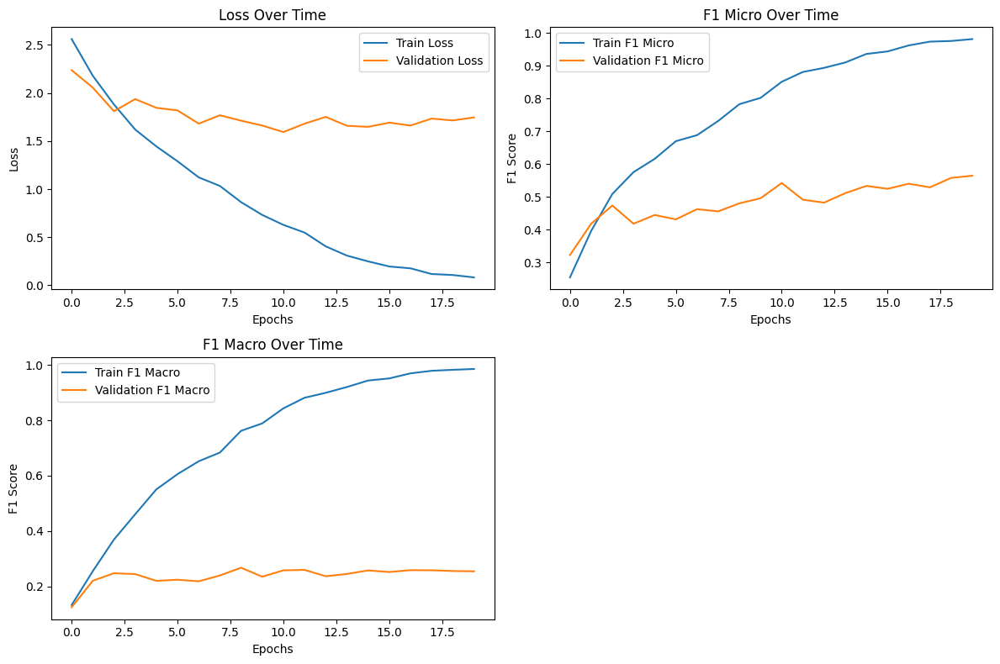

In [ ]:
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CHECKPOINT_FOLDER = '/content/drive/MyDrive/checkpoints'
MODEL_CHECKPOINT_FOLDER = os.path.join(CHECKPOINT_FOLDER, 'CustomViTandLSTM')
os.makedirs(MODEL_CHECKPOINT_FOLDER, exist_ok=True)


def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев ViT
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.vit.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.vit.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

            # save model
            if phase == 'val':
                model.eval()
                filename = f'custom_vit_lstm_epoch_{epoch}_loss_{epoch_loss:.4f}_f1_micro_{epoch_f1_micro:.4f}_f1_macro_{epoch_f1_macro:.4f}.pth'
                torch.save(model, os.path.join(MODEL_CHECKPOINT_FOLDER, filename))

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomViTandLSTM(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import torch
from torch.nn.functional import softmax
from tqdm import tqdm

def get_all_preds_and_labels(phase, model):
  all_preds = []
  all_labels = []
  for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
      inputs, labels, lengths_tensor = inputs.to(device), labels.to(device), lengths_tensor.to(device)

      lengths_tensor = lengths_tensor.to('cpu').long()  # Преобразование для использования в pack_padded_sequence

      with torch.set_grad_enabled(False):
          outputs = model(inputs, lengths_tensor)

      preds = outputs.argmax(dim=1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      del inputs, labels, lengths_tensor

  return all_preds, all_labels

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


all_train_preds, all_train_labels = get_all_preds_and_labels('train', model)
all_val_preds, all_val_labels = get_all_preds_and_labels('val', model)

train:   0%|          | 0/130 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=144, C=3, H=64, W=64
Output size from ViT: torch.Size([1152, 1000])


train:   1%|          | 1/130 [00:02<06:08,  2.85s/it]

Packed input size: torch.Size([8, 144, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:   2%|▏         | 2/130 [00:06<07:05,  3.33s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=185, C=3, H=64, W=64
Output size from ViT: torch.Size([1480, 1000])


train:   2%|▏         | 3/130 [00:10<07:23,  3.49s/it]

Packed input size: torch.Size([8, 185, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


train:   3%|▎         | 4/130 [00:12<06:25,  3.06s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=485, C=3, H=64, W=64
Output size from ViT: torch.Size([3880, 1000])


train:   4%|▍         | 5/130 [00:21<10:37,  5.10s/it]

Packed input size: torch.Size([8, 485, 1000])
Initial size: batch_size=8, sequence_length=250, C=3, H=64, W=64
Output size from ViT: torch.Size([2000, 1000])


train:   5%|▍         | 6/130 [00:26<10:22,  5.02s/it]

Packed input size: torch.Size([8, 250, 1000])
Initial size: batch_size=8, sequence_length=129, C=3, H=64, W=64
Output size from ViT: torch.Size([1032, 1000])


train:   5%|▌         | 7/130 [00:28<08:33,  4.17s/it]

Packed input size: torch.Size([8, 129, 1000])
Initial size: batch_size=8, sequence_length=315, C=3, H=64, W=64
Output size from ViT: torch.Size([2520, 1000])


train:   6%|▌         | 8/130 [00:34<09:34,  4.71s/it]

Packed input size: torch.Size([8, 315, 1000])
Initial size: batch_size=8, sequence_length=316, C=3, H=64, W=64
Output size from ViT: torch.Size([2528, 1000])


train:   7%|▋         | 9/130 [00:40<10:15,  5.08s/it]

Packed input size: torch.Size([8, 316, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:   8%|▊         | 10/130 [00:46<10:30,  5.25s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=106, C=3, H=64, W=64
Output size from ViT: torch.Size([848, 1000])


train:   8%|▊         | 11/130 [00:48<08:29,  4.28s/it]

Packed input size: torch.Size([8, 106, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:   9%|▉         | 12/130 [00:50<07:29,  3.81s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=354, C=3, H=64, W=64
Output size from ViT: torch.Size([2832, 1000])


train:  10%|█         | 13/130 [00:57<09:07,  4.68s/it]

Packed input size: torch.Size([8, 354, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  11%|█         | 14/130 [01:02<08:58,  4.64s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:  12%|█▏        | 15/130 [01:04<07:37,  3.98s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=429, C=3, H=64, W=64
Output size from ViT: torch.Size([3432, 1000])


train:  12%|█▏        | 16/130 [01:12<09:39,  5.08s/it]

Packed input size: torch.Size([8, 429, 1000])
Initial size: batch_size=8, sequence_length=248, C=3, H=64, W=64
Output size from ViT: torch.Size([1984, 1000])


train:  13%|█▎        | 17/130 [01:16<09:13,  4.90s/it]

Packed input size: torch.Size([8, 248, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  14%|█▍        | 18/130 [01:21<09:14,  4.95s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=149, C=3, H=64, W=64
Output size from ViT: torch.Size([1192, 1000])


train:  15%|█▍        | 19/130 [01:24<08:01,  4.34s/it]

Packed input size: torch.Size([8, 149, 1000])
Initial size: batch_size=8, sequence_length=206, C=3, H=64, W=64
Output size from ViT: torch.Size([1648, 1000])


train:  15%|█▌        | 20/130 [01:28<07:38,  4.17s/it]

Packed input size: torch.Size([8, 206, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  16%|█▌        | 21/130 [01:33<07:50,  4.31s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=94, C=3, H=64, W=64
Output size from ViT: torch.Size([752, 1000])


train:  17%|█▋        | 22/130 [01:34<06:23,  3.55s/it]

Packed input size: torch.Size([8, 94, 1000])
Initial size: batch_size=8, sequence_length=150, C=3, H=64, W=64
Output size from ViT: torch.Size([1200, 1000])


train:  18%|█▊        | 23/130 [01:37<05:59,  3.36s/it]

Packed input size: torch.Size([8, 150, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


train:  18%|█▊        | 24/130 [01:40<05:32,  3.14s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  19%|█▉        | 25/130 [01:45<06:46,  3.87s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  20%|██        | 26/130 [01:54<09:01,  5.21s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=147, C=3, H=64, W=64
Output size from ViT: torch.Size([1176, 1000])


train:  21%|██        | 27/130 [01:57<07:47,  4.54s/it]

Packed input size: torch.Size([8, 147, 1000])
Initial size: batch_size=8, sequence_length=461, C=3, H=64, W=64
Output size from ViT: torch.Size([3688, 1000])


train:  22%|██▏       | 28/130 [02:05<09:38,  5.67s/it]

Packed input size: torch.Size([8, 461, 1000])
Initial size: batch_size=8, sequence_length=132, C=3, H=64, W=64
Output size from ViT: torch.Size([1056, 1000])


train:  22%|██▏       | 29/130 [02:07<07:55,  4.71s/it]

Packed input size: torch.Size([8, 132, 1000])
Initial size: batch_size=8, sequence_length=203, C=3, H=64, W=64
Output size from ViT: torch.Size([1624, 1000])


train:  23%|██▎       | 30/130 [02:11<07:26,  4.47s/it]

Packed input size: torch.Size([8, 203, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  24%|██▍       | 31/130 [02:18<08:31,  5.17s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=376, C=3, H=64, W=64
Output size from ViT: torch.Size([3008, 1000])


train:  25%|██▍       | 32/130 [02:25<09:15,  5.67s/it]

Packed input size: torch.Size([8, 376, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  25%|██▌       | 33/130 [02:33<10:20,  6.40s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  26%|██▌       | 34/130 [02:37<09:14,  5.77s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  27%|██▋       | 35/130 [02:41<07:52,  4.97s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=198, C=3, H=64, W=64
Output size from ViT: torch.Size([1584, 1000])


train:  28%|██▊       | 36/130 [02:44<07:10,  4.58s/it]

Packed input size: torch.Size([8, 198, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  28%|██▊       | 37/130 [02:46<05:58,  3.86s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


train:  29%|██▉       | 38/130 [02:52<06:32,  4.27s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=255, C=3, H=64, W=64
Output size from ViT: torch.Size([2040, 1000])


train:  30%|███       | 39/130 [02:56<06:34,  4.34s/it]

Packed input size: torch.Size([8, 255, 1000])
Initial size: batch_size=8, sequence_length=163, C=3, H=64, W=64
Output size from ViT: torch.Size([1304, 1000])


train:  31%|███       | 40/130 [02:59<05:55,  3.95s/it]

Packed input size: torch.Size([8, 163, 1000])
Initial size: batch_size=8, sequence_length=187, C=3, H=64, W=64
Output size from ViT: torch.Size([1496, 1000])


train:  32%|███▏      | 41/130 [03:03<05:41,  3.84s/it]

Packed input size: torch.Size([8, 187, 1000])
Initial size: batch_size=8, sequence_length=274, C=3, H=64, W=64
Output size from ViT: torch.Size([2192, 1000])


train:  32%|███▏      | 42/130 [03:08<06:13,  4.24s/it]

Packed input size: torch.Size([8, 274, 1000])
Initial size: batch_size=8, sequence_length=372, C=3, H=64, W=64
Output size from ViT: torch.Size([2976, 1000])


train:  33%|███▎      | 43/130 [03:15<07:19,  5.05s/it]

Packed input size: torch.Size([8, 372, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  34%|███▍      | 44/130 [03:18<06:37,  4.62s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=360, C=3, H=64, W=64
Output size from ViT: torch.Size([2880, 1000])


train:  35%|███▍      | 45/130 [03:25<07:30,  5.30s/it]

Packed input size: torch.Size([8, 360, 1000])
Initial size: batch_size=8, sequence_length=267, C=3, H=64, W=64
Output size from ViT: torch.Size([2136, 1000])


train:  35%|███▌      | 46/130 [03:30<07:19,  5.23s/it]

Packed input size: torch.Size([8, 267, 1000])
Initial size: batch_size=8, sequence_length=152, C=3, H=64, W=64
Output size from ViT: torch.Size([1216, 1000])


train:  36%|███▌      | 47/130 [03:33<06:13,  4.50s/it]

Packed input size: torch.Size([8, 152, 1000])
Initial size: batch_size=8, sequence_length=119, C=3, H=64, W=64
Output size from ViT: torch.Size([952, 1000])


train:  37%|███▋      | 48/130 [03:35<05:13,  3.82s/it]

Packed input size: torch.Size([8, 119, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


train:  38%|███▊      | 49/130 [03:44<07:12,  5.34s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=346, C=3, H=64, W=64
Output size from ViT: torch.Size([2768, 1000])


train:  38%|███▊      | 50/130 [03:50<07:23,  5.54s/it]

Packed input size: torch.Size([8, 346, 1000])
Initial size: batch_size=8, sequence_length=159, C=3, H=64, W=64
Output size from ViT: torch.Size([1272, 1000])


train:  39%|███▉      | 51/130 [03:53<06:19,  4.81s/it]

Packed input size: torch.Size([8, 159, 1000])
Initial size: batch_size=8, sequence_length=161, C=3, H=64, W=64
Output size from ViT: torch.Size([1288, 1000])


train:  40%|████      | 52/130 [03:57<05:39,  4.35s/it]

Packed input size: torch.Size([8, 161, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  41%|████      | 53/130 [04:01<05:33,  4.33s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=62, C=3, H=64, W=64
Output size from ViT: torch.Size([496, 1000])


train:  42%|████▏     | 54/130 [04:02<04:19,  3.41s/it]

Packed input size: torch.Size([8, 62, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  42%|████▏     | 55/130 [04:08<05:16,  4.22s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=228, C=3, H=64, W=64
Output size from ViT: torch.Size([1824, 1000])


train:  43%|████▎     | 56/130 [04:13<05:16,  4.28s/it]

Packed input size: torch.Size([8, 228, 1000])
Initial size: batch_size=8, sequence_length=224, C=3, H=64, W=64
Output size from ViT: torch.Size([1792, 1000])


train:  44%|████▍     | 57/130 [04:17<05:14,  4.30s/it]

Packed input size: torch.Size([8, 224, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


train:  45%|████▍     | 58/130 [04:23<05:38,  4.70s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=222, C=3, H=64, W=64
Output size from ViT: torch.Size([1776, 1000])


train:  45%|████▌     | 59/130 [04:27<05:19,  4.51s/it]

Packed input size: torch.Size([8, 222, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


train:  46%|████▌     | 60/130 [04:31<05:05,  4.37s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=136, C=3, H=64, W=64
Output size from ViT: torch.Size([1088, 1000])


train:  47%|████▋     | 61/130 [04:34<04:25,  3.84s/it]

Packed input size: torch.Size([8, 136, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


train:  48%|████▊     | 62/130 [04:41<05:25,  4.78s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=396, C=3, H=64, W=64
Output size from ViT: torch.Size([3168, 1000])


train:  48%|████▊     | 63/130 [04:48<06:07,  5.48s/it]

Packed input size: torch.Size([8, 396, 1000])
Initial size: batch_size=8, sequence_length=420, C=3, H=64, W=64
Output size from ViT: torch.Size([3360, 1000])


train:  49%|████▉     | 64/130 [04:56<06:52,  6.25s/it]

Packed input size: torch.Size([8, 420, 1000])
Initial size: batch_size=8, sequence_length=318, C=3, H=64, W=64
Output size from ViT: torch.Size([2544, 1000])


train:  50%|█████     | 65/130 [05:01<06:38,  6.12s/it]

Packed input size: torch.Size([8, 318, 1000])
Initial size: batch_size=8, sequence_length=400, C=3, H=64, W=64
Output size from ViT: torch.Size([3200, 1000])


train:  51%|█████     | 66/130 [05:09<06:54,  6.47s/it]

Packed input size: torch.Size([8, 400, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  52%|█████▏    | 67/130 [05:12<05:49,  5.55s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=283, C=3, H=64, W=64
Output size from ViT: torch.Size([2264, 1000])


train:  52%|█████▏    | 68/130 [05:17<05:39,  5.48s/it]

Packed input size: torch.Size([8, 283, 1000])
Initial size: batch_size=8, sequence_length=307, C=3, H=64, W=64
Output size from ViT: torch.Size([2456, 1000])


train:  53%|█████▎    | 69/130 [05:23<05:36,  5.51s/it]

Packed input size: torch.Size([8, 307, 1000])
Initial size: batch_size=8, sequence_length=258, C=3, H=64, W=64
Output size from ViT: torch.Size([2064, 1000])


train:  54%|█████▍    | 70/130 [05:28<05:22,  5.38s/it]

Packed input size: torch.Size([8, 258, 1000])
Initial size: batch_size=8, sequence_length=384, C=3, H=64, W=64
Output size from ViT: torch.Size([3072, 1000])


train:  55%|█████▍    | 71/130 [05:35<05:45,  5.85s/it]

Packed input size: torch.Size([8, 384, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  55%|█████▌    | 72/130 [05:38<04:43,  4.88s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  56%|█████▌    | 73/130 [05:40<03:54,  4.12s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=97, C=3, H=64, W=64
Output size from ViT: torch.Size([776, 1000])


train:  57%|█████▋    | 74/130 [05:42<03:13,  3.46s/it]

Packed input size: torch.Size([8, 97, 1000])
Initial size: batch_size=8, sequence_length=381, C=3, H=64, W=64
Output size from ViT: torch.Size([3048, 1000])


train:  58%|█████▊    | 75/130 [05:49<04:04,  4.44s/it]

Packed input size: torch.Size([8, 381, 1000])
Initial size: batch_size=8, sequence_length=109, C=3, H=64, W=64
Output size from ViT: torch.Size([872, 1000])


train:  58%|█████▊    | 76/130 [05:51<03:22,  3.75s/it]

Packed input size: torch.Size([8, 109, 1000])
Initial size: batch_size=8, sequence_length=249, C=3, H=64, W=64
Output size from ViT: torch.Size([1992, 1000])


train:  59%|█████▉    | 77/130 [05:55<03:31,  3.98s/it]

Packed input size: torch.Size([8, 249, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  60%|██████    | 78/130 [06:01<03:48,  4.39s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=128, C=3, H=64, W=64
Output size from ViT: torch.Size([1024, 1000])


train:  61%|██████    | 79/130 [06:03<03:16,  3.85s/it]

Packed input size: torch.Size([8, 128, 1000])
Initial size: batch_size=8, sequence_length=92, C=3, H=64, W=64
Output size from ViT: torch.Size([736, 1000])


train:  62%|██████▏   | 80/130 [06:05<02:42,  3.26s/it]

Packed input size: torch.Size([8, 92, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  62%|██████▏   | 81/130 [06:09<02:41,  3.31s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=410, C=3, H=64, W=64
Output size from ViT: torch.Size([3280, 1000])


train:  63%|██████▎   | 82/130 [06:16<03:39,  4.57s/it]

Packed input size: torch.Size([8, 410, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  64%|██████▍   | 83/130 [06:21<03:39,  4.67s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  65%|██████▍   | 84/130 [06:26<03:32,  4.62s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=139, C=3, H=64, W=64
Output size from ViT: torch.Size([1112, 1000])


train:  65%|██████▌   | 85/130 [06:28<03:01,  4.04s/it]

Packed input size: torch.Size([8, 139, 1000])
Initial size: batch_size=8, sequence_length=174, C=3, H=64, W=64
Output size from ViT: torch.Size([1392, 1000])


train:  66%|██████▌   | 86/130 [06:32<02:49,  3.85s/it]

Packed input size: torch.Size([8, 174, 1000])
Initial size: batch_size=8, sequence_length=190, C=3, H=64, W=64
Output size from ViT: torch.Size([1520, 1000])


train:  67%|██████▋   | 87/130 [06:35<02:43,  3.80s/it]

Packed input size: torch.Size([8, 190, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  68%|██████▊   | 88/130 [06:39<02:43,  3.89s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=226, C=3, H=64, W=64
Output size from ViT: torch.Size([1808, 1000])


train:  68%|██████▊   | 89/130 [06:44<02:44,  4.00s/it]

Packed input size: torch.Size([8, 226, 1000])
Initial size: batch_size=8, sequence_length=366, C=3, H=64, W=64
Output size from ViT: torch.Size([2928, 1000])


train:  69%|██████▉   | 90/130 [06:50<03:12,  4.81s/it]

Packed input size: torch.Size([8, 366, 1000])
Initial size: batch_size=8, sequence_length=394, C=3, H=64, W=64
Output size from ViT: torch.Size([3152, 1000])


train:  70%|███████   | 91/130 [06:57<03:32,  5.46s/it]

Packed input size: torch.Size([8, 394, 1000])
Initial size: batch_size=8, sequence_length=253, C=3, H=64, W=64
Output size from ViT: torch.Size([2024, 1000])


train:  71%|███████   | 92/130 [07:02<03:19,  5.26s/it]

Packed input size: torch.Size([8, 253, 1000])
Initial size: batch_size=8, sequence_length=246, C=3, H=64, W=64
Output size from ViT: torch.Size([1968, 1000])


train:  72%|███████▏  | 93/130 [07:07<03:06,  5.05s/it]

Packed input size: torch.Size([8, 246, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


train:  72%|███████▏  | 94/130 [07:09<02:34,  4.29s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=465, C=3, H=64, W=64
Output size from ViT: torch.Size([3720, 1000])


train:  73%|███████▎  | 95/130 [07:18<03:13,  5.52s/it]

Packed input size: torch.Size([8, 465, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  74%|███████▍  | 96/130 [07:23<03:09,  5.59s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=142, C=3, H=64, W=64
Output size from ViT: torch.Size([1136, 1000])


train:  75%|███████▍  | 97/130 [07:26<02:36,  4.75s/it]

Packed input size: torch.Size([8, 142, 1000])
Initial size: batch_size=8, sequence_length=173, C=3, H=64, W=64
Output size from ViT: torch.Size([1384, 1000])


train:  75%|███████▌  | 98/130 [07:29<02:18,  4.32s/it]

Packed input size: torch.Size([8, 173, 1000])
Initial size: batch_size=8, sequence_length=238, C=3, H=64, W=64
Output size from ViT: torch.Size([1904, 1000])


train:  76%|███████▌  | 99/130 [07:34<02:14,  4.35s/it]

Packed input size: torch.Size([8, 238, 1000])
Initial size: batch_size=8, sequence_length=364, C=3, H=64, W=64
Output size from ViT: torch.Size([2912, 1000])


train:  77%|███████▋  | 100/130 [07:41<02:32,  5.08s/it]

Packed input size: torch.Size([8, 364, 1000])
Initial size: batch_size=8, sequence_length=438, C=3, H=64, W=64
Output size from ViT: torch.Size([3504, 1000])


train:  78%|███████▊  | 101/130 [07:49<02:55,  6.06s/it]

Packed input size: torch.Size([8, 438, 1000])
Initial size: batch_size=8, sequence_length=281, C=3, H=64, W=64
Output size from ViT: torch.Size([2248, 1000])


train:  78%|███████▊  | 102/130 [07:54<02:44,  5.86s/it]

Packed input size: torch.Size([8, 281, 1000])
Initial size: batch_size=8, sequence_length=309, C=3, H=64, W=64
Output size from ViT: torch.Size([2472, 1000])


train:  79%|███████▉  | 103/130 [08:00<02:37,  5.82s/it]

Packed input size: torch.Size([8, 309, 1000])
Initial size: batch_size=8, sequence_length=64, C=3, H=64, W=64
Output size from ViT: torch.Size([512, 1000])


train:  80%|████████  | 104/130 [08:01<01:56,  4.47s/it]

Packed input size: torch.Size([8, 64, 1000])
Initial size: batch_size=8, sequence_length=251, C=3, H=64, W=64
Output size from ViT: torch.Size([2008, 1000])


train:  81%|████████  | 105/130 [08:06<01:51,  4.48s/it]

Packed input size: torch.Size([8, 251, 1000])
Initial size: batch_size=8, sequence_length=344, C=3, H=64, W=64
Output size from ViT: torch.Size([2752, 1000])


train:  82%|████████▏ | 106/130 [08:12<02:00,  5.02s/it]

Packed input size: torch.Size([8, 344, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  82%|████████▏ | 107/130 [08:18<02:00,  5.23s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=158, C=3, H=64, W=64
Output size from ViT: torch.Size([1264, 1000])


train:  83%|████████▎ | 108/130 [08:21<01:40,  4.57s/it]

Packed input size: torch.Size([8, 158, 1000])
Initial size: batch_size=8, sequence_length=331, C=3, H=64, W=64
Output size from ViT: torch.Size([2648, 1000])


train:  84%|████████▍ | 109/130 [08:27<01:48,  5.15s/it]

Packed input size: torch.Size([8, 331, 1000])
Initial size: batch_size=8, sequence_length=240, C=3, H=64, W=64
Output size from ViT: torch.Size([1920, 1000])


train:  85%|████████▍ | 110/130 [08:32<01:39,  4.99s/it]

Packed input size: torch.Size([8, 240, 1000])
Initial size: batch_size=8, sequence_length=178, C=3, H=64, W=64
Output size from ViT: torch.Size([1424, 1000])


train:  85%|████████▌ | 111/130 [08:35<01:25,  4.51s/it]

Packed input size: torch.Size([8, 178, 1000])
Initial size: batch_size=8, sequence_length=114, C=3, H=64, W=64
Output size from ViT: torch.Size([912, 1000])


train:  86%|████████▌ | 112/130 [08:38<01:08,  3.80s/it]

Packed input size: torch.Size([8, 114, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


train:  87%|████████▋ | 113/130 [08:41<01:03,  3.76s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=213, C=3, H=64, W=64
Output size from ViT: torch.Size([1704, 1000])


train:  88%|████████▊ | 114/130 [08:45<01:00,  3.80s/it]

Packed input size: torch.Size([8, 213, 1000])
Initial size: batch_size=8, sequence_length=452, C=3, H=64, W=64
Output size from ViT: torch.Size([3616, 1000])


train:  88%|████████▊ | 115/130 [08:54<01:17,  5.17s/it]

Packed input size: torch.Size([8, 452, 1000])
Initial size: batch_size=8, sequence_length=214, C=3, H=64, W=64
Output size from ViT: torch.Size([1712, 1000])


train:  89%|████████▉ | 116/130 [08:58<01:08,  4.87s/it]

Packed input size: torch.Size([8, 214, 1000])
Initial size: batch_size=8, sequence_length=197, C=3, H=64, W=64
Output size from ViT: torch.Size([1576, 1000])


train:  90%|█████████ | 117/130 [09:01<00:58,  4.50s/it]

Packed input size: torch.Size([8, 197, 1000])
Initial size: batch_size=8, sequence_length=118, C=3, H=64, W=64
Output size from ViT: torch.Size([944, 1000])


train:  91%|█████████ | 118/130 [09:04<00:46,  3.83s/it]

Packed input size: torch.Size([8, 118, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


train:  92%|█████████▏| 119/130 [09:09<00:47,  4.31s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=292, C=3, H=64, W=64
Output size from ViT: torch.Size([2336, 1000])


train:  92%|█████████▏| 120/130 [09:14<00:46,  4.63s/it]

Packed input size: torch.Size([8, 292, 1000])
Initial size: batch_size=8, sequence_length=436, C=3, H=64, W=64
Output size from ViT: torch.Size([3488, 1000])


train:  93%|█████████▎| 121/130 [09:22<00:50,  5.59s/it]

Packed input size: torch.Size([8, 436, 1000])
Initial size: batch_size=8, sequence_length=221, C=3, H=64, W=64
Output size from ViT: torch.Size([1768, 1000])


train:  94%|█████████▍| 122/130 [09:27<00:41,  5.24s/it]

Packed input size: torch.Size([8, 221, 1000])
Initial size: batch_size=8, sequence_length=415, C=3, H=64, W=64
Output size from ViT: torch.Size([3320, 1000])


train:  95%|█████████▍| 123/130 [09:34<00:41,  6.00s/it]

Packed input size: torch.Size([8, 415, 1000])
Initial size: batch_size=8, sequence_length=113, C=3, H=64, W=64
Output size from ViT: torch.Size([904, 1000])


train:  95%|█████████▌| 124/130 [09:37<00:28,  4.83s/it]

Packed input size: torch.Size([8, 113, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  96%|█████████▌| 125/130 [09:42<00:25,  5.11s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


train:  97%|█████████▋| 126/130 [09:44<00:16,  4.13s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=186, C=3, H=64, W=64
Output size from ViT: torch.Size([1488, 1000])


train:  98%|█████████▊| 127/130 [09:48<00:11,  3.95s/it]

Packed input size: torch.Size([8, 186, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


train:  98%|█████████▊| 128/130 [09:53<00:08,  4.45s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=300, C=3, H=64, W=64
Output size from ViT: torch.Size([2400, 1000])


train:  99%|█████████▉| 129/130 [09:59<00:04,  4.79s/it]

Packed input size: torch.Size([8, 300, 1000])
Initial size: batch_size=4, sequence_length=449, C=3, H=64, W=64
Output size from ViT: torch.Size([1796, 1000])


train: 100%|██████████| 130/130 [10:03<00:00,  4.64s/it]


Packed input size: torch.Size([4, 449, 1000])


val:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val:   2%|▏         | 1/57 [00:04<04:01,  4.31s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val:   4%|▎         | 2/57 [00:08<04:00,  4.37s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val:   5%|▌         | 3/57 [00:15<04:46,  5.30s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val:   7%|▋         | 4/57 [00:23<05:39,  6.41s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val:   9%|▉         | 5/57 [00:25<04:17,  4.95s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val:  11%|█         | 6/57 [00:34<05:12,  6.14s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val:  12%|█▏        | 7/57 [00:36<04:13,  5.08s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val:  14%|█▍        | 8/57 [00:39<03:36,  4.41s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val:  16%|█▌        | 9/57 [00:43<03:20,  4.17s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val:  18%|█▊        | 10/57 [00:51<04:05,  5.21s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val:  19%|█▉        | 11/57 [00:56<04:03,  5.29s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val:  21%|██        | 12/57 [01:03<04:17,  5.73s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val:  23%|██▎       | 13/57 [01:09<04:12,  5.75s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val:  25%|██▍       | 14/57 [01:17<04:45,  6.63s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val:  26%|██▋       | 15/57 [01:25<04:51,  6.95s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val:  28%|██▊       | 16/57 [01:33<04:52,  7.13s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val:  30%|██▉       | 17/57 [01:38<04:30,  6.75s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val:  32%|███▏      | 18/57 [01:41<03:34,  5.49s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val:  33%|███▎      | 19/57 [01:46<03:28,  5.48s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val:  35%|███▌      | 20/57 [01:48<02:43,  4.42s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val:  37%|███▋      | 21/57 [01:56<03:09,  5.25s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val:  39%|███▊      | 22/57 [01:59<02:42,  4.65s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val:  40%|████      | 23/57 [02:01<02:17,  4.05s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val:  42%|████▏     | 24/57 [02:05<02:12,  4.01s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val:  44%|████▍     | 25/57 [02:10<02:09,  4.06s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  46%|████▌     | 26/57 [02:13<01:56,  3.75s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  47%|████▋     | 27/57 [02:16<01:52,  3.74s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val:  49%|████▉     | 28/57 [02:19<01:38,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val:  51%|█████     | 29/57 [02:21<01:27,  3.11s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val:  53%|█████▎    | 30/57 [02:23<01:15,  2.80s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  54%|█████▍    | 31/57 [02:25<01:04,  2.49s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val:  56%|█████▌    | 32/57 [02:26<00:52,  2.12s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val:  58%|█████▊    | 33/57 [02:28<00:48,  2.00s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val:  60%|█████▉    | 34/57 [02:30<00:41,  1.82s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val:  61%|██████▏   | 35/57 [02:31<00:34,  1.58s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val:  63%|██████▎   | 36/57 [02:31<00:27,  1.29s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val:  65%|██████▍   | 37/57 [02:34<00:35,  1.77s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val:  67%|██████▋   | 38/57 [02:41<01:04,  3.38s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val:  68%|██████▊   | 39/57 [02:45<01:02,  3.48s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val:  70%|███████   | 40/57 [02:48<00:56,  3.33s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val:  72%|███████▏  | 41/57 [02:49<00:42,  2.67s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val:  74%|███████▎  | 42/57 [02:50<00:31,  2.12s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val:  75%|███████▌  | 43/57 [02:54<00:37,  2.65s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val:  77%|███████▋  | 44/57 [03:00<00:46,  3.60s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val:  79%|███████▉  | 45/57 [03:05<00:50,  4.21s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val:  81%|████████  | 46/57 [03:10<00:47,  4.30s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val:  82%|████████▏ | 47/57 [03:13<00:39,  3.94s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val:  84%|████████▍ | 48/57 [03:15<00:32,  3.56s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val:  86%|████████▌ | 49/57 [03:17<00:23,  2.94s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val:  88%|████████▊ | 50/57 [03:24<00:30,  4.32s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val:  89%|████████▉ | 51/57 [03:29<00:25,  4.23s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val:  91%|█████████ | 52/57 [03:35<00:24,  4.98s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val:  93%|█████████▎| 53/57 [03:39<00:18,  4.60s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val:  95%|█████████▍| 54/57 [03:43<00:13,  4.51s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val:  96%|█████████▋| 55/57 [03:49<00:09,  4.81s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val: 100%|██████████| 57/57 [03:51<00:00,  4.06s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])


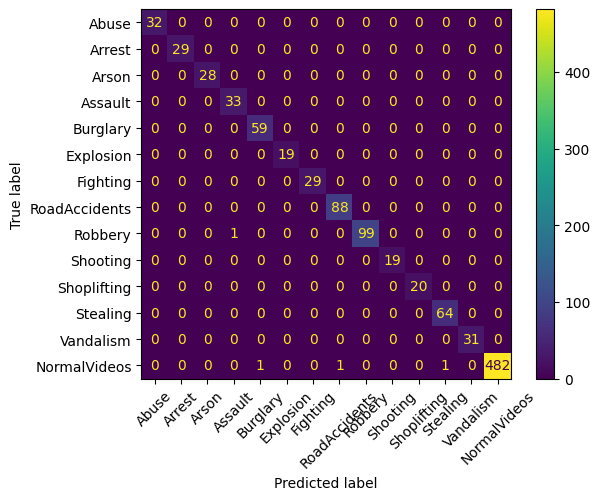

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_train_labels, all_train_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

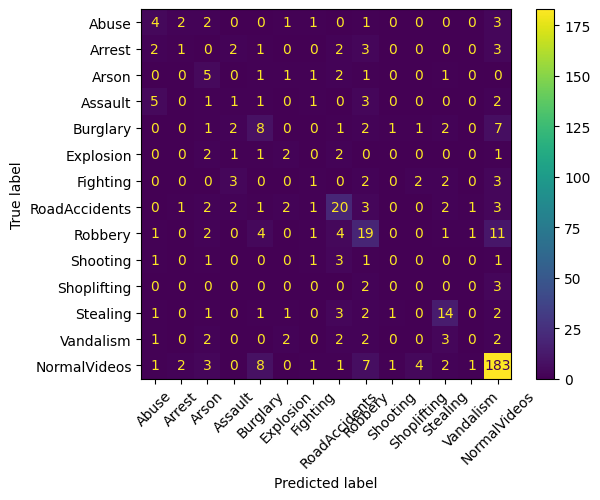

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_val_labels, all_val_preds, labels=range(len(CLASS_NAMES)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)

# Отображаем матрицу ошибок с поворотом подписей классов на 45 градусов
disp.plot(xticks_rotation=45)
plt.show()

In [ ]:
def get_all_preds_probs_and_labels(phase, model, device):
    model.to(device).eval()  # Переключаем модель в режим оценки и отправляем на устройство
    all_probs = []
    all_labels = []
    with torch.no_grad():  # Гарантируем, что градиенты не будут вычисляться
        for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase} Iteration"):
            inputs, labels = inputs.to(device), labels.to(device)
            lengths_tensor = lengths_tensor.to('cpu').long()  # Длины должны быть на CPU

            outputs = model(inputs, lengths_tensor)  # Получаем логиты
            probs = softmax(outputs, dim=1)  # Применяем softmax для получения вероятностей
            all_probs.extend(probs.cpu().numpy())  # Сохраняем вероятности
            all_labels.extend(labels.cpu().numpy())  # Сохраняем истинные метки
            # Освобождаем память, если это необходимо
            del inputs, labels, lengths_tensor, outputs, probs

    return all_probs, all_labels

In [ ]:
all_probs, all_labels = get_all_preds_probs_and_labels('val', model, device)

val Iteration:   0%|          | 0/57 [00:00<?, ?it/s]

Initial size: batch_size=8, sequence_length=219, C=3, H=64, W=64
Output size from ViT: torch.Size([1752, 1000])


val Iteration:   2%|▏         | 1/57 [00:04<04:07,  4.42s/it]

Packed input size: torch.Size([8, 219, 1000])
Initial size: batch_size=8, sequence_length=230, C=3, H=64, W=64
Output size from ViT: torch.Size([1840, 1000])


val Iteration:   4%|▎         | 2/57 [00:08<04:04,  4.45s/it]

Packed input size: torch.Size([8, 230, 1000])
Initial size: batch_size=8, sequence_length=356, C=3, H=64, W=64
Output size from ViT: torch.Size([2848, 1000])


val Iteration:   5%|▌         | 3/57 [00:15<04:49,  5.35s/it]

Packed input size: torch.Size([8, 356, 1000])
Initial size: batch_size=8, sequence_length=432, C=3, H=64, W=64
Output size from ViT: torch.Size([3456, 1000])


val Iteration:   7%|▋         | 4/57 [00:23<05:42,  6.46s/it]

Packed input size: torch.Size([8, 432, 1000])
Initial size: batch_size=8, sequence_length=120, C=3, H=64, W=64
Output size from ViT: torch.Size([960, 1000])


val Iteration:   9%|▉         | 5/57 [00:25<04:19,  4.99s/it]

Packed input size: torch.Size([8, 120, 1000])
Initial size: batch_size=8, sequence_length=472, C=3, H=64, W=64
Output size from ViT: torch.Size([3776, 1000])


val Iteration:  11%|█         | 6/57 [00:34<05:13,  6.15s/it]

Packed input size: torch.Size([8, 472, 1000])
Initial size: batch_size=8, sequence_length=146, C=3, H=64, W=64
Output size from ViT: torch.Size([1168, 1000])


val Iteration:  12%|█▏        | 7/57 [00:37<04:14,  5.09s/it]

Packed input size: torch.Size([8, 146, 1000])
Initial size: batch_size=8, sequence_length=157, C=3, H=64, W=64
Output size from ViT: torch.Size([1256, 1000])


val Iteration:  14%|█▍        | 8/57 [00:40<03:36,  4.42s/it]

Packed input size: torch.Size([8, 157, 1000])
Initial size: batch_size=8, sequence_length=194, C=3, H=64, W=64
Output size from ViT: torch.Size([1552, 1000])


val Iteration:  16%|█▌        | 9/57 [00:43<03:20,  4.17s/it]

Packed input size: torch.Size([8, 194, 1000])
Initial size: batch_size=8, sequence_length=402, C=3, H=64, W=64
Output size from ViT: torch.Size([3216, 1000])


val Iteration:  18%|█▊        | 10/57 [00:51<04:07,  5.26s/it]

Packed input size: torch.Size([8, 402, 1000])
Initial size: batch_size=8, sequence_length=290, C=3, H=64, W=64
Output size from ViT: torch.Size([2320, 1000])


val Iteration:  19%|█▉        | 11/57 [00:56<04:04,  5.32s/it]

Packed input size: torch.Size([8, 290, 1000])
Initial size: batch_size=8, sequence_length=358, C=3, H=64, W=64
Output size from ViT: torch.Size([2864, 1000])


val Iteration:  21%|██        | 12/57 [01:03<04:18,  5.74s/it]

Packed input size: torch.Size([8, 358, 1000])
Initial size: batch_size=8, sequence_length=301, C=3, H=64, W=64
Output size from ViT: torch.Size([2408, 1000])


val Iteration:  23%|██▎       | 13/57 [01:09<04:12,  5.73s/it]

Packed input size: torch.Size([8, 301, 1000])
Initial size: batch_size=8, sequence_length=443, C=3, H=64, W=64
Output size from ViT: torch.Size([3544, 1000])


val Iteration:  25%|██▍       | 14/57 [01:18<04:44,  6.62s/it]

Packed input size: torch.Size([8, 443, 1000])
Initial size: batch_size=8, sequence_length=405, C=3, H=64, W=64
Output size from ViT: torch.Size([3240, 1000])


val Iteration:  26%|██▋       | 15/57 [01:25<04:51,  6.95s/it]

Packed input size: torch.Size([8, 405, 1000])
Initial size: batch_size=8, sequence_length=390, C=3, H=64, W=64
Output size from ViT: torch.Size([3120, 1000])


val Iteration:  28%|██▊       | 16/57 [01:33<04:51,  7.11s/it]

Packed input size: torch.Size([8, 390, 1000])
Initial size: batch_size=8, sequence_length=293, C=3, H=64, W=64
Output size from ViT: torch.Size([2344, 1000])


val Iteration:  30%|██▉       | 17/57 [01:39<04:29,  6.73s/it]

Packed input size: torch.Size([8, 293, 1000])
Initial size: batch_size=8, sequence_length=123, C=3, H=64, W=64
Output size from ViT: torch.Size([984, 1000])


val Iteration:  32%|███▏      | 18/57 [01:41<03:33,  5.48s/it]

Packed input size: torch.Size([8, 123, 1000])
Initial size: batch_size=8, sequence_length=299, C=3, H=64, W=64
Output size from ViT: torch.Size([2392, 1000])


val Iteration:  33%|███▎      | 19/57 [01:47<03:28,  5.48s/it]

Packed input size: torch.Size([8, 299, 1000])
Initial size: batch_size=8, sequence_length=96, C=3, H=64, W=64
Output size from ViT: torch.Size([768, 1000])


val Iteration:  35%|███▌      | 20/57 [01:49<02:44,  4.44s/it]

Packed input size: torch.Size([8, 96, 1000])
Initial size: batch_size=8, sequence_length=401, C=3, H=64, W=64
Output size from ViT: torch.Size([3208, 1000])


val Iteration:  37%|███▋      | 21/57 [01:56<03:09,  5.25s/it]

Packed input size: torch.Size([8, 401, 1000])
Initial size: batch_size=8, sequence_length=155, C=3, H=64, W=64
Output size from ViT: torch.Size([1240, 1000])


val Iteration:  39%|███▊      | 22/57 [01:59<02:42,  4.65s/it]

Packed input size: torch.Size([8, 155, 1000])
Initial size: batch_size=8, sequence_length=138, C=3, H=64, W=64
Output size from ViT: torch.Size([1104, 1000])


val Iteration:  40%|████      | 23/57 [02:02<02:17,  4.05s/it]

Packed input size: torch.Size([8, 138, 1000])
Initial size: batch_size=8, sequence_length=212, C=3, H=64, W=64
Output size from ViT: torch.Size([1696, 1000])


val Iteration:  42%|████▏     | 24/57 [02:06<02:12,  4.01s/it]

Packed input size: torch.Size([8, 212, 1000])
Initial size: batch_size=8, sequence_length=216, C=3, H=64, W=64
Output size from ViT: torch.Size([1728, 1000])


val Iteration:  44%|████▍     | 25/57 [02:10<02:09,  4.06s/it]

Packed input size: torch.Size([8, 216, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val Iteration:  46%|████▌     | 26/57 [02:13<01:56,  3.75s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val Iteration:  47%|████▋     | 27/57 [02:16<01:52,  3.74s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=124, C=3, H=64, W=64
Output size from ViT: torch.Size([992, 1000])


val Iteration:  49%|████▉     | 28/57 [02:19<01:38,  3.38s/it]

Packed input size: torch.Size([8, 124, 1000])
Initial size: batch_size=8, sequence_length=130, C=3, H=64, W=64
Output size from ViT: torch.Size([1040, 1000])


val Iteration:  51%|█████     | 29/57 [02:22<01:27,  3.11s/it]

Packed input size: torch.Size([8, 130, 1000])
Initial size: batch_size=8, sequence_length=105, C=3, H=64, W=64
Output size from ViT: torch.Size([840, 1000])


val Iteration:  53%|█████▎    | 30/57 [02:24<01:15,  2.80s/it]

Packed input size: torch.Size([8, 105, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val Iteration:  54%|█████▍    | 31/57 [02:25<01:04,  2.49s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=63, C=3, H=64, W=64
Output size from ViT: torch.Size([504, 1000])


val Iteration:  56%|█████▌    | 32/57 [02:27<00:52,  2.12s/it]

Packed input size: torch.Size([8, 63, 1000])
Initial size: batch_size=8, sequence_length=91, C=3, H=64, W=64
Output size from ViT: torch.Size([728, 1000])


val Iteration:  58%|█████▊    | 33/57 [02:28<00:48,  2.00s/it]

Packed input size: torch.Size([8, 91, 1000])
Initial size: batch_size=8, sequence_length=70, C=3, H=64, W=64
Output size from ViT: torch.Size([560, 1000])


val Iteration:  60%|█████▉    | 34/57 [02:30<00:41,  1.82s/it]

Packed input size: torch.Size([8, 70, 1000])
Initial size: batch_size=8, sequence_length=52, C=3, H=64, W=64
Output size from ViT: torch.Size([416, 1000])


val Iteration:  61%|██████▏   | 35/57 [02:31<00:35,  1.60s/it]

Packed input size: torch.Size([8, 52, 1000])
Initial size: batch_size=8, sequence_length=29, C=3, H=64, W=64
Output size from ViT: torch.Size([232, 1000])


val Iteration:  63%|██████▎   | 36/57 [02:31<00:27,  1.30s/it]

Packed input size: torch.Size([8, 29, 1000])
Initial size: batch_size=8, sequence_length=153, C=3, H=64, W=64
Output size from ViT: torch.Size([1224, 1000])


val Iteration:  65%|██████▍   | 37/57 [02:34<00:35,  1.78s/it]

Packed input size: torch.Size([8, 153, 1000])
Initial size: batch_size=8, sequence_length=397, C=3, H=64, W=64
Output size from ViT: torch.Size([3176, 1000])


val Iteration:  67%|██████▋   | 38/57 [02:41<01:04,  3.39s/it]

Packed input size: torch.Size([8, 397, 1000])
Initial size: batch_size=8, sequence_length=199, C=3, H=64, W=64
Output size from ViT: torch.Size([1592, 1000])


val Iteration:  68%|██████▊   | 39/57 [02:45<01:02,  3.49s/it]

Packed input size: torch.Size([8, 199, 1000])
Initial size: batch_size=8, sequence_length=154, C=3, H=64, W=64
Output size from ViT: torch.Size([1232, 1000])


val Iteration:  70%|███████   | 40/57 [02:48<00:56,  3.34s/it]

Packed input size: torch.Size([8, 154, 1000])
Initial size: batch_size=8, sequence_length=58, C=3, H=64, W=64
Output size from ViT: torch.Size([464, 1000])


val Iteration:  72%|███████▏  | 41/57 [02:49<00:42,  2.68s/it]

Packed input size: torch.Size([8, 58, 1000])
Initial size: batch_size=8, sequence_length=43, C=3, H=64, W=64
Output size from ViT: torch.Size([344, 1000])


val Iteration:  74%|███████▎  | 42/57 [02:50<00:31,  2.13s/it]

Packed input size: torch.Size([8, 43, 1000])
Initial size: batch_size=8, sequence_length=196, C=3, H=64, W=64
Output size from ViT: torch.Size([1568, 1000])


val Iteration:  75%|███████▌  | 43/57 [02:54<00:37,  2.66s/it]

Packed input size: torch.Size([8, 196, 1000])
Initial size: batch_size=8, sequence_length=319, C=3, H=64, W=64
Output size from ViT: torch.Size([2552, 1000])


val Iteration:  77%|███████▋  | 44/57 [03:00<00:46,  3.61s/it]

Packed input size: torch.Size([8, 319, 1000])
Initial size: batch_size=8, sequence_length=291, C=3, H=64, W=64
Output size from ViT: torch.Size([2328, 1000])


val Iteration:  79%|███████▉  | 45/57 [03:06<00:50,  4.21s/it]

Packed input size: torch.Size([8, 291, 1000])
Initial size: batch_size=8, sequence_length=237, C=3, H=64, W=64
Output size from ViT: torch.Size([1896, 1000])


val Iteration:  81%|████████  | 46/57 [03:10<00:47,  4.32s/it]

Packed input size: torch.Size([8, 237, 1000])
Initial size: batch_size=8, sequence_length=156, C=3, H=64, W=64
Output size from ViT: torch.Size([1248, 1000])


val Iteration:  82%|████████▏ | 47/57 [03:13<00:39,  3.94s/it]

Packed input size: torch.Size([8, 156, 1000])
Initial size: batch_size=8, sequence_length=134, C=3, H=64, W=64
Output size from ViT: torch.Size([1072, 1000])


val Iteration:  84%|████████▍ | 48/57 [03:16<00:32,  3.56s/it]

Packed input size: torch.Size([8, 134, 1000])
Initial size: batch_size=8, sequence_length=76, C=3, H=64, W=64
Output size from ViT: torch.Size([608, 1000])


val Iteration:  86%|████████▌ | 49/57 [03:17<00:23,  2.94s/it]

Packed input size: torch.Size([8, 76, 1000])
Initial size: batch_size=8, sequence_length=388, C=3, H=64, W=64
Output size from ViT: torch.Size([3104, 1000])


val Iteration:  88%|████████▊ | 50/57 [03:25<00:30,  4.34s/it]

Packed input size: torch.Size([8, 388, 1000])
Initial size: batch_size=8, sequence_length=209, C=3, H=64, W=64
Output size from ViT: torch.Size([1672, 1000])


val Iteration:  89%|████████▉ | 51/57 [03:29<00:25,  4.32s/it]

Packed input size: torch.Size([8, 209, 1000])
Initial size: batch_size=8, sequence_length=333, C=3, H=64, W=64
Output size from ViT: torch.Size([2664, 1000])


val Iteration:  91%|█████████ | 52/57 [03:36<00:25,  5.03s/it]

Packed input size: torch.Size([8, 333, 1000])
Initial size: batch_size=8, sequence_length=191, C=3, H=64, W=64
Output size from ViT: torch.Size([1528, 1000])


val Iteration:  93%|█████████▎| 53/57 [03:40<00:18,  4.66s/it]

Packed input size: torch.Size([8, 191, 1000])
Initial size: batch_size=8, sequence_length=241, C=3, H=64, W=64
Output size from ViT: torch.Size([1928, 1000])


val Iteration:  95%|█████████▍| 54/57 [03:44<00:13,  4.55s/it]

Packed input size: torch.Size([8, 241, 1000])
Initial size: batch_size=8, sequence_length=298, C=3, H=64, W=64
Output size from ViT: torch.Size([2384, 1000])


val Iteration:  96%|█████████▋| 55/57 [03:49<00:09,  4.85s/it]

Packed input size: torch.Size([8, 298, 1000])
Initial size: batch_size=8, sequence_length=108, C=3, H=64, W=64
Output size from ViT: torch.Size([864, 1000])


val Iteration: 100%|██████████| 57/57 [03:52<00:00,  4.07s/it]

Packed input size: torch.Size([8, 108, 1000])
Initial size: batch_size=2, sequence_length=34, C=3, H=64, W=64
Output size from ViT: torch.Size([68, 1000])
Packed input size: torch.Size([2, 34, 1000])


##Vision Transformer + LSTM ROC AUC 0.91

ROC AUC: 0.91


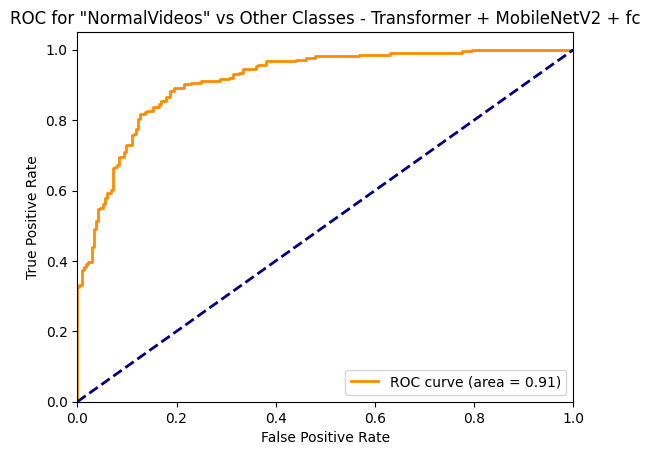

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Преобразуем all_probs в NumPy массив для правильной индексации
all_probs = np.array(all_probs)

# Теперь мы можем безопасно индексировать all_probs для получения вероятностей
normal_class_probs = all_probs[:, CLASS_TO_IDX['NormalVideos']]

# Убедимся, что all_labels является массивом NumPy
all_labels = np.array(all_labels)

# Теперь мы можем безопасно использовать .astype() на всём массиве
binary_labels = (all_labels == CLASS_TO_IDX['NormalVideos']).astype(int)

# Вычисляем FPR и TPR для ROC
fpr, tpr, _ = roc_curve(binary_labels, normal_class_probs)

# Вычисляем площадь под ROC-кривой (AUC)
roc_auc = auc(fpr, tpr)

# Выводим значение ROC AUC
print('ROC AUC: {:.2f}'.format(roc_auc))

# Построение графика ROC-кривой
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for "NormalVideos" vs Other Classes - Transformer + MobileNetV2 + fc')
plt.legend(loc="lower right")
plt.show()

##Подсчет размерностей на каждом слое и общего количества параметров

In [ ]:
model = CustomViTandLSTM(num_classes=14, num_lstm_layers=1)

# Подсчет параметров
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable_params = total_params - trainable_params

print(f"Total params: {total_params}")
print(f"Trainable params: {trainable_params}")
print(f"Non-trainable params: {non_trainable_params}")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Total params: 89675510
Trainable params: 3107854
Non-trainable params: 86567656


In [ ]:
for name, param in model.named_parameters():
    print(f"{name}: {param.size()}, Trainable: {param.requires_grad}")

vit.cls_token: torch.Size([1, 1, 768]), Trainable: False
vit.pos_embed: torch.Size([1, 197, 768]), Trainable: False
vit.patch_embed.proj.weight: torch.Size([768, 3, 16, 16]), Trainable: False
vit.patch_embed.proj.bias: torch.Size([768]), Trainable: False
vit.blocks.0.norm1.weight: torch.Size([768]), Trainable: False
vit.blocks.0.norm1.bias: torch.Size([768]), Trainable: False
vit.blocks.0.attn.qkv.weight: torch.Size([2304, 768]), Trainable: False
vit.blocks.0.attn.qkv.bias: torch.Size([2304]), Trainable: False
vit.blocks.0.attn.proj.weight: torch.Size([768, 768]), Trainable: False
vit.blocks.0.attn.proj.bias: torch.Size([768]), Trainable: False
vit.blocks.0.norm2.weight: torch.Size([768]), Trainable: False
vit.blocks.0.norm2.bias: torch.Size([768]), Trainable: False
vit.blocks.0.mlp.fc1.weight: torch.Size([3072, 768]), Trainable: False
vit.blocks.0.mlp.fc1.bias: torch.Size([3072]), Trainable: False
vit.blocks.0.mlp.fc2.weight: torch.Size([768, 3072]), Trainable: False
vit.blocks.0.mlp.

#Облако слов из статей

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 17.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.8/30.8 MB 33.1 MB/s eta 0:00:00


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


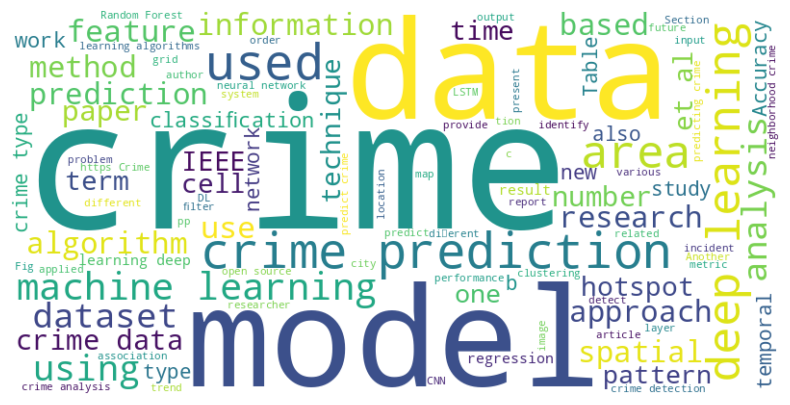

In [ ]:
# Установка необходимых библиотек
!pip install pymupdf
!pip install wordcloud
!pip install nltk

import fitz  # PyMuPDF
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import requests
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')
nltk.download('stopwords')

# Загрузка PDF-файлов по ссылкам
urls = [
    "https://arxiv.org/ftp/arxiv/papers/1902/1902.05684.pdf",
    "https://arxiv.org/pdf/2303.16310.pdf",
    "https://arxiv.org/pdf/1812.00602.pdf",
    "https://arxiv.org/pdf/1707.03340.pdf"
]

texts = []

for url in urls:
    response = requests.get(url)
    with open("temp.pdf", "wb") as f:
        f.write(response.content)

    # Извлечение текста из PDF
    doc = fitz.open("temp.pdf")
    text = ""
    for page in doc:
        text += page.get_text()
    texts.append(text)
    doc.close()

# Объединение текстов из всех PDF-файлов
full_text = " ".join(texts)

# Обработка текста: удаление стоп-слов
stop_words = set(stopwords.words('english'))
word_tokens = word_tokenize(full_text)
filtered_text = " ".join([word for word in word_tokens if word.lower() not in stop_words and word.isalpha()])

# Создание облака слов
wordcloud = WordCloud(background_color="white", width=800, height=400, stopwords=stop_words, max_words=100).generate(filtered_text)

# Визуализация облака слов
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()


#ПРИЛОЖЕНИЕ (СТАРЫЕ ЭКСПЕРИМЕНТЫ)

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models

class CustomModelWithTransformBlock(nn.Module):

    def __init__(self,
                 num_classes,
                 num_transformer_layers=1,
                 expansion_factor=2,
                 n_heads=2,
                 embed_dim=512,  # Adjust if necessary based on MobileNetV2 output
                 max_seq_len=1500):
        super(CustomModelWithTransformBlock, self).__init__()
        mobilenet_v2 = models.mobilenet_v2(pretrained=True)
        self.features = mobilenet_v2.features  # Using MobileNetV2 features instead of ResNet34

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))  # MobileNetV2 often uses global average pooling

        # Dynamically determine the size for the linear layer
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 224, 224)  # Use a typical input size for MobileNetV2
            example_output = self.avgpool(self.features(example_input))
            rnn_input_size = example_output.numel() // example_output.shape[0]  # Adjust based on the output shape

        self.transformer_encoder = TransformerEncoder(
            seq_len=max_seq_len,
            embed_dim=embed_dim,
            num_layers=num_transformer_layers,
            expansion_factor=expansion_factor,
            n_heads=n_heads)

        self.fc = nn.Linear(embed_dim, num_classes)  # Ensure this matches the transformer output

    def forward(self, x):
        batch_size, sequence_length, C, H, W = x.size()
        x = x.view(batch_size * sequence_length, C, H, W)
        x = self.features(x)
        x = self.avgpool(x)

        x = torch.flatten(x, start_dim=1)
        x = x.view(batch_size, sequence_length, -1)

        x = self.transformer_encoder(x)
        x = x[:, 0, :]  # Assuming you're interested in the first token's output
        probs = self.fc(x)

        return probs


In [ ]:
from transformer_encoder import TransformerEncoder

import torch
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
from sklearn.metrics import f1_score
from tqdm import tqdm
import matplotlib.pyplot as plt

from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence

class CustomModelWithTransformBlock(nn.Module):
    def __init__(self,
                 num_classes,
                 num_transformer_layers=1,
                 expansion_factor=2,
                 n_heads=2,
                 max_seq_len=1500):
        super(CustomModelWithTransformBlock, self).__init__()
        mobilenet_v2 = models.mobilenet_v2(pretrained=True)
        self.num_transformer_layers = num_transformer_layers
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.freeze_resnet = True  # Флаг для управления заморозкой слоев ResNet34

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.transformer_block = TransformerEncoder(
            seq_len=max_seq_len,
            embed_dim=rnn_input_size,
            num_layers=self.num_transformer_layers,
            expansion_factor=expansion_factor,
            n_heads=n_heads)

        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        # x размером [batch_size, sequence_length, channels, height, width]
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
        x = self.features(x)
        # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']
        x = self.maxpool(x)
        # ? conv 3x3 channels=16 (если не будет получаться так, как есть)
        # ? если не будет получаться, каждый 5 кадр
        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        x = x.view(batch_size, sequence_length, -1)
        """[2, 3, 6] -> [[1, 1, 0, 0, 0, 0],
                         [1, 1, 1, 0, 0, 0],
                         [1, 1, 1, 1, 1, 1]]"""

        # rnn proc
        max_len_val = lengths_tensor.max()
        mask = torch.tensor(
            [
                [1] * len_val + [0] * (max_len_val - len_val)
                for len_val in lengths_tensor
            ]
        )
        out = self.transformer_block(x, mask=mask)
        print(out.shape)
        probs = self.fc(out[:, 0, :])

        return probs


In [ ]:
#lr=0.0001, 20 эпох, батч 8, правильный порядок кадров
from sklearn.metrics import f1_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm



def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {'train_loss': [], 'val_loss': [], 'train_f1_micro': [], 'val_f1_micro': [], 'train_f1_macro': [], 'val_f1_macro': []}

    for epoch in range(num_epochs):
        # Управление заморозкой слоев MobileNetV2
        if epoch < 2:  # Замораживаем на первые две эпохи
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = False
        else:  # Размораживаем после двух эпох
            if model.freeze_features:
                for param in model.features.parameters():
                    param.requires_grad = True
                model.freeze_features = False  # Обновляем флаг

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels, lengths_tensor

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithTransformBlock(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


NameError: name 'TransformerBlock' is not defined

In [ ]:
#РАБОТАЛА
#Убрали слой avgpool (так как усреднение по временной оси у нас и так есть), добавим maxpooling. Вариант с объединением размера батча и временной последовательности в одно измерение
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from sklearn.metrics import f1_score
from tqdm import tqdm
import matplotlib.pyplot as plt

class CustomModel(nn.Module):
    def __init__(self, num_classes):
        super(CustomModel, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            in_features = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        # x размером [batch_size, sequence_length, channels, height, width]
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
        x = self.features(x)
        # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']

        _, F, H_prime, W_prime = x.size()
        x = x.view(batch_size, sequence_length, F, H_prime, W_prime).mean(dim=1)  # Усреднение по временной оси
        x = self.maxpool(x)

        x = torch.flatten(x, start_dim=1)
        x = self.fc(x)
        return x

In [ ]:
#ДОПОЛНЕНИЯ ПО УСРЕДЕНЕНИЮ - попробовать с этой моделью обучить

#Убрали слой avgpool (так как усреднение по временной оси у нас и так есть), добавим maxpooling. Вариант с объединением размера батча и временной последовательности в одно измерение
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from sklearn.metrics import f1_score
from tqdm import tqdm
import matplotlib.pyplot as plt

class CustomModel(nn.Module):
    def __init__(self, num_classes):
        super(CustomModel, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            in_features = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.fc = nn.Linear(in_features, num_classes)

    def forward(self, x, lengths_tensor):
        # x размером [batch_size, sequence_length, channels, height, width]
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
        x = self.features(x)
        # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']

        _, F, H_prime, W_prime = x.size()
        x = x.view(batch_size, sequence_length, F, H_prime, W_prime).mean(dim=1)  # Усреднение по временной оси
        #x.shape = [batch_size, F, H_prime, W_prime] - после усреднения

        lengths_tensor = lengths_tensor.reshape(batch_size, 1, 1, 1)
        x = (x * lengths_tensor.max()) / lengths_tensor # поправили среднее
        x = self.maxpool(x)

        x = torch.flatten(x, start_dim=1)
        x = self.fc(x)
        return x

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import torch
import torch.nn as nn

# Подсчет весов классов для датасета
labels = [label for _, label in train_dataset]
class_weights = compute_class_weight('balanced', classes=CLASS_NAMES, y=labels)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to('cuda')

# Обновление критерия потерь с весами классов
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 149/149 [01:48<00:00,  1.37it/s]


train Loss: 2.8296 F1 Micro: 0.1077 F1 Macro: 0.0462


val: 100%|██████████| 38/38 [00:26<00:00,  1.41it/s]


val Loss: 2.5964 F1 Micro: 0.1443 F1 Macro: 0.0570
Epoch 2/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.6524 F1 Micro: 0.1742 F1 Macro: 0.0710


val: 100%|██████████| 38/38 [00:27<00:00,  1.40it/s]


val Loss: 2.6343 F1 Micro: 0.0940 F1 Macro: 0.0326
Epoch 3/20
----------


train: 100%|██████████| 149/149 [01:47<00:00,  1.38it/s]


train Loss: 2.6348 F1 Micro: 0.1658 F1 Macro: 0.0667


val: 100%|██████████| 38/38 [00:27<00:00,  1.40it/s]


val Loss: 2.6250 F1 Micro: 0.1678 F1 Macro: 0.0572
Epoch 4/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.37it/s]


train Loss: 2.6189 F1 Micro: 0.2534 F1 Macro: 0.0807


val: 100%|██████████| 38/38 [00:26<00:00,  1.41it/s]


val Loss: 2.5781 F1 Micro: 0.2483 F1 Macro: 0.0824
Epoch 5/20
----------


train: 100%|██████████| 149/149 [01:47<00:00,  1.38it/s]


train Loss: 2.6065 F1 Micro: 0.1961 F1 Macro: 0.0855


val: 100%|██████████| 38/38 [00:26<00:00,  1.42it/s]


val Loss: 2.5791 F1 Micro: 0.1846 F1 Macro: 0.0573
Epoch 6/20
----------


train: 100%|██████████| 149/149 [01:48<00:00,  1.37it/s]


train Loss: 2.5659 F1 Micro: 0.3308 F1 Macro: 0.1034


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5674 F1 Micro: 0.3725 F1 Macro: 0.0674
Epoch 7/20
----------


train: 100%|██████████| 149/149 [01:48<00:00,  1.37it/s]


train Loss: 2.5844 F1 Micro: 0.2929 F1 Macro: 0.1043


val: 100%|██████████| 38/38 [00:27<00:00,  1.40it/s]


val Loss: 2.5788 F1 Micro: 0.1577 F1 Macro: 0.0806
Epoch 8/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.37it/s]


train Loss: 2.5893 F1 Micro: 0.2744 F1 Macro: 0.0991


val: 100%|██████████| 38/38 [00:27<00:00,  1.40it/s]


val Loss: 2.5566 F1 Micro: 0.3054 F1 Macro: 0.1031
Epoch 9/20
----------


train: 100%|██████████| 149/149 [01:51<00:00,  1.34it/s]


train Loss: 2.5671 F1 Micro: 0.3072 F1 Macro: 0.1027


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5536 F1 Micro: 0.2450 F1 Macro: 0.0802
Epoch 10/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.35it/s]


train Loss: 2.5545 F1 Micro: 0.2778 F1 Macro: 0.1136


val: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]


val Loss: 2.5401 F1 Micro: 0.4228 F1 Macro: 0.0965
Epoch 11/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.35it/s]


train Loss: 2.5557 F1 Micro: 0.3418 F1 Macro: 0.1226


val: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]


val Loss: 2.5246 F1 Micro: 0.3993 F1 Macro: 0.0982
Epoch 12/20
----------


train: 100%|██████████| 149/149 [01:51<00:00,  1.34it/s]


train Loss: 2.5500 F1 Micro: 0.3392 F1 Macro: 0.1275


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5592 F1 Micro: 0.2081 F1 Macro: 0.0886
Epoch 13/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.35it/s]


train Loss: 2.5419 F1 Micro: 0.3190 F1 Macro: 0.1457


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.5400 F1 Micro: 0.3591 F1 Macro: 0.0977
Epoch 14/20
----------


train: 100%|██████████| 149/149 [01:51<00:00,  1.33it/s]


train Loss: 2.5331 F1 Micro: 0.3552 F1 Macro: 0.1346


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.5418 F1 Micro: 0.2685 F1 Macro: 0.0863
Epoch 15/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.34it/s]


train Loss: 2.5214 F1 Micro: 0.2854 F1 Macro: 0.1338


val: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]


val Loss: 2.5268 F1 Micro: 0.2852 F1 Macro: 0.0906
Epoch 16/20
----------


train: 100%|██████████| 149/149 [01:50<00:00,  1.35it/s]


train Loss: 2.5242 F1 Micro: 0.3274 F1 Macro: 0.1309


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.5366 F1 Micro: 0.3758 F1 Macro: 0.1152
Epoch 17/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


train Loss: 2.5040 F1 Micro: 0.3266 F1 Macro: 0.1386


val: 100%|██████████| 38/38 [00:27<00:00,  1.40it/s]


val Loss: 2.5092 F1 Micro: 0.3356 F1 Macro: 0.0830
Epoch 18/20
----------


train: 100%|██████████| 149/149 [01:49<00:00,  1.37it/s]


train Loss: 2.5192 F1 Micro: 0.2559 F1 Macro: 0.1126


val: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]


val Loss: 2.5140 F1 Micro: 0.2919 F1 Macro: 0.0993
Epoch 19/20
----------


train: 100%|██████████| 149/149 [01:48<00:00,  1.38it/s]


train Loss: 2.4967 F1 Micro: 0.3476 F1 Macro: 0.1507


val: 100%|██████████| 38/38 [00:26<00:00,  1.41it/s]


val Loss: 2.5122 F1 Micro: 0.3322 F1 Macro: 0.1038
Epoch 20/20
----------


train: 100%|██████████| 149/149 [01:47<00:00,  1.38it/s]


train Loss: 2.5409 F1 Micro: 0.3089 F1 Macro: 0.1265


val: 100%|██████████| 38/38 [00:27<00:00,  1.40it/s]


val Loss: 2.5208 F1 Micro: 0.2282 F1 Macro: 0.0986


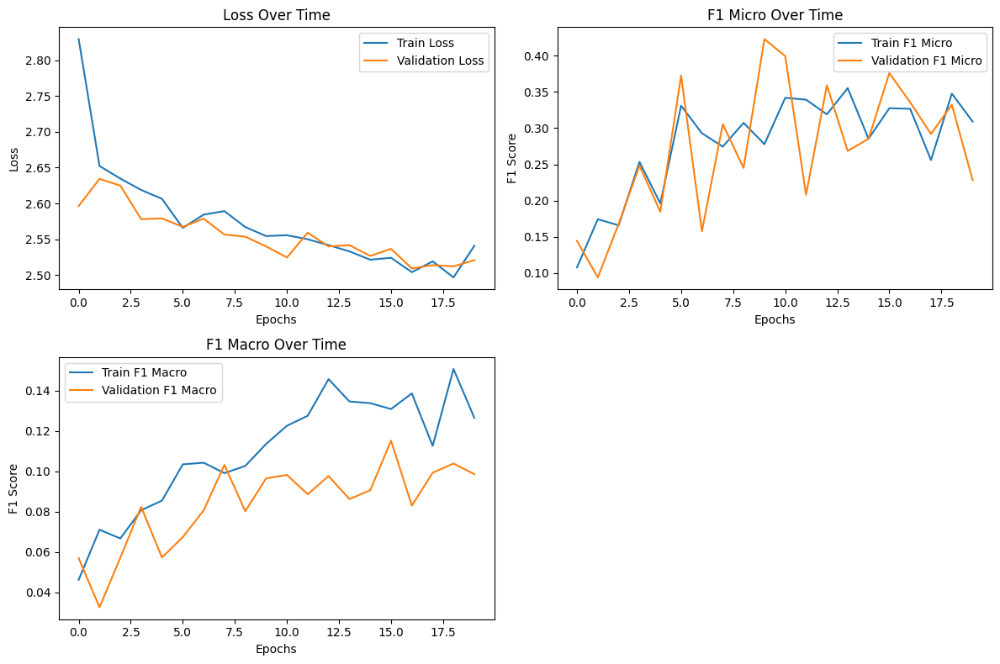

In [ ]:
#lr=0.00001, 20 эпох, без заморозки слоев
from sklearn.metrics import f1_score
import numpy as np

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):

    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lenghts_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels, lenghts_tensor = inputs.to(device), labels.to(device), lenghts_tensor.to(device)

                batch_size, seq_len, C, H, W = inputs.size()
                #inputs = inputs.view(-1, C, H, W)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lenghts_tensor)
                    #outputs = outputs.view(batch_size, seq_len, -1)[:, -1, :]
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                del inputs, labels

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModel(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.00001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

#RNN

##RNN - Попробовать уменьшение lr - скачки loss - великоват lr. Если спускается слишком тихо, значит маловат (сделать заморозку)

##Перезапустить с усреднением (поправленным) - с другими параметрами если будет время (сделать заморозку)

##Заменить Резнет на МобилайнНет (1,2 слой) - в обеих (сделать заморозку)

## Получается 4 модели





In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from sklearn.metrics import f1_score
from tqdm import tqdm
import matplotlib.pyplot as plt

from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence


class CustomModelWithRNN(nn.Module):
    def __init__(self, num_classes, num_lstm_layers=1):
        super(CustomModelWithRNN, self).__init__()
        resnet34 = models.resnet34(pretrained=True)
        self.num_lstm_layers = num_lstm_layers
        self.features = nn.Sequential(*list(resnet34.children())[:4])  # Используем первые слои до maxpooling
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Определение размера входа для полносвязного слоя динамически
        with torch.no_grad():
            example_input = torch.zeros(1, 3, 64, 64)
            example_output = self.maxpool(self.features(example_input))
            rnn_input_size = example_output.numel()  # Получаем общее количество элементов в тензоре

        self.rnn = nn.LSTM(
            input_size=rnn_input_size,
            hidden_size=rnn_input_size,
            num_layers=self.num_lstm_layers)
        self.fc = nn.Linear(rnn_input_size, num_classes)

    def forward(self, x, lengths_tensor=None):
        # x размером [batch_size, sequence_length, channels, height, width]
        batch_size, sequence_length, C, H, W = x.size()

        x = x.view(batch_size * sequence_length, 3, H, W)  # Преобразование в [batch_size*sequence_length, 3, H, W]
        x = self.features(x)
        # Предполагаем, что после layer1 размерность выхода - [batch_size*sequence_length, F, H', W']
        x = self.maxpool(x)
        # ? conv 3x3 channels=16 (если не будет получаться так, как есть)
        # ? если не будет получаться, каждый 5 кадр
        _, F, H_prime, W_prime = x.size()
        x = torch.flatten(x, start_dim=1)
        x = x.view(batch_size, sequence_length, -1)

        # rnn proc

        pad_x = pack_padded_sequence(x, lengths=lengths_tensor, batch_first=True, enforce_sorted=False) # так как не хотим гнать RNN через нули, градиент может затухнуть
        outputs, (hidden_states, _) = self.rnn(pad_x)

        hidden_states = hidden_states[-1]

        probs = self.fc(hidden_states)

        return probs

In [ ]:
model = CustomModelWithRNN(14)


In [ ]:
torch.arange(5) * 4

tensor([ 0,  4,  8, 12, 16])

In [ ]:
import numpy as np
batch = np.random.randn(4, 20, 3, 64, 64)
lengths_tensor = torch.tensor(torch.arange(4) * 4 + 1)

<ipython-input-98-2e302525f2c5>:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  lengths_tensor = torch.tensor(torch.arange(4) * 4 + 1)


In [ ]:
model(torch.tensor(batch, dtype=torch.float32), lengths_tensor)

tensor([[ 0.0453, -0.0386, -0.0934, -0.0234,  0.1223,  0.0737,  0.0777,  0.0625,
         -0.0146, -0.0499, -0.0038,  0.0770, -0.0330, -0.0360],
        [ 0.0812, -0.0450, -0.1374, -0.0426,  0.1973,  0.1190,  0.1221,  0.0885,
          0.0289, -0.1287, -0.0230,  0.1565,  0.0045, -0.0786],
        [ 0.0710, -0.0836, -0.1317, -0.0601,  0.2327,  0.1449,  0.1332,  0.1158,
          0.0173, -0.1468, -0.0260,  0.1162,  0.0225, -0.1107],
        [ 0.0888, -0.0831, -0.1333, -0.0346,  0.2287,  0.1395,  0.1332,  0.1164,
          0.0360, -0.1654, -0.0220,  0.1129,  0.0584, -0.0955]],
       grad_fn=<AddmmBackward0>)

Epoch 1/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.7365 F1 Micro: 0.0926 F1 Macro: 0.0557


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.5988 F1 Micro: 0.4463 F1 Macro: 0.0876
Epoch 2/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.6001 F1 Micro: 0.2466 F1 Macro: 0.0967


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.5904 F1 Micro: 0.2550 F1 Macro: 0.0815
Epoch 3/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.5259 F1 Micro: 0.2736 F1 Macro: 0.1163


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.6892 F1 Micro: 0.2450 F1 Macro: 0.0753
Epoch 4/20
----------


train: 100%|██████████| 149/149 [02:29<00:00,  1.01s/it]


train Loss: 2.5227 F1 Micro: 0.2904 F1 Macro: 0.1213


val: 100%|██████████| 38/38 [00:31<00:00,  1.23it/s]


val Loss: 2.5811 F1 Micro: 0.4262 F1 Macro: 0.0853
Epoch 5/20
----------


train: 100%|██████████| 149/149 [02:31<00:00,  1.02s/it]


train Loss: 2.4904 F1 Micro: 0.2988 F1 Macro: 0.1252


val: 100%|██████████| 38/38 [00:31<00:00,  1.21it/s]


val Loss: 2.5542 F1 Micro: 0.2148 F1 Macro: 0.0758
Epoch 6/20
----------


train: 100%|██████████| 149/149 [02:33<00:00,  1.03s/it]


train Loss: 2.4650 F1 Micro: 0.3047 F1 Macro: 0.1385


val: 100%|██████████| 38/38 [00:32<00:00,  1.17it/s]


val Loss: 2.5373 F1 Micro: 0.2114 F1 Macro: 0.0912
Epoch 7/20
----------


train: 100%|██████████| 149/149 [02:31<00:00,  1.01s/it]


train Loss: 2.3811 F1 Micro: 0.3123 F1 Macro: 0.1571


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.6470 F1 Micro: 0.2987 F1 Macro: 0.0732
Epoch 8/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.3752 F1 Micro: 0.3670 F1 Macro: 0.1818


val: 100%|██████████| 38/38 [00:31<00:00,  1.22it/s]


val Loss: 2.5824 F1 Micro: 0.2752 F1 Macro: 0.0882
Epoch 9/20
----------


train: 100%|██████████| 149/149 [02:25<00:00,  1.02it/s]


train Loss: 2.2998 F1 Micro: 0.3316 F1 Macro: 0.1652


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.5448 F1 Micro: 0.2248 F1 Macro: 0.0813
Epoch 10/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.2854 F1 Micro: 0.3359 F1 Macro: 0.1919


val: 100%|██████████| 38/38 [00:31<00:00,  1.22it/s]


val Loss: 2.6510 F1 Micro: 0.0839 F1 Macro: 0.0421
Epoch 11/20
----------


train: 100%|██████████| 149/149 [02:25<00:00,  1.02it/s]


train Loss: 2.2639 F1 Micro: 0.3316 F1 Macro: 0.1870


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.5941 F1 Micro: 0.2584 F1 Macro: 0.0999
Epoch 12/20
----------


train: 100%|██████████| 149/149 [02:23<00:00,  1.04it/s]


train Loss: 2.2340 F1 Micro: 0.3872 F1 Macro: 0.2155


val: 100%|██████████| 38/38 [00:31<00:00,  1.22it/s]


val Loss: 2.5771 F1 Micro: 0.1477 F1 Macro: 0.0898
Epoch 13/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.1772 F1 Micro: 0.3123 F1 Macro: 0.2132


val: 100%|██████████| 38/38 [00:31<00:00,  1.20it/s]


val Loss: 2.5701 F1 Micro: 0.3591 F1 Macro: 0.1177
Epoch 14/20
----------


train: 100%|██████████| 149/149 [02:25<00:00,  1.03it/s]


train Loss: 2.1986 F1 Micro: 0.3451 F1 Macro: 0.2307


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.5933 F1 Micro: 0.3322 F1 Macro: 0.1121
Epoch 15/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.1736 F1 Micro: 0.3434 F1 Macro: 0.2208


val: 100%|██████████| 38/38 [00:31<00:00,  1.22it/s]


val Loss: 2.4942 F1 Micro: 0.3389 F1 Macro: 0.1283
Epoch 16/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.1002 F1 Micro: 0.3746 F1 Macro: 0.2454


val: 100%|██████████| 38/38 [00:31<00:00,  1.21it/s]


val Loss: 2.5784 F1 Micro: 0.2517 F1 Macro: 0.1093
Epoch 17/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.0951 F1 Micro: 0.3712 F1 Macro: 0.2603


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.5718 F1 Micro: 0.3826 F1 Macro: 0.1407
Epoch 18/20
----------


train: 100%|██████████| 149/149 [02:25<00:00,  1.02it/s]


train Loss: 1.9995 F1 Micro: 0.3889 F1 Macro: 0.2805


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.6459 F1 Micro: 0.2617 F1 Macro: 0.0956
Epoch 19/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.0245 F1 Micro: 0.3611 F1 Macro: 0.2737


val: 100%|██████████| 38/38 [00:31<00:00,  1.22it/s]


val Loss: 2.7058 F1 Micro: 0.2483 F1 Macro: 0.1173
Epoch 20/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 1.9860 F1 Micro: 0.3880 F1 Macro: 0.2844


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.5811 F1 Micro: 0.2550 F1 Macro: 0.1048


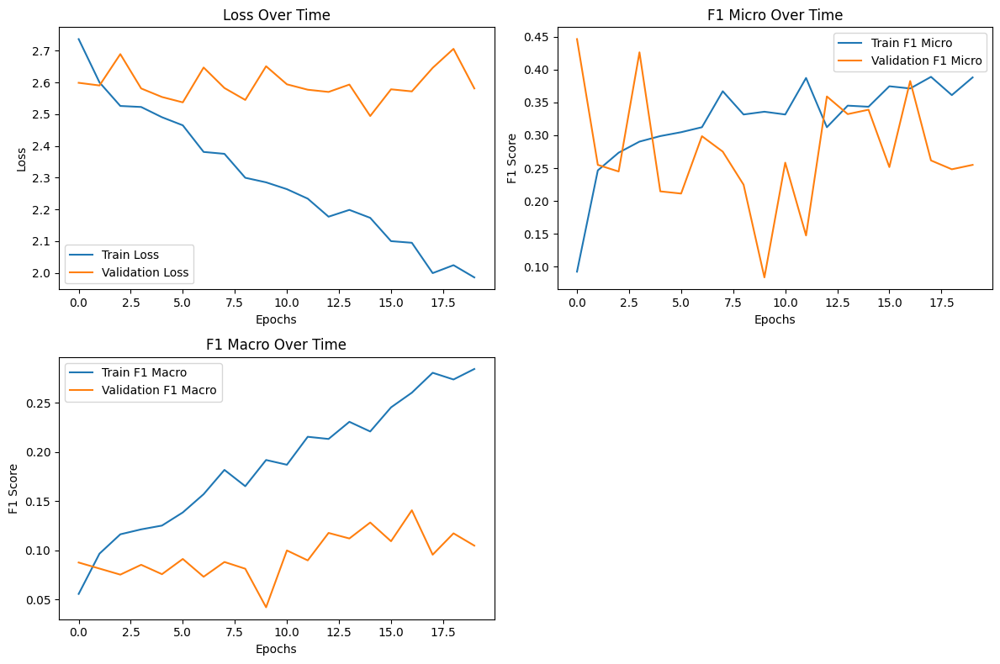

In [ ]:
#lr=0.0001, 20 эпох, батч 8
from sklearn.metrics import f1_score
import numpy as np

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                batch_size, seq_len, C, H, W = inputs.size()
                #inputs = inputs.view(-1, C, H, W)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor) # чтобы плотно скомпоновать последовательность
                    #outputs = outputs.view(batch_size, seq_len, -1)[:, -1, :]
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithRNN(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20
----------


train: 100%|██████████| 149/149 [02:25<00:00,  1.02it/s]


train Loss: 2.7292 F1 Micro: 0.1768 F1 Macro: 0.0585


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.6129 F1 Micro: 0.4463 F1 Macro: 0.0630
Epoch 2/20
----------


train: 100%|██████████| 149/149 [02:25<00:00,  1.03it/s]


train Loss: 2.5936 F1 Micro: 0.2407 F1 Macro: 0.0979


val: 100%|██████████| 38/38 [00:31<00:00,  1.22it/s]


val Loss: 2.6181 F1 Micro: 0.1846 F1 Macro: 0.0455
Epoch 3/20
----------


train: 100%|██████████| 149/149 [02:23<00:00,  1.04it/s]


train Loss: 2.5578 F1 Micro: 0.2593 F1 Macro: 0.1129


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.5507 F1 Micro: 0.2081 F1 Macro: 0.0711
Epoch 4/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.4870 F1 Micro: 0.3030 F1 Macro: 0.1253


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.5659 F1 Micro: 0.2752 F1 Macro: 0.0611
Epoch 5/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.4503 F1 Micro: 0.3207 F1 Macro: 0.1303


val: 100%|██████████| 38/38 [00:30<00:00,  1.25it/s]


val Loss: 2.5023 F1 Micro: 0.4128 F1 Macro: 0.1087
Epoch 6/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.4142 F1 Micro: 0.3443 F1 Macro: 0.1416


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.5258 F1 Micro: 0.4295 F1 Macro: 0.1222
Epoch 7/20
----------


train: 100%|██████████| 149/149 [02:25<00:00,  1.02it/s]


train Loss: 2.3641 F1 Micro: 0.3847 F1 Macro: 0.1667


val: 100%|██████████| 38/38 [00:31<00:00,  1.22it/s]


val Loss: 2.6181 F1 Micro: 0.2416 F1 Macro: 0.0954
Epoch 8/20
----------


train: 100%|██████████| 149/149 [02:25<00:00,  1.03it/s]


train Loss: 2.3335 F1 Micro: 0.3401 F1 Macro: 0.1743


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.5018 F1 Micro: 0.3859 F1 Macro: 0.1062
Epoch 9/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.3247 F1 Micro: 0.3535 F1 Macro: 0.1749


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.4840 F1 Micro: 0.2617 F1 Macro: 0.1040
Epoch 10/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.2955 F1 Micro: 0.3485 F1 Macro: 0.1832


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.4637 F1 Micro: 0.3255 F1 Macro: 0.1185
Epoch 11/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.2370 F1 Micro: 0.3746 F1 Macro: 0.2171


val: 100%|██████████| 38/38 [00:31<00:00,  1.21it/s]


val Loss: 2.5003 F1 Micro: 0.2718 F1 Macro: 0.1239
Epoch 12/20
----------


train: 100%|██████████| 149/149 [02:26<00:00,  1.02it/s]


train Loss: 2.2002 F1 Micro: 0.3359 F1 Macro: 0.2158


val: 100%|██████████| 38/38 [00:31<00:00,  1.22it/s]


val Loss: 2.4315 F1 Micro: 0.3926 F1 Macro: 0.1427
Epoch 13/20
----------


train: 100%|██████████| 149/149 [02:23<00:00,  1.04it/s]


train Loss: 2.1967 F1 Micro: 0.3544 F1 Macro: 0.2134


val: 100%|██████████| 38/38 [00:30<00:00,  1.23it/s]


val Loss: 2.5170 F1 Micro: 0.2819 F1 Macro: 0.1091
Epoch 14/20
----------


train: 100%|██████████| 149/149 [02:22<00:00,  1.04it/s]


train Loss: 2.1539 F1 Micro: 0.3737 F1 Macro: 0.2391


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.5532 F1 Micro: 0.2148 F1 Macro: 0.0881
Epoch 15/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.1517 F1 Micro: 0.3687 F1 Macro: 0.2521


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.5415 F1 Micro: 0.2651 F1 Macro: 0.1030
Epoch 16/20
----------


train: 100%|██████████| 149/149 [02:24<00:00,  1.03it/s]


train Loss: 2.0868 F1 Micro: 0.3880 F1 Macro: 0.2538


val: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]


val Loss: 2.4990 F1 Micro: 0.2617 F1 Macro: 0.0971
Epoch 17/20
----------


train: 100%|██████████| 149/149 [02:23<00:00,  1.04it/s]


train Loss: 2.0767 F1 Micro: 0.3544 F1 Macro: 0.2269


val: 100%|██████████| 38/38 [00:30<00:00,  1.25it/s]


val Loss: 2.5056 F1 Micro: 0.3154 F1 Macro: 0.1013
Epoch 18/20
----------


train: 100%|██████████| 149/149 [02:21<00:00,  1.05it/s]


train Loss: 2.0509 F1 Micro: 0.3687 F1 Macro: 0.2685


val: 100%|██████████| 38/38 [00:30<00:00,  1.25it/s]


val Loss: 2.5170 F1 Micro: 0.2785 F1 Macro: 0.1296
Epoch 19/20
----------


train: 100%|██████████| 149/149 [02:23<00:00,  1.04it/s]


train Loss: 2.0071 F1 Micro: 0.3687 F1 Macro: 0.2456


val: 100%|██████████| 38/38 [00:30<00:00,  1.25it/s]


val Loss: 2.6463 F1 Micro: 0.1107 F1 Macro: 0.0864
Epoch 20/20
----------


train: 100%|██████████| 149/149 [02:22<00:00,  1.04it/s]


train Loss: 1.9445 F1 Micro: 0.3931 F1 Macro: 0.2955


val: 100%|██████████| 38/38 [00:30<00:00,  1.25it/s]


val Loss: 2.5320 F1 Micro: 0.3490 F1 Macro: 0.1179


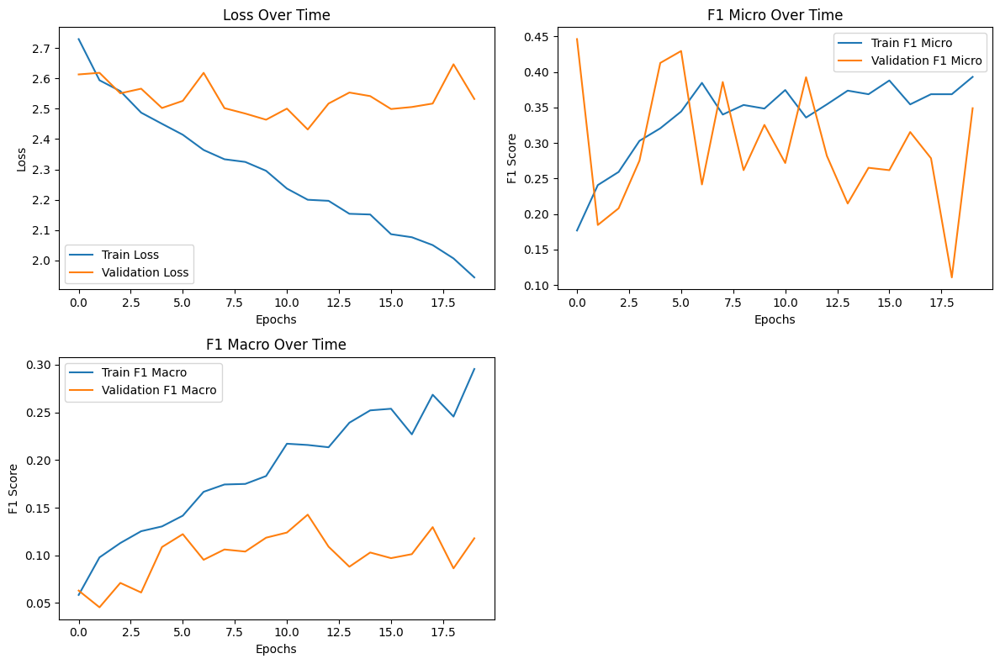

In [ ]:
#уменьшение lr=0.00001, 20 эпох, батч 8
from sklearn.metrics import f1_score
import numpy as np

def train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda'):
    model.to(device)
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_f1_micro': [],
        'val_f1_micro': [],
        'train_f1_macro': [],
        'val_f1_macro': [],
    }

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            all_preds = []
            all_labels = []

            for inputs, labels, lengths_tensor in tqdm(dataloaders[phase], desc=f"{phase}"):
                inputs, labels = inputs.to(device), labels.to(device)

                batch_size, seq_len, C, H, W = inputs.size()
                #inputs = inputs.view(-1, C, H, W)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs, lengths_tensor) # чтобы плотно скомпоновать последовательность
                    #outputs = outputs.view(batch_size, seq_len, -1)[:, -1, :]
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                preds = outputs.argmax(dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_f1_micro = f1_score(all_labels, all_preds, average='micro')
            epoch_f1_macro = f1_score(all_labels, all_preds, average='macro')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_f1_micro'].append(epoch_f1_micro)
            history[f'{phase}_f1_macro'].append(epoch_f1_macro)

            print(f'{phase} Loss: {epoch_loss:.4f} F1 Micro: {epoch_f1_micro:.4f} F1 Macro: {epoch_f1_macro:.4f}')

    return history

# Создание экземпляра модели и определение параметров обучения
num_classes = len(CLASS_TO_IDX)
model = CustomModelWithRNN(num_classes=num_classes)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)

# Создание dataloaders (предполагается, что train_dataloader и val_dataloader уже определены)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Запуск обучения и построение графиков
history = train_model(model, dataloaders, criterion, optimizer, num_epochs=20, device='cuda')

# Визуализация истории обучения
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Time')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history['train_f1_micro'], label='Train F1 Micro')
plt.plot(history['val_f1_micro'], label='Validation F1 Micro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Micro Over Time')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history['train_f1_macro'], label='Train F1 Macro')
plt.plot(history['val_f1_macro'], label='Validation F1 Macro')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('F1 Macro Over Time')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
resnet18

In [ ]:
del resnet18.layer2
del resnet18.layer3
del resnet18.layer4
del resnet18.avgpool
del resnet18.fc

In [ ]:
resnet18

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
resnet18.__dict__['layer1']

KeyError: 'layer1'

In [ ]:
resnet18

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
resnet18

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
class ResNetWithRNN(nn.Module):
  def __init__(self, embedder):
    self.embedder = embedder
    self.rnn = nn.GRU(...)
    self.fc = nn.Linear(...)

  def forward(self, x):
    embs_of_pictures = self.embedder(x)
    pack_of_sequence(...)



class ResNetWithAveragePolling(nn.Module):
  def __init__(self, embedder):
    self.embedder = embedder
    self.avgpool = nn.GlobalAveragePooling2D()
    self.fc = nn.Linear(...)

  def forward(self, x):
    embs_of_pictures = self.embedder(x)
    probs = self.fc(self.avgpool(embs_of_pictures))

    return probs

In [ ]:
optimizer = #...
scheduler = #...

In [ ]:
def train_one_epoch():
  pass

def validation():
  pass

def train():
  ## call train_one_epoch and validation
  pass

## Введение

Мы будем работать с набором данных UCF-Crime, крупномасштабным набором видеозаписей наблюдения, содержащим 128 часов реальных видеозаписей наблюдения. Набор данных состоит из 1900 длинных и необрезанных видеороликов, которые зафиксировали различные аномальные активности, включая Злоупотребление, Арест, Поджог, Нападение, Дорожное происшествие, Кражу, Взрыв, Драку, Грабеж, Стрельбу, Магазинное воровство и Вандализм. Эти аномалии были выбраны из-за их значительного воздействия на общественную безопасность. Этот набор данных может использоваться для двух основных задач:

* Задача 1: Общее обнаружение аномалий
В рамках этой задачи мы будем рассматривать все аномалии в одной группе и все нормальные активности в другой группе. Целью является разработка моделей, способных обнаруживать любую аномалию на видеозаписях наблюдения.

* Задача 2: Распознавание аномалий
Для этой задачи мы стремимся распознавать каждую из конкретных аномальных активностей индивидуально. Мы будем обучать модели идентифицировать и классифицировать каждый тип аномалии.

В качестве метрики качестве решения задачи мы будем использовать плошадь под ROC кривой для каждого класса аномалиий.

In [ ]:
import os
import glob

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')
import seaborn as sns
import plotly.express as px
import cv2
from tqdm import tqdm
from vit_keras import vit, utils
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score
from classification_models.keras import Classifiers

from IPython.display import clear_output
import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


## Константы Эксперимента

Загрузим сам датасет UCF

In [ ]:
# Step 1: Install Kaggle API
!pip install kaggle

# Steps 2 & 3: Upload the kaggle.json file using the Colab file upload feature

# Step 4: Setup Kaggle API credentials
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content'
!chmod 600 /content/kaggle.json

# Step 5: Download and Unzip Dataset
!kaggle datasets download -d odins0n/ucf-crime-dataset --unzip -p /content

# Step 6: Set your variables
TRAIN_DIR = "/content/Train"
TEST_DIR = "/content/Test"
SEED = 42
NUM_CLASSES = 14
CLASS_LABELS = ['Abuse', 'Arrest', 'Arson', 'Assault',
                'Burglary', 'Explosion', 'Fighting',
                "Normal", 'RoadAccidents', 'Robbery',
                'Shooting', 'Shoplifting', 'Stealing',
                'Vandalism']

np.random.seed(SEED)



100% 11.0G/11.0G [05:31<00:00, 42.2MB/s]
100% 11.0G/11.0G [05:31<00:00, 35.7MB/s]


In [ ]:
import os
train_folder = 'Train'
class_name2cnt = {}
for class_name in os.listdir(train_folder):
  folder_path = os.path.join(train_folder, class_name)
  len_of_class_name = len(class_name)
  filenames = [filename.split('_')[0][len_of_class_name:] for filename in os.listdir(folder_path)]
  count_of_class_name_objs = np.unique(filenames).shape[0]

  class_name2cnt[class_name] = count_of_class_name_objs
class_name2cnt

{'Arrest': 45,
 'Vandalism': 45,
 'Assault': 47,
 'NormalVideos': 1,
 'Shoplifting': 29,
 'Robbery': 145,
 'RoadAccidents': 127,
 'Abuse': 48,
 'Explosion': 29,
 'Shooting': 27,
 'Arson': 41,
 'Stealing': 95,
 'Fighting': 45,
 'Burglary': 87}

In [ ]:
## NormalVideos - correct names
## Lengths of videos

In [ ]:
class_name = 'NormalVideos'

folder_path = os.path.join(train_folder, class_name)
len_of_class_name = len(class_name)
filenames = [filename.split('_')[1][6:] for filename in os.listdir(folder_path)]
count_of_class_name_objs = np.unique(filenames).shape[0]

In [ ]:
count_of_class_name_objs

800

## Загрузка данных и предварительная обработка

В этом разделе мы рассмотрим этапы загрузки данных и предварительной обработки. Это включает в себя чтение видеоданных, извлечение кадров и подготовку набора данных для обучения моделей.

In [ ]:
#data_hyperparams = {
    #'img_size': (64,64),
    #'batch_size': 256,
    #'preprocessing_function': tf.keras.applications.densenet.preprocess_input,
#}

In [ ]:
data_hyperparams = {
    'img_size': (64, 64),  # Размер изображений: преобразовать все изображения к 64x64 пикселям
    'batch_size': 256,  # Размер пакета: количество изображений, обрабатываемых за одну итерацию обучения
    'preprocessing_function': tf.keras.applications.densenet.preprocess_input,  # Функция предобработки: адаптирует входные данные под ожидания модели DenseNet
    'horizontal_flip': True,  # Горизонтальное отражение: случайно отражает изображения по горизонтали для аугментации данных
    'width_shift_range': 0.1,  # Сдвиг по ширине: случайно сдвигает изображения на 10% их ширины
    'height_shift_range': 0.05  # Сдвиг по высоте: случайно сдвигает изображения на 5% их высоты
}

In [ ]:
train_datagen = ImageDataGenerator(
    horizontal_flip=data_hyperparams['horizontal_flip'],
    width_shift_range=data_hyperparams['width_shift_range'],
    height_shift_range=data_hyperparams['height_shift_range'],
    rescale = 1./255,
    preprocessing_function=data_hyperparams['preprocessing_function']
)

test_datagen = ImageDataGenerator(
    rescale = 1./255,
    preprocessing_function=data_hyperparams['preprocessing_function']
)

In [ ]:
train_generator = train_datagen.flow_from_directory(
    directory = TRAIN_DIR,
    target_size = data_hyperparams['img_size'],
    batch_size = data_hyperparams['batch_size'],
    shuffle  = True ,
    color_mode = "rgb",
    class_mode = "categorical",
    seed = SEED
)
test_generator = test_datagen.flow_from_directory(
    directory = TEST_DIR,
    target_size = data_hyperparams['img_size'],
    batch_size = data_hyperparams['batch_size'],
    shuffle  = False ,
    color_mode = "rgb",
    class_mode = "categorical",
    seed = SEED
)

Found 1266345 images belonging to 14 classes.
Found 111308 images belonging to 14 classes.


## EDA (Исследовательский анализ данных)

Исследовательский анализ данных (EDA) является важным этапом для понимания набора данных и его характеристик. В этом разделе мы будем проводить EDA, чтобы получить представление о наборе данных UCF-Crime. Мы исследуем статистику, распределения и наличие каких-либо паттернов в данных.

###Распределение примеров по категориям

Важно рассмотреть распределение выборок по аномальным активностям и нормальным активностям. Мы визуализируем распределение классов, чтобы понять потенциальные дисбалансы классов.

In [ ]:
fig = px.bar(x = CLASS_LABELS,
             y = [list(train_generator.classes).count(i)
                  for i in np.unique(train_generator.classes)] ,
             color = np.unique(train_generator.classes) ,
             color_continuous_scale="Viridis")
fig.update_xaxes(title="Classes")
fig.update_yaxes(title = "Number of Images")
fig.update_layout(showlegend = True,
    title = {
        'text': 'Train Data Distribution ',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

In [ ]:
fig = px.bar(x = CLASS_LABELS,
             y = [list(test_generator.classes).count(i)
                  for i in np.unique(test_generator.classes)] ,
             color = np.unique(train_generator.classes) ,
             color_continuous_scale="Sunset")
fig.update_xaxes(title="Classes")
fig.update_yaxes(title = "Number of Images")
fig.update_layout(showlegend = True,
    title = {
        'text': 'Test Data Distribution ',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

### Распределение примеров нормального класса и остальных классов

In [ ]:
n_total_train = train_generator.classes.shape[0]
n_normal_train = list(train_generator.classes).count(CLASS_LABELS.index('Normal'))

fig = px.bar(x = ['Normal', 'Not Normal'],
             y = [n_normal_train, n_total_train-n_normal_train],
             color = ['Normal', 'Not Normal'],
             color_continuous_scale="Viridis")
fig.update_xaxes(title="Classes")
fig.update_yaxes(title = "Number of Images")
fig.update_layout(showlegend = False,
    title = {
        'text': 'Train Data Distribution ',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

In [ ]:
n_total_test = test_generator.classes.shape[0]
n_normal_test = list(test_generator.classes).count(CLASS_LABELS.index('Normal'))

fig = px.bar(x = ['Normal', 'Not Normal'],
             y = [n_normal_test, n_total_test-n_normal_test],
             color = ['Normal', 'Not Normal'],
             color_continuous_scale="Viridis")
fig.update_xaxes(title="Classes")
fig.update_yaxes(title = "Number of Images")
fig.update_layout(showlegend = False,
    title = {
        'text': 'Test Data Distribution ',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

### Визуализация индивидуального видео

Чтобы лучше понять содержание набора данных, мы выберем и визуализируем кадры из индивидуального видеоролика. Это поможет нам понять сложности и вариации в наборе данных.

In [ ]:
def load_png_line(path):
    t_paths = sorted(
        glob.glob(os.path.join(path,"*")),
        key=lambda x: x,
    )
    images = []
    for i,filename in enumerate(np.array(t_paths)):
        if i%2==0:
            data = cv2.imread(filename)
            if data.max() == 0:
                continue
            images.append(data)
    return images


def create_animation(ims):
    fig=plt.figure(figsize=(6,6))
    plt.axis('off')
    im=plt.imshow(cv2.cvtColor(ims[0],cv2.COLOR_BGR2RGB))

    def animate_func(i):
        im.set_array(cv2.cvtColor(ims[i],cv2.COLOR_BGR2RGB))
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000//10)

Arson007_x264_0.png	Arson009_x264_80.png	Arson018_x264_760.png	Arson022_x264_7180.png
Arson007_x264_1000.png	Arson009_x264_90.png	Arson018_x264_770.png	Arson022_x264_7190.png
Arson007_x264_100.png	Arson010_x264_0.png	Arson018_x264_780.png	Arson022_x264_7200.png
Arson007_x264_1010.png	Arson010_x264_1000.png	Arson018_x264_790.png	Arson022_x264_720.png
Arson007_x264_1020.png	Arson010_x264_100.png	Arson018_x264_800.png	Arson022_x264_7210.png
Arson007_x264_1030.png	Arson010_x264_1010.png	Arson018_x264_80.png	Arson022_x264_7220.png
Arson007_x264_1040.png	Arson010_x264_1020.png	Arson018_x264_810.png	Arson022_x264_7230.png
Arson007_x264_1050.png	Arson010_x264_1030.png	Arson018_x264_820.png	Arson022_x264_7240.png
Arson007_x264_1060.png	Arson010_x264_1040.png	Arson018_x264_830.png	Arson022_x264_7250.png
Arson007_x264_1070.png	Arson010_x264_1050.png	Arson018_x264_840.png	Arson022_x264_7260.png
Arson007_x264_1080.png	Arson010_x264_1060.png	Arson018_x264_90.png	Arson022_x264_7270.png
Arson007_x264_

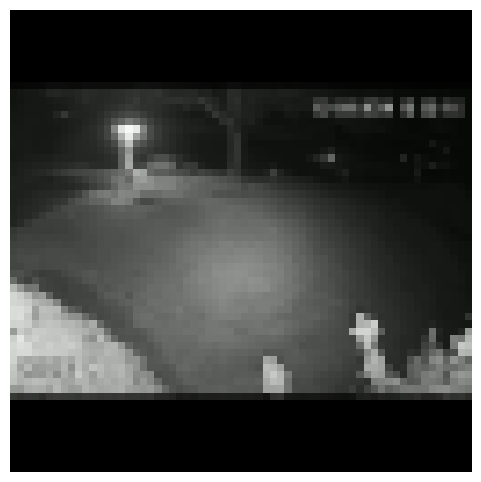

In [ ]:
category = 'Arson'  # category of crime to visualize

# Update the path according to the location in Colab
# Assuming your dataset has a structure similar to what you had in Kaggle
images_path = f"/content/Test/{category}"

# Make sure the directory exists and contains files
!ls "{images_path}"

# Assuming load_png_line function and create_animation function are defined correctly
images = load_png_line(images_path)

# Only call create_animation if images were successfully loaded
if images:
    create_animation(images)
else:
    print("No images found in the specified directory.")

Robbery048_x264_0.png	  Robbery050_x264_700.png   Robbery106_x264_480.png
Robbery048_x264_1000.png  Robbery050_x264_70.png    Robbery106_x264_490.png
Robbery048_x264_100.png   Robbery050_x264_710.png   Robbery106_x264_500.png
Robbery048_x264_1010.png  Robbery050_x264_720.png   Robbery106_x264_50.png
Robbery048_x264_1020.png  Robbery050_x264_730.png   Robbery106_x264_510.png
Robbery048_x264_1030.png  Robbery050_x264_740.png   Robbery106_x264_520.png
Robbery048_x264_1040.png  Robbery050_x264_750.png   Robbery106_x264_530.png
Robbery048_x264_1050.png  Robbery050_x264_760.png   Robbery106_x264_540.png
Robbery048_x264_1060.png  Robbery050_x264_770.png   Robbery106_x264_550.png
Robbery048_x264_1070.png  Robbery050_x264_780.png   Robbery106_x264_560.png
Robbery048_x264_1080.png  Robbery050_x264_790.png   Robbery106_x264_570.png
Robbery048_x264_1090.png  Robbery050_x264_800.png   Robbery106_x264_580.png
Robbery048_x264_10.png	  Robbery050_x264_80.png    Robbery106_x264_590.png
Robbery048_x264_

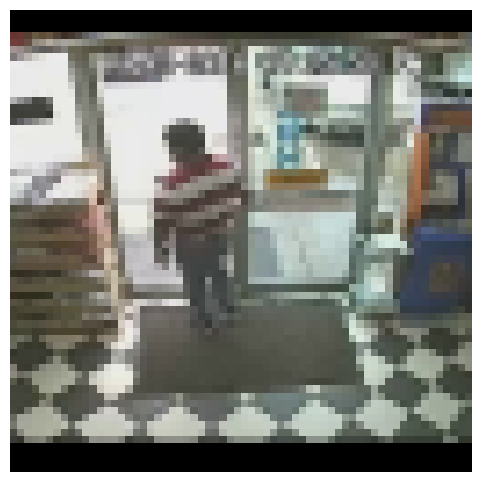

In [ ]:
category = 'Robbery'  # category of crime to visualize

# Update the path according to the location in Colab
# Assuming your dataset has a structure similar to what you had in Kaggle
images_path = f"/content/Test/{category}"

# Make sure the directory exists and contains files
!ls "{images_path}"

# Assuming load_png_line function and create_animation function are defined correctly
images = load_png_line(images_path)

# Only call create_animation if images were successfully loaded
if images:
    create_animation(images)
else:
    print("No images found in the specified directory.")

### Проблема дисбаланса классов

Датасет, который нам представлен, имеет дисбаланс классов -- примеров с  меткой "Normal" сильно больше, чем остальных классов вместе взятых. Данное свойство может ухудшить качество обучения нейронной сети.

Для решения данной проблемы мы применим подход down-sampling и уберем 50% данных из класса Normal. Кроме этого, чтобы улучшить процесс обучения всей сети, мы добавим черно-белые изображения и аугментацию. Аугментация - это процесс улучшения или расширения данных изображения путем применения различных техник. Эти методы могут включать в себя изменение размеров, поворот, изменение контрастности и другие преобразования. Аугментация данных часто используется в машинном обучении, чтобы улучшить производительность модели на новых данных путем предоставления ей разнообразных вариантов входных изображений. Помимо аугментации мы физически сократим класс "Normal" на 50%, добавим черно-белых изображений и перемещаем их с остальными во всех классах.


In [ ]:
# Случайный перевод изображения в черно-белую цветовую схему
def random_grayscale(x):
    if np.random.randint(0, 2) == 1:
        return tf.image.rgb_to_grayscale(x)
    return x

train_datagen = ImageDataGenerator(
    rescale=1./255,  # Масштабирование значений пикселей в диапазон [0, 1]
    rotation_range=7,  # Угол поворота в градусах
    width_shift_range=0.02,  # Сдвиг по ширине
    height_shift_range=0.02,  # Сдвиг по высоте
    shear_range=0.02,  # Изгиб
    zoom_range=0.02,  # Масштабирование
    horizontal_flip=True,  # Горизонтальное отражение
    fill_mode='nearest',  # Заполнение пикселей после аугментации
    preprocessing_function=random_grayscale
)

test_datagen = ImageDataGenerator(
    rescale = 1./255
)

In [ ]:
import os
import numpy as np
from tqdm import tqdm
import pandas as pd

# Используемые переменные
TRAIN_DIR = "/content/Train"
TEST_DIR = "/content/Test"
SEED = 42
NUM_CLASSES = 14
CLASS_LABELS = ['Abuse', 'Arrest', 'Arson', 'Assault', 'Burglary', 'Explosion', 'Fighting', "Normal", 'RoadAccidents', 'Robbery', 'Shooting', 'Shoplifting', 'Stealing', 'Vandalism']

np.random.seed(SEED)

filenames = []
labels = []

for root, subdirs, files in tqdm(os.walk(TRAIN_DIR)):
    for subdir in subdirs:
        subdir_path = os.path.join(TRAIN_DIR, subdir)  # Исправлено формирование пути
        for file in os.listdir(subdir_path):
            if file.lower().endswith('.png'):
                file_path = os.path.join(subdir_path, file)  # Корректное формирование пути к файлу
                # Берём только половину кадров из класса Normal
                if subdir == 'NormalVideos':
                    if np.random.randint(0, 2) == 1:
                        filenames.append(file_path)
                        labels.append(subdir)
                else:
                    filenames.append(file_path)
                    labels.append(subdir)

df_train = pd.DataFrame({
    'filename': filenames,
    'class': labels
})

print(df_train.head())
df_train.head()


15it [00:06,  2.41it/s]


                                         filename   class
0   /content/Train/Arrest/Arrest008_x264_3390.png  Arrest
1  /content/Train/Arrest/Arrest047_x264_43060.png  Arrest
2  /content/Train/Arrest/Arrest047_x264_16560.png  Arrest
3    /content/Train/Arrest/Arrest046_x264_430.png  Arrest
4   /content/Train/Arrest/Arrest046_x264_4620.png  Arrest


,filename,class
0,/content/Train/Arrest/Arrest008_x264_3390.png,Arrest
1,/content/Train/Arrest/Arrest047_x264_43060.png,Arrest
2,/content/Train/Arrest/Arrest047_x264_16560.png,Arrest
3,/content/Train/Arrest/Arrest046_x264_430.png,Arrest
4,/content/Train/Arrest/Arrest046_x264_4620.png,Arrest


In [ ]:
# Создадим список путей к файлам для создания тестового датасета
filenames = []
labels = []

for root, subdirs, files in tqdm(os.walk(TEST_DIR)):
    for subdir in subdirs:
        subdir_path = os.path.join(TEST_DIR, subdir)
        for file in os.listdir(subdir_path):
            if file.lower().endswith('.png'):
                file_path = os.path.join(subdir_path, file)  # Корректное формирование пути к файлу
                # Берём только половину кадров из класса Normal
                if subdir == 'NormalVideos':
                    if np.random.randint(0, 2) == 1:
                        filenames.append(file_path)
                        labels.append(subdir)
                else:
                    filenames.append(file_path)
                    labels.append(subdir)

df_test = pd.DataFrame({
    'filename': filenames,
    'class': labels
})

print(df_test.head())

15it [00:00, 31.79it/s]

                                        filename   class
0  /content/Test/Arrest/Arrest039_x264_10480.png  Arrest
1   /content/Test/Arrest/Arrest024_x264_1620.png  Arrest
2   /content/Test/Arrest/Arrest030_x264_4770.png  Arrest
3   /content/Test/Arrest/Arrest030_x264_5360.png  Arrest
4   /content/Test/Arrest/Arrest039_x264_5180.png  Arrest


In [ ]:
# Подсчёт количества объектов в каждом классе для обучающего набора данных
class_distribution_train = df_train['class'].value_counts()
print("Распределение классов в обучающем наборе данных:\n", class_distribution_train)

# Подсчёт количества объектов в каждом классе для тестового набора данных
class_distribution_test = df_test['class'].value_counts()
print("\nРаспределение классов в тестовом наборе данных:\n", class_distribution_test)


Распределение классов в обучающем наборе данных:
 NormalVideos     473718
Stealing          44802
Robbery           41493
Burglary          39504
Arrest            26397
Shoplifting       24835
Fighting          24684
Arson             24421
RoadAccidents     23486
Abuse             19076
Explosion         18753
Vandalism         13626
Assault           10360
Shooting           7140
Name: class, dtype: int64

Распределение классов в тестовом наборе данных:
 NormalVideos     32431
Burglary          7657
Shooting          7630
Shoplifting       7623
Explosion         6510
Arrest            3365
Arson             2793
RoadAccidents     2663
Assault           2657
Stealing          1984
Fighting          1231
Vandalism         1111
Robbery            835
Abuse              297
Name: class, dtype: int64


In [ ]:
# Подсчёт количества объектов в каждом классе для обучающего набора данных и преобразование в количество видео
class_distribution_train = df_train['class'].value_counts() // 10
print("Оценочное количество видео в каждом классе обучающего набора данных:\n", class_distribution_train)

# Подсчёт количества объектов в каждом классе для тестового набора данных и преобразование в количество видео
class_distribution_test = df_test['class'].value_counts() // 10
print("\nОценочное количество видео в каждом классе тестового набора данных:\n", class_distribution_test)


Оценочное количество видео в каждом классе обучающего набора данных:
 NormalVideos     47371
Stealing          4480
Robbery           4149
Burglary          3950
Arrest            2639
Shoplifting       2483
Fighting          2468
Arson             2442
RoadAccidents     2348
Abuse             1907
Explosion         1875
Vandalism         1362
Assault           1036
Shooting           714
Name: class, dtype: int64

Оценочное количество видео в каждом классе тестового набора данных:
 NormalVideos     3243
Burglary          765
Shooting          763
Shoplifting       762
Explosion         651
Arrest            336
Arson             279
RoadAccidents     266
Assault           265
Stealing          198
Fighting          123
Vandalism         111
Robbery            83
Abuse              29
Name: class, dtype: int64


In [ ]:
import os
import numpy as np
from tqdm import tqdm
import pandas as pd

# Используемые переменные
TRAIN_DIR = "/content/Train"
TEST_DIR = "/content/Test"
SEED = 42
NUM_CLASSES = 14
CLASS_LABELS = ['Abuse', 'Arrest', 'Arson', 'Assault', 'Burglary', 'Explosion', 'Fighting', "Normal", 'RoadAccidents', 'Robbery', 'Shooting', 'Shoplifting', 'Stealing', 'Vandalism']

np.random.seed(SEED)

#Создадим список путей к файлам для создания обучающего датасета
filenames = []
labels = []

for root, subdirs, files in tqdm(os.walk(TRAIN_DIR)):
    for subdir in subdirs:
        subdir_path = os.path.join(TRAIN_DIR, subdir)  # Исправлено формирование пути
        for file in os.listdir(subdir_path):
            if file.lower().endswith('.png'):
                file_path = os.path.join(subdir_path, file)  # Корректное формирование пути к файлу
                # Берём только 10% кадров из класса Normal
                if subdir == 'NormalVideos':
                    if np.random.rand() < 0.05:  # Изменено условие для выборки 5%
                        filenames.append(file_path)
                        labels.append(subdir)
                else:
                    filenames.append(file_path)
                    labels.append(subdir)

df_train = pd.DataFrame({
    'filename': filenames,
    'class': labels
})

print(df_train.head())



15it [00:03,  4.11it/s]

                                         filename   class
0   /content/Train/Arrest/Arrest008_x264_3390.png  Arrest
1  /content/Train/Arrest/Arrest047_x264_43060.png  Arrest
2  /content/Train/Arrest/Arrest047_x264_16560.png  Arrest
3    /content/Train/Arrest/Arrest046_x264_430.png  Arrest
4   /content/Train/Arrest/Arrest046_x264_4620.png  Arrest


In [ ]:
from tqdm import tqdm
import os
import numpy as np
import pandas as pd

# Создадим список путей к файлам для создания тестового датасета
filenames = []
labels = []

for root, subdirs, files in tqdm(os.walk(TEST_DIR)):
    for subdir in subdirs:
        subdir_path = os.path.join(TEST_DIR, subdir)
        for file in os.listdir(subdir_path):
            if file.lower().endswith('.png'):
                file_path = os.path.join(subdir_path, file)  # Корректное формирование пути к файлу
                # Берём только 10% кадров из класса Normal
                if subdir == 'NormalVideos':
                    if np.random.rand() < 0.15:  # Изменено условие для выборки 15%
                        filenames.append(file_path)
                        labels.append(subdir)
                else:
                    filenames.append(file_path)
                    labels.append(subdir)

df_test = pd.DataFrame({
    'filename': filenames,
    'class': labels
})

print(df_test.head())


15it [00:00, 48.79it/s]

                                        filename   class
0  /content/Test/Arrest/Arrest039_x264_10480.png  Arrest
1   /content/Test/Arrest/Arrest024_x264_1620.png  Arrest
2   /content/Test/Arrest/Arrest030_x264_4770.png  Arrest
3   /content/Test/Arrest/Arrest030_x264_5360.png  Arrest
4   /content/Test/Arrest/Arrest039_x264_5180.png  Arrest


In [ ]:
# Подсчёт количества объектов в каждом классе для обучающего набора данных и преобразование в количество видео
class_distribution_train = df_train['class'].value_counts() // 10
print("Оценочное количество видео в каждом классе обучающего набора данных:\n", class_distribution_train)

# Подсчёт количества объектов в каждом классе для тестового набора данных и преобразование в количество видео
class_distribution_test = df_test['class'].value_counts() // 10
print("\nОценочное количество видео в каждом классе тестового набора данных:\n", class_distribution_test)

Оценочное количество видео в каждом классе обучающего набора данных:
 NormalVideos     4696
Stealing         4480
Robbery          4149
Burglary         3950
Arrest           2639
Shoplifting      2483
Fighting         2468
Arson            2442
RoadAccidents    2348
Abuse            1907
Explosion        1875
Vandalism        1362
Assault          1036
Shooting          714
Name: class, dtype: int64

Оценочное количество видео в каждом классе тестового набора данных:
 NormalVideos     970
Burglary         765
Shooting         763
Shoplifting      762
Explosion        651
Arrest           336
Arson            279
RoadAccidents    266
Assault          265
Stealing         198
Fighting         123
Vandalism        111
Robbery           83
Abuse             29
Name: class, dtype: int64


In [ ]:
#Подсчёт количества объектов в каждом классе для обучающего набора данных
class_distribution_train = df_train['class'].value_counts()
print("Распределение классов в обучающем наборе данных:\n", class_distribution_train)

# Подсчёт количества объектов в каждом классе для тестового набора данных
class_distribution_test = df_test['class'].value_counts()
print("\nРаспределение классов в тестовом наборе данных:\n", class_distribution_test)

Распределение классов в обучающем наборе данных:
 NormalVideos     46966
Stealing         44802
Robbery          41493
Burglary         39504
Arrest           26397
Shoplifting      24835
Fighting         24684
Arson            24421
RoadAccidents    23486
Abuse            19076
Explosion        18753
Vandalism        13626
Assault          10360
Shooting          7140
Name: class, dtype: int64

Распределение классов в тестовом наборе данных:
 NormalVideos     9700
Burglary         7657
Shooting         7630
Shoplifting      7623
Explosion        6510
Arrest           3365
Arson            2793
RoadAccidents    2663
Assault          2657
Stealing         1984
Fighting         1231
Vandalism        1111
Robbery           835
Abuse             297
Name: class, dtype: int64


In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    df_train, directory=None,
    x_col='filename', y_col='class',
    weight_col=None,
    color_mode='rgb',
    class_mode='categorical',
    target_size = data_hyperparams['img_size'],
    batch_size = data_hyperparams['batch_size'],
    shuffle=True, seed=SEED,
    save_prefix='', save_format='png',
    subset=None, interpolation='nearest',
    validate_filenames=True
)
train_generator

Found 365543 validated image filenames belonging to 14 classes.


In [ ]:
test_generator = test_datagen.flow_from_dataframe(
    df_test, directory=None,
    x_col='filename', y_col='class',
    weight_col=None,
    color_mode='rgb',
    class_mode='categorical',
    target_size = data_hyperparams['img_size'],
    batch_size = data_hyperparams['batch_size'],
    shuffle=True, seed=SEED,
    save_prefix='', save_format='png',
    subset=None, interpolation='nearest',
    validate_filenames=True
)
test_generator

Found 56056 validated image filenames belonging to 14 classes.


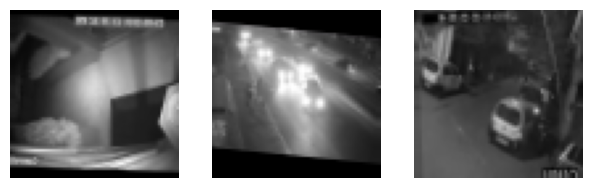

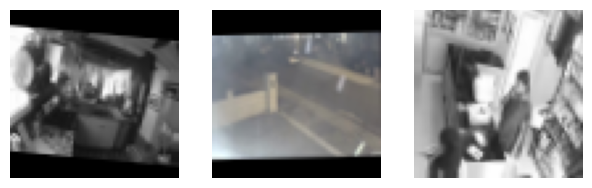

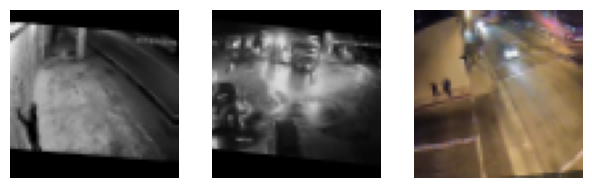

In [ ]:
# Генерация и визуализация изображений после аугментации
for i in range(130,133):
    img, label = train_generator[i]
    plt.figure(figsize=(10, 10))
    for j in range(3):
        plt.subplot(1, 4, j+1)
        plt.imshow(img[j])
        plt.axis('off')
    plt.show()

## Моделирование

В разделе моделирования мы разработаем и оценим различные модели для решения поставленной задачи. Общая архитектура каждой модели имеет следующий вид: извлечение признаков + классификатор.

### Классификатор

В качестве классификатора мы использует Многослойный персептрон (Multilayer Perceptron, MLP). MLP представляет собой нейронную сеть, состоящую из нескольких слоев нейронов, включая входной слой, один или несколько скрытых слоев и выходной слой.



In [ ]:
mlp_hyperparams = {
    'pooling': 'average',
    'sizes': (64, 128, 256),
    'activations': ('relu', 'relu', 'relu'),
    'dropouts': (0.3, 0.3, 0.3),
    'num_classes': NUM_CLASSES
}

def mlp_classifier(inputs, hyperparams):
    if hyperparams['pooling'] == 'average':
        x = tf.keras.layers.GlobalAveragePooling2D()(inputs)
    else:
        x = inputs

    # hidden layers
    for i in range(len(hyperparams['sizes'])):
        x = tf.keras.layers.Dense(hyperparams['sizes'][i],
                                  activation=hyperparams['activations'][i])(x)
        x = tf.keras.layers.Dropout(hyperparams['dropouts'][i])(x)

    # output layer
    x = tf.keras.layers.Dense(hyperparams['num_classes'],
                              activation="softmax",
                              name="classification")(x)

    return x


Вспомогательные функции для оценки качества модели


In [ ]:
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_test)
        y_test = lb.transform(y_test)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_test[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr,lw=2, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
        c_ax.plot(fpr, fpr, 'black',linestyle='dashed', lw=4, label = 'Random Guessing')
        return roc_auc_score(y_test, y_pred, average=average)

    roc_auc_score_value = multiclass_roc_auc_score(y_test , preds  , average = "micro")
    print('ROC AUC score:', roc_auc_score_value)
    plt.title(model_name)
    plt.grid(True)
    plt.xlabel('FALSE POSITIVE RATE', fontsize=18)
    plt.ylabel('TRUE POSITIVE RATE', fontsize=16)
    plt.legend(fontsize = 11.5)
    plt.show()
    return y_test, preds, roc_auc_score_value

#Vision Transformer

In [ ]:
def vit16_extractor(hyperparams):
    feature_extractor = vit.vit_b16(
        image_size=hyperparams['image_size'],
        activation=hyperparams['activation'],
        pretrained=hyperparams['pretrained'],
        include_top=True,
        pretrained_top=False,
        classes=hyperparams['num_classes']
    )

    return feature_extractor

In [ ]:
vit16_hyperparams = {
    'image_size': 64,
    'activation': 'sigmoid',
    'lr': 0.001,
    'num_classes': 14,
    'pretrained': True
}

model = vit16_extractor(vit16_hyperparams)
model.compile(optimizer=tf.keras.optimizers.SGD(vit16_hyperparams['lr']),
            loss='categorical_crossentropy',
            metrics = [tf.keras.metrics.AUC()])
model.summary()

347502902/347502902 [==============================] - 8s 0us/step
Model: "vit-b16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 embedding (Conv2D)          (None, 4, 4, 768)         590592    
                                                                 
 reshape (Reshape)           (None, 16, 768)           0         
                                                                 
 class_token (ClassToken)    (None, 17, 768)           768       
                                                                 
 Transformer/posembed_input  (None, 17, 768)           13056     
  (AddPositionEmbs)                                              
                                                                 
 Transformer/encoderblock_0  ((None, 17, 768),         708

In [ ]:
history = model.fit(x = train_generator,
                    validation_data = test_generator,
                    epochs = 1)

3095/3095 [==============================] - 2616s 836ms/step - loss: 1.3223 - auc: 0.8904 - val_loss: 2.4227 - val_auc: 0.7335


Validation

308it [01:32,  3.34it/s]


ROC AUC score: 0.7335449244815377


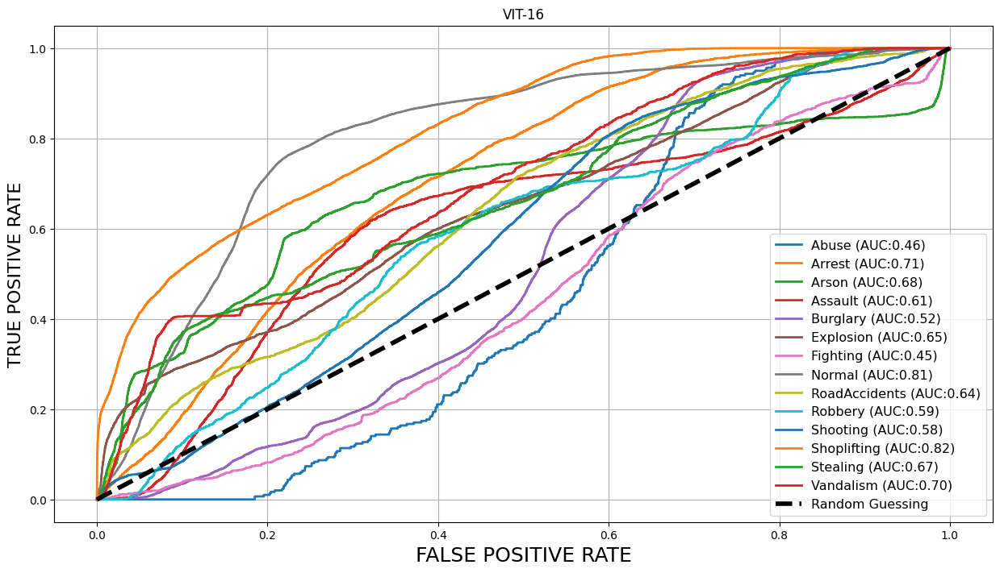

In [ ]:
y_test, preds, roc_auc_score = evaluate(model, test_generator, 'VIT-16')

## ResNet 50

Изучим качество предобученной на imagenet модели архитектуры [ResNet50](https://arxiv.org/abs/1512.03385) в качестве извлекателя признаков.



In [ ]:
def resnet50_extractor(inputs, hyperparams):
    feature_extractor = tf.keras.applications.resnet50.ResNet50(
        include_top=False,
        weights='imagenet',
        input_shape=hyperparams['input_shape'],
        pooling=hyperparams['pooling'],
        classes=1000
    )(inputs)
    return feature_extractor

In [ ]:
resnet50_hyperparams = {
    'input_shape': (64, 64, 3),
    'weights': "imagenet",
    'classes': 1000,
    'pooling': None,  # 'avg' или 'max'
    'trainable': False,
    'lr': 0.001
}

inputs = tf.keras.layers.Input(shape=resnet50_hyperparams['input_shape'])
feature_extractor = resnet50_extractor(inputs, resnet50_hyperparams)
classification_output = mlp_classifier(feature_extractor, mlp_hyperparams)
model = tf.keras.Model(inputs=inputs, outputs = classification_output)
model.layers[1].trainable = resnet50_hyperparams['trainable']
model.compile(optimizer=tf.keras.optimizers.SGD(resnet50_hyperparams['lr']),
            loss='categorical_crossentropy',
            metrics = [tf.keras.metrics.AUC()])

clear_output()
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 resnet50 (Functional)       (None, 2, 2, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 64)                131136    
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 128)               8320      
                                                             

In [ ]:
history = model.fit(x = train_generator,
                    validation_data= test_generator,
                    epochs = 1)

3095/3095 [==============================] - 1970s 635ms/step - loss: 1.7757 - auc_1: 0.8090 - val_loss: 2.2502 - val_auc_1: 0.6895


### Validation

In [ ]:
from sklearn.metrics import roc_auc_score
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_true, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_true)
        y_true = lb.transform(y_true)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_true[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr, lw=2, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
        c_ax.plot([0, 1], [0, 1], 'black', linestyle='dashed', lw=2, label='Random Guessing')
        return roc_auc_score(y_true, y_pred, average=average)

    roc_auc = multiclass_roc_auc_score(y_test, preds, average="micro")
    print('ROC AUC score:', roc_auc)
    plt.title(f"{model_name} ROC Curve")
    plt.xlabel('False Positive Rate')  # Подпись оси X
    plt.ylabel('True Positive Rate')   # Подпись оси Y
    plt.legend(loc='lower right')
    plt.show()
    return y_test, preds, roc_auc

308it [01:09,  4.45it/s]


ROC AUC score: 0.6685488363584087


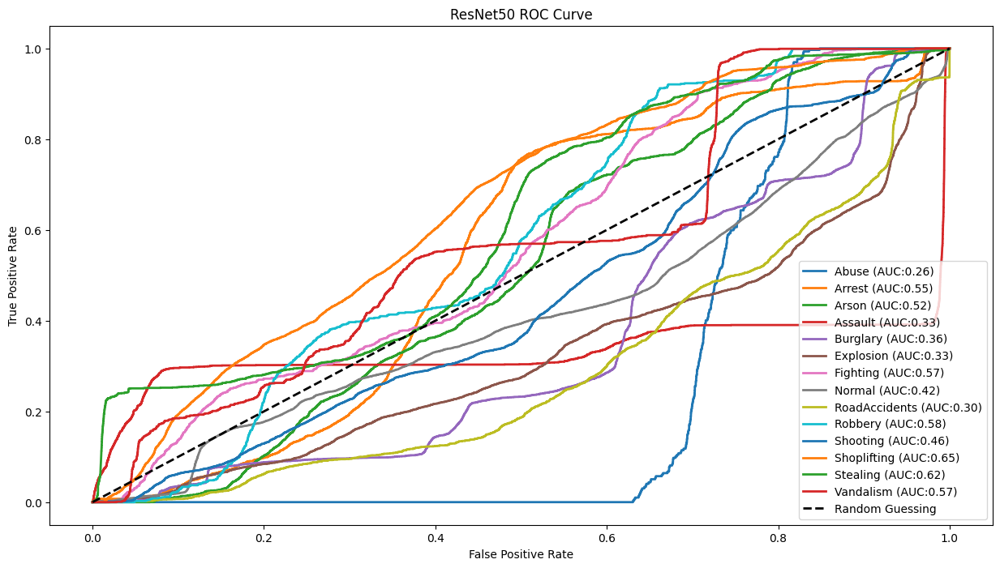

In [ ]:
#попробовать
y_test, preds, roc_auc = evaluate(model, test_generator, 'ResNet50')

### ResNet 34

#со срезкой 90% и 85%



In [ ]:
def resnet34_extractor(inputs, hyperparams):
    ResNet34, preprocess_input = Classifiers.get('resnet34')
    feature_extractor = ResNet34(
        hyperparams['input_shape'],
        weights=hyperparams['weights'],
        include_top=False
    )(inputs)
    return feature_extractor

In [ ]:
resnet34_hyperparams = {
    'input_shape': (64, 64, 3),
    'weights': "imagenet",
    'classes': 1000,
    'trainable': False,
    'lr': 0.001
}

inputs = tf.keras.layers.Input(shape=resnet34_hyperparams['input_shape'])
feature_extractor = resnet34_extractor(inputs, resnet34_hyperparams)
mlp_hyperparams['pooling'] = 'average'
classification_output = mlp_classifier(feature_extractor, mlp_hyperparams)
model = tf.keras.Model(inputs=inputs, outputs = classification_output)
model.layers[1].trainable = resnet34_hyperparams['trainable']
model.compile(optimizer=tf.keras.optimizers.SGD(resnet34_hyperparams['lr']),
            loss='categorical_crossentropy',
            metrics = [tf.keras.metrics.AUC()])

clear_output()
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 model (Functional)          (None, 2, 2, 512)         21302473  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 64)                32832     
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 128)               8320      
                                                           

In [ ]:
history = model.fit(x = train_generator,
                    validation_data=test_generator,
                    epochs = 1)

1428/1428 [==============================] - 864s 600ms/step - loss: 2.5886 - auc: 0.5975 - val_loss: 2.6674 - val_auc: 0.5235


In [ ]:
from sklearn.metrics import roc_auc_score
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_true, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_true)
        y_true = lb.transform(y_true)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_true[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr, lw=2, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
        c_ax.plot([0, 1], [0, 1], 'black', linestyle='dashed', lw=2, label='Random Guessing')
        return roc_auc_score(y_true, y_pred, average=average)

    roc_auc = multiclass_roc_auc_score(y_test, preds, average="micro")
    print('ROC AUC score:', roc_auc)
    plt.title(f"{model_name} ROC Curve")
    plt.xlabel('False Positive Rate')  # Подпись оси X
    plt.ylabel('True Positive Rate')   # Подпись оси Y
    plt.legend(loc='lower right')
    plt.show()
    return y_test, preds, roc_auc

219it [00:47,  4.57it/s]


ROC AUC score: 0.5193227861519899


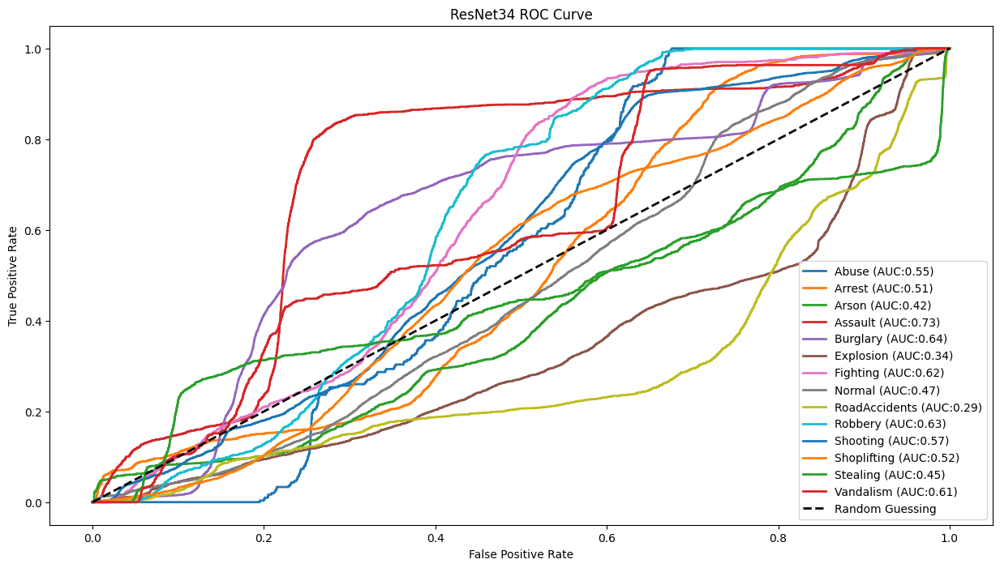

In [ ]:
y_test, preds, roc_auc_score = evaluate(model, test_generator, 'ResNet34')

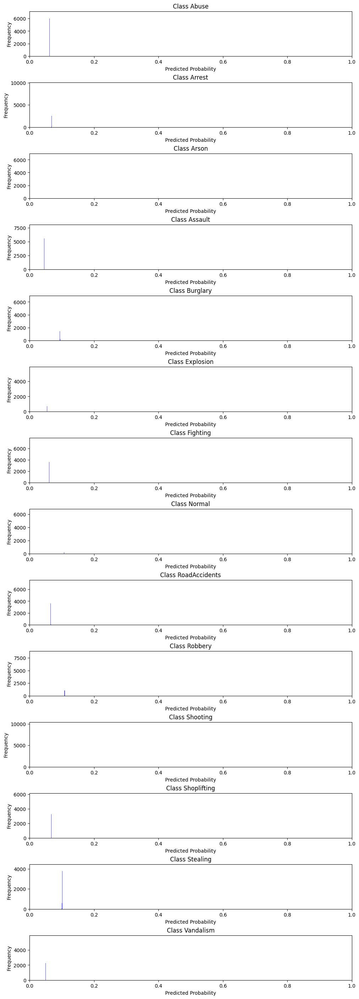

In [ ]:
import matplotlib.pyplot as plt

# Предположим, preds - это ваш массив предсказаний модели
# preds.shape => (количество_образцов, количество_классов)

# Визуализируем распределение предсказаний для каждого класса
num_classes = preds.shape[1]  # Предполагаем, что preds имеет форму [количество примеров, количество классов]
fig, axs = plt.subplots(num_classes, 1, figsize=(10, num_classes * 2), constrained_layout=True)

for i in range(num_classes):
    axs[i].hist(preds[:, i], bins=50, color='blue', alpha=0.7)
    axs[i].set_title(f'Class {CLASS_LABELS[i]}')
    axs[i].set_xlim([0, 1])
    axs[i].set_xlabel('Predicted Probability')
    axs[i].set_ylabel('Frequency')

plt.show()


In [ ]:
threshold = 0.3

accuracy_results = {}
for i in range(len(CLASS_LABELS)):
    y_pred_i = (preds.T[i] > threshold)
    y_test_i = (y_test == i)
    accuracy_results[CLASS_LABELS[i]] = accuracy_score(y_pred_i, y_test_i)

accuracy_results

{'Abuse': 0.9946725387128853,
 'Arrest': 0.9399062366813468,
 'Arson': 0.950188236965478,
 'Assault': 0.9526566273618412,
 'Burglary': 0.8633861343940901,
 'Explosion': 0.8840211677795141,
 'Fighting': 0.9780153430885069,
 'Normal': 0.8268752663730644,
 'RoadAccidents': 0.9524257707060662,
 'Robbery': 0.9851363830089501,
 'Shooting': 0.8637768148884785,
 'Shoplifting': 0.8641319789742862,
 'Stealing': 0.9646078988492683,
 'Vandalism': 0.9801996022162239}

In [ ]:
threshold = 0.9

accuracy_results_2 = {}
for i in range(len(CLASS_LABELS)):
    y_pred_i = (preds.T[i] > threshold)
    y_test_i = (y_test == i)
    accuracy_results_2[CLASS_LABELS[i]] = accuracy_score(y_pred_i, y_test_i)

accuracy_results_2

{'Abuse': 0.9946725387128853,
 'Arrest': 0.9399062366813468,
 'Arson': 0.950188236965478,
 'Assault': 0.9526566273618412,
 'Burglary': 0.8633861343940901,
 'Explosion': 0.8840211677795141,
 'Fighting': 0.9780153430885069,
 'Normal': 0.8268752663730644,
 'RoadAccidents': 0.9524257707060662,
 'Robbery': 0.9851363830089501,
 'Shooting': 0.8637768148884785,
 'Shoplifting': 0.8641319789742862,
 'Stealing': 0.9646078988492683,
 'Vandalism': 0.9801996022162239}

#с весом классов, 1 эпоха. Стало лучше

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Предполагается, что train_generator.classes уже определен
# Сначала получаем все уникальные классы и соответствующие им индексы
classes = np.unique(train_generator.classes)
# Затем вычисляем веса классов
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=classes,
    y=train_generator.classes
)
# Преобразуем веса в словарь
class_weight_dict = dict(enumerate(class_weights))

In [ ]:
#Получение меток классов из генератора данных
y_train = train_generator.classes

# Вычисление весов классов
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

# Создание словаря весов классов для использования в методе fit
class_weight_dict = {i : weight for i, weight in enumerate(class_weights)}

In [ ]:
# Теперь, когда у вас есть словарь весов классов, можно запустить обучение модели
history = model.fit(
    x=train_generator,
    validation_data=test_generator,
    epochs=1,
    class_weight=class_weight_dict  # Передаем веса классов в метод fit
)

1428/1428 [==============================] - 930s 650ms/step - loss: 2.6552 - auc: 0.6082 - val_loss: 2.6281 - val_auc: 0.5761


In [ ]:
from sklearn.metrics import roc_auc_score
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_true, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_true)
        y_true = lb.transform(y_true)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_true[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr, lw=2, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
        c_ax.plot([0, 1], [0, 1], 'black', linestyle='dashed', lw=2, label='Random Guessing')
        return roc_auc_score(y_true, y_pred, average=average)

    roc_auc = multiclass_roc_auc_score(y_test, preds, average="micro")
    print('ROC AUC score:', roc_auc)
    plt.title(f"{model_name} ROC Curve")
    plt.xlabel('False Positive Rate')  # Подпись оси X
    plt.ylabel('True Positive Rate')   # Подпись оси Y
    plt.legend(loc='lower right')
    plt.show()
    return y_test, preds, roc_auc

219it [00:50,  4.31it/s]


ROC AUC score: 0.5660760772616888


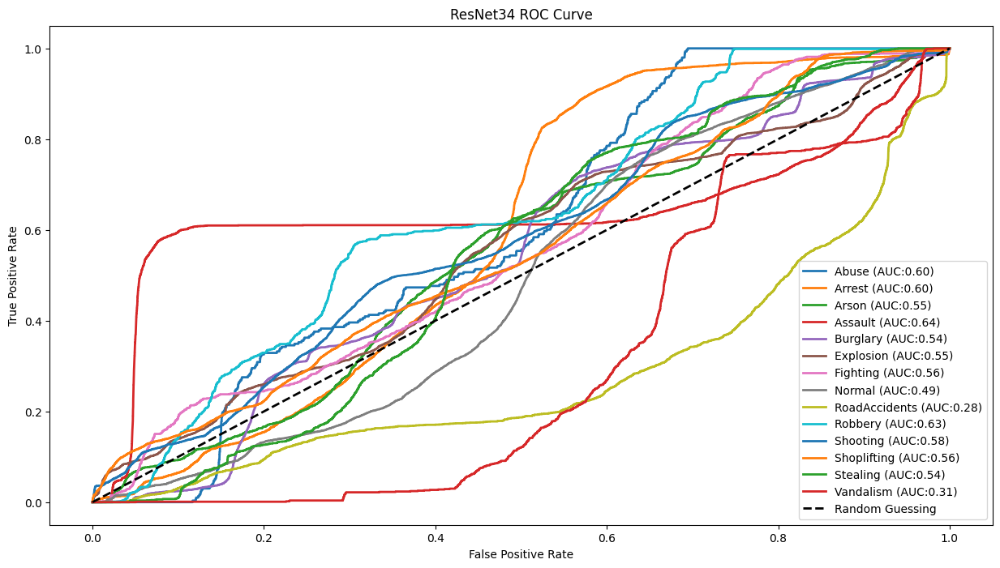

In [ ]:
y_test, preds, roc_auc_score = evaluate(model, test_generator, 'ResNet34')

In [ ]:
threshold = 0.3

accuracy_results = {}
for i in range(len(CLASS_LABELS)):
    y_pred_i = (preds.T[i] > threshold)
    y_test_i = (y_test == i)
    accuracy_results[CLASS_LABELS[i]] = accuracy_score(y_pred_i, y_test_i)

accuracy_results

{'Abuse': 0.9947080551214661,
 'Arrest': 0.9400660605199602,
 'Arson': 0.9502592697826395,
 'Assault': 0.9526388691575508,
 'Burglary': 0.8630842449211535,
 'Explosion': 0.8838613439409007,
 'Fighting': 0.9780331012927973,
 'Normal': 0.826715442534451,
 'RoadAccidents': 0.9523724960931951,
 'Robbery': 0.9851718994175309,
 'Shooting': 0.86384784770564,
 'Shoplifting': 0.8642918028128995,
 'Stealing': 0.9646611734621395,
 'Vandalism': 0.9802883932376758}

{'Abuse': 0.9947080551214661,
 'Arrest': 0.9400660605199602,
 'Arson': 0.9502592697826395,
 'Assault': 0.9526388691575508,
 'Burglary': 0.8630842449211535,
 'Explosion': 0.8838613439409007,
 'Fighting': 0.9780331012927973,
 'Normal': 0.826715442534451,
 'RoadAccidents': 0.9523724960931951,
 'Robbery': 0.9851718994175309,
 'Shooting': 0.86384784770564,
 'Shoplifting': 0.8642918028128995,
 'Stealing': 0.9646611734621395,
 'Vandalism': 0.9802883932376758}

# плюс все предыдущее, поставим 3 эпохи

In [ ]:
history = model.fit(
    x=train_generator,
    validation_data=test_generator,
    epochs=3,
    class_weight=class_weight_dict  # Передаем веса классов в метод fit
)

Epoch 1/3
1428/1428 [==============================] - 914s 640ms/step - loss: 2.6410 - auc: 0.5916 - val_loss: 2.6316 - val_auc: 0.5174
Epoch 2/3
1428/1428 [==============================] - 914s 640ms/step - loss: 2.6396 - auc: 0.5736 - val_loss: 2.6323 - val_auc: 0.5095
Epoch 3/3
1428/1428 [==============================] - 868s 608ms/step - loss: 2.6391 - auc: 0.5572 - val_loss: 2.6326 - val_auc: 0.5433


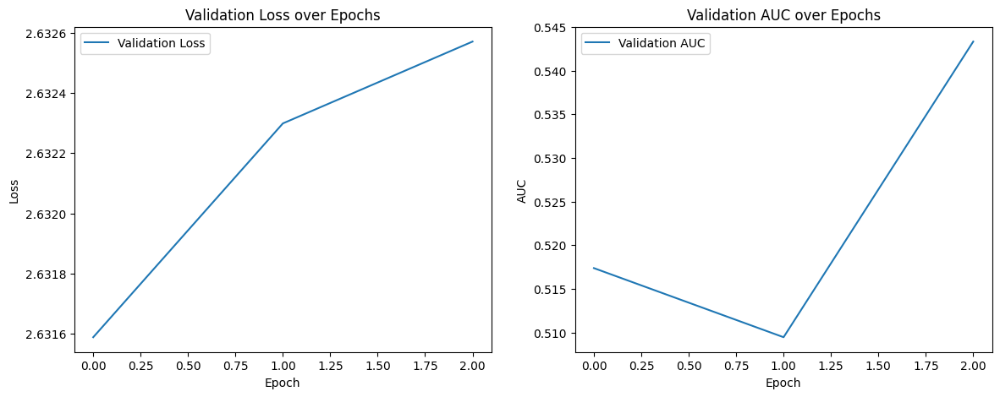

In [ ]:
import matplotlib.pyplot as plt

# Построение графика для валидационной потери
plt.figure(figsize=(14, 5))

# График валидационной потери
plt.subplot(1, 2, 1)
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Validation Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# График валидационного AUC
plt.subplot(1, 2, 2)
plt.plot(history.history['val_auc'], label='Validation AUC')
plt.title('Validation AUC over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()

plt.show()


In [ ]:
additional_epochs = 2  # Указываем, что хотим продолжить обучение еще на 2 эпохи

# Продолжаем обучение модели еще на 2 эпохи
additional_history = model.fit(
    x=train_generator,
    validation_data=test_generator,
    epochs=additional_epochs,
    class_weight=class_weight_dict  # Передаем веса классов в метод fit
)

# Теперь у вас есть история обучения для дополнительных эпох в переменной additional_history


Epoch 1/2
1428/1428 [==============================] - 863s 604ms/step - loss: 2.6388 - auc: 0.5448 - val_loss: 2.6338 - val_auc: 0.5481
Epoch 2/2
1428/1428 [==============================] - 870s 609ms/step - loss: 2.6387 - auc: 0.5334 - val_loss: 2.6342 - val_auc: 0.5409


In [ ]:
# Объединяем старую и новую истории обучения
for key in additional_history.history:
    history.history[key] += additional_history.history[key]


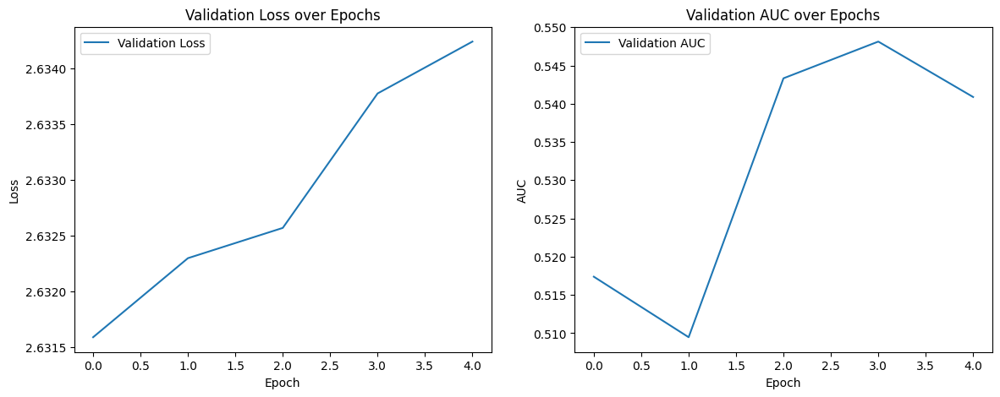

In [ ]:

# Построение графика для валидационной потери
plt.figure(figsize=(14, 5))

# График валидационной потери
plt.subplot(1, 2, 1)
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Validation Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# График валидационного AUC
plt.subplot(1, 2, 2)
plt.plot(history.history['val_auc'], label='Validation AUC')
plt.title('Validation AUC over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()

plt.show()

In [ ]:
additional_epochs = 10  # Указываем, что хотим продолжить обучение еще на 12 эпох

# Продолжаем обучение модели еще на 2 эпохи
additional_history = model.fit(
    x=train_generator,
    validation_data=test_generator,
    epochs=additional_epochs,
    class_weight=class_weight_dict  # Передаем веса классов в метод fit
)

# Теперь есть история обучения для дополнительных эпох в переменной additional_history

Epoch 1/10
1428/1428 [==============================] - 859s 601ms/step - loss: 2.6385 - auc: 0.5211 - val_loss: 2.6351 - val_auc: 0.5107
Epoch 2/10
1428/1428 [==============================] - 865s 606ms/step - loss: 2.6383 - auc: 0.5118 - val_loss: 2.6357 - val_auc: 0.5159
Epoch 3/10
1428/1428 [==============================] - 862s 603ms/step - loss: 2.6382 - auc: 0.5117 - val_loss: 2.6361 - val_auc: 0.5078
Epoch 4/10
1428/1428 [==============================] - 868s 608ms/step - loss: 2.6380 - auc: 0.5126 - val_loss: 2.6365 - val_auc: 0.5109
Epoch 5/10
1428/1428 [==============================] - 859s 602ms/step - loss: 2.6378 - auc: 0.5116 - val_loss: 2.6368 - val_auc: 0.5072
Epoch 6/10
1428/1428 [==============================] - 862s 604ms/step - loss: 2.6377 - auc: 0.5127 - val_loss: 2.6371 - val_auc: 0.5025
Epoch 7/10
1428/1428 [==============================] - 848s 594ms/step - loss: 2.6376 - auc: 0.5118 - val_loss: 2.6373 - val_auc: 0.5039
Epoch 8/10
1428/1428 [============

In [ ]:
#Объединяем старую и новую истории обучения
for key in additional_history.history:
    history.history[key] += additional_history.history[key]

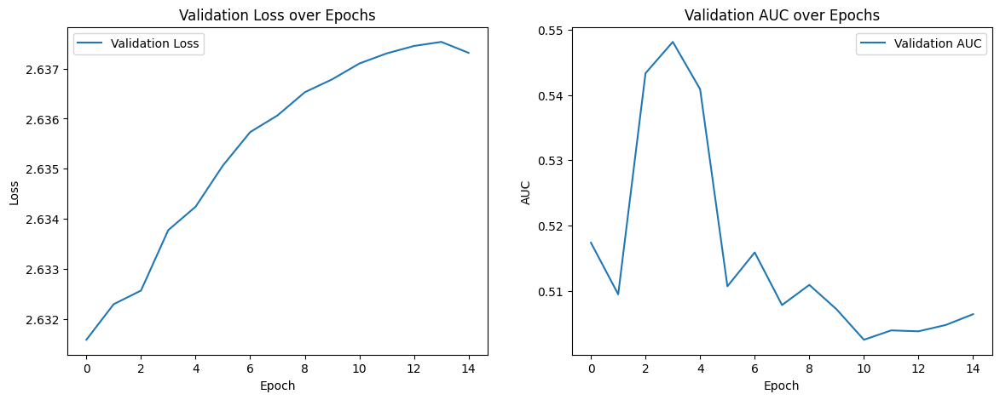

In [ ]:
#Построение графика для валидационной потери
plt.figure(figsize=(14, 5))

# График валидационной потери
plt.subplot(1, 2, 1)
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Validation Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# График валидационного AUC
plt.subplot(1, 2, 2)
plt.plot(history.history['val_auc'], label='Validation AUC')
plt.title('Validation AUC over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()

plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_true, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_true)
        y_true = lb.transform(y_true)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_true[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr, lw=2, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
        c_ax.plot([0, 1], [0, 1], 'black', linestyle='dashed', lw=2, label='Random Guessing')
        return roc_auc_score(y_true, y_pred, average=average)

    roc_auc = multiclass_roc_auc_score(y_test, preds, average="micro")
    print('ROC AUC score:', roc_auc)
    plt.title(f"{model_name} ROC Curve")
    plt.xlabel('False Positive Rate')  # Подпись оси X
    plt.ylabel('True Positive Rate')   # Подпись оси Y
    plt.legend(loc='lower right')
    plt.show()
    return y_test, preds, roc_auc

219it [00:46,  4.69it/s]


ROC AUC score: 0.5798023449039147


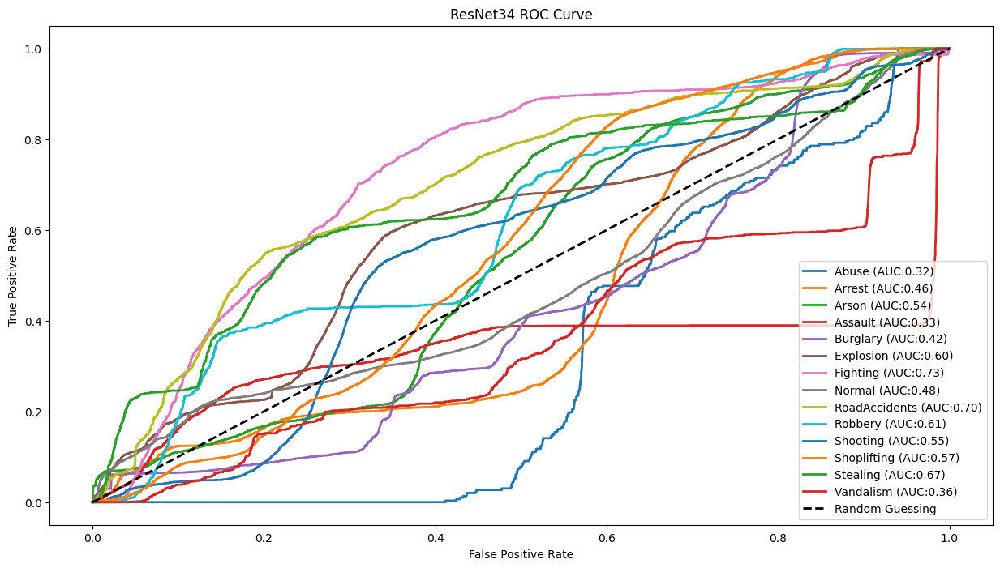

In [ ]:
y_test, preds, roc_auc_score = evaluate(model, test_generator, 'ResNet34')

#visiom tranfsformer 2

In [ ]:
def vit16_extractor(hyperparams):
    feature_extractor = vit.vit_b16(
        image_size=hyperparams['image_size'],
        activation=hyperparams['activation'],
        pretrained=hyperparams['pretrained'],
        include_top=True,
        pretrained_top=False,
        classes=hyperparams['num_classes']
    )

    return feature_extractor

In [ ]:
vit16_hyperparams = {
    'image_size': 64,
    'activation': 'sigmoid',
    'lr': 0.001,
    'num_classes': 14,
    'pretrained': True
}

model = vit16_extractor(vit16_hyperparams)
model.compile(optimizer=tf.keras.optimizers.SGD(vit16_hyperparams['lr']),
            loss='categorical_crossentropy',
            metrics = [tf.keras.metrics.AUC()])
model.summary()

347502902/347502902 [==============================] - 5s 0us/step
Model: "vit-b16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 embedding (Conv2D)          (None, 4, 4, 768)         590592    
                                                                 
 reshape (Reshape)           (None, 16, 768)           0         
                                                                 
 class_token (ClassToken)    (None, 17, 768)           768       
                                                                 
 Transformer/posembed_input  (None, 17, 768)           13056     
  (AddPositionEmbs)                                              
                                                                 
 Transformer/encoderblock_0  ((None, 17, 768),         708

In [ ]:
history = model.fit(x = train_generator,
                    validation_data = test_generator,
                    epochs = 1)

1428/1428 [==============================] - 1162s 796ms/step - loss: 2.2742 - auc_1: 0.7282 - val_loss: 3.1084 - val_auc_1: 0.5504


In [ ]:
from sklearn.metrics import roc_auc_score
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_true, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_true)
        y_true = lb.transform(y_true)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_true[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr, lw=2, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
        c_ax.plot([0, 1], [0, 1], 'black', linestyle='dashed', lw=2, label='Random Guessing')
        return roc_auc_score(y_true, y_pred, average=average)

    roc_auc = multiclass_roc_auc_score(y_test, preds, average="micro")
    print('ROC AUC score:', roc_auc)
    plt.title(f"{model_name} ROC Curve")
    plt.xlabel('False Positive Rate')  # Подпись оси X
    plt.ylabel('True Positive Rate')   # Подпись оси Y
    plt.legend(loc='lower right')
    plt.show()
    return y_test, preds, roc_auc

219it [01:00,  3.60it/s]


ROC AUC score: 0.550219942488103


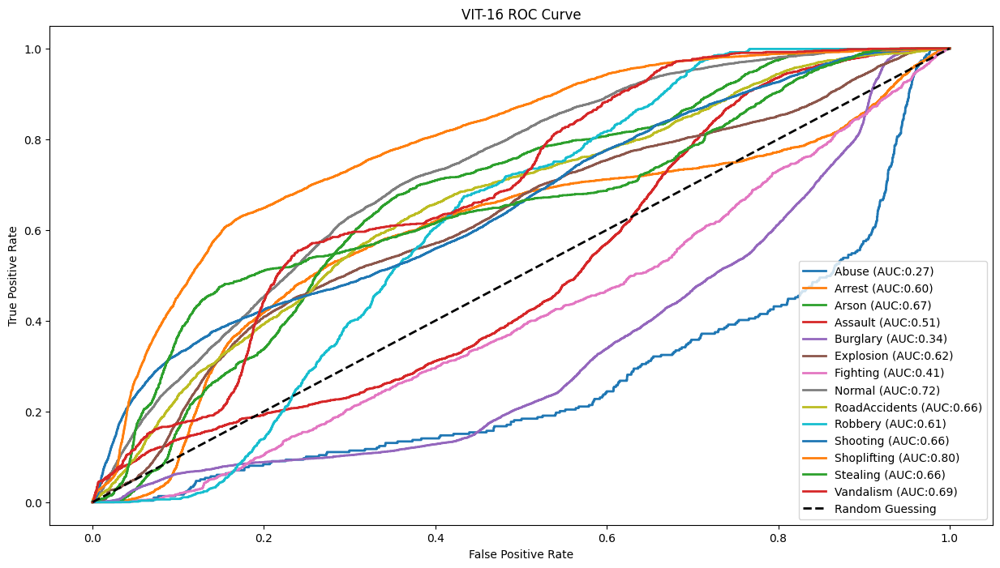

In [ ]:
y_test, preds, roc_auc_score = evaluate(model, test_generator, 'VIT-16')

#Обученная ResNet34 - срезка 50% Normal и больше ничего

In [ ]:
def resnet34_extractor(inputs, hyperparams):
    ResNet34, preprocess_input = Classifiers.get('resnet34')
    feature_extractor = ResNet34(
        hyperparams['input_shape'],
        weights=hyperparams['weights'],
        include_top=False
    )(inputs)
    return feature_extractor

In [ ]:
resnet34_hyperparams = {
    'input_shape': (64, 64, 3),
    'weights': "imagenet",
    'classes': 1000,
    'trainable': False,
    'lr': 0.001
}

inputs = tf.keras.layers.Input(shape=resnet34_hyperparams['input_shape'])
feature_extractor = resnet34_extractor(inputs, resnet34_hyperparams)
mlp_hyperparams['pooling'] = 'average'
classification_output = mlp_classifier(feature_extractor, mlp_hyperparams)
model = tf.keras.Model(inputs=inputs, outputs = classification_output)
model.layers[1].trainable = resnet34_hyperparams['trainable']
model.compile(optimizer=tf.keras.optimizers.SGD(resnet34_hyperparams['lr']),
            loss='categorical_crossentropy',
            metrics = [tf.keras.metrics.AUC()])

clear_output()
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 model (Functional)          (None, 2, 2, 512)         21302473  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 64)                32832     
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 128)               8320      
                                                           

In [ ]:
history = model.fit(x = train_generator,
                    validation_data=test_generator,
                    epochs = 1)

3095/3095 [==============================] - 2175s 700ms/step - loss: 1.8125 - auc: 0.8001 - val_loss: 2.2853 - val_auc: 0.6652


### Validation

In [ ]:
from sklearn.metrics import roc_auc_score
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_true, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_true)
        y_true = lb.transform(y_true)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_true[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr, lw=2, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
        c_ax.plot([0, 1], [0, 1], 'black', linestyle='dashed', lw=2, label='Random Guessing')
        return roc_auc_score(y_true, y_pred, average=average)

    roc_auc = multiclass_roc_auc_score(y_test, preds, average="micro")
    print('ROC AUC score:', roc_auc)
    plt.title(f"{model_name} ROC Curve")
    plt.xlabel('False Positive Rate')  # Подпись оси X
    plt.ylabel('True Positive Rate')   # Подпись оси Y
    plt.legend(loc='lower right')
    plt.show()
    return y_test, preds, roc_auc

308it [01:15,  4.10it/s]


ROC AUC score: 0.6740023693286482


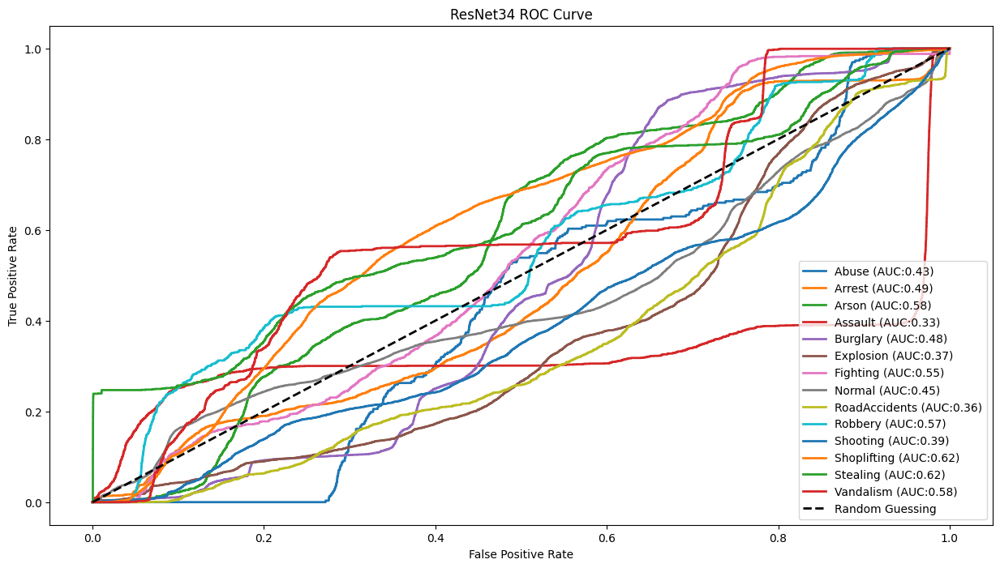

In [ ]:
y_test, preds, roc_auc_score = evaluate(model, test_generator, 'ResNet34')

In [ ]:
#проверить - возможна ошибка (?) - в пороге
#переназвать переменную / смотреть код
#FPR использовать, recall

#баланс классов - каждый
# для многокласс- срезать 70-80% Normal - доп исследование . Посчитать сколько по каждому классу останется объектов . Аугментировать . Up-sampling (каждое видео должно содержать себя и аугментированное). 150 видео - это мало , 300 - ничего
# треть времени повышать lr, затем вниз . Трансформер колбасит после какого-то периода обучения
#

threshold = 0.3

accuracy_results = {}
for i in range(len(CLASS_LABELS)):
    y_pred_i = (preds.T[i] > threshold)
    y_test_i = (y_test == i)
    accuracy_results[CLASS_LABELS[i]] = accuracy_score(y_pred_i, y_test_i)

accuracy_results

{'Abuse': 0.996242551522589,
 'Arrest': 0.9573143731892767,
 'Arson': 0.9645509406272536,
 'Assault': 0.9663221284617234,
 'Burglary': 0.9027491365459307,
 'Explosion': 0.9172728767885834,
 'Fighting': 0.9843629416899662,
 'Normal': 0.4115987500474425,
 'RoadAccidents': 0.9661576610199512,
 'Robbery': 0.9894234783598801,
 'Shooting': 0.9031919335045482,
 'Shoplifting': 0.9032678415545968,
 'Stealing': 0.9748491327505282,
 'Vandalism': 0.9858937540326151}

In [ ]:
threshold = 0.9

accuracy_results = {}
for i in range(len(CLASS_LABELS)):
    y_pred_i = (preds.T[i] > threshold)
    y_test_i = (y_test == i)
    accuracy_results[CLASS_LABELS[i]] = accuracy_score(y_pred_i, y_test_i)

accuracy_results

{'Abuse': 0.996242551522589,
 'Arrest': 0.9573143731892767,
 'Arson': 0.9645509406272536,
 'Assault': 0.9663221284617234,
 'Burglary': 0.9027491365459307,
 'Explosion': 0.9172728767885834,
 'Fighting': 0.9843629416899662,
 'Normal': 0.5884012499525575,
 'RoadAccidents': 0.9661576610199512,
 'Robbery': 0.9894234783598801,
 'Shooting': 0.9031919335045482,
 'Shoplifting': 0.9032678415545968,
 'Stealing': 0.9748491327505282,
 'Vandalism': 0.9858937540326151}

In [ ]:
threshold = 0.3

accuracy_results = {}
for i in range(len(CLASS_LABELS)):
    y_pred_i = (preds.T[i] > threshold)
    y_test_i = (y_test == i)
    accuracy_results[CLASS_LABELS[i]] = accuracy_score(y_pred_i, y_test_i)

accuracy_results

{'Abuse': 0.996242551522589,
 'Arrest': 0.9573143731892767,
 'Arson': 0.9645509406272536,
 'Assault': 0.9663221284617234,
 'Burglary': 0.9027491365459307,
 'Explosion': 0.9172728767885834,
 'Fighting': 0.9843629416899662,
 'Normal': 0.4115987500474425,
 'RoadAccidents': 0.9661576610199512,
 'Robbery': 0.9894234783598801,
 'Shooting': 0.9031919335045482,
 'Shoplifting': 0.9032678415545968,
 'Stealing': 0.9748491327505282,
 'Vandalism': 0.9858937540326151}

In [ ]:
threshold = 0.5

accuracy_results = {}
for i in range(len(CLASS_LABELS)):
    y_pred_i = (preds.T[i] > threshold)
    y_test_i = (y_test == i)
    accuracy_results[CLASS_LABELS[i]] = accuracy_score(y_pred_i, y_test_i)

accuracy_results

{'Abuse': 0.996242551522589,
 'Arrest': 0.9573143731892767,
 'Arson': 0.9645509406272536,
 'Assault': 0.9663221284617234,
 'Burglary': 0.9027491365459307,
 'Explosion': 0.9172728767885834,
 'Fighting': 0.9843629416899662,
 'Normal': 0.4115987500474425,
 'RoadAccidents': 0.9661576610199512,
 'Robbery': 0.9894234783598801,
 'Shooting': 0.9031919335045482,
 'Shoplifting': 0.9032678415545968,
 'Stealing': 0.9748491327505282,
 'Vandalism': 0.9858937540326151}

### MobileNet v2

Изучим качество предобученной на imagenet модели архитектуры [MobileNet v2](https://arxiv.org/abs/1801.04381) в качестве извлекателя признаков.

In [ ]:
def mobile_netv2_extractor(inputs, hyperparams):
    feature_extractor = tf.keras.applications.MobileNetV2(
        input_shape=hyperparams['input_shape'],
        include_top=False,
        weights=hyperparams["weights"],
        alpha=hyperparams['alpha'])(inputs)
    return feature_extractor

In [ ]:
mobilenetv2_hyperparams = {
    'input_shape': (64, 64, 3),
    'weights': "imagenet",
    'classes': 1000,
    'alpha': 1.0,
    'trainable': False,
    'lr': 0.001
}


inputs = tf.keras.layers.Input(shape=mobilenetv2_hyperparams['input_shape'])
feature_extractor = mobile_netv2_extractor(inputs, mobilenetv2_hyperparams)
classification_output = mlp_classifier(feature_extractor, mlp_hyperparams)
model = tf.keras.Model(inputs=inputs, outputs = classification_output)
model.layers[1].trainable = mobilenetv2_hyperparams['trainable']
model.compile(optimizer=tf.keras.optimizers.SGD(mobilenetv2_hyperparams['lr']),
            loss='categorical_crossentropy',
            metrics = [tf.keras.metrics.AUC()])

clear_output()
model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 2, 2, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_3  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_9 (Dense)             (None, 64)                81984     
                                                                 
 dropout_9 (Dropout)         (None, 64)                0         
                                                                 
 dense_10 (Dense)            (None, 128)               8320

In [ ]:
history = model.fit(x = train_generator,
                    validation_data=test_generator,
                    epochs = 1)

3095/3095 [==============================] - 1983s 639ms/step - loss: 1.7302 - auc_4: 0.8340 - val_loss: 2.3503 - val_auc_4: 0.6762


### Validation

In [ ]:
from sklearn.metrics import roc_auc_score
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_true, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_true)
        y_true = lb.transform(y_true)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_true[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr, lw=2, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
        c_ax.plot([0, 1], [0, 1], 'black', linestyle='dashed', lw=2, label='Random Guessing')
        return roc_auc_score(y_true, y_pred, average=average)

    roc_auc = multiclass_roc_auc_score(y_test, preds, average="micro")
    print('ROC AUC score:', roc_auc)
    plt.title(f"{model_name} ROC Curve")
    plt.xlabel('False Positive Rate')  # Подпись оси X
    plt.ylabel('True Positive Rate')   # Подпись оси Y
    plt.legend(loc='lower right')
    plt.show()
    return y_test, preds, roc_auc

308it [01:06,  4.62it/s]


ROC AUC score: 0.6759393857680005


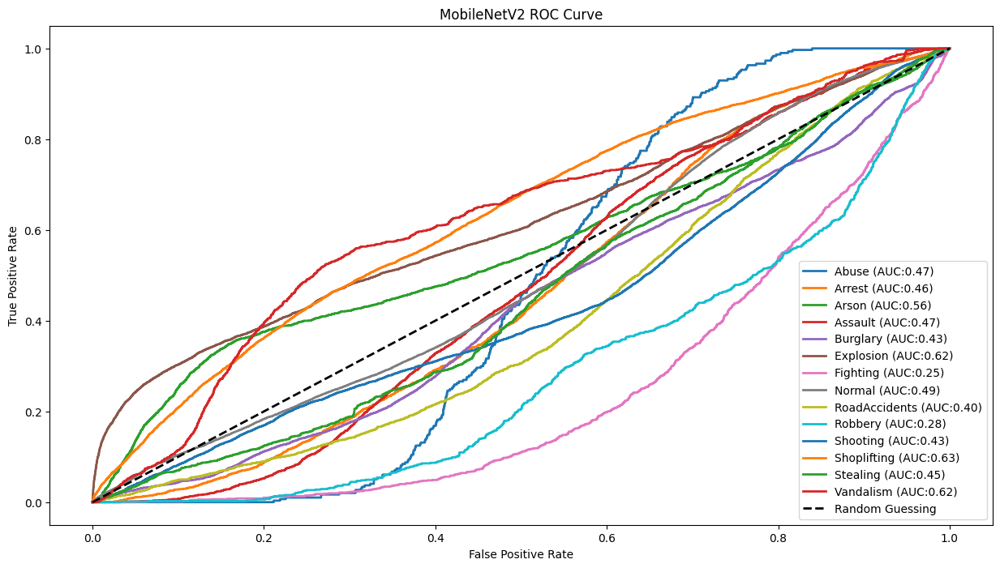

In [ ]:
y_test, preds, roc_auc_score = evaluate(model, test_generator, 'MobileNetV2')

435/435 [==============================] - 65s 147ms/step
ROC AUC score: 0.7763673521350849


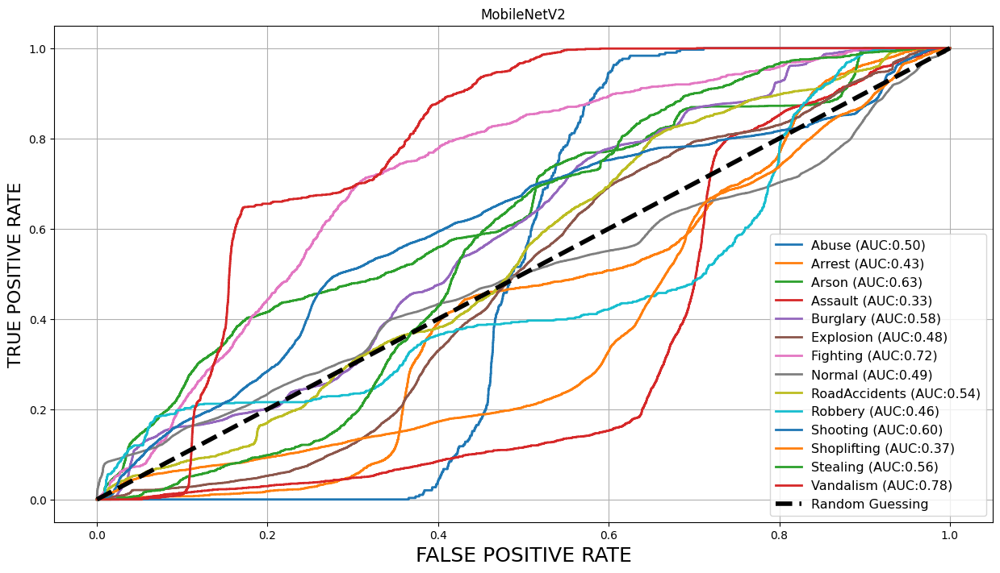

In [ ]:
#старое
preds = model.predict(test_generator)
y_test = test_generator.classes
fig, c_ax = plt.subplots(1,1, figsize = (15,8))

def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    for (idx, c_label) in enumerate(CLASS_LABELS):
        fpr, tpr, thresholds = roc_curve(y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr,lw=2, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
    c_ax.plot(fpr, fpr, 'black',linestyle='dashed', lw=4, label = 'Random Guessing')
    return roc_auc_score(y_test, y_pred, average=average)

print('ROC AUC score:', multiclass_roc_auc_score(y_test , preds  , average = "micro"))
plt.title("MobileNetV2")
plt.grid(True)
plt.xlabel('FALSE POSITIVE RATE', fontsize=18)
plt.ylabel('TRUE POSITIVE RATE', fontsize=16)
plt.legend(fontsize = 11.5)
plt.show()

## VGG-19

Изучим качество предобученной на imagenet модели архитектуры [VGG-19](https://arxiv.org/abs/1409.1556) в качестве извлекателя признаков.

In [ ]:
def vgg19_extractor(inputs, hyperparams):
    feature_extractor = tf.keras.applications.vgg19.VGG19(
        input_shape=hyperparams['input_shape'],
        include_top=False,
        weights=hyperparams["weights"],
        pooling=hyperparams["pooling"],
        classifier_activation='softmax'
    )(inputs)

    return feature_extractor

In [ ]:
mlp_hyperparams = {
    'pooling': None,
    'sizes': (256, 102, 512),
    'activations': ('relu', 'relu', 'relu'),
    'dropouts': (0.3, 0.5, 0.4),
    'num_classes': 14
}

vgg19_hyperparams = {
    'input_shape': (64, 64, 3),
    'weights': "imagenet",
    'pooling': 'avg',
    'trainable': True,
    'lr': 0.001
}


inputs = tf.keras.layers.Input(shape=vgg19_hyperparams['input_shape'])
feature_extractor = vgg19_extractor(inputs, vgg19_hyperparams)
classification_output = mlp_classifier(feature_extractor, mlp_hyperparams)
model = tf.keras.Model(inputs=inputs, outputs = classification_output)
model.layers[1].trainable = vgg19_hyperparams['trainable']
model.compile(optimizer=tf.keras.optimizers.SGD(vgg19_hyperparams['lr']),
            loss='categorical_crossentropy',
            metrics = [tf.keras.metrics.AUC()])

clear_output()
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 dense_3 (Dense)             (None, 256)               131328    
                                                                 
 dropout_3 (Dropout)         (None, 256)               0         
                                                                 
 dense_4 (Dense)             (None, 102)               26214     
                                                                 
 dropout_4 (Dropout)         (None, 102)               0         
                                                                 
 dense_5 (Dense)             (None, 512)               5273

In [ ]:
history = model.fit(x = train_generator,
                    validation_data = test_generator,
                    epochs = 1)

3095/3095 [==============================] - 2339s 753ms/step - loss: 1.3738 - auc_1: 0.9025 - val_loss: 2.3070 - val_auc_1: 0.7407


## Validation

In [ ]:
from sklearn.metrics import roc_auc_score
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_true, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_true)
        y_true = lb.transform(y_true)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_true[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr, lw=2, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
        c_ax.plot([0, 1], [0, 1], 'black', linestyle='dashed', lw=2, label='Random Guessing')
        return roc_auc_score(y_true, y_pred, average=average)

    roc_auc = multiclass_roc_auc_score(y_test, preds, average="micro")
    print('ROC AUC score:', roc_auc)
    plt.title(f"{model_name} ROC Curve")
    plt.xlabel('False Positive Rate')  # Подпись оси X
    plt.ylabel('True Positive Rate')   # Подпись оси Y
    plt.legend(loc='lower right')
    plt.show()
    return y_test, preds, roc_auc

308it [01:12,  4.26it/s]


ROC AUC score: 0.7412277727282994


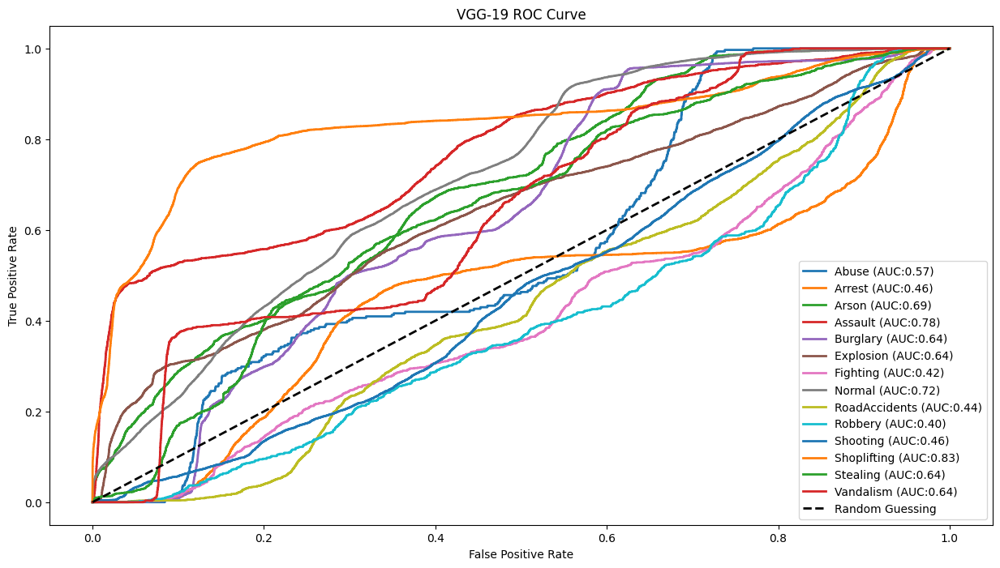

In [ ]:
y_test, preds, roc_auc_score = evaluate(model, test_generator, 'VGG-19')

## Xception

Изучим качество предобученной на imagenet модели архитектуры [Xception](https://arxiv.org/abs/1610.02357) в качестве извлекателя признаков.

In [ ]:
def xception_extractor(inputs, hyperparams):
    feature_extractor = tf.keras.applications.xception.Xception(
        input_shape=hyperparams['input_shape'],
        include_top=False,
        weights=hyperparams["weights"],
        pooling=hyperparams["pooling"],
        classifier_activation='softmax'
    )(inputs)

    return feature_extractor

In [ ]:
mlp_hyperparams = {
    'pooling': None,
    'sizes': (256, 102, 512),
    'activations': ('relu', 'relu', 'relu'),
    'dropouts': (0.3, 0.5, 0.4),
    'num_classes': 14
}

xception_hyperparams = {
    'input_shape': (75, 75, 3),
    'weights': "imagenet",
    'pooling': 'avg',
    'trainable': True,
    'lr': 0.001
}


inputs = tf.keras.layers.Input(shape=xception_hyperparams['input_shape'])
feature_extractor = xception_extractor(inputs, xception_hyperparams)
classification_output = mlp_classifier(feature_extractor, mlp_hyperparams)
model = tf.keras.Model(inputs=inputs, outputs = classification_output)
model.layers[1].trainable = xception_hyperparams['trainable']
model.compile(optimizer=tf.keras.optimizers.SGD(xception_hyperparams['lr']),
            loss='categorical_crossentropy',
            metrics = [tf.keras.metrics.AUC()])

clear_output()
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 75, 75, 3)]       0         
                                                                 
 xception (Functional)       (None, 2048)              20861480  
                                                                 
 dense_6 (Dense)             (None, 256)               524544    
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 102)               26214     
                                                                 
 dropout_7 (Dropout)         (None, 102)               0         
                                                                 
 dense_8 (Dense)             (None, 512)               5273

In [ ]:
history = model.fit(x = train_generator,
                    validation_data=test_generator,
                    epochs = 1)

3095/3095 [==============================] - 2476s 794ms/step - loss: 1.6533 - auc_2: 0.8555 - val_loss: 2.3204 - val_auc_2: 0.7138


## Validation

In [ ]:
from sklearn.metrics import roc_auc_score
def evaluate(model, data_generator, model_name=''):
    y_test = []
    preds = []
    for idx, batch in tqdm(enumerate(data_generator)):
        preds.append(model.predict(batch[0], verbose=False))
        y_test.append(batch[1].argmax(1))
        if idx == len(data_generator):
            break

    y_test = np.concatenate(y_test)
    preds = np.concatenate(preds)

    fig, c_ax = plt.subplots(1,1, figsize = (15,8))

    def multiclass_roc_auc_score(y_true, y_pred, average="macro"):
        lb = LabelBinarizer()
        lb.fit(y_true)
        y_true = lb.transform(y_true)
        for (idx, c_label) in enumerate(CLASS_LABELS):
            fpr, tpr, thresholds = roc_curve(y_true[:,idx].astype(int), y_pred[:,idx])
            c_ax.plot(fpr, tpr, lw=2, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
        c_ax.plot([0, 1], [0, 1], 'black', linestyle='dashed', lw=2, label='Random Guessing')
        return roc_auc_score(y_true, y_pred, average=average)

    roc_auc = multiclass_roc_auc_score(y_test, preds, average="micro")
    print('ROC AUC score:', roc_auc)
    plt.title(f"{model_name} ROC Curve")
    plt.xlabel('False Positive Rate')  # Подпись оси X
    plt.ylabel('True Positive Rate')   # Подпись оси Y
    plt.legend(loc='lower right')
    plt.show()
    return y_test, preds, roc_auc

435/435 [==============================] - 64s 146ms/step
ROC AUC score: 0.7510557911376562


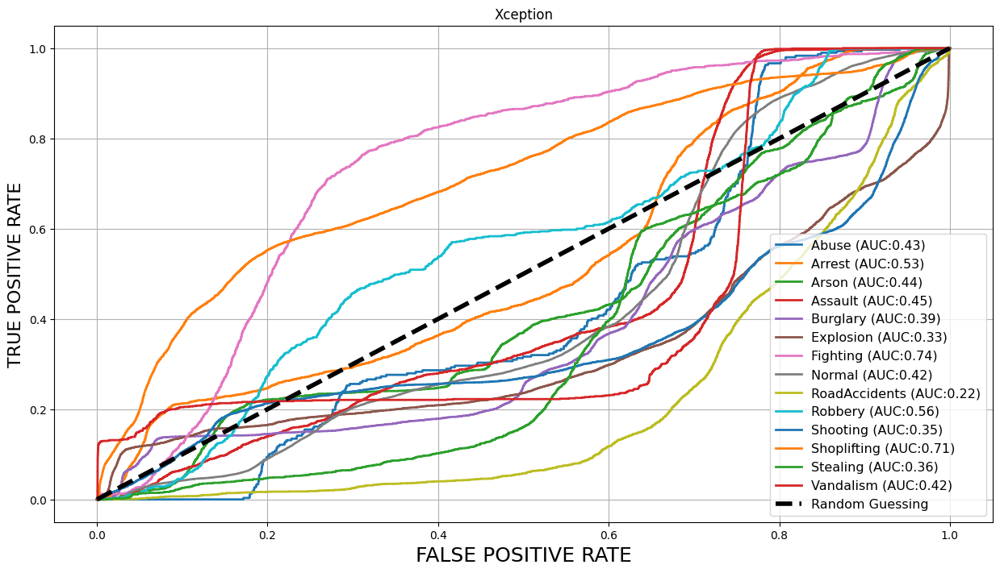

In [ ]:
preds = model.predict(test_generator)
y_test = test_generator.classes
fig, c_ax = plt.subplots(1,1, figsize = (15,8))

def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    for (idx, c_label) in enumerate(CLASS_LABELS):
        fpr, tpr, thresholds = roc_curve(y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr,lw=2, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
    c_ax.plot(fpr, fpr, 'black',linestyle='dashed', lw=4, label = 'Random Guessing')
    return roc_auc_score(y_test, y_pred, average=average)

print('ROC AUC score:', multiclass_roc_auc_score(y_test , preds  , average = "micro"))
plt.title("Xception")
plt.grid(True)
plt.xlabel('FALSE POSITIVE RATE', fontsize=18)
plt.ylabel('TRUE POSITIVE RATE', fontsize=16)
plt.legend(fontsize = 11.5)
plt.show()

## Вывод

Лучшая архитектура MobileNetV2 + Transformer на 20 эпохах

###План работы

### Введение
1. Обзор предметной области: введение в проблематику социальных аномалий поведения человека и их важность.
2. Цели и задачи исследования: четкое определение целей исследования и задач, которые должны быть решены для достижения этих целей.
3. Актуальность исследования: обоснование важности анализа видео для выявления социальных аномалий поведения.

### Обзор литературы
1. Текущее состояние исследований: обзор существующих методов анализа видео на предмет выявления аномального поведения.
2. Описание используемых моделей нейросетей
3. Анализ предыдущих подходов: сильные и слабые стороны существующих методик и их результатов (?).

### Методология
1. Описание датасета UCF Crime: структура, объем, характеристика данных.
2. Препроцессинг данных: методы обработки данных перед использованием в моделях.
3. Описание моделей: детальное описание архитектур моделей и их конфигураций.
4. Критерии сравнения: метрики для оценки эффективности моделей.

### Эксперименты
1. Обучение моделей: подробное описание процесса обучения каждой модели, включая параметры обучения.
2. Тестирование моделей: процесс тестирования и оценки моделей.
3. Анализ результатов: сравнительный анализ полученных результатов между моделями.
4. Оптимизация и настройка порогов: эксперименты с различными порогами детекции для улучшения результатов.

### Результаты и обсуждение
1. Сравнение производительности моделей: анализ и интерпретация результатов сравнения.
2. Выводы по результатам экспериментов: какие модели показали себя лучше и в каких условиях.
3. Обсуждение полученных данных: рассмотрение возможных причин полученных результатов и их соответствие/несоответствие ожиданиям.

### Выводы и дальнейшие перспективы
1. Выводы исследования: краткое изложение основных выводов работы и их вклад в понимание использования нейросетевых моделей для анализа видео на предмет выявления социальных аномалий.
2. Практическая значимость: обсуждение того, как результаты могут быть применены в системах видеонаблюдения, безопасности и социального анализа.

### Предложения по дальнейшим исследованиям
1. Разработка динамической модели: исходя из сравнительного анализа, предложить основу для создания динамической модели, способной адаптироваться к различным условиям и контекстам анализа видео. Обсудить, какие архитектурные и алгоритмические подходы могут быть использованы для этого.
2. Интеграция и оптимизация лучших практик: определить, как лучшие практики и настройки, выявленные в ходе экспериментов, могут быть интегрированы в разработку динамической модели.
3. Тестирование в реальных условиях: планы по тестированию предложенной динамической модели в реальных условиях для оценки ее эффективности и адаптивности.
4. Обсуждение потенциального влияния: размышления о том, как динамическая модель может изменить подходы к мониторингу и анализу видео для выявления и предотвращения социальных аномалий.

### Заключительные замечания
- Вклад в область исследований: подчеркнуть, как работа способствует развитию методов машинного обучения и анализа видео.
- Этические соображения: кратко затронуть этические аспекты использования таких систем для наблюдения и анализа поведения людей.